# Your first neural network

In this project, you'll build your first neural network and use it to predict daily bike rental ridership. We've provided some of the code, but left the implementation of the neural network up to you (for the most part). After you've submitted this project, feel free to explore the data and the model more.



In [183]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Load and prepare the data

A critical step in working with neural networks is preparing the data correctly. Variables on different scales make it difficult for the network to efficiently learn the correct weights. Below, we've written the code to load and prepare the data. You'll learn more about this soon!

In [184]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)

In [185]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Checking out the data

This dataset has the number of riders for each hour of each day from January 1 2011 to December 31 2012. The number of riders is split between casual and registered, summed up in the `cnt` column. You can see the first few rows of the data above.

Below is a plot showing the number of bike riders over the first 10 days or so in the data set. (Some days don't have exactly 24 entries in the data set, so it's not exactly 10 days.) You can see the hourly rentals here. This data is pretty complicated! The weekends have lower over all ridership and there are spikes when people are biking to and from work during the week. Looking at the data above, we also have information about temperature, humidity, and windspeed, all of these likely affecting the number of riders. You'll be trying to capture all this with your model.

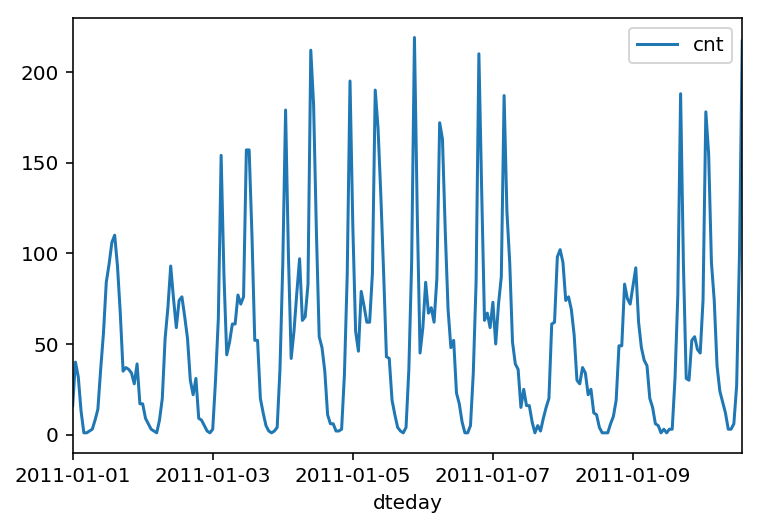

In [186]:
rides[:24*10].plot(x='dteday', y='cnt')

### Dummy variables
Here we have some categorical variables like season, weather, month. To include these in our model, we'll need to make binary dummy variables. This is simple to do with Pandas thanks to `get_dummies()`.

In [187]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0.22,0.80,0.0,8,32,40,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0.22,0.80,0.0,5,27,32,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0.24,0.75,0.0,3,10,13,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0.24,0.75,0.0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1


### Scaling target variables
To make training the network easier, we'll standardize each of the continuous variables. That is, we'll shift and scale the variables such that they have zero mean and a standard deviation of 1.

The scaling factors are saved so we can go backwards when we use the network for predictions.

In [188]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### Splitting the data into training, testing, and validation sets

We'll save the data for the last approximately 21 days to use as a test set after we've trained the network. We'll use this set to make predictions and compare them with the actual number of riders.

In [189]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]

We'll split the data into two sets, one for training and one for validating as the network is being trained. Since this is time series data, we'll train on historical data, then try to predict on future data (the validation set).

In [190]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]

## Time to build the network

Below you'll build your network. We've built out the structure and the backwards pass. You'll implement the forward pass through the network. You'll also set the hyperparameters: the learning rate, the number of hidden units, and the number of training passes.

<img src="assets/neural_network.png" width=300px>

The network has two layers, a hidden layer and an output layer. The hidden layer will use the sigmoid function for activations. The output layer has only one node and is used for the regression, the output of the node is the same as the input of the node. That is, the activation function is $f(x)=x$. A function that takes the input signal and generates an output signal, but takes into account the threshold, is called an activation function. We work through each layer of our network calculating the outputs for each neuron. All of the outputs from one layer become inputs to the neurons on the next layer. This process is called *forward propagation*.

We use the weights to propagate signals forward from the input to the output layers in a neural network. We use the weights to also propagate error backwards from the output back into the network to update our weights. This is called *backpropagation*.

> **Hint:** You'll need the derivative of the output activation function ($f(x) = x$) for the backpropagation implementation. If you aren't familiar with calculus, this function is equivalent to the equation $y = x$. What is the slope of that equation? That is the derivative of $f(x)$.

Below, you have these tasks:
1. Implement the sigmoid function to use as the activation function. Set `self.activation_function` in `__init__` to your sigmoid function.
2. Implement the forward pass in the `train` method.
3. Implement the backpropagation algorithm in the `train` method, including calculating the output error.
4. Implement the forward pass in the `run` method.
  

In [191]:
class NeuralNetwork(object):
    def __init__(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Initialize weights
        self.weights_input_to_hidden = np.random.normal(0.0, self.input_nodes**-0.5, 
                                       (self.input_nodes, self.hidden_nodes))

        self.weights_hidden_to_output = np.random.normal(0.0, self.hidden_nodes**-0.5, 
                                       (self.hidden_nodes, self.output_nodes))
        self.lr = learning_rate
        
        #### TODO: Set self.activation_function to your implemented sigmoid function ####
        #
        # Note: in Python, you can define a function with a lambda expression,
        # as shown below.
        #self.activation_function = lambda x : 1 / (1+np.exp(-x))  # Replace 0 with your sigmoid calculation.
        
        ### If the lambda code above is not something you're familiar with,
        # You can uncomment out the following three lines and put your 
        # implementation there instead.
        #
        def sigmoid(x):
            return 1 / (1+np.exp(-x))  # Replace 0 with your sigmoid calculation here
        self.activation_function = sigmoid
                    
    
    def train(self, features, targets):
        ''' Train the network on batch of features and targets. 
        
            Arguments
            ---------
            
            features: 2D array, each row is one data record, each column is a feature
            targets: 1D array of target values
        
        '''
        n_records = features.shape[0]
        delta_weights_i_h = np.zeros(self.weights_input_to_hidden.shape)
        delta_weights_h_o = np.zeros(self.weights_hidden_to_output.shape)
        for X, y in zip(features, targets):
            #### Implement the forward pass here ####
            ### Forward pass ###
            # TODO: Hidden layer - Replace these values with your calculations.
            hidden_inputs = np.dot(X,self.weights_input_to_hidden) # signals into hidden layer
            hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer

            # TODO: Output layer - Replace these values with your calculations.
            final_inputs = np.dot(hidden_outputs,self.weights_hidden_to_output) # signals into final output layer
            final_outputs = final_inputs # signals from final output layer
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # TODO: Output error - Replace this value with your calculations.
            error = y - final_outputs # Output layer error is the difference between desired target and actual output.
            
            # TODO: Calculate the hidden layer's contribution to the error
            hidden_error = np.dot(error, self.weights_hidden_to_output.T)
            #hidden_error = error
            # TODO: Backpropagated error terms - Replace these values with your calculations.
            output_error_term = error
            hidden_error_term =  (hidden_outputs * (1 - hidden_outputs)) * hidden_error
            

            # Weight step (input to hidden)
            print(error)
            #print(features.shape)
            delta_weights_i_h += hidden_error_term * X[:,None]
            # Weight step (hidden to output)
            delta_weights_h_o += output_error_term * hidden_outputs[:,None]

        # TODO: Update the weights - Replace these values with your calculations.
        self.weights_hidden_to_output +=  self.lr * delta_weights_h_o /n_records  # update hidden-to-output weights with gradient descent step
        self.weights_input_to_hidden += self.lr * delta_weights_i_h /n_records# update input-to-hidden weights with gradient descent step
 
    def run(self, features):
        ''' Run a forward pass through the network with input features 
        
            Arguments
            ---------
            features: 1D array of feature values
        '''
        
        #### Implement the forward pass here ####
        # TODO: Hidden layer - replace these values with the appropriate calculations.
        hidden_inputs = np.dot(features, self.weights_input_to_hidden)# signals into hidden layer
        hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
        
        # TODO: Output layer - Replace these values with the appropriate calculations.
        final_inputs = np.dot(hidden_outputs, self.weights_hidden_to_output) # signals into final output layer
        final_outputs = final_inputs # signals from final output layer 
        
        return final_outputs

In [192]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## Unit tests

Run these unit tests to check the correctness of your network implementation. This will help you be sure your network was implemented correctly befor you starting trying to train it. These tests must all be successful to pass the project.

In [193]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()
        
        network.train(inputs, targets)
        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

.....

[ 0.30001076]



----------------------------------------------------------------------
Ran 5 tests in 0.008s

OK


<unittest.runner.TextTestResult run=5 errors=0 failures=0>

## Training the network

Here you'll set the hyperparameters for the network. The strategy here is to find hyperparameters such that the error on the training set is low, but you're not overfitting to the data. If you train the network too long or have too many hidden nodes, it can become overly specific to the training set and will fail to generalize to the validation set. That is, the loss on the validation set will start increasing as the training set loss drops.

You'll also be using a method know as Stochastic Gradient Descent (SGD) to train the network. The idea is that for each training pass, you grab a random sample of the data instead of using the whole data set. You use many more training passes than with normal gradient descent, but each pass is much faster. This ends up training the network more efficiently. You'll learn more about SGD later.

### Choose the number of iterations
This is the number of batches of samples from the training data we'll use to train the network. The more iterations you use, the better the model will fit the data. However, if you use too many iterations, then the model with not generalize well to other data, this is called overfitting. You want to find a number here where the network has a low training loss, and the validation loss is at a minimum. As you start overfitting, you'll see the training loss continue to decrease while the validation loss starts to increase.

### Choose the learning rate
This scales the size of weight updates. If this is too big, the weights tend to explode and the network fails to fit the data. A good choice to start at is 0.1. If the network has problems fitting the data, try reducing the learning rate. Note that the lower the learning rate, the smaller the steps are in the weight updates and the longer it takes for the neural network to converge.

### Choose the number of hidden nodes
The more hidden nodes you have, the more accurate predictions the model will make. Try a few different numbers and see how it affects the performance. You can look at the losses dictionary for a metric of the network performance. If the number of hidden units is too low, then the model won't have enough space to learn and if it is too high there are too many options for the direction that the learning can take. The trick here is to find the right balance in number of hidden units you choose.

In [194]:
import sys

### Set the hyperparameters here ###
iterations = 3000
learning_rate = 0.05
hidden_nodes = 3
output_nodes = 1

N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.ix[batch].values, train_targets.ix[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

[-0.08291816]
[-0.00302558]
[ 0.3788013]
[ 3.87732023]
[ 0.05522507]
[ 0.37836494]
[-0.2459183]
[ 2.35126409]
[-0.13728786]
[ 2.51894723]
[ 1.02923314]
[-0.27138167]
[ 0.34314889]
[ 0.77839886]
[ 0.00523143]
[ 0.79146635]
[ 2.26186213]
[ 0.92922494]
[ 0.30852214]
[ 0.30917334]
[ 2.61502718]
[ 1.80786467]
[-0.25567118]
[ 1.32440012]
[ 1.31014951]
[ 0.20809986]
[ 0.27446626]
[-0.07151951]
[ 0.17101677]
[ 2.08897303]
[ 1.67182886]
[ 0.69090243]
[ 0.54711808]
[ 4.17395174]
[-0.04573633]
[-0.1187958]
[ 0.12662194]
[-0.0946002]
[ 0.05852349]
[ 0.19008996]
[ 0.05624577]
[ 3.01438359]
[ 0.01455034]
[ 3.08084011]
[ 2.34006532]
[-0.1463935]
[ 1.52782555]
[ 1.60333406]
[ 0.97607045]
[-0.13053952]
[-0.22985091]
[ 0.94360742]
[ 3.53940701]
[ 0.46346689]
[ 0.07676137]
[ 1.13401662]
[-0.15035411]
[ 0.87859168]
[ 1.21644893]
[ 0.23070776]
[ 0.45842265]
[ 1.36982762]
[-0.01638039]
[ 0.06594625]
[ 0.22387242]
[-0.01492955]
[ 0.45753452]
[ 0.51643596]
[ 0.53051758]
[ 0.55650721]
[ 1.17196199]
[-0.0837607

/Users/hementsharma/anaconda/envs/dlnd/lib/python3.6/site-packages/ipykernel_launcher.py:16: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate_ix
  app.launch_new_instance()


[ 0.66337348]
[ 2.30597759]
[ 0.51892617]
[-0.17698042]
[ 3.66716502]
[ 2.53974422]
[ 0.03474989]
[-0.10910492]
[ 0.27953339]
[ 3.57340214]
[-0.00087218]
[ 0.02621753]
[ 0.37946253]
[-0.04020057]
[ 0.64025315]
[ 0.66565618]
[ 0.50851013]
[ 1.82266399]
[ 0.47382153]
[ 0.02313569]
[ 0.00013392]
[ 0.39725866]
[ 1.2199916]
[ 1.75059146]
[ 1.07006985]
[ 0.90349075]
[ 1.13234284]
[ 1.1816192]
[ 0.95525335]
[-0.09949028]
[ 0.5513809]
[ 0.38365592]
[ 1.83938192]
[-0.05202123]
[-0.03065109]
[-0.30699317]
[ 2.36662383]
[-0.06493981]
[-0.24211074]
[-0.00934045]
[ 0.19673953]
[ 3.29893903]
[-0.07054224]
[ 0.95495201]
[-0.15967544]
[ 2.71813955]
[-0.07970754]
[ 1.46598609]
[-0.13003688]
[-0.01623081]
[ 0.20478879]
[ 1.2610587]
[ 0.08027936]
[-0.05661502]
[ 1.26166349]
[ 1.26712434]
[ 1.80854009]
[ 1.49202568]
[ 0.03617094]
[ 0.02094205]
[ 0.85301131]
[ 1.28965191]
[-0.09275729]
[-0.2205085]
[ 0.40482866]
[ 0.44356805]
[ 1.32029983]
[ 0.54132175]
[ 0.44075772]
[-0.14763746]
[ 0.18586486]
[-0.0063476

[ 1.88872081]
[ 0.83134054]
[ 0.90746344]
[ 0.82367792]
[-0.05606195]
[ 2.64118496]
[-0.1652989]
[ 0.01948162]
[ 3.59944105]
[ 1.96017469]
[-0.05063218]
[ 0.90403963]
[ 0.60452791]
[ 0.77616164]
[-0.08679371]
[-0.0107859]
[ 0.07284234]
[ 0.76015344]
[-0.26439651]
[ 1.72057591]
[ 0.08491256]
[-0.27567037]
[-0.16359022]
[-0.31542312]
[ 1.21549081]
[ 2.76144656]
[ 2.42789825]
[ 1.64713617]
[ 3.32120652]
[ 2.541238]
[ 0.06293527]
[ 0.06722305]
[ 2.63639195]
[-0.38545481]
[-0.20409957]
[-0.18770142]
[ 2.41894546]
[ 0.95708578]
Progress: 0.2% ... Training loss: 1.390 ... Validation loss: 2.117[-0.35109987]
[-0.30889151]
[-0.32948403]
[ 1.46159449]
[-0.02809872]
[ 1.18198029]
[ 0.16945864]
[ 3.25771089]
[-0.16315773]
[-0.15826965]
[-0.14159416]
[ 2.13125361]
[-0.11794394]
[ 0.97013644]
[-0.09452146]
[ 2.38489517]
[-0.11983799]
[-0.09146951]
[ 0.48680475]
[ 4.14484707]
[ 0.3749806]
[ 2.11284206]
[ 1.22928315]
[-0.12459261]
[ 0.10507252]
[ 0.45544081]
[-0.26279611]
[-0.17092693]
[ 0.05461203]
[

[-0.25075614]
[-0.39459496]
[ 2.6078858]
[ 0.17550949]
[-0.15406971]
[ 2.26623151]
[ 0.05105808]
[ 0.85693]
[ 0.75841693]
[ 0.96033136]
[ 0.8813339]
[-0.26602711]
[-0.26070542]
[ 0.14971675]
[-0.30366876]
[ 2.19167211]
[ 0.1304902]
[ 1.03602772]
[-0.36033418]
[ 1.71856636]
[ 2.7646347]
[ 1.60270604]
[ 0.12869193]
[ 0.40734386]
[ 2.26665169]
[-0.07164971]
[-0.3970571]
[ 2.22789084]
[ 1.68850804]
[ 1.46392693]
[ 1.4114825]
[ 1.17524664]
[ 0.33784785]
[-0.32125879]
[ 0.12011352]
[ 0.4200174]
[ 0.14440547]
[ 0.65427533]
[ 1.44744708]
[ 1.25261512]
[-0.11150704]
[-0.17009702]
[ 1.24265454]
[ 1.51417907]
[ 0.10516424]
[-0.3503892]
[ 0.04413614]
[ 0.0018524]
[-0.41965573]
[-0.36144969]
[ 1.19794348]
[ 0.51183256]
[-0.19241792]
[ 2.00433347]
[ 0.49626313]
[ 0.53987625]
[ 0.14258682]
[ 0.5175662]
[ 1.14857027]
[ 1.14361216]
[ 0.68463546]
[ 1.18987175]
[-0.18546704]
[ 1.11502477]
[-0.37814657]
[ 0.72084653]
[ 0.1736735]
[-0.35341816]
[ 0.19621479]
[ 0.18002558]
[-0.18421719]
[ 0.13592818]
[ 0.33

Progress: 0.5% ... Training loss: 1.181 ... Validation loss: 1.849[-0.2832381]
[ 0.00882333]
[ 0.00680925]
[ 2.11705274]
[-0.30339643]
[ 0.13861278]
[ 1.46935365]
[ 0.21369312]
[-0.36235845]
[-0.15352738]
[-0.35688592]
[ 1.47442272]
[ 2.34339815]
[ 0.58880318]
[ 2.76228962]
[ 0.23546574]
[ 2.93221265]
[ 0.56539893]
[-0.32272055]
[-0.34762079]
[ 0.92743302]
[-0.2855684]
[ 0.09080189]
[ 0.51371239]
[ 2.48250918]
[ 1.45521011]
[ 0.43458647]
[-0.20148873]
[ 0.44645064]
[ 1.29514201]
[-0.07563801]
[ 0.32862064]
[ 3.17045208]
[ 0.00474602]
[ 0.08038439]
[ 1.2387238]
[ 1.05906476]
[-0.0872582]
[ 0.42254794]
[ 0.56552881]
[-0.47441903]
[-0.03141591]
[-0.3606348]
[-0.39056073]
[-0.59070447]
[-0.36491244]
[-0.36173884]
[ 0.79082532]
[ 0.39759255]
[-0.40008777]
[-0.1406372]
[-0.12529934]
[ 0.97425588]
[-0.31172583]
[ 1.21030723]
[ 1.48645237]
[ 0.59654179]
[ 0.37799111]
[ 0.6623109]
[-0.39239239]
[ 1.85694051]
[ 0.88704419]
[ 0.97149224]
[ 1.95112369]
[-0.24630182]
[ 0.59355113]
[ 0.09927488]
[-0

[ 0.04392952]
Progress: 0.6% ... Training loss: 1.111 ... Validation loss: 1.750[ 2.87757028]
[-0.57167714]
[ 0.66574392]
[-0.14223042]
[-0.21494382]
[-0.28366595]
[-0.13398679]
[ 0.44376463]
[ 0.27793515]
[-0.51837287]
[ 0.5646733]
[-0.49181988]
[-0.41715575]
[ 1.11861742]
[-0.05301069]
[ 0.19256637]
[-0.30658682]
[ 0.8067983]
[ 0.16636454]
[ 1.1048458]
[-0.54004387]
[ 1.57144309]
[ 2.50482088]
[-0.53403911]
[ 0.20328163]
[ 2.23052966]
[-0.19144002]
[ 0.79899818]
[-0.36211725]
[ 1.18516239]
[ 1.66346619]
[ 0.37639414]
[ 3.62124891]
[ 0.21521057]
[-0.26741219]
[ 0.50073908]
[-0.2949957]
[-0.20558019]
[ 0.54585201]
[ 0.87174893]
[ 0.21019992]
[ 0.51400452]
[ 0.91722457]
[-0.36500469]
[ 2.0107892]
[ 1.13979047]
[ 1.15752954]
[-0.02963622]
[-0.41485865]
[ 0.02032435]
[ 0.15763623]
[ 0.79386274]
[ 1.28734583]
[-0.30589675]
[ 0.79564197]
[ 0.13136095]
[ 0.90704461]
[-0.45161529]
[ 0.37421583]
[-0.4246233]
[ 1.1434158]
[ 0.79995961]
[-0.4704461]
[ 0.29916705]
[ 0.64388636]
[ 0.72745655]
[-0.

[-0.12172891]
[-0.34111438]
[-0.55172729]
[ 0.12467917]
[-0.01779936]
[-0.25036323]
[-0.09329629]
[ 0.56653311]
[ 0.51738882]
[ 1.50981446]
[ 0.53304883]
[-0.11742142]
[-0.46674088]
[ 1.36847292]
[-0.46116351]
[-0.47843024]
[-0.1679585]
[-0.41523221]
[ 0.37145789]
[ 2.70862943]
[ 2.78496225]
[-0.3048638]
[ 0.07417636]
[-0.39096571]
[ 1.90534418]
[ 0.2158204]
[ 1.45066873]
[-0.41289333]
[ 0.3351199]
[-0.41300673]
[ 3.55750954]
[-0.61213198]
[-0.41813752]
[-0.54487049]
[ 0.20093359]
[-0.45085712]
[ 0.56653311]
[ 0.10636253]
[ 0.37232212]
[-0.27588021]
[-0.02077562]
[ 2.15507803]
[ 0.18259437]
[-0.43046938]
Progress: 0.8% ... Training loss: 1.059 ... Validation loss: 1.671[-0.41263457]
[ 2.45204188]
[ 1.02265545]
[-0.00629564]
[ 0.93463065]
[-0.5667787]
[-0.1978172]
[ 1.82073119]
[ 0.33011607]
[ 0.00247924]
[-0.36536292]
[-0.06615273]
[ 0.63466649]
[ 0.47785085]
[ 0.82460462]
[ 1.56484858]
[-0.42342869]
[ 0.38588496]
[-0.47327806]
[-0.56586288]
[ 0.44945459]
[-0.51839365]
[-0.44686706]
[ 

[-0.12707022]
[-0.4117519]
[-0.6168679]
[-0.14014254]
[ 0.95444765]
[-0.27343079]
[-0.06690884]
[-0.30590951]
[ 0.75421437]
[ 1.78476302]
[ 1.59907552]
[-0.6765881]
[-0.4502614]
[ 0.19386086]
[-0.34337995]
[-0.15382752]
[-0.41348934]
[ 0.09532176]
[-0.27550504]
[ 0.51375413]
[ 0.66468217]
[ 1.54400635]
[-0.52660162]
[-0.06614359]
[ 0.69209058]
[ 1.11588366]
[ 0.15514177]
[-0.65253139]
[-0.23835395]
[-0.70414552]
[ 1.61558936]
[-0.53079623]
[-0.3140329]
[ 1.52020448]
[ 2.9881057]
[ 0.62848001]
[ 2.23081772]
[ 0.90354912]
[-0.70874363]
[-0.57737223]
[ 0.47826868]
[ 1.7137265]
[ 0.24051094]
[ 0.96963207]
[-0.27020686]
[-0.61063958]
[ 0.5020035]
[ 0.29436257]
[-0.64353163]
[ 1.11641077]
[ 0.80411126]
[ 2.86103416]
[-0.5567584]
[ 0.92598971]
[-0.2256396]
[ 0.69804652]
[-0.65144925]
[ 0.2070091]
[ 0.68293805]
[ 0.96759107]
[-0.15213603]
[ 0.38075807]
[ 0.28786391]
[ 1.01130575]
[-0.49702904]
[-0.60553357]
[ 2.55494818]
[-0.502561]
[-0.54172677]
[ 0.21947249]
[ 2.00736456]
[ 0.28032227]
[ 1.0

[-0.71054687]
[-0.19757189]
[ 0.64745962]
[ 0.87370878]
[ 2.03252567]
[-0.11939321]
[ 0.91204318]
[ 2.43986309]
[-0.67099323]
[-0.62440572]
[ 0.96923537]
[ 1.38334369]
[ 0.67130712]
[-0.72078086]
[-0.31378306]
[ 1.00372336]
[ 2.19159245]
Progress: 1.1% ... Training loss: 0.996 ... Validation loss: 1.570[-0.54609024]
[ 1.76292089]
[-0.37156642]
[-0.70432708]
[-0.36941065]
[ 1.90186032]
[-0.30156272]
[-0.48287447]
[-0.71665166]
[ 2.89383392]
[ 0.45634517]
[-0.05439901]
[ 0.15656666]
[-0.67230526]
[-0.54384216]
[-0.64878008]
[-0.34846541]
[-0.67785206]
[ 0.55942416]
[-0.43167713]
[ 2.87666376]
[-0.12997943]
[ 0.17926705]
[-0.45942216]
[-0.59661987]
[ 0.08665538]
[ 3.87699981]
[-0.49769305]
[ 0.44797282]
[-0.63693795]
[ 2.05680799]
[-0.02559667]
[-0.58651319]
[ 0.54471994]
[ 0.01986188]
[-0.47613217]
[ 0.4579376]
[-0.05242853]
[-0.08740018]
[-0.64734419]
[ 0.5897617]
[-0.23086086]
[ 0.36736513]
[-0.29429073]
[-0.68897379]
[-0.18912086]
[-0.17271303]
[ 1.230429]
[ 0.45267943]
[-0.15710639]


[-0.11049664]
[ 1.42069647]
[-0.17977384]
[ 0.56843393]
[-0.13630623]
[-0.7266948]
[-0.53457479]
[-0.59304425]
[-0.54711415]
[-0.73286351]
[ 0.44176754]
[ 0.56062064]
[-0.21747905]
[-0.46004635]
[ 3.80704722]
[ 2.6662701]
[-0.10379732]
[ 1.19757918]
[-0.27133085]
[ 0.00371561]
[-0.2915943]
[ 1.32510925]
[ 0.2725869]
[-0.20334859]
[-0.19779435]
[ 0.14437818]
[-0.37848515]
[-0.32896011]
[ 0.95543938]
[ 0.88186267]
[ 0.07265379]
[-0.25810959]
[ 0.58285788]
[-0.19775257]
[-0.67215172]
[ 0.22867777]
[-0.83247491]
[-0.54901181]
[-0.07621634]
[-0.54886476]
[-0.70751959]
[-0.36146026]
[-0.75866239]
[ 1.41714269]
[-0.67784457]
[ 2.02847645]
[ 0.48177068]
[ 0.41607863]
[-0.45469697]
[-0.54417216]
[-0.61289807]
[-0.74126703]
[ 2.76143655]
[-0.53457479]
Progress: 1.3% ... Training loss: 0.975 ... Validation loss: 1.534[-0.08731012]
[-0.71106375]
[-0.55939559]
[ 1.0069708]
[ 0.37439117]
[ 2.1800818]
[-0.2021587]
[ 0.71331278]
[ 0.27926575]
[-0.05489512]
[ 0.15990449]
[ 1.47194532]
[ 0.42315858]
[ 2

Progress: 1.4% ... Training loss: 0.956 ... Validation loss: 1.498[ 2.96608584]
[-0.70275503]
[-0.17446689]
[-0.64655282]
[-0.46902939]
[ 0.3136579]
[-0.46021953]
[-0.7029617]
[-0.33725504]
[-0.17906383]
[ 2.58420852]
[ 0.5119596]
[-0.67005961]
[ 1.38610267]
[ 1.94500582]
[ 2.52424594]
[ 3.51074632]
[-0.00424952]
[ 0.02448859]
[-0.16775492]
[ 1.94642981]
[ 0.70985504]
[ 0.67489751]
[ 0.89227343]
[ 0.49399007]
[-0.25528938]
[ 0.70920785]
[-0.68672636]
[-0.12328509]
[ 1.20791375]
[-0.64197534]
[-0.61344523]
[ 2.02560774]
[ 0.26218883]
[-0.38124244]
[ 0.34434471]
[ 0.82364575]
[ 0.1552464]
[ 0.69268581]
[-0.80353059]
[-0.44603015]
[ 0.64553925]
[ 1.18805105]
[-0.37418342]
[ 0.85929658]
[ 2.19910453]
[-0.44696169]
[ 0.41768575]
[ 0.68295669]
[-0.53291819]
[ 0.32982822]
[-0.4396936]
[ 0.2283472]
[ 0.21904443]
[ 2.31738854]
[ 0.36670095]
[ 0.12570958]
[ 1.23098711]
[ 1.94026287]
[-0.46563675]
[ 0.55807078]
[ 0.67942063]
[ 0.10953081]
[-0.30689166]
[ 2.48654041]
[ 1.0167373]
[ 0.00638726]
[ 1

[-0.52756183]
[-0.15290116]
[ 2.41976196]
[-0.77878608]
[ 0.02285201]
[-0.1798847]
[-0.09001652]
[ 1.23067907]
[ 0.12963779]
[-0.67162187]
[ 1.93756513]
[-0.39569774]
[ 0.03088597]
Progress: 1.6% ... Training loss: 0.944 ... Validation loss: 1.473[-0.27046718]
[-0.18188904]
[-0.02656208]
[-0.04625919]
[ 0.21331972]
[-0.45003436]
[-0.28972012]
[-0.92641409]
[ 0.42375405]
[-0.40154314]
[ 1.09491392]
[ 1.90496822]
[ 0.81241674]
[-0.66613026]
[ 2.24453659]
[ 0.11333238]
[ 0.05521922]
[ 2.24189971]
[ 1.93743363]
[-0.65730213]
[ 0.54003999]
[ 0.83458926]
[-0.63823038]
[ 1.49089212]
[-0.61923407]
[-0.41053329]
[-0.35107452]
[-0.6284133]
[-0.15096209]
[ 1.52854229]
[ 1.21329733]
[-0.37059293]
[-0.13020968]
[-0.80108356]
[ 1.49089212]
[-0.6543548]
[ 0.80023075]
[ 0.63093592]
[-0.46039331]
[-0.11641409]
[-0.34471703]
[-0.49276039]
[-0.4395808]
[-0.72341976]
[-0.66411183]
[-0.22301369]
[ 1.23055366]
[ 1.19603616]
[-0.3920386]
[-0.58404608]
[ 0.73626932]
[-0.33073775]
[-0.5738224]
[-0.66902221]
[-

[ 1.21381357]
[ 1.12849584]
[ 0.22143372]
[-0.51867182]
[-0.60439366]
[-0.72554535]
[-0.62681327]
[ 0.17351495]
[ 0.26746394]
[ 1.2708036]
[ 0.39076476]
[-0.58164183]
[-0.32922477]
[ 1.74003266]
[ 0.30826657]
[ 1.56141806]
[-0.4116903]
[-0.72093329]
[ 0.72916604]
[ 1.9899902]
[ 0.15339241]
[-0.21334897]
[ 0.83052152]
[-0.68653888]
[ 0.25752837]
[-0.01708793]
[ 0.34786509]
[ 1.96746864]
[ 0.64080304]
[-0.6690395]
[-0.70052547]
[-0.84104638]
[ 0.09669878]
[-0.78658253]
[-0.71838195]
[-0.36375345]
[ 0.45655864]
[-0.40700174]
[-0.76716331]
[-0.07420363]
[-0.29534689]
[ 1.92187213]
[ 0.17414644]
[ 1.02191249]
[ 0.20447027]
[ 0.31851665]
Progress: 1.7% ... Training loss: 0.934 ... Validation loss: 1.456[-0.76023889]
[-0.57198112]
[ 3.00736948]
[ 3.96806223]
[-0.14794426]
[ 0.20072093]
[-0.75174895]
[ 0.10405597]
[ 1.31200074]
[-0.62805419]
[-0.62889921]
[-0.25091109]
[-0.73256377]
[-0.13885089]
[-0.15125157]
[ 0.18291841]
[ 1.46279817]
[-0.06668328]
[ 0.99839704]
[ 2.3711565]
[-0.44983058]
[

[-0.22329661]
[-0.84323611]
[-0.78788957]
[ 0.97958909]
[ 0.84509307]
[ 0.05276744]
[ 0.77798612]
[ 0.18338366]
[ 0.02195776]
[-0.75609313]
[-0.71761245]
[ 0.42749454]
[ 1.080983]
[ 0.31149869]
[-0.60929428]
[ 2.12811073]
[ 1.52253024]
[ 0.36305329]
[-0.72358886]
[-0.27126736]
[ 0.60388261]
[-0.11877211]
[-0.77709572]
[-0.20064369]
[ 0.90876717]
[-0.83769424]
[ 0.06992187]
[-0.0651913]
[-0.61848391]
[ 0.41247563]
[ 0.79297654]
[ 1.19162852]
[-0.7369013]
[-0.35233041]
[-0.55612993]
[ 0.68357127]
[-0.82395627]
[-0.06442536]
[ 0.69904395]
[ 1.8277749]
[ 0.95412295]
[-0.62872136]
[ 0.5948406]
[-0.72668097]
[ 0.42474574]
[ 0.94007938]
[-0.65846506]
[ 1.46382481]
[ 1.42055113]
[-0.7062207]
[-0.15370829]
[-0.45465665]
[-0.30908748]
[ 1.53355774]
[-0.15642201]
[ 0.12859105]
[-0.1454564]
[-0.29599699]
[ 0.53008907]
[ 0.40980785]
[ 0.78426396]
[ 1.32451818]
[-0.20567138]
[-0.01897355]
[ 0.35095327]
[ 0.97234987]
[ 0.80715931]
[-0.7173727]
[ 0.17811399]
[ 1.10710664]
[-0.73414292]
[ 0.28209603]
[

[-0.49382882]
[ 1.73792649]
[-0.19878965]
[ 0.6281987]
[-0.55258699]
[-0.20732941]
[-0.55868689]
[-0.51374746]
[-0.74294488]
[-0.13999906]
[-0.73322759]
[ 0.40631559]
[-0.41467303]
[ 0.80933793]
[ 0.37645032]
[-0.39284549]
[ 0.22220897]
[-0.53352619]
[ 0.25767843]
[-0.33159876]
[ 0.07616017]
[-0.57466732]
[ 0.32409927]
[ 1.09968047]
[-0.28918826]
[-0.18589269]
[ 2.15225379]
[ 1.1633553]
Progress: 2.0% ... Training loss: 0.919 ... Validation loss: 1.429[ 0.66425545]
[ 0.26600578]
[ 1.28900061]
[-0.47460358]
[-0.56442699]
[ 0.93284865]
[-0.7048943]
[-0.3077817]
[ 0.27190591]
[-0.61289495]
[-0.72580501]
[ 1.31763385]
[ 0.00272747]
[-0.19352885]
[ 0.08840802]
[ 1.22732115]
[-0.74251708]
[-0.72004961]
[ 1.96413167]
[ 0.3200048]
[ 2.51507229]
[ 0.21853645]
[-0.59701607]
[ 1.2992524]
[-0.01876486]
[-0.3077817]
[-0.19427257]
[-0.6607344]
[-0.17425968]
[ 2.55286435]
[-0.52515322]
[-0.50359495]
[ 2.1566742]
[ 0.95726053]
[-0.75120158]
[-0.43662057]
[ 0.47185984]
[-0.28232414]
[-0.09999522]
[-0.7

Progress: 2.2% ... Training loss: 0.913 ... Validation loss: 1.419[-0.86850534]
[-0.69050196]
[-0.50127227]
[ 0.89896409]
[-0.86953275]
[ 1.95974056]
[-0.80147144]
[ 0.53383854]
[ 0.00375022]
[ 0.34161258]
[ 0.97525052]
[ 0.50324519]
[-0.7650582]
[-0.6531553]
[ 0.19693335]
[ 2.8881621]
[ 0.99297231]
[ 0.16236871]
[-0.82225621]
[-0.72116809]
[ 0.16236871]
[-0.69604982]
[-0.68980345]
[-0.65364631]
[-0.26927305]
[-0.89594409]
[-0.24209779]
[ 1.2873712]
[ 0.75487767]
[ 0.64096229]
[-0.94648488]
[ 2.75312589]
[-0.82434731]
[ 3.22847356]
[ 1.41052231]
[-0.6180345]
[-0.76881537]
[ 2.74822479]
[-0.07484154]
[ 1.03670282]
[ 1.89216768]
[ 1.50577935]
[ 1.35488834]
[ 0.16428425]
[-0.24746791]
[-0.81982263]
[ 0.38984243]
[ 1.02347744]
[ 1.3874264]
[ 0.0512134]
[-0.77946881]
[ 1.72131643]
[ 1.16038232]
[-0.77930005]
[-0.75627694]
[ 0.33395329]
[-0.8751635]
[ 0.02852493]
[-0.05317874]
[ 0.14409142]
[-0.73156113]
[ 1.37615239]
[-0.66743106]
[ 0.07968157]
[ 0.14409142]
[-0.76690609]
[-0.50706164]
[-0.

[ 0.17729637]
[-0.02480138]
[ 0.56555429]
[-0.73046785]
[-0.89365002]
[-0.12725188]
[ 0.53677038]
[-0.66450318]
[-0.6835471]
[ 2.06157746]
[ 0.41752853]
[ 0.12436305]
[-0.74051891]
[-0.8088773]
[ 1.21442736]
[-0.47602611]
[-0.64482155]
[-0.25131429]
[ 0.36653027]
[-0.65737216]
[-0.20898789]
Progress: 2.4% ... Training loss: 0.906 ... Validation loss: 1.408[-0.20916636]
[-0.36020967]
[ 1.02578863]
[ 0.15260703]
[-0.12921309]
[ 0.62842877]
[ 1.06251093]
[ 0.50655137]
[-0.11097428]
[-0.09242134]
[-0.84835984]
[ 0.73329352]
[ 0.21279325]
[-0.67034224]
[-0.86066546]
[-0.09001947]
[ 0.21861969]
[-0.06226793]
[-0.07291877]
[ 1.21717212]
[-0.32543663]
[-0.71964123]
[ 0.59162862]
[-0.35434027]
[-0.54334383]
[ 0.21181714]
[-0.57803111]
[-0.22962267]
[ 1.91278853]
[ 0.04441273]
[ 0.45935587]
[ 1.30635476]
[ 0.4240555]
[-0.57107135]
[ 0.46730226]
[-0.2226546]
[ 0.30595632]
[ 0.95648229]
[ 0.37498776]
[ 0.47812893]
[-0.19312948]
[-0.22470288]
[-0.94265015]
[-0.76550991]
[-0.90114022]
[-0.77237037]


[-0.50338145]
[ 0.57274778]
[-0.24512836]
[ 2.505322]
[ 0.35354252]
[ 0.61279866]
[-0.64830487]
[-0.37976821]
[-0.30800663]
[-0.204037]
[-0.68370397]
[-0.907092]
[-0.16850962]
[-0.05581195]
[ 0.00246351]
[-0.79125696]
[ 2.17540066]
[-0.84131414]
[-0.44736525]
[-0.53575994]
[-0.8001665]
[ 0.17690127]
[ 0.36078748]
[ 2.915124]
[ 1.28149165]
[-0.88249522]
[-0.20058704]
[-0.70736926]
[ 1.35463962]
[ 1.01392089]
[ 0.83338873]
[-0.56368574]
[-0.7524535]
[-0.79505574]
[ 0.67266397]
[-0.78606596]
[ 0.39242772]
[ 1.10952454]
[ 0.6709493]
[-0.83148081]
[-0.67357716]
[-0.08747159]
[ 2.70570165]
[-0.25124626]
[ 0.23854289]
[-0.0876529]
[-0.56749818]
[-0.8975771]
[ 0.78204968]
[ 0.07434402]
[ 1.74957741]
[-0.57767021]
[-0.83541478]
[-0.74924894]
[-0.535533]
[-0.70036086]
[-0.0796158]
[-0.34709378]
[ 2.2345006]
[-0.09429362]
[ 0.40182654]
[-0.69263504]
[ 0.41892316]
[-0.23702265]
[-0.57018784]
[-0.63754682]
[ 1.65053512]
[ 1.30580335]
[-0.75427446]
Progress: 2.5% ... Training loss: 0.899 ... Validat

Progress: 2.7% ... Training loss: 0.895 ... Validation loss: 1.387[-0.34820653]
[ 1.57428699]
[-0.19411987]
[-0.14885368]
[-0.36654535]
[-0.29707319]
[-0.54267546]
[-0.64600959]
[-0.42764905]
[-0.22695421]
[ 0.32242576]
[-0.74877968]
[-0.60576821]
[ 2.55883001]
[ 2.27068968]
[ 0.2949932]
[-0.03944073]
[-0.01405996]
[-0.66388419]
[ 1.65069755]
[-0.57954284]
[-0.80367147]
[-0.61419099]
[-0.33560036]
[ 1.02224626]
[ 0.17199852]
[-0.69996324]
[-0.47048651]
[-0.53453433]
[ 1.73564879]
[ 0.70421463]
[-0.13836096]
[-0.46800358]
[-0.20154692]
[-0.61800536]
[-0.87058793]
[-0.77109566]
[-0.79912412]
[ 0.5644215]
[-0.63247779]
[-0.01641866]
[ 1.77999598]
[-0.82572846]
[ 0.11519396]
[-0.83820699]
[ 0.06396396]
[-0.64172449]
[-0.17725207]
[ 0.66830119]
[-0.12276398]
[-0.07920271]
[-0.83978858]
[-0.54695152]
[ 0.0057349]
[ 0.80695982]
[-0.43061943]
[ 0.87133421]
[ 0.19822972]
[ 0.58757667]
[ 0.38700741]
[-0.87130116]
[-0.68884901]
[ 0.58998157]
[-0.22785359]
[ 3.79301036]
[-0.42940575]
[ 1.51064026]

[ 0.64726471]
[-0.53326854]
[-0.81711222]
[-0.75890531]
[-0.82790696]
[-0.1405597]
[-0.03537364]
[ 2.00484272]
[ 0.04967243]
[-0.40003557]
[-0.68098121]
[ 1.1037914]
[ 1.20159087]
[ 0.24534505]
[ 1.3174737]
[-0.13306433]
[ 1.5363936]
[-0.47239309]
[-0.76743483]
[ 0.89316842]
[ 2.66009012]
[ 3.53991543]
[-0.4908833]
[ 0.08848184]
[-0.70652924]
[-0.6842142]
[-0.62006828]
[ 0.22569029]
[-0.03651757]
[-0.72753844]
[-0.65790455]
[-0.36531849]
[-0.57757954]
[ 0.27271859]
[-0.74673961]
[ 1.41586885]
[ 0.5877418]
[-0.14844705]
[-0.81648865]
[ 1.92817025]
[-0.86071204]
[ 0.00791268]
[-0.16234761]
[-0.06568837]
[-0.74488759]
[-0.67058438]
[-0.74766814]
[-0.00821876]
[-0.46775219]
[ 0.07697917]
[-0.10678862]
[-0.39631017]
[ 0.41686903]
[ 0.46108272]
[-0.7364406]
[ 0.44473127]
[-0.58007635]
[ 0.29347362]
[-0.77678581]
[ 0.05671558]
[-0.82288719]
[-0.19422088]
[ 1.80909576]
[-0.1111252]
[-0.51957164]
[-0.74087135]
Progress: 2.8% ... Training loss: 0.889 ... Validation loss: 1.380[-0.60495566]
[-0.6

Progress: 3.0% ... Training loss: 0.885 ... Validation loss: 1.375[ 0.38351879]
[ 0.25238043]
[ 1.56739682]
[-0.72284818]
[ 1.26189264]
[-0.22485188]
[ 1.22666762]
[ 0.31824246]
[-0.56979817]
[-0.28460848]
[ 0.40832849]
[-0.62636292]
[ 1.52065268]
[ 0.59266364]
[-0.31812699]
[ 1.33744883]
[ 2.36954302]
[-0.89965606]
[-0.52437885]
[ 0.03641707]
[-0.80762819]
[ 1.18250094]
[ 1.26992498]
[-0.40914412]
[-0.24508121]
[ 0.08075197]
[ 2.69353361]
[-0.23413872]
[ 1.65234808]
[ 0.13978445]
[-0.08135459]
[ 0.18903541]
[ 2.71317788]
[ 2.38606815]
[ 1.15660036]
[-0.63978993]
[-0.21618434]
[-0.30472382]
[ 0.28517817]
[ 1.45845327]
[ 1.01649904]
[-0.63392041]
[ 0.62027525]
[-0.88169012]
[ 0.70940489]
[ 0.19733205]
[-0.8689923]
[-0.51373528]
[-0.22958975]
[-0.71190947]
[-0.84322313]
[ 1.85084923]
[-0.81109618]
[-0.73054727]
[ 0.30064599]
[-0.86648816]
[-0.04820744]
[-0.14502468]
[-0.6745066]
[-0.59699178]
[-0.12268668]
[ 0.37224587]
[ 0.06755631]
[ 0.49210606]
[ 2.30694008]
[-0.27616516]
[-0.1693742]

[ 0.28680122]
[-0.24970088]
[ 1.86200469]
[ 2.62338562]
[-0.68481452]
[ 1.65112309]
[-0.63636615]
[-0.66373434]
[-0.10603142]
[-0.65405986]
[ 1.72216032]
[ 0.79628687]
[-0.66902148]
[-0.73130394]
[-0.83538057]
[-0.24102445]
[-0.00984014]
[-0.7079442]
[-0.84784476]
[-0.35538158]
[-0.75854057]
[ 1.67262282]
[ 3.73046876]
[ 0.85478514]
[-0.21799121]
[-0.87357706]
[ 1.57730139]
[ 1.39732323]
[ 0.13286812]
[-0.84300443]
[ 0.39530591]
[ 2.67275783]
[ 3.09114741]
[-0.54028076]
[-0.431037]
[-0.72724871]
[-0.82767685]
[-0.37003403]
[-0.0789633]
[ 0.42748187]
[-0.60999008]
[-0.49918084]
[-0.82848812]
[ 0.73429291]
[-0.83511088]
[ 2.6052617]
[-0.41332594]
[ 0.35507416]
[ 0.50634483]
[ 1.81575847]
[ 1.14496304]
[-0.959043]
[-0.24270744]
[ 0.43583694]
[ 0.21645225]
[ 0.31670273]
[-0.7703546]
[-0.66937531]
[ 2.78594045]
[-0.49620022]
Progress: 3.1% ... Training loss: 0.879 ... Validation loss: 1.362[ 0.47140278]
[-0.21158809]
[ 1.9678927]
[ 0.35675364]
[-0.73179132]
[ 0.41428746]
[ 3.01421391]
[ 2.9

Progress: 3.3% ... Training loss: 0.875 ... Validation loss: 1.360[-0.70317124]
[ 0.29530076]
[-0.27881653]
[-0.18677885]
[-0.93949597]
[ 0.19561513]
[ 2.03447443]
[ 2.15482972]
[-0.65138727]
[ 0.17470015]
[ 0.17297503]
[ 1.24535066]
[-0.2304634]
[-0.86577849]
[-0.73941465]
[ 1.02126427]
[-0.36108913]
[-0.25137481]
[ 2.58809265]
[-0.98062672]
[ 2.63098748]
[ 0.40340249]
[ 0.52895871]
[-0.85934758]
[-0.87386623]
[ 1.01110216]
[ 0.12164464]
[-0.24884839]
[-0.81871288]
[ 0.00617672]
[ 2.16402895]
[-0.53688144]
[-0.71708839]
[-0.27560825]
[-0.19753905]
[-0.33750811]
[-0.50930521]
[-0.41959657]
[-0.62759461]
[-0.81371251]
[-0.49321374]
[-0.51423655]
[ 0.5380722]
[ 0.04577069]
[ 3.09253894]
[-0.71277385]
[ 0.50842254]
[-0.04560689]
[ 3.40048597]
[-0.93938893]
[-0.76898453]
[ 2.04284371]
[-0.60771654]
[ 0.49399739]
[-0.69027115]
[-0.59845672]
[-0.14156915]
[ 0.71091383]
[ 1.49169975]
[-0.16936442]
[ 1.84453903]
[-0.79314138]
[ 0.63042176]
[-0.90295598]
[ 0.00547245]
[ 0.98441827]
[ 0.18581751

Progress: 3.4% ... Training loss: 0.870 ... Validation loss: 1.357[-0.85561851]
[-0.64185293]
[-0.40967796]
[ 0.96533711]
[-0.5295442]
[-0.34983858]
[-0.26700241]
[-0.44375536]
[-0.63028848]
[ 2.25347742]
[-0.76352497]
[-0.00805261]
[-0.20567598]
[-0.92228397]
[-0.19548596]
[-0.83788797]
[-0.39714163]
[ 0.4919593]
[-0.28150558]
[-0.76575469]
[-0.41220035]
[ 0.29145841]
[-0.47027548]
[-0.489118]
[-0.42714465]
[-0.8454801]
[ 1.64851102]
[ 1.92370943]
[-0.7226837]
[ 2.36308784]
[ 1.20690272]
[-0.6521592]
[ 0.83002484]
[-0.44753903]
[ 0.19651088]
[-0.35473962]
[ 0.19331839]
[ 0.18084546]
[ 0.70810534]
[ 0.9468854]
[ 1.5462161]
[-0.6813748]
[-0.82518591]
[ 0.68021211]
[-0.14671077]
[ 0.38024216]
[-0.53387065]
[ 0.86036974]
[-0.43803276]
[-0.02508176]
[-0.85856812]
[-0.31647732]
[ 0.88956375]
[ 0.04325977]
[ 0.09852768]
[-0.1148338]
[ 0.29034145]
[ 0.31194902]
[-1.00815449]
[-0.60493414]
[-0.1663593]
[-0.14555712]
[-0.18157337]
[ 1.93646296]
[-0.97507509]
[-0.6162629]
[ 0.40166185]
[-0.60064

Progress: 3.6% ... Training loss: 0.865 ... Validation loss: 1.353[-0.57580864]
[ 1.04679689]
[-0.45316337]
[ 0.41420778]
[ 0.44056609]
[-0.71871243]
[-0.4728586]
[-0.65775272]
[ 0.43015562]
[ 0.46135071]
[-0.29243556]
[ 0.43281432]
[-0.8716145]
[-0.32573326]
[-0.32139057]
[-0.09848496]
[ 0.8916565]
[-0.3209603]
[-0.56087124]
[ 0.19667762]
[ 3.52107973]
[ 3.06421955]
[ 1.05784163]
[-0.2804298]
[ 1.23395528]
[ 0.67503927]
[ 0.61529589]
[-0.70137639]
[ 0.37847504]
[ 0.86943696]
[ 0.86430362]
[ 0.43321634]
[-0.23397733]
[-0.692142]
[-0.85820195]
[-0.59816697]
[-0.13073211]
[-0.53365781]
[ 0.48671254]
[-0.85287088]
[-0.1585435]
[ 0.55822192]
[ 0.33783207]
[-0.48792478]
[ 0.44977165]
[-0.29581408]
[ 0.04772123]
[ 0.10487907]
[-0.89338914]
[ 0.33792432]
[ 0.53660342]
[ 0.70131338]
[ 0.00928203]
[ 0.68619793]
[-0.09848496]
[-0.40071186]
[ 2.5850919]
[ 2.49327985]
[-0.07173128]
[ 0.18847018]
[-0.86895426]
[ 1.45531161]
[ 1.49339878]
[ 0.26813011]
[ 0.17571179]
[-0.80202075]
[-0.79049848]
[ 0.3

Progress: 3.8% ... Training loss: 0.860 ... Validation loss: 1.349[-0.8823654]
[ 0.69990094]
[-0.30704278]
[-0.44967388]
[-0.45847008]
[-0.55166666]
[ 2.04163404]
[ 2.178204]
[ 0.87734208]
[ 0.63932643]
[ 0.3097365]
[-0.04021478]
[-1.003399]
[-0.55184796]
[ 0.77012032]
[-0.79095822]
[-0.67292438]
[-0.434449]
[ 2.99560122]
[-0.14354777]
[-0.7662619]
[-0.71041741]
[-0.71700296]
[-0.82769196]
[-0.20842311]
[-0.53888209]
[ 0.45065079]
[-0.64077292]
[-0.33867608]
[-0.25667315]
[ 0.19660641]
[-0.7131924]
[-0.67914532]
[-0.80754191]
[-0.69667918]
[ 0.76271704]
[ 0.19287465]
[ 0.71644481]
[ 1.88895596]
[-0.24351937]
[ 1.30588582]
[ 1.22549144]
[-0.2379769]
[ 0.4462199]
[ 1.49352637]
[ 0.4781681]
[ 0.59135644]
[ 1.94532998]
[-0.29281119]
[ 0.02144194]
[-0.81330941]
[-0.97845451]
[ 0.42760153]
[-0.31858498]
[-0.60930192]
[ 0.26694175]
[ 0.06820693]
[ 0.03958545]
[ 0.63027878]
[ 0.91250154]
[ 1.9372598]
[ 0.23449598]
[ 0.05445958]
[ 1.08611107]
[ 1.11227485]
[ 1.09687979]
[-0.2600915]
[-0.2047723

[-0.87377332]
[-0.24400159]
[ 0.52687911]
[-0.41740472]
[-0.1974292]
[-0.1178544]
[-0.53101218]
[ 3.3730669]
[ 0.68508013]
[ 0.73845641]
[ 1.60403809]
[ 0.83773169]
[-0.71330855]
[-0.3884674]
[ 0.19192186]
[-0.25836976]
[ 0.44367389]
[ 0.80617177]
[-0.78716936]
[-0.78351159]
[ 0.46403491]
[-0.03880883]
[-0.12658531]
[ 1.07624613]
[-0.97604407]
[ 2.92723669]
[-0.62726988]
[-0.59823124]
[-0.52641709]
[ 0.69269491]
[-0.83484709]
[-0.41656486]
[ 0.8201014]
[-0.79575681]
[ 0.881882]
[-0.31533854]
[-0.84281209]
[ 0.96813871]
[-0.28084195]
[ 0.21302689]
[ 0.33271529]
[-0.99237251]
[ 1.02709427]
[-1.00604603]
[-0.17161526]
[ 0.97337773]
[-0.51291504]
[-0.8102194]
[ 1.51701144]
[ 0.37211966]
[-1.07108771]
[ 0.6825482]
[ 0.18218863]
[ 1.65197054]
Progress: 3.9% ... Training loss: 0.856 ... Validation loss: 1.342[ 0.4134773]
[-0.73287531]
[-0.50295632]
[ 1.10963221]
[-0.44030811]
[-0.35748853]
[-0.05523811]
[-0.85017422]
[-0.41544631]
[-0.88857831]
[ 1.65016764]
[-0.6647]
[-0.60811074]
[ 3.914961

[ 2.40156759]
[-0.85619703]
[ 1.90856745]
[-0.52147715]
[ 1.61076436]
[-0.77350172]
[ 0.46135636]
[-0.13296937]
[ 0.96315596]
[ 0.28789835]
[ 0.40203245]
[ 0.23957269]
[ 0.73369399]
[-0.25722083]
[-0.72887108]
[-0.68185613]
[-0.83175529]
[ 0.14829079]
[ 0.71438256]
[-0.76968013]
[ 1.06587387]
[ 0.36479091]
[-0.10409084]
[ 0.802719]
[ 1.89023883]
[-0.57723514]
[ 3.66070291]
[-0.51694297]
[-0.69730965]
[ 0.88319226]
[ 0.94424079]
[-0.38942056]
[-0.52952592]
[-0.01724049]
[-0.06139589]
[-0.60078742]
[ 0.29778326]
[-0.68788217]
[ 1.40875439]
[-0.69397124]
[ 0.95673699]
[-0.73796522]
[ 0.81368411]
[-0.56768334]
[-0.08524093]
[-0.07041246]
[ 0.43525086]
[ 1.31204132]
[-1.11945552]
[-0.42597419]
[ 0.03011093]
[-0.74828676]
[ 0.45850103]
[-0.05307279]
[-0.13807717]
[-0.85743428]
[-0.0128355]
[-0.50308413]
[ 0.5524947]
[ 0.48095627]
[-0.78836375]
[-0.18853428]
[ 1.91020699]
[ 1.18010435]
[-0.74656064]
[-0.27625907]
[-0.17420056]
[ 0.1779999]
[ 0.81746623]
[ 1.41654481]
[-0.46265258]
[-0.1139037

Progress: 4.2% ... Training loss: 0.847 ... Validation loss: 1.333[ 0.52464894]
[-0.57573906]
[-0.67911642]
[-0.02401556]
[ 0.83823546]
[-0.97179544]
[-0.25991736]
[-0.15679685]
[ 2.25816872]
[-0.85017751]
[ 1.31030694]
[ 1.35537822]
[-0.65911479]
[ 1.73229222]
[-0.17321871]
[ 1.5788598]
[ 0.94352002]
[ 0.74104315]
[-0.67912822]
[-0.3603914]
[ 1.47533339]
[ 2.5793689]
[-0.11175827]
[ 0.66696511]
[ 2.22761711]
[ 0.28566019]
[-0.54733161]
[ 1.23274988]
[ 0.27453756]
[-0.43168858]
[ 0.90673121]
[-0.617296]
[-0.29981932]
[ 1.50392569]
[-0.61820818]
[-0.8896198]
[ 0.12553166]
[ 0.40975273]
[ 0.00654815]
[-0.87229469]
[ 1.47533339]
[-0.35220341]
[-0.9080444]
[-0.77626906]
[ 0.94383985]
[ 1.18699371]
[-0.78376548]
[ 0.4316952]
[ 0.07806188]
[ 1.03193266]
[-0.36049376]
[ 1.84799469]
[ 0.64270563]
[ 1.20011825]
[-0.86722897]
[-0.93805311]
[ 0.38600613]
[-0.97488482]
[-0.60020351]
[-0.5583133]
[ 0.521426]
[-0.84172937]
[ 1.40453538]
[-0.68860731]
[ 1.89721693]
[-0.12665553]
[-0.29622485]
[ 0.253

[-0.52754128]
[-1.0381255]
[-0.37418679]
[-0.40351985]
[ 1.30933998]
[-0.03878537]
[ 2.27025221]
[ 0.97823665]
[ 0.22648225]
[ 0.73688944]
[ 0.51583498]
[ 0.16242098]
[ 2.36421336]
[ 1.57141514]
[ 0.66136313]
[-0.47547511]
[-0.85011984]
[ 0.12180592]
[ 1.05409056]
[ 1.74741594]
[-0.63714055]
[ 0.90720901]
[ 0.60661412]
[-0.65932908]
[-1.0118408]
[-0.06527477]
[ 0.60766902]
[ 0.10058]
[-0.08697177]
[-0.94874466]
[-0.4013968]
[ 0.54079089]
[-0.79142904]
[ 2.63736928]
[-0.5179338]
[ 0.46104115]
[ 2.57336721]
Progress: 4.4% ... Training loss: 0.842 ... Validation loss: 1.324[ 0.1348648]
[-0.46491074]
[ 0.8440724]
[ 0.01314594]
[-0.65549586]
[-0.19947845]
[-0.78630524]
[ 0.00883518]
[ 1.94089965]
[ 1.34928528]
[ 0.83619059]
[-0.85097083]
[-0.46116052]
[ 1.58776547]
[ 0.81146502]
[-0.67857643]
[-0.38812571]
[ 0.17470021]
[ 1.40971074]
[-0.53656491]
[-0.32728946]
[-0.2533912]
[-0.93935764]
[-0.6069227]
[-0.6566735]
[-0.77329224]
[-0.08548851]
[-0.1694849]
[-0.67406525]
[-0.23567073]
[-0.57798

[ 0.13035442]
[ 1.67942359]
[ 1.10663356]
[-0.13478236]
[-0.48900573]
[-0.92791329]
[-0.19296688]
[-0.12776466]
[-0.09609655]
[ 0.53759404]
[-0.12289474]
[ 0.78970936]
[-0.60914146]
[ 0.89245922]
[ 1.35065272]
[ 1.89449987]
[ 0.30521413]
[-0.10132131]
[-0.19247071]
[ 0.46966382]
[-0.66974541]
[ 0.11360737]
[-0.73903644]
[-0.40070935]
[-0.67751564]
[ 1.21514004]
[ 1.09148277]
[ 0.36536894]
[-0.5328021]
[-0.66824778]
[ 0.34768199]
[ 0.60914774]
[-0.34410332]
[-0.06300847]
[ 0.37595748]
[ 0.61838091]
[-0.61621478]
[ 0.7743972]
[ 0.51506818]
[-0.93728537]
[ 1.01102878]
[-0.16778316]
[-0.91426472]
[ 0.61847269]
[ 0.65799885]
[-0.12878637]
[-0.62740887]
[ 0.21217258]
[-0.6886425]
[-0.13607945]
[-0.13765683]
[ 0.85000095]
[ 0.88560099]
[ 0.07099013]
[-0.15702724]
[-0.80450824]
[ 0.39891313]
[-0.8800368]
[-0.79808015]
[ 0.4108707]
[-0.1166704]
[ 0.13218449]
[ 0.57926283]
[-0.56809692]
[-0.74548294]
[ 0.13639523]
[ 0.37980318]
[-0.18908627]
[-0.57891252]
[ 2.91380586]
[-0.69295865]
[-0.81000477

[ 0.73379681]
[-0.69558394]
[ 1.03539812]
[-0.56114032]
[-0.7887178]
Progress: 4.7% ... Training loss: 0.833 ... Validation loss: 1.320[ 0.21383883]
[ 0.54283523]
[ 0.15701756]
[-0.52635776]
[-0.67265088]
[ 0.50316631]
[-0.03971713]
[-0.11833357]
[-0.17872461]
[-0.83665873]
[-0.39559893]
[ 0.26802969]
[-0.32870002]
[-0.2545728]
[-0.58197706]
[-0.77812836]
[-0.98317633]
[ 0.62559999]
[ 2.70294359]
[-0.55192892]
[ 0.14812209]
[-0.57536837]
[ 0.05815327]
[ 0.78370188]
[-0.05633167]
[-0.44140835]
[ 0.43035116]
[-0.48601513]
[-0.11055685]
[-0.5069796]
[-0.09740926]
[ 0.1040575]
[-0.85358666]
[ 1.47093458]
[-0.8624355]
[-0.56260586]
[ 0.58575056]
[-0.37503927]
[-0.15958015]
[-0.08403775]
[-0.57190461]
[ 3.49894373]
[-0.56669456]
[ 0.05879433]
[ 0.23128006]
[ 0.44669314]
[ 0.00304527]
[-0.92956027]
[-0.87563084]
[ 0.05355585]
[-0.8176855]
[-0.99140138]
[-0.18473829]
[-0.28780274]
[-1.07996664]
[ 2.77016445]
[ 0.82373474]
[-0.32037836]
[ 0.56077934]
[-0.38535799]
[ 0.41911319]
[ 0.09889348]
[ 

Progress: 4.9% ... Training loss: 0.828 ... Validation loss: 1.317[-0.97277077]
[ 0.00546695]
[ 1.1181376]
[ 0.52537475]
[-0.47409358]
[-0.78780403]
[ 1.90083949]
[-0.3896732]
[ 1.52681865]
[ 0.64425982]
[-0.31090878]
[-0.12362843]
[-1.04529754]
[ 0.2760724]
[ 0.36857972]
[-0.77308359]
[ 1.68073956]
[-0.29485508]
[-0.40149589]
[-0.99721859]
[-0.48374693]
[-0.99286138]
[-0.84342446]
[ 0.09996931]
[ 0.34023741]
[ 0.95634811]
[-0.96378763]
[-0.47784587]
[-0.14051442]
[-0.72421289]
[-0.67377588]
[ 1.60264249]
[-0.55387266]
[-0.39013778]
[-0.64943643]
[-0.54687146]
[ 0.57537162]
[ 2.54836989]
[ 0.02222849]
[-0.17667803]
[ 0.92207734]
[-0.44880277]
[ 0.07543018]
[ 1.47039765]
[-0.78512422]
[ 0.81855506]
[-0.71115124]
[-0.67569587]
[-0.62629885]
[ 0.69266164]
[ 1.68196229]
[-0.40031709]
[ 0.87860723]
[ 0.34945535]
[ 1.60311386]
[ 1.13833211]
[-0.60370159]
[ 1.54467748]
[-0.12462425]
[ 2.52095912]
[-0.83956867]
[-0.75393985]
[-0.03474631]
[-0.90624005]
[-0.92118561]
[ 1.28165627]
[-0.0575898]


Progress: 5.0% ... Training loss: 0.824 ... Validation loss: 1.316[ 0.9418579]
[-0.34715573]
[-0.62648239]
[ 0.11770509]
[ 0.41574564]
[-0.04593759]
[ 1.45158016]
[-0.65429992]
[-0.26525016]
[-0.70747202]
[-0.12282335]
[-0.67382702]
[ 0.00837113]
[-0.01567613]
[ 0.75534509]
[-0.30855626]
[-0.04674968]
[ 0.2011223]
[ 1.20643625]
[-0.76787801]
[-0.71880516]
[-0.50753343]
[-1.08074966]
[-0.71459064]
[-0.70242875]
[-0.83875714]
[ 0.35758374]
[-0.51311601]
[-0.4667277]
[-0.82858264]
[-0.58371102]
[ 0.61795641]
[-0.94718369]
[-0.55204723]
[-0.86773407]
[-0.65668442]
[-0.54626655]
[ 0.3410407]
[ 0.59752092]
[-0.78916731]
[-0.69972681]
[-0.15818807]
[-0.68976353]
[-0.85836556]
[-0.59917692]
[-0.58430788]
[ 0.45315374]
[-0.43950389]
[-0.62178656]
[ 0.25615922]
[-0.44928668]
[-0.80763035]
[ 0.50131131]
[ 0.16006426]
[-0.33316338]
[ 0.17600166]
[ 0.55314592]
[-0.69607182]
[ 0.53237684]
[-0.48975146]
[-0.09048054]
[ 0.41932282]
[-0.09848941]
[ 2.25631817]
[-0.61861776]
[ 1.83921607]
[ 1.24090793]


Progress: 5.2% ... Training loss: 0.820 ... Validation loss: 1.318[-0.83022697]
[-0.33103615]
[-0.85323125]
[-0.70909666]
[ 0.09367176]
[ 1.03460672]
[-0.52806952]
[-0.01467124]
[-0.65061038]
[ 1.43967118]
[-0.42766457]
[-0.49883346]
[-0.72814169]
[ 0.11977656]
[ 0.3639537]
[ 1.06521805]
[-0.62200736]
[-0.03032819]
[ 1.82177704]
[-0.77982572]
[ 1.73776017]
[-0.00069128]
[ 3.43786807]
[ 1.51767026]
[-0.21096276]
[ 0.26775212]
[-0.06718669]
[ 0.52152364]
[-0.70314229]
[ 0.6957893]
[ 0.0575566]
[ 1.52953806]
[ 1.67985121]
[-0.45001377]
[-0.52931774]
[ 0.36114498]
[ 0.66421745]
[ 0.03254055]
[-0.06000374]
[ 1.15082864]
[ 0.91599782]
[-0.24131497]
[-0.29498621]
[-0.46067167]
[-0.61612665]
[-0.24204746]
[-0.69336648]
[-0.09141825]
[ 0.6288502]
[-0.73222672]
[ 0.04173903]
[-0.14107056]
[-0.3452831]
[ 0.72271504]
[-0.50028349]
[ 2.0926181]
[ 1.39715858]
[ 0.5083173]
[ 1.83408412]
[-0.81974555]
[ 3.45384122]
[-0.2011631]
[-0.33975111]
[ 1.45687729]
[ 1.29403844]
[-0.40133185]
[-0.43527042]
[ 0.

[ 0.86248131]
[-0.1347159]
[ 0.50463229]
[-0.58777324]
[-0.84650937]
[ 1.66021111]
[ 2.39735097]
[-0.65577563]
[-0.80611195]
[-0.45788118]
[-0.37971856]
[-0.4554559]
[-0.78648782]
[ 0.00239627]
[-0.05555646]
[-0.49448505]
[ 1.06879593]
[-0.57879463]
[-0.33717379]
[ 0.28435747]
[ 1.34234103]
[ 1.59415781]
[-0.94442105]
[-0.0755722]
[-0.75109177]
[ 0.68051979]
[ 0.21794953]
[-0.82846477]
[-0.61276793]
[ 0.03403017]
[ 0.10077069]
[-0.06683742]
[ 3.67224946]
[-0.29726025]
[-0.72330928]
[-0.86353196]
[-0.34110267]
[-0.96322441]
[-0.07353643]
[-0.82903157]
[-0.12124257]
[ 0.64716354]
[-0.78924244]
[-0.52606156]
[-1.06614012]
[ 0.30400178]
[-0.06542605]
[ 0.08847183]
[ 0.92581359]
[-0.66121102]
[-0.16895226]
[-0.9112313]
[-0.05254382]
[-0.85274385]
[-0.14808564]
[-0.56510456]
[-0.70355054]
[-0.20963812]
[ 1.29313356]
[-0.85603028]
[ 1.04727233]
[ 0.64460056]
[ 1.11314296]
[-0.15279724]
[-0.50356662]
[-0.21866126]
[ 0.22102439]
[-0.18643821]
[-0.73062762]
[-0.6098158]
[ 0.17152654]
Progress: 5

Progress: 5.5% ... Training loss: 0.811 ... Validation loss: 1.313[ 1.39913055]
[-0.15676085]
[-0.16975807]
[-0.29142986]
[ 0.83819753]
[ 0.46618887]
[-0.91998891]
[-1.03771482]
[ 1.39504998]
[ 1.21348224]
[-0.76045343]
[ 1.43612083]
[-0.31182864]
[-1.15544382]
[ 1.29854903]
[ 0.24022935]
[-0.53170606]
[ 1.55133343]
[-0.94712959]
[ 1.27115818]
[ 1.31166519]
[ 0.44331329]
[ 0.37655838]
[-0.507866]
[ 0.71588181]
[ 1.18186128]
[-0.07148354]
[-0.5882765]
[ 0.46140044]
[-0.46009105]
[-0.77392081]
[-0.01332808]
[-0.87919016]
[-0.20834503]
[-0.42011127]
[-0.67121671]
[ 0.03092917]
[ 1.85599826]
[-0.15556039]
[-0.15676085]
[ 2.23349565]
[-0.50055542]
[ 1.73869286]
[-0.63058804]
[ 0.5834778]
[ 1.64021046]
[ 0.87936424]
[-0.88553707]
[ 0.02408547]
[ 0.3218394]
[-0.05484619]
[-0.82520475]
[-0.14183489]
[ 0.85095386]
[-0.61351415]
[ 0.02000209]
[ 2.0632379]
[ 0.57944464]
[ 1.40315119]
[-0.42634352]
[ 0.89626814]
[-0.22129048]
[-0.90215205]
[-0.13400619]
[-0.784467]
[ 0.06794773]
[-0.55957266]
[ 0.

[ 0.10103155]
[-0.16654398]
[-0.26804943]
Progress: 5.7% ... Training loss: 0.806 ... Validation loss: 1.306[-0.1637748]
[-1.1789873]
[ 2.00861045]
[ 2.88534673]
[-0.46057871]
[ 0.0860021]
[-0.51264903]
[-0.09595967]
[ 2.43236285]
[ 0.01215439]
[ 1.12817487]
[-0.68235479]
[-0.41569844]
[-0.75969119]
[ 1.12922605]
[-0.8337268]
[-0.72673147]
[ 0.93185139]
[-0.0912782]
[ 0.61402621]
[-0.59211613]
[ 1.08173553]
[-0.54384989]
[ 1.25437052]
[-0.8571917]
[ 0.06559207]
[-0.62963448]
[-0.42633409]
[ 1.37284308]
[ 0.26270379]
[-0.50788624]
[ 2.24319408]
[ 3.44894791]
[-0.72809256]
[ 0.41182618]
[ 1.03718804]
[ 0.92225511]
[-0.31922963]
[-0.24617162]
[-0.88545326]
[-0.32163165]
[-0.25989995]
[-1.02081668]
[-0.03937872]
[-0.73579592]
[-0.17944898]
[ 1.74431851]
[-0.68814784]
[ 1.40856106]
[ 0.14263626]
[-0.19763563]
[-0.61746985]
[ 1.36847188]
[-0.6203015]
[ 1.72176727]
[-0.6172767]
[ 1.11130586]
[ 0.86103607]
[ 1.27633102]
[ 0.82608274]
[-0.39539696]
[ 0.12080351]
[-0.51245723]
[ 0.49724764]
[-0.

[-0.0463663]
[-0.30062266]
[ 0.75297875]
[ 0.00652405]
[ 0.20853538]
[ 0.29765101]
[-0.84680532]
[ 0.14881629]
[-0.48627483]
[-0.70689661]
[ 0.72260753]
[-0.47291789]
[-0.64902304]
[ 0.79663539]
[ 2.00215077]
[ 0.01307109]
[-0.31695672]
[-0.68335514]
[-0.72200208]
[-0.40109074]
[-0.81126535]
[-0.75638698]
[-0.31722279]
[-0.19559421]
[-0.83908981]
[-0.82697041]
[-0.9015355]
[ 1.28429718]
[-0.34921155]
[-0.42640734]
[ 0.0115345]
[ 0.07062297]
[-0.66158148]
[ 0.10895161]
[-0.9366539]
[ 3.2910123]
[-0.54381942]
[ 0.7598119]
[-0.73342526]
[-0.53554448]
[-0.1967831]
[ 2.32672659]
[-0.21543834]
[-0.80293007]
[-0.76057595]
[-0.19187345]
[ 0.07409268]
[ 0.83451837]
[ 0.32849697]
[ 2.04625593]
[ 1.95271064]
[-0.70145709]
[-0.36432426]
[-1.00297009]
[ 0.63989572]
[-0.2318302]
[-0.53818172]
[-0.66347232]
[-1.03349379]
[ 2.21208671]
[-0.83147681]
[-0.28284775]
[-0.84415759]
[ 2.68262065]
[ 0.18505427]
[-0.64741987]
[-0.38647417]
[-0.75978889]
[ 0.4721951]
[ 2.47434083]
[-0.06855072]
Progress: 5.8% 

[ 1.24418719]
[-0.48311919]
[ 1.51953141]
[-0.09753937]
[ 0.3881533]
[ 2.03943889]
[ 2.264435]
[-0.0608482]
[-0.13306155]
[-0.28595074]
[ 0.8370423]
Progress: 6.0% ... Training loss: 0.798 ... Validation loss: 1.297[ 2.64786552]
[-0.49801202]
[-0.66252471]
[ 1.78638623]
[ 3.2946629]
[-0.57141175]
[-0.12173648]
[ 1.15711928]
[ 0.08107318]
[ 0.11507869]
[ 0.05440846]
[-0.19521902]
[ 1.54472601]
[-0.72473057]
[ 1.74934761]
[ 2.04079751]
[-0.91880959]
[ 0.07492993]
[-0.65051675]
[-0.89476951]
[-0.40139429]
[-0.50654862]
[ 0.14185208]
[-0.62865692]
[-0.97789737]
[-0.622093]
[ 0.93963014]
[ 0.16968074]
[-0.31246826]
[-0.61356689]
[ 0.9341922]
[-0.02939118]
[ 0.24223002]
[ 1.95536007]
[-0.66745195]
[-0.85891203]
[ 0.48800237]
[ 1.71578374]
[ 0.11125236]
[-0.59240818]
[-0.15115152]
[-0.36296326]
[ 0.59942441]
[-0.59053785]
[ 0.30258492]
[-0.68967538]
[ 0.01797843]
[-0.6738161]
[ 0.66775258]
[ 1.04311635]
[-0.91292608]
[-0.63156733]
[-0.57745357]
[-0.38595167]
[ 1.48291955]
[-0.41669257]
[-0.65

[-0.51359147]
[-0.82622816]
[ 0.01406164]
[-0.86592509]
[-0.03850985]
[-0.47651078]
[-0.00565129]
[-0.77579911]
[-0.64201082]
[-0.51431047]
[-0.34546205]
[ 0.29399013]
[-0.10511917]
[ 0.51846332]
[ 1.77204991]
[-0.68642737]
[ 0.18701126]
[-0.72906195]
[ 0.00175319]
[ 0.70639344]
[ 0.23397419]
[-0.44134452]
[-0.39433776]
[ 0.04904105]
[-0.65651456]
[ 0.76254561]
[-0.7987084]
[-0.61823048]
[ 0.57983386]
[ 0.12772417]
[ 0.93744286]
[ 2.74487674]
[-0.17350972]
[-0.81132229]
[-0.00311459]
[-0.19578581]
[-0.8600014]
[-0.65478862]
[ 0.11939246]
[ 0.05394413]
[-0.56071736]
[-0.86197665]
[ 0.58670521]
[-0.54942162]
[-0.63437857]
[ 1.79834279]
[-0.57137418]
[ 0.47289341]
[ 1.36695819]
[ 1.38902569]
[-0.50621915]
[-0.49759708]
[-0.68924544]
[ 0.22794554]
[-0.51328849]
[-0.97845946]
[-0.43190881]
[ 0.63698825]
[-0.1998534]
[-0.51215951]
[-0.71544395]
[ 0.2372076]
[-0.72515748]
[-0.60296322]
[ 1.59225936]
[-0.22347689]
[ 0.73990857]
[-0.08687649]
[-0.31066061]
[-0.75289467]
Progress: 6.1% ... Train

[-0.15152506]
[ 1.21721034]
Progress: 6.3% ... Training loss: 0.790 ... Validation loss: 1.291[ 1.42878303]
[-0.49193989]
[ 0.31376119]
[-0.27054226]
[ 0.80594027]
[ 0.34050427]
[ 0.80816619]
[-0.51552883]
[ 0.43350842]
[-0.11637655]
[-0.38464125]
[-0.16349888]
[ 1.23500096]
[-0.84023471]
[-0.27906575]
[-0.45391782]
[ 0.7600996]
[-0.72302122]
[ 0.26701919]
[ 0.55124347]
[ 0.35737223]
[-0.7360632]
[-1.13991952]
[-0.42502198]
[-0.30310236]
[-0.43852009]
[-0.838634]
[ 1.40335779]
[-0.06189373]
[-0.3150579]
[ 0.34378399]
[-0.0797005]
[-0.59735616]
[ 0.59658124]
[ 1.09489288]
[-0.60033691]
[-0.74555607]
[ 0.2612734]
[-0.61875472]
[-0.5967805]
[ 0.52516616]
[ 0.86528011]
[ 0.43119014]
[ 0.16638899]
[-0.09297897]
[-0.0287679]
[ 0.37246186]
[ 0.13326111]
[-0.67920872]
[ 0.08706634]
[-0.04523416]
[ 2.9230551]
[-0.92375898]
[-0.43087947]
[-0.29162839]
[ 0.48711265]
[ 1.17707357]
[ 1.68885992]
[-0.0559808]
[-0.1774361]
[-0.65581437]
[-0.3380174]
[-0.56752734]
[ 0.49534248]
[-0.5192122]
[-0.107747

[-0.92592312]
[-0.53867259]
[-0.13796687]
[ 1.09584545]
[ 0.3094583]
[-0.43490622]
[-0.05388069]
[-0.1972071]
[-0.38878502]
[ 3.05921573]
[-0.64606659]
[-0.85038147]
[-0.34925198]
[ 0.04583633]
[-0.34773893]
[ 0.70776195]
[ 3.20639721]
[ 0.58916158]
[-0.00649179]
[ 2.2464687]
[-0.70111352]
[-0.63351213]
[-0.80385353]
[ 0.11364982]
[ 0.77331628]
[-0.69455235]
[ 3.43237357]
[-0.09897286]
[-0.16015065]
[-0.96437552]
[ 0.63848422]
[-0.91043406]
[ 0.30948323]
[ 0.61037962]
[-0.13573733]
[-0.49915738]
[ 0.7257389]
[-0.736816]
[-0.9504026]
[-0.73457352]
[-0.70875286]
[ 1.1788161]
[-0.11181809]
[ 1.49977058]
[ 0.11710472]
[-0.70065208]
[ 0.11247805]
[-0.53436467]
[ 0.06928813]
[-1.05864013]
[-0.64411738]
[-0.53036379]
[-0.37078369]
[ 0.16289183]
[-0.20741948]
[-0.23838326]
[ 0.47871398]
[ 1.77620576]
[ 0.25324879]
Progress: 6.4% ... Training loss: 0.785 ... Validation loss: 1.281[-0.95729539]
[-0.77672905]
[-0.5294739]
[-0.69313768]
[ 1.60429923]
[ 1.26820491]
[ 1.49057121]
[-0.65414474]
[-0.6

Progress: 6.6% ... Training loss: 0.781 ... Validation loss: 1.276[-0.86837568]
[ 0.41063233]
[-0.14276656]
[-0.15382308]
[-0.82554361]
[-1.11561219]
[-0.2454358]
[-0.24047681]
[-0.21662707]
[ 0.38696966]
[-1.11533271]
[-0.82766525]
[ 0.43846547]
[ 0.58410149]
[-0.03274261]
[ 1.51559576]
[ 3.17956438]
[ 0.69154106]
[-0.14462665]
[-0.83954407]
[-0.525011]
[ 0.19495605]
[ 1.49705392]
[-0.18537736]
[-0.46505767]
[ 0.57092159]
[-0.83361789]
[-0.05759716]
[ 1.71920469]
[ 0.30324014]
[-0.20944508]
[-0.38057885]
[ 0.32376671]
[-0.4233642]
[ 0.87116242]
[-0.21522128]
[-0.56195415]
[ 1.67273382]
[-0.23695241]
[-0.63909335]
[-0.04481414]
[ 0.68093196]
[-0.86284903]
[-0.76128476]
[-0.73777813]
[-0.52385082]
[-1.02769703]
[-0.41501874]
[-0.86010458]
[ 0.37086026]
[-0.77814724]
[-0.80995846]
[-0.86709344]
[-0.1558175]
[-0.04811449]
[-0.44982279]
[ 0.22417942]
[-0.81700734]
[-0.02809343]
[-0.72171086]
[ 0.76938117]
[-0.67822215]
[ 1.17188091]
[-0.00950824]
[-0.30535738]
[ 0.05576022]
[-0.27016477]
[

[-0.39213937]
[-0.58218052]
[-0.768133]
[-0.57621122]
[-0.84285251]
[ 1.78283316]
[-0.55635775]
[-0.26649748]
[-0.79299996]
[-0.98386884]
[-0.17096223]
[-0.37826266]
[-0.63932872]
[-0.14099839]
[ 0.38856691]
[-0.03523325]
[ 0.11110784]
[-1.166801]
[ 0.75128314]
[ 0.2794174]
[-0.32997016]
[ 1.10041473]
[-0.52255467]
[-0.5150659]
[-0.38305843]
[ 1.49008935]
[-0.35173216]
[-0.91506278]
[ 0.29171568]
[-0.32018086]
[ 0.6361996]
[-0.82871408]
[-0.90305655]
[-0.25239162]
[ 0.48511463]
[ 1.13270601]
[-0.12035486]
[-0.40366668]
[-1.05788362]
[ 0.44210018]
Progress: 6.7% ... Training loss: 0.777 ... Validation loss: 1.277[-0.42419511]
[ 0.18652273]
[ 1.05554388]
[ 1.0006012]
[-0.40675013]
[-0.10257983]
[-0.7541577]
[-0.62771895]
[-0.42497469]
[-0.39959787]
[-0.67101763]
[ 0.96677236]
[-0.52304978]
[ 0.19089275]
[ 1.39471782]
[-0.91666081]
[ 1.64511071]
[-0.78496729]
[-0.59191128]
[-0.29509146]
[-0.40588234]
[-0.31551914]
[ 0.35695671]
[-0.33112154]
[-0.41475481]
[ 0.26426513]
[ 0.37175842]
[-0.7

[-0.60695245]
[-0.09419663]
[-0.49801806]
[ 1.17232426]
[ 0.48366806]
[-0.30262364]
[ 0.40697407]
[ 1.41412468]
[ 1.39392523]
[-0.26197096]
[ 0.52274693]
[ 0.11107529]
[ 1.25178836]
[-0.8659577]
[-0.43437124]
[-0.47261557]
[-0.33816801]
[ 1.18030861]
[-1.01746923]
[ 0.90018768]
[-0.76924669]
[-0.47939117]
[-1.09463427]
[-0.15849112]
[-0.72248317]
[ 1.02695112]
[ 1.39795569]
[-0.13249085]
[-0.76089698]
[-0.20323946]
[-0.39881637]
[-0.40874023]
[-0.75496285]
[ 0.01801322]
[-0.41132982]
[-0.96029842]
[ 0.06576074]
[-0.2903631]
[-1.14652494]
[ 0.04059977]
[ 0.53383908]
[-0.7229323]
[ 0.03082972]
[-0.27399312]
[-0.43975167]
[ 0.80261736]
[ 0.5907034]
[-0.82997933]
[ 0.49323209]
[-0.55872696]
[ 0.19849361]
[ 0.15720697]
[-0.09766785]
[-0.74590453]
[-0.31606938]
[-0.15948482]
[ 0.3381649]
[-0.92834277]
[-0.15415962]
[-0.28169672]
[ 0.52536103]
[-0.68299899]
[ 0.63863797]
Progress: 6.9% ... Training loss: 0.772 ... Validation loss: 1.274[-0.11696691]
[ 0.11587505]
[-0.37861384]
[-0.549562]
[-0

Progress: 7.0% ... Training loss: 0.769 ... Validation loss: 1.278[-0.23368864]
[ 0.91498997]
[ 3.01839459]
[-0.65255981]
[-0.69326378]
[-0.69950526]
[-0.33649087]
[-0.10914026]
[-0.07177051]
[ 1.50992541]
[ 0.91987406]
[-0.217139]
[-0.16788888]
[ 2.96798148]
[-0.83515089]
[-0.51964659]
[-0.18622294]
[-0.61421248]
[-0.72973275]
[ 0.21472256]
[ 2.30298608]
[ 0.55973925]
[-0.67462743]
[-0.35496034]
[-0.55627813]
[-0.55190031]
[-0.18308748]
[-0.27932889]
[-0.54282653]
[-0.1956007]
[-0.50682537]
[ 0.11739871]
[ 0.23551747]
[ 0.65535986]
[-0.7141299]
[ 1.14266721]
[-0.07883779]
[-0.51197976]
[ 0.08487842]
[-0.50563389]
[ 2.30588093]
[ 0.48619554]
[-0.64322228]
[-0.33826605]
[ 0.32579613]
[ 1.14988574]
[ 0.6524258]
[-0.13192469]
[ 0.41870047]
[ 0.20089024]
[ 1.53844911]
[-0.60878502]
[-0.39820907]
[-0.26003274]
[ 0.80604047]
[ 0.16809308]
[-1.1169939]
[-0.5659289]
[-0.37383633]
[ 0.15696769]
[-0.60834037]
[ 3.34865856]
[-0.29255916]
[-0.23183337]
[ 0.86237865]
[-0.69018191]
[-0.3044989]
[-0.

[-0.05048016]
[-0.22037229]
[ 0.25180807]
[-0.71363897]
[-0.62827665]
[ 0.36159422]
[-0.68858971]
[-0.60120461]
[-0.64127834]
[-0.29270774]
[-0.01877955]
[ 0.37923092]
[-0.77378256]
[-0.92304692]
[-0.7619447]
[-0.49636821]
[ 2.02235731]
[ 0.09491937]
[-0.7310851]
[ 1.41817619]
[-0.84216369]
[ 0.79327376]
[-1.07435465]
[ 0.16677964]
[-0.82677839]
[ 2.0064395]
[ 0.27868018]
[-1.23288568]
[ 0.8157964]
[-0.19438794]
[-0.09306223]
[-0.80434001]
[-0.32576309]
[-0.39599126]
[-0.51090284]
[-0.49531557]
[ 0.45872745]
[-0.94659441]
[ 0.02325271]
[-0.37158864]
[ 0.23671619]
[ 0.5919955]
[-0.61236905]
[ 1.12052238]
[-0.53126667]
[-0.80388788]
[-1.02627472]
[-0.69829705]
[-0.97080845]
[-0.68995376]
[-0.58631474]
[-0.51801637]
[ 2.99464537]
[ 2.35266173]
[ 1.86397318]
[-0.17767106]
[-0.35226998]
[-0.36261313]
[ 0.22208115]
Progress: 7.2% ... Training loss: 0.765 ... Validation loss: 1.272[ 0.20445208]
[-0.40504298]
[ 0.12594114]
[ 0.12580804]
[ 0.0653172]
[-0.15755829]
[ 0.51499366]
[ 1.37736649]
[-

Progress: 7.3% ... Training loss: 0.761 ... Validation loss: 1.268[-0.46338504]
[-0.93490076]
[-0.0163337]
[ 1.10900703]
[ 1.1043234]
[-0.21236878]
[-0.9632216]
[-0.04501274]
[-0.64385719]
[-0.25633845]
[-0.37741412]
[-0.62747171]
[-0.13915899]
[ 0.05724236]
[-0.61885158]
[ 0.1621349]
[-0.51413565]
[ 0.51564412]
[-0.3713822]
[-1.06963346]
[ 1.0526107]
[-0.4870183]
[-0.33655419]
[ 0.05979232]
[-0.66089854]
[ 1.00084091]
[ 0.28375849]
[-0.65244718]
[ 1.92511372]
[-0.63634605]
[ 0.62905903]
[-0.65616855]
[-0.29478563]
[-0.20568743]
[-0.49742732]
[ 0.35414195]
[ 2.44190859]
[-0.49628131]
[ 0.11626955]
[-0.13069762]
[-0.87630542]
[-0.4080597]
[-0.53975688]
[ 0.0272501]
[-0.3886807]
[ 2.44054867]
[ 2.44054867]
[-0.36494809]
[ 1.58728681]
[ 2.45114605]
[-0.24009041]
[-0.0693365]
[-0.51178147]
[-0.73613793]
[-0.90364044]
[ 0.50891489]
[ 1.17560056]
[-0.07594631]
[ 0.38998972]
[ 1.01737117]
[ 0.55025597]
[ 0.66308248]
[ 3.18931701]
[-0.70291431]
[-0.70200393]
[ 0.65037537]
[-1.17993264]
[ 1.483

[ 0.66027179]
[ 1.34443728]
[-0.56034028]
[ 0.07509269]
[ 0.30652636]
[-0.47044656]
[-0.62968226]
[ 0.43695596]
[-0.40739533]
[-0.58009973]
[ 0.66824498]
[ 0.08959435]
[-0.38328051]
[ 0.01469766]
[ 1.14240771]
[-0.04833586]
[-0.71636278]
[-0.7316047]
[ 0.2315449]
[-0.54794832]
[ 0.43647071]
[-0.66981259]
[ 1.61296028]
[ 3.10586667]
[ 0.33984566]
[ 1.62178322]
[-0.59584924]
[ 0.20352599]
[-0.33344091]
[-0.66376904]
[-0.72133237]
[ 0.17732012]
[ 0.40634209]
[ 0.36423116]
[-0.63260995]
[ 1.16623886]
[-0.09634714]
[-0.59453352]
[ 1.28267289]
[ 3.32817115]
[ 0.73432291]
[-0.22677696]
[-0.78115742]
[-0.41344232]
[-0.90037189]
[ 0.96491708]
[ 0.2737647]
[-0.69867018]
Progress: 7.5% ... Training loss: 0.757 ... Validation loss: 1.266[-0.05324979]
[-0.25398491]
[-0.82562685]
[-0.39990075]
[-0.40165261]
[ 3.13127254]
[-0.23727259]
[-0.42453205]
[ 0.02653968]
[-0.97007278]
[-0.06516956]
[ 0.13520834]
[ 0.3091174]
[-0.62474666]
[ 1.34734841]
[-0.53716966]
[-0.37451746]
[-0.2527403]
[ 0.85425421]
[

[-0.33316052]
[ 1.19665996]
[-0.92337775]
[-0.67557907]
[-0.08818074]
[ 0.14870581]
[-0.47210397]
[-0.09647604]
[-0.07556448]
[-0.59860365]
[ 0.05292919]
[ 0.28476835]
[-0.68693497]
[ 1.26820336]
[-0.45369578]
[-0.44657482]
[-0.65541698]
[-0.0211667]
[ 0.02975473]
[-0.64472496]
[-1.25536286]
[ 0.33552058]
[ 0.83536075]
[-1.04065475]
[-0.20226458]
[ 0.78515572]
[ 0.20541727]
[-0.57897274]
[ 0.80739689]
[ 1.09699987]
[ 0.55092124]
[-0.31345626]
[-0.37620254]
[ 0.14359498]
[ 0.41282534]
[ 0.079538]
[-0.57791341]
[-0.55645125]
[-0.56255358]
[-0.64635661]
[-0.79756573]
[-0.31123679]
[ 0.83552245]
[-0.44672302]
[ 1.91116427]
[-0.56598474]
[-0.45445786]
[ 1.23692488]
[-0.40812906]
[-0.0211667]
[-0.7724227]
[-0.49972105]
[ 2.25629276]
[-0.91647964]
[-0.45350734]
[-0.22715015]
[-0.70310202]
[ 0.54050733]
[ 0.4480316]
[ 0.13755345]
[ 0.75112405]
[ 0.15471872]
[-0.99256924]
[-0.73346276]
[-0.65491454]
[-0.58588657]
[-0.40367766]
[-0.0941945]
[-0.45891582]
[ 0.56778563]
[-0.11863414]
[-0.32969962]

[ 0.57403725]
[ 1.55501924]
[ 1.27677778]
[-0.82244676]
[ 0.8726785]
[-0.21248385]
[-0.29254907]
[-0.67497018]
[ 0.67320859]
[-0.09009401]
[-0.60322061]
[-0.85995636]
[-0.24238718]
[ 0.81178556]
[-0.19591559]
[ 1.47681846]
[-0.63173801]
[-0.86438103]
[ 1.69291257]
[-0.52419851]
[-0.44572236]
[-0.71023069]
[-0.21557309]
Progress: 7.8% ... Training loss: 0.751 ... Validation loss: 1.263[-0.56243141]
[ 0.33699319]
[ 0.13596805]
[ 0.83100553]
[ 0.70625892]
[-0.62923204]
[-1.05902547]
[-0.52393857]
[-0.4772711]
[-0.37706467]
[ 0.95602253]
[-0.65638132]
[ 0.80587188]
[-0.24448868]
[ 0.40200841]
[-0.31314729]
[-1.05179403]
[-0.86757455]
[-0.61202573]
[-0.3469652]
[-0.89400274]
[-0.15197697]
[ 0.43385924]
[-0.74865152]
[-0.34918778]
[-0.88123944]
[ 0.02435106]
[-0.60083638]
[-0.8516595]
[ 1.6650131]
[-0.50990889]
[-1.10642471]
[ 0.44877469]
[-0.04302942]
[-0.02401587]
[-0.76194889]
[-1.19735887]
[-0.32154754]
[-0.42598795]
[-0.56875436]
[ 1.72413284]
[-0.33850572]
[-0.2787668]
[ 2.09957216]
[-

Progress: 8.0% ... Training loss: 0.748 ... Validation loss: 1.263[-0.13637722]
[-0.07956441]
[-0.67998246]
[-0.09248985]
[-0.30427496]
[-0.52356199]
[ 0.48814694]
[-0.34995799]
[-0.61699739]
[ 0.28729788]
[ 3.14101586]
[ 0.45135497]
[-0.27339422]
[-0.72302085]
[-0.38314713]
[-0.30268683]
[-0.69714046]
[-1.0082034]
[-0.66388812]
[-0.38907141]
[-0.95958761]
[ 3.33183626]
[-0.01055663]
[-0.10923125]
[ 0.12845949]
[-0.43672534]
[ 0.63031675]
[-0.1632558]
[ 0.73242557]
[-0.53782073]
[-0.28571065]
[-0.77460511]
[-0.95711173]
[-0.88003419]
[-0.96624731]
[-1.01964941]
[-0.50284626]
[ 1.98580332]
[ 3.40657344]
[-0.60491687]
[-0.3913856]
[-0.0126445]
[-0.36974319]
[-0.72976915]
[-0.54637977]
[ 0.30095737]
[-0.36513703]
[ 0.30515139]
[-0.66575468]
[ 0.97850029]
[-0.31654421]
[ 0.00375786]
[-0.35537444]
[ 0.56216678]
[-0.79003506]
[-0.21378669]
[ 0.475284]
[-0.56070078]
[-0.19217703]
[-0.9109118]
[-0.24529759]
[-0.47595426]
[ 0.00793305]
[ 0.24079785]
[-0.3876965]
[-0.68836946]
[-0.84057729]
[ 1.

Progress: 8.1% ... Training loss: 0.744 ... Validation loss: 1.260[-0.18138324]
[ 1.9999476]
[-0.55068663]
[-0.59809611]
[-0.05390156]
[ 0.96646428]
[-0.44166553]
[-0.0897963]
[ 4.00924435]
[ 1.14580122]
[ 0.1843279]
[-0.76100375]
[-0.52409857]
[-0.749937]
[-0.53833072]
[-0.07520777]
[-0.49468757]
[-0.48137933]
[-0.40752344]
[-0.32686774]
[ 1.24588988]
[-0.42624941]
[ 0.59255727]
[-0.23471255]
[-0.66384135]
[-0.26305946]
[ 2.22679161]
[-0.13045754]
[ 1.2207465]
[ 2.68288129]
[-1.05687918]
[-0.00826233]
[ 0.42215002]
[-0.35213375]
[ 0.09020167]
[-0.62945871]
[ 0.62660571]
[-0.1674392]
[ 1.62347201]
[-0.07773807]
[-0.37267644]
[-0.46290747]
[ 0.84389014]
[-0.35530907]
[-0.33165545]
[ 0.41426623]
[ 0.00149991]
[ 1.36617903]
[ 0.2614857]
[ 0.49913601]
[-0.40345891]
[-0.47630914]
[ 0.23342714]
[-0.6830506]
[-0.17703631]
[ 0.63241873]
[-0.52485249]
[ 0.82780846]
[ 2.19208889]
[ 0.95650903]
[ 0.04710249]
[-0.72430599]
[ 0.68795587]
[ 0.00911223]
[-0.35300313]
[ 0.47988137]
[ 2.53389351]
[ 0.1

[-0.21928769]
[-1.00533795]
[-0.54963686]
[-0.0416685]
[-0.5511812]
[-0.03352729]
[-0.36692489]
[-0.64313608]
[-0.43205242]
[ 3.16792714]
[ 1.84050487]
[-0.85804146]
[ 0.16644714]
[-0.10599202]
[ 1.29148343]
[-0.12045834]
[ 0.81148308]
[ 0.34708831]
[-0.92076241]
[-0.84623235]
[ 0.84061677]
[ 1.16035948]
[-1.00466682]
[-0.4025812]
[-0.40164648]
[-0.26053403]
[ 0.37239902]
[ 0.28742325]
[-0.82634523]
[-0.31626092]
[-0.29172931]
[-0.12932103]
Progress: 8.3% ... Training loss: 0.740 ... Validation loss: 1.250[-0.38750536]
[-0.37445963]
[ 0.90258423]
[ 2.29901499]
[-0.52919765]
[-0.14502837]
[ 2.01985833]
[-0.51483419]
[-0.14022861]
[-0.54169247]
[-0.46408952]
[-0.43644506]
[-0.05113685]
[-0.52500776]
[ 2.17481284]
[ 0.53994944]
[-0.78783529]
[ 0.023669]
[-0.92335049]
[-0.03493793]
[-0.30613686]
[-0.69094403]
[ 0.58394664]
[-0.01134132]
[-0.50969037]
[-0.29640603]
[-1.02334343]
[-0.95877672]
[-0.77414374]
[-0.02024355]
[-0.60782253]
[-0.48906188]
[-0.01631733]
[-0.75264188]
[ 0.23893958]
[

Progress: 8.5% ... Training loss: 0.737 ... Validation loss: 1.246[-0.65806465]
[ 0.4342069]
[-0.51677716]
[-0.09207617]
[-0.47821586]
[-1.04626118]
[-0.32156577]
[ 1.28644121]
[-0.27097513]
[ 3.85849305]
[-0.43037131]
[-0.03805168]
[-0.31396464]
[-0.35327878]
[-1.0655161]
[-0.53350039]
[ 1.12876233]
[-0.84537386]
[ 1.2737793]
[-0.27949234]
[ 0.40383884]
[-0.15760422]
[ 0.1155587]
[-0.33330196]
[ 1.94575059]
[ 0.14674413]
[ 0.02798677]
[-0.3661404]
[-0.58654657]
[-0.31156303]
[ 0.64236785]
[ 0.23215153]
[-0.65912836]
[ 1.43238383]
[-1.01672254]
[-0.42374354]
[ 0.54245262]
[-0.88547931]
[ 0.5185674]
[-0.36881627]
[-0.75261698]
[ 0.45370561]
[-0.3173318]
[ 1.18285775]
[ 2.68217465]
[-0.1845943]
[ 0.0606171]
[ 1.64271371]
[-0.44740478]
[-0.466252]
[-0.2626429]
[ 1.1776203]
[-0.42948265]
[-0.61051141]
[-0.58579725]
[-0.19861611]
[-0.96015548]
[ 0.17044617]
[-0.49065764]
[-0.55893343]
[ 0.281935]
[-1.08362501]
[-0.32284598]
[ 0.76523831]
[-0.23694928]
[ 0.83588677]
[-0.09932711]
[-0.3563004

Progress: 8.6% ... Training loss: 0.733 ... Validation loss: 1.242[-0.17863716]
[-0.48137775]
[-0.97346408]
[ 1.04708186]
[ 1.00158712]
[-0.20033999]
[-0.00371165]
[-1.22861022]
[-0.26436299]
[ 1.65491403]
[ 0.30341755]
[-0.48137462]
[ 0.25190977]
[ 2.00294196]
[-1.11365854]
[-0.21108487]
[-0.14448501]
[-1.01555388]
[-0.12414429]
[-0.51372549]
[ 0.24566866]
[-0.36899396]
[-0.12116439]
[ 1.46075498]
[-0.10576355]
[-0.17309452]
[-0.51020406]
[-0.28726401]
[-0.04565615]
[ 0.18456379]
[-0.38783543]
[-1.16254478]
[-0.29377264]
[ 1.39876572]
[ 1.93353912]
[ 0.35820393]
[-0.3307781]
[-0.10948066]
[ 2.10152636]
[-0.25758489]
[-0.41417404]
[-0.31804777]
[ 3.61784641]
[ 0.03680643]
[-0.55470912]
[-0.76445358]
[ 0.465213]
[-0.19432923]
[-0.93209663]
[-0.61427548]
[-0.41395225]
[-0.25878441]
[ 0.21106776]
[ 0.9745944]
[ 3.23422747]
[ 0.61430052]
[-0.32720665]
[-0.94784908]
[-0.13748271]
[-0.12539941]
[ 1.43227054]
[-0.32452842]
[-0.12862557]
[ 0.6243874]
[-0.27529804]
[-0.45955093]
[ 0.58348384]
[

[ 0.01359651]
[ 0.3665386]
[ 1.27588782]
[-0.83717977]
[-0.63432313]
[-0.51994425]
[-0.24350734]
[ 0.47731894]
[-0.48253701]
[ 0.35107628]
[-0.61526717]
[ 0.30523365]
[-0.57264804]
[ 0.09927948]
[-0.60093603]
[-0.47747842]
[ 0.55208491]
[-0.25805867]
[-0.42686084]
[-0.94981417]
[ 0.92772797]
[ 0.26612778]
[-0.82391205]
[ 0.59982875]
[-0.16814789]
[ 1.05872271]
[-0.47358765]
[ 0.30125909]
[-0.34589505]
[-0.36182266]
[-0.34329459]
[ 0.66224013]
[-0.5008565]
[ 1.5662602]
[-0.52740306]
[ 0.25037956]
[-0.5166801]
[ 0.03065308]
[-0.65128488]
[-0.83875866]
[ 0.63138927]
[-0.74995397]
[ 1.64964533]
[ 0.45728149]
[ 0.16189491]
[ 0.83388655]
[-0.22757127]
[ 1.54284774]
[-0.50038944]
[-0.74942137]
[ 1.00940996]
[ 1.54066665]
[-0.29307374]
[ 0.07281788]
[-0.67337221]
[ 0.09425246]
[-0.43204765]
[-0.42361376]
[ 0.67310635]
[-0.9433612]
[-0.47411947]
[-0.12330834]
[ 0.58982211]
[-0.42022748]
[-0.49266522]
[-0.79759942]
[-0.84566977]
[ 2.08616991]
[-0.21836327]
[-0.93100603]
[ 1.96521221]
[-0.5890213

Progress: 8.9% ... Training loss: 0.726 ... Validation loss: 1.231[-0.25949127]
[-1.09023885]
[-0.70667711]
[-0.85449436]
[ 0.09956663]
[ 2.25253467]
[ 0.880493]
[-0.60935501]
[-0.33993502]
[-0.82300456]
[ 0.29721447]
[-0.09762601]
[-0.96007924]
[ 2.71547701]
[-1.06972027]
[ 1.0422577]
[-0.22267164]
[-0.26852911]
[-0.6960879]
[-0.21145769]
[ 0.51347196]
[-0.26722417]
[-0.73326161]
[ 0.0119138]
[-0.58906728]
[ 1.37527262]
[ 0.2839607]
[ 0.20941101]
[ 0.86592147]
[ 0.67960172]
[-0.11896258]
[ 2.77381523]
[ 0.73160928]
[-0.4574557]
[-0.66676506]
[ 0.24232555]
[-1.0224688]
[ 0.40001315]
[ 0.71421127]
[-1.05026346]
[-0.43456174]
[-0.23650611]
[ 0.20106107]
[ 0.05616746]
[ 1.34013777]
[-0.95756931]
[ 0.69518248]
[-0.06542651]
[-0.33331508]
[-0.69066998]
[ 1.14968632]
[ 0.47407316]
[-0.40342312]
[-0.69096782]
[ 1.06209841]
[ 0.44678586]
[ 0.18113254]
[-0.54935553]
[-0.4212188]
[-0.54866551]
[ 1.17857347]
[-0.27336921]
[-0.1268272]
[ 0.58648426]
[-0.64578508]
[-1.19284657]
[-0.88772943]
[-0.16

Progress: 9.1% ... Training loss: 0.723 ... Validation loss: 1.229[-0.30298306]
[-0.78757709]
[ 1.42962248]
[-0.56994928]
[-0.79412261]
[-0.59801982]
[ 0.06348836]
[-0.59798748]
[-0.23450957]
[ 3.02486715]
[-0.19481298]
[-0.09603136]
[-0.1784547]
[-0.78187268]
[-0.38110896]
[ 0.12760243]
[-0.36654771]
[-0.43036186]
[-0.53494992]
[-0.43171578]
[-0.27031435]
[-0.8719316]
[-1.00556557]
[ 2.76156895]
[-0.2771526]
[-0.26817476]
[-1.00864856]
[ 0.79764339]
[ 0.2241199]
[ 3.03741862]
[-0.70877162]
[ 1.58305597]
[-0.47108751]
[-0.12580831]
[-0.02875992]
[ 0.12487909]
[ 0.09265353]
[-0.42406967]
[ 1.52627229]
[-0.89120476]
[-0.43409875]
[-0.4279073]
[-0.45172459]
[-0.26361132]
[ 0.50608531]
[ 0.63044998]
[-0.91895637]
[-0.05086721]
[-0.5371965]
[ 2.07826962]
[-0.28187852]
[ 0.20555177]
[ 1.23165219]
[-0.52768851]
[-0.27848855]
[ 1.24458145]
[-0.00888896]
[-0.20982276]
[-0.54165507]
[ 1.96113139]
[ 2.87975578]
[-1.17586231]
[ 1.26606515]
[ 0.13280118]
[-0.63786096]
[-0.01156613]
[-0.51553737]
[-

Progress: 9.3% ... Training loss: 0.719 ... Validation loss: 1.221[-0.08776538]
[ 2.46343894]
[-0.50093219]
[-0.7396814]
[-0.7695001]
[ 1.94708684]
[-0.97360921]
[-0.52046254]
[ 2.93056926]
[-0.59699386]
[ 0.45269402]
[ 0.19840717]
[-0.94845135]
[-0.22769981]
[-1.0048269]
[-0.01150784]
[-0.16326398]
[ 0.2472888]
[-0.76305269]
[-0.2186208]
[-0.14587127]
[ 1.88919152]
[-0.56728068]
[ 2.45670461]
[ 1.50215367]
[ 0.29521743]
[-0.59975784]
[-0.35434379]
[-0.03392898]
[ 1.57670862]
[-0.33663757]
[ 0.56958878]
[-0.57802306]
[ 0.05401223]
[-0.82135718]
[-0.42242208]
[ 0.80563203]
[-0.36344796]
[-0.60542494]
[ 0.63245786]
[-0.48642613]
[ 1.77506204]
[ 0.12198046]
[ 1.24642943]
[-1.23216012]
[ 0.24091875]
[-1.11983978]
[ 0.2472888]
[-0.22673065]
[-0.0635549]
[ 0.45291149]
[-0.36397916]
[-0.88282219]
[ 0.18823185]
[-0.79713249]
[ 0.07788508]
[-0.227045]
[-0.20158123]
[-1.05146845]
[-0.36666422]
[-0.35794198]
[-0.37795473]
[-0.41241308]
[-1.11374948]
[-0.21990775]
[ 1.95799277]
[-0.39303953]
[ 0.0

[-0.09193675]
[ 0.08158377]
[-0.57733483]
[-0.57004397]
[-0.88383598]
[-0.53693117]
[ 0.68269614]
[ 0.59775714]
[ 0.13520282]
[-1.15267633]
[ 0.72374662]
[-1.18440767]
[ 1.49267432]
[ 1.47548455]
[-0.50591105]
[-0.2372305]
[-0.28912028]
[ 0.61830872]
[-0.18614747]
[-1.00075319]
[ 0.67726052]
[ 1.57250481]
[ 0.77191176]
[ 0.44925014]
[-0.39206553]
[-0.52928189]
[-1.03202942]
[-0.02021762]
[ 1.0124329]
[ 1.57214725]
[ 1.49622449]
[-0.3173987]
[-0.55185483]
[-0.53486239]
[-0.86727062]
[ 0.05038713]
[ 0.14413574]
[ 0.74784055]
[-0.89120004]
[-0.72916838]
[-0.14245248]
Progress: 9.4% ... Training loss: 0.717 ... Validation loss: 1.218[-0.30888679]
[-0.33198472]
[-0.08308958]
[ 0.67760868]
[-0.53751647]
[-0.46003996]
[-0.47551703]
[ 1.11975182]
[-0.43153977]
[-0.6357916]
[-0.47028613]
[ 0.62567588]
[-0.33927476]
[-1.08268729]
[-0.65286572]
[ 1.19019001]
[-0.51470873]
[-0.47347382]
[ 0.75822501]
[-0.37417607]
[ 1.31634905]
[ 0.29081952]
[ 0.37264957]
[-0.01476324]
[ 2.98680417]
[ 0.01731454]


[-0.92833539]
[-0.42252178]
[ 1.08173772]
[-0.94803018]
[-0.54299264]
[ 1.71162729]
[-0.02929878]
[-0.10660554]
[ 0.46925443]
[ 1.29082461]
[ 0.53517879]
[-0.36719244]
[-0.73184937]
[-0.93953269]
[ 1.48519103]
[-0.31580004]
[-0.87593649]
[-0.6528798]
[-0.27512038]
[ 0.1370812]
[-0.23597538]
[ 0.4472712]
[ 1.63860787]
[ 0.48475626]
[ 0.23069973]
[-0.51076386]
[-0.71507937]
[-0.35924197]
[-0.49471881]
[-0.26016336]
[-0.37074672]
[ 0.25013326]
[-0.08703745]
[ 1.08889014]
[ 0.34390616]
[ 0.98663018]
[-0.87664169]
[ 0.53256893]
[ 0.21148803]
[-0.26970714]
[-0.69735968]
[-0.31783528]
[-0.68070266]
[-0.16347275]
[-0.6843964]
[ 1.54331542]
[ 2.77170494]
[ 0.06240415]
[-0.92927516]
[ 2.31917142]
[-0.46129505]
[-0.30871923]
[-0.54691532]
[-0.68498466]
[-0.70517697]
[ 0.77692447]
[-0.26194285]
[-0.32719773]
[-0.2393676]
[ 0.75954571]
[ 0.0740228]
[-0.68716207]
[ 0.2685543]
[-0.61157271]
[-0.63883535]
[-0.9580497]
[ 0.8852449]
[ 0.58077447]
[-0.61854851]
[-0.24353984]
[-0.895928]
[-0.05426647]
[-0

[ 0.30636257]
[-0.29804225]
[-0.16611836]
[-0.51831315]
[-0.45800257]
[-1.11884004]
[-0.4925833]
[ 0.49699658]
[-1.03612232]
[-0.0719052]
[-0.61532097]
[-0.39999113]
[-0.09339505]
[-0.32299791]
[-0.30986714]
[-0.88588979]
[ 1.47767879]
[-0.24642727]
[ 0.08381386]
[ 0.15006275]
[ 2.5491368]
[ 0.40202075]
[ 1.61948915]
[-0.90969456]
[ 0.7126258]
[-0.3690325]
[ 0.80512586]
[-0.6089034]
[-0.52209436]
[-0.54203135]
[ 0.11497245]
[ 0.39121151]
[-0.31576905]
[-1.24915386]
Progress: 9.7% ... Training loss: 0.710 ... Validation loss: 1.213[-0.67998007]
[-0.37008331]
[-0.81148971]
[-0.7160357]
[ 1.55929833]
[-0.15567336]
[-0.73419388]
[ 1.10167336]
[-0.35866265]
[-0.68014743]
[-1.13810052]
[ 0.72802648]
[ 0.64030034]
[ 1.03546533]
[ 0.7340779]
[-0.32676467]
[-0.48551848]
[-0.32243127]
[ 0.82076115]
[-0.53117333]
[ 0.7283358]
[-0.46219957]
[ 0.21813307]
[ 1.6672188]
[ 0.00918705]
[-0.56397282]
[ 0.81611703]
[ 0.66149004]
[ 2.28724407]
[-0.57922917]
[ 0.32405804]
[-0.47978825]
[ 0.41279945]
[-0.58

Progress: 9.9% ... Training loss: 0.707 ... Validation loss: 1.206[-0.46149637]
[ 1.1102002]
[ 0.44557055]
[-0.26091125]
[-0.97179163]
[-0.11108836]
[ 0.37080996]
[ 0.13633913]
[-0.94762897]
[-0.46780923]
[ 2.34069856]
[ 2.27729532]
[ 1.03816361]
[ 0.97462354]
[-1.06728186]
[-0.8150232]
[-0.36755473]
[-0.63841444]
[-0.58976203]
[-0.94330048]
[-0.36111258]
[-0.21125412]
[-0.42422212]
[ 0.42415168]
[-0.89187913]
[-0.33291286]
[-0.39540678]
[-0.23951443]
[-0.66546398]
[ 0.13640174]
[ 1.63707036]
[-1.04642164]
[-0.556612]
[-0.98989071]
[-0.77781349]
[ 0.66150139]
[-0.36498975]
[-0.57552411]
[ 0.9052821]
[ 1.9820643]
[ 0.64636716]
[-0.20048487]
[-0.52197275]
[-0.14979736]
[-0.03921441]
[-0.39284732]
[ 0.14985946]
[-0.72374974]
[ 0.20020925]
[-0.58210731]
[ 0.36240042]
[-0.54847959]
[ 2.72444507]
[-0.14026034]
[-0.23951443]
[ 0.98276489]
[ 0.29965404]
[ 0.35522172]
[-0.21080889]
[-0.06263324]
[ 0.19228407]
[-0.98005558]
[ 0.06276135]
[-0.06199053]
[-0.40143623]
[ 0.98336374]
[ 2.57322197]
[ 

[ 0.97815963]
[-0.91516745]
[-0.170239]
[ 2.55746699]
[ 0.59371113]
[-0.36923999]
[ 0.12530633]
[-0.39257649]
[ 0.99960653]
[ 2.02876377]
[ 0.66583923]
[ 0.64019458]
[ 0.82355686]
[-0.79818652]
[-0.30073066]
[-0.49423977]
[-0.34908829]
[-0.68269102]
[-0.30859005]
[ 1.31372052]
[-0.35086286]
[ 0.14514445]
[-0.05803699]
[-0.43905303]
[ 0.91090605]
[-0.60035662]
[ 0.09986808]
[-1.24590927]
[-0.56864495]
[-0.31717572]
[-0.32084707]
[-0.07143825]
[-0.03727686]
[-0.48405917]
[ 0.05922586]
[-0.59952737]
[ 1.29582657]
[-0.08537366]
[ 0.02817633]
[-1.0579912]
[-0.81664629]
[-0.00801676]
[-0.62471297]
[-0.5193706]
[ 0.11772009]
[-0.89821331]
[-0.74328968]
[ 0.15187181]
[-0.40809864]
[-0.28712982]
[-0.48120145]
[-0.49230452]
[-0.4078171]
[-0.46162195]
[ 1.6769128]
[-0.40419197]
[-0.33942216]
[-0.00893731]
[-0.13775148]
[-0.51352871]
Progress: 10.1% ... Training loss: 0.704 ... Validation loss: 1.200[-0.74910005]
[-0.44093598]
[ 1.7572626]
[-0.95967593]
[-0.96033381]
[-0.52276887]
[ 0.13894867]
[ 

Progress: 10.2% ... Training loss: 0.702 ... Validation loss: 1.196[-0.71611321]
[-0.18370185]
[ 1.74682987]
[-0.16389371]
[ 2.79400488]
[-1.01479786]
[-0.95326808]
[ 0.01180295]
[ 1.03342886]
[ 1.12968654]
[ 0.19994747]
[-0.77366834]
[ 0.10007477]
[ 0.62685166]
[-0.36276919]
[-0.25771519]
[ 0.04590772]
[-0.80756594]
[-0.45806234]
[-0.98723324]
[ 0.99609453]
[-1.37322498]
[ 0.57403817]
[-0.51789786]
[-0.54550349]
[ 0.43350836]
[ 0.08799947]
[ 0.01098191]
[-0.34669083]
[-0.85003821]
[-0.28158138]
[-0.46191469]
[ 1.36712762]
[-0.03678994]
[-0.89364804]
[-0.35310527]
[-0.1422396]
[-0.27309689]
[-0.42796137]
[ 0.78481389]
[-0.095953]
[-0.76050525]
[-0.25407343]
[-0.44275484]
[-0.03080463]
[-0.50372919]
[-0.11325508]
[ 0.13721436]
[ 0.66092923]
[-0.2339003]
[ 0.33359703]
[-0.89642551]
[-0.89300087]
[-0.26858491]
[ 0.88803294]
[-0.9456024]
[ 0.31212918]
[-0.29065813]
[ 2.02012588]
[-0.13339334]
[-0.18892986]
[-0.78676915]
[-0.75321165]
[-0.73247831]
[ 0.18605598]
[-0.14062536]
[ 0.18219969]


Progress: 10.4% ... Training loss: 0.699 ... Validation loss: 1.196[-0.13413633]
[-0.72535089]
[-0.67749784]
[-0.49865677]
[-0.77547967]
[-0.7145449]
[ 1.66693841]
[-0.12385638]
[-0.38674876]
[-1.00035151]
[-0.45622221]
[ 1.13477249]
[ 0.07004597]
[-0.26310438]
[ 0.06598212]
[-0.21931389]
[ 0.3845584]
[-0.28179223]
[-0.34314111]
[-0.57241994]
[ 1.35740848]
[-0.45893226]
[-0.79071842]
[-0.03638409]
[-0.76160656]
[-0.78519731]
[-0.37016381]
[ 0.06066085]
[-0.38522342]
[ 0.75814034]
[-0.35523586]
[-0.91107317]
[-0.43444876]
[-0.13857317]
[-0.64029219]
[ 2.02730373]
[-0.53771849]
[-0.55300599]
[-0.28128781]
[-0.43496351]
[ 0.52791528]
[ 0.33982017]
[-0.68995868]
[-0.94717172]
[-1.12270328]
[ 2.41270044]
[ 0.45279215]
[ 1.57505276]
[-0.07045441]
[ 0.47505009]
[-0.39403145]
[ 0.47538309]
[ 0.79527836]
[ 0.1135471]
[-0.70202522]
[-1.05884541]
[-0.28360633]
[ 0.31389753]
[-0.05545683]
[ 0.04310086]
[-0.12625182]
[-0.23848863]
[ 0.69657267]
[-0.54354041]
[-0.03447557]
[-0.12942843]
[-0.13053779

[ 0.46225087]
[ 1.69546549]
[-0.40943303]
[ 0.08639666]
[-0.33797106]
[ 0.79081452]
[-0.43375824]
[-0.34282303]
[-0.34170556]
[-0.13905891]
[-0.4862966]
[ 1.6876798]
[-0.20339111]
[-0.63463534]
[-0.97156487]
[ 0.98155452]
[ 2.53468744]
[ 2.1500667]
[ 1.85688641]
[ 0.78542543]
[-0.7006122]
[ 0.33173193]
[ 0.04334163]
[-0.20385828]
[-0.38239196]
[ 1.18090429]
[-0.10229603]
[-0.56001191]
[ 0.14574426]
[-0.86550294]
[-0.4512351]
[-0.31896618]
[ 0.46930758]
[ 0.07844263]
[-0.06935913]
[-0.88796592]
[ 1.45300366]
[ 0.29171048]
[-0.0244001]
[-0.43205019]
[ 0.15338759]
[ 1.33278318]
[-0.16694281]
[ 0.91188749]
Progress: 10.5% ... Training loss: 0.696 ... Validation loss: 1.194[-0.07339262]
[ 0.50993385]
[-0.38427631]
[-1.26955666]
[-0.11268038]
[ 1.98143586]
[ 1.81780145]
[ 0.53939688]
[ 0.55698733]
[ 0.14753263]
[-0.74093898]
[-0.37567873]
[-0.77411894]
[ 0.54396065]
[-0.40012089]
[ 0.87231636]
[-1.06014305]
[ 0.40246119]
[-0.40952297]
[ 1.57999288]
[-0.76742159]
[ 0.37128857]
[-0.3206108]
[ 

[ 0.42903609]
[-0.31635479]
[-0.91777806]
[ 0.49074007]
[ 0.36758474]
[-0.99878239]
[-0.81314585]
[-0.38892843]
[-0.40404904]
[-0.13028454]
[-0.27250306]
[-0.67563265]
[ 0.37906106]
[-0.95058095]
[-0.84192967]
[ 0.03611935]
[-0.7313425]
[-0.15718673]
[ 0.00260365]
[ 0.16481745]
[ 1.02015135]
[-0.28213775]
[-0.81966494]
[-0.38550667]
[-0.01827959]
[-0.33460026]
[ 2.06486471]
[ 1.21256775]
[-1.01736879]
[-0.34049896]
[ 0.74558196]
[ 1.09549272]
[ 0.51720788]
[-0.8291803]
[ 1.24714999]
[ 0.46907324]
[-0.17625402]
[ 3.01808329]
[ 0.20723774]
[ 0.29842675]
[-0.30729558]
[ 0.33326623]
[ 0.32543461]
[-0.44249402]
[-0.64774096]
[-0.57836806]
[-0.644863]
[-0.50385936]
[-0.71756156]
[-0.22278239]
[ 1.33186981]
[-0.50227091]
[-0.63500436]
[-0.47107582]
[ 0.70274543]
[-0.30786526]
[-0.38066042]
[-0.92389334]
[-0.5195461]
[-0.23168556]
[-0.02773279]
[-0.36133235]
[-0.87404002]
[-0.38016346]
[-0.86106761]
[ 0.1144712]
[ 0.12608107]
[ 0.25239741]
[ 0.11506674]
[-0.54423971]
[ 0.46709347]
[-0.17629855

Progress: 10.8% ... Training loss: 0.692 ... Validation loss: 1.190[ 0.08571769]
[ 0.27992099]
[-0.37247162]
[-0.19713344]
[-0.32977859]
[ 0.305914]
[-0.63641918]
[ 0.37078363]
[-0.42350982]
[ 1.57910954]
[-1.00770118]
[ 0.5436766]
[-1.22472986]
[ 1.03689484]
[ 0.0986371]
[-0.86918424]
[ 1.14017605]
[ 2.71399998]
[ 0.98778302]
[ 1.53215016]
[ 1.21995575]
[-0.92150515]
[ 0.10876463]
[-0.27668576]
[ 0.00417336]
[-0.65314609]
[-0.42011357]
[-0.33305754]
[ 1.72031614]
[-0.07909278]
[ 1.31029479]
[-1.05514009]
[-0.84300893]
[ 0.02360935]
[-0.05005924]
[ 0.22014256]
[ 0.54813897]
[-0.2966114]
[-0.09461098]
[-0.92536954]
[ 1.38418041]
[-1.22064949]
[-0.13205814]
[-0.74925403]
[-0.4251821]
[ 0.42124688]
[ 0.06332491]
[-1.28822473]
[-0.38045945]
[-1.01148606]
[-1.04059753]
[ 0.63687603]
[ 0.36825598]
[ 0.17758292]
[-0.41975782]
[ 2.61798218]
[ 1.02360717]
[ 1.03109416]
[ 1.12069768]
[-0.03014782]
[ 2.5092315]
[-0.49181064]
[-0.89579873]
[ 2.89038859]
[-0.08455743]
[-0.29165065]
[ 1.96089562]
[-

[-0.21966698]
[-0.28123632]
[-0.3134616]
[ 0.66923025]
[ 0.46954612]
[-0.60622159]
[ 0.27365415]
[ 0.31923888]
[-0.67149358]
[ 0.94053461]
[-0.198196]
[-0.88504253]
[-0.38841506]
[ 0.27113753]
[-1.23188745]
[ 1.03116977]
[-0.41088987]
[ 1.08408124]
[-0.82894679]
[ 0.0920636]
[ 0.05506122]
[-0.4186242]
[-0.04609379]
[-0.40278929]
[-0.15990282]
[-0.83523307]
[-0.45296238]
[-0.014879]
[-0.04110596]
[-0.1246398]
[-0.45998892]
[-0.06540578]
[-0.15957544]
[ 1.46659395]
[-0.60037946]
[ 0.40924215]
[-1.24336587]
[ 0.53661742]
[ 0.07680361]
[-0.25228841]
[ 2.29658731]
[-0.65741521]
[-0.01923176]
[ 2.97136354]
[-0.63014937]
[-0.01714987]
[-0.83049736]
[-0.24404079]
[-0.56951405]
[-0.70656949]
[-0.4916845]
[-0.28412714]
[-0.47569407]
[-0.46069583]
Progress: 11.0% ... Training loss: 0.689 ... Validation loss: 1.188[-0.57500079]
[-0.17752452]
[-1.06857609]
[-0.32863316]
[-0.72377012]
[ 0.31253927]
[-1.11645671]
[-0.13894314]
[ 2.66992582]
[-0.55495442]
[ 0.04197271]
[-0.49473235]
[-0.91477369]
[-0.

Progress: 11.1% ... Training loss: 0.687 ... Validation loss: 1.187[-0.22487413]
[-0.90586148]
[-0.62915698]
[-0.8546381]
[-0.19197259]
[-0.22302397]
[-1.05692832]
[ 0.15115698]
[-0.79169797]
[-0.88807711]
[-0.19493885]
[ 0.05821901]
[ 2.99665076]
[ 1.23869357]
[-1.08655755]
[-0.56402876]
[-0.84119587]
[ 0.56623048]
[-1.13309347]
[-0.35321125]
[-0.40683185]
[-0.16662243]
[-0.28300784]
[ 0.18314638]
[-0.3777604]
[ 0.97512695]
[ 0.5202704]
[-0.49884438]
[-0.79984147]
[-0.21761033]
[ 0.63174553]
[-0.35466369]
[-0.31241208]
[-0.99005283]
[ 1.54231957]
[ 0.21689593]
[-0.5748926]
[-0.80362701]
[-0.41425742]
[-0.0245736]
[ 0.62705535]
[ 0.2207021]
[-0.50733428]
[ 0.00208393]
[-0.37676628]
[ 2.23322843]
[ 1.70738083]
[-0.2370509]
[ 0.3316442]
[ 0.10507279]
[-1.05781269]
[-0.03921217]
[-0.34362029]
[-0.66051715]
[-0.30513936]
[ 0.17941558]
[ 0.49075168]
[ 1.11672474]
[ 1.09756647]
[-0.10369554]
[-0.01470194]
[ 1.22804504]
[ 0.31509584]
[-0.35604341]
[ 1.85471463]
[-1.01494351]
[ 1.27077566]
[ 0

[ 0.01334575]
[-0.2363988]
[-0.52749159]
[ 0.06387469]
[ 0.22348804]
[ 0.46186526]
[-0.93169308]
[-0.40173695]
[-0.25656766]
[-0.3903261]
[-0.44631061]
[-0.88588596]
[ 1.12937917]
[-0.86654721]
[ 2.67853347]
[ 0.6264264]
[-0.29683385]
[-0.18906129]
[-0.13210776]
[ 0.2154485]
[ 0.10570436]
[ 0.18919636]
[-0.2799625]
[-0.04184262]
[ 0.0624437]
[-0.18894339]
[ 0.50382805]
[-0.1989439]
[-0.3136271]
[-0.95255746]
[ 1.21029916]
[ 0.41744619]
[ 0.14210674]
[-1.12008943]
[-0.6806035]
[-0.53598259]
[ 2.80731352]
[-0.29304052]
[ 0.24550832]
[ 1.84696456]
[-0.31355636]
[ 0.31800537]
[ 0.73533723]
[-0.55214803]
[-0.38192484]
[-0.41525768]
[-0.07370319]
[-0.3755096]
[-0.15416704]
[ 0.84018857]
[-0.45342627]
[-0.56964069]
[ 1.07420512]
[ 0.05251343]
[-0.860092]
[-0.89735986]
[-0.81835403]
[ 2.84065262]
[-0.91524046]
[-0.27069929]
[-0.54715511]
[ 2.63707853]
[ 1.10929756]
[ 0.14369934]
[-0.42084662]
[-1.18471455]
[-0.32444265]
Progress: 11.3% ... Training loss: 0.685 ... Validation loss: 1.182[-0.698

Progress: 11.4% ... Training loss: 0.683 ... Validation loss: 1.179[ 1.93745079]
[ 0.04423807]
[ 0.61886272]
[ 1.70744546]
[-0.75573357]
[ 0.34944717]
[-0.64685008]
[-0.64420812]
[-0.87092726]
[-0.12934739]
[ 0.97075025]
[ 0.70891544]
[-0.93149679]
[-0.44682736]
[-0.22714844]
[-0.02471275]
[-0.1409933]
[ 0.52705278]
[ 1.19201921]
[ 0.0184135]
[-0.17235503]
[-0.28820292]
[ 0.33637557]
[-0.37947584]
[-0.39227185]
[-0.56834423]
[ 0.46737236]
[ 1.91546892]
[-0.8866529]
[-0.7792269]
[-0.84740734]
[-0.83193151]
[-0.82744206]
[-1.00150031]
[-1.09318612]
[-0.11754515]
[-1.0311487]
[-0.99003512]
[-0.49690646]
[-0.30533121]
[-0.42419212]
[-0.3726585]
[ 0.0116767]
[-0.37948345]
[-0.20658546]
[ 1.99894143]
[-0.11350072]
[-0.11668266]
[ 0.47511052]
[-0.23428831]
[-0.02366567]
[-0.3365378]
[-1.12392761]
[-0.34146168]
[-0.5947384]
[ 0.48106626]
[ 1.78413338]
[-1.06662342]
[-0.81351581]
[ 1.29284233]
[ 0.31050282]
[-0.66593964]
[ 0.8490023]
[-0.40667395]
[ 0.64411107]
[-0.18261709]
[ 0.60756354]
[-1.1

[ 0.08109347]
[ 0.01697005]
[-0.94682429]
[ 0.67313634]
[ 0.67187367]
[-0.0640643]
[ 0.48639991]
[-0.48713771]
[ 0.22541805]
[ 0.95257146]
[-0.37667096]
[-0.84276147]
[-0.70165228]
[-0.29446378]
[ 0.41835008]
[-0.29737956]
[ 0.05249362]
[-0.7938449]
[ 0.07195877]
[ 1.43733785]
[ 0.24400626]
[-0.02232506]
[-0.08526535]
[-0.73701178]
[-0.85317412]
[-0.09634254]
[-1.23735777]
[ 0.15711083]
[ 0.19235087]
[-0.50518101]
[ 0.35193625]
[ 0.04629083]
[-0.29068456]
[ 0.2519039]
[-0.72853411]
[ 0.02186422]
[-0.01129347]
[ 1.89973185]
[-0.93148076]
[-0.32517362]
[ 0.66248984]
[-0.35669446]
[ 2.85691614]
[ 0.21268046]
[ 0.99237596]
[-0.83052785]
[-0.94675107]
[-0.45962644]
[-0.53869347]
[-0.33469475]
[ 1.01531718]
[ 0.03710218]
[-0.5554047]
[-1.14258197]
[ 1.58272685]
Progress: 11.6% ... Training loss: 0.680 ... Validation loss: 1.174[ 0.92085361]
[-0.3061839]
[ 2.82963531]
[ 0.10652502]
[-0.11445793]
[-0.02757091]
[ 0.06770807]
[-0.7845293]
[ 0.42133024]
[ 0.01315381]
[ 0.44572829]
[-0.01987948]
[

Progress: 11.7% ... Training loss: 0.678 ... Validation loss: 1.169[ 3.70077077]
[-0.28528314]
[-0.22010731]
[-0.72928117]
[-0.59083869]
[-0.85549852]
[ 0.57674734]
[ 0.0043048]
[-0.39837973]
[-0.09521482]
[-0.16813159]
[ 0.2134045]
[ 0.01291645]
[-0.57249768]
[ 0.21877581]
[-0.40898295]
[-0.84393898]
[-0.12564272]
[-0.7411689]
[-0.33374415]
[-0.35882]
[-0.86928346]
[-0.05202021]
[-0.57620137]
[-0.25346149]
[-1.01272397]
[ 0.80095826]
[ 3.09995909]
[-0.13630579]
[-1.10934569]
[-0.51443669]
[-0.2657547]
[-0.19459186]
[ 0.90591336]
[ 0.27174242]
[-0.54579302]
[-0.07152934]
[ 0.92680261]
[ 0.44701959]
[-0.82268869]
[-1.11309397]
[ 0.31692582]
[-0.77081877]
[ 0.45262641]
[ 0.05165242]
[-0.27389818]
[ 1.90947041]
[-0.15928914]
[-0.29448047]
[-0.64268721]
[-0.44713257]
[-0.73947849]
[-0.84741415]
[-0.51886197]
[-0.48130923]
[ 0.60628083]
[-0.87064968]
[-0.45832613]
[ 2.0029301]
[-0.25376351]
[-0.05161719]
[-0.73074285]
[-0.09583515]
[-1.10590712]
[ 1.31153735]
[ 0.62147118]
[ 0.06831227]
[-1

[ 1.59455451]
Progress: 11.9% ... Training loss: 0.677 ... Validation loss: 1.169[-0.04363116]
[-1.05058728]
[-0.79149576]
[-0.48801209]
[ 0.06940149]
[-0.16782086]
[-0.0491039]
[-1.051692]
[-0.1827166]
[-0.79857112]
[-1.00405235]
[ 0.85377131]
[-0.40466003]
[-0.49743642]
[-0.6953439]
[ 1.84340482]
[ 0.20086063]
[ 0.86620375]
[ 0.34815339]
[-0.33777173]
[-0.09628603]
[ 0.72521042]
[-0.37792992]
[ 0.60429832]
[ 0.05449883]
[ 1.2973336]
[-0.3194471]
[-0.32098036]
[ 1.0991631]
[-0.22519545]
[-0.2516061]
[-0.68463861]
[-0.46419736]
[ 1.97739446]
[-0.54297927]
[-0.12702306]
[ 0.54335894]
[-0.60002345]
[-0.07439546]
[ 0.91373484]
[ 1.87588062]
[-0.61136719]
[-0.44937479]
[ 0.80553806]
[ 0.93547153]
[-0.71655871]
[ 1.76168618]
[-0.27026971]
[ 0.80509014]
[ 0.74355101]
[ 0.09345734]
[-0.39546894]
[-0.27477279]
[-0.33444901]
[-0.30130791]
[ 0.80509014]
[-0.40780414]
[-0.77470123]
[-0.08016788]
[-0.16785501]
[-0.24323369]
[-1.02223941]
[ 0.08882322]
[-0.17107658]
[-0.76784416]
[-0.0628792]
[-0.4

[ 0.14621693]
[ 0.93862825]
[-0.53763272]
[ 0.32579908]
[-0.16054023]
[-0.54292471]
[-0.20113903]
[-0.4682616]
[-0.2434639]
[-1.11745062]
[-0.83921966]
[-0.25881424]
[ 0.74054501]
[-0.39259377]
[-0.85163117]
[ 0.37974656]
[ 1.47260236]
[-0.15720133]
[-0.25513609]
[-0.24008824]
[ 0.00940918]
[-0.32498701]
[ 0.14920182]
[ 0.51228027]
[-0.03355092]
[-0.26135449]
[ 0.10176214]
[ 2.1300543]
[ 1.65042352]
[-0.51837654]
[ 0.04695983]
[-0.91157158]
[-0.2254304]
[-0.99499059]
[ 0.11061842]
[-0.11592328]
[-0.39146719]
[-0.36645216]
[-0.14527872]
[ 1.49836734]
[ 1.65195451]
[ 0.53384341]
[ 0.56184881]
[-0.1565765]
[ 2.547794]
[ 0.0158066]
[ 0.31466682]
[ 0.2880277]
[-0.49282611]
[ 0.30806409]
[-0.41309836]
[ 0.10228533]
[-0.34035299]
[-0.29223017]
[ 0.03211237]
[-0.39451568]
[-0.38134014]
[-0.98905628]
Progress: 12.1% ... Training loss: 0.674 ... Validation loss: 1.166[ 0.47245226]
[-0.34906693]
[-0.35110028]
[ 0.06111696]
[ 1.43892906]
[ 2.46525457]
[ 0.53984755]
[-0.75616813]
[ 0.03798623]
[-0.

Progress: 12.2% ... Training loss: 0.672 ... Validation loss: 1.165[ 0.89887031]
[ 0.23414069]
[-0.87513192]
[-0.27962228]
[ 1.45245712]
[ 0.22803358]
[ 0.02867191]
[ 0.61798103]
[ 0.14497295]
[-0.66811603]
[-0.13810927]
[-1.01977444]
[ 0.01910211]
[ 0.74341202]
[ 0.25045207]
[ 0.11098021]
[ 1.88577195]
[-0.74281466]
[-0.29398611]
[ 0.84951257]
[ 0.89423861]
[ 1.38327692]
[-0.37175074]
[ 0.64180044]
[ 1.35140633]
[-0.60701515]
[-0.04932488]
[ 0.07816458]
[-0.40875209]
[-0.37244405]
[ 1.51545512]
[ 1.30016854]
[ 0.22804026]
[-0.75244242]
[ 2.21810201]
[-0.48575124]
[ 1.57546807]
[ 0.05824863]
[-0.28836631]
[-1.32509072]
[ 0.49761388]
[-0.13116203]
[-0.74414721]
[-0.34614161]
[-0.28193851]
[-0.1658091]
[-0.40405671]
[-0.71732523]
[ 0.33833084]
[ 0.04695649]
[ 0.85320038]
[ 0.11924518]
[-0.92797209]
[-1.11250687]
[ 0.42044548]
[-0.43596168]
[-0.58855673]
[ 1.18141292]
[-0.25457019]
[ 1.18407302]
[ 0.23734796]
[ 0.11336335]
[ 0.23143223]
[ 0.61518319]
[-0.33993938]
[-0.71454417]
[-0.479182

[-0.07666458]
[ 0.13043303]
[-0.199977]
[-0.64548991]
[ 0.13403654]
[ 0.33577889]
[-0.59668528]
[ 0.3400809]
[-1.0012532]
[-0.30797121]
[-0.49082398]
[-0.23629918]
[-0.30889393]
[-0.34985355]
[-0.24232586]
[-0.51284792]
[ 0.2036461]
[-0.17474924]
[ 0.50036831]
[ 0.6615982]
[-1.11707882]
[-0.17710546]
[ 0.36553083]
[ 0.0352214]
[ 0.70243123]
[-0.2722724]
[-0.57381976]
[-0.56666327]
[-0.15000482]
[-1.31434647]
[-0.1767628]
[ 0.08096892]
[-0.57958574]
[ 0.02989192]
[-1.10807151]
[ 1.64155014]
[ 0.70341695]
[ 0.28087138]
[-0.55072282]
[-0.69727229]
[-0.73325182]
[ 0.00042679]
[ 0.13872477]
[ 1.52485656]
[-0.05447752]
[-0.8933207]
[ 1.23674446]
[-0.32216119]
[-0.20240184]
[ 1.03584726]
[ 2.50918998]
[ 0.06764382]
[-0.19008706]
[-0.02797901]
[ 0.45786057]
[ 0.44242788]
[-0.96335118]
[ 0.96639237]
[-0.32525754]
[-0.03696829]
[ 0.27325099]
[-0.32321236]
[ 1.40230294]
[-0.36803041]
[-0.68796443]
[-0.46648824]
[ 1.3346517]
[ 0.00298942]
[-0.20684503]
[-0.35863342]
[ 0.27063674]
[-0.60369992]
[-1

Progress: 12.5% ... Training loss: 0.668 ... Validation loss: 1.153[ 0.11554218]
[-0.24748945]
[-0.2672743]
[ 0.72089549]
[-0.3971998]
[-0.42067972]
[-0.7135364]
[ 0.95174229]
[-0.16093877]
[ 0.16078921]
[-0.0707634]
[-0.18703475]
[-0.43546898]
[-0.87328664]
[-1.24269638]
[ 1.61777264]
[ 0.10322097]
[ 0.04129802]
[-0.94035559]
[-0.23550944]
[-0.12045799]
[-0.91610163]
[-0.20413692]
[-0.17019122]
[-0.74124311]
[-0.03606985]
[-0.34192851]
[-0.37086793]
[-0.43144984]
[ 0.17592925]
[-0.17355831]
[-0.14042171]
[-0.71351604]
[ 0.36558903]
[-0.08637217]
[-0.28637903]
[-0.8565332]
[ 1.43955964]
[-0.10416941]
[-0.3452007]
[-0.39117832]
[-0.83251923]
[-0.29573558]
[-0.9622122]
[ 0.07726313]
[ 0.04970788]
[ 1.2955946]
[ 1.03885279]
[-0.14802772]
[-0.26242032]
[ 1.94634757]
[ 1.74905738]
[-0.86820667]
[ 0.43884104]
[-0.12678749]
[ 0.66730755]
[-0.02306749]
[-0.75353684]
[ 0.69028431]
[-1.26241613]
[-0.07461603]
[-0.52201463]
[-0.30814013]
[-0.87471496]
[-0.37861041]
[ 1.37295934]
[ 2.59081525]
[-0

[ 1.92699611]
[ 0.00567535]
[-0.61491679]
[ 1.05485222]
[ 1.01373876]
[ 0.00234975]
[-0.57563042]
[-0.7388641]
[-0.59592482]
[-0.44138154]
[ 0.00184198]
[-0.38389828]
[ 1.05323829]
[ 0.27397514]
[ 0.86761114]
[ 1.9966263]
[-0.29384662]
[ 0.5200679]
[-0.61516566]
[ 0.22644645]
[ 0.15116692]
[ 0.09887536]
[ 0.76870956]
[-1.12877783]
[-0.69932162]
[-0.06065409]
[ 1.58558212]
[ 0.53500635]
[-0.39664234]
[-0.12546759]
[ 1.22018751]
[-0.45667912]
[ 0.92796174]
Progress: 12.7% ... Training loss: 0.666 ... Validation loss: 1.145[ 0.5572995]
[-0.35862664]
[ 0.05178907]
[ 0.19191074]
[ 0.39396923]
[-1.00928559]
[-0.54233489]
[ 0.45655407]
[ 0.16648865]
[ 0.00540282]
[ 0.33127419]
[-0.4743936]
[ 0.83390813]
[-0.78698719]
[-0.04830694]
[ 0.35044683]
[-0.20672186]
[-1.15874806]
[-0.54646844]
[-0.41826945]
[ 0.23638849]
[ 0.2295232]
[ 1.90980113]
[-0.19928846]
[ 0.02288371]
[-1.01476164]
[-0.09975206]
[ 0.84474447]
[ 0.3656059]
[ 2.50181155]
[-0.59225727]
[-0.21833765]
[-0.49063019]
[-0.14481616]
[-

[ 0.62463389]
[ 0.29562595]
[ 0.22672678]
[-0.88285537]
[ 0.2482098]
[ 0.89580335]
[-0.43042044]
[ 2.47503595]
[ 1.28594797]
[-1.30052288]
[ 0.44670813]
[-1.03240014]
[-0.71977836]
[ 0.58735028]
[-0.66718104]
[-0.00129144]
[-0.20350232]
[-1.33887609]
[-0.97640103]
[-0.48975564]
[ 0.3883241]
[ 0.40860207]
[ 1.75682002]
[-0.52682667]
[-0.54459824]
[-0.38176694]
[-0.67496906]
[-0.7898804]
[ 0.16356737]
[-0.41431834]
[-0.18607908]
[-0.3574966]
[ 0.82294739]
[-0.13552131]
[-0.36503899]
[ 1.86920672]
[-0.71977836]
[ 0.89445732]
[-0.21047641]
[-0.68699504]
[ 0.73412681]
[-0.59033212]
[ 0.89900126]
[ 0.13635496]
[ 1.11009254]
[-0.56764428]
[-0.48981018]
[-1.04284323]
[-0.42128281]
[ 1.23895943]
[ 0.20023133]
[-0.43866607]
[-0.3160558]
[-0.1571806]
[-0.32610486]
[ 0.19012793]
[ 0.69053231]
[-0.31312902]
[-0.41152683]
[-0.11975218]
[-0.40541553]
[-0.10601103]
[ 1.06635898]
[-0.56776944]
[-0.24879853]
[ 0.92859767]
[ 0.14317299]
[-1.11686207]
[ 0.19246227]
[-1.14568201]
[-0.72985526]
[ 0.45175792

[ 0.37381711]
[ 0.01566055]
[ 2.01249291]
[ 0.66715427]
[ 0.63720023]
[ 0.39450968]
[-0.57652459]
[ 1.25585216]
[-0.38756188]
[ 1.0344713]
[-0.23178842]
[ 0.12145874]
Progress: 13.0% ... Training loss: 0.662 ... Validation loss: 1.138[-1.07573229]
[-0.51344594]
[ 0.86402533]
[ 0.16033436]
[-0.49777482]
[-0.88121117]
[ 1.97692256]
[-1.07875605]
[ 0.48590525]
[-0.41468713]
[-0.34383524]
[-0.44143725]
[ 0.08166291]
[ 1.25945583]
[-0.88988292]
[-0.54259786]
[ 1.29144976]
[-0.79541478]
[-0.8535493]
[ 1.94184179]
[-0.30252508]
[ 0.94497954]
[ 3.19866182]
[ 0.24372034]
[-0.12778]
[ 2.02252495]
[-0.10307768]
[-0.80348129]
[-0.28600809]
[-0.47345335]
[ 2.15438443]
[-0.38660685]
[-0.49457215]
[ 0.53263509]
[-0.21129302]
[-0.02977512]
[-1.10934017]
[ 3.09005966]
[-0.32491398]
[-0.45451565]
[ 0.7818428]
[-1.23321072]
[ 1.02097892]
[-0.47157903]
[ 0.7088262]
[-0.32026807]
[ 0.77686772]
[-0.29527326]
[ 1.38725826]
[-0.55524977]
[ 1.21707071]
[ 1.02825923]
[-0.94070282]
[ 0.30443688]
[-0.29042282]
[ 

[-0.11095071]
[-0.20506405]
[-0.09759382]
[ 0.05350317]
[-0.5574853]
[ 0.19065644]
[-0.51975195]
[ 0.29807864]
[ 0.63722405]
[ 1.97884091]
[-0.91106581]
[-0.20109788]
[ 1.92905538]
[-1.30279434]
[-0.68146986]
[-0.99326908]
[-0.58999203]
[-0.64957674]
[-0.75853425]
[ 0.02091035]
[ 1.16068156]
[ 2.48548159]
[ 0.78343894]
[-0.44930974]
[-0.63781441]
[ 0.39430079]
[-1.18396638]
[-0.46512254]
[-0.61966731]
[-0.24385502]
[-0.56192685]
[-0.20762222]
[ 1.70826986]
[-0.1563349]
[-0.22198562]
[-0.89943915]
[ 0.56226578]
[-0.77987209]
[-0.05561575]
[-0.71958165]
[ 0.54506811]
[-0.14075907]
[ 0.77118958]
[ 3.04191968]
[-1.07878505]
[-1.10974116]
[-0.04665657]
[-0.67178616]
[-1.06425107]
[-0.66727711]
[-0.24354641]
[-1.0581267]
[ 0.03431974]
[-1.24551791]
[ 0.50759607]
[-0.34858463]
[-0.94456691]
[-0.45054507]
[-0.41687509]
[-0.05800448]
[-0.13376992]
[ 0.57801007]
[-0.35532724]
[-0.52313303]
[ 1.48104254]
[-0.90913579]
[ 0.99389917]
[-0.13560037]
[ 2.29915087]
[ 0.17709497]
[-0.5380505]
[ 0.170297

Progress: 13.3% ... Training loss: 0.659 ... Validation loss: 1.128[-0.19248368]
[ 1.18053198]
[ 0.1222916]
[-0.42468936]
[-0.02631415]
[-0.84332218]
[ 0.67661791]
[-1.30311614]
[ 1.43975211]
[-0.84372672]
[-0.66961144]
[-0.65489066]
[-0.17302775]
[-0.06203297]
[-0.26033362]
[-0.48096157]
[-0.1548487]
[-0.17789748]
[-0.69672225]
[-0.09792104]
[-0.82355581]
[ 0.63462832]
[-0.09743674]
[ 1.34820324]
[-0.43245782]
[-1.12918408]
[ 1.13143963]
[ 0.06403829]
[-0.35367303]
[ 0.17538421]
[ 0.6186874]
[-0.10187738]
[-0.3812981]
[-0.45457032]
[ 0.84251137]
[ 1.13143963]
[ 0.92232756]
[-0.25411117]
[ 0.09288354]
[-0.94892153]
[-0.24171622]
[ 0.82466085]
[-0.36864722]
[ 0.15810466]
[-0.03816347]
[ 1.27646087]
[-0.73059342]
[-0.65452965]
[-0.64870349]
[-1.27736837]
[-0.16433681]
[-0.30760313]
[ 0.03690371]
[-0.53513856]
[ 0.04980427]
[-0.7445065]
[-1.01766773]
[-0.65864578]
[ 0.11802024]
[-0.60846387]
[ 0.34777883]
[ 0.47260431]
[ 2.70921852]
[ 0.14057934]
[ 0.02832044]
[ 0.71428569]
[ 0.19602795]


[-0.1620917]
[ 0.39102039]
[-0.05771342]
[ 0.50974607]
[-0.47856329]
[-0.37142626]
[-0.9134253]
[-0.18134465]
[-0.52223651]
[-0.28624362]
[ 0.00471964]
[-0.40399241]
[-1.1554705]
[-0.86849497]
[-0.97950851]
[-0.36296431]
[-0.11450836]
[ 0.63062872]
[ 2.43580346]
[-0.23759123]
[-0.09437734]
[-0.64878919]
[-0.2478922]
[-0.78541057]
[-0.10210364]
[-0.20406663]
[-0.32360377]
[-1.41945407]
[ 0.32246708]
[-0.106936]
[ 0.42166242]
[ 0.20627304]
[ 1.97480835]
[ 3.10598668]
[-0.53320482]
[-0.64057311]
[ 0.50578051]
[ 0.97769064]
[-0.32521465]
[-0.28200702]
[-0.34403056]
[-1.05702603]
[-0.52656137]
[ 1.0552734]
[-1.02857567]
[ 1.34745519]
[ 1.27049054]
[-0.95122202]
[-0.27175212]
[ 2.23617495]
[ 0.65996326]
[-0.75024927]
[ 0.46628695]
[-0.17407665]
[ 3.19039351]
[-0.62104462]
[-1.011905]
[-0.08878162]
[ 0.2958237]
[ 0.07683358]
[-0.06574489]
[ 0.78736241]
[-0.30908987]
[-0.20954861]
[-1.14165258]
[-0.05352647]
[ 2.10126785]
[ 0.13714758]
[-0.71698131]
[-0.35980608]
[-0.01868231]
[-0.24522163]
[ 

Progress: 13.6% ... Training loss: 0.656 ... Validation loss: 1.127[-0.26127046]
[-0.93570497]
[-0.01597013]
[-0.04902433]
[ 0.05862324]
[-1.03928047]
[ 0.42093038]
[-0.16425369]
[-0.38493976]
[-0.00711638]
[-0.06234612]
[ 0.35397782]
[-0.63703366]
[ 0.16342687]
[-0.50714386]
[ 1.73895369]
[ 1.79885234]
[-0.6283249]
[-0.21618135]
[-0.76613486]
[ 1.02197714]
[-0.77908008]
[-0.17945961]
[-0.10401097]
[ 2.09893406]
[ 0.04930065]
[-0.97602564]
[-0.19574533]
[-0.5706916]
[-0.6823388]
[-0.09932007]
[ 0.55335545]
[-1.34444693]
[ 0.31173836]
[-0.31263217]
[-0.0065763]
[ 0.93823842]
[-0.30848566]
[-0.62645322]
[-0.45314003]
[ 0.96514143]
[-0.91999051]
[-0.28514049]
[-0.56156811]
[ 1.76621711]
[-0.90481076]
[ 1.39490913]
[-0.71326905]
[-0.64291365]
[-0.13720169]
[ 0.27452009]
[-0.46218205]
[ 0.05205178]
[-0.43392927]
[-0.93557756]
[ 0.16883479]
[-0.43853525]
[-0.51334448]
[ 1.32378574]
[-0.65022989]
[ 0.62412674]
[ 1.6808074]
[-0.708924]
[-0.13643909]
[-1.06057482]
[-0.06779985]
[-0.42096708]
[ 

[ 0.81717433]
[ 2.09850521]
[-0.34377137]
[-0.66985479]
[-0.95499522]
[-1.2559442]
[ 1.12565153]
[-0.13823988]
[-0.02022027]
[-0.04069329]
[-1.44898229]
[ 0.8610116]
[-0.17841628]
[-0.92170832]
[-0.12323004]
[-0.16506708]
[-0.27514548]
[-1.03356384]
[-0.51193088]
[ 1.16340952]
[-0.27396334]
[-0.17585095]
[ 1.97659059]
[ 0.01928202]
[-0.58600244]
[ 1.43707392]
[-0.25025506]
[-0.36478903]
[ 0.5640647]
[-0.79617513]
[-0.06480519]
[-0.01900115]
[-1.0826092]
[ 0.98154916]
[-0.46444696]
[-0.25097845]
[-0.86184198]
[ 0.95995186]
[-0.24679893]
[-1.33780179]
[-0.32616487]
[-0.49939888]
[-0.30932626]
[-0.43711828]
[-0.40184912]
[ 0.0606897]
[-0.09328372]
[ 1.83770859]
[ 0.0494658]
[ 0.02977097]
[-0.19620206]
Progress: 13.7% ... Training loss: 0.654 ... Validation loss: 1.132[-0.54372546]
[-1.02713824]
[-0.37127697]
[-0.93053777]
[-0.36073601]
[ 0.50751948]
[ 0.00654804]
[-0.6373916]
[-0.06144253]
[-0.26564218]
[ 1.15062573]
[-0.19597563]
[ 0.91048618]
[-0.42125713]
[-0.67298308]
[ 0.18517412]
[-

[ 0.27281836]
[-0.23394371]
[-0.01134063]
[-0.11939933]
[ 0.06852045]
[-0.70025923]
[-0.57643928]
[ 0.19509831]
[ 0.04063745]
[ 0.21053429]
[-0.71654837]
[ 0.22949689]
[-0.25121668]
[-0.91384325]
[-0.87736273]
[-0.44687802]
[-0.34248401]
[ 0.81215772]
[ 0.03033604]
[ 1.35537516]
[ 0.8331025]
[ 0.58185906]
[-0.64604094]
[-0.10404494]
[-0.93067954]
[ 0.83469641]
[ 2.630663]
[ 1.12243085]
[ 0.38635936]
[ 0.37245151]
[-0.81179824]
[-0.59306699]
[ 0.33941005]
[-0.4991623]
[ 1.43265269]
[-1.07774017]
[ 0.7904424]
[-0.74952455]
[-0.60237816]
[-0.81190483]
[-0.24684694]
[-0.34097911]
[-0.38992443]
[-0.62890394]
[ 0.01324807]
[ 0.35643246]
[ 0.3835801]
[ 1.39560359]
[-0.11757566]
[ 0.89286844]
[-0.03915658]
[ 0.94946244]
[ 0.3318177]
[-0.0766117]
[ 1.91844733]
[ 0.18689827]
[-0.75224932]
[-0.05198221]
[ 0.66092521]
[-0.06223722]
[ 0.74092799]
[ 0.01882148]
[ 1.72160496]
[-0.69499664]
[-0.08008217]
[-0.41563249]
[-0.15551337]
[-0.40894971]
[-0.41401044]
[ 0.3605543]
[-0.82113332]
[-0.3422028]
[ 

[-0.29511455]
[-0.13109092]
[-0.41132045]
[ 1.90859515]
[-0.44064434]
[-0.98212217]
[ 0.20345829]
[-0.61835732]
[ 0.07772184]
[-0.36716427]
[ 1.96390196]
[ 0.63775738]
[ 0.94225565]
[-0.4815383]
[ 0.36587921]
[-0.25696632]
[-0.18225498]
[-1.00930091]
Progress: 14.0% ... Training loss: 0.651 ... Validation loss: 1.120[-0.28471876]
[-0.20878368]
[-0.48038649]
[ 0.05283218]
[-0.18027932]
[-0.38581965]
[-1.21552735]
[-0.2193024]
[-0.07252882]
[ 0.44976719]
[ 0.33383614]
[-0.30951034]
[-0.18184053]
[-1.28898805]
[ 0.54617844]
[-0.08779035]
[-1.12653952]
[ 0.959516]
[-0.25357282]
[-0.83494621]
[-0.2058886]
[-0.17840693]
[ 0.17407811]
[-0.12926866]
[ 1.13439862]
[-0.30148443]
[-0.37092071]
[ 0.29554614]
[-1.08367836]
[ 0.1957252]
[ 1.0196195]
[-0.25456891]
[ 0.00332328]
[-0.6352274]
[ 0.25397303]
[-1.41237237]
[-0.14809193]
[ 0.42333182]
[-0.31970631]
[-0.8884269]
[-0.57148688]
[ 0.80038426]
[-0.06084284]
[-0.26186804]
[-0.41488959]
[-0.1466813]
[-0.75652504]
[-1.04627898]
[-0.35900301]
[-0.2

Progress: 14.2% ... Training loss: 0.649 ... Validation loss: 1.118[ 0.24032309]
[-0.4994776]
[-0.20491795]
[ 0.25562305]
[-0.31857023]
[-0.76228236]
[-0.8142816]
[-1.02051624]
[ 0.87696054]
[-0.27993984]
[-0.22499835]
[ 0.32308022]
[-0.17979125]
[-0.4608669]
[-0.39259493]
[-0.8822985]
[-0.65921641]
[ 0.04505961]
[ 0.93469909]
[ 0.03621272]
[-0.45137431]
[-0.1384505]
[-0.62513952]
[-0.12196787]
[ 0.05928963]
[-0.19790078]
[-0.85032566]
[-0.98548838]
[-0.71022071]
[-0.72551033]
[ 1.88088844]
[ 0.01621485]
[ 2.52052925]
[-0.31140109]
[ 2.21956454]
[ 1.35603363]
[-0.5598409]
[ 0.78613926]
[-0.71945945]
[-0.01042808]
[-0.74116018]
[-0.29629064]
[ 0.02017317]
[-0.73686895]
[ 0.98256108]
[-0.23796954]
[-0.20091684]
[-0.02719894]
[ 0.01472823]
[ 0.02631323]
[ 0.55921147]
[ 0.19821698]
[ 1.55043001]
[-0.07381889]
[-0.63829744]
[ 0.61033661]
[ 1.01668053]
[ 0.34577368]
[-0.27502139]
[-0.41040729]
[-0.58640531]
[ 3.12544586]
[ 0.46239206]
[-0.18194846]
[-1.32239208]
[ 2.0091423]
[-0.08047583]
[-

[ 0.07122349]
[ 0.36173034]
[ 0.75345062]
[-1.36736488]
[ 0.50027931]
[-0.49845194]
[-0.51662244]
[-0.18613197]
[-0.73537641]
[ 0.66769126]
[-0.62412413]
Progress: 14.4% ... Training loss: 0.647 ... Validation loss: 1.115[-0.03604681]
[ 0.3360426]
[-0.38332237]
[ 0.66477161]
[-0.1828726]
[-0.48294253]
[ 1.79138723]
[ 0.49155108]
[ 0.91338993]
[-0.47928611]
[-1.02174276]
[ 0.63120688]
[-0.08391706]
[ 0.02519951]
[ 2.04462037]
[-0.18055422]
[ 0.21096355]
[-0.68148424]
[-0.57188224]
[-0.05081879]
[-0.14158868]
[ 1.58436534]
[ 0.26216979]
[ 1.27789994]
[-0.65353122]
[-0.42364092]
[-0.80459998]
[-0.29668845]
[-0.25977602]
[ 1.14900678]
[-0.94843518]
[ 0.0629843]
[ 0.29788352]
[-0.69634638]
[ 2.39004795]
[ 0.12433956]
[-0.32718537]
[-0.72516277]
[-0.24123867]
[ 0.03206021]
[-0.4211381]
[-0.83968186]
[ 0.03720027]
[-0.37381625]
[ 0.27097976]
[-0.83829553]
[-0.09312551]
[ 0.01598721]
[-1.06510941]
[-0.63182514]
[ 2.82713365]
[ 1.00503363]
[-1.02474027]
[ 0.28861302]
[ 1.61649786]
[-1.18459955]

[ 2.00494824]
[-0.19045751]
[ 0.1698271]
[ 0.52767635]
[-0.77899931]
[-0.77476664]
[-0.88978894]
[-0.46861369]
[-1.09120125]
[ 0.62210184]
[ 0.3793939]
[-0.47607598]
[-0.55262306]
[-1.17896534]
[-0.65412019]
[-0.12918306]
[-0.33957283]
[-0.26927207]
[-1.16547689]
Progress: 14.5% ... Training loss: 0.646 ... Validation loss: 1.109[-0.06266956]
[ 0.2381245]
[-0.78146438]
[-0.09990575]
[-0.8987627]
[ 0.39449744]
[ 0.39227952]
[-0.15623173]
[-0.79639189]
[-0.58823426]
[-0.22521992]
[-0.33914929]
[-0.25362773]
[-1.35489682]
[-0.3897249]
[-0.67424596]
[-0.1836706]
[-0.29160147]
[-0.08432076]
[-0.11841158]
[-0.67015438]
[-0.45817]
[ 1.63537851]
[ 0.03885307]
[-0.18707704]
[ 0.62780962]
[ 0.19306119]
[-0.12498159]
[-0.18219707]
[-0.29339666]
[ 0.59559044]
[ 0.51071848]
[ 0.8466482]
[ 0.2256268]
[-0.67438091]
[ 1.55082269]
[ 0.95839483]
[ 0.92073631]
[ 0.0442549]
[ 0.25822281]
[ 0.58094923]
[ 0.09993998]
[ 1.49306313]
[-0.29941121]
[-0.23186547]
[-0.82606118]
[ 0.91809381]
[ 0.80280345]
[-0.217

[-0.87931237]
[-0.22506261]
[-0.46096782]
[-0.1494015]
[-0.57953525]
[-0.5102185]
[ 1.55789144]
[-0.5106783]
[-1.32680312]
[ 0.03377162]
[-0.62771641]
[ 0.03293435]
[ 0.26525197]
[ 0.74290188]
[ 0.16383895]
[-0.36595177]
[ 0.54017288]
[ 0.86008719]
[-0.81467772]
[ 1.12494864]
[-0.49731495]
[-0.40557633]
[-0.90797504]
[-0.64458468]
[ 0.37634266]
[-0.30955849]
[ 1.17903528]
[-0.51167726]
[ 0.12968458]
[-0.03373145]
[ 0.13753669]
[ 0.964782]
[-0.14448614]
Progress: 14.7% ... Training loss: 0.644 ... Validation loss: 1.115[-0.21038045]
[ 1.28331596]
[-0.39170645]
[-0.00789954]
[ 0.07888565]
[ 0.57026558]
[-0.1408379]
[ 0.27136075]
[ 2.1046847]
[ 0.06986074]
[ 2.23277631]
[-0.83853224]
[-0.53316173]
[-0.47314364]
[-0.41534175]
[ 2.15099348]
[ 0.16561048]
[ 0.26281557]
[-0.53920438]
[-0.61974421]
[ 0.73770946]
[ 0.38417334]
[ 0.20398229]
[-0.50537637]
[-0.63756754]
[-0.39436195]
[ 2.00014313]
[-0.0509412]
[-0.42222997]
[-0.44352132]
[-0.70986032]
[-0.70440858]
[ 0.59796087]
[-0.62688793]
[ 1

[ 1.63889622]
[-0.97363583]
[ 0.96228458]
[ 1.14330303]
[ 0.29571601]
[-0.588324]
[-0.03411634]
[-1.25800985]
[-0.40104462]
[ 0.34866769]
[-0.17468221]
[-0.69386928]
[-0.15170778]
[ 0.41407047]
[-0.71079488]
[ 1.09339832]
[ 1.57272183]
[ 0.30028519]
[-0.45516001]
[ 0.10570647]
[-0.6864916]
[ 0.46654727]
[ 1.40100323]
[-0.01760809]
[-0.37297446]
[-0.69511184]
[-0.19233364]
[-0.98484939]
[-0.41097229]
[ 0.48592505]
[-1.16341393]
[ 0.8550498]
[-0.17926034]
[-0.85552421]
[ 0.15023008]
[ 0.05460407]
[ 0.03284006]
[-1.0375565]
[-0.80327073]
[-0.42161598]
[-0.1390912]
[ 0.63764382]
[-1.04683447]
[ 1.72234518]
[ 2.4892428]
[ 0.07619392]
[-0.41001223]
[-0.52433163]
[ 0.0901176]
[-0.30419117]
[-0.26408073]
[ 2.11501972]
[-0.25612896]
[-1.0583491]
[ 0.13124113]
[ 2.66324346]
[-0.50748466]
[ 1.00635328]
[-0.12401896]
[ 0.0367847]
[-0.26979706]
[-1.05793043]
[-0.42330022]
[-0.42142167]
[-0.86841418]
[ 0.84179267]
[ 2.73001189]
[ 0.30028519]
[-0.00563186]
[ 0.12674315]
[-0.10639374]
[ 0.3770912]
[ 1

[ 2.47667982]
[ 0.20195624]
[-0.13252009]
[-0.32576095]
[-0.03572704]
[-0.63007001]
[-0.14812264]
[-0.81361244]
[ 0.28791278]
[ 0.33131677]
[ 0.20206173]
[ 3.29428282]
[-0.42817923]
[ 0.10917818]
[ 0.44564425]
[ 0.63491336]
[-0.7616484]
[-0.71766316]
[-0.47594476]
[-0.53526329]
Progress: 15.0% ... Training loss: 0.641 ... Validation loss: 1.104[ 0.81850458]
[-0.53932099]
[-0.22244155]
[-0.52851282]
[-1.08400703]
[ 0.43874207]
[-0.04589252]
[ 0.04978277]
[-0.42328133]
[-0.37520132]
[-0.33237072]
[-0.91224887]
[ 0.61943784]
[ 0.90242113]
[-0.59279359]
[ 0.48528631]
[ 1.82766074]
[ 0.04126077]
[-0.53001145]
[ 0.47140912]
[ 0.01035115]
[-0.67348651]
[ 1.12684784]
[ 0.86606876]
[ 2.73005803]
[ 0.19133662]
[ 0.08600238]
[-0.91944278]
[ 1.56008145]
[-0.39884257]
[-0.50148012]
[ 3.55243056]
[-1.04932383]
[ 2.35090585]
[-0.63681242]
[-0.76388348]
[ 0.03804755]
[ 0.980444]
[-0.28088101]
[-0.85490028]
[ 0.25794972]
[-0.76974094]
[-0.2895656]
[ 1.54409257]
[-0.76940846]
[-0.38532868]
[-0.45252324]

Progress: 15.2% ... Training loss: 0.640 ... Validation loss: 1.092[ 1.49753354]
[-0.48558557]
[-0.98401138]
[-0.11147933]
[-0.41630558]
[ 0.27265847]
[-0.09967329]
[ 0.14235924]
[-0.74914436]
[-0.39025743]
[-0.25247199]
[ 0.12991679]
[ 0.48689028]
[-0.45059118]
[-1.17753355]
[-0.30714605]
[ 0.75278874]
[-0.46668945]
[-0.95200147]
[-0.92498718]
[-0.79440126]
[-0.46476597]
[-1.03689716]
[-0.309245]
[-0.10153622]
[ 1.92977888]
[ 0.13426294]
[ 0.70543941]
[-0.23095184]
[-0.28331774]
[-0.17148118]
[ 0.19318898]
[ 0.06435745]
[ 2.93351947]
[-0.7434454]
[-1.1485758]
[-0.29175409]
[-0.22812347]
[-0.55066657]
[-0.85689022]
[-0.42371849]
[ 0.02373361]
[-1.02131351]
[ 0.50248069]
[-0.77983671]
[-0.37512263]
[-0.34625644]
[-0.26315092]
[-0.06934237]
[-0.15139195]
[-1.05018476]
[ 0.20497422]
[-0.57900263]
[ 0.68672547]
[ 0.15561976]
[-1.10538548]
[-0.31211997]
[-0.14549764]
[-0.27813534]
[ 1.02612416]
[-0.40796375]
[-0.369707]
[-0.05798041]
[-0.96322466]
[ 1.37393993]
[ 0.08053702]
[-0.71759184]
[

[ 2.41344426]
[-0.59655482]
[-0.27179492]
[ 0.28862635]
[ 1.90296371]
[-0.14174902]
[-0.10095413]
[-0.50391252]
[-0.77130443]
[ 2.74642071]
[ 0.41951813]
[-0.08762428]
[-0.34053714]
[ 0.05035184]
[ 2.66065218]
[ 1.64000412]
[ 1.44412152]
[-0.13933716]
[-0.13418416]
[-0.64042826]
[-0.13027694]
[-0.02635373]
[-0.35278897]
[-0.52982077]
[-0.8802069]
[-0.63439836]
[-0.35400328]
[ 0.45227763]
[-0.35863301]
[-0.53908049]
[ 0.26780444]
[-0.15681087]
[ 0.0379532]
[-0.01893288]
[-0.03963618]
[ 0.9104344]
[ 1.94079909]
[-0.21089738]
[ 0.715406]
[ 0.03949032]
[-0.99446097]
[-0.20408157]
[-0.419916]
[-0.3095809]
[ 0.60494149]
[-0.67266835]
[-0.17454019]
[-1.6130389]
[-0.42673469]
[ 1.1033722]
[-0.44497483]
Progress: 15.3% ... Training loss: 0.638 ... Validation loss: 1.087[-0.46941844]
[ 0.24055132]
[ 1.05937825]
[-0.71627634]
[ 1.88602852]
[ 0.19817557]
[-0.52343942]
[-0.66363742]
[ 0.6515681]
[-0.65211036]
[-0.29551616]
[ 0.60129231]
[-0.69951138]
[-0.09448272]
[ 0.63516835]
[-0.07769356]
[ 0.16

[ 1.69293333]
[-0.0119934]
[ 0.4390266]
[-0.82825952]
[ 0.3523651]
[-0.79169973]
[-0.10431338]
[-0.5536739]
[-0.47322918]
[-0.29460607]
[-1.13162142]
[-0.04674081]
[ 0.57344385]
[-0.16209395]
[ 0.13771004]
[-1.0544612]
[-0.34303569]
[-0.49681494]
[-0.58036485]
[ 0.17531772]
[-0.27175554]
[-0.9285544]
[-0.14276602]
[-0.45620118]
[-0.7980481]
[ 0.56995021]
[ 0.63625119]
[-0.31595739]
[-0.48169635]
[-0.53343422]
[-0.29989495]
[-0.44840747]
[-1.08004048]
[-0.59851949]
[ 0.47634288]
[-0.60662]
[-0.69230485]
[ 0.65130744]
[ 0.61539604]
[ 0.32059149]
[-0.27720053]
[ 0.55269427]
[-0.87521383]
[ 1.76661316]
[ 0.13451635]
[-0.28153732]
[ 1.03630467]
[-0.11230075]
[-0.09587374]
[-0.70411283]
[ 0.37289734]
[-0.38150068]
[ 0.02175]
[-0.70851569]
[ 0.37285893]
[ 0.26500111]
[ 0.0331432]
[ 0.49315351]
[-0.12412232]
[-0.26263668]
[ 0.12796943]
[-0.3232194]
[-0.7805736]
[-0.17163342]
[-0.51056722]
[-0.19992406]
[-0.61778995]
[-0.31851069]
[-0.60500473]
[ 1.45433601]
[-0.45137332]
[-0.45460015]
[ 0.5101

[ 0.15231148]
[-0.12926154]
[-0.69094075]
[ 0.25526099]
[ 0.1785374]
[-0.5019623]
[-0.08429545]
[-0.04919535]
[ 0.5990174]
[-0.34575089]
[-0.76241314]
[-0.19740483]
[-0.54645022]
[ 0.0858614]
[ 0.27717974]
[-0.08474779]
[ 0.83225136]
[-0.81459507]
[ 0.09058416]
[ 0.87893192]
[-0.45448764]
[-0.33791983]
[-0.56276582]
[ 0.48932826]
[ 0.129233]
Progress: 15.6% ... Training loss: 0.635 ... Validation loss: 1.088[-0.07759807]
[ 1.19457622]
[ 0.54810246]
[ 0.35660076]
[-0.34563518]
[-0.1104442]
[-0.33254635]
[ 2.06405735]
[-1.11637797]
[ 0.07412138]
[-0.6672535]
[-0.06168368]
[ 0.12586816]
[-0.00107534]
[-0.60317382]
[-0.6737335]
[-0.72702869]
[-0.23458129]
[ 0.37557284]
[-0.3371597]
[ 0.16551626]
[-0.50675634]
[ 1.64733391]
[ 0.09427577]
[-0.7328376]
[ 0.85145768]
[-0.78568059]
[ 0.25427576]
[ 1.45238074]
[ 0.58387543]
[-1.13385302]
[-0.050831]
[-1.00239308]
[-0.97571094]
[ 0.49028805]
[-0.58914488]
[-0.10888913]
[ 1.7584828]
[-0.82654142]
[-0.40996435]
[-0.54921755]
[ 0.26535615]
[ 0.33133

Progress: 15.8% ... Training loss: 0.634 ... Validation loss: 1.086[-0.08386008]
[-0.38696295]
[-0.09999873]
[ 0.60313175]
[-0.5971696]
[-0.6120442]
[-1.28423648]
[-0.07507558]
[ 0.44903604]
[ 0.35112324]
[-0.83905297]
[-0.59866526]
[ 1.89589438]
[ 0.77076219]
[-0.00958454]
[-0.9766789]
[-0.03675063]
[ 1.92586246]
[ 0.36542471]
[ 0.30863732]
[-0.778495]
[-0.22306668]
[-0.06311599]
[-0.49308174]
[-0.62431018]
[-0.7750387]
[-1.11875171]
[ 2.3120077]
[ 0.90420311]
[-0.76758023]
[-0.9455438]
[ 0.15220973]
[-0.40450889]
[-1.02469805]
[ 0.26385941]
[ 0.85669797]
[ 0.33965289]
[ 0.60742388]
[ 0.09174798]
[ 1.63461774]
[ 0.24494898]
[ 0.70972545]
[-1.12683729]
[-0.18259263]
[ 1.07014153]
[-0.36220839]
[-0.18236625]
[-0.57791833]
[-0.31756213]
[-0.31541668]
[-0.09084825]
[-0.06298031]
[ 0.70663025]
[ 0.12783357]
[ 1.0056456]
[ 1.33893241]
[ 0.06177115]
[ 1.53172879]
[-0.25095374]
[-0.43292255]
[ 0.05757728]
[ 0.21805724]
[ 0.04297662]
[ 0.26735795]
[ 0.63675714]
[-0.38443561]
[-0.44756935]
[ 0.

[ 0.85484894]
[ 0.55501766]
[-0.35081188]
[ 0.13117965]
[ 0.08309351]
[-0.74355661]
[ 0.71483932]
[ 0.07749256]
[ 0.41653784]
[-0.17939368]
[-0.2428673]
[ 0.5251427]
[ 0.93560135]
[-0.63252557]
[-0.18504366]
[ 0.73421596]
[-0.17560611]
[ 0.12325853]
[-0.13052544]
[ 0.02755189]
[ 1.18349632]
[ 0.25136026]
[ 0.40174939]
[-0.38577424]
[-0.07004344]
[-0.35375217]
[-0.9935958]
[ 1.15420845]
[ 0.03182928]
[ 1.16957817]
[ 0.00895681]
[ 1.66010545]
[-0.05000918]
[-0.50996166]
[ 0.49929731]
[ 0.65121454]
[-0.70585593]
[ 0.13411318]
[ 0.36439686]
[ 0.98908455]
[-0.72051552]
[-0.04478997]
[-0.55666634]
[-0.25874922]
[ 1.07561175]
[-0.12575476]
[ 0.05190568]
Progress: 16.0% ... Training loss: 0.633 ... Validation loss: 1.085[-0.59530932]
[-0.0477405]
[-0.31699889]
[-0.2191256]
[ 1.2855528]
[ 0.35050624]
[-0.51130605]
[ 0.87468597]
[-0.83024044]
[ 0.32001851]
[-0.49980002]
[-0.92675464]
[-0.53415463]
[ 2.47544055]
[-0.155811]
[-0.94495975]
[-0.48686791]
[-0.06521189]
[-0.58900616]
[-0.1796207]
[ 2.

[-0.28944196]
[-0.05816837]
[-1.10622628]
[ 0.97791364]
[-0.14029508]
[ 0.22246878]
[-0.49848384]
[ 1.7044734]
[-0.34119605]
[-0.53496895]
[ 0.97436006]
[ 0.81428221]
[-0.79612201]
[ 1.38349033]
[ 0.46048467]
[-0.16908074]
[-0.94604667]
[ 0.12951872]
[ 1.26965096]
[ 0.0222479]
[-0.3527149]
[ 0.33913707]
[ 0.12663516]
[ 0.05119177]
[-0.37799803]
[ 0.17470333]
[-0.41957156]
[-1.05192058]
[-0.64456528]
[ 2.81655908]
[ 1.42511545]
[ 1.80579467]
[ 1.28483913]
[-0.17375089]
[-0.86014463]
[ 0.06247026]
[-0.17342244]
[-0.08676161]
[-0.35552103]
[-0.34551569]
[ 0.32306707]
[ 0.65414961]
[-0.78487873]
[ 0.86769621]
[ 0.0636484]
[ 0.10767859]
[-0.46843463]
[ 1.03625609]
[-0.00305262]
[ 0.6441339]
[-0.74412998]
[-1.07785003]
[ 0.25153633]
[-0.27998814]
[-0.29340372]
[-0.32252253]
[-0.25436091]
[-0.58446292]
[-0.69845122]
[-0.3275239]
[ 0.80546811]
[-0.79720516]
[-0.46818875]
[-0.30696999]
[ 0.25588024]
[ 0.16234958]
[-0.57394038]
[ 0.07542541]
[-0.44125129]
[-0.87906399]
[ 0.48225829]
[-0.2749017]

[-0.87084745]
[-0.61875979]
[-0.33984252]
[ 1.07966545]
[-0.28677692]
[ 0.47617804]
[-0.31719588]
[ 0.08365792]
[-0.44207159]
[-1.02449343]
[-0.99272725]
[-0.72995996]
[-0.69319933]
[-0.25473742]
[ 3.26632992]
[-0.99289924]
[-0.8976675]
[-0.53643391]
[ 1.28723396]
[ 0.40204017]
[ 1.15011823]
[-0.70792585]
[ 0.17680204]
[-0.40537439]
[ 0.01619985]
[-0.31162535]
[-0.91164033]
[-0.50553088]
[-0.26943296]
[ 0.29320227]
[-0.2609333]
[-0.77538356]
[-1.30022411]
Progress: 16.3% ... Training loss: 0.630 ... Validation loss: 1.090[-0.52234563]
[ 0.20959708]
[-0.73610569]
[-0.96901982]
[-0.49218046]
[-0.74179875]
[-1.15897969]
[ 3.06614172]
[-0.37597468]
[-0.43437206]
[ 0.0734702]
[-0.60466643]
[-0.33841189]
[-0.02769464]
[-0.6331361]
[-0.97274003]
[-0.41703833]
[-0.4209572]
[ 1.53596241]
[-0.12520855]
[-0.3535938]
[ 2.18246246]
[ 0.13927988]
[-0.71971031]
[-0.43570002]
[ 3.05373748]
[-0.96844846]
[-1.33052082]
[-0.52575932]
[-0.62495941]
[-0.07499847]
[ 0.86781978]
[ 1.48046893]
[-1.07374734]
[

[-0.18965015]
[-0.44808738]
[ 3.01635092]
[-0.32592324]
[-0.13040959]
[ 1.55165409]
[ 0.32644119]
[ 0.94825645]
[ 1.12737978]
[ 0.58190856]
[-0.36238043]
[-0.0431144]
[ 0.32119113]
[-0.74251245]
[-0.22684632]
[-0.43872359]
[-0.52627806]
[-0.11325103]
[ 0.61802689]
[-0.2861434]
[ 1.43694525]
[-0.45464845]
[-0.34161176]
[-0.43968767]
[-0.76118295]
[-0.11538724]
[ 0.66990309]
[ 0.05048304]
[-0.80444339]
[ 0.00828761]
[ 2.43754414]
[ 1.01741837]
[ 0.05914731]
[ 0.3192957]
[-1.05417936]
[ 2.1477917]
[-0.30267222]
[ 0.460683]
[ 1.47619833]
[ 1.24349809]
[ 0.50241651]
[-0.35166067]
[-0.1796656]
[-0.29801105]
[-0.97814322]
[-0.33269885]
[-0.70229243]
[-1.05526169]
[ 0.55053445]
[ 0.02499887]
Progress: 16.4% ... Training loss: 0.629 ... Validation loss: 1.083[-0.20542345]
[-0.34269874]
[ 1.1277789]
[-0.22352087]
[-0.16537411]
[-0.98478132]
[ 0.08946717]
[ 0.21881111]
[ 0.11007716]
[ 0.14688204]
[ 1.59154131]
[ 0.84868963]
[-0.10464917]
[-0.23538309]
[-0.60481907]
[-0.66962321]
[-0.1577831]
[-0.

[ 2.59469529]
[-0.66051843]
[-0.49248845]
[ 0.17836742]
[-0.42779268]
[-0.36709026]
[-0.29046651]
[ 1.20584492]
[ 0.13939479]
[-0.80632547]
[-0.28923479]
[ 1.07297653]
[ 0.06279854]
[-1.05922933]
[-0.85257259]
[-0.04892621]
[-0.28463923]
[ 1.04185765]
[-0.42276459]
[-0.66778035]
[-0.77697316]
[ 0.35371461]
[ 1.4383226]
[ 0.46375557]
[ 0.91085295]
[-1.19581251]
[ 0.07144478]
[-0.49087197]
[ 0.47137855]
[ 2.17786912]
[ 0.22841588]
[-0.03129414]
[ 0.26979952]
[-0.54580117]
[-0.13384284]
[-0.30718744]
[ 0.3942545]
[ 0.13090995]
[-0.15055304]
[ 0.8068254]
[ 0.09759233]
[-0.51930887]
[-0.84385501]
[-0.33756652]
[ 0.0601321]
[-0.1691458]
[-0.89276393]
[-0.30783929]
[-0.56951409]
[ 1.16784846]
[ 0.71899464]
[-0.08389638]
[-1.27915367]
[-0.07818355]
[ 2.94284572]
[-0.39406117]
[-0.05036446]
[-0.56676373]
[-0.38390213]
[-0.49098201]
[-0.14222616]
[ 0.69020198]
[-1.03582862]
[-0.20068414]
[-0.15264978]
[-0.60247137]
[ 0.76084532]
[ 0.12492116]
[-0.31255606]
[-0.18185188]
[ 0.39434391]
[-0.6775630

[-0.37878089]
[ 1.74461309]
[-0.20728534]
[-1.29395628]
[ 0.41052387]
[ 0.31470884]
[-0.88853788]
[-0.60242292]
[-0.29356509]
[ 0.80448902]
[ 0.38654214]
[-0.50629301]
[-0.33605757]
[ 0.89732988]
[-0.1046634]
[-0.31172103]
[-0.68084098]
[-0.05362951]
[ 0.79155504]
[-0.44884309]
[-0.20645871]
[ 1.04775477]
[ 0.11723211]
[-0.86770361]
[-0.41277746]
[-0.62101286]
[-0.98049621]
[ 0.3591004]
[ 0.59275123]
[-0.03231316]
[-0.36223403]
[-0.90613635]
[-0.23764427]
[-0.66330644]
[-0.1832303]
[-0.58735086]
[ 0.13593466]
[-0.16042047]
[ 1.82958918]
[-0.07179998]
[-0.14552365]
[-0.17639097]
[-0.05809016]
[-1.24287346]
[ 0.68164587]
[ 1.08650132]
[-0.2548061]
[-0.45372291]
[ 0.70438505]
[-1.11331962]
[-0.48206834]
[-0.40939096]
[ 1.04430007]
[ 0.20558003]
[-0.17164758]
[-0.46593449]
[ 0.04891096]
[ 1.98627681]
Progress: 16.7% ... Training loss: 0.626 ... Validation loss: 1.078[-0.43927423]
[ 0.73803218]
[ 0.03907625]
[ 0.22238232]
[ 2.77763836]
[ 0.56220195]
[-0.24374427]
[-0.30269699]
[ 0.04620689]

Progress: 16.9% ... Training loss: 0.625 ... Validation loss: 1.072[ 0.11082187]
[-1.11219398]
[-0.76945808]
[-1.12915616]
[-0.78511712]
[-0.11224558]
[-0.05103102]
[ 0.14504085]
[-0.73886408]
[-0.15312282]
[-0.10110319]
[-0.05755235]
[-0.7888961]
[ 2.15013031]
[ 1.09306987]
[-0.30879279]
[-0.49652383]
[ 0.66061003]
[-1.4783245]
[-0.51174395]
[ 0.47585064]
[-0.68242885]
[ 0.74651948]
[-0.14489458]
[ 1.25375257]
[ 0.22702606]
[-1.31226761]
[-0.17134632]
[-0.09633228]
[-0.55995155]
[-0.96745179]
[-0.04523965]
[-0.86659987]
[ 0.20430555]
[ 2.19261709]
[-0.5518191]
[-0.45312788]
[ 0.83441202]
[-0.18418762]
[-0.12488153]
[-0.08649563]
[-0.49705662]
[-0.1807057]
[-0.16837089]
[-0.64105956]
[ 0.17036188]
[-1.17312137]
[-0.07318936]
[ 0.28995]
[ 2.15319235]
[-0.53712762]
[-0.41936906]
[-0.10445463]
[ 0.63172884]
[-0.42572677]
[ 1.23467172]
[-0.98494473]
[-0.49317002]
[-0.08177844]
[-0.13506294]
[-0.14367565]
[-1.49976126]
[-0.50287926]
[-0.28448368]
[-1.11305668]
[-0.28602089]
[-0.10826107]
[-

[-0.56431941]
[ 0.52857747]
[ 0.11928561]
[-0.83654034]
[ 0.42625198]
[-0.40091221]
[ 0.09053567]
[-0.48714864]
[ 0.56332917]
[-0.35880073]
[ 1.82696465]
[-0.30704617]
[-0.78448401]
[-0.35481253]
[-0.6184396]
[-0.58154178]
[-0.17180474]
[-0.66865725]
[-1.09712535]
[ 0.48314523]
[-0.15349133]
[-0.68751201]
[-0.1767052]
[ 0.19887381]
[-0.73659302]
[ 0.05434527]
[ 1.08977784]
[-0.76980126]
[-0.26918938]
[ 0.33699507]
[ 0.16894748]
[ 0.67473001]
[-0.34605021]
[-1.10313141]
[-0.67322919]
[-0.15881416]
[-0.15574007]
[-0.8990203]
[ 0.14334215]
[ 0.74313907]
[-1.19747065]
[-0.09993036]
[-0.60526823]
[-0.32012541]
[-0.73345283]
[ 0.50631437]
[ 1.21165693]
[-0.00643664]
[ 1.10502731]
[-0.22115629]
[ 0.21677791]
[ 1.31266658]
[-0.23643709]
[ 0.49614955]
[-0.41830502]
[-0.87737693]
[-0.47040745]
Progress: 17.0% ... Training loss: 0.623 ... Validation loss: 1.077[-0.4147578]
[-1.07833135]
[ 0.51991066]
[-0.79783263]
[-0.71034139]
[-1.00086161]
[-0.26446235]
[ 1.01017403]
[ 0.08791319]
[ 2.6366255]


Progress: 17.2% ... Training loss: 0.622 ... Validation loss: 1.075[-0.06513949]
[ 0.61187966]
[ 0.83055384]
[ 1.85365193]
[-0.32811579]
[ 0.22052376]
[-0.34771744]
[-0.20359702]
[-0.57170255]
[-0.45944325]
[-0.39676923]
[ 0.11221679]
[ 0.01919186]
[-0.0508913]
[-0.18082813]
[-0.04715067]
[-0.26932728]
[ 2.01714812]
[ 0.29125827]
[-0.61810136]
[-0.08227302]
[-0.16638231]
[ 1.39198572]
[ 0.08866096]
[ 0.08645009]
[ 1.10011569]
[-0.61066009]
[ 1.72948539]
[-0.68676201]
[ 0.07034284]
[-0.3104216]
[ 0.05645832]
[-0.64356086]
[-0.53093426]
[ 0.78480104]
[-0.25849858]
[-1.27273291]
[ 0.5867665]
[-0.48247132]
[ 0.24088003]
[-0.40889753]
[-0.56573571]
[-0.28365237]
[ 0.01312067]
[-0.71850358]
[ 0.17165081]
[ 2.75519164]
[-0.14154377]
[ 0.57934893]
[ 0.62210642]
[-0.29940766]
[-0.24885757]
[-0.27289651]
[-0.45840857]
[-0.07506047]
[ 0.95716038]
[-0.05095495]
[ 1.86792676]
[-0.05339561]
[ 0.92581422]
[-0.84647942]
[ 0.94354704]
[ 1.5816499]
[ 0.65296134]
[-0.53029147]
[-1.08475678]
[-0.30320657]

[-0.29304378]
[ 0.13384308]
[ 0.34130894]
[-1.41749433]
[ 0.50771718]
[-0.39256144]
[-0.23944743]
[-1.11665618]
[-0.54390406]
[ 1.11873055]
[-0.21371861]
[-0.02360704]
[-0.46227731]
[-0.46882737]
[-0.13193759]
[-0.32178846]
[ 0.1061843]
[ 0.34275843]
[-0.19892552]
[-0.94863096]
[ 0.38303366]
[ 1.05414038]
[-0.65188043]
[-0.44578213]
[ 0.71967269]
[ 1.32737647]
[-0.16318796]
[-0.4058616]
[-0.32573161]
[ 0.40371601]
[-0.86227916]
[-0.00368649]
[-0.43222221]
[-0.36344695]
[-0.32886816]
[-0.12436823]
[ 0.75107061]
[ 1.62851351]
[-1.38045846]
[ 0.0515749]
[ 0.59885077]
[ 0.04110884]
[-1.24531801]
[-0.6612242]
[ 0.04603491]
[-0.46638051]
[ 0.17262183]
[ 0.42750089]
[-0.0327553]
[-0.27850178]
[ 0.16888261]
[ 1.45455136]
[-0.6372369]
[-0.84332686]
[-0.63596013]
[-0.33913999]
[-0.50394645]
[-0.57404025]
[ 0.50894199]
[ 0.48221136]
[ 0.32716155]
[ 0.09790639]
[-1.08307404]
[ 0.01207877]
[ 0.34609465]
[-0.78410501]
[-0.42271862]
[-0.02836134]
[-0.26086339]
[-0.16850367]
[-0.93923491]
[-0.59721182

Progress: 17.5% ... Training loss: 0.620 ... Validation loss: 1.078[ 1.21267039]
[ 0.03647154]
[ 1.37233135]
[-0.06804894]
[-0.48576925]
[-0.86245896]
[-0.68605964]
[ 0.75455088]
[ 0.04830748]
[ 0.14543262]
[ 3.13909677]
[-0.14327419]
[-0.76197727]
[ 1.69123687]
[-0.55320464]
[ 0.00611573]
[ 0.38247831]
[-0.03739221]
[ 0.81221385]
[-0.42863489]
[ 0.89630359]
[-0.35400856]
[-0.01381129]
[ 0.13988484]
[ 2.92511136]
[-0.36204603]
[-0.6676054]
[-0.02587771]
[-0.77639343]
[ 0.97173566]
[ 0.34993158]
[ 0.46865974]
[-0.44453685]
[-0.94908576]
[ 2.16142645]
[-0.45406943]
[-0.42599139]
[-0.41554183]
[ 0.80561941]
[-0.6824526]
[ 0.24191746]
[ 0.28118202]
[-0.04439847]
[-0.16380903]
[-0.29680576]
[-0.84463667]
[ 0.99314538]
[ 2.67524019]
[-0.65262982]
[ 0.57367153]
[-0.61723488]
[ 0.30291011]
[ 0.74549725]
[ 3.37415413]
[ 0.94540419]
[-1.01627932]
[ 1.84437029]
[ 0.67756949]
[-0.32600289]
[ 0.91431512]
[ 0.01007597]
[-0.19483343]
[ 0.92755819]
[-0.55207754]
[ 0.52739862]
[-0.52973125]
[-0.3543396

Progress: 17.6% ... Training loss: 0.618 ... Validation loss: 1.063[ 0.37976445]
[ 2.42594794]
[ 0.83646465]
[-0.2355522]
[-0.94080889]
[ 0.63738574]
[ 0.34710221]
[ 0.1483416]
[-0.72743178]
[ 0.22189802]
[ 1.07661769]
[-0.71021174]
[-0.15091989]
[ 0.33260654]
[ 2.52845487]
[ 0.94676485]
[ 0.04224598]
[-0.73453998]
[-0.74725908]
[ 0.83965359]
[-0.24119069]
[-0.48719591]
[ 0.30197226]
[-0.66052978]
[-0.88577644]
[ 0.47741813]
[ 1.39232269]
[-0.43855309]
[-0.36788941]
[-0.03470902]
[ 1.11656668]
[-0.83556541]
[-0.12658324]
[ 1.72698024]
[-0.72714657]
[-1.08303274]
[-0.76756203]
[-0.30643495]
[ 0.10275449]
[ 0.03135629]
[-0.70695051]
[ 0.14485228]
[-1.02503181]
[ 0.45287082]
[ 0.98735818]
[ 1.85009017]
[ 0.03037535]
[ 0.47258448]
[ 0.45871186]
[-0.22598047]
[-0.607734]
[-0.15220537]
[-0.45581853]
[ 1.11086081]
[-0.23917416]
[-0.35116082]
[-0.20793122]
[ 1.09643196]
[-0.13309289]
[-0.05681409]
[ 1.20282863]
[-0.51432805]
[ 0.28015033]
[ 0.60782056]
[ 0.44948322]
[-0.29982314]
[-0.03607784]

[-0.4139609]
[-0.79186111]
[-0.16932123]
[-0.27829365]
[-0.11879384]
[-0.41802494]
[-0.59355194]
[-0.24302747]
[ 0.18590552]
[-0.66151642]
[-0.29827934]
[ 0.09320009]
[ 0.21209372]
[-0.79317962]
[-0.29350762]
[ 2.1998729]
[-1.16447714]
[ 0.42367338]
[ 1.25623308]
[ 0.11521384]
[-0.39231029]
[-0.46048506]
[-0.86419685]
[-0.09265307]
[-0.03122111]
[ 0.36082792]
[-0.00473692]
[-0.06749212]
[-0.028334]
[-0.88676468]
[ 0.0133066]
[-0.70933139]
[-0.10923596]
[-0.60772522]
[-0.67055076]
[-0.27820905]
[-0.28937635]
[-0.00772076]
[-0.34719454]
[-0.04101616]
[-0.06138116]
[-0.50314853]
[ 0.04491717]
[ 0.77377299]
[ 0.57637202]
[ 2.01696704]
[ 0.79678901]
[-0.00446907]
[-0.90818201]
[-0.711914]
[ 0.36413383]
[ 0.00716978]
[-1.09942349]
[-0.1018937]
[ 0.30604782]
[-0.00193561]
[-0.27345627]
[-0.02543952]
[-0.96232183]
[-0.38515049]
[ 0.14347468]
Progress: 17.8% ... Training loss: 0.616 ... Validation loss: 1.055[-0.99372247]
[-1.31707496]
[ 0.11776026]
[-0.15129171]
[ 1.08047739]
[-0.38767744]
[-0

Progress: 17.9% ... Training loss: 0.615 ... Validation loss: 1.053[-1.17182508]
[ 0.87424347]
[-0.22362083]
[-0.75049812]
[-0.67272051]
[-0.35871261]
[ 0.11978591]
[-0.69842089]
[-0.43942693]
[-0.25676831]
[-0.38876617]
[ 0.85514714]
[-0.84038245]
[-1.49863879]
[ 0.21140945]
[-0.46589056]
[ 0.06794727]
[ 2.77083893]
[-0.64309874]
[-0.48403012]
[ 0.40552953]
[-0.03285025]
[-0.57659352]
[-0.17361196]
[-0.46234267]
[ 0.05485507]
[-0.78051565]
[-0.67602302]
[ 1.10953978]
[-0.08275648]
[-0.49866052]
[-0.42522826]
[-0.04899502]
[ 0.04299667]
[-0.63566645]
[ 0.18818651]
[-0.62406669]
[ 0.00853416]
[ 0.61414993]
[ 1.57268817]
[-0.64505374]
[-0.33843768]
[ 0.2265988]
[ 0.26559066]
[ 0.99564373]
[-0.0160023]
[ 1.12796893]
[-0.76715336]
[-1.10343435]
[ 2.57196911]
[-0.09289294]
[ 0.77367823]
[-1.03943751]
[ 0.26852888]
[ 0.84774143]
[ 1.96850992]
[-0.78309043]
[-0.27979629]
[-0.26529874]
[ 1.6020062]
[ 0.9402364]
[-0.153158]
[-0.36554543]
[ 1.18444858]
[ 1.04461742]
[-0.77785636]
[ 1.193644]
[ 0

Progress: 18.1% ... Training loss: 0.613 ... Validation loss: 1.045[-0.09556223]
[-0.30856973]
[ 0.75035959]
[-0.63494785]
[-0.27456306]
[-0.12452157]
[-0.83321774]
[ 0.56426662]
[-1.49839472]
[ 0.27482878]
[-0.84771331]
[ 0.22988447]
[-0.98927981]
[ 1.28563861]
[-0.5773101]
[ 0.86850885]
[ 1.04954961]
[-0.76632624]
[-0.3347176]
[-0.20397612]
[-0.45704312]
[-0.40948703]
[-0.38281701]
[ 0.66482847]
[ 0.23752339]
[ 0.6485226]
[-0.13681337]
[-0.77873951]
[ 0.84422529]
[ 0.20298717]
[-0.26166687]
[-1.3907279]
[ 0.23847396]
[-0.83160506]
[-1.1508881]
[ 0.09707373]
[-1.08190078]
[-1.42855731]
[ 0.44847272]
[-0.31027937]
[-0.1148802]
[-0.22936172]
[-0.40458211]
[-0.29392248]
[-0.28604484]
[ 2.40697325]
[-0.57347915]
[-0.14964675]
[ 0.01357697]
[-0.23440878]
[ 0.64766751]
[ 0.51357006]
[ 1.45147698]
[-0.55651269]
[-0.20844498]
[-0.4769078]
[-0.95132784]
[-0.14780937]
[-0.92825429]
[-0.40876807]
[ 0.01393397]
[ 0.03640961]
[-0.36616466]
[ 1.1099654]
[-0.75076075]
[-0.51315834]
[ 0.28607286]
[-0

Progress: 18.3% ... Training loss: 0.612 ... Validation loss: 1.047[ 1.16952065]
[-0.03213829]
[-0.55737683]
[-0.79776155]
[-0.34103861]
[ 0.30607534]
[ 0.05968799]
[ 1.05544871]
[-0.34527001]
[ 0.15794194]
[-1.32695836]
[-0.87256259]
[-0.89113776]
[ 0.15793532]
[-0.32663104]
[-0.16511257]
[-0.19334107]
[-0.02611464]
[ 0.55486724]
[-0.32661305]
[-0.25871573]
[-0.26562907]
[ 0.24350013]
[-0.52810308]
[-0.20574461]
[ 0.1663182]
[ 0.0305046]
[ 1.78102746]
[ 1.36411356]
[-0.59291647]
[-0.02246342]
[ 0.63283035]
[-0.45161082]
[-0.24486686]
[-0.46896644]
[-0.45216521]
[ 2.63421928]
[-0.81124182]
[-0.80927513]
[-0.01046166]
[-0.50298709]
[-0.04495851]
[ 0.0818111]
[ 1.31897622]
[ 0.4730943]
[-0.93276781]
[-0.79250437]
[-1.19932503]
[-0.3559311]
[-0.10551783]
[-0.35098356]
[-0.27054486]
[ 0.54331468]
[-0.50759391]
[-1.04728387]
[-0.11427113]
[ 0.10881837]
[ 0.21672729]
[-0.06787643]
[ 0.03138113]
[ 1.13588612]
[ 1.17109598]
[-0.38674337]
[-0.53538596]
[ 0.73457202]
[ 0.28819454]
[-0.47337359]


[-0.84170242]
[-0.76942288]
[-0.06655779]
[ 0.49240943]
[ 0.18431507]
[ 0.53396804]
[-0.46057192]
[-0.72574364]
[-0.89411861]
[-0.36734536]
[ 0.95458549]
[-0.26169769]
[ 0.89766763]
[ 1.78489482]
[ 0.01292883]
[-0.01418844]
[-0.54673473]
[-0.04510996]
[ 0.72890481]
[ 0.5850417]
[-0.06280263]
[ 1.35370143]
[-0.73474837]
[-0.34206981]
[ 0.17455377]
[-0.60848499]
[ 0.70982512]
[-0.05450801]
[-0.96856825]
[-1.15085289]
[-0.4300143]
[-0.81940064]
[ 2.76095997]
[ 0.27019756]
[-0.97793275]
Progress: 18.4% ... Training loss: 0.610 ... Validation loss: 1.042[-0.05299015]
[ 0.03269803]
[-0.32338607]
[-0.11361745]
[-1.05991737]
[-0.64294633]
[-0.40731176]
[-0.33990346]
[-0.45990209]
[ 0.19819445]
[ 0.59769272]
[-0.54328044]
[-0.26144676]
[ 0.62874568]
[-0.43633843]
[-0.89903651]
[ 1.53972028]
[-0.03708552]
[-0.50596385]
[-0.13651776]
[-0.65989396]
[ 1.64072702]
[-0.24118815]
[-1.13432292]
[ 1.07342511]
[-0.99766528]
[ 0.9281286]
[ 0.36439438]
[-1.12935869]
[ 1.02601326]
[-0.21770866]
[ 0.20803042

Progress: 18.6% ... Training loss: 0.608 ... Validation loss: 1.041[-0.32158645]
[-0.55726499]
[-0.34578034]
[-0.7351217]
[-0.73006708]
[-0.02795209]
[ 0.57396132]
[-0.95932341]
[ 0.28938203]
[ 1.03088907]
[-0.3294672]
[ 0.08215676]
[-0.00676016]
[-0.52419891]
[-0.27147928]
[ 1.59542492]
[-0.69414693]
[ 1.6572642]
[-0.97429626]
[-0.5616717]
[-0.76851514]
[ 0.25414363]
[-0.41110492]
[ 0.30399354]
[-0.25317333]
[-0.11431875]
[-0.32379714]
[ 0.91893419]
[-1.08171621]
[-1.08592564]
[-0.33451826]
[-1.23074109]
[ 0.54385422]
[-0.24800805]
[ 0.59842772]
[ 0.55647231]
[-0.47555419]
[ 1.15645507]
[ 3.17684628]
[ 0.22095188]
[ 1.6391144]
[-0.223833]
[-0.13012315]
[ 2.20404071]
[ 0.09417588]
[-1.37649087]
[-0.95488573]
[-0.35862994]
[-0.25693705]
[-0.34460323]
[ 0.17924417]
[ 1.13095262]
[ 0.95528525]
[-0.62914637]
[-0.52002076]
[-0.27829709]
[-0.13869088]
[-0.04935839]
[-0.53014893]
[ 0.72097372]
[ 0.20084848]
[ 0.12925924]
[ 0.70579147]
[-0.92360192]
[ 0.62732719]
[ 1.53827418]
[-0.69188429]
[-

[-0.28017714]
[ 0.09769943]
[ 0.44190668]
[-0.34110233]
[ 1.00610202]
[ 1.75418603]
[-0.03668609]
[ 0.59239773]
[ 0.53035049]
[-0.76368057]
[-0.11840016]
[ 2.96159357]
[-0.01930959]
[-0.28176479]
[-0.67569216]
[ 1.29497164]
[ 1.75703585]
[ 0.11450421]
[ 0.40271344]
[ 1.06473457]
[ 0.5489409]
[ 0.02275559]
[-1.32009793]
[ 0.09978992]
[ 0.5266533]
[-0.02323229]
[-0.85787118]
[-0.28609644]
[ 0.24829559]
[-0.51903899]
[ 0.13925036]
[ 1.59317725]
[ 1.19054248]
[ 1.83248818]
[-0.99697275]
[-0.53736783]
[-0.83334484]
[-0.30321762]
[-0.51829867]
[-0.18179318]
[-1.13664098]
[ 0.36544365]
[ 0.09178738]
[ 0.22259505]
[-1.24942916]
[-0.81267942]
[-0.36363321]
[-0.68367836]
[ 0.02567069]
[-0.03391961]
[-0.59710792]
[ 0.0234198]
[ 1.50679995]
[ 0.09388388]
[ 1.45434209]
[ 3.23909883]
[-0.04838457]
[-0.38442678]
[ 0.04042599]
[-0.73185077]
[-0.10800355]
[-0.44635688]
[ 0.77758948]
[ 0.06614309]
[-0.49125258]
[-0.43911128]
[ 0.56676679]
[ 0.20434292]
Progress: 18.8% ... Training loss: 0.607 ... Valida

Progress: 18.9% ... Training loss: 0.606 ... Validation loss: 1.023[ 0.2468289]
[-0.80255381]
[-0.5487494]
[-0.01360386]
[-0.30273444]
[ 0.29740591]
[-0.57257245]
[-0.73099034]
[-0.18266333]
[ 0.65670459]
[ 0.03028819]
[-0.86567233]
[-0.14261518]
[ 0.7972736]
[-0.3494655]
[ 0.81222978]
[ 0.20897364]
[-0.87701095]
[-0.0094942]
[-0.58026018]
[ 0.95511007]
[-0.20316071]
[-0.6788668]
[-0.29276804]
[ 0.02536485]
[ 0.45228258]
[-0.17977257]
[ 1.85075881]
[-0.40350364]
[-0.03474223]
[ 0.19343033]
[ 0.28405041]
[-0.29450875]
[ 0.99992715]
[-0.59729572]
[ 1.1818525]
[-1.2113541]
[-0.18832426]
[ 0.26840224]
[-0.85349626]
[ 0.15157946]
[ 0.98489986]
[-0.18835464]
[ 0.49070033]
[ 0.59594461]
[ 0.87172963]
[-0.01928701]
[-0.52893057]
[ 0.25723803]
[-0.09759801]
[-0.26101718]
[ 0.00950141]
[ 0.14893182]
[-0.40989264]
[-0.80433911]
[-1.11494476]
[-0.44632157]
[ 0.87172963]
[ 1.51734185]
[ 0.04469143]
[-0.10249632]
[ 0.85835567]
[ 1.38480135]
[ 0.08206566]
[ 0.75946074]
[-0.25277502]
[-0.3386916]
[-0.

[-0.84415434]
[-0.31906147]
[-0.32045799]
[-0.69055107]
[-0.02925068]
[-0.20663188]
[ 0.56982347]
[-0.27798808]
[ 0.85330099]
[ 0.50484827]
[-0.0754099]
[ 0.00888089]
[-1.06328194]
[-0.49896826]
[-0.80133796]
[ 0.13819722]
[ 0.10906421]
[ 0.24897994]
[ 0.64218904]
[ 1.83881482]
[-0.54875092]
[-0.69809474]
[ 1.53382139]
[-0.10271694]
[ 0.62839593]
[ 0.28675591]
[-0.0635611]
[-0.65442569]
[-0.08138368]
[-0.21114623]
[-0.01330214]
[ 2.49567378]
[-0.80272903]
[-0.28856295]
[-0.28504106]
[-0.17450199]
[-0.70710146]
[ 0.50426581]
[ 0.95304273]
[-0.82168731]
[-0.19517886]
[-0.25456748]
[-0.05311534]
[-1.26595378]
[-0.34729848]
[-0.35289655]
[-0.24757107]
[-0.69212565]
[-0.59684189]
[-1.24971561]
[-0.44145918]
[-0.15403876]
[ 0.49305359]
[ 0.02790381]
[-0.2684007]
[ 0.79261842]
[ 0.16442527]
[ 2.6222228]
[ 1.53892161]
[ 0.56924439]
[-0.16287608]
[-1.24676924]
[-0.67509459]
Progress: 19.1% ... Training loss: 0.605 ... Validation loss: 1.013[-0.13427257]
[-0.67885524]
[-0.82887969]
[ 0.92618306]

Progress: 19.2% ... Training loss: 0.603 ... Validation loss: 1.011[ 0.01909171]
[ 0.17627756]
[-0.32254108]
[ 0.00926342]
[-0.37575636]
[-0.16740958]
[ 0.38210231]
[ 0.06021389]
[-0.64371614]
[ 2.286952]
[ 0.80559439]
[-0.50629458]
[ 0.13732858]
[-0.29163566]
[-0.27298328]
[-0.38433084]
[-0.76135931]
[ 0.00613233]
[ 1.05411146]
[ 0.55459556]
[ 0.3408528]
[-0.11277914]
[-0.31333653]
[-0.70355998]
[ 1.48070375]
[-0.65918042]
[ 0.01142789]
[ 0.74599132]
[ 0.86556423]
[ 0.14406088]
[-0.96624986]
[-0.52582185]
[-0.23581309]
[ 0.04482319]
[-0.33659952]
[-0.54921779]
[ 0.16817437]
[ 0.0402575]
[-0.10665959]
[-0.67795196]
[-0.09286392]
[-0.2292383]
[-0.18158863]
[ 0.8777336]
[-0.10385679]
[-0.59006179]
[-1.07312024]
[-0.13326439]
[ 0.24307267]
[-0.03243141]
[ 0.14472555]
[-1.21050391]
[-0.35725244]
[ 0.0695727]
[-0.59591151]
[ 1.15201273]
[-0.31644983]
[ 1.39800982]
[-0.56336203]
[ 2.73875551]
[-0.56079443]
[-1.12627929]
[-0.14206007]
[ 2.56560076]
[-0.28820431]
[-0.20307754]
[ 0.853417]
[-0.

Progress: 19.4% ... Training loss: 0.602 ... Validation loss: 1.010[ 0.89207498]
[ 0.31119218]
[ 0.03832409]
[-0.37724861]
[-0.25448845]
[-0.22271747]
[-0.33587371]
[-0.83833415]
[-0.87556295]
[ 0.06541669]
[-1.2162835]
[-0.27825821]
[-0.31035102]
[-0.96460055]
[-0.28689269]
[ 0.01936852]
[ 0.8875273]
[ 0.23646452]
[ 0.24794243]
[ 0.57243322]
[ 0.5513168]
[-0.09282348]
[-0.23357752]
[ 0.31977644]
[-0.83985826]
[-0.15606318]
[-0.34329456]
[ 1.10113454]
[ 1.40921818]
[ 0.40659458]
[-0.0254059]
[ 2.73047705]
[-0.16381689]
[-0.04212618]
[ 0.32177422]
[-0.15267649]
[-0.24629526]
[-0.69812648]
[ 0.21896769]
[ 1.63357395]
[-0.16442901]
[-0.21520955]
[ 0.10753376]
[-0.98088606]
[-1.24471979]
[ 0.44261362]
[ 0.00314058]
[ 1.18014567]
[-0.68133645]
[-0.91327139]
[ 0.26909596]
[-1.36657542]
[-0.98858536]
[-1.1963212]
[-0.69465732]
[ 0.8197715]
[-0.75539059]
[ 0.21074268]
[-1.11422165]
[-0.0539267]
[ 1.10729844]
[-0.73656169]
[-0.12153977]
[ 0.1183082]
[-0.37721946]
[-0.91726856]
[-0.36808854]
[ 0

[-0.23446629]
[ 0.4796206]
[ 0.53337326]
[ 0.51641341]
[ 1.34159716]
[ 0.62804926]
[ 1.1283813]
[-0.41605002]
[-0.75669364]
[ 2.19388102]
[-0.30435157]
[ 1.03472943]
[-0.52675904]
[-0.4185516]
[-0.07952172]
[-0.22657207]
[ 1.36424662]
[-0.56125057]
[-0.48691918]
[-0.02621392]
[ 1.22584263]
[-0.38118983]
[ 0.11072686]
[ 0.41111042]
[ 0.68664393]
[ 0.04151773]
[ 1.64440819]
[-0.37757286]
[-0.81801443]
[-0.07161011]
[-0.41720487]
[ 0.13831038]
[ 0.60995835]
[ 0.87811412]
[-0.18643787]
[ 0.80791055]
[-0.74464893]
[ 0.4073613]
Progress: 19.5% ... Training loss: 0.600 ... Validation loss: 1.013[ 0.95958446]
[-0.02117932]
[-0.43505317]
[-0.66698408]
[-0.44317605]
[-0.66058075]
[-0.64384949]
[-0.07743056]
[-0.06723877]
[ 0.73810175]
[-0.98836796]
[-1.14177723]
[-0.03468789]
[ 0.04850351]
[-0.08473478]
[ 0.46301957]
[-0.02875826]
[ 0.21797056]
[-0.10712647]
[ 0.34738141]
[ 0.45945406]
[-0.85700545]
[-0.58425019]
[-0.85280509]
[-0.59556034]
[ 0.77945599]
[-0.45727524]
[ 0.15370009]
[-1.06017123]

[ 0.50725424]
[ 1.54007908]
[-0.92328163]
[-0.77169526]
[-1.16916583]
[-0.52775178]
[ 2.71491334]
[-0.10662676]
[-0.10381186]
[ 1.61618462]
[ 0.02426455]
[-0.73505035]
[-0.24311098]
[ 0.23454847]
[-0.92314938]
[-0.45550715]
[ 0.16862805]
[-0.11472679]
[-0.91859553]
[-0.05209509]
[-0.37734468]
[ 0.11532831]
[-1.12607246]
[-0.54378119]
[ 0.99172368]
[-1.01546746]
[ 0.28488918]
[-0.17913152]
[-0.08392575]
[ 0.31318183]
[-0.35987055]
[ 0.09924223]
[-0.38869202]
[-1.29666666]
[ 2.74188738]
[-0.64359247]
[ 0.37443639]
[-0.59333922]
[-0.54338954]
[-0.39793277]
[-0.32443978]
[-1.0851316]
[ 1.59757935]
[ 0.11631165]
[ 0.10166532]
[ 0.33860566]
[-0.55431151]
[ 2.72208102]
[-0.81359133]
[ 2.42903199]
[ 0.00058506]
[ 0.52465081]
[ 0.28002326]
[-0.25106543]
[-0.43120515]
[-0.05730484]
[-0.0488822]
[-0.08313736]
[-0.82110662]
[-0.86070283]
[ 0.38142376]
[-0.46899485]
[ 0.52623095]
[ 0.0573554]
[ 0.86661996]
[-0.43176866]
[-0.36057978]
[-1.03816479]
[-0.29022162]
[ 0.86681234]
[ 0.48540613]
[-0.58714

[-0.48068011]
[ 0.84925054]
[-0.74968324]
[ 0.30538703]
[ 0.41794272]
[-0.92618092]
[ 0.25521094]
[-0.30199257]
[ 0.78516106]
[ 0.02541291]
[-0.43729286]
[-0.01937318]
[ 0.41264755]
[-0.18955293]
[-1.18446317]
[ 0.13096431]
[-0.9431515]
[ 1.89121701]
[ 1.43445414]
[-0.19804349]
Progress: 19.8% ... Training loss: 0.598 ... Validation loss: 1.018[-0.66744486]
[-0.46255059]
[ 0.03046457]
[ 0.93075472]
[ 1.76972442]
[-0.36581046]
[ 1.4111708]
[-0.11433958]
[-0.04177227]
[-0.92041496]
[ 0.33175692]
[-0.9456043]
[ 0.52051249]
[-0.01423156]
[-0.54947497]
[ 1.53267156]
[ 0.78369334]
[ 0.26246602]
[-0.65867924]
[ 1.06664316]
[-0.2106927]
[-0.22450815]
[ 0.45742574]
[-0.98579633]
[-0.32861827]
[ 1.58822336]
[-0.50719947]
[-0.08771275]
[-0.65316086]
[-0.09945252]
[-0.31001853]
[-1.00791614]
[-0.2905792]
[-0.20341902]
[-0.37690661]
[-0.74108216]
[-0.73893861]
[-0.36063764]
[ 0.54332252]
[-0.24447043]
[ 2.38301247]
[-0.99287398]
[-1.1669423]
[-0.73596778]
[-0.84918259]
[-1.41475569]
[-0.10093651]
[

[ 0.19482959]
[-0.35936421]
[ 0.356695]
[-0.1225385]
[ 1.36990464]
[-0.51783819]
[-0.37134172]
[ 2.03708404]
[ 0.40861328]
[-0.83330289]
[-0.73249382]
[-1.3010123]
[ 0.29312727]
[-0.14703666]
[-0.6529955]
[-0.9287222]
[ 0.7840501]
[ 1.22075321]
[-0.81424423]
[-0.3676]
[-0.30183093]
[ 0.41874488]
[-1.2018289]
[ 1.21406935]
[ 1.15353933]
[ 0.30962036]
[-0.04412708]
[ 0.30712542]
[-0.53226753]
[ 0.2433701]
[-0.47569137]
[-1.07236873]
[-0.07082376]
[ 0.05785598]
[-0.97081974]
[ 0.41873944]
[ 0.62945242]
[ 0.85147831]
[ 0.21837827]
[ 1.10840526]
[ 0.03846832]
[ 0.29116282]
[ 0.38452049]
[ 0.3228359]
Progress: 20.0% ... Training loss: 0.596 ... Validation loss: 1.009[-0.05745274]
[-0.84214871]
[-0.83705576]
[-0.1567152]
[-0.12481336]
[-1.34785677]
[ 0.02215204]
[-0.53678559]
[ 1.68949432]
[-0.91384499]
[-0.64155802]
[ 0.18248817]
[ 0.01582487]
[-0.27106971]
[-0.55045005]
[ 1.09928566]
[-0.69672932]
[-0.07554309]
[-0.18883309]
[-0.2623581]
[-0.40039054]
[-0.02906211]
[-0.64320383]
[-0.5617665

[ 0.03559494]
[ 1.84396358]
[-0.86597616]
[-0.04144059]
[ 0.60114201]
[-0.07664399]
[ 0.97591698]
[-0.01743168]
[-0.02557625]
[-0.30378702]
[ 3.34973434]
[ 1.4233795]
[ 0.99053847]
[-0.26065829]
[-0.75443788]
[-0.24126829]
[-0.5107477]
[-0.52766527]
[ 0.56736263]
[ 0.98905406]
[ 2.14323387]
[-0.83681196]
[-0.05548274]
[-0.23542133]
[-0.87148843]
[-0.69988601]
[ 1.41519963]
[ 0.11548576]
[-1.33923783]
[ 0.73887465]
[-0.60339549]
[ 0.78282612]
[ 1.70219985]
[-0.36052961]
[-0.32404001]
[-0.2802265]
[-0.51034571]
[ 2.15860353]
[-0.24517894]
[-0.87191148]
[-0.2317805]
[-0.871681]
[-0.36597405]
[ 0.27938679]
[-0.07227212]
[-0.51059544]
[ 0.45080983]
[-0.49901178]
[-0.31729215]
[-0.23063569]
[-0.48384016]
[ 1.07268318]
[ 0.77727535]
[ 0.04755147]
[-0.40256124]
[ 0.18521418]
[ 0.27025575]
[-0.22418257]
[-0.51389271]
[-0.32089369]
[-0.03742594]
[-0.20809484]
[ 0.34478002]
[ 0.34282987]
[-1.22126624]
[-1.06912928]
[-0.19742441]
[ 0.46056459]
[-0.8285361]
[-1.4890831]
[-0.18699593]
[ 3.30274532]


Progress: 20.3% ... Training loss: 0.593 ... Validation loss: 1.000[-0.54706836]
[-1.19695821]
[-0.04367309]
[-0.18116393]
[ 0.34506587]
[-0.5554172]
[ 1.93303632]
[ 3.2387194]
[-0.49827419]
[ 1.13167788]
[ 0.75522735]
[-0.98587865]
[ 0.19399425]
[ 0.90794062]
[-0.77433355]
[ 0.10570997]
[ 0.19028427]
[ 0.11391188]
[-0.34658681]
[-0.2755934]
[-0.55357721]
[-0.41492533]
[-0.2927952]
[ 1.34377962]
[-0.0896774]
[-0.30967233]
[-1.13858]
[ 1.25117868]
[-0.25813845]
[-0.01944253]
[-0.71147052]
[-0.78211489]
[-1.16853497]
[-0.88183091]
[-0.26917127]
[ 0.15778746]
[ 0.21367704]
[ 0.21612017]
[ 1.89134676]
[ 0.77357043]
[ 1.1246973]
[-0.21612464]
[-0.5321184]
[-0.09676979]
[-0.03754081]
[ 1.85386986]
[-0.0753531]
[ 1.65289271]
[-0.91766086]
[ 0.26755676]
[-0.46526224]
[-0.73876256]
[-0.56842401]
[-0.58519022]
[-0.00892496]
[-0.77360009]
[-0.1061241]
[-0.49827419]
[ 0.34100853]
[-0.09342531]
[-1.01527207]
[ 1.12028155]
[ 0.14830976]
[ 0.22661759]
[-0.03289761]
[ 0.03432754]
[-0.18792262]
[ 0.419

Progress: 20.5% ... Training loss: 0.592 ... Validation loss: 0.998[-0.25400133]
[-0.46086351]
[-0.46519567]
[-0.40272771]
[-0.06751469]
[-0.00750934]
[-0.57358564]
[ 0.0175539]
[ 2.07126548]
[ 0.05564077]
[ 0.02304548]
[-0.40942237]
[-0.19242712]
[-0.12264902]
[ 2.34745383]
[-0.55069016]
[ 0.4071916]
[ 0.06584115]
[ 2.42241116]
[ 0.19234536]
[-0.75332823]
[ 0.3371452]
[-0.41858166]
[ 0.14957041]
[-0.01969512]
[ 0.16157918]
[ 0.13551915]
[ 1.39606323]
[ 0.23005743]
[-0.12045549]
[ 0.55361294]
[ 2.42241116]
[ 0.11760231]
[-0.12741582]
[-0.02078139]
[ 0.33775893]
[-0.98689656]
[ 0.01181979]
[ 1.26034445]
[-0.47267542]
[ 0.25376709]
[-0.31170339]
[ 0.57237727]
[-0.72302676]
[ 0.058548]
[-0.77936022]
[-0.37462633]
[-0.21725513]
[-0.91002835]
[ 0.2384576]
[ 0.258196]
[-0.05684232]
[ 0.39730429]
[-0.47637986]
[ 1.79390296]
[-0.57000277]
[ 0.00705448]
[-0.09074599]
[ 0.8791336]
[ 0.27654111]
[ 0.68264753]
[-0.49770186]
[ 0.06076942]
[-0.45561636]
[ 0.10720984]
[-0.33470076]
[-0.06375988]
[-0.

Progress: 20.6% ... Training loss: 0.590 ... Validation loss: 0.998[ 2.07242814]
[-0.20223927]
[ 0.16262807]
[-0.13754414]
[-1.16259887]
[-0.08048885]
[-0.85855822]
[ 0.32224698]
[-0.28429971]
[-0.43759576]
[-0.31070394]
[-0.39148819]
[-0.63833687]
[ 0.43694266]
[-0.19038698]
[ 0.11881318]
[-0.29099633]
[-0.52380181]
[ 0.06964732]
[ 0.64049513]
[-0.02541397]
[-0.99904003]
[ 0.22612662]
[-0.73587144]
[ 0.42692165]
[-0.48976884]
[ 0.11561604]
[ 1.4116577]
[-0.71171593]
[ 1.30020867]
[-0.5702801]
[ 0.5757317]
[-0.70365016]
[ 0.78945815]
[-0.06310019]
[ 0.46579911]
[-0.14275347]
[-0.67302369]
[ 0.91464659]
[ 0.24889572]
[-0.31341372]
[-1.07006856]
[ 2.64066006]
[ 0.16253942]
[-0.28123885]
[-0.71532826]
[ 2.43604051]
[ 0.51533537]
[-0.86588486]
[ 0.94440529]
[-0.12233846]
[ 1.51844241]
[-0.63014028]
[-0.54613264]
[-0.04658443]
[-0.88704922]
[-1.12544546]
[-0.44678502]
[-0.38946484]
[-0.99304575]
[ 0.03762337]
[-0.55952759]
[-0.53264073]
[ 0.50371515]
[-1.15590234]
[-0.65625544]
[-0.93621027

[ 0.66487545]
[ 2.15973177]
[-0.76143992]
[-0.34847967]
[-0.94739628]
[-0.0681606]
[-0.26467306]
[-0.09685765]
[ 0.1805086]
[-0.22425955]
[ 0.72486473]
[-0.51565301]
[-0.69378087]
[-0.75059759]
[-0.13784304]
[-0.04029431]
[ 0.03207705]
[ 0.07268026]
[-0.0912929]
[-0.16002284]
[-1.31941825]
[-0.36664572]
[-0.5804648]
[-0.30172964]
[-0.46354197]
[ 0.93962985]
[-0.40519399]
[-0.76041175]
[ 0.03303195]
[-0.32638956]
[-0.2253401]
[-0.02231461]
[-1.02188367]
[-0.37748883]
[-0.53119644]
[ 1.9922089]
[-0.280078]
[-0.08628201]
[-0.22943596]
Progress: 20.8% ... Training loss: 0.589 ... Validation loss: 0.992[ 1.82478938]
[-0.17787662]
[-0.81952372]
[ 0.01905918]
[-0.61320815]
[-0.61659665]
[ 0.80929106]
[-0.20207952]
[ 1.00044252]
[ 0.22967224]
[-0.77302445]
[-0.211973]
[-0.19478824]
[-0.63488234]
[ 0.13211698]
[ 0.7487197]
[ 0.1935788]
[-0.48130288]
[ 0.23658174]
[-0.12324186]
[ 2.98033995]
[-0.00520443]
[-0.48262162]
[-0.7306093]
[-0.36004188]
[-0.03403126]
[-0.40711113]
[-0.13372231]
[-0.1299

[-0.73099077]
[-0.114897]
[-0.28980009]
[ 0.13296333]
[ 0.57450428]
[-0.04408841]
[-0.51962178]
[ 0.7989474]
[-0.46736565]
[ 0.46926443]
[ 0.22003752]
[-0.64118996]
[-0.61259784]
[ 1.00231531]
[ 0.1196629]
[-0.32838014]
[-0.68428686]
[-0.29437925]
[-0.30518226]
[-0.45472589]
[-1.02463522]
[-0.6483854]
[ 1.83262765]
[-0.2209767]
[-0.35025141]
[ 1.02927845]
[ 0.12858386]
[-1.16904874]
[ 0.18722185]
[ 0.31284056]
[ 2.07349588]
[ 0.68936683]
[ 0.06468388]
[-0.24109311]
[ 0.09133053]
[-0.17107569]
[ 0.6099303]
[-0.11806023]
[-0.85207906]
[ 0.73159501]
[-0.25807352]
[-0.74738183]
[ 0.5126263]
[ 1.47954905]
[ 0.01664708]
[ 1.89866571]
[ 0.6269632]
[ 0.91834703]
[ 1.34745782]
[-0.57755798]
[-1.32582686]
[ 2.33624679]
[-0.25611304]
[-0.90859372]
[-0.5673744]
[ 0.46566377]
[-0.03584104]
[-0.48480518]
[-0.0498997]
[-0.20216665]
[ 0.90680394]
[ 0.09661899]
[ 2.04394201]
[-1.39511845]
[ 0.00840365]
[ 0.33955391]
[-0.17550173]
[ 1.43162717]
[-0.30135156]
[-0.39164733]
[-0.94085004]
[ 0.84289459]
[-0

Progress: 21.1% ... Training loss: 0.586 ... Validation loss: 0.980[ 0.57766727]
[ 0.74214174]
[-0.41677527]
[-0.05604936]
[-0.19071123]
[ 0.1688809]
[-0.01107591]
[-0.48428643]
[-0.18674899]
[-0.54043227]
[-0.72382459]
[-0.62530808]
[-0.04409027]
[-0.25249976]
[-0.00773037]
[-0.08103283]
[-0.24831807]
[-0.27720704]
[ 0.12278651]
[ 0.80019418]
[-0.0715775]
[-0.43717138]
[ 1.02938338]
[-0.59072467]
[ 0.15155417]
[-0.89499925]
[-0.4304377]
[-1.04954632]
[ 0.45265281]
[ 1.47529536]
[-0.02402114]
[-0.82475796]
[-0.14119025]
[-0.85747061]
[-1.19149512]
[ 0.05281643]
[-0.2429434]
[-0.06074147]
[-1.0144418]
[-0.16869737]
[ 2.27311686]
[-0.74819356]
[-0.17594771]
[-0.38185095]
[ 0.15346873]
[ 0.07657514]
[ 0.59703903]
[-0.20084669]
[ 0.64979506]
[ 0.04801303]
[-0.36860643]
[-0.35375562]
[-0.39725005]
[-0.41506426]
[ 0.89663954]
[ 0.08649674]
[ 0.11415411]
[-0.41668709]
[ 0.97002272]
[-0.55467905]
[ 0.03030137]
[-0.23241274]
[ 0.50909196]
[-0.37477332]
[ 0.05881692]
[-0.77432574]
[-0.31511563]


[-0.78457538]
[-0.10341211]
[-0.12946081]
[ 0.31640088]
[-0.32614866]
[ 1.39696683]
[-0.00850312]
[ 0.54181575]
[-0.57292085]
[-0.50257114]
[-0.2836758]
[-0.95830119]
[ 0.31806336]
[ 0.10637746]
[-0.36261862]
[ 0.13860323]
[-0.16848301]
[-0.45398809]
[-0.63192924]
[-0.38639796]
[ 0.82311337]
[-0.75164661]
[-0.01104788]
[-0.47829751]
[ 0.87587216]
[-0.0228291]
[-1.09550659]
[-0.23132148]
Progress: 21.3% ... Training loss: 0.585 ... Validation loss: 0.974[-0.43492725]
[-0.14600379]
[-0.30406391]
[ 0.72591975]
[-0.07196039]
[-0.55348916]
[-0.36005272]
[-0.76436864]
[ 0.14679003]
[ 0.30935145]
[ 0.48500427]
[-0.22970529]
[ 1.09360616]
[-1.13044882]
[ 0.00995526]
[-0.04875719]
[-0.00174117]
[ 0.0115371]
[-0.35321675]
[ 0.33711377]
[ 0.05054242]
[ 0.30811539]
[-0.29793707]
[-0.40760669]
[-1.15873365]
[ 1.37536024]
[-0.39985983]
[ 1.46002392]
[-0.21493355]
[-0.48609177]
[-0.48553618]
[ 0.08347077]
[-1.42713795]
[-0.82443873]
[-0.0784087]
[ 0.09655929]
[-0.29220727]
[-0.36609203]
[-0.05112604]

[-0.59099072]
[-1.16125017]
[ 1.38417182]
[ 0.40333275]
[-0.4633089]
[ 0.56759993]
[ 0.10859037]
[ 0.25953816]
[-0.27656398]
[-0.58275249]
[ 1.30271651]
[ 0.75276437]
[ 0.02418955]
[ 1.94930598]
[-0.14002749]
[-0.15366559]
[ 0.75121235]
[-0.3379838]
[ 1.31527973]
[-0.01104512]
[ 0.0095619]
[-0.68008425]
[-0.27346235]
[ 0.48662019]
[-0.58654025]
[-1.04039479]
[ 1.12613315]
[ 1.79038925]
[-0.81680523]
[-0.38457162]
[-0.08668263]
[-0.04553599]
[ 0.06543175]
[-0.0453769]
[ 0.74194076]
[-0.46184765]
[ 0.04056442]
[-0.5787572]
[-0.68570548]
[-0.24946647]
[-0.04911631]
[-0.35121451]
[-0.27154493]
[-0.143959]
[-0.21179022]
[ 0.51438081]
[ 0.49186637]
[ 0.20255577]
[ 0.15268918]
[-0.38376515]
[ 0.38982894]
[-1.01928581]
[-0.55372005]
[-0.4634306]
[-0.34916443]
[ 0.69767995]
[ 0.78774262]
[-0.17171966]
[ 1.81955795]
[ 0.06199202]
[ 0.6115969]
[-1.22685696]
[-0.87534458]
[-0.71268536]
[ 0.36738213]
[-0.13434909]
[-0.16574577]
[-0.44668282]
[-1.41849367]
[-0.56464011]
[-0.72373734]
[-0.52889259]
[

Progress: 21.6% ... Training loss: 0.582 ... Validation loss: 0.975[-0.04644216]
[-0.23016124]
[ 1.41556651]
[ 0.3086568]
[-0.47761224]
[-0.49149289]
[ 1.73447879]
[-0.86384158]
[-0.35537067]
[ 0.41689171]
[ 0.60832812]
[-0.62836688]
[-0.1862062]
[ 0.18816649]
[ 0.5593303]
[-0.19810668]
[ 0.20427647]
[-0.70842172]
[-0.21240143]
[ 1.12911916]
[ 0.29671166]
[ 1.09221675]
[-0.69777608]
[-1.21328082]
[ 0.08445161]
[ 1.40316954]
[-0.63108152]
[-0.03712706]
[-0.39215676]
[ 0.38107012]
[ 1.38445274]
[-0.33891752]
[ 0.08179765]
[-0.68999168]
[ 1.68319409]
[ 0.08744032]
[-0.73091516]
[-0.58168692]
[ 0.67721734]
[ 0.32315509]
[-0.50866827]
[ 0.0654349]
[ 1.06965636]
[-0.12283343]
[-0.46585064]
[ 0.13256592]
[-1.00918755]
[-0.82300117]
[ 2.34604755]
[-0.26441824]
[ 2.48852333]
[-0.25896421]
[ 0.12035486]
[ 2.34604755]
[-0.56764954]
[-0.77537065]
[ 2.91142315]
[-0.58471303]
[-0.82970799]
[-0.19409491]
[-0.26322117]
[-0.35686553]
[ 2.69330614]
[ 0.07724827]
[-0.7260282]
[-0.24939341]
[-0.65460278]


[-0.54298706]
[ 0.16320833]
[ 1.54030461]
[-1.21759895]
[ 2.32866674]
[ 0.19313471]
[ 0.17186587]
[-0.6717641]
[ 0.95812852]
[-0.30834651]
[-0.71207873]
[ 0.45256503]
[-1.43629949]
[-1.33873591]
[ 0.01020639]
[-0.66754967]
[-0.16679937]
[-0.0682685]
[ 2.46082384]
[-0.69850472]
[ 0.53808422]
[ 0.7437594]
[-0.8403982]
[ 0.93097923]
[-0.35447479]
[ 1.2008564]
[-0.82606953]
[ 0.62300429]
[ 0.28005827]
[-0.6551065]
[-0.10756744]
[-0.26483147]
[-0.3915203]
[-0.61235647]
[ 0.10278934]
[ 2.7151043]
[ 0.11648205]
[ 0.38475795]
[-0.99409566]
[-0.35821084]
[ 1.23391343]
[ 0.10945413]
[-1.30670353]
[-0.79108967]
[ 1.09462103]
[ 0.91220645]
[ 0.76344474]
[-0.33716492]
[-1.12731425]
[ 0.5335663]
[ 0.07062254]
[-0.42243595]
[ 0.16232406]
[-0.52952686]
[ 0.12887543]
[ 0.65566742]
[ 0.73156986]
[-0.26898435]
[-0.60698906]
[-0.22712746]
[ 1.73076267]
[-0.837501]
[-0.14472332]
[-0.25821446]
[ 0.54905978]
[-0.23389468]
[ 0.21340048]
[-0.24297163]
Progress: 21.7% ... Training loss: 0.580 ... Validation los

Progress: 21.9% ... Training loss: 0.579 ... Validation loss: 0.971[ 0.68347328]
[ 1.32418541]
[-0.87316047]
[-0.07977831]
[-0.09323587]
[-0.44446148]
[-0.46357572]
[-1.01670355]
[ 0.24228935]
[ 1.76739662]
[ 0.12228868]
[-0.26469679]
[-0.65278463]
[-0.8161207]
[-0.77245627]
[ 0.96610846]
[ 0.07591643]
[-1.28599757]
[ 3.06542682]
[-0.42859225]
[-0.81009974]
[-1.15501826]
[-0.0267056]
[-0.27696377]
[ 1.3460296]
[-0.91277544]
[ 0.32282895]
[ 2.26781471]
[ 0.18161549]
[-0.38050572]
[ 0.25416297]
[ 0.11436038]
[-1.10784732]
[-0.89031779]
[ 0.05463624]
[-0.0303918]
[-0.29513134]
[ 2.34527692]
[-0.06045669]
[ 0.54298317]
[-1.15461608]
[ 0.35211009]
[-0.06964786]
[-0.41339887]
[ 1.12218685]
[-1.28175114]
[-0.04627024]
[ 2.10337649]
[-0.91364505]
[ 0.01319186]
[-0.06795754]
[-0.31843216]
[-0.39458099]
[ 0.38986469]
[-0.9423557]
[ 0.41425797]
[-0.72679247]
[-0.22981449]
[ 0.90704373]
[-1.05665179]
[ 0.2740492]
[-0.44947569]
[-0.51515699]
[-0.61084508]
[-0.258637]
[-0.32408107]
[-0.47785895]
[-0

[-0.70857035]
[-0.66477202]
[-0.21681562]
[-0.64465853]
[-0.35095349]
[-0.84419281]
[-0.48326809]
[-0.21491655]
[ 0.51523361]
[-0.80105464]
[ 0.5499983]
[-0.59856159]
[-0.06573803]
[-0.66788502]
[-0.41948455]
[ 1.14973767]
[ 0.21957097]
[-0.49943192]
[-1.48339326]
[ 1.18795446]
[ 0.58669892]
[ 0.26317338]
[-0.25720076]
[ 0.10601532]
[-0.08326497]
[ 0.21967653]
[-0.28721519]
[ 0.19711505]
[ 0.33966011]
[ 0.32377323]
[-0.4054868]
[ 1.49630178]
[-0.28129237]
[-0.93114497]
[-0.54342072]
[-0.30971542]
[-0.184916]
[ 1.20554439]
[-0.53512542]
[-1.13584577]
[ 2.38427361]
[-0.1655076]
[-0.4197557]
[-0.11769229]
[ 2.25587907]
[-0.65843704]
[-0.53238065]
[ 2.06851857]
[ 2.69666209]
[-0.53394047]
[-0.16811585]
[-0.96237464]
[-0.28784328]
[-0.11671092]
[-0.1096034]
[ 2.05940361]
[ 0.08400534]
[-0.23275748]
[ 0.56297625]
[-0.32354079]
[-1.13639351]
[ 0.52978793]
[-1.25063245]
[-0.00411387]
[-0.16926993]
[ 0.40804441]
[-0.57007624]
[ 0.37013601]
[-0.42605916]
[-0.10698231]
Progress: 22.0% ... Trainin

Progress: 22.2% ... Training loss: 0.576 ... Validation loss: 0.973[-0.86983733]
[-0.19177016]
[ 0.44161565]
[ 0.66739124]
[-0.85987969]
[-0.68275394]
[ 0.45162238]
[-0.33316977]
[ 1.84025973]
[ 0.04289147]
[-0.12606932]
[-0.54322821]
[ 0.6085081]
[ 0.37049276]
[-1.06221124]
[ 0.90743402]
[-0.09027762]
[-1.44478198]
[-0.38081322]
[-1.04388092]
[ 1.58697957]
[ 0.54251814]
[-0.07411211]
[-0.86440018]
[-0.75503501]
[ 1.26453677]
[ 0.22320444]
[ 0.05447891]
[-1.20642239]
[-0.10973391]
[ 0.63056413]
[ 0.11557888]
[ 0.77926176]
[ 0.53570772]
[ 0.4084246]
[-0.76979548]
[ 0.3794521]
[-1.03094645]
[-0.99592018]
[ 0.25492192]
[ 0.19655894]
[ 0.63963126]
[ 1.12290499]
[-0.18408743]
[-0.76057244]
[ 0.03267287]
[-0.04334598]
[ 0.31125153]
[ 0.11328443]
[-0.56267548]
[ 0.78643337]
[-0.51781361]
[ 0.24091738]
[-0.53294024]
[ 0.10054606]
[-0.27087776]
[-0.55156069]
[ 0.25877226]
[ 0.00228558]
[-0.61407362]
[-0.75182531]
[ 0.47323266]
[ 0.75203734]
[-0.84398417]
[ 0.0873508]
[-1.25284623]
[-0.42162858]

Progress: 22.3% ... Training loss: 0.575 ... Validation loss: 0.973[-0.25413223]
[-0.40300395]
[ 0.41950261]
[-0.07934943]
[-0.39745332]
[-0.13404344]
[ 0.00323967]
[-0.40040656]
[-0.73398069]
[ 2.49410415]
[-0.39323276]
[ 0.0808584]
[-0.35885932]
[-0.62986315]
[ 2.30792516]
[ 0.29242729]
[-0.8705468]
[-0.92217233]
[ 0.81882302]
[-0.56947354]
[ 0.82329667]
[ 0.82614249]
[-0.20197667]
[-1.00533489]
[ 1.40929342]
[-0.11964769]
[ 0.49412003]
[-0.6701699]
[-0.18194636]
[ 0.00832623]
[ 1.252152]
[ 0.01271005]
[ 0.00075207]
[-0.68454231]
[-0.21036885]
[ 1.07682263]
[-0.67053878]
[-0.37428836]
[-0.36722373]
[ 0.41313935]
[-0.26958843]
[-0.70933308]
[-0.40714918]
[-0.29268384]
[-0.70967187]
[ 0.80474591]
[ 0.50182978]
[-0.51220692]
[ 0.78025502]
[-0.80430615]
[-0.52138292]
[ 0.80989678]
[ 0.32335494]
[-0.84017808]
[ 1.2294164]
[-0.40071248]
[-0.84954219]
[ 0.23095172]
[-0.83193213]
[-0.9837526]
[-0.55922578]
[ 0.07828408]
[-0.80113745]
[-1.18102681]
[-0.65506204]
[-0.48633441]
[ 1.18995623]
[-

[ 0.67706302]
[-0.13571319]
[-0.41722877]
[-0.49680499]
[ 1.03343568]
[-0.34431605]
[-0.0530648]
[ 0.94372455]
[ 2.59503543]
[ 0.03074861]
[-0.14839236]
[ 1.38299304]
[-0.96341257]
[ 1.03079918]
[-0.18512915]
[ 1.19236226]
[ 0.24122672]
[-0.34184703]
[-0.11163314]
[ 0.40018019]
[-0.31341494]
[ 0.1182487]
[ 0.04899629]
[-0.72199494]
[-0.20561297]
[-0.45680871]
[-1.12926323]
[ 0.62239742]
[-1.01504208]
[ 0.71299495]
[ 0.31156273]
[-0.26898134]
[ 0.60848609]
[ 0.6853018]
[-0.65451284]
[-0.32197463]
[ 0.52808881]
[ 0.50177056]
[ 1.01913603]
[-0.51638811]
[-0.96490305]
[ 0.32270164]
[-0.18780431]
[-0.77910317]
[ 0.11239114]
[-0.23037932]
[ 0.01798997]
[-0.48737143]
[-0.06021862]
[-0.68780481]
[-0.88668016]
[ 0.6349587]
[ 0.71299495]
[-0.11067929]
[-1.24453935]
[-0.36489395]
[ 0.46965268]
[ 0.13538248]
[ 0.47276799]
[ 0.32007476]
[ 0.34170708]
[ 0.4781051]
[-0.06237873]
[ 0.04747996]
[-0.00070576]
[ 0.88887886]
[-0.73537545]
[ 1.26198948]
[ 0.06120171]
[-1.00938595]
[-0.46180742]
[-0.0793036

Progress: 22.6% ... Training loss: 0.572 ... Validation loss: 0.970[ 1.40785094]
[-0.05202177]
[-0.35816517]
[-0.86941041]
[ 1.80096001]
[ 1.29106457]
[-0.53003972]
[-0.82389801]
[-0.29889344]
[-0.57033755]
[ 1.55760939]
[-0.48226804]
[-0.39660597]
[ 0.38200348]
[-0.10935349]
[-0.02325307]
[ 0.22706765]
[ 0.70864098]
[ 1.11920261]
[-1.39995685]
[-0.77670413]
[ 0.16436961]
[ 0.90969188]
[-0.68601765]
[-0.66874263]
[-0.11923571]
[-0.2239283]
[-0.48118783]
[ 0.41223762]
[-0.5128349]
[-0.24700612]
[ 0.18850036]
[ 1.22515666]
[-0.28040157]
[ 0.94448481]
[-0.12151449]
[ 0.02077873]
[-0.28944707]
[ 2.61104233]
[-0.09454064]
[-0.09351253]
[-0.2824148]
[-0.62241693]
[-0.06505289]
[-0.31518024]
[ 0.01171848]
[ 0.34006818]
[ 1.37961361]
[-0.42444809]
[ 0.60994306]
[ 0.60845633]
[-0.8445996]
[ 1.56890517]
[-0.72989205]
[-0.93309037]
[-0.87418717]
[-0.25306369]
[-0.56241319]
[ 0.11238236]
[-0.1821174]
[ 0.69952355]
[-0.21134696]
[-0.29420463]
[ 0.11245108]
[ 0.30259477]
[ 0.50842631]
[-0.11111871]


Progress: 22.8% ... Training loss: 0.570 ... Validation loss: 0.967[-0.52447543]
[-0.73564986]
[-0.43827842]
[ 0.06727375]
[ 0.84090687]
[-0.25639307]
[ 1.41142778]
[-0.76941136]
[ 0.05813472]
[-0.12322875]
[ 1.06232692]
[ 1.39156905]
[ 0.06132878]
[-0.46223131]
[ 0.01062361]
[ 0.08415757]
[ 0.272703]
[-0.58806859]
[-0.33417406]
[-0.35136168]
[ 1.14712142]
[-0.1597276]
[-0.38691521]
[-0.7650756]
[ 0.13794329]
[ 0.68060447]
[ 0.81018025]
[ 0.0679587]
[-0.55850955]
[-0.36090829]
[-0.73915607]
[-0.29834889]
[ 0.28695832]
[ 2.51405267]
[ 1.08411887]
[ 0.55914804]
[-0.20599847]
[-0.52488783]
[ 0.14202608]
[-0.30801129]
[-0.14263222]
[ 0.03097899]
[-0.19236343]
[-0.40030746]
[-0.43605763]
[-0.44431749]
[ 0.2639484]
[-0.10822947]
[-0.58619027]
[-0.23017445]
[ 0.35690015]
[-1.09348714]
[-0.35733817]
[ 0.44586499]
[-0.05078704]
[-0.02941285]
[ 0.22856857]
[-0.84079866]
[-0.45624873]
[-0.21769883]
[-0.82217163]
[ 1.27170644]
[ 0.08506176]
[ 0.13412301]
[-0.16709299]
[ 1.85115482]
[ 0.3642921]
[-

[ 0.53973404]
[-0.01134152]
[-0.51954353]
[ 0.01220102]
[ 0.76901661]
[-0.81801886]
[-1.04414797]
[-0.34448535]
[-0.26453327]
[-0.41916787]
[ 0.97317555]
[-0.52959719]
[-0.57432312]
[ 0.72821968]
[-0.44215042]
[ 0.98101473]
[ 0.46668828]
[-0.86654107]
[-0.8437559]
[ 0.88533056]
[ 0.12454815]
[-0.45479179]
[-1.40312525]
[ 1.60842691]
[ 0.49756418]
[-0.56531069]
[-0.39900446]
[-0.24722968]
[ 0.60483501]
[ 0.37559525]
[ 1.20453749]
[-0.19325922]
[-0.27815414]
[-0.24922395]
[-0.76837341]
[ 0.03259299]
[ 0.82931212]
[-0.32188786]
[ 0.34169604]
Progress: 23.0% ... Training loss: 0.569 ... Validation loss: 0.961[ 2.88727877]
[-0.50139924]
[-0.29653605]
[ 0.28303594]
[-0.43439575]
[ 1.2973607]
[ 0.67916079]
[ 0.17411282]
[-0.21301252]
[ 0.19797724]
[ 0.40987109]
[ 0.1753829]
[-0.45390994]
[-0.43803121]
[-0.21455377]
[-0.40746079]
[-0.5995774]
[-0.59123942]
[ 1.21377994]
[ 2.99429864]
[-0.14513231]
[ 0.31937316]
[ 0.15876167]
[-0.39300014]
[-0.5387468]
[ 0.03057112]
[ 0.75484136]
[ 1.41204329]


[-0.67436122]
[-0.32195471]
[-0.57882782]
[ 1.73471626]
[ 0.51437763]
[ 1.00855904]
[-0.63507895]
[ 0.03803036]
[ 0.51494577]
[-0.31152608]
[-0.12789265]
[ 0.04748776]
[ 0.37199832]
[-0.88442375]
[ 0.13937143]
[ 0.31990772]
[ 0.01221419]
[-0.61843987]
[-0.3541445]
[-1.00053019]
[-0.67899137]
[-0.32729704]
[ 0.26158427]
[ 0.73250488]
[-0.23005373]
[ 0.83699461]
[ 0.79234832]
[-0.28945772]
[ 0.21633797]
[ 1.176752]
[ 1.52619894]
[ 0.01598813]
[ 0.35803109]
[ 1.79175365]
[ 0.66807168]
[ 0.81807694]
[-0.81147627]
[ 0.16531628]
[-1.01496505]
[ 1.15747043]
[ 1.38823524]
[ 0.38097712]
[-0.12038903]
[ 0.07278513]
[-0.3452661]
[ 0.07662091]
[-0.19505374]
[-0.41371292]
[ 0.35565792]
[-0.07347198]
[-0.3769345]
[ 1.39738861]
[-0.31387281]
[-0.07992165]
[-0.42654469]
[ 0.72029682]
[ 0.83671878]
[-0.68176734]
[-0.69383519]
[-0.20734957]
[ 0.79592321]
[ 0.06108488]
[ 1.70006017]
[-0.8977957]
[-1.28485322]
[ 2.06013476]
[ 0.43532823]
[-0.00258483]
[ 0.05630738]
[-1.15510581]
[ 0.13209809]
[-1.05650907

Progress: 23.3% ... Training loss: 0.566 ... Validation loss: 0.948[-0.1897654]
[ 1.69393038]
[ 0.43478311]
[-0.16088248]
[ 1.36358396]
[-0.33510221]
[-0.07356794]
[ 0.34498503]
[ 1.28117249]
[-0.66114118]
[-0.01405542]
[-0.05758541]
[ 0.27634178]
[ 0.63123746]
[-0.13344491]
[-0.17108611]
[-0.42832353]
[ 0.87114253]
[-0.0388225]
[-0.03194863]
[-0.60423786]
[-0.65129697]
[-1.34976456]
[-0.11843804]
[ 0.43785031]
[ 0.20383453]
[-0.06935501]
[ 0.27281414]
[ 0.02000947]
[-0.57803745]
[ 0.42665502]
[ 0.07347107]
[ 0.53323448]
[-0.4167225]
[ 1.88999258]
[-0.40664295]
[-0.51346627]
[-0.40671957]
[ 0.30195615]
[-0.39200236]
[-0.08821327]
[-0.86007185]
[-0.60873729]
[-0.03940767]
[-0.31359409]
[-0.16562687]
[ 0.68024941]
[ 0.76029399]
[ 2.69313852]
[-0.03520562]
[-0.33359619]
[ 0.01609422]
[ 0.81146573]
[-0.39717774]
[ 0.34172921]
[-0.4034685]
[-0.47586119]
[ 0.27881499]
[-0.84238173]
[ 1.9967522]
[-0.27936851]
[-0.12394357]
[-0.33271424]
[-0.14579305]
[ 0.24466809]
[-0.56150606]
[-0.73235912]


Progress: 23.4% ... Training loss: 0.564 ... Validation loss: 0.939[ 1.75543089]
[ 0.1459003]
[ 0.22140929]
[ 0.82126628]
[ 0.27361172]
[ 0.64786131]
[-0.20965877]
[-0.33045727]
[-0.56547618]
[ 0.33823116]
[-0.68772864]
[-0.28680804]
[ 0.41031568]
[ 0.61214435]
[ 0.37970324]
[-0.00163863]
[ 0.19862968]
[-0.18870328]
[ 0.10375704]
[ 1.91965476]
[-0.42378695]
[-1.09888774]
[ 0.66362579]
[ 2.02744342]
[-0.28932909]
[ 1.20727612]
[ 0.13467613]
[-0.07256126]
[ 0.1644744]
[ 0.57677911]
[ 1.06008598]
[ 0.91906791]
[-0.593683]
[ 2.92788879]
[-0.01065163]
[-0.19967223]
[ 0.11016648]
[ 1.23655242]
[ 3.13153854]
[ 0.67880992]
[-0.24843064]
[-0.51426692]
[-0.06876324]
[ 0.5070414]
[ 0.585627]
[ 0.14452406]
[-0.41569661]
[ 0.95949124]
[ 0.42615148]
[ 1.08795713]
[-0.03961535]
[-0.71267908]
[-0.30587635]
[-0.13885429]
[-0.50758128]
[-0.28244822]
[-0.24356722]
[ 0.76367592]
[-0.38979419]
[-0.47620083]
[ 1.15143123]
[-0.90353228]
[ 0.79496918]
[-0.64327264]
[-0.52407566]
[ 1.32563661]
[ 3.11196827]
[-

[-0.20586079]
[-0.48780501]
[ 0.65379414]
[ 0.69102088]
[ 1.75682101]
[ 1.29520919]
[ 1.98331855]
[-0.44989311]
[-0.55057028]
[ 0.15070582]
[-0.27840411]
[ 0.43659955]
[-0.40950893]
[-0.89976937]
[ 0.30462687]
[-0.2845085]
[-0.31815352]
[-1.16774597]
[ 0.19505165]
[-0.1699295]
[-0.87311816]
[-0.63526317]
[ 0.62658267]
[ 0.04142897]
[ 0.12286985]
[-0.22513826]
[ 0.2141098]
[-0.07051463]
[-0.82014921]
[-0.57708951]
[ 0.29023829]
[-0.64994398]
[-0.33360502]
[ 0.25810088]
[-0.89717319]
[ 0.03883864]
[-0.50080921]
[-0.00675663]
[ 0.313988]
[-0.43772071]
[-0.04298847]
[-0.21460262]
[ 0.23653422]
[ 1.0190291]
[-0.61533849]
[-0.29455471]
[-0.2997657]
[-0.5950844]
[ 0.01692775]
[-0.64523714]
[-0.14714529]
[ 1.65521188]
[-0.41672963]
[ 0.51374014]
[-1.01106433]
[-0.65708927]
[-0.03297951]
[ 0.00624819]
[-0.27549555]
[-0.70051073]
Progress: 23.6% ... Training loss: 0.563 ... Validation loss: 0.944[-0.34094973]
[ 0.23361036]
[-0.11829646]
[-0.10297171]
[-0.18987757]
[ 0.81864199]
[ 0.14910172]
[-0

Progress: 23.7% ... Training loss: 0.562 ... Validation loss: 0.943[-0.39170785]
[ 0.20696245]
[-0.0602674]
[-0.2341566]
[ 1.07974081]
[ 0.1040258]
[ 0.09157029]
[-0.20276841]
[-0.14897255]
[ 0.88558716]
[-1.24581171]
[ 0.00020689]
[ 0.51528624]
[-0.17457111]
[-0.17316336]
[-0.63410866]
[ 0.55819719]
[ 0.86968242]
[ 0.12146502]
[-0.05703579]
[-0.85156874]
[-0.66659344]
[ 0.66371561]
[ 1.79923293]
[ 0.09355692]
[ 0.25215566]
[-0.1046916]
[ 0.03206804]
[ 1.34492606]
[-1.3464276]
[-0.84441165]
[-0.16796349]
[-0.04987481]
[ 1.40443807]
[-0.00447515]
[-0.37627829]
[ 0.1174052]
[-0.14213906]
[-0.87852356]
[ 0.46137183]
[-0.18647996]
[-0.06904406]
[ 1.39877099]
[-0.57002382]
[-0.63496614]
[-0.04987481]
[-0.67815448]
[-0.14899557]
[-0.11250511]
[-0.2968523]
[ 1.15424993]
[-0.64087747]
[-0.47472803]
[-0.20595072]
[ 0.03404414]
[ 0.55231633]
[ 0.96798915]
[-0.01503256]
[ 0.96954713]
[ 0.04267308]
[ 0.37012735]
[-0.16579276]
[-1.24241287]
[ 1.96162536]
[ 0.40708453]
[-0.05420867]
[-0.17621026]
[ 

[-0.54364458]
[-0.13128742]
[-0.29635154]
[-0.13021621]
[-0.84326535]
[-0.98106761]
[-0.69832238]
Progress: 23.9% ... Training loss: 0.560 ... Validation loss: 0.936[ 0.5088374]
[-0.38255653]
[ 0.80495295]
[-0.32298424]
[ 0.19377126]
[-0.0063046]
[-1.38601457]
[-0.33310777]
[ 0.90174979]
[ 0.46015516]
[ 0.18509921]
[ 0.04481266]
[-0.72287535]
[-0.28422187]
[ 0.95543256]
[ 0.14177289]
[-0.65787255]
[-0.30719352]
[-0.65087936]
[ 0.02511296]
[-1.05366934]
[ 0.30658997]
[ 0.09894804]
[-0.06774842]
[ 1.97926148]
[ 1.70526036]
[ 0.21308731]
[ 0.25876192]
[ 1.17748836]
[ 0.2165591]
[-0.73141135]
[-0.32834475]
[ 0.57077108]
[-0.471881]
[-0.230179]
[-0.28111638]
[-0.37193796]
[-0.11121402]
[-0.50359457]
[ 0.47517581]
[-0.84810499]
[-0.65424365]
[ 0.93524885]
[-0.33055063]
[-0.11491437]
[ 0.92578876]
[-0.94298212]
[-0.07406722]
[ 0.01161826]
[-0.29017468]
[-0.24275013]
[-0.03542162]
[ 0.12268018]
[ 0.46660111]
[-0.71337052]
[ 0.21534387]
[-0.82811824]
[ 0.16468122]
[-1.2666563]
[-0.27809394]
[ 0

[-0.12423542]
[ 2.03003565]
[-0.48490687]
[ 1.01170926]
[ 0.15838087]
[-0.88000679]
[-0.46291371]
[ 0.18365455]
[ 0.91180572]
[-0.97814028]
[ 1.37652487]
[ 0.79378172]
[-0.21374685]
[-0.5786046]
[ 0.58249643]
[-0.22673422]
[-0.60703197]
[-0.39939316]
[-0.00275761]
[-0.14984271]
[-1.03641459]
[-0.19728039]
[ 0.36818202]
[ 0.09510522]
[-0.60794662]
[-0.837676]
[ 0.26012825]
[-0.86979303]
[-0.55982415]
[ 1.3955177]
[ 0.23472776]
[ 0.55853137]
[-0.95854875]
[-1.02593428]
[ 1.92997565]
[-0.82148082]
[-0.07506419]
[ 0.13270869]
[-0.19394294]
[-0.98883981]
[ 2.88157143]
[ 1.37238197]
[ 1.92843613]
[-0.9576347]
[-0.54803906]
[ 2.3193573]
[ 0.08170128]
[ 0.84131916]
[-0.25836824]
[-0.05088434]
[-1.18948113]
[-0.3597675]
[-0.33267584]
[-0.55965609]
[ 0.03193904]
[ 0.08407661]
[-0.26401207]
[-1.39742885]
[-0.81665057]
[-0.1046204]
[-0.41817671]
Progress: 24.1% ... Training loss: 0.559 ... Validation loss: 0.934[-0.37505369]
[-0.04974168]
[ 1.71895523]
[ 1.7800543]
[-0.45948189]
[-0.01238823]
[ 0.

Progress: 24.2% ... Training loss: 0.558 ... Validation loss: 0.936[-0.06828311]
[-0.62050553]
[ 0.15202278]
[ 1.95262172]
[-1.06803677]
[-0.16953766]
[-0.61349179]
[ 0.02517973]
[-0.76839373]
[-0.04480106]
[-0.59966295]
[-0.06653527]
[ 2.09590303]
[-0.1707682]
[ 0.71971908]
[-0.36441709]
[ 0.14782618]
[-0.61832771]
[-0.09519588]
[ 0.23906291]
[ 0.01518081]
[ 0.46162943]
[-0.01416455]
[ 0.16691483]
[ 0.17537119]
[-0.04937658]
[-0.16336751]
[-0.64362672]
[ 1.46847896]
[-0.33972926]
[ 1.23597399]
[ 0.13719636]
[ 0.08509452]
[-0.60306831]
[-0.3341827]
[-0.5890529]
[ 0.82477569]
[-0.53841629]
[ 0.18224662]
[-0.38288302]
[ 0.13666399]
[-0.13415786]
[ 1.00018464]
[ 0.95401924]
[-0.28678079]
[-0.30704419]
[-0.2432969]
[-0.60448613]
[-0.41215734]
[ 0.36922815]
[-0.59894769]
[-1.15270227]
[-1.11225106]
[-0.2807725]
[-0.54076615]
[-0.62044495]
[-0.69456127]
[-0.36937373]
[ 1.06654171]
[-0.38912031]
[-0.39792299]
[ 0.75460207]
[-0.04934117]
[ 0.51086685]
[-0.94661661]
[-0.91667472]
[-0.54660845]


Progress: 24.4% ... Training loss: 0.556 ... Validation loss: 0.932[ 0.5904266]
[ 0.11735193]
[-0.21818955]
[-0.02615491]
[-0.87044224]
[-0.62625866]
[-0.04731455]
[ 1.27581231]
[-0.1644887]
[ 0.22006465]
[-0.69849342]
[ 1.35628304]
[-0.34688061]
[-0.91393131]
[ 0.13998461]
[-0.20767538]
[ 0.55246772]
[-0.27569227]
[-0.16787469]
[-0.01757417]
[ 0.49445847]
[-0.5637393]
[-0.04425549]
[-0.31609591]
[ 0.06525299]
[-0.56960674]
[-0.54483264]
[-1.48181587]
[-0.28259465]
[ 0.03708171]
[-0.67122728]
[-1.08729106]
[-0.03100976]
[-0.42577624]
[-0.57102047]
[-0.24733097]
[-0.47289927]
[-0.81640273]
[-0.25610663]
[-1.01621948]
[ 1.05467123]
[-0.40362798]
[ 0.55505341]
[ 0.69458669]
[ 0.16404463]
[-0.25058492]
[ 0.12267952]
[-0.52105531]
[-0.21911933]
[ 0.62687867]
[-0.96023026]
[-0.5248904]
[-0.71244103]
[-0.63846252]
[-0.9015747]
[-0.70342728]
[-0.67416641]
[ 1.09660618]
[-0.28296416]
[-0.62329529]
[ 2.33600954]
[-0.56222322]
[ 0.11248139]
[-0.91650047]
[ 0.02410722]
[-0.84616891]
[ 0.4961053]
[

[ 0.11129032]
[ 1.05298652]
[ 1.21483403]
[ 0.62659521]
[-0.7834005]
[-0.74001764]
[ 0.44689118]
[-0.28953074]
[-0.48389492]
[-0.92478066]
[ 0.57306791]
[ 1.44019543]
[ 0.00980477]
[-0.58819807]
[-0.31557639]
[-0.70568894]
[-0.87507635]
[ 0.9122082]
[ 0.06344339]
[-0.69441355]
[-0.47269622]
[-0.5342613]
[ 0.13356553]
[-0.00896785]
[-0.99389281]
[-0.77150608]
[-0.05218303]
[-0.26346378]
[ 0.15563209]
[ 0.12476852]
[ 1.27617985]
[-0.86468671]
[-1.37039537]
[-0.56623612]
[-0.83328945]
[-0.79027019]
[ 0.01901801]
[-0.17134267]
[-0.55037647]
[-0.26644287]
[ 0.01901801]
[-0.43491844]
[-0.03995485]
[ 0.97507221]
[-1.06075136]
[-0.55594985]
[-0.21041673]
[-0.06219319]
[ 0.70124379]
[ 0.22152795]
[ 0.43875954]
[-0.46920259]
[-0.59497934]
[ 0.84952062]
[ 0.18217927]
[ 0.10688981]
[ 2.42759437]
[ 0.09306695]
[ 0.19492453]
[-0.53799485]
[-0.45374059]
[ 0.85777326]
[-0.41706109]
[ 2.13013385]
Progress: 24.5% ... Training loss: 0.555 ... Validation loss: 0.930[-0.4075025]
[-0.25022651]
[-0.28556609]

Progress: 24.7% ... Training loss: 0.554 ... Validation loss: 0.931[-0.41744175]
[ 1.28676681]
[-0.77827081]
[-0.2778973]
[-0.42164543]
[-0.03178122]
[ 0.03644748]
[-0.11533903]
[-0.16336383]
[ 1.19569157]
[-0.0490635]
[ 0.51749495]
[-0.21134416]
[ 0.00151738]
[ 0.2896206]
[ 0.57879472]
[-0.61514258]
[ 0.74774789]
[-0.19166379]
[ 1.95377352]
[-0.46301571]
[ 0.20727818]
[ 1.19904072]
[-0.00846782]
[-1.47304587]
[-0.41218008]
[-0.16537051]
[-0.10103746]
[ 1.86089485]
[-0.07388975]
[ 0.98501382]
[ 0.27359962]
[-0.79389818]
[-0.49904342]
[-1.16023056]
[ 0.8444528]
[ 0.09607947]
[ 0.10832512]
[-0.61947623]
[-0.47744101]
[-0.52969204]
[-0.13754992]
[-1.02296597]
[-0.96891425]
[-0.64272684]
[-0.76771147]
[ 0.82246421]
[ 0.36370253]
[-0.28079773]
[-0.93827623]
[-0.0798541]
[ 0.73091472]
[ 0.54955092]
[ 1.14351615]
[ 0.22222515]
[-0.09419955]
[-0.72326322]
[-0.10163684]
[-0.65462006]
[-0.28718531]
[-0.59208657]
[-1.03042572]
[-0.15638933]
[-0.23638987]
[ 0.33318822]
[ 0.07726455]
[ 1.88987521]


Progress: 24.8% ... Training loss: 0.552 ... Validation loss: 0.931[ 0.33396105]
[-0.04186055]
[-0.05904356]
[-0.37077264]
[ 0.09111552]
[ 0.41379431]
[ 0.47032715]
[ 0.0392215]
[ 0.79382929]
[ 0.44029841]
[-0.1829093]
[-0.27212647]
[-0.41844887]
[-0.66851699]
[ 0.20705153]
[-0.16179075]
[ 0.18990352]
[-0.71249335]
[ 1.25935913]
[-0.0059518]
[ 0.01586812]
[-0.94691754]
[-0.18583227]
[-0.47805383]
[-0.04784978]
[ 0.57688664]
[-0.05112323]
[-0.51669843]
[-0.44955026]
[ 1.67836688]
[ 0.52083767]
[-0.46344737]
[ 0.63933623]
[-0.5695733]
[-0.35677403]
[-0.9660843]
[ 0.39106505]
[ 0.15626678]
[ 0.07335786]
[ 0.5074846]
[-0.23437691]
[-1.0132608]
[ 0.10733402]
[-0.17402546]
[-0.24884861]
[ 0.27053853]
[ 0.51458586]
[-0.0301071]
[-0.96933469]
[ 1.47180614]
[ 0.42580557]
[-0.00206319]
[-0.03358221]
[ 0.15897764]
[-0.25290484]
[-0.33604557]
[ 0.21450184]
[-0.2666911]
[ 0.99638515]
[-0.01196895]
[ 1.89038809]
[-0.40377222]
[-0.34811633]
[ 0.4467694]
[-0.46524451]
[-0.48072532]
[ 0.06045428]
[ 0.7

[-0.43607558]
[ 0.06711982]
[ 0.4960773]
[-0.52147618]
[-0.38645609]
[-0.19526269]
[-0.23936287]
[ 0.3128336]
[-0.3450805]
[-0.18498848]
[ 0.85628738]
[-0.7501396]
[ 0.18804706]
[ 0.48434218]
[ 1.15992324]
[-0.85559934]
[-0.44720235]
[-0.32959657]
[-1.42384442]
[-0.33740012]
[-0.43364654]
[-0.7406208]
[-0.45756107]
[-0.12413917]
[-0.31722575]
[-0.33744052]
[ 1.92441215]
[-0.79419149]
[-0.74271901]
[-0.02644227]
[ 0.99772569]
[ 0.31077175]
[-0.18410411]
[ 0.21625689]
[ 0.04123307]
[-0.14522776]
[ 1.47621058]
[ 1.98414587]
[ 0.12707684]
[-0.39317132]
[ 0.16692205]
[-0.08956665]
[-0.51328226]
[ 0.20873743]
[-0.09080879]
[-0.38902013]
[ 0.28077692]
[-0.34122807]
[ 0.34496561]
[ 0.71400288]
[-0.2453885]
[ 0.51893371]
[-0.01702768]
[ 0.04252929]
[-0.44958146]
[-0.20122964]
[-0.51698552]
[-0.43972881]
[-0.24915095]
[ 0.57912415]
[-0.50643161]
Progress: 25.0% ... Training loss: 0.551 ... Validation loss: 0.926[ 0.02256168]
[ 0.33898163]
[ 0.24467378]
[ 0.92803482]
[-0.16379366]
[-0.33673972]
[

Progress: 25.1% ... Training loss: 0.549 ... Validation loss: 0.921[-0.72369084]
[-0.03600984]
[ 0.17455023]
[-0.16100897]
[ 0.08273076]
[-1.42431725]
[-0.17127604]
[ 0.05405892]
[-0.46290785]
[-0.14089546]
[ 1.52048118]
[-0.07483824]
[-0.09144906]
[ 0.25362424]
[-0.44799387]
[-0.23460752]
[ 0.10600737]
[-0.57856016]
[-0.69839475]
[-1.02930254]
[ 0.05203689]
[-0.05942705]
[-0.54772464]
[ 0.5810179]
[-0.08299909]
[ 0.15812125]
[ 0.33898805]
[-0.52851399]
[ 0.75667042]
[-0.46562641]
[ 0.658107]
[ 0.0193112]
[ 1.10279758]
[-0.46298896]
[-0.47461208]
[-0.77141026]
[-0.87498258]
[-0.65956973]
[-0.23435944]
[-0.15320015]
[ 0.062643]
[-0.26441506]
[ 0.61914786]
[ 1.28439612]
[-0.19727362]
[-0.06626212]
[ 2.32096614]
[-0.52368166]
[ 0.89596914]
[-0.04909465]
[ 0.11575324]
[ 2.26515676]
[-0.94613522]
[-0.03789566]
[ 0.07587895]
[-0.73551639]
[ 0.46617153]
[ 2.01909462]
[ 0.32903835]
[-0.17781526]
[-0.25705154]
[-1.03871345]
[ 0.75160355]
[ 1.14067752]
[ 1.11303706]
[ 1.51292986]
[ 0.99641621]
[

Progress: 25.3% ... Training loss: 0.548 ... Validation loss: 0.915[ 0.7187983]
[ 0.00786264]
[-0.12616537]
[-0.82343122]
[-0.61542083]
[ 0.50513835]
[-0.75680364]
[ 0.51107847]
[-0.58897007]
[ 0.82268514]
[ 0.83055078]
[-0.61535893]
[ 0.03802174]
[ 0.907329]
[-1.20617536]
[-0.30491084]
[-0.50719352]
[-1.10858007]
[ 1.02905269]
[ 1.18778156]
[ 0.33452099]
[ 0.49299112]
[ 0.26149079]
[ 0.76339321]
[-0.44764503]
[ 1.15698218]
[-0.05432082]
[ 2.25537618]
[-0.39331961]
[-0.77647241]
[-0.5646517]
[-0.92738422]
[ 0.08091789]
[-0.72213983]
[-0.46934597]
[-0.23723969]
[ 0.308367]
[-0.33543116]
[-0.21911058]
[-0.20129975]
[-0.45097016]
[-0.29048207]
[-0.5058954]
[ 0.23958404]
[-0.64195506]
[-1.0817333]
[-0.27016757]
[-0.00848244]
[-0.7428741]
[ 1.57559467]
[ 0.18423525]
[ 0.22621173]
[-0.9590023]
[ 0.35774781]
[-0.35563683]
[-0.54616386]
[-0.67878648]
[ 0.23653535]
[-0.40567712]
[-0.42869509]
[ 0.67841637]
[-0.01695921]
[ 0.230692]
[-0.68331749]
[-0.02956336]
[ 0.00532643]
[ 0.78874331]
[-0.479

Progress: 25.5% ... Training loss: 0.546 ... Validation loss: 0.913[-0.00739647]
[-0.73766975]
[-0.18270669]
[-0.1590657]
[-0.66355979]
[-0.10171359]
[-0.58955354]
[-0.74735354]
[-0.34917854]
[ 0.63497273]
[-0.23380203]
[ 0.12581594]
[-0.92993382]
[-0.61424505]
[-0.41275272]
[-0.37669564]
[-0.01278636]
[ 0.99548554]
[ 0.58976047]
[ 0.73360456]
[-0.70817043]
[ 0.51485275]
[-0.39219523]
[ 0.70067877]
[ 1.29773325]
[ 0.44447606]
[ 0.32402392]
[ 0.83237325]
[-0.98068409]
[-0.11594911]
[-0.24448825]
[-0.88343864]
[-0.37458458]
[-0.31095247]
[-0.55008554]
[-0.37664601]
[-0.10658116]
[-0.13634644]
[-0.58368156]
[-0.7442689]
[-0.22737571]
[-0.50348813]
[-0.57574589]
[ 0.90924053]
[-0.34375557]
[-0.04944777]
[ 2.62260421]
[-1.062098]
[ 0.79995466]
[-0.58192677]
[-0.01773261]
[ 0.16267053]
[ 0.47457946]
[ 0.4619429]
[-1.24791275]
[-0.31435304]
[-1.13425003]
[-0.50844629]
[ 1.4376413]
[ 0.3466829]
[-0.91427582]
[-0.19175473]
[-0.35405434]
[ 1.30681375]
[-0.37892723]
[-0.06190478]
[-0.29502287]
[-

Progress: 25.6% ... Training loss: 0.545 ... Validation loss: 0.908[-0.36977022]
[-0.08895597]
[ 0.67370964]
[-0.48761388]
[ 0.35796458]
[-0.69513851]
[ 1.74155909]
[ 0.02661385]
[-0.16801536]
[-0.0342038]
[-0.13211075]
[-0.82028812]
[-0.74927046]
[-0.55264615]
[-0.0481807]
[-0.71317081]
[-0.3232219]
[ 0.43646757]
[ 0.63527926]
[-0.79351941]
[-0.81210884]
[-0.13203414]
[ 0.09505821]
[-1.24109158]
[-0.06240838]
[-0.20912411]
[-0.63843366]
[-0.29564194]
[-0.38959473]
[-0.19715845]
[-0.65267743]
[ 0.88523136]
[-0.16182734]
[ 0.0481813]
[-0.02739742]
[-0.41228679]
[ 0.32027462]
[-0.50115002]
[-0.67807185]
[ 1.817901]
[ 0.28281498]
[ 0.45739589]
[-0.53678455]
[-0.29613522]
[ 0.96296617]
[ 0.32497064]
[ 0.21188956]
[ 0.04251814]
[-0.69485616]
[ 1.33669134]
[ 0.80409346]
[-0.46560383]
[-0.92998555]
[ 0.48481873]
[-0.20875792]
[-0.46840901]
[-0.5624803]
[-0.60718513]
[ 0.18347132]
[-0.15846327]
[-0.75608495]
[ 0.00499528]
[-1.02284073]
[-0.86693455]
[ 0.39729356]
[-0.01933997]
[-0.16545351]
[-

[-0.30667952]
[-0.4691881]
[-0.01076383]
[ 0.89943858]
[-0.52625578]
[-0.53365581]
[-0.65243885]
[-0.86864316]
[ 1.49851651]
[-0.0083493]
[-0.48531354]
[-0.11449346]
[-0.09681867]
[-1.1213068]
[ 0.03735964]
[ 0.06589115]
[-0.09285397]
[-0.17935003]
[ 0.84412151]
[ 0.03107412]
[ 0.35180689]
[ 0.32837304]
[-0.22850201]
[ 0.3734536]
[-0.14472634]
[ 1.21583644]
[-0.16136822]
[-0.97579433]
[-0.17161444]
[ 0.13191073]
[-0.21708999]
[ 1.40438407]
[-0.61749963]
[-0.92803725]
[ 0.67906913]
[ 0.24079555]
[-0.67763194]
[ 0.07718329]
[-0.01732295]
[-0.64385178]
[-0.38471329]
[ 0.47877582]
[-0.18063938]
[-0.1859983]
[-1.03133213]
[-0.49939826]
[ 0.17858791]
[-0.76910053]
[-0.6180418]
[-0.39501787]
[-0.57619502]
[-0.17931185]
[-0.42405212]
[ 0.67005986]
[-1.07224307]
[-1.32282197]
[-0.27934776]
[-0.33281852]
[-0.08091194]
[-0.45738967]
[ 1.51047246]
[-0.48501769]
[ 1.29518334]
[ 0.15713807]
Progress: 25.8% ... Training loss: 0.543 ... Validation loss: 0.905[-0.78354289]
[ 0.41449519]
[-0.64546607]
[

Progress: 25.9% ... Training loss: 0.542 ... Validation loss: 0.906[-0.1839814]
[-0.93038566]
[-0.05609849]
[-0.69375466]
[-0.08216508]
[-0.44543811]
[-0.6714756]
[-0.88350996]
[-0.26395567]
[ 0.5476521]
[-1.31794088]
[-0.14960477]
[-0.19054639]
[ 0.00572561]
[-0.42250045]
[ 0.34823378]
[ 0.14292931]
[ 0.40309159]
[ 1.47692348]
[-0.24097824]
[ 0.2051062]
[-0.50271921]
[ 0.09630507]
[ 2.6067208]
[ 0.0082865]
[-0.19788697]
[ 0.41788572]
[-0.08554747]
[-0.25378427]
[ 0.28941179]
[-1.1809954]
[-0.1736231]
[-0.42337965]
[ 0.25815072]
[ 1.07159045]
[-1.02141157]
[-0.64641574]
[-0.18126338]
[ 1.64279342]
[-0.35600464]
[-0.27563508]
[ 0.0197925]
[ 0.08273044]
[-0.2284397]
[-0.3773613]
[ 1.73591912]
[ 0.04534941]
[-0.63527171]
[-0.15300682]
[ 0.57368651]
[-0.32343437]
[-0.74921833]
[ 0.22963861]
[-0.2114285]
[-0.66733988]
[ 1.37988412]
[-0.95317152]
[ 0.06072009]
[ 0.33137796]
[ 0.30119145]
[-0.45126049]
[ 2.44645011]
[-0.22045513]
[ 1.35241113]
[-0.42116681]
[-0.24835063]
[-0.23942153]
[-0.078

[ 0.23722344]
[-0.37907662]
[ 0.23766019]
[ 0.2107506]
[-0.81361397]
[-0.49140291]
[-1.03945243]
[-0.29744054]
[-1.05855274]
[-0.98785132]
[-0.34608746]
[-0.14070128]
[-0.36942177]
[ 0.78216701]
[ 0.64193063]
[ 0.55179357]
[-0.88470124]
[-0.39436663]
[-0.03334704]
[ 0.9148016]
[ 2.25601873]
[ 0.57738238]
[-0.34952143]
[ 0.06020345]
[-0.52738772]
[ 1.38639587]
[ 0.04413645]
[-0.35621887]
[-0.01360106]
[ 0.0674768]
[ 0.14413285]
[-0.42680333]
[ 0.71941905]
[-0.20594404]
[-0.26506939]
[ 0.3026491]
[ 2.10232225]
[-0.4321803]
[ 0.66129869]
[ 0.1601215]
[-0.71044174]
[-0.50506906]
[ 1.93623079]
[-0.13964445]
[-0.15004861]
[-0.12829595]
[-0.93555136]
[-0.36513955]
[ 1.08474023]
[ 0.02494842]
[ 2.22565429]
[-0.60649945]
[-0.20177716]
[-0.33411508]
[-0.64674368]
[-0.00676387]
[ 0.1089636]
[-0.5229077]
[-0.16268656]
[ 0.21036268]
[ 0.03009476]
[-0.7864056]
[-0.27394117]
[-0.10236473]
[-0.47036007]
[ 0.86487747]
[-0.05512549]
[-0.77608835]
[ 0.08701895]
Progress: 26.1% ... Training loss: 0.541 ..

Progress: 26.2% ... Training loss: 0.540 ... Validation loss: 0.903[-0.3572538]
[ 0.1118094]
[-0.0580727]
[ 0.00631254]
[ 0.73996283]
[-0.28612976]
[ 0.23872925]
[ 0.49426995]
[-0.80277928]
[-0.02718738]
[-0.03937554]
[ 2.65074656]
[-0.30748571]
[ 1.04542498]
[-0.18434432]
[ 0.05375463]
[-0.0164041]
[-0.14386658]
[-0.13166504]
[ 0.06842151]
[-0.46772244]
[-0.63237643]
[ 1.11196014]
[-1.22433037]
[-0.10474822]
[-0.5835596]
[ 1.12518447]
[ 0.84614442]
[ 0.31628159]
[-0.13877262]
[ 0.07848277]
[ 0.65202645]
[ 0.15737659]
[ 0.93498206]
[-0.42093667]
[-0.56731316]
[-1.01232572]
[ 0.02756682]
[ 0.21227582]
[-0.85073308]
[ 0.13379021]
[ 0.09640398]
[-0.24031365]
[-0.77821342]
[-0.74062339]
[ 0.8480499]
[-0.68184239]
[-0.00576145]
[-0.96080959]
[ 1.1548439]
[-1.09779323]
[-0.18269455]
[-0.2351377]
[-0.21466148]
[-0.54798948]
[-0.86986584]
[-0.23271185]
[ 0.22935278]
[-0.27285874]
[-0.00723475]
[-0.78803988]
[-0.78345278]
[ 0.22001621]
[-0.2244328]
[ 0.30043014]
[-0.27030341]
[ 0.09954881]
[ 0.

[ 2.18961151]
[ 0.48949565]
[-0.18624284]
[-1.02273903]
[ 0.29885377]
[ 0.24081024]
[ 0.67848944]
[-0.12979799]
[ 0.35757428]
[ 0.09763194]
[-0.31795018]
[ 0.17588726]
[-0.62872191]
[-0.99103843]
[ 0.49028865]
[-0.38327664]
[-0.09379713]
[ 0.18509907]
[-0.21054906]
[-0.48779784]
[-0.84707422]
[-0.61974244]
[ 1.75196463]
[ 0.84309762]
[ 2.39348138]
[-0.19745676]
[ 0.45797075]
[ 0.5629479]
[ 0.50702669]
[-0.53068365]
[-0.00292953]
[ 2.49560788]
[ 0.30206659]
[-0.35015448]
[ 2.41977842]
[-0.61502239]
[ 0.24660725]
[-0.54583572]
[-0.21520957]
[ 0.80438175]
[-0.35292459]
[-0.68940551]
[-1.02017904]
[-0.4611809]
[-0.24337795]
[ 0.36733925]
[-0.63194541]
Progress: 26.4% ... Training loss: 0.538 ... Validation loss: 0.902[-1.107456]
[-0.13381628]
[ 1.04236983]
[ 0.06879791]
[-0.26240438]
[ 0.04198904]
[-0.90615323]
[-0.78927143]
[ 1.12524009]
[-0.4126851]
[-0.47055543]
[-0.63844358]
[-0.22906559]
[-0.38839768]
[ 1.42065308]
[ 0.18376821]
[-0.74545316]
[ 0.04323608]
[-0.38571226]
[-1.22157627]


[-0.16370071]
[-0.34941841]
[-0.15840243]
[-0.13355023]
[-0.1282912]
[ 1.55759619]
[ 0.03118553]
[-0.80211066]
[ 0.1526656]
[-0.69353742]
[ 1.16983035]
[ 0.51978047]
[ 0.08588157]
[-0.05173385]
[-0.23625731]
[ 0.23742544]
[ 0.04190106]
[-0.60799848]
[-0.12914799]
[ 1.04328471]
[-0.28084971]
[-1.10809345]
[-0.41075235]
[ 0.00309474]
[-1.05198151]
[-0.51533853]
[-0.49649896]
[ 0.46731906]
[-0.72254985]
[ 0.16782977]
[-0.25611975]
[ 0.69791768]
[-0.29568091]
[-0.49776897]
[-0.35806988]
[-0.42990976]
[ 1.60337959]
[ 0.03880282]
[ 0.56155473]
[-0.26818763]
[-0.41369676]
[-0.31105684]
[-0.15852547]
[ 0.05633813]
[-0.62361391]
[ 2.19968696]
[ 0.17769396]
[-0.11720379]
[-0.919829]
[-0.29346854]
[-0.29279655]
[-0.22967268]
[ 0.89609125]
[-0.70806638]
[-0.79907348]
[-0.133745]
[-0.01336047]
[ 0.76966665]
[ 0.48090853]
[-0.05394972]
[-0.10202136]
[ 0.1337001]
[ 0.13012543]
[ 0.59628606]
[-0.40397537]
[ 0.85020048]
[ 1.32192158]
[ 1.81846362]
[-0.49021014]
[-0.27470739]
[ 0.22920163]
[ 0.13146943]

Progress: 26.7% ... Training loss: 0.536 ... Validation loss: 0.896[ 0.26290355]
[-0.07148942]
[-0.53279985]
[-0.09701412]
[-0.09957006]
[ 0.05483515]
[-0.35085786]
[-0.85827744]
[-0.24822419]
[ 0.02908469]
[ 0.14762822]
[-0.31061551]
[ 0.27926435]
[ 0.7245571]
[-0.57434165]
[-0.41918979]
[ 0.27585249]
[-0.81660181]
[ 0.06595678]
[-1.02621719]
[ 3.08158188]
[-0.56805791]
[-0.68905827]
[-0.43498769]
[-0.5080892]
[ 0.6458964]
[-0.0604269]
[-0.01643576]
[ 0.43457217]
[ 0.2459148]
[ 0.69987742]
[ 0.1507283]
[-0.51556072]
[ 0.23459059]
[ 0.74006417]
[-0.45702975]
[-0.96723942]
[ 0.7531415]
[-0.36242323]
[-0.01439737]
[-0.28044296]
[ 0.06189314]
[-0.63245079]
[ 0.20032695]
[-0.39773365]
[-0.46666647]
[ 0.48023535]
[-0.18321146]
[-0.63950539]
[-0.09008349]
[-0.76773271]
[ 1.79602817]
[-0.43880404]
[-0.82263448]
[-0.30068613]
[ 0.36744605]
[ 1.62437534]
[ 0.72555503]
[-0.10836586]
[ 0.65135924]
[ 0.49796428]
[ 1.28018593]
[-0.38463355]
[-1.22642349]
[ 0.62300433]
[ 0.52581074]
[ 0.41033217]
[-

[-0.70320726]
[ 0.1558482]
[-0.50410041]
[-0.72790918]
[-0.29720888]
[-0.88103396]
[-0.28988184]
[ 0.94516844]
[ 0.11782351]
[ 1.00196663]
[-0.51337309]
[-0.76812782]
[ 1.28196558]
[-0.48488505]
[-0.08287369]
[ 0.56542294]
[ 0.75852867]
[ 0.28023617]
[ 0.35979285]
[ 2.10342018]
[-0.41572469]
[-0.00703582]
[-0.34456857]
[ 0.53915097]
[-0.15068006]
[-0.47205047]
[ 0.0757595]
[ 0.49221192]
[-0.96114689]
[-0.42831763]
[ 0.47501466]
[ 0.69357817]
[ 0.58780738]
[-0.00310383]
[-0.03082262]
[-0.14743561]
[-0.09365078]
[-0.19674044]
[-0.3315842]
[ 0.4689962]
[ 0.08860682]
[-0.31103134]
[-0.54481117]
[-0.27632548]
[-0.44977188]
[ 1.21506357]
[ 0.1427562]
[ 0.56918416]
[-0.62955672]
[-1.12320508]
[-0.18962105]
[ 0.72601324]
[-0.20285269]
[-0.11711797]
[-0.50927099]
[ 0.85477272]
[ 0.12946699]
[ 0.55555727]
[ 0.14346326]
[ 0.07456095]
[-0.30275945]
[-0.21780841]
[-0.60919513]
Progress: 26.9% ... Training loss: 0.534 ... Validation loss: 0.893[-0.07234224]
[ 1.17718921]
[ 0.05881307]
[ 0.35190166]


Progress: 27.0% ... Training loss: 0.533 ... Validation loss: 0.887[-0.18962425]
[-0.67194879]
[-0.10031545]
[-0.03344565]
[-0.47253966]
[-0.24022957]
[ 2.81792878]
[ 0.16319581]
[-0.8115432]
[-0.33313179]
[-0.02687519]
[-0.62618258]
[ 0.74483098]
[ 1.12737379]
[ 0.44383392]
[-0.94926194]
[ 0.36615035]
[-0.62331015]
[ 0.68956718]
[-0.91489235]
[-1.19961011]
[ 0.79173477]
[-0.53260929]
[-0.03560261]
[-0.80528488]
[ 0.79171733]
[-0.67708217]
[-0.63824954]
[ 0.53500378]
[-0.65250739]
[ 0.09183236]
[ 0.84570634]
[ 0.12772384]
[ 0.8236868]
[-0.18503093]
[-0.48680202]
[ 0.55394338]
[ 0.56073816]
[-0.32554346]
[ 1.88812956]
[-0.28863508]
[-0.94155805]
[-0.28317022]
[ 1.51827791]
[ 0.3084585]
[-0.94947648]
[ 0.13356601]
[-0.68258714]
[-0.70116454]
[ 0.0263196]
[ 0.13394371]
[ 0.1310588]
[-1.15211791]
[-0.45093477]
[ 1.99084104]
[-0.9324122]
[ 0.32055448]
[-0.99318753]
[-0.08810792]
[-0.52822935]
[-0.22041355]
[-0.41370834]
[ 0.06864941]
[-0.76771367]
[-0.09101151]
[-1.2928533]
[-0.0771887]
[ 0

[-0.53557863]
[ 0.25516783]
[-0.68229014]
[-0.41090289]
[ 0.03512633]
[-0.18889789]
[-0.40992841]
[ 0.46474564]
[-0.1467496]
[-0.17476239]
[ 0.47706595]
[ 1.85009651]
[-0.2358342]
[ 0.47907625]
[ 0.97615476]
[-0.00305654]
[-0.09279941]
[ 0.61642004]
[-0.1217181]
[-0.34372516]
[ 0.08083361]
[ 0.44713697]
[-0.26072379]
[ 1.28974127]
[ 0.03686954]
[-0.48147517]
[ 0.52248679]
[-0.13379163]
[-1.04790555]
[-0.63021194]
[-0.17474331]
[-0.01606252]
[-0.24052497]
[ 0.02025403]
[ 0.08784222]
[-0.08274132]
[ 0.26436715]
[-0.560048]
[ 0.6012457]
[ 0.14671699]
[ 0.79530107]
[-0.47819896]
[-0.31900255]
[-0.25160454]
[ 0.5299173]
[-0.89778696]
[-0.94228273]
[-0.1911118]
[ 1.31256869]
[-1.00543176]
[ 1.18139843]
[-0.2609217]
[ 0.27458835]
[-0.21830446]
[-0.87863699]
[-0.01461192]
[-0.40657365]
[-0.34136649]
[-0.51959991]
[-0.29674476]
[-0.36222575]
[-0.16711806]
[ 0.02269355]
[ 0.09943633]
[-0.81288159]
Progress: 27.2% ... Training loss: 0.531 ... Validation loss: 0.886[-0.27593109]
[-0.11600131]
[-0.

Progress: 27.3% ... Training loss: 0.530 ... Validation loss: 0.883[ 0.55089993]
[ 1.48459746]
[-0.78390193]
[-0.79033132]
[ 1.1258915]
[ 0.95711198]
[-0.00294074]
[ 1.10481015]
[ 0.02985591]
[-0.01194244]
[-0.78230962]
[-0.36804612]
[ 0.11002766]
[ 0.52540654]
[-0.84632835]
[ 1.04897575]
[-0.52759808]
[ 0.09278502]
[ 0.61995194]
[ 0.24647962]
[ 0.04924419]
[-0.23423588]
[ 1.12457512]
[-0.02637679]
[ 0.90368258]
[-0.58168501]
[-0.4605825]
[-0.40006739]
[ 0.09373643]
[ 0.0693819]
[-0.43760804]
[ 0.93592378]
[ 0.44823276]
[ 2.3868417]
[-0.10596526]
[-0.3590116]
[ 0.1556296]
[-0.55355848]
[ 0.28593247]
[ 0.26157919]
[-0.10105905]
[-0.12160598]
[-0.51929008]
[ 1.37634308]
[-0.5111653]
[-0.14902727]
[-0.70958744]
[-0.86881512]
[ 1.61596691]
[-0.57322344]
[-0.65865904]
[ 1.18912825]
[ 0.06429403]
[-0.12732302]
[ 0.1944289]
[-0.75780027]
[ 0.04672043]
[-0.54961065]
[ 0.27791806]
[-0.07442863]
[ 0.1734784]
[-0.46955719]
[-1.05108423]
[-0.14403008]
[ 0.46722191]
[ 0.61355]
[-0.55811216]
[ 0.008

[ 0.31898396]
[-0.19540256]
[-0.57095898]
[ 0.94770894]
[-0.01824946]
[-0.15580926]
[-1.02135074]
[-0.5669256]
[ 0.0621386]
[ 0.14694109]
[ 0.25092067]
[ 0.23271887]
[ 1.00348109]
[ 0.51210635]
[ 1.03203708]
[-0.93908429]
[ 0.99999841]
[-1.10310061]
[-0.67370781]
[-0.55393411]
[-0.40667866]
[ 0.7030373]
[-0.55647432]
[-0.32164338]
[ 0.85939407]
[-0.46594232]
[-0.5035106]
[ 0.3328806]
[ 1.18939433]
[-0.44340113]
[-0.05829088]
[ 0.10917825]
[-0.34165321]
[-0.7671727]
[ 0.21693184]
[-0.87807869]
[-0.00607593]
[ 0.26180598]
[ 0.73403642]
[-0.19154598]
[ 0.02077473]
[ 0.0791473]
[-0.38425688]
[-0.58444149]
[ 0.20002992]
[-0.36627244]
[-0.43670137]
[ 0.30927312]
[ 0.92041666]
[ 0.92283902]
[-0.07593903]
[ 0.20637033]
[ 2.65498094]
[-0.2433121]
[ 0.65195988]
[-0.69537568]
[ 1.03175518]
[ 0.24693568]
[-0.29263741]
[-1.49154255]
[ 0.8409936]
[-0.33001202]
[ 0.5631628]
[-0.25283529]
[-0.57258053]
[-0.45959508]
[ 0.30011568]
[ 0.03817421]
Progress: 27.5% ... Training loss: 0.528 ... Validation lo

Progress: 27.6% ... Training loss: 0.527 ... Validation loss: 0.874[-0.75247466]
[-1.24671244]
[-0.18711449]
[ 1.61574797]
[-0.12038968]
[ 0.12793243]
[ 0.02258371]
[-0.26508103]
[-0.4976533]
[-0.15754671]
[-0.11440758]
[-1.08990223]
[ 0.14289032]
[ 0.25499429]
[-0.57537276]
[ 0.19845936]
[-0.762529]
[-0.37126343]
[-0.16516704]
[-0.03633638]
[ 0.15476109]
[-0.89038234]
[-0.79375425]
[-0.17420069]
[-0.44767566]
[ 2.99016406]
[-0.66489981]
[ 1.41189498]
[-0.07823252]
[-0.290664]
[ 1.05844892]
[ 0.2911042]
[ 0.14627241]
[ 0.29684231]
[-0.96734165]
[ 1.94209046]
[-0.07033633]
[-0.22985457]
[-0.04676502]
[-0.13402398]
[-0.20977194]
[ 1.86248077]
[-0.83836515]
[-0.3504719]
[ 1.28923044]
[-0.43847189]
[-0.03393638]
[-0.64833067]
[ 0.18165008]
[-0.69655462]
[ 0.87166437]
[-0.08644114]
[-0.46044898]
[ 0.26943057]
[ 0.12222711]
[ 0.85861627]
[-0.36838155]
[ 0.35573283]
[ 1.83918898]
[ 0.15604231]
[-0.81820495]
[-0.90306445]
[ 0.11623527]
[ 0.75382047]
[-0.38212968]
[ 0.0447239]
[ 0.37033151]
[-0

[-0.00828967]
[-0.29186792]
[ 0.5127746]
[-1.00522049]
[-0.2458844]
[-1.03284852]
[-0.76813183]
[-1.04523555]
[ 0.02564208]
[-0.32887857]
[ 1.21306077]
[-0.14009296]
[ 1.94754189]
[ 0.27173401]
[ 0.10654084]
[-0.50016028]
[-0.48283548]
[-0.60700069]
[-0.16485246]
[ 2.2855834]
[ 0.5416321]
[ 0.74368091]
[-0.26437002]
[ 0.56406028]
[-0.09665216]
[-0.25135123]
[-0.75191727]
[-0.00588171]
[ 0.30906813]
[-0.5353908]
[-0.65889907]
[-0.88852792]
[-0.63856453]
[ 1.10248146]
[ 0.06477299]
[ 0.60849359]
[-0.2614561]
[-0.94183652]
[ 0.49326279]
[-0.06901094]
[ 0.42990655]
[-0.12319038]
[ 0.14245091]
[ 0.15367381]
[ 0.23398216]
[ 0.1330439]
[-0.7221759]
[-1.50195145]
[ 0.0027665]
[-0.33727309]
Progress: 27.8% ... Training loss: 0.526 ... Validation loss: 0.875[ 1.0644616]
[-0.19293661]
[-0.50041799]
[-0.05488208]
[ 0.53447601]
[-0.88938746]
[-0.35952706]
[ 2.74378711]
[-0.04307348]
[-0.35285098]
[-0.18413037]
[ 1.25674306]
[-0.16984061]
[-0.13613592]
[ 0.46438696]
[ 0.38888226]
[ 0.27985874]
[-0.8

[ 0.05912488]
[ 1.49827402]
[-0.54824755]
[-0.00212157]
[-0.28552269]
[ 0.96989745]
[ 2.39487613]
[ 0.09111214]
[-0.05666412]
[-0.77343639]
[ 0.09377221]
[ 0.47373794]
[ 0.74185525]
[-0.24822764]
[ 0.35602375]
[-0.33694434]
[ 0.13703635]
[ 2.60501988]
[-0.42459325]
[ 1.00410468]
[ 0.46543167]
[-0.91464423]
[-1.06854927]
[ 2.80213552]
[-0.60709567]
[ 0.81947448]
[ 0.85529532]
[-0.72247412]
[ 1.29118874]
[ 0.29768827]
[ 0.28183783]
[-0.06247783]
[-1.24779269]
[-0.61748]
[ 0.0474151]
[ 2.42675736]
[ 0.58932998]
[-0.718161]
[-0.84923099]
[ 0.11132842]
[ 0.20492404]
[-0.7610639]
[ 0.43070511]
[-0.02243784]
[-0.45912057]
[ 0.89833933]
[-0.49072676]
[-0.17447709]
[-0.13478919]
[-0.46817623]
[ 0.05109407]
[-1.0537299]
[ 0.08775142]
[ 0.45747791]
[ 1.39564726]
[ 0.12061586]
[ 0.98494022]
[-0.86214272]
[ 0.12746411]
[-0.08294097]
[ 0.09467852]
[-0.85773939]
[-0.21831003]
[-0.33780351]
[ 0.16864914]
[-0.29164601]
[-0.91679956]
[ 0.17558099]
[-0.07509544]
[ 0.48919052]
[-0.07929185]
[-0.3336629]
[

[ 0.23348141]
[ 0.17138874]
[-0.15584833]
[-0.26642103]
[-0.1096879]
[-1.37187593]
[-0.48365933]
[ 0.20383499]
[ 0.03387062]
[-0.4530238]
[ 0.96182834]
[ 0.53841679]
[ 0.84161094]
[-0.6448434]
[-0.33219475]
[ 1.62945119]
[-0.26098146]
[-0.57639297]
[ 0.56900368]
[-0.74639142]
[ 2.55494926]
[-0.36981246]
[-0.49167972]
[-0.7102587]
[ 0.86264989]
[-0.23936925]
[ 2.98460922]
[-0.049048]
[ 0.06408997]
[-0.13154092]
[ 1.27441919]
[ 0.33711017]
[-0.32296168]
[ 0.71853964]
[ 0.14425068]
[ 0.14258086]
[-0.49801166]
[ 0.58307737]
[-0.2246151]
[ 0.88489685]
[ 0.16564858]
[-0.33541208]
[-0.73651991]
[ 0.7101224]
[ 0.01107231]
[ 0.31959373]
[ 0.19505018]
[-0.25780138]
[-0.9069539]
Progress: 28.1% ... Training loss: 0.523 ... Validation loss: 0.869[ 1.19361044]
[-0.24325141]
[-0.88455322]
[-0.92524618]
[ 0.6873006]
[-0.65483032]
[ 0.22838918]
[-0.06387416]
[-0.44693129]
[ 0.97048638]
[-0.09911558]
[ 1.43122076]
[-0.20833389]
[ 1.29601334]
[ 0.10693605]
[-0.4364384]
[ 2.86682355]
[-1.14396545]
[ 1.23

[-0.52276437]
[-0.20883689]
[-0.8297774]
[ 2.35626642]
[-0.68423251]
[-0.26860797]
[ 0.08834821]
[ 0.01939434]
[-0.72534197]
[-1.04251018]
[-0.55903223]
[-0.71450262]
[-0.39557723]
[ 1.21907417]
[-0.13947592]
[-0.09035413]
[ 0.96458926]
[ 0.00762302]
[ 0.38863377]
[-0.03846781]
[-0.37069971]
[ 0.40021332]
[ 0.78882898]
[-0.21465233]
[ 0.17695259]
[-0.19054044]
[-1.24374485]
[-0.04980448]
[-0.06887385]
[ 1.78826922]
[-0.6224779]
[ 0.22080837]
[ 0.31963916]
[ 0.85320987]
[-0.06007283]
[-0.05302342]
[-1.0705037]
[-0.27618012]
[-0.61757262]
[-0.71113258]
[-0.41337566]
[ 1.16883737]
[ 0.26737482]
[ 0.31107886]
[-0.6220965]
[-0.45435058]
[ 1.378442]
[ 0.05431604]
[-0.26572511]
[-0.58557839]
[-0.66062539]
[-0.23475145]
[ 0.47236832]
[-1.13373631]
[-1.11545126]
[-0.17321693]
[-0.46169715]
[-0.10504431]
[-0.29202611]
[-0.20937702]
[ 0.52331146]
[-0.47935181]
[ 0.86204726]
[ 0.16836674]
[-0.1068371]
[-0.05668989]
[-0.09168023]
[-0.16790826]
[ 0.99590083]
[-0.53613847]
[-0.20192822]
[ 0.63021706]

[ 0.0257078]
[ 1.90052342]
[ 0.02224609]
[-0.60767128]
[ 0.1531873]
[ 0.15224542]
[-1.13966804]
[ 0.31645424]
[ 0.14271924]
[ 1.07036738]
[ 0.1937411]
[-0.16857512]
[-0.47652777]
[-0.79460034]
[-0.17288185]
[-0.26595777]
[-0.55446167]
[-0.56005611]
[ 0.45783622]
[-0.30986165]
Progress: 28.4% ... Training loss: 0.520 ... Validation loss: 0.864[-0.70850305]
[ 0.22218818]
[-0.08873992]
[ 0.3775369]
[ 0.66527431]
[-0.84826806]
[ 0.75365412]
[-0.3018077]
[-0.08961666]
[ 0.10291108]
[-0.26072108]
[ 1.14845001]
[-0.44918235]
[-0.2389184]
[-0.67280016]
[-0.04500145]
[-0.56266367]
[-0.45135715]
[ 0.22867459]
[-0.64368268]
[ 0.40082426]
[ 0.1798258]
[-0.42811335]
[ 0.20441932]
[ 0.75052087]
[ 0.15442776]
[-0.7130036]
[ 0.10873458]
[-0.23056746]
[-0.9241403]
[-0.71520328]
[-0.64862959]
[-0.90222964]
[ 0.39159954]
[ 1.41017734]
[ 0.25768414]
[-0.23907988]
[-0.30643541]
[ 0.01671265]
[-0.77975066]
[-0.02948353]
[-0.27010185]
[-0.72068479]
[-0.22033174]
[ 0.32948994]
[ 0.17724548]
[-0.17863769]
[-0.

[ 0.17404589]
[ 0.9711578]
[-0.32251947]
[-0.71893153]
[-0.34043816]
[-1.25339491]
[-0.41669212]
[-0.32106436]
[-0.0887493]
[-0.12465873]
[-0.12337698]
[-0.33282427]
[-0.39499537]
[-0.02699366]
[-0.39784093]
[-0.59433685]
[ 0.0788059]
[-0.24986208]
[-0.37596281]
[-0.00927325]
[ 1.32619546]
[ 0.50753767]
[-0.52774361]
[-0.40216072]
[ 0.58758864]
[ 0.25780475]
[ 0.61981737]
[ 0.34159527]
[-0.07915442]
[-1.11421454]
[-0.13250675]
[-0.28437708]
[-0.22617245]
[ 0.61082821]
[-0.50876941]
[ 1.01189568]
[ 1.87297078]
[-0.22496361]
[ 1.45608535]
[-0.51990007]
[-0.17419805]
[ 0.24172701]
[ 0.10803435]
[-0.38835647]
[-0.58753664]
[-0.5754094]
[-0.03926443]
[ 0.01854316]
[-0.17468771]
[ 0.11175322]
[ 0.34062892]
[ 0.0153628]
[-0.90436088]
[ 0.27069727]
[-0.02952687]
[ 1.32197037]
[ 1.36925572]
[ 0.41277478]
[-0.25363321]
[-0.75855745]
[ 0.35986612]
[ 0.0420344]
[-0.52642147]
[ 0.04973552]
[-0.61598368]
[-0.33642667]
[-0.1265398]
[-0.31510734]
[-0.63497881]
[ 0.29783166]
[ 1.32197037]
[-0.50845023]

Progress: 28.7% ... Training loss: 0.518 ... Validation loss: 0.863[-0.38042523]
[-0.51515175]
[-0.25992384]
[-0.45900996]
[-0.90793781]
[ 0.00546282]
[-0.28415775]
[-0.25104138]
[-0.66365261]
[-0.30870709]
[ 1.54231505]
[-0.34404509]
[ 0.40494259]
[ 0.19734117]
[ 0.10753619]
[-0.83495876]
[ 0.5949717]
[ 0.15003344]
[-0.22141976]
[ 0.26169232]
[-0.22703119]
[-1.23486278]
[-0.59902321]
[-0.53700733]
[-0.9386164]
[-0.06169054]
[-1.02861872]
[ 2.54129141]
[-0.5254208]
[-0.07968585]
[ 0.35753291]
[-0.39912785]
[ 0.31587983]
[ 0.24488217]
[ 0.76272466]
[ 0.05727619]
[ 0.05803875]
[-0.06888596]
[-0.10437893]
[ 0.83549823]
[ 0.18070303]
[ 0.38336002]
[-0.06928188]
[ 1.28677067]
[-0.19477476]
[-0.61108937]
[-0.46644849]
[ 0.22748321]
[-0.28171283]
[ 0.16799887]
[-0.240087]
[-0.51394956]
[-0.49940799]
[ 1.27865462]
[ 1.55319768]
[-0.80929008]
[-0.46809732]
[-0.08556191]
[-0.24001102]
[-0.49874177]
[-0.65909711]
[ 1.02681547]
[ 0.0302156]
[ 0.11269934]
[ 0.01715289]
[-0.2974664]
[ 1.20117288]
[-

[-0.35157038]
[-0.41144111]
[ 0.55033197]
[-0.42262454]
[-0.08352219]
[-0.24071449]
[ 0.7174737]
[-0.12745448]
[ 0.30484572]
[ 0.34522847]
[-0.68710175]
[-0.68467896]
[-0.01941721]
[ 0.33423907]
[-0.22008143]
[ 2.05666131]
[-0.41225229]
[-0.00765235]
[-0.71457309]
[-0.02924714]
[ 0.13663043]
[-0.24216773]
[-0.8623232]
[ 0.45828607]
[ 2.50562502]
[-0.98547591]
[-0.1950013]
[ 0.19851433]
[-0.59328021]
[ 0.00421997]
[ 0.39772043]
[ 0.34831557]
[-0.33071721]
[ 0.65473778]
[-0.21071628]
[-0.47898787]
[-0.17761801]
[-0.52164192]
[ 1.90432482]
[-0.14304307]
[ 0.31906537]
[-0.7179956]
[ 2.13871288]
[-0.41554033]
[-0.43882351]
[-0.48716306]
[-0.0854096]
[ 0.81904793]
Progress: 28.8% ... Training loss: 0.516 ... Validation loss: 0.860[-0.08704439]
[ 0.98648457]
[-0.07225682]
[-0.06541191]
[-0.27555061]
[ 0.31045438]
[-0.58055477]
[ 0.30524082]
[ 0.29141786]
[-0.28197378]
[ 0.20783596]
[-0.10776463]
[ 1.93473383]
[ 0.01427676]
[ 1.16030127]
[-0.06888698]
[ 0.52257711]
[ 0.22082202]
[-0.46098592]


[ 0.02711714]
[ 0.45338207]
[-0.09365285]
[ 0.23133726]
[-0.79524045]
[-0.11034355]
[ 0.28849507]
[-0.71884174]
[-0.17935024]
[-0.42688517]
[ 0.97567141]
[ 0.97452467]
[-0.56389544]
[ 1.24723752]
[ 0.33379516]
[ 0.0601538]
[-0.17489425]
[-0.63321823]
[ 1.03986977]
[ 1.95818612]
[-0.46604795]
[ 0.16405027]
[ 0.99235617]
[ 0.12892029]
[-0.46014001]
[-0.30915732]
[ 0.86600458]
[-0.13626669]
[-0.05067235]
[-1.14480067]
[-0.04528906]
[-0.39914581]
[ 0.20570609]
[ 0.44168988]
[-0.22951233]
[-0.47432688]
[ 0.65780805]
[ 0.94899082]
[-0.48790995]
[ 1.85761283]
[ 0.70977237]
[-0.45981005]
[ 0.13591902]
[ 0.50212833]
[ 0.40526047]
[ 0.9759654]
[ 0.5372877]
[ 0.12956724]
[-0.41693591]
[-0.6054961]
[-1.11564608]
[-0.66487531]
[-0.91436871]
[-0.08120167]
[ 1.81358408]
[-0.53207276]
[ 0.37798135]
[ 0.85979629]
[-0.28490958]
[-0.20941478]
[ 0.79371413]
[ 0.01928289]
[-0.28780548]
[-0.46029814]
[-0.40708435]
[-0.65679367]
[-0.42273212]
[ 0.27042078]
[-0.48962947]
[-0.72255484]
[-0.16415805]
[-0.997806

[-0.15295859]
[-0.65397112]
[ 0.17790672]
[-0.18906302]
[-0.31376782]
[-0.12923783]
[-0.09892669]
[-0.70606646]
[ 0.60470072]
[-0.15067077]
[-0.40866618]
[ 0.38155962]
[-1.12222266]
[ 1.2614485]
[-0.52840277]
[-0.67240356]
[ 0.0104898]
[-0.60098971]
[-0.5471394]
[-0.23563675]
[ 1.32337219]
[-0.16090373]
[ 0.00801519]
[-0.68821444]
[-0.62195552]
[ 0.36809595]
[-0.50082135]
[ 0.28751507]
[-0.44620724]
[ 0.3172404]
[ 0.0920166]
[-0.51992265]
[ 0.34549559]
[ 2.50321637]
[ 1.90624117]
[ 0.28071268]
[ 0.70850175]
[-0.77160263]
[ 1.52770124]
[ 0.23624493]
[-0.59996618]
[ 0.46103542]
[-0.34937441]
[-0.27471486]
[-0.50489895]
[-0.54919824]
Progress: 29.1% ... Training loss: 0.514 ... Validation loss: 0.854[ 0.61028307]
[ 0.57803854]
[-0.33322149]
[-0.23203625]
[-0.16255643]
[ 0.30773489]
[-0.76965621]
[ 0.4714094]
[-0.8346602]
[-0.95969046]
[ 0.75359073]
[-0.63782855]
[ 0.42446848]
[ 0.43223324]
[-0.59990791]
[-0.59397948]
[ 0.09582933]
[ 0.86130241]
[-0.50300558]
[ 0.10626642]
[-0.64814057]
[-

[-1.03383497]
[-0.00558773]
[-0.66855873]
[ 0.1578508]
[ 0.7781417]
[-0.72140902]
[-0.02516995]
[ 0.65830737]
[ 0.33258851]
[-0.19427278]
[-0.78781374]
[-0.14104466]
[ 0.37976565]
[ 2.27633074]
[ 0.80719177]
[ 1.13645827]
[-0.36290438]
[-0.03382988]
[ 2.33349533]
Progress: 29.3% ... Training loss: 0.513 ... Validation loss: 0.852[ 0.14880196]
[-0.3528269]
[-0.88058255]
[-0.17518412]
[-0.65055463]
[ 0.47763853]
[ 0.16928294]
[ 1.66775043]
[-0.26153757]
[-0.14265709]
[-0.24342087]
[ 3.07698925]
[-0.55475075]
[-0.60169619]
[-0.144229]
[-0.081041]
[ 0.02130362]
[ 0.51764689]
[-0.08858583]
[-0.49483101]
[ 0.46012542]
[-0.89936647]
[ 0.02017163]
[ 2.66379897]
[-0.90677073]
[-0.21683609]
[ 0.02047694]
[ 0.00858337]
[-0.74229933]
[ 0.07628053]
[-0.4883225]
[-0.1581573]
[-0.51608873]
[ 2.00377022]
[ 0.03434587]
[-0.25052421]
[ 1.3010623]
[-0.68565304]
[-0.38305738]
[-0.37479614]
[-0.7414324]
[-0.55687008]
[-0.3007847]
[-0.29774843]
[-0.30027181]
[-0.19351984]
[-0.34722653]
[-0.79383763]
[-0.399

[ 1.36789683]
[-0.38063126]
[ 0.69584713]
[-0.45219085]
[-0.18247802]
[-1.18079183]
[-0.95469633]
[ 0.75471924]
[ 0.20966867]
[ 0.16816741]
[ 0.93319322]
[ 0.03680368]
[-0.44219181]
[-1.04754265]
[ 1.14466907]
[-0.22790325]
[ 0.00675538]
[ 0.69586008]
[-0.08814548]
[ 1.46309769]
[ 3.16373876]
[ 0.50190117]
[ 0.28107349]
[-0.42382905]
[ 0.58922274]
[-0.13830892]
[ 0.16087126]
[-0.07596636]
[-0.55108022]
[-0.23601421]
[-0.07970485]
[ 0.42527275]
[-0.31144763]
[-0.34986087]
[-0.35295386]
Progress: 29.5% ... Training loss: 0.511 ... Validation loss: 0.850[-0.05170333]
[-0.02232898]
[-0.11828405]
[ 0.10778813]
[ 0.54113206]
[-0.30239716]
[-0.3598705]
[-0.37893694]
[-0.68451055]
[-0.91683134]
[-0.79943198]
[-0.25713198]
[ 0.11088235]
[-0.80714237]
[-0.39522075]
[-0.60681283]
[ 1.5819824]
[ 0.00404696]
[ 0.17093324]
[ 0.65701843]
[ 0.1728688]
[-0.28999503]
[ 0.02145552]
[ 0.88944194]
[-0.3360162]
[-0.32430165]
[-0.3373469]
[ 1.21761679]
[ 1.00719226]
[ 0.39676214]
[-0.06569325]
[ 1.01155683]


[-0.30692481]
[-0.31277003]
[-0.57125477]
[-0.25485251]
[ 0.80215208]
[ 0.12631504]
[-0.25072616]
[-0.22865192]
[ 0.05461547]
[-0.95876239]
[-0.59974491]
[ 0.18875438]
[-0.57119838]
[-0.50667389]
[-0.04226487]
[ 0.44335632]
[-0.68362158]
[-0.1149706]
[ 0.73450545]
[ 1.25851843]
[-0.36116882]
[ 0.05728282]
[ 0.19167974]
[-0.28601789]
[ 0.6516934]
[-0.20682113]
[ 0.35384485]
[ 1.87201177]
[ 0.03220198]
[-0.38061398]
[ 0.40605353]
[ 0.18216324]
[ 0.36223445]
[ 0.20874198]
[ 0.05013806]
[ 1.56404084]
[-0.76776903]
[-0.21137179]
[-0.06550908]
[-0.46219955]
[-0.83705465]
[-0.48059627]
[ 0.06362757]
[-0.27140179]
[ 0.54422593]
[ 0.35964878]
[-0.12778868]
[ 0.92868647]
[-0.28383569]
[-0.45611029]
[-0.2412946]
[-0.43340348]
[-0.1799257]
[-0.4223292]
[-0.19143709]
[-0.31631421]
[ 2.23295859]
[-0.46177737]
[-0.14071335]
[-0.21998251]
[ 0.19552789]
[-0.43579658]
[-0.41537484]
[-0.14950049]
[ 0.1924364]
[ 2.89220677]
[ 0.6076695]
[ 0.03148209]
[-0.11089109]
[-0.27955108]
[-0.84782199]
[ 0.09786929]

Progress: 29.8% ... Training loss: 0.508 ... Validation loss: 0.841[ 0.20248314]
[-0.64703667]
[-0.12275115]
[ 0.0687992]
[-1.04802364]
[-0.23904659]
[-0.52856092]
[ 0.0309577]
[-0.25930727]
[-0.75088756]
[ 0.6473414]
[-0.11787449]
[-0.01737758]
[ 0.24518616]
[-0.92708284]
[-0.27716822]
[ 0.00191541]
[ 2.7685487]
[ 0.08813133]
[-0.47810979]
[ 0.71780083]
[ 0.26667257]
[-0.1150265]
[-0.9672303]
[-0.43032938]
[-0.49835784]
[-0.44629981]
[ 1.09054557]
[ 0.65577313]
[-1.00458978]
[ 0.11907993]
[-0.00964431]
[ 0.38684641]
[ 0.25397016]
[ 2.03628488]
[ 1.5769243]
[ 0.04316103]
[-0.62888136]
[-0.09698764]
[ 0.30502321]
[ 0.19460805]
[ 0.12921048]
[-0.32612008]
[ 0.40253823]
[ 0.8263017]
[-0.31576158]
[ 0.171049]
[ 1.57639338]
[ 1.23554919]
[-0.75290049]
[ 2.09925158]
[ 0.40780335]
[-0.20074116]
[ 0.04761651]
[ 0.61094531]
[-0.44778196]
[ 3.26199168]
[-0.04196712]
[ 0.45770058]
[ 0.59516021]
[-0.26300483]
[-0.40595509]
[-0.49837021]
[ 0.03650441]
[-0.05754597]
[ 0.02885207]
[ 0.86860489]
[ 1.1

[-0.65048548]
[ 2.99138528]
[ 0.529685]
[-0.26754891]
[ 0.06632125]
[-0.87841377]
[-1.06372506]
[-0.6683386]
[-0.11059677]
[-0.812554]
[ 1.68419735]
[ 0.34397446]
[-0.08526909]
[-0.38834529]
[-0.41141202]
[-0.30363031]
[-0.7567729]
[ 1.38935247]
[ 0.10793855]
[ 0.09668537]
[-0.6666861]
[-0.6132804]
[-0.1906235]
[ 0.20758079]
[-0.95451436]
[-0.097927]
[ 1.33024499]
[ 0.81431444]
[-0.25741387]
[ 1.38397033]
[ 0.38095437]
[-0.9605161]
[ 0.05029766]
[ 0.14868783]
[-0.47074403]
[-0.06880574]
[-0.17684359]
[-0.39324878]
[ 0.08070961]
[-0.09450901]
[ 0.34555945]
[ 0.24050122]
[-0.31541394]
[-0.7259859]
[-0.4315263]
[-0.12424784]
[-0.33607675]
[-0.40770451]
[ 0.39275807]
[ 0.7233964]
[-0.21652498]
[-0.39334535]
[-0.24839234]
[ 1.19489199]
[ 0.21733021]
[-0.48452135]
[-0.1176711]
[ 0.08710448]
[-1.40092669]
[-0.32223806]
Progress: 29.9% ... Training loss: 0.507 ... Validation loss: 0.837[-0.35972556]
[-0.56479784]
[ 0.44860822]
[-0.03421322]
[-0.77025306]
[ 0.02290867]
[ 0.01968072]
[ 0.2028746

Progress: 30.1% ... Training loss: 0.506 ... Validation loss: 0.835[ 0.03720621]
[-0.88505753]
[-0.39155648]
[ 2.11489579]
[-0.11053494]
[-0.30257644]
[ 1.00732346]
[-0.48342641]
[ 0.00026561]
[-0.25036102]
[-0.55028905]
[-0.50153497]
[ 0.72223872]
[-1.24575185]
[ 1.0796137]
[ 0.0749158]
[ 0.41567378]
[ 0.70100104]
[ 0.89628779]
[ 2.2303414]
[ 0.07419936]
[-0.15808966]
[-1.39939073]
[-0.79200353]
[-0.65067218]
[ 0.00924226]
[-0.72116459]
[ 0.02190232]
[-0.91670055]
[-1.19567]
[ 0.28908746]
[-0.50778708]
[-0.20311822]
[ 1.05820315]
[-0.38576181]
[ 0.124661]
[-0.82757804]
[-0.65412983]
[-0.25871094]
[-0.59348924]
[ 0.50309577]
[ 0.54002762]
[-0.59709674]
[-0.27033932]
[-0.33300831]
[-1.06089208]
[-1.19037626]
[ 1.73113406]
[-0.26695825]
[-0.29627938]
[-0.15438987]
[-0.1115819]
[-0.34667028]
[-0.90339393]
[ 0.19088832]
[-0.24213909]
[ 0.44513366]
[-0.16710937]
[ 2.16157136]
[-0.72315079]
[-0.62047801]
[-0.37178255]
[ 0.33405136]
[ 0.83339239]
[-0.57006847]
[ 0.07207959]
[ 0.27701903]
[ 0.

[-0.28411578]
[-0.1237401]
[-0.71547189]
[-0.00382452]
[-0.74531832]
[ 0.22410144]
[ 0.15596103]
[-0.92993898]
[ 0.22384328]
[-0.51284719]
[-0.09640461]
[-0.66859364]
[-0.36688447]
[ 1.80061249]
[-0.26919251]
[-0.60869267]
[ 0.12760371]
[-0.12435777]
[ 0.23758298]
[-0.14490475]
[ 1.1669815]
[-0.02343086]
[ 1.19557114]
[-0.55850795]
[-0.47144092]
[ 0.38159342]
[-0.12956965]
[-0.17116615]
[-0.33029049]
[ 0.18720153]
[ 1.22372077]
[-0.34398177]
[-0.05752926]
[ 0.11578312]
[-0.19103675]
[-0.99031459]
[-0.2842235]
[-0.24088683]
[ 0.37865646]
[ 0.38874458]
[ 0.06389191]
[-0.73895019]
[ 2.37241519]
[ 0.16674268]
[-0.82549221]
[ 1.35660549]
[-0.29652733]
[ 0.03679732]
[ 0.39088725]
[-0.11572807]
[-0.42383275]
[ 0.2898309]
[ 0.01100651]
[ 0.2957422]
[-0.20937403]
[ 0.30181951]
Progress: 30.2% ... Training loss: 0.504 ... Validation loss: 0.833[ 0.66466662]
[-0.62023118]
[-0.90942118]
[ 0.81917094]
[-0.05349417]
[ 1.52703454]
[-0.25101333]
[ 0.31198131]
[-0.43623297]
[ 0.18142846]
[ 0.03778486]


Progress: 30.4% ... Training loss: 0.503 ... Validation loss: 0.830[-0.27033253]
[-0.10935743]
[ 1.52298554]
[ 1.18646041]
[ 1.05375723]
[ 0.51370798]
[-0.13923542]
[ 0.67394916]
[ 0.21273347]
[ 0.64981729]
[-0.06007917]
[ 0.82414281]
[ 0.68101791]
[-0.60591119]
[-0.21189905]
[ 0.28975454]
[-0.69357448]
[ 1.08937335]
[ 0.78314843]
[-0.23239256]
[-0.99931815]
[-0.37938926]
[-0.46354575]
[-0.17479419]
[-0.25862517]
[-0.09775666]
[ 0.13008161]
[-0.69004414]
[-0.04647324]
[ 0.04634147]
[-0.31850959]
[-0.34664678]
[ 0.28580682]
[ 0.07824925]
[-0.80649843]
[-0.26196309]
[-0.03957864]
[-0.71097098]
[ 0.17088518]
[-0.26304791]
[-0.07849349]
[-0.67516712]
[-1.09954437]
[-0.3196035]
[-0.41737671]
[ 0.92097793]
[ 0.58511665]
[ 0.18260658]
[-0.14252639]
[ 0.93369569]
[-0.24542597]
[-0.78349135]
[-0.38889688]
[ 0.46173712]
[-0.34317193]
[ 0.08179936]
[-0.29820443]
[-0.34106895]
[-1.25626484]
[-0.41844097]
[-0.50230052]
[ 0.18083051]
[-0.83508331]
[-0.33207739]
[-0.33207739]
[-0.74682576]
[-0.017629

Progress: 30.5% ... Training loss: 0.502 ... Validation loss: 0.830[-0.38176509]
[-0.64521105]
[ 0.08192961]
[ 0.01371729]
[-0.19520972]
[-0.19448713]
[ 0.17561016]
[-0.07668302]
[-0.67322565]
[-0.59964209]
[ 0.27905063]
[ 0.04210195]
[-0.27984933]
[-0.57179314]
[ 0.32402882]
[-0.04596792]
[ 0.54690942]
[ 0.73135743]
[ 0.80954668]
[ 0.09988868]
[ 0.12898193]
[-0.08059808]
[-0.80380746]
[ 0.30305345]
[ 0.05382376]
[ 0.44614712]
[-0.63723936]
[-0.99127342]
[-0.81263348]
[ 0.27717787]
[-0.58394023]
[-0.65894356]
[-0.77264555]
[-0.0929976]
[ 2.33675511]
[ 1.57096483]
[-0.60176265]
[ 0.0453271]
[ 0.21559357]
[-0.19175562]
[-0.21941993]
[-0.19642831]
[-0.44055287]
[ 1.10658444]
[-0.16261672]
[ 0.04290174]
[-0.41892684]
[-0.96004183]
[ 0.38707284]
[-0.21727697]
[ 0.99587092]
[-0.64183781]
[-0.69730746]
[ 1.45271598]
[-0.18567473]
[-0.51565081]
[ 0.04047128]
[ 0.21133766]
[-0.16608715]
[-0.25682488]
[-0.6684009]
[-0.93396608]
[-0.08703835]
[ 0.23308615]
[-0.2593625]
[ 0.01896085]
[-0.45932783]

Progress: 30.7% ... Training loss: 0.501 ... Validation loss: 0.831[-0.60382613]
[ 0.08283495]
[-0.628615]
[ 0.51799765]
[-0.71884119]
[-0.47722405]
[-0.90696498]
[ 0.53133539]
[-0.70420055]
[ 0.17786014]
[-0.47787406]
[-0.29643717]
[-0.37337818]
[-0.18341802]
[-0.16018736]
[ 0.56745064]
[-0.14102295]
[-0.64407726]
[-0.18310151]
[ 0.12244086]
[-0.45120373]
[ 0.36151578]
[ 2.18961326]
[-1.03402354]
[ 0.83775467]
[-1.1578266]
[-0.30622721]
[-0.01047422]
[ 0.1674748]
[-0.5357098]
[-0.3932925]
[-0.21807909]
[ 0.29173877]
[-0.06622834]
[ 0.53401999]
[ 0.30554156]
[ 0.03803077]
[ 0.52011583]
[ 0.09020613]
[ 0.1757523]
[-0.40930377]
[-0.41532835]
[ 0.06193124]
[-0.24323908]
[-0.30224856]
[-0.45289615]
[ 0.47665884]
[ 0.66089914]
[ 0.8107867]
[-0.17800646]
[-0.41464905]
[-0.43802274]
[ 0.01263833]
[-0.14692287]
[-0.4090326]
[ 0.4288909]
[-0.05564323]
[-0.723929]
[-0.40993861]
[ 1.69907156]
[-1.10568649]
[ 0.08122953]
[-0.10622691]
[ 0.01368484]
[-0.25790842]
[ 1.24840901]
[-0.25743713]
[-0.636

Progress: 30.9% ... Training loss: 0.499 ... Validation loss: 0.829[-0.30381382]
[ 0.13138631]
[ 0.69679711]
[-0.45760268]
[-0.79456165]
[-1.1225808]
[-0.57505759]
[-0.33845118]
[-0.660031]
[ 0.86049747]
[-0.73531122]
[-0.66429031]
[-0.66319939]
[-0.87894006]
[ 2.24906479]
[-0.21368203]
[-0.63168446]
[-0.19879398]
[-0.05014923]
[-1.10986916]
[-0.11408215]
[-0.0515782]
[ 0.83160631]
[-0.27413134]
[-1.14801748]
[-0.19046612]
[ 1.18419712]
[-0.84985761]
[ 0.10992153]
[-0.35226179]
[-0.00358769]
[ 0.36395316]
[-0.01534307]
[-0.46601099]
[-0.5707434]
[-1.47099755]
[-0.20046998]
[-0.46340318]
[-0.47341873]
[ 1.07523046]
[ 0.51166119]
[-0.61396608]
[-0.31029433]
[ 0.12931276]
[ 0.76558351]
[-0.104443]
[ 0.67232641]
[-0.27545627]
[-0.38144596]
[-0.41636676]
[-0.39915591]
[-0.88472213]
[-0.29706442]
[-0.10174961]
[ 0.01173731]
[-0.41020224]
[-0.26782638]
[ 0.94018726]
[ 1.60516592]
[-0.27193459]
[-0.59487109]
[-0.12202499]
[ 1.57877755]
[ 0.90063338]
[-0.47261213]
[-0.53861558]
[-0.01091512]
[-

[-0.27015763]
[-0.00302065]
[-0.71160371]
[ 2.34078977]
[-0.31839105]
[ 0.07789671]
[-0.60224015]
[-0.18622128]
[-0.08986467]
[-0.64696368]
[ 0.27924414]
[ 1.26181091]
[ 0.06495401]
[-0.11842515]
[ 0.02401764]
[-0.91747818]
[ 1.389677]
[-0.54992017]
[-0.78280105]
[ 1.27689851]
[-0.65438862]
[-0.88638041]
[ 0.35594858]
[-0.37450085]
[-0.53510662]
[-0.85872569]
[-0.38636376]
[ 1.44179744]
[-0.7584829]
[ 1.00565035]
Progress: 31.0% ... Training loss: 0.498 ... Validation loss: 0.823[-0.90225192]
[ 1.80305666]
[-0.85609742]
[-0.64111654]
[ 0.53770279]
[-0.16509104]
[ 1.66979452]
[-1.15132021]
[ 0.00966134]
[-0.06230425]
[ 0.17377571]
[-0.1919325]
[ 0.07350876]
[ 0.30316789]
[ 1.39634358]
[-0.04934229]
[-0.06059576]
[ 0.18453012]
[-0.0602984]
[-0.38900295]
[-0.74882284]
[-0.2237197]
[-0.85032396]
[-1.00565881]
[-0.53545251]
[ 0.88767142]
[-0.46320908]
[ 0.3910828]
[-0.17410481]
[ 0.93426217]
[-0.98389876]
[-1.08922585]
[ 0.15114842]
[-0.3419011]
[ 0.10419535]
[ 0.97811856]
[ 1.879061]
[-0.8

[ 1.42664935]
[-0.17685384]
[-0.52818536]
[ 0.92330783]
[-1.26120544]
[-0.6428403]
[ 1.00322994]
[ 0.82501339]
[-0.11480765]
[-0.18880781]
[ 0.14629126]
[-0.15094895]
[-0.27371779]
[-0.59889458]
[-0.78252791]
[-0.27316006]
[-1.1562603]
[ 1.04490895]
[-0.22566847]
[ 0.40986127]
[ 0.93647994]
[-0.33312281]
[-0.5048733]
[-0.99121401]
[ 0.05261466]
[-0.61689243]
[-0.12253941]
[-0.99210112]
[-0.21335232]
[ 0.15188735]
[-1.03274278]
[ 0.39708469]
[ 0.24771752]
[-0.92348624]
[ 0.24139497]
[ 0.23926647]
[ 0.29392263]
[-0.13113305]
[-0.00086164]
[ 0.42719302]
[-0.40645085]
[-0.07925155]
[-0.10565595]
[ 0.7824449]
[-0.16360615]
[-0.23152553]
[ 0.51010752]
[ 0.36045039]
[-0.04059388]
[ 0.01471522]
[-0.22018455]
[ 0.11974447]
[ 0.03898076]
[-0.37104261]
[-0.20882485]
[-0.51777588]
[-0.57006109]
[ 0.27848427]
Progress: 31.2% ... Training loss: 0.496 ... Validation loss: 0.821[ 0.51370943]
[-0.70298874]
[-0.23687858]
[-0.73512907]
[-0.20576302]
[-0.72096668]
[-0.77961725]
[-0.19672367]
[-0.98990791]

Progress: 31.3% ... Training loss: 0.495 ... Validation loss: 0.820[ 0.70133908]
[-0.26433176]
[-0.82256147]
[-0.13643182]
[-0.05870273]
[-0.30890776]
[ 0.13384253]
[ 0.06977532]
[-0.3012342]
[ 0.70227007]
[-0.5681263]
[ 1.27740419]
[-0.19191864]
[ 0.19278158]
[ 0.72077535]
[ 0.24446632]
[ 0.040096]
[-0.07076178]
[-0.35374469]
[-0.61546222]
[-0.60482241]
[ 0.98834572]
[ 0.89918589]
[ 0.05849533]
[-0.09399643]
[-0.2455883]
[ 0.67029171]
[ 1.50084671]
[ 0.26107684]
[-0.44980721]
[-1.09665802]
[-0.8280511]
[-0.94347074]
[-1.31195387]
[-0.37981759]
[-0.27381814]
[-0.16653646]
[-0.38034325]
[-0.08355872]
[-0.01174662]
[ 0.10202005]
[ 0.27970339]
[-0.45697225]
[-0.54319471]
[-0.02490644]
[-0.2409732]
[ 0.8151513]
[-1.24246149]
[-0.11287265]
[-0.56582825]
[ 0.09470992]
[-0.89186528]
[-0.67422727]
[ 0.03321924]
[-0.28790389]
[-0.34954099]
[ 0.27146901]
[ 0.71211109]
[-0.14361776]
[-0.0614268]
[-0.32770694]
[-0.28347005]
[ 0.07449642]
[-1.07821121]
[ 0.22861418]
[-0.09207227]
[-0.34509586]
[ 2.

[-0.89209513]
[-0.33733181]
[ 0.21433456]
[-0.86820898]
[-0.59228011]
[ 0.7709264]
[-0.88450362]
[ 0.00814199]
[-0.38972935]
[-0.4278029]
[-0.01254787]
[-0.42919045]
[-0.22388904]
[-0.71234575]
[-0.51283717]
[-0.88427825]
[-0.46105437]
[-0.86247044]
[-0.28127439]
[-0.65647676]
[ 0.12675573]
[-0.46952746]
[ 0.53494095]
[-0.1577093]
[-0.38639672]
[-1.35072091]
[ 0.10296037]
[-0.90573385]
[ 0.07879414]
[-0.92456655]
[ 0.39394299]
[ 0.45613138]
[-0.52871873]
[-0.53268332]
[-0.27311447]
[-0.92851327]
[-0.0579479]
[-1.35345585]
[ 0.14155909]
[ 0.3666365]
[-0.0638969]
[ 0.18586238]
[-0.13787014]
[-1.06202451]
[-0.10921815]
[-0.16021024]
[-1.41346943]
[ 0.26471868]
[ 0.53468013]
[-0.59371885]
[ 0.32771131]
[-0.10701693]
[ 1.31425264]
[-1.13470159]
[ 0.28502306]
[ 0.05448655]
[-0.13825802]
[-1.00334493]
[ 0.05767787]
[ 1.76927859]
[-0.43980746]
[ 0.37260978]
[-0.15028736]
[-0.66103099]
[-0.60540948]
[ 1.24973856]
[-1.22709041]
[-0.32837038]
[ 0.09406619]
[-0.26399594]
[-0.54452898]
[ 1.35558412

Progress: 31.6% ... Training loss: 0.493 ... Validation loss: 0.818[-0.08621172]
[-0.55285567]
[ 0.6484528]
[-0.79011651]
[ 0.3913819]
[-0.16582462]
[-0.40952056]
[-1.43469225]
[ 0.48355617]
[ 1.5198576]
[ 0.13572605]
[-0.35274909]
[-0.7304197]
[-0.57301897]
[-0.57301786]
[ 0.34086149]
[ 0.65813739]
[ 0.31839111]
[-1.39569069]
[-0.34519281]
[ 0.11451313]
[-0.20894767]
[-0.32335518]
[-0.00937377]
[ 1.80256749]
[ 0.19591701]
[-0.24142952]
[-0.71960437]
[-0.54922351]
[ 0.41467879]
[ 0.2306359]
[-0.49823391]
[-0.21370254]
[-0.47702457]
[-0.38750967]
[-1.18590678]
[-0.59217949]
[-0.16627318]
[ 0.06221636]
[ 1.11444591]
[-0.23372849]
[-0.36091306]
[ 0.89482187]
[-0.94381316]
[ 0.23682804]
[ 0.08042753]
[-0.76409003]
[ 1.6857839]
[-0.40171817]
[-0.4178562]
[-0.89561128]
[-0.54776324]
[-0.05096108]
[ 0.60135277]
[-0.43626433]
[ 0.40457337]
[ 0.12978223]
[-0.28041852]
[ 0.13899319]
[-0.5693623]
[ 1.20753581]
[ 0.90993251]
[ 1.00685813]
[-0.81102715]
[-0.36451933]
[ 0.12726327]
[ 0.09870184]
[-0

[-0.38819545]
[ 0.69253866]
[-0.25461667]
[-0.74582777]
[ 0.53468066]
[ 0.05247623]
[-0.4745445]
[-0.6758912]
[-0.31531102]
[-0.42126326]
[-0.72566634]
[-0.34992794]
[-0.7727764]
[-0.5225053]
[-0.78794203]
[ 1.25209833]
[-0.22353689]
[ 1.16880936]
[-0.80375946]
[ 0.88199613]
[-0.16241044]
[-0.05028008]
[-0.16604833]
[-0.31975531]
[ 0.02662229]
[-1.2350666]
[-0.28800261]
[ 0.25948667]
[-0.14619194]
[ 0.70418557]
[-0.58762443]
[ 0.02486067]
[-0.30754258]
[-0.0243516]
[-0.0158807]
[ 0.01785107]
[-0.40435402]
[-0.87957166]
[-0.53471235]
[-0.18936064]
[ 0.11178537]
[ 0.81063735]
[-0.67443871]
[ 0.88045773]
[-0.47450471]
[-0.78516363]
[-0.44284388]
[ 2.40761604]
[-0.37518438]
[-0.66887183]
[-1.09118473]
[-0.98167917]
[-0.69559362]
[ 0.31649094]
[-1.23317563]
[ 0.56549936]
[-0.5978151]
[-0.2053835]
[ 0.13748893]
[ 0.64707364]
Progress: 31.8% ... Training loss: 0.492 ... Validation loss: 0.819[-0.77709052]
[ 0.72499923]
[ 1.53881107]
[ 0.42257327]
[-0.50412128]
[-0.34054488]
[ 0.06822744]
[ 0.

Progress: 31.9% ... Training loss: 0.490 ... Validation loss: 0.815[-0.32874533]
[-0.88248298]
[ 0.01386038]
[-0.81285217]
[-0.78676621]
[ 0.12192705]
[ 0.38269102]
[ 0.15216421]
[-0.32451365]
[ 0.2033372]
[-0.7248204]
[-0.18218625]
[ 1.43915951]
[ 0.10425614]
[-0.58985989]
[ 0.11764678]
[ 0.66822821]
[-0.2134155]
[-0.02905849]
[ 0.4074411]
[-0.18802788]
[ 0.11348803]
[-0.01865737]
[ 0.50056958]
[-0.00245002]
[ 0.08905913]
[-0.36788075]
[-0.82911138]
[-0.58216671]
[-0.23493289]
[-0.51606679]
[-0.24072291]
[-1.01193494]
[ 0.37045819]
[ 0.06086065]
[ 0.76899827]
[-0.33337684]
[-0.29233683]
[ 0.18667149]
[ 0.09322772]
[ 0.04373573]
[-0.93889398]
[-1.27665621]
[ 0.70122825]
[-0.29361553]
[ 0.17552902]
[-0.54279416]
[-0.86262671]
[-0.48457862]
[ 0.32948199]
[-0.42039528]
[-0.34918621]
[-0.17709466]
[-0.66963125]
[-0.84205425]
[ 0.96222094]
[-0.14591288]
[ 0.61985847]
[ 1.07175323]
[-0.64009771]
[ 0.01653798]
[-0.12481335]
[-0.50760437]
[ 0.0706238]
[-0.25038139]
[ 0.02497634]
[ 0.99347853]


[-0.00888839]
[-0.44803632]
[ 0.02304557]
[ 0.40660388]
[ 0.18156714]
[-0.54709482]
[-0.4741389]
[-0.49419818]
[ 0.18460585]
[-0.08178242]
[-0.60641054]
[-0.67270741]
[-0.42693888]
[-0.32443302]
[-0.29105691]
[ 1.05599654]
[-0.36351971]
[ 3.03762589]
[-0.33673611]
[-0.17988851]
[-0.94729002]
[-0.90945382]
[ 0.4565443]
[-0.61047301]
[ 0.65784166]
[-0.16764834]
[-0.52192945]
[-0.63090593]
[ 1.48750846]
[-0.40649158]
[ 0.88848916]
[ 1.12124341]
[ 0.31236676]
[ 0.82902784]
[-0.19469001]
[-0.1364149]
[ 0.08171917]
[ 1.74180283]
[-0.13977806]
[-1.15946494]
[-0.4536599]
[ 0.18610684]
[ 0.04566529]
[ 0.04526464]
[-0.15551345]
[-0.8604295]
[-1.04442056]
[ 0.51420724]
[ 0.31451107]
[-0.36757136]
[ 0.6038908]
Progress: 32.1% ... Training loss: 0.489 ... Validation loss: 0.809[-0.0475468]
[-0.38520361]
[ 2.48263155]
[-0.46643905]
[ 0.20725595]
[-0.47871804]
[ 0.45162005]
[ 0.72470828]
[ 0.54814196]
[ 0.41393533]
[-0.15472864]
[ 0.18078319]
[-0.6822288]
[-0.95329114]
[-0.14931416]
[-0.65514565]
[-0

[ 0.09954128]
[ 0.42250963]
[ 0.13291605]
[-0.36219986]
[ 0.78734134]
[-0.7637409]
[-0.26992978]
[ 0.10289929]
[ 0.15106878]
[ 0.59046393]
[ 0.17066923]
[ 0.26293521]
[-0.4364286]
[ 0.56105703]
[ 0.79948684]
[-1.17636529]
[-0.10548495]
[-0.54969327]
[ 1.45066623]
[-0.80075319]
[ 1.22289954]
[ 0.17817494]
[ 0.31411377]
[ 0.17178876]
[ 0.64553926]
[ 0.77135612]
[-0.36569445]
[-0.95069071]
[-0.40097076]
[-0.26441756]
[-0.38678073]
[ 0.32511715]
[-0.6143229]
[ 0.83028657]
[-0.34480338]
[-0.58018765]
[ 0.64550209]
[-0.48788121]
[-0.57621906]
[ 0.14380403]
[-0.32916265]
[ 1.57874251]
[ 1.35666956]
[-0.31277475]
[ 0.14864461]
[-0.26641154]
[-0.04659047]
[ 0.26433887]
[-0.14920353]
[-1.25356114]
[ 1.04287629]
[-0.06439985]
[-0.09288492]
[-0.82226226]
[-0.65656651]
[-0.23321647]
[ 2.3993036]
[-0.44923646]
[ 0.36894771]
[ 0.35272246]
[-0.18884812]
[ 0.39822355]
[-0.52558869]
[ 2.9371908]
[-0.17184738]
[-0.25243456]
[-0.391962]
[ 0.84601549]
[ 0.36479361]
[-0.07724949]
[ 0.22775933]
[ 1.48295852]

Progress: 32.4% ... Training loss: 0.486 ... Validation loss: 0.804[-0.41523528]
[-0.30518537]
[-0.0758428]
[ 0.2722369]
[ 0.18202449]
[ 0.72240933]
[ 0.08471825]
[-0.61153017]
[ 0.07447763]
[-0.77727326]
[-0.7373603]
[-0.36500792]
[-0.61355949]
[-0.14552864]
[ 1.2689517]
[-0.71371063]
[-0.14448681]
[ 0.04087836]
[-0.40255678]
[ 1.85540224]
[-0.48218005]
[-0.5164185]
[-1.16938056]
[-0.38203675]
[-0.1740378]
[ 0.34042728]
[ 0.24725624]
[-0.06705123]
[-1.08677605]
[ 0.16539271]
[ 0.01959274]
[-0.39770984]
[-0.31509153]
[ 0.01470182]
[ 0.02624598]
[ 2.55596129]
[ 0.62323041]
[-0.02173408]
[-0.06570465]
[-0.31691302]
[ 2.14331612]
[-0.02000118]
[-0.28969617]
[-0.21198181]
[ 0.82827222]
[-0.15840456]
[-0.33646993]
[ 1.39276911]
[ 0.82733122]
[ 0.04646904]
[ 0.1273092]
[ 0.04695527]
[ 0.01863603]
[-1.23581013]
[-0.02110923]
[-1.16938056]
[ 0.86191774]
[-0.3514724]
[-0.2308504]
[ 0.148952]
[-0.47350726]
[ 0.1974166]
[-0.46991966]
[ 0.04113981]
[ 0.20250421]
[-0.85944579]
[ 0.01636531]
[ 0.557

[-0.90572523]
[-0.45348036]
[-0.86845734]
[ 0.24094518]
[ 0.1512053]
[-0.29306631]
[ 0.05339095]
[-0.81678316]
[-0.46868937]
[-0.21743747]
[ 1.6004836]
[ 0.30157136]
[-0.66408892]
[ 0.67605835]
[ 0.25687813]
[ 0.04920729]
[ 0.49664476]
[ 0.04424463]
Progress: 32.6% ... Training loss: 0.484 ... Validation loss: 0.801[-0.30087627]
[ 0.86133582]
[-0.43754679]
[-0.12180172]
[-0.13033784]
[-0.00010302]
[-0.11418958]
[ 0.25222743]
[-1.01094898]
[ 1.8203593]
[-0.21376073]
[ 0.0926146]
[-0.47919694]
[-0.17202197]
[ 2.3945679]
[ 0.0986448]
[ 0.1543359]
[-0.16810459]
[-0.12800803]
[ 0.04912099]
[ 0.1369115]
[-0.73443203]
[-0.34550698]
[ 0.0266196]
[ 0.83449049]
[ 0.02831243]
[-0.62707066]
[ 0.88548159]
[ 0.8493179]
[ 0.61673801]
[-0.36467326]
[ 1.67781037]
[ 0.84043551]
[-0.09738368]
[-0.41065188]
[ 1.61983218]
[ 1.97337578]
[-0.50649928]
[-1.02219256]
[-0.6959698]
[ 0.48870385]
[-0.92764101]
[ 0.17598976]
[-0.58586419]
[-0.5052209]
[-0.39054805]
[ 0.39997857]
[-0.34356528]
[-0.10774339]
[-0.431

[-0.25285201]
[ 0.99954897]
[-0.58455914]
[-0.01240961]
[-0.23354001]
[-0.62955583]
[-0.79631224]
[-0.3264126]
[ 0.16656013]
[-0.59439573]
[-0.56334545]
[ 1.32855483]
[ 1.30712329]
[-0.67006966]
[-1.08561325]
[-0.39333625]
[ 0.31964192]
[-0.29792277]
[ 0.59192601]
[ 0.31087847]
[ 1.0057739]
[ 0.27499103]
[-0.27102405]
[ 0.00617795]
[-0.16150815]
[ 0.19306382]
[ 0.5742842]
[ 0.21237448]
[-0.52044497]
[ 1.55576115]
[ 0.18106997]
[-0.72501653]
[-1.001193]
[-0.17377277]
[-0.81724275]
[-0.23369291]
[ 0.40405212]
[ 0.08782052]
[-0.34929014]
[-0.25139561]
[-0.23511875]
[-0.52255615]
[-0.91344777]
[-0.01796541]
[ 1.02259483]
[ 0.70276784]
[-0.36587409]
[-1.01454474]
Progress: 32.7% ... Training loss: 0.483 ... Validation loss: 0.797[-0.20799667]
[ 0.54525731]
[-0.16145304]
[-0.00256015]
[ 0.12533675]
[-0.48169184]
[-0.91210891]
[ 0.62920312]
[-0.67357739]
[-0.27721317]
[-0.96185265]
[ 0.22228063]
[-0.29128651]
[ 0.74518847]
[-0.57620004]
[ 0.32796196]
[-0.51776952]
[ 0.68469876]
[ 0.17585835]


[ 1.36018383]
[-0.3319008]
[ 0.25850754]
[ 0.0632976]
[ 0.04048528]
[-0.79984553]
[ 0.38281534]
[-0.23177338]
[ 0.07419873]
[-0.54477425]
[-0.6447022]
[-1.04858117]
[-0.73046699]
[-0.17361523]
[-0.46674358]
[-0.88698034]
[ 2.44943256]
[-0.03042197]
[ 0.54220727]
[-0.03167917]
[-0.04248497]
[-0.10050889]
[ 0.74626628]
[-0.04180613]
[ 1.20065923]
[-0.0093799]
[-0.3753091]
[-0.230409]
[-0.54814331]
[-0.05604941]
[-0.14256601]
[ 0.25191773]
[ 1.25890235]
[-1.11931077]
[-0.49041217]
[-0.75322546]
[ 0.34646225]
[-0.63905506]
[-0.28291583]
[ 0.88392762]
[ 2.00340848]
[-0.72744793]
[-0.78001854]
[-0.23953421]
[-0.2149804]
[-0.14978102]
[-0.31706951]
[-0.23530368]
[ 2.49306165]
[ 0.06887779]
[-0.14638775]
[ 0.08726898]
[-0.72012498]
[-0.40002317]
[-0.1887257]
[ 0.14455615]
[-0.63349373]
[ 0.16969454]
[-0.05471464]
[ 0.06704883]
[ 0.16592543]
[-0.72705786]
[-0.91958306]
[ 0.15396539]
[-0.45773646]
[ 0.18724706]
[ 0.29614454]
[-0.54760982]
[-0.94835142]
[-0.61726559]
[ 0.40574951]
[-0.89309353]
[

[-0.36979942]
[ 0.34636548]
[ 0.46275834]
[-0.94545974]
[-0.53036814]
[-0.26342011]
[-0.54515931]
[-0.74083008]
[-0.68639698]
[-0.25998981]
[ 1.04258896]
[ 0.28735512]
[-0.42985639]
[ 2.57228912]
[-0.76912065]
[ 0.22111647]
[ 0.73413091]
[ 0.19551517]
[-0.18485196]
[-0.72588284]
[-0.55668831]
[ 0.00636034]
[-0.49189107]
[-0.64149976]
[ 0.60450297]
[ 0.17114694]
[ 0.12580411]
[ 0.02648055]
[-0.1302258]
[ 2.10884749]
[ 0.35518049]
[-0.00675555]
[-0.03412741]
[ 0.10080813]
[-0.38756891]
[ 0.36250602]
[ 1.24260907]
[-0.49172393]
[ 0.00023004]
[ 0.47091974]
[-0.80530353]
[ 1.51198672]
[-0.84564507]
[-0.97998689]
[ 0.15028118]
[-0.66232333]
[ 1.05344828]
[-0.90606338]
[ 3.2703758]
[ 0.37142267]
[-0.28939811]
[-0.42531541]
Progress: 33.0% ... Training loss: 0.480 ... Validation loss: 0.792[ 0.3165907]
[-0.32640586]
[ 0.06142738]
[-0.10892299]
[-0.43109202]
[-0.60088924]
[ 0.05986991]
[-0.91300436]
[-0.07126196]
[ 0.31532276]
[-0.12809439]
[-0.44426822]
[-0.11674391]
[-0.95677293]
[-0.4156556]

Progress: 33.2% ... Training loss: 0.479 ... Validation loss: 0.791[-0.48609828]
[-0.03186133]
[-0.05209728]
[ 0.45127298]
[ 0.15314976]
[-0.03702501]
[-0.334492]
[-0.52420352]
[-0.194129]
[-0.1576306]
[-0.1956795]
[-0.40301912]
[-0.00199895]
[-0.16055087]
[ 0.31929627]
[ 0.82844418]
[-0.45687968]
[ 0.47761297]
[-0.32610134]
[-0.68107183]
[-1.11371382]
[ 0.41001219]
[-0.17099623]
[-0.11038229]
[-0.1886488]
[ 0.25594024]
[ 0.01258447]
[-0.65386817]
[-0.49664276]
[-0.02311795]
[ 1.73075761]
[ 0.22989085]
[-0.28884779]
[-0.35395769]
[-0.0837462]
[-0.34599843]
[ 1.15349625]
[-0.46088815]
[-0.38012337]
[-0.25739156]
[-0.85321824]
[ 2.07441878]
[ 0.86111087]
[-0.12598127]
[-1.26805172]
[ 1.61183274]
[ 0.92389608]
[ 0.33235044]
[  3.17778720e-05]
[ 0.31256965]
[-0.7366641]
[-0.21497695]
[ 0.5764875]
[ 0.30111436]
[-0.47763836]
[ 0.00713283]
[-0.32799719]
[ 0.4767614]
[-0.27876144]
[-0.36245859]
[-0.64253012]
[-0.08181672]
[-0.36004725]
[ 1.60382457]
[ 1.16453858]
[ 0.13253311]
[-0.23848709]
[

[-0.27506744]
[-0.2314576]
[ 0.04417554]
[ 0.64838099]
[ 0.87450744]
[-1.00688292]
[-0.3648265]
[-0.71155079]
[-1.10141552]
[-0.42667178]
[-0.37402127]
[-0.65628564]
[ 1.16081706]
[-0.6834591]
[ 0.99041418]
[-0.02032443]
[ 0.5129697]
[ 0.05509453]
[-0.54187857]
[-0.31528313]
[ 1.23442266]
[-0.96115557]
[-0.8491228]
[-0.21999101]
[ 1.33164919]
[-0.41707323]
[-0.54076115]
[ 0.41506979]
[ 0.63252676]
[-0.11854602]
[ 0.27035305]
[ 0.6017799]
[ 0.16307599]
[-0.61519137]
[-0.50569204]
[ 1.31788304]
[ 0.25172354]
[ 0.05975164]
[ 0.26461828]
[-0.69146663]
[ 0.73003706]
[-0.09443513]
[ 0.71407467]
[-0.05395282]
[-0.84590896]
Progress: 33.3% ... Training loss: 0.478 ... Validation loss: 0.791[ 0.73946204]
[-0.05917656]
[ 0.05148455]
[-0.97379974]
[-0.3073724]
[ 0.0903805]
[ 0.43023577]
[ 1.27124796]
[-1.24910656]
[-0.54528801]
[ 0.13043959]
[ 1.35611049]
[ 0.14941135]
[-0.16325043]
[-0.26918963]
[ 0.2744088]
[ 0.78235195]
[-0.84275708]
[-0.67053326]
[ 0.06595521]
[ 0.1879871]
[ 0.5595154]
[ 0.30

[-0.58662557]
[ 1.80078352]
[ 0.4763266]
[ 0.73729656]
[-0.98585846]
[ 0.01994771]
[-1.07605582]
[-0.50391525]
[ 1.32125182]
[-0.13981881]
[-0.16540355]
[ 2.84610195]
[-0.47656764]
[-0.29813015]
[ 0.73110747]
[ 0.07327075]
[-0.47163347]
[-0.22332134]
[ 0.43244683]
[ 0.80127016]
[ 1.10411705]
[-0.86165918]
[-0.15093786]
[-0.83742491]
[-0.35355267]
[-0.0823941]
[-0.26001354]
[ 0.32027734]
[ 0.85095352]
[-0.75155862]
[-0.00510232]
[-0.36590907]
[-0.53778033]
[-0.32410726]
[-1.01376558]
[ 0.7133624]
[-0.54614578]
[-0.28501385]
[ 0.42302747]
[-0.12609397]
[-0.82251866]
[-0.96643851]
[-0.23790513]
[ 1.7965367]
[-0.99141292]
[-0.13472544]
[ 1.99289207]
[-0.69323806]
[-0.19933291]
[-0.59928659]
[-0.96741445]
[-0.44170691]
[ 1.37375102]
[ 2.51331859]
[-0.09716114]
[-0.05399234]
[ 0.99743582]
[-0.47609783]
[-0.64112878]
[-0.30447342]
[ 0.0651959]
[ 0.14215399]
[ 0.66022815]
[ 0.94208316]
[ 1.36984869]
[ 1.64667499]
[-0.65016441]
[-0.09527403]
[-0.84368754]
[-1.35190091]
[-0.73440154]
[ 1.2754564

[-0.0923715]
[-0.15687475]
[ 0.90137279]
[-0.26779508]
[-0.68476312]
[-0.58743289]
[-0.33191881]
[ 1.5240895]
[ 0.59467447]
[-0.1969635]
[-0.39066733]
[ 0.60210461]
[-0.05602803]
[-0.44465946]
[ 0.72313523]
[-0.81190833]
[-0.16014795]
[-0.34095733]
[ 0.21763934]
[-1.08435518]
[-0.13542811]
[-0.03390078]
[-0.61058142]
[ 0.73145603]
[-0.3926922]
[-0.14946201]
[ 0.40595492]
[ 0.0507043]
[-0.51826412]
[-0.58912191]
[-0.35903314]
[-0.15742557]
[-0.56415937]
[ 0.74050432]
[-0.69041766]
[ 0.15071691]
[ 1.2446273]
[ 0.25560457]
[-0.61613539]
[-0.17599438]
[-0.10658829]
[-0.00720841]
[ 0.09161333]
[-0.71687237]
[-0.84137659]
[-0.05225985]
[ 0.76918359]
Progress: 33.6% ... Training loss: 0.476 ... Validation loss: 0.790[ 0.09148459]
[ 1.29785399]
[-0.45790245]
[ 0.74345675]
[-0.1455121]
[ 0.33806719]
[ 0.50860569]
[ 0.52816285]
[-0.78381549]
[ 0.38338024]
[-0.60961317]
[ 0.0130489]
[ 0.10864502]
[-0.23078244]
[-0.86580201]
[ 1.07389745]
[-0.47924603]
[ 0.20992166]
[-0.44328699]
[-0.10994896]
[ 0

[ 1.34067527]
[ 1.24766255]
[ 0.1273085]
[ 2.44016912]
[ 1.00345233]
[ 0.04582061]
[-0.19552173]
[-1.11721193]
[-0.11161327]
[-0.80680329]
[-0.57804298]
[-0.44907257]
[-0.93477556]
[-0.44342583]
[-0.6385469]
[ 0.81328295]
[-0.40450242]
[-0.20507863]
[-0.37463151]
[ 0.16377125]
[-0.30504796]
[-0.8827706]
[ 0.41000419]
[-0.38946219]
[-0.63445513]
[ 1.88359382]
[ 2.34019166]
[ 0.83486171]
[-0.42622921]
[ 0.00678066]
[-0.82386056]
[-0.19475656]
[ 0.39803505]
[ 2.03374038]
[-0.51067949]
[ 0.2149523]
[ 0.9701841]
[ 0.31477169]
[ 0.04521277]
[-0.07237142]
[-0.15281832]
[-0.45235599]
[-0.03480565]
[ 0.25766836]
[-0.85683167]
[-0.65584124]
[-0.28486543]
[ 0.84245841]
[-0.28359381]
[ 0.43396836]
[ 0.6569393]
[-0.07965135]
[ 0.18718657]
[ 0.38162646]
[ 0.44132015]
[-0.78437435]
[ 0.07523545]
[-0.33058971]
[-0.14620547]
[-0.37468459]
[ 0.69892832]
[-0.8227018]
[ 1.99338849]
[ 0.07243785]
[ 1.28659032]
[ 2.26798592]
[-0.37218638]
[ 1.01393765]
[ 0.79021249]
[-0.40182403]
[ 0.54354805]
[-0.25972292]

Progress: 33.9% ... Training loss: 0.473 ... Validation loss: 0.784[-0.45677269]
[-0.53527129]
[ 0.71843112]
[-1.31052628]
[-0.17029435]
[ 0.53015879]
[-0.05407287]
[ 0.69232249]
[-0.7087013]
[-0.65085331]
[-0.73246912]
[ 2.26287143]
[-0.20322717]
[-0.24246933]
[ 2.48783041]
[-0.27697781]
[-0.49038032]
[-0.80471507]
[-0.40668666]
[-0.64184471]
[ 0.73076165]
[-0.18656535]
[ 0.01588281]
[ 1.24751658]
[-0.45110073]
[ 0.18647516]
[-0.15849652]
[-0.77786886]
[-0.30830834]
[ 2.12016988]
[-0.86413968]
[ 0.05498939]
[-0.74240279]
[ 0.18396711]
[ 0.38102007]
[ 1.40142255]
[ 1.45554199]
[-0.39153854]
[-0.14265188]
[ 0.09734718]
[ 0.21240348]
[-1.08194051]
[-0.4770581]
[-0.33101312]
[-0.03916397]
[-0.69209909]
[-0.99159163]
[-0.28708748]
[-0.72343273]
[ 0.82038592]
[-0.54330049]
[ 0.42894368]
[ 0.01118172]
[-0.28162892]
[-0.45301233]
[-0.27745361]
[-0.14089592]
[ 1.36019218]
[-0.67964733]
[-0.34360536]
[-0.179111]
[ 0.94303711]
[-1.02046675]
[-0.23197686]
[-0.87744921]
[-0.85295065]
[ 0.18894815]

[ 0.22341887]
[-0.33340271]
[-0.61204819]
[-0.68798537]
[-0.32302641]
[-0.76343862]
[-0.29133065]
[-0.59504915]
[ 0.44483133]
[-0.30200851]
[-0.40237356]
[ 0.11127518]
[ 0.33242585]
[-0.62891394]
[ 0.23597982]
[ 1.03698282]
[-0.06278049]
[-0.15568257]
[-0.23183091]
[-0.27567463]
[-0.56258629]
[ 0.08024042]
[ 0.0243318]
[ 0.76828942]
[-0.16090354]
[-0.28508498]
[ 1.00945754]
[ 0.14762016]
[ 0.09502322]
[-0.7084357]
[-0.56783933]
[-0.71460598]
[-0.38562912]
[ 0.14316974]
[-0.51253447]
[-0.23707216]
[ 0.0915432]
[ 0.3000774]
[ 0.08687172]
[-0.41403019]
[ 0.72049483]
[-0.31588992]
[-0.78893553]
[ 0.01853775]
[-0.32000754]
[-0.24612081]
[ 1.06552449]
[-0.52748246]
[ 0.15597161]
[-0.3572573]
[-0.0115962]
[-0.42598175]
[ 0.13966853]
[ 0.1121191]
[-0.011103]
[-0.22354615]
[ 0.00630559]
[-0.21954036]
Progress: 34.1% ... Training loss: 0.471 ... Validation loss: 0.780[ 0.22384987]
[-0.53343167]
[ 1.2865689]
[ 0.1872305]
[ 0.02252538]
[-0.31324478]
[-0.90501979]
[-0.14341523]
[ 0.41562568]
[-0.04

Progress: 34.2% ... Training loss: 0.469 ... Validation loss: 0.776[-0.34964784]
[-0.11667488]
[ 0.44402628]
[ 0.61656471]
[-0.38870722]
[ 0.15270151]
[ 1.21467346]
[-0.19742361]
[-0.11057365]
[-0.39248175]
[ 0.96653788]
[-0.76154861]
[-0.5119846]
[-0.77350169]
[ 0.36028304]
[ 1.15412202]
[ 0.16166345]
[ 1.01971313]
[-0.11875357]
[-0.1555459]
[-1.18873858]
[-0.03458124]
[-1.07647485]
[ 0.55962705]
[-0.18109611]
[-0.14328108]
[ 1.90614753]
[ 1.30841567]
[-0.15003274]
[ 0.18293758]
[-0.05667478]
[ 0.2309435]
[ 0.50235546]
[-0.06495481]
[ 0.70880783]
[ 0.6463907]
[ 0.85700256]
[ 0.10986976]
[-0.10397391]
[-0.58877299]
[ 0.51663643]
[-0.3509697]
[ 0.17828859]
[ 0.10594826]
[ 0.09203868]
[ 0.08944569]
[-0.84093292]
[-0.40737669]
[-0.45913436]
[-0.37103978]
[-0.27873676]
[-0.57743495]
[-0.96466507]
[-0.39839179]
[-0.90432127]
[-0.07771714]
[-0.62411541]
[-0.16627275]
[-0.03697145]
[-0.25614151]
[-0.76313434]
[ 0.61193675]
[-0.09949996]
[-0.52913392]
[ 2.30396676]
[-0.20968506]
[-0.50931013]


[-0.1913177]
[-0.57380518]
[-0.65386268]
[ 0.40781583]
[ 0.17195271]
[-0.64454707]
[ 2.16762952]
[ 1.20136761]
[-0.20043651]
[-1.18761122]
[ 0.7374505]
[-0.01383721]
[ 0.36510804]
[ 0.02126376]
[ 0.40470981]
[-0.39788635]
[ 0.19354128]
[-0.36144578]
[-0.61180468]
[ 0.62925698]
[-0.25755592]
[ 0.01884116]
[-0.96395941]
[-0.47006668]
[ 0.49994342]
[-0.72538861]
[ 0.55290981]
[ 1.24927849]
[-0.22768719]
[-0.56105137]
[-1.37498107]
[-0.02625934]
[-0.54524402]
[ 0.17498323]
[ 0.91306653]
[-0.56787113]
[-0.31385323]
[-0.65959339]
[-0.31952995]
[-0.33357108]
[-0.37970773]
[-0.09320393]
[-0.7735021]
[ 1.52568999]
[ 0.02735641]
[-0.32927852]
[-0.30734037]
[-0.72786965]
[-0.15902944]
[-0.52824825]
[ 0.0567273]
[-0.17492284]
[-0.25090353]
[-0.11732161]
[ 1.617494]
[-0.07932439]
[-0.03797213]
[-0.67850281]
[-0.90159038]
[ 0.02979079]
[-0.36015378]
[ 0.51456959]
[ 0.20460958]
[-0.61166515]
[-0.10760739]
[-0.64064512]
[-0.34077567]
[-0.3877137]
[-0.57968916]
[-0.67364923]
[-0.90159038]
[-0.60571989]

Progress: 34.5% ... Training loss: 0.467 ... Validation loss: 0.771[-0.44107844]
[-0.00671166]
[-0.29623165]
[-0.49999335]
[-0.77307665]
[ 0.16015582]
[-0.37697441]
[-0.71568663]
[ 0.00761316]
[-0.4681576]
[ 0.45285789]
[-0.06537981]
[-0.2079131]
[-0.94483051]
[-0.39355779]
[-0.16130398]
[-0.02606664]
[ 0.44930748]
[ 0.37655742]
[ 0.6917666]
[-0.24677422]
[-0.05487163]
[ 0.25422002]
[ 0.19741411]
[ 0.11762934]
[ 1.09855337]
[-0.31731204]
[-0.84343759]
[ 0.94227608]
[-0.73808893]
[-0.38515608]
[-0.57987416]
[ 0.82665277]
[-0.0215592]
[ 0.61470045]
[ 0.09704505]
[-0.06604964]
[ 0.54582198]
[-0.73225423]
[-0.04669146]
[-0.32640539]
[-0.39076223]
[ 0.06136802]
[-0.42481357]
[ 0.23499611]
[-0.27804588]
[-0.14223835]
[-0.46517638]
[-0.30086278]
[ 0.05490882]
[ 0.79996025]
[-0.92273492]
[ 0.57036422]
[-0.49223806]
[ 0.71063432]
[-0.12523097]
[-0.55466507]
[-0.71950252]
[-0.5223009]
[-0.68438205]
[-0.39483462]
[-0.24093267]
[ 0.212085]
[-0.16881032]
[-0.68535936]
[-0.1160911]
[-0.55325638]
[-0

[-0.21262333]
[ 0.24936782]
[ 0.1027228]
[ 0.03613574]
[ 1.69284809]
[-0.39274435]
[-1.1879794]
[-0.04775661]
[ 2.28722035]
[-0.00466785]
[ 0.34253995]
[ 0.28118791]
[ 1.28706516]
[-0.27750745]
[ 1.70995689]
[ 0.23669022]
[ 0.83951269]
[-0.10104538]
[-0.34339925]
[-0.23840948]
[-0.613343]
[-0.47808973]
[-0.44625541]
[ 0.05650857]
[-0.02715977]
[-0.86920511]
[-0.44374329]
[ 0.19395128]
[ 2.2503879]
[-0.47381552]
[-0.54661821]
[-0.8937197]
[-0.65515507]
[-0.85120193]
[ 0.21316798]
[-0.62847798]
[-0.0454988]
[-0.26964619]
[-0.17272713]
[-0.0214284]
[ 0.24653746]
[-0.97386207]
[ 0.50782483]
[-0.8941011]
[-0.35080575]
[-0.61825996]
[-0.02725134]
[-0.35189972]
[-0.29466141]
[ 0.52203813]
[ 0.19929247]
[-0.58043681]
[ 0.03473242]
[ 0.22270055]
[ 0.57570806]
[-0.16652076]
[-0.53730044]
[-0.3367054]
[ 1.12367915]
[-0.10236246]
[ 0.56206773]
[ 0.14292614]
[-0.65394367]
[-0.05800157]
[ 0.42033892]
[-0.35661992]
[-0.79743786]
[ 0.12652924]
[ 0.55654973]
[-0.91806249]
[ 0.46875834]
[-1.00661618]
Pr

Progress: 34.8% ... Training loss: 0.464 ... Validation loss: 0.765[-1.16742873]
[ 0.57803704]
[-1.10536135]
[-0.77385672]
[-0.41092978]
[ 0.12795619]
[-0.2501227]
[-0.36311547]
[ 0.00599341]
[-0.04806292]
[-0.25013557]
[-0.12842838]
[-0.36293267]
[ 0.29376161]
[ 0.13638245]
[-0.48014431]
[ 0.02262361]
[ 1.68088112]
[-0.32413073]
[-0.1327128]
[-0.38503985]
[-0.1975407]
[ 1.53393401]
[-0.53161513]
[-0.67209628]
[ 0.34962254]
[ 0.40138553]
[-0.55787715]
[ 0.02799713]
[-0.25319498]
[ 2.43248778]
[ 0.28267613]
[ 0.25568014]
[-0.26891262]
[-0.16035755]
[ 0.36055377]
[ 0.37030364]
[-0.18420043]
[-0.00624474]
[ 2.45922764]
[ 1.73253496]
[-0.02951949]
[ 0.08587316]
[ 1.0279376]
[ 0.83177489]
[ 0.63948112]
[ 0.25674158]
[ 2.34508187]
[ 0.59877068]
[ 0.47756892]
[-0.1527432]
[-0.1681375]
[-0.39469688]
[-0.1170472]
[ 1.18678015]
[-0.41652774]
[ 0.07475198]
[-0.46334677]
[-0.34151097]
[ 0.07280829]
[-0.46006277]
[ 2.05428192]
[ 0.07875927]
[-0.58543753]
[-0.31178735]
[ 0.3785482]
[-0.02705509]
[-0

[-0.04910292]
[ 0.10017146]
[-0.99413632]
[-0.2718177]
[-0.36036259]
[-0.53065841]
[-0.00642071]
[-0.45011552]
[-0.68937576]
[-0.71351437]
[ 0.12371067]
[-0.47679764]
[ 1.5062865]
[-0.53451882]
[ 0.04383886]
[-0.61076439]
[-0.0046405]
[ 0.28039228]
[-0.61199108]
[-0.51254378]
[ 0.67471911]
[-0.61510675]
[ 0.04161978]
[ 0.12431232]
[-0.90608459]
[ 0.56615202]
[-0.40033721]
[ 1.82866656]
[-0.26425658]
[-0.30176126]
[-0.60201579]
[-0.03726035]
[-0.71901507]
[-1.1422831]
[ 1.51383374]
[ 0.20769375]
[ 0.77814001]
[ 0.13729808]
[-0.09913571]
[-0.08712469]
[-0.21992266]
[-1.00291421]
[-0.97873704]
[ 0.36625693]
[-0.27890409]
[-0.12752359]
[ 0.49636483]
[ 0.07560168]
[-0.51063858]
[ 0.27926477]
[ 1.52122711]
[ 0.47799125]
[-0.61784702]
[ 0.1669523]
[-0.13701879]
[ 1.49718631]
[ 0.37309761]
[-0.09376191]
[ 0.45441465]
[ 0.43677777]
[ 0.95436071]
[ 0.23533169]
[ 0.37686684]
[-0.53629546]
[ 0.88143223]
[-0.0534355]
[ 0.07574724]
[-0.71452731]
[-0.1981103]
[ 0.5493999]
[-0.63811779]
[-0.77696336]


Progress: 35.1% ... Training loss: 0.462 ... Validation loss: 0.759[-0.07003726]
[-0.10881096]
[-0.02474866]
[ 3.14245025]
[-0.56652011]
[ 0.23500548]
[ 0.24066817]
[ 0.30818862]
[-0.00955082]
[ 0.25407509]
[ 0.16275593]
[-0.03492415]
[ 0.03003929]
[ 0.12222561]
[ 1.59584357]
[ 0.55994659]
[-0.59982667]
[ 1.13468958]
[-0.13518757]
[ 1.38101075]
[-0.32490863]
[ 0.04010326]
[-0.24294571]
[-0.30057877]
[-0.40427954]
[-0.291485]
[-0.32863003]
[ 0.20797645]
[-0.16365216]
[-0.04498845]
[-0.00250209]
[-0.72612206]
[-0.85265671]
[-0.13723165]
[ 0.62936862]
[-0.64415861]
[-0.81878221]
[-0.53038674]
[ 0.27671615]
[ 0.41121753]
[-0.47145146]
[-0.26896329]
[ 1.07750067]
[-1.03629147]
[ 0.07998558]
[ 0.6857456]
[ 0.87283881]
[ 1.13594206]
[ 0.59763971]
[-0.72362943]
[-0.60534843]
[ 2.62736354]
[ 0.00947667]
[-0.9268921]
[-0.47131245]
[-0.29174745]
[-0.12520692]
[-0.10643366]
[ 0.1079317]
[-0.2271975]
[ 2.55498367]
[ 0.06245708]
[-0.25700993]
[-0.43730215]
[-0.38681379]
[ 0.00656099]
[ 0.0522931]
[-

[-0.47113052]
[-0.87136883]
[-1.06235195]
[-0.14417487]
[-0.09665426]
[-0.54343469]
[-0.47113052]
[-0.08460788]
[ 0.37181023]
[ 0.30263027]
[-0.47959967]
[-0.92551994]
[ 0.14236404]
[-0.11548831]
[-0.02087321]
[-0.35530411]
[-0.1582439]
[-0.08890236]
[-0.54649279]
[-0.25575246]
[-0.28232238]
[-0.22616599]
[-0.16082484]
[ 0.86415081]
[ 0.17027774]
[ 0.18253834]
[-0.14979071]
[-0.11226237]
[ 0.17553383]
[-0.29264346]
[-0.12357995]
[-0.23735636]
[-0.13117619]
[-0.7464431]
[-0.71595994]
[-0.65152906]
[ 0.00122588]
[ 0.14397398]
[-0.21567249]
[ 0.06168169]
[ 0.55049015]
[ 1.03771594]
[-0.03169794]
[-1.03804891]
Progress: 35.3% ... Training loss: 0.460 ... Validation loss: 0.759[-0.41733047]
[-0.44076232]
[-0.14032575]
[ 1.97070285]
[ 0.64159363]
[ 0.52634174]
[-0.38262159]
[-0.91645605]
[-0.59528765]
[-0.01572445]
[-0.35292144]
[ 0.71057558]
[-0.87271426]
[ 0.85003258]
[-0.73119432]
[-0.46413808]
[ 1.83106474]
[-0.28228336]
[ 0.30557495]
[-0.4614488]
[-0.23252184]
[-0.00938311]
[ 0.07531165

[ 1.31828548]
[-0.0232029]
[-0.15868551]
[ 2.42215995]
[ 0.20213015]
[-0.42680969]
[-0.37704046]
[-0.01824035]
[ 0.22494243]
[-0.49565894]
[ 0.49004088]
[ 0.15714449]
[-0.51385309]
[-0.19208214]
[ 0.0381671]
[-0.406151]
[ 0.15816407]
[ 1.39557835]
[ 0.75894944]
[-0.60951134]
[-0.45214991]
[-0.94165567]
[ 0.90033625]
[ 0.2345767]
[-1.38728771]
[ 0.85311617]
[ 0.09575217]
[ 0.02161117]
[ 0.05452257]
[-0.44350362]
[-0.04046676]
[-0.75146112]
[-0.8790588]
[ 0.32116118]
[ 0.62731524]
[-0.66679113]
[-0.26773353]
[-0.53887966]
[-0.99894198]
[-0.83778757]
[ 0.40491738]
[ 1.97820646]
[-0.32926647]
[-1.11551053]
[ 0.90637621]
[-0.06647736]
[ 0.84249988]
[-0.64611587]
[ 0.73676989]
[-0.15024959]
[-0.06635062]
[ 0.9831006]
[ 1.58852281]
[-0.42298305]
[ 0.18746613]
[-0.6880375]
[ 0.43723284]
[-0.52435526]
[-0.42823302]
[ 0.22479553]
[-0.25507561]
[-0.28245879]
[-1.35991826]
[ 0.18547701]
[-0.02572399]
[-0.39219036]
[-0.48171852]
[ 0.95742376]
[ 0.37654959]
[ 0.0812053]
[-0.49210482]
[-0.55640266]
[

Progress: 35.6% ... Training loss: 0.458 ... Validation loss: 0.756[-0.15101536]
[-0.43770924]
[-0.10968633]
[-0.13146997]
[ 0.0224809]
[ 0.01050194]
[ 2.47287997]
[-0.74083505]
[ 0.38828528]
[ 0.23876007]
[-0.11063305]
[ 0.05029119]
[-0.30729351]
[-0.4682989]
[-0.04455267]
[-0.039737]
[-0.01823163]
[ 0.47166295]
[ 1.22161229]
[ 0.07673423]
[ 0.83632527]
[-0.87344844]
[ 0.44972948]
[-0.71286881]
[-0.27881717]
[ 0.07685399]
[-0.26446376]
[ 0.26768101]
[-0.82303797]
[-0.74834648]
[ 0.13073772]
[ 0.2385689]
[ 0.09724982]
[ 0.25105784]
[-0.63750157]
[-0.11525884]
[ 0.13649673]
[-0.06091184]
[ 0.16468222]
[ 0.09953149]
[ 0.47662202]
[-0.47669223]
[-0.99978275]
[ 1.2523047]
[ 0.53002192]
[-0.08517224]
[ 0.4887895]
[-0.14081621]
[-0.22584851]
[-0.56575184]
[ 0.04417212]
[ 0.05446844]
[-0.27492253]
[ 0.46675647]
[-0.15306925]
[-0.40926904]
[-0.49698414]
[ 0.18478385]
[-0.29712444]
[-0.13569806]
[ 1.42866495]
[ 0.77210502]
[-0.72016074]
[ 1.43700116]
[ 1.1528713]
[-0.34396745]
[-0.56742574]
[-0

[-0.51938401]
[ 0.05885608]
[ 1.60032641]
[-0.35212411]
[ 1.02504492]
[ 1.3593334]
[ 0.509957]
[-0.27340058]
[-0.45327733]
[ 0.41453399]
[-0.61796661]
[-0.09564885]
[-0.11323222]
[-0.376812]
[ 2.63910733]
[ 1.07072807]
[-0.53229846]
[-0.3104495]
[ 0.51295268]
[-0.8348778]
[-0.91411184]
[-0.38948353]
[ 0.37959605]
[-0.59200945]
[-0.02307671]
[ 0.42557264]
[ 0.10062526]
[-0.58661401]
[-0.27840251]
[ 0.63753951]
[-0.36573983]
[-0.22111902]
[ 0.17532721]
[-0.86333116]
[-1.21266322]
[-0.22530398]
[-0.28755002]
[-0.13216929]
[ 1.89229749]
[-0.07907933]
[-0.4606433]
[ 0.23793748]
[-0.55129567]
[-0.42807422]
[-0.26482751]
[ 1.62799724]
[-0.80406635]
[ 2.82227525]
[-0.28157211]
[ 0.09825765]
[ 1.50150986]
[-0.49397027]
[-0.8397291]
[ 0.61888363]
[-0.63354958]
[-0.15161615]
[-0.88403954]
[-0.42956559]
[ 0.06146068]
[-0.32708417]
[ 0.23432845]
[-0.37083445]
[ 0.44951689]
[-0.09846663]
[ 0.2313041]
[-0.01720468]
[-0.59585548]
[ 0.01248624]
[-0.4444418]
[-0.1600424]
[-0.35971002]
[ 0.42223866]
[-0.

Progress: 35.9% ... Training loss: 0.456 ... Validation loss: 0.754[-0.35491328]
[ 0.07976833]
[ 0.6525387]
[ 0.162371]
[ 0.88482626]
[-0.5118049]
[ 0.78609496]
[-0.68199182]
[ 0.95025936]
[ 0.37218911]
[-1.01215255]
[-0.22392126]
[ 0.35071051]
[-0.48922276]
[ 0.94398449]
[ 0.4401017]
[-0.15596417]
[ 0.98350069]
[ 0.25707701]
[ 0.18797671]
[ 0.53647902]
[ 0.00189299]
[ 0.17239328]
[ 0.88398556]
[-0.19715574]
[-0.00701296]
[ 0.95487514]
[-0.04575015]
[-0.14175876]
[-0.15546864]
[-0.94939201]
[-0.09799369]
[-0.09273064]
[ 0.05490274]
[-0.08496731]
[ 0.60729998]
[-0.21212107]
[-0.68375918]
[-0.09769498]
[-0.47899268]
[-0.24978428]
[ 2.19441657]
[-0.20470232]
[-1.16658711]
[-0.59717731]
[-0.24904288]
[-0.98270331]
[ 0.62260758]
[-0.17577031]
[-0.23037839]
[-0.49664114]
[-0.53399362]
[-0.32808198]
[ 1.19215227]
[-0.02338386]
[-0.65833533]
[ 0.23529502]
[-0.11420681]
[ 0.30660577]
[ 0.90255609]
[ 0.85221231]
[ 0.10221954]
[-0.19498385]
[ 0.91461056]
[-0.17395205]
[-0.91670914]
[-0.23725136]


[-0.01588546]
[-0.04871203]
[ 0.2325078]
[-0.02944321]
[ 2.17402105]
[-0.57158702]
[ 0.36202278]
[-0.41418269]
[-0.87351409]
[-0.74909735]
[ 0.21943964]
[-0.73544431]
[-0.02029641]
[-0.29045911]
[-0.05448633]
[-0.74407442]
[ 0.72849017]
[-0.08888497]
[-0.54400057]
[ 0.02728331]
[-0.37458592]
[-0.32627767]
[ 0.8179596]
[-0.74522197]
[-0.00342518]
[ 0.42615376]
[-0.60595251]
[-0.64838498]
[-0.37490811]
[-0.68392833]
[-0.26851045]
[-0.30350172]
[-0.12972531]
[-0.43897418]
[ 0.40806786]
[ 0.47376049]
[ 0.26818799]
[ 0.0313491]
[ 1.82345853]
[-0.51474094]
[-0.23875149]
[ 0.36822324]
[-1.0818221]
[-1.03268861]
[-0.1156708]
[-0.30227477]
[ 0.16558314]
[ 1.39232069]
[-0.16555763]
[ 0.10587552]
[-0.35432405]
[ 0.56817618]
[ 0.24020133]
[-0.3993363]
[-0.16049537]
[ 0.01089727]
[ 0.62499428]
[-0.74106896]
[ 0.10660605]
[-0.25187963]
[-0.46048086]
[-0.19586602]
[-0.48254992]
[-0.59958537]
[-0.24707762]
[-0.28507677]
[ 0.22218472]
[ 0.22551893]
[ 0.36276783]
[ 0.05996161]
[ 0.41374718]
[ 0.23247515

Progress: 36.2% ... Training loss: 0.453 ... Validation loss: 0.745[-0.0771996]
[ 0.50571583]
[-0.13260804]
[-0.7218964]
[-0.15525105]
[ 0.29925159]
[ 0.92597634]
[ 0.01007073]
[-0.29997381]
[ 0.02596023]
[-0.23554509]
[-0.09727901]
[ 0.03350536]
[ 1.26495165]
[-0.11523322]
[ 0.52179527]
[ 0.13712923]
[-0.504697]
[-0.08997882]
[-0.50812]
[ 1.59604565]
[ 1.23144073]
[-0.106159]
[-0.62863839]
[ 0.21210206]
[ 0.92210712]
[ 0.176203]
[-0.80589375]
[ 1.22630116]
[-0.38974733]
[ 0.06443426]
[-0.01660916]
[-0.41606133]
[-0.08671843]
[-0.17082242]
[-0.02534541]
[ 0.07766281]
[-0.54265463]
[-0.76289411]
[-0.46104802]
[-0.34989952]
[ 0.10643533]
[ 1.21987412]
[-0.03772874]
[-0.99830734]
[-0.16388461]
[-0.70204136]
[ 0.06693002]
[-0.0723068]
[-0.018079]
[ 0.19158807]
[ 0.17506098]
[ 0.9591134]
[ 0.06443426]
[-0.04537411]
[-0.17862833]
[ 0.27686363]
[ 0.15071464]
[-0.11136706]
[-0.52061271]
[-0.6987486]
[-0.32296396]
[ 0.79781439]
[ 0.36991979]
[-0.53948772]
[-0.42214113]
[-0.50422501]
[ 1.1762297

[ 0.14490071]
[-0.60037675]
[ 0.07652439]
[-0.10183519]
[-0.32651974]
[ 0.23575071]
[ 0.22869236]
[ 1.75364962]
[-0.61144567]
[-0.51639509]
[-0.04087879]
[-0.18740912]
[-0.6417766]
[-0.60227355]
[ 0.25883684]
[-0.4882205]
[-0.66987988]
[ 0.24933433]
[-0.57476778]
[-0.07508006]
[-0.19742799]
[-1.15001315]
[ 0.5726481]
[-0.44167113]
[-0.46784277]
[ 0.27796238]
[ 0.06929552]
[ 0.21339571]
[-0.26994362]
[-0.018555]
[ 0.13141085]
[-0.53737741]
[-0.33845694]
[-0.0569432]
[-0.1379388]
[-1.15666139]
[-0.03548]
[-0.07478994]
[-0.14195539]
[-0.2495578]
[-0.53146521]
[ 0.36611734]
[-1.01105681]
[ 0.08495135]
[-1.13770094]
[ 0.40491589]
[-0.71848168]
[ 0.11569885]
[-0.55363382]
[-0.64263528]
[-0.24794562]
[ 0.06974142]
[-0.51627133]
Progress: 36.4% ... Training loss: 0.452 ... Validation loss: 0.746[-0.67752001]
[-0.9502752]
[-0.29753552]
[-0.0766693]
[-0.9339431]
[ 0.16104312]
[-0.08121001]
[-0.18391759]
[-0.35232504]
[-0.61254258]
[-0.89011596]
[ 0.08469082]
[ 0.04170017]
[-0.05676339]
[ 2.24070

[-0.36902377]
[-0.22271653]
[ 0.21921127]
[-0.30239623]
[ 0.03055663]
[ 0.33675564]
[ 0.49402094]
[-0.35718928]
[ 0.09670184]
[ 0.45179437]
[-0.25780191]
[ 1.58341026]
[ 0.34402998]
[ 0.72201383]
[-0.11599194]
[ 0.07866542]
[-0.99127923]
[-0.61204156]
[-0.55339324]
[-0.48615139]
[-0.54249226]
[ 1.51811678]
[-0.27038204]
[-0.57217122]
[-0.5400079]
[-1.21149621]
[-0.97592596]
[ 0.65695438]
[-0.61503969]
[-0.01226163]
[ 0.34582836]
[-0.56343244]
[-0.30933021]
[ 1.87003863]
[ 0.16391204]
[ 0.56323581]
[-0.14953133]
[ 0.23016885]
[ 0.43349137]
[ 0.08052853]
[-0.03788067]
[ 0.35956164]
[-0.22284926]
[-0.14173046]
[ 0.06503774]
[-0.19099319]
[-0.42188978]
[ 0.70944874]
[-1.25871103]
[ 0.37030087]
[-0.10693455]
[ 0.0733154]
[-0.57979445]
[ 0.29192242]
[ 0.03546975]
[ 2.09689437]
[ 0.82524504]
[-1.13958504]
[ 0.28715613]
[-0.59549758]
[-0.14690152]
[ 1.30674431]
[ 0.25398881]
[ 0.05105896]
[-0.21618871]
[-0.2151241]
[-0.79943809]
[-1.19554935]
[-0.04542009]
[-0.76354662]
[-0.25310234]
[-0.97870

[-0.17969039]
[ 0.78373546]
[-0.51055929]
[ 0.45924656]
[-0.73662561]
[-0.23345059]
[-0.15283126]
[-0.80028533]
[-0.78200564]
[ 1.65021967]
[-0.66670189]
[-0.77833404]
[ 0.07516753]
[ 0.04592326]
[-0.29709193]
[ 0.48374872]
[-0.15308577]
[-0.15973576]
[-0.28412125]
[ 0.38593709]
[ 0.68061046]
[-0.03514412]
[ 0.61052092]
[ 0.3143102]
[-0.27913]
Progress: 36.7% ... Training loss: 0.449 ... Validation loss: 0.740[ 0.13679926]
[-0.31548822]
[-0.8306136]
[-0.66111914]
[ 0.51293925]
[-0.20678467]
[-0.18752899]
[ 1.11473544]
[-0.87615873]
[-0.12390807]
[ 0.17247207]
[ 0.11961927]
[ 0.06054878]
[-0.35610616]
[-0.15092832]
[-0.60031346]
[-0.32359864]
[-0.2933952]
[ 0.04053258]
[ 0.07590886]
[ 1.61578281]
[ 1.24692363]
[-0.29771025]
[ 0.94313207]
[ 1.10521042]
[ 0.08505952]
[ 0.21857909]
[-0.23416516]
[ 1.10046532]
[-0.14940634]
[ 0.17115485]
[ 0.26967615]
[-0.12827936]
[-0.42563971]
[ 1.36639819]
[-0.0936266]
[-0.22582324]
[ 1.38732262]
[-0.67435341]
[-0.35126496]
[-0.04453567]
[ 0.43196297]
[-

[-0.3581368]
[ 0.59795302]
[ 1.77995316]
[-0.58104441]
[ 0.06168813]
[-0.54098858]
[ 0.11589963]
[ 0.77747276]
[-0.5817977]
[ 0.12529002]
[-0.01641667]
[ 0.25506366]
[ 0.03674559]
[-0.84988711]
[-0.3910546]
[-0.04373787]
[ 0.32358298]
[ 0.41065234]
[-0.73209404]
[-0.56441838]
Progress: 36.8% ... Training loss: 0.448 ... Validation loss: 0.740[ 0.11883161]
[-0.24044703]
[ 0.34479513]
[-0.93816913]
[-1.11093625]
[ 0.55398259]
[-0.2166112]
[-0.85262165]
[ 0.0697005]
[-0.08486494]
[ 2.33022103]
[-0.23360542]
[-0.88016293]
[ 0.30643076]
[ 0.32570486]
[ 0.39203253]
[-0.07151022]
[-0.36436251]
[-0.18574788]
[-0.85363981]
[-0.85095373]
[ 0.0667734]
[-0.65441156]
[-0.34650205]
[-0.02062782]
[-0.05329067]
[ 1.63807631]
[-0.07230621]
[ 0.40062298]
[-0.16970276]
[-0.6530223]
[-0.74770654]
[-0.19525229]
[ 0.01957063]
[ 1.07230809]
[-0.0509307]
[ 0.15849113]
[-0.70777824]
[ 2.32651474]
[ 0.13440528]
[-0.66040359]
[-0.56201675]
[ 0.53680838]
[-0.05908758]
[ 0.53375041]
[-0.55378632]
[ 0.54709369]
[ 0

Progress: 37.0% ... Training loss: 0.446 ... Validation loss: 0.736[-0.77220469]
[ 1.41709841]
[ 0.32920115]
[ 0.39130147]
[-0.29803278]
[-0.85171958]
[-0.42736052]
[-0.3355742]
[-1.14570751]
[ 0.99933031]
[ 0.23171974]
[ 0.59171064]
[-0.32413471]
[-0.23343447]
[-0.59710919]
[ 0.07785808]
[-0.26961832]
[ 1.35731099]
[ 1.05313231]
[-0.01652277]
[ 0.2466619]
[-0.13792978]
[-0.06829274]
[-0.03747015]
[-0.09190126]
[ 0.1030679]
[-0.17731289]
[-0.35276732]
[ 0.2268228]
[-0.26274591]
[-0.04641075]
[-1.00163868]
[ 0.00962799]
[-0.63143603]
[ 0.06450277]
[-0.424069]
[ 0.17722822]
[ 0.00139218]
[-0.00982869]
[-0.54539603]
[ 0.16035099]
[-0.51344428]
[-0.07471797]
[-0.31941505]
[-0.72343699]
[-0.43144775]
[ 1.37917216]
[-0.00998121]
[-0.26872678]
[ 0.43341298]
[-0.46961191]
[-0.301952]
[ 0.19916183]
[-0.00329537]
[-0.44151019]
[-1.06867179]
[-0.56698467]
[ 0.85106456]
[ 0.27317264]
[ 0.57381086]
[-0.07673228]
[-0.29485448]
[-0.25209932]
[-0.18858143]
[ 1.43316668]
[-0.0661601]
[ 1.36166111]
[ 1.

Progress: 37.2% ... Training loss: 0.445 ... Validation loss: 0.734[ 0.06142372]
[ 0.35993302]
[ 0.36705258]
[-0.68125116]
[-0.5924003]
[-0.12351936]
[ 0.30733225]
[-0.07812794]
[ 0.21666994]
[-0.02813966]
[ 1.1865774]
[-0.53443908]
[ 0.20327329]
[-0.32599204]
[-0.06808877]
[ 0.86597832]
[ 0.50193922]
[-0.15316216]
[-0.17608879]
[ 0.61273304]
[-0.11898284]
[-0.5390071]
[-0.54561768]
[ 0.25163489]
[ 0.30358198]
[ 0.87011511]
[-0.51341288]
[-0.38500769]
[-1.17624688]
[-0.76727124]
[-0.88000698]
[ 1.21303097]
[-0.4343625]
[-0.25064327]
[-0.11635602]
[-0.31208849]
[ 0.261669]
[ 0.19575576]
[ 0.7471305]
[ 0.35309168]
[-0.15627912]
[-0.71442347]
[-0.12764487]
[-0.76029125]
[ 0.6125933]
[-0.44040199]
[-0.32047913]
[-0.08829947]
[ 0.19588456]
[-0.17709533]
[-0.46873852]
[ 0.26300123]
[ 0.18006702]
[-0.5311063]
[-0.01703488]
[ 2.06723007]
[-0.13788287]
[ 0.75130181]
[ 0.51809226]
[-0.41477933]
[ 0.13912705]
[ 0.79990519]
[ 0.32935906]
[ 0.02323684]
[-0.34983417]
[ 0.18632289]
[-0.04272097]
[-0.

[ 0.10195278]
[-0.89565991]
[-0.07282822]
[ 0.04780133]
[-0.53578097]
[-0.73730416]
[-0.39068591]
[ 1.24496153]
[ 0.61704711]
[-1.22385547]
[ 0.04336142]
[ 0.07229165]
[-0.20721631]
[ 1.21092873]
[ 2.56455214]
[ 0.22047454]
[ 0.20993766]
[-0.18052744]
[ 0.66614509]
[-0.16812149]
[-0.74100151]
[-0.07558908]
[ 1.05577867]
[ 0.08418445]
[ 0.36484499]
[ 0.7555446]
[-0.28294752]
[-0.54492683]
[-0.86659326]
[-0.34942474]
[-0.47604491]
[-0.15889234]
[-0.85312728]
[ 0.39429321]
[-0.3128352]
[-0.2441712]
[ 0.04225777]
[-0.03039097]
[-0.00368348]
[-1.0858686]
[ 0.18049382]
[ 0.21796893]
[ 0.28023782]
[-0.06334142]
[-0.35882889]
[ 1.25328091]
[-0.22163493]
[-0.2312921]
[-0.55933172]
[ 0.00299368]
[ 0.97958586]
[-0.52962135]
[-0.82584053]
[-0.22240705]
[-0.25152609]
[-0.39593617]
[ 0.84984134]
[-0.06662579]
[-0.20639376]
[-0.81937558]
[-0.35882889]
[ 0.41228131]
[ 0.83120592]
[ 0.45219015]
[-0.30063176]
[ 0.15865101]
[-0.95002912]
[-0.042984]
[ 0.81965029]
[-0.17648955]
[ 0.57606249]
[-0.267342]
[

Progress: 37.5% ... Training loss: 0.443 ... Validation loss: 0.731[-0.76759577]
[-0.38297693]
[-0.28642086]
[-0.76604157]
[ 0.1321001]
[-0.49466716]
[-0.46022498]
[ 0.36290143]
[-0.1017831]
[ 1.12282282]
[ 1.01926165]
[-1.16161711]
[-0.6921752]
[ 0.17800887]
[-0.23965019]
[-0.34452883]
[ 0.0381352]
[-0.29651057]
[ 0.11497391]
[ 0.17644859]
[-0.13763528]
[-0.32486219]
[-0.31987759]
[ 1.55824061]
[-0.14421799]
[-0.24259291]
[-0.44783409]
[-0.95130646]
[ 0.26030718]
[ 1.34028403]
[-0.84069725]
[ 0.33310893]
[ 0.97430137]
[-0.96422045]
[-0.13822726]
[-0.52266646]
[ 0.3377813]
[ 0.5008369]
[ 0.10153142]
[ 1.72233853]
[-0.14591459]
[-0.20674408]
[-0.05006419]
[ 0.42217097]
[ 0.07948919]
[-0.91501315]
[-0.13690581]
[ 0.31676014]
[ 0.39896073]
[-0.68744588]
[-1.04117917]
[-0.08493776]
[-0.23016356]
[ 0.0622112]
[ 0.093133]
[-0.97333049]
[-0.13981519]
[-0.67050118]
[-0.39917456]
[-0.17805895]
[-0.14393163]
[-0.05929634]
[ 0.58544004]
[-0.1840747]
[ 1.34947759]
[ 0.41095209]
[ 0.21445169]
[-0.2

Progress: 37.6% ... Training loss: 0.441 ... Validation loss: 0.729[ 0.15468896]
[ 0.11228987]
[ 0.23364053]
[-0.30130761]
[ 0.08439453]
[ 1.12854694]
[ 0.36108703]
[ 0.26881018]
[-0.21457897]
[-0.0038252]
[-0.03136281]
[-0.07633352]
[-0.15962407]
[-0.5031963]
[-0.42941599]
[-0.06117123]
[-0.46525281]
[-0.2920464]
[-0.80365501]
[ 0.75009189]
[ 0.37477163]
[ 0.09171011]
[-0.36653052]
[-0.72976348]
[-0.55289887]
[ 0.09383586]
[-0.49211751]
[ 0.88189446]
[-0.37251087]
[-0.31113503]
[ 0.98456643]
[-0.27075234]
[-0.44821331]
[ 0.9020625]
[-0.58594854]
[-0.31059126]
[ 0.06500955]
[-0.6947741]
[-0.40145875]
[-0.74895283]
[-0.00017342]
[ 0.043492]
[ 0.19745767]
[ 0.33443698]
[-0.51806692]
[-0.26559853]
[-0.47558822]
[ 0.19734303]
[-0.06887876]
[ 1.46947946]
[-0.23498762]
[-1.11094828]
[-0.9299263]
[-0.01017015]
[-0.26665892]
[-0.26684933]
[ 1.40069942]
[ 1.00567988]
[ 0.32603068]
[-0.27540028]
[-0.17817472]
[-0.14590686]
[-0.56803503]
[ 0.57211649]
[-0.20544552]
[-0.3011852]
[-0.36544652]
[ 0.

Progress: 37.8% ... Training loss: 0.440 ... Validation loss: 0.726[ 2.01258085]
[-0.81452025]
[-0.19340602]
[-0.27035609]
[ 0.15549796]
[-1.24908691]
[-0.56514387]
[ 0.23298075]
[-0.41060289]
[-0.20614967]
[-0.23195585]
[ 0.31846606]
[ 0.87260793]
[ 0.55142664]
[-0.23116288]
[-0.57174934]
[-0.45714061]
[-0.81885705]
[ 0.12183668]
[-0.14975085]
[-0.57746972]
[ 1.05552259]
[-0.05032545]
[-0.56553512]
[-0.66288539]
[ 1.03964676]
[ 0.04580756]
[ 1.27792193]
[-0.65472073]
[ 0.60290032]
[ 0.26321516]
[-0.42305597]
[-0.00118141]
[-0.4024136]
[ 2.23767313]
[-0.09201232]
[-0.13140504]
[-0.67244254]
[ 0.99168861]
[-0.2147139]
[ 0.18357321]
[-0.99943703]
[ 2.37928131]
[-0.43102842]
[ 0.53761942]
[-0.1368327]
[ 1.77617995]
[-0.7894585]
[ 0.90115619]
[-0.0242586]
[-0.32953239]
[ 1.66902458]
[-0.4032299]
[-0.61165233]
[-1.28050806]
[-0.57687899]
[-0.9881649]
[-0.64715768]
[-0.31990159]
[-0.05986372]
[-0.41995051]
[ 0.67286562]
[ 0.76076171]
[ 0.65530114]
[ 0.34098652]
[-0.61403227]
[-1.05572596]
[ 

[ 0.07426375]
[-0.31329148]
[-0.84782946]
[-0.26513997]
[ 0.28863663]
[ 0.06134594]
[-0.68751375]
[-0.48937704]
[-0.01994718]
[-0.71121097]
[-0.37354887]
[ 0.20893139]
[-0.24849692]
[ 0.50815189]
[ 0.27341843]
[-0.35004361]
[ 0.39000305]
[-0.21630178]
[-1.05715763]
[ 0.13174534]
[ 0.26151419]
[ 0.01454569]
[-0.37963177]
[ 0.03318263]
[-0.69574837]
[ 0.82083852]
[ 0.11178901]
[ 0.01211239]
[-0.89772307]
[ 0.32508276]
[ 0.60377182]
[ 1.81153843]
[-0.5882183]
[ 0.6148749]
[-0.32291075]
[ 0.73785887]
[-0.32226942]
[-0.68318765]
[ 0.09742621]
[-0.23401434]
[ 0.01912062]
[-0.64307868]
[-0.09606358]
[-0.69927289]
[ 0.09828841]
[-0.36007752]
[ 0.10342898]
[-0.26936087]
[ 0.55312116]
[-0.07468274]
[-0.28979211]
[-0.21087042]
[ 0.01875714]
[-0.04876932]
Progress: 38.0% ... Training loss: 0.438 ... Validation loss: 0.723[ 1.37371849]
[-0.25937898]
[-0.15771829]
[ 1.14293837]
[-0.3021786]
[-0.4220609]
[ 0.59047232]
[-0.5719785]
[ 0.3087004]
[-0.77244467]
[-0.1879077]
[-0.90159852]
[-0.09589673]
[ 

Progress: 38.1% ... Training loss: 0.438 ... Validation loss: 0.720[-0.288716]
[-0.66549598]
[ 0.68685499]
[ 1.64531987]
[-1.14297048]
[-0.03945173]
[-0.01953465]
[-0.11642563]
[ 0.05057434]
[ 0.14618708]
[-0.20224285]
[-0.2742521]
[ 1.35540623]
[ 0.19372353]
[-0.288716]
[-0.59453672]
[-0.41349905]
[-0.1747536]
[ 0.91275888]
[ 0.72508273]
[-0.28958352]
[-0.13026954]
[-0.378712]
[-0.24263264]
[-0.31535046]
[ 1.62848463]
[-1.01551032]
[-0.25331376]
[-0.7131646]
[ 0.98304063]
[ 1.09551677]
[-0.19105645]
[-0.70916746]
[ 0.26296814]
[ 0.08915986]
[ 0.00811322]
[-0.56138502]
[ 0.00506795]
[-0.06525225]
[-0.27923719]
[ 1.34090612]
[ 0.53811822]
[-0.14997395]
[ 0.33884697]
[ 0.08251093]
[-0.63032909]
[ 0.21380992]
[-0.32799148]
[-0.71247202]
[ 0.21470541]
[ 1.05781811]
[-0.14456918]
[-0.16739905]
[ 0.04614124]
[-0.35428576]
[-0.62287678]
[ 1.44785063]
[ 1.94934402]
[ 1.98171513]
[-0.84845645]
[-0.50617285]
[-0.52504152]
[-0.94310297]
[-0.52211977]
[-0.59577638]
[ 0.12874091]
[-0.0295688]
[ 0.1

[-0.65474168]
[-0.70821569]
[-0.0882217]
[ 0.48449955]
[-0.15458837]
[-0.32209759]
[ 0.05925105]
[ 0.93216226]
[ 0.89738018]
[ 0.56887964]
[-0.54511577]
[-0.108636]
[ 0.24591524]
[-0.50423901]
[ 0.16333769]
[-0.89277726]
[-0.27933789]
Progress: 38.3% ... Training loss: 0.436 ... Validation loss: 0.721[ 0.66456759]
[-0.09820765]
[-0.2565279]
[-0.71417022]
[-0.82030891]
[ 0.07330583]
[ 0.04416108]
[ 0.94664133]
[ 0.91472753]
[-0.58384381]
[-0.20614139]
[-0.31886032]
[ 0.22450233]
[-0.78874215]
[ 1.426626]
[ 0.99774627]
[-0.24293533]
[ 2.0729347]
[ 0.70863237]
[ 0.00564706]
[ 0.0793114]
[ 1.02177807]
[-0.77943857]
[ 0.33239672]
[-0.05309138]
[-0.8206167]
[ 1.60811011]
[-0.98219171]
[ 0.02842598]
[ 0.06677862]
[ 0.8807693]
[ 0.10893289]
[-1.18570842]
[-0.7334488]
[-0.25119711]
[-0.1304767]
[-0.81723341]
[-0.26060231]
[-0.72978838]
[-0.32888418]
[-0.43473718]
[ 1.45088892]
[-0.63224145]
[ 0.74458426]
[-0.47096537]
[-0.64594511]
[-0.28515113]
[-0.93723353]
[ 1.1461755]
[ 0.23803036]
[ 1.0367

[-0.03951356]
[ 0.000773]
[ 0.09570361]
[ 0.2082979]
[-1.14029149]
[-0.70560034]
[ 0.12010479]
[-0.41041325]
[ 0.12973807]
[-0.36784586]
[-0.02898659]
[ 0.65163838]
[-0.73267647]
[ 0.36967359]
[-0.47141139]
[ 0.54073621]
[ 0.75677268]
[ 0.10906289]
[-0.88388446]
[-0.27374278]
[-0.08230157]
[-0.19439232]
[-0.50863562]
[ 0.5622339]
[ 0.00447818]
[ 0.2512906]
[ 1.19911522]
[-0.17819987]
[-0.00782754]
[-0.07759623]
[-1.18923252]
[ 1.20498999]
[ 0.04213675]
[ 0.60887256]
[ 0.24761156]
[-1.28114762]
[-0.16588515]
[-0.89878775]
[-0.37723305]
[-0.08146396]
[ 0.63360805]
[ 0.75163627]
[ 0.21464234]
[-1.17070565]
[ 0.84587349]
[-0.22436697]
[-0.62963252]
[ 1.68158639]
[-0.5998213]
[ 0.73655636]
[ 0.08919854]
[-0.837207]
[-0.71594914]
[-0.20257587]
[ 0.26570466]
[-0.79387778]
[-0.56374135]
[-0.67970961]
[-0.58301936]
[-0.73184193]
[-1.06393929]
[-0.36777495]
[ 0.18885665]
[-0.04771893]
[ 0.98808534]
[ 0.75194512]
[ 1.76196598]
[-0.34304898]
[-0.41252034]
[ 0.16146736]
[-0.66157286]
[-0.29637418]


Progress: 38.6% ... Training loss: 0.434 ... Validation loss: 0.717[ 0.45636789]
[ 0.96766481]
[-0.6363723]
[-0.6390313]
[-0.32041052]
[-0.25046962]
[ 0.7932871]
[-0.99635661]
[-0.38866104]
[-0.25284417]
[-0.12227274]
[ 0.98318128]
[ 0.12625212]
[-0.15811724]
[ 1.49679093]
[-1.25086157]
[-0.53055214]
[-0.54665097]
[ 0.1451932]
[-0.30837217]
[-0.09842124]
[ 0.26915315]
[-0.59675419]
[-0.1888015]
[ 0.5076304]
[-0.55336693]
[-0.16748923]
[-1.11377]
[-0.38546359]
[-0.37758621]
[-0.42995626]
[-0.27686222]
[ 0.07961161]
[ 0.07085418]
[-0.8595388]
[ 2.14276396]
[ 0.10138459]
[-0.36020225]
[ 0.0082799]
[-0.97861392]
[-0.13321785]
[-0.82297676]
[-0.87495591]
[-0.80407861]
[ 1.90534202]
[ 0.31191255]
[ 0.40319592]
[ 0.30822749]
[-0.78729539]
[-0.47163846]
[-0.32035405]
[-1.01970632]
[-0.17382905]
[-0.0798865]
[-0.13220224]
[-0.21401957]
[-0.23571369]
[-0.02200239]
[-0.44384455]
[ 0.55707809]
[ 0.30590986]
[ 0.1423373]
[ 0.20922361]
[-0.13795178]
[-0.56162002]
[ 0.91732234]
[-0.44459851]
[ 0.6208

Progress: 38.7% ... Training loss: 0.433 ... Validation loss: 0.716[-0.00614541]
[-0.12005646]
[ 1.9147502]
[-0.84530432]
[-0.6705235]
[ 1.87692636]
[ 2.55693973]
[ 0.13145008]
[-0.21550633]
[ 0.12102633]
[ 0.03436847]
[-1.19998291]
[ 0.03612038]
[-0.3112649]
[ 0.53752393]
[-0.52802987]
[ 0.79846127]
[-0.29684382]
[ 0.36809384]
[-0.63296801]
[-0.44256653]
[-0.17671211]
[ 0.33581417]
[-0.38316747]
[ 0.03953094]
[-1.34379884]
[-0.53753726]
[ 1.68838818]
[-0.10779334]
[-0.96753295]
[-1.1853685]
[ 1.32849453]
[-0.64305892]
[-0.61706798]
[-0.38501421]
[-0.53692523]
[ 0.13019762]
[-0.40927659]
[-0.13910041]
[ 0.98943358]
[-0.50400325]
[-0.23590717]
[ 0.18296856]
[-0.58893272]
[ 0.84141858]
[ 2.18860723]
[-0.67180604]
[ 0.3355102]
[ 0.62510691]
[-0.78624217]
[ 0.55733067]
[-0.46717315]
[ 0.83855238]
[-0.67106803]
[-0.64491073]
[ 0.08399669]
[ 0.27068123]
[ 0.36870838]
[ 0.34440612]
[ 0.31205549]
[-0.65064283]
[ 2.01385711]
[ 0.27640707]
[ 0.07603851]
[-0.1617213]
[-0.25747165]
[-0.00289996]
[

[-1.08657673]
[-0.03886151]
[ 0.78261768]
[ 0.40193982]
[ 0.27359625]
[-0.57656087]
[ 0.81943103]
[ 0.77343464]
[-0.15726282]
[-0.31227162]
[-0.00055686]
[-0.23486644]
[ 1.84108533]
[ 1.03292512]
[ 0.47462208]
[ 0.03741828]
[-0.44160017]
[ 1.20396116]
[ 0.80864924]
[-0.82508989]
[ 0.07868638]
[-0.70124449]
[-0.55072593]
[-0.51808665]
[-0.22473392]
[ 0.43992573]
[-0.23508339]
[ 0.70348265]
[-0.40089084]
[ 2.42274465]
[-0.46818226]
[-0.24919474]
[-0.40947994]
[-0.09520072]
[ 0.73577353]
[-0.50151593]
[ 1.3443985]
[-0.57577599]
[-0.18257407]
[ 0.6400271]
[-0.68499866]
[-0.66251182]
[-0.82387772]
[-0.23430738]
[-0.26185729]
[ 0.8831019]
[ 0.35470243]
[ 0.2806882]
[ 0.12222043]
[ 0.20026517]
[ 0.01971755]
[ 0.09431386]
[ 0.22514592]
[-0.44197403]
[-1.03509833]
[-0.26916978]
[ 0.03465304]
[ 1.98138089]
[ 0.39291954]
[-0.06382215]
[-0.903431]
[-0.46199356]
[-0.48558869]
[ 0.06497334]
[-0.32565775]
[-0.63681307]
[-0.00758455]
[ 0.02083467]
[-0.4061027]
[-0.02170975]
[-0.15325857]
[ 0.12460977]

Progress: 39.0% ... Training loss: 0.430 ... Validation loss: 0.710[ 0.0293235]
[-0.30356327]
[ 0.15229828]
[-0.60508248]
[ 1.45099151]
[-0.93241015]
[ 0.08489736]
[-0.69779112]
[-0.226563]
[-0.23088255]
[-0.5220252]
[-0.64988429]
[-0.3524411]
[-1.09015561]
[ 0.2572885]
[ 0.35137384]
[ 0.02594113]
[-0.07803403]
[-0.08812895]
[-0.24500303]
[ 0.02551884]
[-0.72504005]
[ 0.10377267]
[-0.70349339]
[ 0.95199438]
[ 1.14806427]
[-0.04136446]
[-0.58622048]
[ 0.3004]
[-0.76822175]
[-1.11086556]
[ 0.72748847]
[ 0.40815051]
[ 0.70003072]
[ 0.63758471]
[ 0.10987937]
[-0.34111882]
[-0.10112503]
[ 0.54674822]
[ 0.23257005]
[-0.46712835]
[-0.83380198]
[-0.2370544]
[ 0.03685048]
[-0.02938576]
[-0.8819996]
[-0.2152452]
[ 0.82030044]
[-0.7073204]
[ 0.17926537]
[-0.55296424]
[-0.07097885]
[ 0.22742]
[-0.11772545]
[-0.18647346]
[-0.34646299]
[-0.5904443]
[-0.09571189]
[-0.77787832]
[-0.42755957]
[-0.13063433]
[ 0.51472361]
[-0.47257832]
[-0.51925377]
[ 0.37848116]
[-0.5871478]
[-0.71896392]
[ 1.21892857]


[-0.28966569]
[ 1.22366056]
[ 0.58254209]
[ 0.10494442]
[ 0.89324592]
[ 0.16527122]
[-0.67411506]
[-0.36481401]
[-0.7015961]
[-0.81884526]
[-0.61354927]
[ 0.143569]
[-0.68708684]
[ 0.11706312]
Progress: 39.2% ... Training loss: 0.429 ... Validation loss: 0.708[-1.01388587]
[-0.19527802]
[ 0.03174487]
[-0.08211843]
[-0.15804101]
[-0.26092461]
[ 0.48963216]
[ 0.31195071]
[-0.22769949]
[-0.08234575]
[-0.16332618]
[ 0.61181011]
[-0.69762485]
[-0.93135166]
[ 1.07332691]
[-0.04573279]
[-0.2241444]
[ 0.94548692]
[-0.13601092]
[-0.09088824]
[ 2.39549159]
[-0.05321452]
[-0.51576259]
[ 0.13764933]
[ 0.26410757]
[ 0.03326488]
[-0.22504642]
[ 0.18919254]
[-0.43487591]
[-0.21351417]
[-0.15460141]
[ 1.37256427]
[-0.139347]
[-0.04564436]
[ 0.07756319]
[-0.43143963]
[ 0.33025782]
[-1.16725889]
[ 0.54508569]
[-0.3524538]
[-0.4409318]
[-0.59953194]
[ 0.11229285]
[ 0.00306388]
[-0.21408867]
[-0.17915601]
[ 0.37952461]
[-0.26268541]
[-0.6628609]
[-0.41953057]
[ 0.83647813]
[-0.03594868]
[-0.05517107]
[-0.

[-0.27733958]
[ 0.01451745]
[-0.2418433]
[-0.39262821]
[-0.19780041]
[-0.22696329]
[ 0.0296947]
[ 0.67292278]
[ 0.12826222]
[-0.20514072]
[ 0.04146125]
[-0.64560268]
[-0.73514082]
[ 1.11096991]
[ 0.05435957]
[ 0.1721789]
[-0.24179693]
[-0.45095701]
[ 1.79983213]
[ 0.16207339]
[ 0.20693701]
[ 0.70823864]
[ 0.29581011]
[-0.06462956]
[ 1.02907665]
[-0.08495888]
[ 0.00745799]
[ 0.01702524]
[-0.58510453]
[ 1.03234025]
Progress: 39.4% ... Training loss: 0.428 ... Validation loss: 0.707[ 0.24869591]
[ 0.39589112]
[ 0.19633649]
[-0.5972934]
[-0.68804604]
[ 0.0525969]
[-0.0184675]
[ 0.18840184]
[ 0.0351472]
[-0.09446828]
[-0.04162327]
[-0.83845873]
[ 0.27767765]
[-0.2960397]
[-0.0495156]
[-0.33017035]
[ 0.18979173]
[ 0.57663856]
[-0.59644657]
[ 0.20482364]
[ 0.12956962]
[-0.50981147]
[-0.51613654]
[-0.15414941]
[-0.23762132]
[ 2.18466469]
[-0.48104006]
[ 0.16304243]
[ 0.43847018]
[ 1.36513532]
[-0.4912895]
[ 0.23558106]
[-0.03592388]
[-0.06641796]
[ 0.11070131]
[-0.42183644]
[ 0.08949194]
[ 0.3

[-0.66661778]
[-0.66407402]
[-0.593136]
[ 0.03482972]
[-0.21762854]
[-0.04606741]
[ 1.15106223]
[-0.35541859]
[ 0.86144489]
[-0.05533561]
[-0.12341176]
[ 0.38852899]
[-0.64848524]
[-0.69821433]
[-0.18878071]
[-0.3753712]
[-0.84731948]
[-1.02621423]
[ 0.10029294]
[-0.06129923]
[-0.56648225]
[-0.23132419]
[ 0.54886573]
[ 0.60961949]
[-0.01630654]
[ 0.12037779]
[ 0.8146814]
[-0.32020244]
[-0.00044525]
[-0.22785861]
[ 0.28093453]
[ 1.14059543]
[ 0.01330866]
[-0.22898675]
[-0.10523136]
[ 1.00040432]
[-0.44779417]
[-0.37658692]
[-0.04604922]
[-0.94305116]
[ 0.9313949]
[ 0.06732188]
[-0.34165276]
[ 0.77731667]
[ 0.49361573]
[-0.34583899]
[-0.84407647]
[-0.27673446]
[-0.86586902]
[ 0.1119386]
[-0.46954057]
[ 0.66968642]
[-0.15093476]
[ 0.06989901]
[-0.244454]
Progress: 39.5% ... Training loss: 0.427 ... Validation loss: 0.704[-0.85607673]
[-0.18706701]
[ 0.34795704]
[ 0.00329513]
[-0.24256838]
[ 0.4956406]
[-0.14796084]
[-0.69256902]
[ 0.30121028]
[-0.0753604]
[-0.04662578]
[ 0.77402494]
[-0.4

Progress: 39.7% ... Training loss: 0.426 ... Validation loss: 0.703[ 0.19315779]
[-0.57009432]
[ 0.40339816]
[ 0.06048508]
[-0.19104606]
[ 1.94221519]
[ 0.4730017]
[ 0.06515368]
[-0.05502555]
[ 0.85469142]
[-0.47112814]
[ 0.73904915]
[-1.16675981]
[ 0.47965498]
[-0.19711406]
[-0.65338833]
[ 0.02571773]
[-0.8789788]
[ 1.8879792]
[ 0.97900674]
[ 0.03213944]
[-0.93686366]
[-0.98462069]
[-0.17506418]
[ 0.41166592]
[-0.09559694]
[-0.19551347]
[ 2.21093831]
[ 0.05462049]
[-0.89933667]
[ 0.89918446]
[-0.64246503]
[-1.08956133]
[ 2.40440353]
[-0.19327914]
[ 0.24210546]
[ 0.54456526]
[ 0.18348996]
[-0.04814991]
[ 0.30778729]
[-0.83805034]
[ 0.35340501]
[ 1.05757343]
[-0.37739119]
[-0.13195974]
[-0.22217632]
[-1.05887391]
[-0.39546457]
[ 0.15010576]
[ 1.54131648]
[-0.41886398]
[-0.69762265]
[ 0.27662915]
[-0.30037255]
[-0.33749526]
[-0.58710804]
[ 1.54378064]
[-0.66871072]
[ 1.63425755]
[-0.42722612]
[ 0.01747906]
[ 0.06905067]
[-0.4953895]
[-0.98588139]
[ 0.10187054]
[ 1.71286716]
[-0.75961096]

Progress: 39.8% ... Training loss: 0.425 ... Validation loss: 0.702[-0.2182494]
[-0.31715894]
[ 0.18446935]
[-0.40388398]
[-0.89163619]
[ 0.43273212]
[-0.05271686]
[-0.25523016]
[ 0.18422044]
[-0.41426696]
[ 0.12548874]
[-0.58384456]
[-0.03438584]
[ 0.0396753]
[-0.09732819]
[ 0.59459011]
[ 1.9267269]
[-0.24535738]
[-0.73630986]
[ 1.20754631]
[-0.12532389]
[-0.09107562]
[-0.31293189]
[-0.68886615]
[-0.06076446]
[-0.41053607]
[ 0.60358792]
[ 0.68930736]
[-0.71396888]
[-0.62846415]
[ 0.09635984]
[-0.89542151]
[ 0.16963013]
[ 0.02053559]
[ 0.33690048]
[ 0.29857875]
[ 0.90691762]
[-0.3878272]
[-0.62824698]
[-0.4495561]
[ 0.84987952]
[-0.117348]
[-0.63433672]
[-0.35247124]
[-0.21027605]
[ 0.06086229]
[-0.29125772]
[-0.55812692]
[ 1.01938426]
[-1.02638317]
[ 0.59870021]
[-0.45438567]
[-0.29041784]
[-0.02189903]
[-0.2991592]
[ 0.37982235]
[ 0.04497998]
[-0.24440426]
[ 2.4679642]
[-0.1071894]
[-0.37384179]
[-0.17799825]
[ 0.12381967]
[-0.30658436]
[-0.64333736]
[ 0.09048012]
[ 0.13626624]
[ 1.7

[ 0.07366978]
[ 0.08857386]
[-0.43699369]
[-0.04299551]
[ 0.15791118]
[-0.27988401]
[-0.00215897]
[-0.20405018]
[ 0.05348507]
[-0.35906174]
[-0.04199629]
[ 0.48169994]
[ 0.52688729]
[-1.04841695]
[-1.178841]
[-0.18080601]
[-1.15172765]
[ 0.02271153]
[-1.03988959]
Progress: 40.0% ... Training loss: 0.423 ... Validation loss: 0.698[ 0.15309389]
[ 0.48303589]
[-0.00538279]
[-0.27763009]
[ 1.88590707]
[-0.36965352]
[-0.39787434]
[-0.36318508]
[-0.8447175]
[-0.06130087]
[ 1.50486654]
[-0.09245711]
[ 0.60928973]
[-0.38565295]
[-0.46231939]
[ 0.26008109]
[-0.88749605]
[ 0.0299503]
[-0.70525515]
[ 0.63704484]
[ 0.07496497]
[-0.03827849]
[-0.04686809]
[ 0.23946947]
[-0.34373277]
[ 0.01088037]
[ 0.00778419]
[ 0.71475161]
[ 0.02496512]
[ 1.2683766]
[-0.20186542]
[ 0.12510185]
[ 0.1607138]
[-0.34446771]
[ 0.06488888]
[ 0.10639296]
[ 0.2082949]
[ 0.29840994]
[-0.49574335]
[-0.25578328]
[ 1.09413598]
[-0.75568587]
[ 0.5037353]
[ 0.1690972]
[-0.24616659]
[ 0.61436269]
[-0.70734021]
[ 0.23969414]
[-0.

[ 0.22344572]
[-0.09764146]
[-0.37493623]
[-0.17564753]
[-0.17420629]
[-0.52636808]
[ 2.19944594]
[-0.17135336]
[-0.02439216]
[-0.50747758]
[ 0.30045048]
[-0.23291002]
[ 0.35531415]
[-0.14392223]
[ 0.27826512]
[ 0.17645139]
[ 2.82640168]
[ 1.53466965]
[ 0.32518163]
[-0.35393343]
[-0.32319436]
[ 0.0853635]
[-0.35735091]
[-0.11289618]
[ 0.0904186]
[-0.27528598]
[-0.26503545]
[-0.91436322]
[-1.30372943]
[ 0.82216164]
[ 0.72489213]
[-0.24000059]
[-0.72731979]
[ 0.02784686]
[ 0.02890957]
[ 1.19219309]
[ 0.75110018]
[-0.12700147]
[ 0.7022399]
[ 1.80737995]
[ 0.16310423]
[-0.26968477]
[ 2.36921326]
[ 1.03682334]
[ 0.07494186]
[-0.30463069]
[-0.44149439]
Progress: 40.2% ... Training loss: 0.422 ... Validation loss: 0.695[ 0.1979797]
[ 0.27029288]
[ 1.44669544]
[-0.19736385]
[ 1.73339994]
[-0.00293141]
[-0.55749963]
[-0.69565025]
[-0.3390798]
[-0.40857676]
[-0.5211211]
[-0.25278903]
[ 0.502094]
[-0.44369968]
[ 0.41732416]
[ 0.10219036]
[ 1.53623252]
[ 0.082669]
[ 0.11430229]
[-1.3029953]
[-0.35

[-0.34014636]
[-0.13887206]
[ 0.16603345]
[-0.43744897]
[-0.09167319]
[-0.71536594]
[ 1.18892977]
[ 0.20548957]
[-0.12851157]
[-0.97350891]
[ 0.0184857]
[ 0.19197923]
[-0.15651922]
[ 0.54469339]
[-0.5523478]
[ 0.01842155]
[ 0.70029965]
[-0.75620713]
[-0.52313566]
[ 0.12138436]
[-0.51029538]
[-0.04857341]
[ 0.00019993]
[-0.02598469]
[ 0.24465255]
[ 0.10425819]
[ 0.64076153]
[-0.44025471]
[ 1.21212749]
[-0.56025831]
[-0.36375727]
[-0.64064853]
[ 0.38759627]
[ 0.2352093]
[-0.81994642]
[ 0.05684488]
[ 0.20187193]
[-0.33809296]
[-0.01853609]
[ 0.36132707]
[-0.26823582]
[-0.27742689]
[-0.11418936]
[-0.62534406]
[-0.31554749]
[-0.89296922]
[ 0.17071867]
[-0.27901815]
[ 1.09804489]
[ 0.73277794]
[-0.99103494]
[ 0.46803948]
[ 0.70692759]
[-0.52382295]
[-0.54060458]
[-0.49672627]
[-0.20909454]
[-0.50437548]
[-0.59484171]
[-0.14709995]
[-0.10623]
[ 0.24926812]
[ 0.21431211]
[-0.3911661]
[ 0.5771069]
[-0.43629073]
[ 0.80003405]
[-0.04198121]
[ 2.47158644]
[-0.79799589]
[ 0.09485522]
[ 0.28062868]


[ 0.73927444]
[ 1.16773858]
[-0.20110724]
[-0.07206181]
[-0.50689671]
[ 0.51013284]
[-0.42001012]
[ 0.19184089]
[-0.00998322]
[-0.66597173]
[-0.42089294]
[-0.5807133]
[-0.78122978]
[-0.76999912]
[-0.86672673]
[-0.36203556]
[-0.29147872]
[ 0.64486145]
[ 0.94591326]
[-0.45790936]
[ 0.26449989]
[ 0.1668193]
[-0.79642765]
[-0.05953267]
[-0.23563532]
[ 0.09813228]
[ 0.37805556]
[-0.84343198]
[ 0.32607333]
[-0.86371734]
[-0.83280787]
[ 0.25827301]
[-0.33203841]
[-0.6501055]
[-0.32867323]
[ 0.26094692]
[ 0.45003592]
[ 0.17777115]
[-0.04759358]
[-0.02695917]
[-0.45147813]
[ 0.4924184]
[ 1.00977049]
[-0.00220217]
[ 0.15585289]
[-0.30576527]
[ 0.21523345]
Progress: 40.5% ... Training loss: 0.419 ... Validation loss: 0.692[-0.41842865]
[ 0.1023433]
[-0.72588575]
[ 0.48122833]
[-0.41495651]
[ 0.05228867]
[ 0.96612288]
[ 0.71708581]
[-0.21656915]
[-0.60316573]
[ 0.36163574]
[-0.06914207]
[ 0.024617]
[ 0.51039772]
[-0.14181282]
[-0.26669374]
[ 0.5390396]
[ 0.23613378]
[-0.60568076]
[-0.77052034]
[ 0

[-0.36820037]
[ 0.10592961]
[-0.0622409]
[-0.14389902]
[ 1.04683665]
[-0.4928086]
[-0.28733535]
[-0.08109208]
[ 0.16093998]
[ 0.31945133]
[ 0.03298782]
[ 0.43072715]
[-0.08388075]
[-0.23198164]
[ 0.62045449]
[-0.89429649]
[-0.0496967]
[ 0.6959686]
[-1.40053313]
[-0.77955462]
[ 0.69503861]
[-0.59181258]
[ 0.18938822]
[-0.36308829]
[ 0.12077785]
[-0.54548638]
[-0.06773094]
[ 1.83341242]
[-0.1044629]
[-0.2475749]
[ 0.39714394]
[ 0.73160491]
[ 0.06387061]
[-0.70923774]
[ 1.4743495]
[-0.27025196]
[ 1.1348677]
[ 1.34528309]
[-0.206654]
[-0.03853959]
[ 0.29825241]
[-0.24840425]
[-0.45496755]
[-0.03271175]
[-0.20182365]
[ 0.22230508]
[-0.25315724]
[ 0.00048668]
[ 0.28580823]
[-0.66018272]
[ 0.30533483]
[ 0.22300193]
[ 0.22186515]
[-0.47415988]
[-0.97410823]
[-0.53243634]
[ 1.3576953]
[-0.04465099]
[ 0.61358828]
[-0.42837959]
[-0.13939312]
[ 0.32387836]
[-0.38011316]
[ 0.05199738]
[ 0.42310825]
[ 1.09535011]
[-0.63243554]
[-0.75192313]
[-0.07270824]
[-0.50964438]
[ 0.16269739]
[-0.10255678]
[-0

[ 0.65295061]
[ 1.02485969]
[-0.01736187]
[-0.02629875]
[ 1.83097859]
[-0.57646595]
[ 0.46914312]
[-0.46831575]
[ 0.18995315]
[ 0.06072919]
[-0.29638829]
[ 0.95710374]
[ 0.15639705]
[-0.08562129]
[-0.35477903]
[-0.31295445]
[ 0.51185364]
[-0.11850343]
[-0.50615251]
[-0.4264605]
[-0.67703379]
[ 0.8303146]
[-0.02529466]
[-0.25052158]
[-0.15879614]
[ 1.32400843]
[ 0.00496233]
[-0.24180936]
Progress: 40.8% ... Training loss: 0.417 ... Validation loss: 0.690[-0.44146406]
[-0.43484326]
[-0.11858354]
[-0.87986407]
[-0.58581199]
[-0.82395853]
[-0.51144984]
[-0.12156498]
[ 1.56075731]
[ 0.66260263]
[-0.05128177]
[ 0.51195387]
[ 0.66619826]
[-0.1513824]
[ 0.5260757]
[ 0.15313061]
[ 0.21080832]
[-0.57960356]
[-0.61256659]
[-0.4960934]
[-1.24130019]
[ 0.1471984]
[-0.03485137]
[-0.19358075]
[-0.47624584]
[ 0.0272727]
[-0.50308381]
[ 0.61562627]
[-0.31298354]
[-0.53542278]
[-0.16258126]
[ 0.1900456]
[ 0.07441412]
[-0.42751977]
[-0.16033527]
[-0.6042084]
[-0.40232797]
[ 0.78028078]
[ 0.04627508]
[-0.

[-0.01106622]
[-0.27390406]
[-0.20178427]
[-0.30781672]
[-0.34017832]
[-0.44889905]
[ 0.56731207]
[-0.06133558]
[ 0.18754361]
[ 0.17845877]
[ 1.34226336]
[ 0.14449689]
[-0.18826693]
[-0.90264566]
[-0.2154909]
[-0.18352723]
[-0.65260618]
[ 1.07477684]
[-0.03446469]
[-0.65992127]
[ 0.64336307]
[ 0.05898464]
[-0.16707642]
[ 0.30907229]
[ 0.14816171]
[-0.37005256]
[-0.64588914]
[-0.89843295]
[-0.13175745]
[ 0.42795119]
[ 0.34536863]
[ 0.86799686]
[-0.45681753]
[-0.07008985]
[-0.00084509]
[ 1.18443017]
[ 0.55916696]
[-0.22319363]
[-0.12857725]
[-0.22963497]
[ 1.067093]
[-0.49415806]
[ 0.50842457]
[ 0.51239489]
[-0.52157402]
[-0.00317765]
[ 1.18827991]
[ 0.52248472]
[ 0.52149817]
[ 0.05002392]
[-0.72313282]
[-0.28089945]
[ 0.59331581]
[ 0.30130894]
[ 1.06624908]
[ 2.14293519]
[-0.17920708]
[ 0.21132934]
[ 0.65141775]
[-0.3611486]
[-0.03561277]
[ 0.15209969]
[-0.54501353]
[-0.38022166]
[ 0.62120017]
[-0.55086944]
Progress: 40.9% ... Training loss: 0.416 ... Validation loss: 0.688[-0.58845272]

Progress: 41.1% ... Training loss: 0.415 ... Validation loss: 0.685[-1.02278191]
[-0.52116594]
[-0.84212413]
[ 0.11146872]
[-0.17400399]
[-0.17965952]
[-0.02409663]
[-0.77347576]
[-0.52771935]
[-0.37572354]
[ 1.1778792]
[-0.53117366]
[ 0.48665063]
[-0.61410004]
[-0.31723935]
[-0.51882009]
[ 0.22469657]
[-0.26322939]
[-0.1326739]
[ 0.93208683]
[ 0.25915158]
[-0.41193063]
[-0.37284591]
[-0.46808961]
[-0.65669074]
[-0.13691012]
[ 1.43920267]
[-0.06339482]
[ 0.12516013]
[ 0.3839412]
[ 0.0443373]
[-0.13940999]
[ 0.00254412]
[-0.01972153]
[ 1.06573601]
[ 0.81994553]
[-0.96744989]
[-0.04488709]
[-0.31671417]
[-0.28731347]
[-0.69775841]
[-0.17029758]
[ 0.09922432]
[-1.09821023]
[ 0.01106308]
[-0.14957947]
[ 0.83687701]
[ 0.35813246]
[ 0.27476317]
[ 2.23751572]
[-0.5257665]
[-0.23100186]
[ 0.4678246]
[ 0.127855]
[ 0.69712643]
[-0.36037168]
[ 0.99345082]
[-0.21101728]
[ 0.59707843]
[ 0.69625922]
[ 0.69027055]
[-0.33741062]
[ 0.19341477]
[-0.67079985]
[ 0.31999934]
[ 1.1526163]
[-0.32868177]
[-0.

[-0.4348467]
[-0.54537152]
[-0.17446528]
[-0.23343333]
[ 1.03194213]
[-0.30097057]
[ 0.31659031]
[-0.20837702]
[-0.198737]
[ 0.72206843]
[-0.36515284]
[-0.10938173]
[-0.50894583]
[-0.16025927]
[-0.32517899]
[-0.68307128]
[-0.08919674]
[ 0.10177592]
[ 0.37835041]
[ 1.16222725]
[-1.04228933]
[-0.55593428]
[ 0.07199059]
[-0.23205227]
[-0.2067444]
[-0.44263129]
[ 0.06564943]
[ 0.20625569]
[-0.54808122]
[-0.07284292]
[ 0.16273304]
[-0.19126763]
[ 0.5349185]
[-0.85064061]
[-0.57149058]
[-0.35173898]
[ 0.15948127]
[ 1.80580689]
[-0.66080286]
[ 0.22655203]
[-0.50910287]
[-0.09865584]
[ 0.5315832]
[ 0.00606533]
[-0.46177683]
Progress: 41.2% ... Training loss: 0.414 ... Validation loss: 0.683[-0.40962686]
[-0.9673599]
[-0.04092379]
[ 0.2189618]
[-0.19387511]
[ 0.16924046]
[-0.57356633]
[ 0.00423259]
[-1.2220584]
[ 1.05271846]
[-1.08407886]
[-0.19521245]
[-0.84721755]
[ 0.06723736]
[ 0.66842635]
[-0.21028112]
[-0.1919003]
[-0.43420881]
[-0.32314378]
[-0.06491931]
[-0.06486795]
[-0.66694267]
[ 0.1

[-0.46835535]
[ 0.25586493]
[ 0.08219189]
[ 0.11885081]
[-0.1803023]
[-0.77173816]
[-0.11904915]
[ 0.20094123]
[-0.60529739]
[-0.35219516]
[ 1.7149837]
[-1.29630539]
[-0.60177328]
[-0.49806458]
[-0.16840335]
[ 0.23204245]
[ 0.70547022]
[ 0.00896036]
[-0.69609049]
[-0.8681914]
[-0.58256279]
[-0.51355734]
[ 2.11623882]
[-0.29778067]
[-0.04968601]
[-0.34572513]
[-0.48700361]
[-0.79678179]
[-0.25765923]
[-1.50057423]
[ 0.18465899]
[ 0.51425223]
[-0.04921078]
[ 0.80299431]
[-0.25183293]
[-0.77201284]
[-0.30716989]
[ 0.46884438]
[ 1.0771957]
[-0.20846346]
[ 0.87441693]
[-0.12426158]
[ 0.38533092]
[-0.46681223]
[ 0.07139268]
[-0.21828882]
[-0.27665902]
[-0.30354096]
[-0.37601745]
[-0.49431657]
[ 0.00741234]
[-0.74959829]
[-0.22492414]
[-0.41761315]
[ 0.05317338]
[-0.21058511]
[-0.14334416]
[ 0.09639288]
[ 0.60882336]
[-0.27082839]
[ 0.23871699]
[ 0.08864747]
[ 0.55566831]
[ 0.80299431]
[ 0.63127053]
[ 0.4582575]
[-0.82062529]
[-0.07452643]
[ 0.17985734]
[ 0.25980854]
[-0.09410111]
[-0.8303404

Progress: 41.5% ... Training loss: 0.412 ... Validation loss: 0.680[-0.26764569]
[-0.06381329]
[-0.86430564]
[-0.10264917]
[ 0.07513904]
[ 0.48247067]
[-0.5380716]
[-0.36226934]
[ 0.32512802]
[ 1.77626781]
[-0.4382029]
[-0.71920277]
[ 0.66518665]
[-0.28033633]
[-0.08820836]
[-0.18850834]
[-0.77948593]
[ 0.28422758]
[ 0.01867654]
[ 0.14471203]
[-0.5501153]
[-0.1867231]
[-0.55290043]
[ 0.15542741]
[ 2.67231423]
[-0.42607155]
[-0.18218155]
[-0.81382985]
[-0.64796488]
[-0.34772549]
[-0.14926596]
[-0.2146513]
[ 2.68389806]
[ 1.75543603]
[-0.07392715]
[-0.73235884]
[ 0.15725509]
[ 0.05630379]
[ 0.23438988]
[ 0.25021296]
[-0.41082061]
[-0.57091474]
[-0.52655128]
[-0.25452499]
[-0.6818943]
[-0.14149029]
[ 0.7970178]
[ 0.36243498]
[-0.23943049]
[ 0.16635015]
[-0.36793395]
[-0.09848273]
[-0.03854481]
[-0.61963859]
[ 0.59139995]
[ 1.30079274]
[-0.25532264]
[-0.31160989]
[ 0.6279517]
[ 0.76280225]
[ 0.06812413]
[ 0.69507012]
[ 0.05987581]
[ 1.13775776]
[ 0.00368956]
[-0.33961295]
[ 0.37918528]
[-0

Progress: 41.7% ... Training loss: 0.411 ... Validation loss: 0.677[ 0.02448715]
[-0.36046562]
[-0.30358907]
[ 0.24251595]
[-0.71729261]
[-0.16581339]
[ 0.05697326]
[-0.11378019]
[ 0.01525412]
[ 1.13228852]
[-0.80536722]
[ 0.16390217]
[-0.28721914]
[ 0.5123743]
[ 0.25010275]
[-0.23854868]
[-0.33373571]
[-0.69188593]
[-0.10047131]
[-0.50574513]
[-0.41150682]
[-0.3540133]
[-0.31015038]
[ 0.98187925]
[-0.32655222]
[ 0.24416761]
[ 0.30242158]
[ 1.31111962]
[-0.29030258]
[ 0.14829503]
[-0.56971985]
[ 0.05124584]
[-0.28434621]
[ 0.23813179]
[-0.23610426]
[-0.61655991]
[-0.74651541]
[-0.43809509]
[ 0.48802455]
[ 0.21483689]
[ 0.26083744]
[-0.37117678]
[-0.6745087]
[ 0.44707824]
[ 0.17128284]
[-0.03108404]
[-0.27485236]
[ 0.44235392]
[-0.38981584]
[-0.91905935]
[ 0.08042135]
[ 1.11883957]
[-0.53635237]
[-0.34359938]
[-0.26851429]
[ 0.11030316]
[-0.79668996]
[-0.3903555]
[ 0.57408983]
[ 0.14067038]
[-0.38930536]
[-0.59854861]
[ 0.51906806]
[ 1.66192136]
[ 0.38671069]
[-0.37462601]
[ 0.48071452]

[ 0.34521766]
[-1.07864982]
[-0.11133828]
[-0.03274998]
[ 0.05194991]
[-0.44223189]
[ 0.84070662]
[-0.33379837]
[ 1.28239304]
[-0.15075998]
[ 0.79811654]
[ 1.10446487]
[ 0.58970985]
[-0.62696823]
[ 0.4347392]
[ 0.32442428]
[ 0.46596292]
[-0.35564937]
[ 0.11576369]
[ 0.01640972]
[-0.25096335]
[-0.24853072]
[-0.92050808]
[ 1.18973803]
[-0.08709221]
[ 0.029429]
[ 0.53367316]
[-0.14318615]
[-0.27985577]
[ 0.4638931]
[ 1.23631024]
[ 1.10129049]
[-0.68728031]
[-0.85826763]
[-0.84110827]
[-0.95598393]
[-0.6636988]
[-0.40199232]
[-0.04060352]
[-0.33615312]
[ 0.24158424]
[-0.00056833]
[ 0.07845018]
[ 0.59679768]
[ 0.63670884]
[-0.62239896]
[-0.03395717]
[-1.03988731]
[-0.67992832]
[ 1.86847954]
[ 0.10416277]
[ 0.50490936]
[-0.78899287]
[ 2.01969088]
[-0.3219971]
[-0.68810621]
Progress: 41.9% ... Training loss: 0.409 ... Validation loss: 0.675[-0.39435716]
[-0.03082567]
[ 0.10514485]
[ 0.38484932]
[ 0.08301252]
[-0.47698378]
[-0.24550189]
[ 0.40740925]
[ 0.30252923]
[-0.06700591]
[ 0.3782995]
[ 

Progress: 42.0% ... Training loss: 0.408 ... Validation loss: 0.674[-0.30666331]
[-0.54902451]
[-0.07515205]
[ 0.0833233]
[ 0.62549434]
[-0.267339]
[ 0.30684572]
[-0.45530133]
[-0.16109334]
[ 0.23733503]
[ 0.79081255]
[ 1.16112372]
[-0.3071542]
[ 0.31187128]
[ 1.88478488]
[ 0.1452589]
[-0.0643849]
[-0.30347108]
[ 0.73980836]
[ 0.54808532]
[ 0.618718]
[ 0.10885253]
[ 0.02253392]
[-0.70754901]
[ 0.05998551]
[ 0.02928602]
[ 0.0639821]
[ 0.54383451]
[-0.08869982]
[ 0.26002001]
[-0.15482507]
[ 2.36606898]
[ 0.81755722]
[ 0.13649972]
[ 1.67736275]
[ 0.24656372]
[ 0.63769875]
[-0.18821882]
[ 0.11665021]
[-0.11076897]
[-0.28737569]
[-0.24804959]
[ 0.60009499]
[-0.04050898]
[-0.83795355]
[-0.49176484]
[-0.06367021]
[ 0.63229365]
[-0.43196198]
[-0.33063101]
[ 0.51675119]
[-0.46976746]
[-1.01296311]
[ 0.40534024]
[ 0.8886505]
[-0.00945192]
[ 0.04320551]
[ 1.58568327]
[-0.54264407]
[ 0.05355446]
[ 2.07617885]
[-0.04491314]
[ 0.7508745]
[-0.6044453]
[-1.12595007]
[ 0.01177371]
[-0.25457556]
[ 0.092

[-0.46778418]
[ 1.36239867]
[ 0.18029098]
[ 0.70750109]
[-1.02422119]
[ 0.60045296]
[ 0.38024599]
[ 0.95403895]
[-0.59146328]
[ 0.50601355]
[ 0.18189369]
[ 0.14043528]
[ 1.76350576]
[ 1.12399231]
[ 0.47142651]
[ 0.20470691]
[-0.72637725]
[ 0.81303159]
[-0.66721367]
[ 1.96021368]
[-0.42748006]
[-0.44264447]
[ 0.337111]
[-0.24372963]
[-0.21863122]
[-0.95294795]
[-0.6246512]
[ 0.19043695]
[ 2.1052284]
[ 0.75780346]
[-0.19129254]
Progress: 42.2% ... Training loss: 0.407 ... Validation loss: 0.671[-0.42150805]
[-0.36597836]
[ 0.2274851]
[-0.10181143]
[-0.16799746]
[-0.59072082]
[-0.76621152]
[ 0.33994654]
[ 0.78517074]
[-0.25492771]
[-0.43391207]
[ 0.0445819]
[ 1.8911571]
[-0.5812402]
[-0.65028045]
[-0.05287417]
[ 0.9446756]
[ 0.04062451]
[-0.84203002]
[ 0.02141027]
[ 0.1380651]
[ 0.12026413]
[ 0.98890099]
[ 0.46423902]
[-0.14818828]
[-1.3131714]
[ 0.51443523]
[-1.29319165]
[-0.06195591]
[ 0.45158183]
[-0.05718737]
[ 0.40320123]
[ 0.51041866]
[ 0.59728824]
[-0.20585583]
[-0.81983208]
[ 1.02

[-1.43838672]
[-0.4012056]
[ 0.03722884]
[ 0.48850101]
[ 2.07905479]
[-0.27871782]
[-0.57338833]
[ 0.57492482]
[ 1.87813366]
[ 0.35325936]
[ 1.33239739]
[-0.38892513]
[ 0.3640492]
[ 0.28179105]
[-0.41694666]
[-0.83775351]
[ 0.48325673]
[ 0.15855294]
[-0.62925893]
[ 0.24659888]
[ 0.7437265]
[ 0.25956986]
[-0.41707151]
[-0.15648744]
[-0.16367206]
[-0.5412261]
[-0.2465455]
[-0.74646929]
[-0.17715749]
[-0.08726873]
[ 0.14585192]
[ 2.10369491]
[-0.03940556]
[-0.10684157]
[-0.31432815]
[-0.81399679]
[-0.80762321]
[-0.04280544]
[-0.05612761]
[-0.03210853]
[-0.82924695]
[-0.58338227]
[ 0.59303968]
[ 0.28911881]
[-0.1125382]
[ 0.03710019]
[-0.14371557]
[-0.82174391]
[-0.09483935]
[-0.33249575]
[-0.5561245]
[-0.40619526]
[-0.23182161]
[ 0.06026629]
[ 1.09644333]
[-0.21650104]
[ 0.43678123]
[ 0.39898284]
[ 0.60847451]
[-0.86770063]
[ 0.54112199]
[-0.21701979]
[ 1.68643305]
[-0.0148667]
[ 0.8220014]
[ 0.72036104]
[ 0.20832208]
[ 0.06191239]
Progress: 42.3% ... Training loss: 0.406 ... Validation l

Progress: 42.5% ... Training loss: 0.404 ... Validation loss: 0.668[-0.19384813]
[ 0.2089926]
[-0.14680009]
[ 0.18154875]
[-0.62258657]
[-0.34565387]
[-0.59824292]
[-0.4781939]
[ 0.46664481]
[ 0.02007447]
[-0.24376768]
[ 0.06351935]
[ 1.03213993]
[ 0.16072112]
[ 0.80615245]
[ 0.01886772]
[ 1.53794839]
[-0.24876341]
[ 1.01021778]
[ 0.03257726]
[-0.22883398]
[-0.1834366]
[ 0.33982958]
[ 0.04168375]
[ 0.16504829]
[ 0.68074403]
[-0.72675643]
[-0.66577763]
[ 0.26026515]
[ 0.79723025]
[-0.2665775]
[-0.1361308]
[ 0.72827787]
[ 0.14774984]
[-0.58253503]
[-0.37891388]
[-0.51019788]
[-0.45846591]
[ 0.26094623]
[-0.49260304]
[ 0.93996204]
[-0.46408026]
[-0.13412374]
[-0.94337021]
[-0.18248769]
[-0.18142852]
[-0.26888927]
[-0.8130663]
[-0.67956663]
[-0.03286883]
[ 1.5117826]
[ 0.35651965]
[-0.16619056]
[-0.29199993]
[-0.39437161]
[ 0.04593703]
[-0.69763953]
[-0.50739424]
[-0.34881738]
[-0.01705807]
[ 0.24802119]
[-1.44412595]
[ 0.19623124]
[-0.18973065]
[ 0.24539129]
[ 0.55035689]
[ 0.46963942]
[-

[-0.20247073]
[-0.44429981]
[ 0.06234781]
[-0.46198238]
[ 0.04679564]
[-0.24077073]
[ 0.40357793]
[-0.80067399]
[-0.32267774]
[-0.09374181]
[-0.08490693]
[ 0.01609237]
[-0.13446513]
[-0.58115959]
[-0.07787346]
[-0.83015326]
[ 0.40929199]
[-0.17628854]
[-0.42209182]
[-0.48738534]
[ 0.32177689]
[-0.11379484]
[-0.47060116]
[-0.5238087]
[-0.09550671]
[-0.13944745]
[ 0.28028846]
[ 0.6300774]
[ 0.07546101]
[-0.84013396]
[ 0.0918209]
[-0.1100886]
[-0.95808681]
[ 0.53797928]
[ 0.2222045]
[-0.59155015]
[-0.36286879]
[ 0.3929061]
[ 2.38959455]
[-0.19187417]
[-0.08924943]
[-0.42185045]
[-0.69841973]
[-0.80067952]
[-0.4185085]
[ 0.38158549]
[-0.20591498]
[-0.53054975]
[-0.33267942]
[-0.21807569]
[ 0.29447346]
[-0.42368447]
[ 0.61082589]
[-0.04249428]
[-0.13058854]
[ 0.08517197]
[-0.56921339]
[ 0.38003379]
[ 0.04053026]
[-0.54780163]
[-0.17939037]
Progress: 42.6% ... Training loss: 0.403 ... Validation loss: 0.666[ 1.49622265]
[ 0.17556624]
[ 0.01427017]
[ 0.39966089]
[ 0.01479261]
[-0.44048885]
[ 

Progress: 42.8% ... Training loss: 0.402 ... Validation loss: 0.665[-0.9152978]
[-0.69085299]
[-0.16747234]
[ 0.1991519]
[ 0.18676594]
[-0.85152662]
[ 0.23102256]
[-0.49607191]
[-0.15162273]
[ 0.03325336]
[-0.72776693]
[ 0.59125994]
[ 0.32670626]
[ 0.11159516]
[-0.42562696]
[-0.4892387]
[ 0.71431386]
[ 0.82058003]
[-0.21007652]
[-0.10928753]
[-0.2707955]
[ 0.0083531]
[ 0.241333]
[ 0.20339454]
[-0.68236774]
[-0.0033709]
[-0.25532025]
[ 0.04101757]
[ 0.5920962]
[-0.19786464]
[-0.82257103]
[-0.68797143]
[ 0.32829748]
[ 0.11678284]
[ 0.18408329]
[-0.48817183]
[ 2.31119784]
[ 0.52442926]
[ 0.20857147]
[ 0.42700339]
[ 0.26228543]
[-0.62976598]
[-0.63390234]
[-0.62746794]
[-0.19413183]
[-0.32701414]
[ 0.41005713]
[ 0.13023637]
[-0.13811954]
[-0.21587858]
[ 0.53163735]
[-0.08439247]
[ 0.52386324]
[ 1.14373142]
[-0.08144666]
[-0.20613884]
[ 1.02925812]
[-0.71790467]
[ 0.14043325]
[-0.43758495]
[ 0.0611329]
[ 1.078217]
[-0.54137069]
[-0.86282674]
[ 0.45243705]
[-0.33520612]
[ 0.05383011]
[ 0.253

[ 0.27689415]
[-0.03820068]
Progress: 42.9% ... Training loss: 0.401 ... Validation loss: 0.663[-1.44953178]
[-0.77363501]
[-0.76098437]
[ 0.24128475]
[-0.22887444]
[-0.07247123]
[ 0.22953055]
[-0.20419524]
[-0.09354912]
[-0.80897437]
[ 0.07358192]
[-0.56192814]
[-0.54021876]
[-0.23255374]
[ 0.64183168]
[-0.21277894]
[-0.5949462]
[-0.36551742]
[-0.11672016]
[-0.15342247]
[-0.53404274]
[-0.2706742]
[-0.79158106]
[ 0.07218388]
[-0.21739037]
[-0.81413432]
[ 0.7723445]
[ 0.60174805]
[-0.10942097]
[-0.2148895]
[ 0.39568172]
[-0.33995466]
[ 0.36357434]
[-0.49198462]
[-0.52342586]
[-0.1668985]
[-0.16328148]
[-0.7033962]
[ 0.07076527]
[ 0.23982315]
[ 0.26011916]
[ 1.09037184]
[ 0.62749432]
[-0.00857882]
[-0.68226446]
[-0.07862393]
[-1.23758901]
[-0.99385314]
[-0.84130292]
[-0.44838938]
[ 0.13933739]
[-0.0970841]
[-0.13367185]
[ 0.13058128]
[-0.17600913]
[ 0.43529651]
[ 0.09802077]
[-0.08804195]
[-0.72118264]
[-0.26658813]
[-0.26693926]
[-0.62835732]
[ 0.33738244]
[ 0.90620105]
[-0.81432919]
[ 

[ 0.10373009]
[-0.11879929]
[ 0.39812574]
[-0.27067254]
[-0.83381816]
[-0.25288694]
[-0.4423032]
[-0.28716421]
[-0.33090678]
[ 0.67936159]
[-0.02750167]
[ 1.45206558]
[-0.03002461]
[-0.18162832]
[ 0.98227789]
[ 0.55330989]
[ 0.08812801]
[-0.29459797]
[ 1.61570122]
[-0.95649399]
[ 0.02422922]
[-0.01386139]
[ 0.13032256]
[-0.62102606]
[ 0.14352209]
[ 0.59500386]
[-0.38352699]
[-0.30251228]
[ 1.73186674]
[ 0.25275164]
[-0.54313974]
[-0.05248346]
[-0.6887821]
[ 0.53523547]
[ 0.35242992]
[ 1.06182224]
[-0.25688556]
[-0.14199314]
[ 1.08638505]
[-0.34232288]
[ 1.65878601]
[ 0.44746836]
[-0.92681577]
[-0.23386944]
[-0.53000319]
[ 0.01225018]
[-0.05101415]
[-0.39301311]
[ 2.43155393]
[-0.53949477]
[ 0.39354331]
[ 0.66016492]
[ 0.5839216]
[-0.63279821]
[-0.47183522]
[-0.8284153]
[-0.08275031]
[-0.32403065]
[ 0.79427343]
[-0.37588434]
[ 2.39749871]
[ 0.29206732]
[-0.55780589]
[ 0.51697154]
[ 0.39382892]
[ 0.18388937]
[ 1.24535581]
[-0.40839486]
[ 0.38089402]
[-0.28294805]
[ 1.51668749]
[ 0.097964

Progress: 43.2% ... Training loss: 0.399 ... Validation loss: 0.661[-0.51398765]
[-0.21890917]
[-0.2104561]
[ 0.13744714]
[ 0.50541627]
[-0.44304402]
[-0.56658225]
[ 0.72126992]
[-0.92216463]
[-0.36412562]
[ 0.51802859]
[-0.69945084]
[-0.50338934]
[-0.66825992]
[ 1.12943379]
[-0.62331835]
[ 0.04263596]
[-0.05219624]
[-0.19672962]
[ 0.70604023]
[-0.41824644]
[ 0.8732436]
[ 0.60376813]
[-0.23538701]
[-0.36908744]
[ 0.72136891]
[ 0.85713481]
[-0.58730562]
[-0.47452976]
[-0.46636763]
[ 0.73625272]
[-0.37843618]
[ 1.24271965]
[ 0.06115769]
[-0.4908632]
[ 0.03159881]
[-0.79187306]
[-0.3165787]
[-0.79506147]
[-0.61550191]
[-0.91620164]
[-0.06253318]
[-0.51295255]
[-0.35047647]
[-0.02991318]
[-0.00836333]
[ 0.29270682]
[ 0.14778742]
[ 1.42217404]
[ 0.53285886]
[-0.28781597]
[ 0.30022437]
[-0.03441311]
[-0.68871594]
[ 0.51549336]
[-0.75936482]
[ 0.15791274]
[ 1.02902347]
[-0.22036866]
[-0.76188484]
[ 0.46394075]
[ 0.68007274]
[-0.08098489]
[-0.3165787]
[-0.21204949]
[-0.34594233]
[ 0.08554832]


[ 1.97686684]
[ 0.21074089]
[ 0.04073306]
[-0.18921953]
[-0.85865517]
[ 0.2832978]
[ 0.63270274]
[ 0.39306879]
[-0.06881354]
[-0.0117714]
[-0.36162208]
[ 0.01569325]
[-0.73139402]
[-0.24923759]
[-0.81831363]
[-0.64813546]
[-0.11514054]
[-0.75072039]
[ 2.75943252]
[-0.19806]
[ 0.3097719]
[-0.30019964]
[ 1.19701385]
[-0.29634898]
[-0.23007564]
[-0.33275101]
[-0.62422893]
[ 0.21131088]
[-1.07493295]
[-0.18929048]
[-0.24631814]
[-0.2237657]
[ 0.36460746]
[ 0.65594136]
[ 0.12306855]
[-0.88186181]
[-0.54550211]
[-0.2324385]
[-0.61428878]
[-0.66096752]
[ 0.73178989]
[-0.36054786]
[ 0.54309441]
[-0.0505692]
Progress: 43.4% ... Training loss: 0.398 ... Validation loss: 0.657[ 1.26295918]
[-0.14951575]
[-0.27553344]
[-0.62037474]
[-0.30150356]
[ 0.06999384]
[ 0.07097564]
[-0.4219396]
[-0.92744567]
[ 0.66429302]
[-0.90912523]
[ 0.59787192]
[-0.08132636]
[-0.26423798]
[-0.65582229]
[-0.04226811]
[ 2.22050401]
[-0.08871511]
[ 0.32904235]
[-0.60641034]
[ 0.52410449]
[-0.13380953]
[ 0.35074429]
[ 0.5

[-0.23883729]
[-0.95850342]
[-0.01817205]
[ 2.21216055]
[ 0.04082415]
[ 0.02558933]
[-0.26834758]
[ 0.09390469]
[-0.4001753]
[-1.09640625]
[ 1.48055229]
[-0.16804654]
[ 0.9413661]
[-0.17181487]
[ 0.05398676]
[-0.3352804]
[-0.47958091]
[ 0.00973543]
[ 0.28694654]
[ 0.04949847]
[-0.29341213]
[-0.24404606]
[-0.1152102]
[ 1.25119211]
[-0.41623872]
[-0.24426291]
[ 1.26909874]
[-0.4196393]
[ 0.32992011]
[-0.31009485]
[ 0.03693082]
[ 0.1945929]
[ 0.07471575]
[ 0.07452597]
[ 0.21411914]
[ 0.29625353]
[ 0.22932709]
[-0.65321396]
[-0.86465623]
[-0.43412843]
[ 0.16192238]
[-0.25512022]
[ 0.37765987]
[-0.76680458]
[-0.43149052]
[-0.56086118]
[-0.03371953]
[ 0.19861947]
[ 0.99998879]
[ 0.26753073]
[-0.75178826]
[-0.89616206]
[-1.1799663]
[-0.38309615]
[-0.1921518]
[-0.66728624]
[-0.07558358]
[-0.38493253]
[-0.08584492]
[ 0.36561797]
[ 1.77051571]
[ 0.36760206]
[-0.42955326]
[-0.01823879]
[ 0.12096745]
[-0.47172939]
[-0.00043306]
[-0.18643262]
[ 0.70922623]
[ 0.12283821]
[ 0.60403742]
[-0.68508988]


[-0.15171599]
[-0.24366267]
[ 0.00137359]
[ 0.26838492]
[ 0.25929619]
[ 1.99190723]
[-0.61048044]
[-0.55868852]
[ 0.59419322]
[ 0.11373005]
[-0.15857506]
[-0.12788373]
[-0.1482237]
[ 0.18185289]
[-0.26290843]
[ 0.81866826]
[-0.5367942]
[-0.00185341]
[-0.28392592]
Progress: 43.7% ... Training loss: 0.397 ... Validation loss: 0.653[ 0.08338131]
[-0.55739879]
[ 0.93932661]
[-0.0669732]
[-0.13435356]
[-0.74170489]
[ 0.15487812]
[-0.0762693]
[-0.11112357]
[ 0.96842564]
[-0.04902123]
[-0.51664949]
[ 0.19591802]
[-0.62746706]
[ 0.27205743]
[-0.21146528]
[ 0.02863616]
[ 0.09830723]
[ 0.75165768]
[ 0.49099831]
[-0.01390242]
[ 1.31907866]
[-0.17298819]
[-0.14957506]
[-0.12821072]
[-0.35053778]
[ 0.1044195]
[-0.5991745]
[ 0.70894351]
[ 0.02476746]
[-0.52977743]
[ 0.68448041]
[-0.15524916]
[-0.6607096]
[-0.43619652]
[-0.67359083]
[-0.0663508]
[ 1.40912618]
[-0.2136613]
[-0.23183251]
[-0.35873178]
[-0.63886412]
[ 1.49099299]
[ 0.38829494]
[ 0.61097214]
[ 0.45757221]
[ 1.77153272]
[ 0.83798309]
[ 1.

[ 0.0730244]
[-0.57995484]
[-0.10344215]
[-0.17899772]
[ 0.53114195]
[ 0.08046464]
[-0.17230601]
[-0.50173487]
[ 0.79798432]
[-0.17883192]
[ 0.42934434]
[ 1.62501764]
[-0.86958584]
[ 0.55540341]
[-0.6530997]
[-0.33639109]
[-0.36935922]
[ 0.63544085]
[-0.13929553]
[-0.45199519]
[ 0.04755922]
[-0.51584803]
[ 0.63270643]
[ 0.16687226]
[ 0.64462872]
[-0.06726692]
[-0.96063286]
[ 0.80174087]
[-0.74974839]
[-0.11050713]
[ 0.17762946]
[-0.60799223]
[-0.17627827]
[-0.5915165]
[ 0.07500583]
[-0.09835711]
[-0.12022507]
[ 2.29624251]
[-0.96589424]
[-0.17344874]
[ 0.07320405]
[-0.15754064]
[ 1.72986839]
[-0.31231484]
[-0.16688436]
[ 0.36126486]
[-0.14938416]
[-0.43857937]
[-0.02269172]
[-0.79187317]
[ 0.56898684]
[ 1.36981904]
[ 0.09528192]
[-0.81750449]
[ 0.841399]
[-0.17198737]
[-0.0464177]
[ 0.05982606]
[ 0.25682191]
[-0.00615804]
[-0.1583017]
[ 0.52158227]
[ 0.18865577]
[-0.81431616]
[ 0.10849945]
[ 1.63654816]
[ 0.04463538]
[-0.35029608]
[-0.07032307]
[ 0.02280586]
[ 1.15628498]
[-0.23425458]

Progress: 44.0% ... Training loss: 0.395 ... Validation loss: 0.649[-0.18749138]
[ 0.01446715]
[ 0.33145099]
[ 0.67827044]
[ 1.36653227]
[ 0.35324026]
[ 0.49265265]
[-0.71304286]
[ 0.34494858]
[-0.08596765]
[-0.21780315]
[-0.18720427]
[ 0.33721846]
[-0.22626028]
[-0.89042622]
[ 1.3262918]
[-0.34425324]
[-0.02593172]
[-0.49422786]
[ 0.70590323]
[-0.30595762]
[-0.8526518]
[ 0.22877339]
[-0.07807416]
[-0.23129524]
[ 1.66300224]
[-0.96426165]
[-0.47628726]
[ 0.82581003]
[ 0.8805395]
[-0.29108274]
[-0.26472803]
[ 1.13822318]
[-0.13687567]
[ 0.77952168]
[-0.55889107]
[ 0.22453276]
[-0.58630121]
[-0.59626657]
[ 1.36349595]
[ 0.06353148]
[ 0.48692287]
[ 0.07043305]
[-0.40341742]
[-0.89372532]
[ 1.14864127]
[ 0.0279249]
[-0.1240634]
[ 0.5619506]
[-0.44015163]
[-0.38442683]
[ 0.44423491]
[-0.19390613]
[-0.71244522]
[-0.16172654]
[-0.41832345]
[-0.2165574]
[ 0.13538461]
[-0.11457978]
[ 0.29751856]
[-1.20695876]
[ 0.16728508]
[ 0.55702881]
[-0.70065949]
[ 0.22401132]
[ 0.74093249]
[ 0.2235747]
[ 0

Progress: 44.2% ... Training loss: 0.394 ... Validation loss: 0.647[ 0.51049307]
[-0.90275025]
[ 0.81320574]
[-0.05062225]
[-0.63666048]
[-1.16768584]
[-0.23173022]
[ 0.18112731]
[-0.5856293]
[-0.29380915]
[ 0.16148485]
[ 0.33063392]
[-0.48708427]
[-0.64586473]
[ 0.62503541]
[-0.42830013]
[-0.9615769]
[-0.65290228]
[-0.26979129]
[-0.82809932]
[-0.15178986]
[-0.49034385]
[ 0.26254732]
[-0.25282233]
[ 0.14331377]
[ 0.84213587]
[ 1.24411985]
[ 0.34022886]
[ 0.17874948]
[ 0.18686299]
[-0.57666162]
[-0.2569916]
[-0.531554]
[ 0.13439096]
[ 0.25898638]
[-0.95885199]
[ 0.83384686]
[ 0.12613555]
[ 0.24353279]
[-0.264642]
[ 0.08077343]
[ 1.04459605]
[ 0.11771563]
[-0.13498941]
[-0.38741474]
[ 0.85938877]
[-0.76208218]
[-0.32762078]
[ 0.06507068]
[-0.66291244]
[-0.21025435]
[-0.39066094]
[-0.08403757]
[-0.30395138]
[ 0.20019462]
[ 0.65918107]
[ 0.13377902]
[ 0.86179693]
[ 0.34503971]
[-0.36813392]
[-0.63720199]
[ 1.73509094]
[ 0.16440427]
[-0.10154816]
[ 0.00728478]
[-0.17039613]
[ 0.32054807]
[-

[ 0.64292117]
[ 0.3589777]
[-0.05070814]
[-0.03149464]
[ 0.32689497]
[-0.45755452]
[ 0.29697356]
[-0.19242011]
[-1.20446801]
[ 1.55746535]
[-0.00913599]
[ 0.09807371]
[-0.05375384]
[-0.84512927]
[-0.71526559]
[-0.62829976]
[-0.47307968]
[ 0.0929668]
[-0.64516918]
[-0.41201707]
[ 0.20686966]
[-0.19219862]
[-0.45558897]
[-0.51126786]
[-0.04778324]
[-1.46516]
[-0.58376692]
[ 0.10162431]
[ 0.21134024]
[ 0.38634018]
[ 0.28946161]
[-0.45832519]
[-0.36495536]
[-0.56402086]
[-0.51983744]
[ 0.12198042]
[-0.28525725]
[-0.24399175]
[-0.38814626]
[-0.10651849]
[-0.71408925]
[ 1.84790641]
[-0.40986728]
[ 0.31977602]
[-0.6577154]
[-0.436173]
[-0.04471397]
[ 0.50233162]
[-0.81544218]
[ 1.19465169]
[ 2.45243284]
[-0.48396433]
[-0.58992495]
[-0.62924964]
[-0.09291295]
[-0.69671072]
[-0.40638382]
[ 0.5332402]
[-0.34143442]
[-0.28794879]
[-1.02772416]
[ 1.85687855]
[ 0.56523652]
[-0.77330816]
[ 0.64481241]
[ 1.18978921]
[-0.1103583]
[ 0.46321229]
[-0.60718037]
[-0.03339258]
[ 0.53639634]
Progress: 44.3% 

Progress: 44.5% ... Training loss: 0.392 ... Validation loss: 0.646[-0.79016097]
[-0.71230393]
[-0.39122612]
[-0.36576179]
[ 0.20665751]
[ 0.32386732]
[ 0.13432314]
[-1.19712004]
[-0.01729872]
[ 0.71001957]
[-0.7136214]
[ 0.19879651]
[-0.18249865]
[ 0.03623697]
[-0.5793177]
[ 0.3189347]
[ 0.04873636]
[-0.51075575]
[-0.30902522]
[-0.00286738]
[-0.32272651]
[-0.10472027]
[-0.04741403]
[-0.12579091]
[ 0.15886772]
[-0.66381973]
[ 0.08688779]
[-0.29427016]
[-0.74119394]
[-0.09151236]
[ 0.14977327]
[ 0.31355507]
[-0.3939032]
[-0.53675505]
[ 0.92181652]
[-0.0294392]
[ 0.21117098]
[ 0.06084897]
[ 0.30435918]
[-0.08767491]
[-0.25222501]
[ 0.57983696]
[ 0.02410524]
[ 1.56322186]
[-0.51939218]
[ 1.09034452]
[-0.05584938]
[ 0.18832039]
[ 0.12102458]
[ 0.55815589]
[-0.18012151]
[-0.37091093]
[-0.09796255]
[-0.36326499]
[-0.7977604]
[-0.07090166]
[-0.39969152]
[-0.12553139]
[ 0.36024728]
[-0.17576296]
[ 0.40172013]
[-1.04170056]
[ 0.10790461]
[ 0.48983491]
[-0.50078855]
[-0.09830792]
[-0.05155881]
[

Progress: 44.6% ... Training loss: 0.391 ... Validation loss: 0.644[-0.53610493]
[-0.72988568]
[-0.6686163]
[-0.58870331]
[ 0.39651222]
[ 0.22843034]
[-0.45198754]
[-0.40623897]
[-0.22394055]
[ 0.04469427]
[-0.15993161]
[ 0.43566917]
[-1.0193999]
[-0.14196795]
[-0.00576187]
[ 0.23884463]
[-0.10908222]
[ 0.0796229]
[-0.90181506]
[-0.60599808]
[-0.76371147]
[-0.09031284]
[-0.58538456]
[-0.4843889]
[ 1.33170857]
[ 0.22445464]
[-0.23009897]
[-0.45217199]
[ 0.36186359]
[-0.36995408]
[ 0.58874331]
[-0.1893374]
[ 0.93948221]
[-0.0201438]
[ 1.13448532]
[-0.83939541]
[-0.23590771]
[ 0.06775992]
[ 0.21270293]
[ 0.02345524]
[ 2.03377534]
[ 1.03514143]
[ 1.11326452]
[-0.39703958]
[ 0.02126914]
[-0.46507325]
[ 0.50945168]
[ 0.61404222]
[ 0.08485912]
[-0.73723084]
[-0.29512039]
[-0.27963199]
[ 0.68299438]
[ 0.93046392]
[-0.51641034]
[ 1.04976691]
[-0.68554543]
[ 0.79442532]
[-0.69989217]
[ 0.04515444]
[-0.03717587]
[-0.05782283]
[ 1.12603165]
[-0.09349334]
[ 0.70788242]
[ 0.29394047]
[ 0.72991487]
[

Progress: 44.8% ... Training loss: 0.390 ... Validation loss: 0.643[ 0.6458783]
[ 0.75846022]
[-0.7023928]
[-0.30748265]
[-0.73414858]
[ 0.38769625]
[-0.19921294]
[ 0.28563175]
[ 0.48782932]
[-0.73889831]
[ 0.15781707]
[ 0.4142224]
[-0.2006332]
[-0.06488451]
[-0.84131429]
[ 1.15270746]
[-0.31261959]
[-0.29629855]
[-0.32953291]
[-0.55009799]
[-0.50228929]
[ 1.01796201]
[-0.80402016]
[-0.62217647]
[-0.18716851]
[ 0.00616445]
[-0.66011006]
[-0.00304172]
[-0.10392884]
[ 0.01140717]
[-0.71677401]
[-0.11447843]
[-0.26518645]
[-1.0761847]
[ 0.23161864]
[-0.04280401]
[-0.26704394]
[ 1.2046726]
[-0.4058057]
[ 0.00488589]
[ 1.87849581]
[ 0.22389192]
[-0.39981364]
[-0.62726168]
[-0.60957136]
[-0.40784992]
[ 0.49562823]
[-0.07822367]
[-0.6606835]
[ 0.70955623]
[ 0.27139931]
[-0.37701544]
[-0.96096839]
[-0.39138324]
[-0.27976413]
[ 0.07525387]
[ 0.99797573]
[-1.13678603]
[-0.0438998]
[-0.91971407]
[ 0.02133699]
[-0.70740097]
[-0.57513425]
[-0.65836999]
[-0.1339351]
[ 0.75990969]
[ 0.31275236]
[ 1.7

[-0.37220137]
[ 0.18114961]
[ 0.31127203]
[-0.79081724]
[-0.06656635]
[-0.51996206]
[-0.50559176]
[-0.87710386]
[ 1.22999624]
[-0.77078022]
[-0.61038734]
[ 0.19370183]
[-0.09187525]
[-0.26598238]
[ 0.71522525]
[-0.61584197]
[ 0.03786923]
[ 0.36217835]
[ 0.10655388]
[-0.85783478]
[-0.3976427]
[ 0.80778988]
[-0.01515181]
[-0.28653606]
[-0.49778301]
[-0.01498955]
[ 0.69970924]
[ 0.69323081]
[-0.78983716]
[-0.466791]
[-1.09404775]
[ 0.40498453]
[-0.37911987]
[ 0.05931957]
[ 0.18356828]
[-0.93449441]
[-0.16967946]
[ 0.34106618]
[-0.72372013]
[ 0.0779278]
[-0.23493155]
[-0.24832712]
[-0.38890492]
[ 0.23908782]
[-0.05898571]
[-0.60802408]
[ 0.006449]
[ 0.67659369]
[ 0.02335528]
[ 0.74935197]
[-0.49009332]
[ 1.51583621]
[-0.17374188]
[ 0.14129594]
[-0.12462779]
[ 0.37485201]
[-0.15048844]
[ 0.25207906]
[ 0.04880484]
[ 0.84321641]
[-0.15324478]
[ 1.43199528]
[ 0.18789882]
[ 0.59577417]
[-0.1457366]
Progress: 45.0% ... Training loss: 0.389 ... Validation loss: 0.642[ 0.8469108]
[-0.34504102]
[ 0

Progress: 45.1% ... Training loss: 0.388 ... Validation loss: 0.640[ 1.0638798]
[ 0.63290161]
[ 0.4878145]
[ 0.43946321]
[-0.28035653]
[-0.03494711]
[ 1.60944957]
[-0.7398935]
[-0.16960787]
[ 1.94886239]
[ 0.07041211]
[-0.17125993]
[-0.21931673]
[ 0.24913624]
[ 0.5573419]
[ 0.89773892]
[ 0.02209159]
[ 0.83771256]
[ 0.41009648]
[ 0.00654277]
[ 0.2917861]
[-0.74446684]
[-1.28391487]
[-0.15272901]
[ 0.33823585]
[-0.13092386]
[-0.2244841]
[-0.79719337]
[-0.2699223]
[ 0.40796034]
[-0.70283461]
[ 0.18901707]
[-0.39362901]
[-0.2211714]
[ 0.03873606]
[ 0.19947113]
[-0.17143982]
[-0.09983653]
[-0.40065026]
[-0.03809681]
[-0.1442479]
[ 0.25899386]
[-0.34396411]
[-0.22361931]
[ 0.7975809]
[ 0.18203998]
[-0.16720805]
[ 0.25243495]
[ 0.2529207]
[ 0.49518195]
[-0.07725517]
[ 0.71306568]
[-0.7197908]
[-0.54385147]
[-0.43584842]
[ 0.14939575]
[ 0.17363343]
[ 0.03643734]
[ 0.23984974]
[ 0.49820775]
[ 0.59905969]
[ 0.28329578]
[ 0.07574919]
[-0.86846513]
[ 1.21648874]
[ 0.29263261]
[ 0.94127783]
[-0.040

[-0.31490687]
[-0.23486926]
[-0.683908]
[-1.06829567]
[-0.96981774]
[-0.19450407]
[-0.10695628]
[ 0.07898664]
[-0.09909706]
[-0.56681206]
[ 0.12072779]
[ 2.13737463]
[ 0.04047668]
[-0.76602597]
[-0.50590618]
[-0.42406687]
[ 0.12759304]
[ 0.00311882]
[-1.17204704]
[ 0.08277654]
[-0.45607583]
[-0.32131765]
[ 0.70685161]
[ 1.85638633]
[ 1.1457022]
[ 0.01651545]
[ 0.28339994]
[-0.63265082]
[-0.15343898]
[-0.89238452]
[-0.62420948]
[ 1.53824407]
[ 0.71125245]
[ 0.23237403]
[ 0.53606383]
[-0.26030748]
[-0.10238066]
[-0.72377934]
[ 0.74597279]
[-0.06230434]
[ 0.13178595]
[ 0.23825163]
[ 0.29105565]
[-0.81506223]
[-0.67627664]
[ 0.05928014]
[-0.72895304]
[-0.54586763]
[ 1.03674193]
[-0.38154417]
[-0.24395963]
[-0.27240167]
[-0.80089606]
[ 0.65573141]
[-1.0225068]
[-0.62122748]
[ 0.16660276]
[ 0.44276512]
[-1.31606723]
[-0.24746835]
[-0.12866934]
[-0.33771967]
[ 0.11705115]
[-0.19001223]
[-0.52800025]
[-1.39926951]
[-0.27817738]
[-0.88271728]
[ 1.33974204]
Progress: 45.3% ... Training loss: 0.3

Progress: 45.4% ... Training loss: 0.386 ... Validation loss: 0.636[ 0.06377265]
[-0.57079127]
[-0.63563934]
[-0.83904489]
[-0.20537271]
[-0.46823309]
[ 0.06882942]
[-0.61588228]
[ 0.13089179]
[ 0.59421788]
[-0.28348714]
[ 1.01309085]
[-0.68044426]
[ 0.12001514]
[-0.31149881]
[-0.87680703]
[-0.33651913]
[-0.42113127]
[ 0.7494981]
[-0.27820782]
[-0.99173891]
[ 0.01657677]
[-0.07228572]
[-0.6249328]
[ 0.24611265]
[ 1.84658412]
[ 0.32019082]
[-0.30469205]
[ 0.11738354]
[-0.3249765]
[ 0.49140076]
[ 0.06210264]
[ 0.93298469]
[ 0.82566001]
[-0.45946252]
[ 1.67842422]
[ 0.39294651]
[-0.08184085]
[-0.45320792]
[ 0.50946884]
[ 0.92647737]
[-0.76685328]
[-1.10420397]
[ 0.25554781]
[ 0.20538553]
[-0.13044329]
[-0.0056509]
[ 0.14785789]
[ 0.29098657]
[-0.21379256]
[ 0.26695377]
[ 0.00114091]
[ 0.54890871]
[ 0.58107633]
[-0.15602354]
[-0.81062306]
[ 0.21770068]
[ 0.00699501]
[-0.37541649]
[-0.80354314]
[ 0.54343206]
[-0.80991515]
[-0.02489213]
[ 0.0831335]
[ 0.65725304]
[-0.2470158]
[-0.17829155]
[

[-0.20728856]
[-0.13997851]
[ 0.00960378]
[ 0.10201575]
[-1.20578459]
[-0.11806216]
[ 0.430086]
[ 0.60200626]
[ 0.55429389]
[-0.81863385]
[ 0.43943266]
[-0.59080579]
[ 0.1336135]
[-0.68063964]
[-0.38593989]
[-0.92723588]
[-0.67560891]
[ 0.8486]
[ 0.4804604]
[-0.19639606]
[ 1.08799266]
[ 0.33051615]
[ 0.55826434]
[-0.62630882]
[-0.4855575]
[-0.48459439]
[ 0.29754252]
[-0.46986689]
[-0.37000437]
[ 0.35656418]
[-0.19305515]
[-0.48268897]
[-0.07868233]
[-0.51933038]
[-0.28870986]
[ 0.6054878]
[-0.35321236]
[ 0.51275978]
[-0.62073755]
[-0.3945603]
[-0.51220955]
[-0.34647633]
[ 0.078762]
[ 0.29312912]
[ 0.64140888]
[-0.53431444]
[-0.5421025]
[-1.788869]
[-0.23196095]
[-0.40505705]
[ 0.26284285]
[-0.0776279]
[-0.555289]
[-0.28585037]
[-0.75148377]
[ 0.72596316]
[-0.06364256]
[ 1.29235548]
[ 0.12728263]
[ 0.68672136]
[ 0.37754026]
[-0.42329252]
[-0.52367858]
[ 0.07410841]
[-0.07531292]
[-0.86792326]
[-0.91940038]
[-0.70558867]
[ 0.08121465]
[ 1.8437503]
[-0.49163948]
[-0.31486337]
[ 0.17855326

[-0.62932396]
[-0.81117472]
[ 0.04380538]
[ 0.95591933]
[ 0.13902868]
[-0.00332628]
[ 1.95447258]
[ 0.05045906]
[-0.22786519]
[ 0.30384216]
[-0.78143297]
[ 0.10981938]
[-0.09802941]
[ 0.75862538]
[ 0.08467194]
Progress: 45.7% ... Training loss: 0.384 ... Validation loss: 0.633[-0.11035984]
[ 0.24344798]
[-0.25608993]
[ 0.1660911]
[ 1.03939068]
[-0.18120587]
[ 0.28438051]
[ 0.21369555]
[ 1.23158155]
[-0.28739253]
[ 0.21347306]
[ 0.22697244]
[-0.75617323]
[-0.29594442]
[-0.53805088]
[ 1.43320424]
[ 0.2965036]
[ 0.77802956]
[-0.24180412]
[-0.25313216]
[-0.58953025]
[-0.80071537]
[-0.1189272]
[ 2.13457985]
[-0.22577781]
[ 0.28267978]
[-0.40920533]
[ 0.22100138]
[-0.06209759]
[-0.08216645]
[ 0.15316522]
[-0.18184287]
[ 0.4373642]
[ 1.09750725]
[-0.03385492]
[ 0.22061993]
[-0.14015234]
[-0.27421051]
[-0.05752555]
[-0.41824497]
[-0.77669112]
[-0.00047318]
[-0.30175874]
[ 2.2654014]
[-0.01929469]
[-0.97506694]
[ 0.53712233]
[ 1.96156804]
[-0.20066505]
[-0.03814384]
[-0.17393985]
[-0.3642639]
[

[-0.08474774]
[-0.77208926]
[ 0.37432265]
[-0.2196206]
[ 0.52715782]
[-0.01568282]
[-0.55357935]
[ 0.17213891]
[-0.39794203]
[ 0.44855902]
[ 0.78780888]
[ 0.75188721]
[ 0.0933739]
[-0.5266583]
[-0.31203752]
[-0.26381267]
[ 0.3392394]
[-0.85697546]
[-0.14764108]
[ 0.5318973]
[ 2.20797629]
[-0.03695196]
[ 2.08210966]
[-0.94520521]
[ 0.42371579]
[-0.06675759]
[ 1.83638046]
[ 0.49436291]
[-0.05705149]
[-0.02815546]
[ 0.66683006]
[-0.01365375]
[ 0.45388222]
[-0.11373535]
[ 0.03917703]
[-0.42445373]
[-0.44273274]
[ 0.02395879]
[-0.53613009]
[-0.4826106]
[-0.28789819]
[ 0.67648002]
[ 0.16887165]
[ 1.13065012]
[-0.02300348]
[-0.38980715]
[ 0.04329037]
[ 0.10711165]
[ 0.85519966]
[-0.47063256]
[ 0.08050872]
[-0.10727699]
[-0.085924]
[-0.1107977]
[-0.38376432]
[ 0.19186907]
[-0.78178148]
[ 0.04305321]
[-0.43853498]
[-0.59178341]
[ 0.4775883]
[ 0.0778403]
[ 0.535575]
[-0.44050334]
Progress: 45.9% ... Training loss: 0.383 ... Validation loss: 0.632[-0.78287476]
[-0.39844049]
[-0.9070083]
[-0.18126

Progress: 46.0% ... Training loss: 0.382 ... Validation loss: 0.631[ 0.00026592]
[ 0.37851351]
[ 0.24740363]
[-0.06316219]
[ 0.22885412]
[-0.53970729]
[-0.06885534]
[ 0.00282302]
[-0.29324806]
[-1.19280926]
[-0.63422279]
[-0.24792919]
[-0.02778219]
[ 0.58505394]
[ 0.01648334]
[ 0.01754879]
[ 1.5017511]
[ 0.69868357]
[-0.04824757]
[-0.08476643]
[ 0.73646208]
[-1.10823487]
[-0.20988336]
[-0.41065066]
[-0.35443947]
[-0.21365357]
[-0.25165349]
[ 0.62304703]
[-0.40855814]
[-0.75084704]
[-1.20314627]
[-1.30923128]
[-0.55035279]
[ 0.01215609]
[ 0.29319793]
[-0.4590508]
[ 1.18148546]
[-0.29947555]
[-0.48585767]
[-0.27366283]
[-0.30114904]
[-0.12751495]
[ 0.17704306]
[ 0.21280319]
[-1.18043012]
[-0.30482797]
[ 0.01913101]
[ 0.15667677]
[-0.03899992]
[ 0.85449399]
[ 0.07335746]
[ 0.7664516]
[ 0.22971226]
[ 1.19686696]
[-0.4777883]
[ 0.1814692]
[-0.15857621]
[-0.47137732]
[ 0.04436463]
[ 0.85990539]
[-0.49539445]
[-0.47672207]
[-0.44992853]
[-0.22899562]
[-0.16253887]
[-0.9457382]
[-0.53139797]
[

[-0.6844303]
[-0.4187068]
[ 0.10409459]
[-0.36350721]
[-0.06057526]
[-0.03968707]
[ 0.94719717]
[ 1.21803644]
[ 0.04785625]
[ 0.2755844]
[-0.11357438]
[-0.99632821]
[ 0.40488107]
[ 0.14679719]
[-0.26879756]
[ 0.10852367]
[-0.61261305]
[ 0.80975463]
[-0.63184202]
[ 0.42156684]
[ 1.13029598]
[ 0.89955461]
[ 0.0758474]
[ 0.46871454]
[-1.37299874]
[ 0.00355773]
[-0.07779492]
[-0.29704899]
[-0.17156027]
[-0.30601549]
[ 0.96783632]
[-0.21994733]
[-0.7827595]
[ 1.34613196]
[-0.53620716]
[ 1.2064818]
[ 0.3908447]
[-0.49770395]
[-0.28884033]
[-0.04231422]
[-0.61572927]
[ 0.05904767]
[-0.46721872]
[-0.24515676]
[ 0.77167273]
[-0.43055763]
[-0.07935298]
[-0.03813911]
[ 1.25513791]
[-0.32862185]
[ 0.15482617]
[ 0.70817373]
[-0.62494869]
[-0.05369593]
[ 1.92751031]
[-0.22887822]
[ 0.20937445]
[-0.22673784]
[-0.15386431]
[-0.20445258]
[-0.75464855]
[ 0.04843007]
[-1.01398484]
[ 0.94218351]
[-0.19779452]
[ 0.06639686]
[ 1.52144158]
[ 0.22856441]
[-0.13215606]
[ 0.52848907]
[-0.22329023]
[-0.49523304]

[-0.06097678]
[-0.53327419]
[-0.11182053]
[ 1.06370395]
[ 0.78512316]
[ 0.23724591]
[-0.20476035]
[-0.20728986]
[-0.17014773]
[-0.20948115]
[ 0.31924643]
[ 0.04880765]
Progress: 46.3% ... Training loss: 0.380 ... Validation loss: 0.629[-0.10474368]
[-0.29129975]
[ 0.79455606]
[-0.01103134]
[-0.31507244]
[-0.06452502]
[-0.42292525]
[-0.02478192]
[-0.32148485]
[-0.10284585]
[-0.44156876]
[ 0.69932069]
[ 0.47378517]
[-0.10228607]
[ 0.3407516]
[-0.78526109]
[-0.5096462]
[-0.84783657]
[-0.38465805]
[-0.10132279]
[-0.97912821]
[-0.26310523]
[-0.86543724]
[-0.01570168]
[-0.44325839]
[-0.14081834]
[-0.88246387]
[-0.65274487]
[-1.03376757]
[-0.32819362]
[-0.08014667]
[-0.65572222]
[-0.07905274]
[ 0.08209672]
[ 0.11056424]
[-0.09499613]
[-0.02255247]
[-0.07231356]
[-0.11603575]
[-0.42980476]
[-0.47388199]
[ 0.13990996]
[-0.23516421]
[-0.34625817]
[-0.08221259]
[ 0.61698716]
[-0.43857468]
[-0.28221308]
[-0.04327555]
[-0.47542979]
[-0.44009924]
[-0.73472283]
[-0.38594623]
[ 1.03147159]
[-0.6296893

[-0.28370973]
[ 0.34167616]
[-1.01795294]
[ 0.53741147]
[-0.49963486]
[ 0.17922844]
[-0.54439171]
[ 0.14831566]
[-0.03986951]
[-0.51978173]
[-0.51206908]
[ 0.17639586]
[-0.11575936]
[-0.19261845]
[ 0.72033372]
[ 0.13193981]
[ 0.57365021]
[ 0.63237032]
[ 1.11634988]
[-0.54817188]
[-0.30308369]
[ 1.90550583]
[ 0.30843083]
[ 0.36520208]
[-0.17272656]
[-0.37618812]
[-0.074387]
[ 1.5327145]
[-0.31087351]
[-0.24230856]
[ 0.78221963]
[-0.25342884]
[-0.58969072]
[-0.31427648]
[ 0.60960868]
[-0.83717976]
[-0.52569929]
[-0.62207979]
[ 0.24166432]
[ 0.10914032]
[ 0.35695683]
[-0.84400986]
[ 0.17180318]
Progress: 46.5% ... Training loss: 0.379 ... Validation loss: 0.627[-0.74189559]
[ 0.30288837]
[ 0.11407657]
[-0.25942928]
[-0.41866098]
[ 1.10611633]
[ 0.24307581]
[ 0.01062721]
[ 1.17489376]
[-0.09241786]
[ 0.86254047]
[ 0.53870594]
[ 0.00920443]
[-0.1037556]
[-0.05687723]
[-0.67223255]
[ 0.92820868]
[ 0.05726052]
[-1.0495715]
[-0.66028529]
[ 0.5790802]
[-0.13997657]
[-0.2260161]
[ 2.24422819]
[ 

[ 0.31764056]
[-0.30876304]
[ 0.2781945]
[-0.02655592]
[-0.14617463]
[-0.44092216]
[-0.77894132]
[ 0.29037296]
[ 0.18459585]
[-0.47125414]
[-0.27097218]
[-0.01533211]
[-0.37791452]
[-0.29648107]
[ 0.44593508]
[ 1.16431285]
[-1.23564339]
[ 0.16258132]
[-0.54258773]
[-0.5161873]
[ 0.16170436]
[ 0.54601097]
[-0.25030874]
[-0.82107226]
[-0.06890096]
[-0.48541244]
[ 0.20345504]
[-1.54439317]
[-0.30229248]
[ 2.0242155]
[-0.86906328]
[-0.20779569]
[-0.32938443]
[ 0.92102313]
[ 0.53026711]
[-0.15275617]
[ 0.23951537]
[ 1.45729298]
[ 0.2261035]
[ 0.21178411]
[ 0.03683505]
[ 0.59049548]
[-0.2214079]
[-0.15006745]
[-0.59704346]
[-0.47192987]
[ 0.3707897]
[-0.19726378]
[ 0.97124826]
[-0.16196645]
[-0.20150913]
[ 0.92402647]
[ 0.35343254]
[-0.37914862]
[ 0.37805505]
[-0.22745109]
[ 0.60095334]
[ 0.22302821]
[-0.44003794]
[-0.22569102]
[ 0.10177118]
[-0.39230656]
[ 0.85949285]
[ 0.29536252]
[ 0.24442793]
[ 0.20988523]
[ 0.14308224]
[-0.8313421]
[-0.18736308]
[ 1.1021354]
[-0.28350418]
[ 0.16349375]


[-0.06534757]
[-0.77722096]
[-0.04584951]
[ 0.48890198]
[-0.42935934]
[ 0.11555803]
[-0.8914663]
[ 0.0508861]
[ 0.87768365]
[-0.50904233]
[-0.07093596]
[ 0.02955414]
[-0.25229517]
[-0.15470748]
[-0.28441715]
[-0.40811234]
[ 1.35071184]
[-0.07619997]
[-0.29105205]
[ 0.54536115]
[-0.63848685]
[-0.32146161]
[-0.49557215]
[-0.36046211]
[-0.65831534]
[-0.13645671]
[ 0.1153552]
[ 0.41960427]
[ 0.69822794]
[-0.66845674]
[ 0.71109611]
[-0.01806116]
[ 2.17831315]
Progress: 46.8% ... Training loss: 0.378 ... Validation loss: 0.624[ 0.01754795]
[-0.56625364]
[ 0.12371191]
[-0.9773193]
[-0.27733826]
[ 0.0296231]
[-0.46270465]
[-0.63847888]
[ 0.28378404]
[-0.06284755]
[-0.19286772]
[ 0.08903272]
[ 0.52073297]
[ 0.7065951]
[-0.07637934]
[ 0.19455899]
[ 0.14035433]
[-0.09665954]
[-0.0685324]
[-0.12587849]
[-0.08797125]
[ 0.70205471]
[ 0.45158298]
[ 0.25729132]
[ 0.20698179]
[ 0.41785312]
[-0.64506826]
[-0.35486314]
[ 0.50308261]
[-0.33341382]
[-0.09455875]
[ 1.00109631]
[-0.19291065]
[-0.07087813]
[ 

[ 0.06193266]
[-0.19200318]
[-0.05803684]
[-0.03724675]
[ 1.01829469]
[-0.72261394]
[ 0.14449316]
[-0.70125151]
[-0.14334815]
[-0.52247218]
[ 0.27205865]
[ 0.48315976]
[-0.31446331]
[-1.12413406]
[-0.05644022]
[ 2.34296545]
[ 0.57410882]
[-0.24208951]
[-0.1618949]
[-0.94803334]
[ 0.11713653]
[ 0.03784421]
[-0.98846417]
[-0.24171518]
[ 0.18568033]
[-0.03734742]
[-0.31414147]
[ 0.04779839]
[-0.43805495]
[-0.25721721]
[-0.07605743]
[-0.72333986]
[ 0.17647503]
[ 0.26025258]
[ 0.3288985]
[ 0.06162059]
[ 0.89787607]
[ 0.66677262]
[ 0.54782267]
[-0.43662378]
[ 0.11625545]
[-0.50634046]
[-0.12083184]
[-0.32912386]
[ 0.43932782]
[-0.09641405]
[ 0.47637014]
[-0.71937018]
[-0.91134686]
[ 0.56752467]
[ 0.33761593]
[ 0.47030446]
[-0.03112597]
[-0.16565986]
[-0.28259763]
[ 0.14146063]
[ 0.70351105]
[ 1.22484698]
[-0.35872267]
[-0.54893558]
[-1.09491563]
[ 0.30152612]
[ 0.24946383]
[ 0.13391591]
[-0.29989791]
[-0.38157199]
[ 0.21412886]
[ 1.5463358]
[ 0.3668197]
[ 0.15447196]
[ 0.39025791]
[ 0.080945

Progress: 47.1% ... Training loss: 0.376 ... Validation loss: 0.620[-0.50754812]
[-0.42697376]
[-0.06955433]
[-0.81878984]
[-0.45862187]
[ 0.77770428]
[-0.16526257]
[ 0.09462012]
[-0.01838565]
[-0.18380931]
[-0.45448351]
[ 0.21592124]
[-0.94100093]
[-0.26361649]
[ 0.72453204]
[ 0.14800444]
[-0.91243696]
[-0.68619531]
[-0.15043733]
[-0.09295031]
[ 1.33289172]
[-1.24804511]
[-0.61396782]
[-1.07908828]
[-0.04596343]
[-0.43919096]
[-0.15130749]
[ 0.86646398]
[ 0.90567183]
[-0.649156]
[-0.99835756]
[ 0.27797361]
[-0.7323953]
[-0.54081867]
[ 1.21798958]
[-0.56143788]
[ 0.08153894]
[-0.25898206]
[ 0.10811133]
[ 0.00384771]
[ 0.09741368]
[-0.00286533]
[-0.13707911]
[-0.18704923]
[-0.16620332]
[-0.15653608]
[ 1.43039244]
[-0.67590132]
[-0.00034801]
[-0.76561406]
[-0.08921569]
[-0.44433497]
[ 0.08702135]
[ 0.64567377]
[ 0.44230035]
[-0.25774895]
[-0.39553457]
[ 0.29201284]
[ 1.80081516]
[ 0.3495275]
[ 0.04125823]
[ 0.50621992]
[-0.13684821]
[-0.08721856]
[-0.58633508]
[-0.81905245]
[ 0.11814092]

Progress: 47.2% ... Training loss: 0.375 ... Validation loss: 0.619[ 0.02204183]
[ 0.19494603]
[-0.29115079]
[-0.4561706]
[ 0.13234914]
[ 0.11800145]
[-0.08881922]
[ 0.19490062]
[-0.40066064]
[-0.11007723]
[ 0.18552306]
[ 1.32585417]
[ 1.54835192]
[-0.3878426]
[-0.80137567]
[ 0.11961701]
[-0.20655544]
[-0.78569063]
[ 0.00583327]
[ 0.048024]
[ 1.0051856]
[-0.36433444]
[-0.78024586]
[ 0.01526982]
[ 0.76257758]
[ 0.36547672]
[ 1.10534895]
[ 0.20097909]
[-0.09794211]
[ 0.22624342]
[ 0.18687129]
[ 0.88021073]
[ 0.14047191]
[ 0.66220494]
[ 0.40585968]
[-0.54965473]
[-0.63008469]
[-0.59956378]
[-0.08938583]
[-0.59475522]
[ 1.01965639]
[ 0.70361405]
[ 0.71181364]
[-0.74890237]
[-0.90754453]
[-0.69330697]
[-0.48436693]
[ 0.90459755]
[ 0.33489775]
[-0.06811255]
[ 1.16555358]
[-0.51778259]
[-0.36370631]
[-0.24219831]
[ 0.7847351]
[ 0.50392176]
[ 1.48288307]
[ 0.25879135]
[ 0.66271027]
[ 1.40824466]
[-0.54268751]
[ 0.26271939]
[ 0.22742728]
[-0.28057638]
[ 0.53801444]
[ 0.181682]
[-0.28031618]
[-0

Progress: 47.4% ... Training loss: 0.374 ... Validation loss: 0.618[-0.17195895]
[-0.09997951]
[-0.32886266]
[-0.1092141]
[ 0.66110318]
[ 0.62681129]
[-0.57410161]
[-0.89377302]
[ 0.73542923]
[ 1.31892889]
[-0.14160596]
[-0.59245046]
[-0.65469451]
[ 0.63701287]
[ 0.95242351]
[-0.18622239]
[-0.39926883]
[-0.30351095]
[ 0.10954538]
[ 0.23213569]
[ 0.89502192]
[-0.90633588]
[-0.62347251]
[ 0.10392638]
[-0.15658196]
[-0.14715825]
[ 0.06693671]
[ 0.02224037]
[-0.4452948]
[-0.10463844]
[-0.57945342]
[ 0.15295563]
[-0.09690441]
[ 2.00545405]
[-1.00686984]
[-0.72992779]
[-0.21532001]
[-0.13740457]
[ 1.17904215]
[-0.47403741]
[-0.20784789]
[ 1.10705461]
[ 0.12451683]
[ 0.42946298]
[ 1.63725436]
[ 0.04203987]
[-0.02763424]
[ 0.43746931]
[-0.28074236]
[-0.11182925]
[-0.42285153]
[-0.04565653]
[-0.14156779]
[ 1.90455727]
[ 0.0983624]
[ 0.30504719]
[-0.23944753]
[ 0.05321795]
[-1.49745312]
[ 0.15933331]
[-0.01392597]
[-0.12129359]
[-0.28074236]
[-0.38650161]
[-0.58856252]
[ 0.06509324]
[-0.41690875

Progress: 47.6% ... Training loss: 0.373 ... Validation loss: 0.616[-0.67361246]
[-0.1140167]
[-0.40266105]
[ 0.67484573]
[-1.17726897]
[ 0.51094393]
[-0.05195469]
[-0.62974666]
[ 0.0766009]
[ 0.32123421]
[ 0.35643255]
[ 0.34517683]
[ 0.4316786]
[-0.30260735]
[ 0.51156009]
[-0.42146756]
[-0.75353483]
[-0.13448842]
[-0.14206404]
[-0.74037033]
[-0.77743216]
[-0.42048601]
[-0.66535857]
[-0.39758416]
[ 0.77617883]
[-0.02423295]
[ 0.07589651]
[-0.40594915]
[ 0.39952929]
[-0.52271536]
[ 0.12483093]
[ 0.35190074]
[-0.47311604]
[-0.28089592]
[ 0.26569804]
[ 0.17534939]
[-0.32135926]
[ 0.07439293]
[-0.2528926]
[ 0.47027256]
[ 0.74280002]
[-0.22922684]
[ 1.1199468]
[-0.70503323]
[-0.91578784]
[-0.5688788]
[ 0.43135063]
[-0.50340252]
[-0.20211523]
[-0.01819452]
[ 0.24588163]
[-0.1095336]
[ 0.01455229]
[-0.71171776]
[-0.13375933]
[-0.42943008]
[-0.25793963]
[-0.41107352]
[-0.41958903]
[-0.09344916]
[-0.06564941]
[ 0.00979273]
[-0.08500089]
[ 0.27297658]
[-0.54333787]
[-0.21623253]
[ 0.49657654]
[ 

[-0.77580764]
[-0.2732502]
[ 0.19366865]
[-0.01294755]
[ 0.14322961]
[ 0.1399496]
[-0.62232481]
[-0.39568903]
[ 0.28425301]
[-1.1293094]
[-0.96899014]
[-0.89594624]
[-0.05401597]
[-0.19822073]
[ 0.06168467]
[-0.48316048]
[ 0.23773218]
[-0.02218814]
[-0.4875268]
[-0.52032495]
[-0.05278357]
[ 0.22899878]
[ 1.6761675]
[-0.05940386]
[ 0.12410424]
[-0.32018885]
[-0.14650116]
[-0.3120715]
[-0.37771049]
Progress: 47.7% ... Training loss: 0.372 ... Validation loss: 0.613[-0.33307432]
[-0.39862916]
[ 0.0968642]
[-0.7192523]
[ 0.86888265]
[-0.1093692]
[-0.32994698]
[-0.24257478]
[-0.64562108]
[-1.3511621]
[-0.32577502]
[ 0.09916948]
[-0.17658531]
[-0.93731562]
[-0.20930547]
[ 0.50457798]
[ 1.22476883]
[-0.13571946]
[ 0.21059969]
[-0.12764706]
[ 0.44735879]
[-0.68443376]
[ 0.26478141]
[-1.38243275]
[-0.43561646]
[-0.46469878]
[-0.35070329]
[-0.10135684]
[-0.98758465]
[ 0.76499702]
[-0.01949302]
[ 0.55644385]
[-0.0583095]
[ 0.86204707]
[-0.14375589]
[ 0.1152851]
[-0.36845705]
[-0.36802882]
[ 1.463

Progress: 47.9% ... Training loss: 0.371 ... Validation loss: 0.613[ 0.46485538]
[-1.11340027]
[ 0.04502218]
[-0.14243328]
[-0.01712773]
[-0.73770631]
[ 0.01855389]
[-0.89166833]
[-0.04158778]
[-0.30270905]
[ 0.24158287]
[-0.61827464]
[ 0.04209654]
[ 0.32471038]
[-0.14940613]
[ 0.071755]
[ 0.28264354]
[ 0.61802051]
[-0.10121448]
[ 0.23722121]
[ 0.20232622]
[-0.31642632]
[-0.33585255]
[-0.04383949]
[ 0.44139782]
[-0.09497647]
[-0.41008123]
[-0.22604547]
[-0.06985957]
[-0.23158728]
[-0.08138162]
[-0.65518597]
[ 0.16202009]
[ 0.76764123]
[ 0.14715325]
[ 1.0626807]
[ 0.37357616]
[-0.12281915]
[-0.59056973]
[-0.51419439]
[-0.90152644]
[-0.01493931]
[ 0.4923537]
[ 2.2549559]
[ 0.06645011]
[-0.10980602]
[-0.02061505]
[-0.04472993]
[-1.06892435]
[ 0.63155165]
[ 0.22104565]
[-0.91889816]
[-0.10326924]
[ 0.31903919]
[ 0.38385703]
[ 0.18235651]
[-0.7017724]
[ 0.39402476]
[-0.65707783]
[-0.7451319]
[ 0.39739412]
[-0.12992303]
[ 0.28937917]
[ 1.49445213]
[ 1.20690035]
[ 0.06992601]
[-0.36855143]
[ 

Progress: 48.1% ... Training loss: 0.370 ... Validation loss: 0.612[ 1.97530606]
[ 0.16643571]
[-0.51873082]
[-0.5539565]
[-0.05267925]
[ 0.79051417]
[-0.19348372]
[ 1.34437826]
[-0.38094982]
[ 0.53307042]
[-0.7189411]
[-0.16195257]
[ 0.19090082]
[-0.5462806]
[-0.06115077]
[ 0.1295927]
[-0.68022359]
[-0.30428417]
[-0.79778224]
[ 0.03559485]
[-0.68692829]
[ 0.18759343]
[ 0.05060166]
[ 0.3092926]
[-0.55886894]
[-0.63368239]
[ 0.42104095]
[-0.8173146]
[-0.10088563]
[ 0.04179921]
[ 0.29788982]
[-0.10891761]
[ 0.8608903]
[ 1.55895355]
[ 0.05612154]
[ 0.36360152]
[-0.04792697]
[-0.48767271]
[ 0.23782342]
[ 0.02146294]
[-0.42545915]
[ 0.44641812]
[-0.17652906]
[-0.0057252]
[-0.54593629]
[ 0.06762089]
[ 0.17207808]
[-0.29045565]
[ 1.34238584]
[-0.18743001]
[-0.76309422]
[-0.23205196]
[ 0.88252984]
[ 0.08227684]
[-0.54849485]
[-0.12725344]
[ 1.54664374]
[-0.0565855]
[-0.5008497]
[-0.12601437]
[-0.24987814]
[-0.86195699]
[ 1.07377089]
[-0.56139789]
[ 0.08440893]
[-0.2290819]
[ 0.18386094]
[ 0.49

Progress: 48.2% ... Training loss: 0.369 ... Validation loss: 0.610[-0.04764075]
[ 1.69289144]
[-0.47389312]
[ 0.19952331]
[ 0.11787876]
[ 1.27471182]
[-0.23935063]
[-0.05512254]
[-0.13482591]
[-0.46866558]
[-0.15603787]
[-0.33426148]
[-0.30520035]
[ 0.15975737]
[-0.23344371]
[ 2.06626872]
[-0.18648764]
[ 0.64334238]
[ 0.19813252]
[ 0.71428019]
[-0.51056029]
[-0.44527766]
[ 0.86744497]
[-0.40965721]
[-0.85725236]
[-0.34314842]
[-0.57632734]
[ 0.2972021]
[-0.08488166]
[-0.07142131]
[-0.1010521]
[ 0.42800243]
[-0.09491454]
[-1.05803915]
[-0.53191121]
[-0.55805731]
[ 0.07220688]
[-0.43041624]
[-0.31200061]
[-0.20538929]
[-0.41169568]
[ 0.33690336]
[-0.16864905]
[ 0.42290422]
[ 0.03290797]
[-0.47605503]
[ 0.3975212]
[-0.2835181]
[-0.02746998]
[ 0.44948996]
[ 1.09066654]
[-0.36765347]
[-0.37459973]
[-0.40233072]
[ 0.58673561]
[ 0.28271331]
[-0.05389721]
[-0.36103432]
[-0.31167231]
[-0.29180805]
[-0.01376634]
[-0.16934011]
[-0.07031754]
[-0.61733232]
[-0.45655088]
[-0.2172853]
[-0.64600108]


[ 0.28166957]
[-0.53501068]
[-0.2500976]
[-0.12016032]
[-0.23027766]
[ 1.04112654]
[ 0.22322824]
[ 0.1574362]
[ 0.23916563]
[ 1.94174384]
[ 0.43970605]
[ 0.02725127]
[-0.96563506]
[ 0.29820858]
[-0.03051597]
[ 0.22416422]
[-0.41199122]
[-0.41247633]
[ 0.68173748]
[ 0.87757098]
[-0.22064949]
[ 2.33888987]
[-0.28540237]
[-0.17774281]
[-0.3472432]
[ 0.08391479]
[-0.29596108]
[ 0.46904137]
[-0.56888704]
[-0.16507914]
[ 0.91850637]
[-0.15943411]
[-0.76353662]
[ 1.65580808]
[-0.37676379]
[-0.10312084]
[-0.31785865]
[ 0.30329072]
[-0.45693494]
[-0.17190168]
[ 0.04957553]
[ 0.25913085]
[-0.23880407]
[ 0.18602259]
[-0.18693263]
[-0.75865165]
[-0.79332671]
[ 0.76231312]
[-0.29657574]
[-0.19538717]
[-0.50582089]
[-0.11535463]
[ 0.34153066]
[-0.13353344]
[-0.04361489]
[-0.35257209]
[-0.47398779]
[ 1.23817069]
[-0.01497687]
[-0.50450904]
[ 0.0425239]
Progress: 48.4% ... Training loss: 0.369 ... Validation loss: 0.607[-0.59392539]
[-0.53581194]
[-0.53147553]
[-0.34574022]
[ 0.16197756]
[ 0.38636229]

Progress: 48.5% ... Training loss: 0.368 ... Validation loss: 0.606[ 0.22593925]
[-0.47616472]
[-0.99704533]
[-0.01350583]
[ 0.14035972]
[-1.20785711]
[ 0.52451455]
[-0.22118869]
[ 0.14177511]
[-0.45344375]
[-0.32070395]
[-0.46643344]
[-0.37317111]
[ 1.42575732]
[-0.72382886]
[-0.73228674]
[-0.27041085]
[ 0.45389176]
[ 0.14206051]
[-0.77757908]
[ 0.44285098]
[ 0.13458021]
[ 0.23523213]
[ 0.51406994]
[ 0.13900551]
[ 0.25471102]
[-0.17076587]
[-0.07539305]
[-0.46363309]
[ 0.14192671]
[ 0.21574573]
[-0.71954193]
[-0.63706537]
[-0.55212993]
[-0.24532567]
[ 0.01018425]
[-0.34216068]
[-0.05276866]
[-0.62485706]
[ 0.88618074]
[ 0.00429666]
[-0.28775766]
[ 0.06038085]
[-0.18955547]
[-0.58350114]
[-0.39110049]
[ 0.56355755]
[-0.15322854]
[-0.22746952]
[-0.24506891]
[-0.49357104]
[ 0.34416311]
[-0.37535609]
[ 0.20191596]
[-0.14409729]
[ 0.34750191]
[ 0.01168432]
[ 0.57843392]
[-0.21154653]
[-0.16298009]
[-0.85137471]
[ 0.39967883]
[ 0.99535568]
[ 0.07616386]
[ 2.15169555]
[-0.24138088]
[-1.49905

[-0.5759935]
[ 0.05738575]
[-0.11624725]
[-0.33790809]
[ 0.39815681]
[-0.45781862]
[-0.49778042]
[ 0.24214664]
[ 0.52673098]
[-0.04455131]
[-0.62022023]
[-0.29766018]
[-0.22728983]
[ 0.32149331]
[-0.68504485]
[-0.97601681]
[-0.3129935]
[-0.36759683]
[-0.33591017]
[-0.89254162]
[ 0.21717305]
[-0.31397715]
[-0.7364213]
[-0.09519456]
[-0.45295094]
[-0.19579485]
[-0.19266596]
[-0.33047112]
[-0.39131383]
[ 0.73331364]
[-0.24756622]
[-1.19152693]
[-0.430876]
[ 0.13253344]
[-0.09353487]
[ 0.94854749]
[-0.52131791]
[-0.50065307]
[-0.1424252]
[ 0.03540062]
[-0.06714429]
[-0.07943154]
[ 0.59625232]
[ 0.5045537]
[ 0.07731989]
[-0.1563717]
Progress: 48.7% ... Training loss: 0.367 ... Validation loss: 0.605[ 0.18950891]
[-0.25793012]
[ 0.07346115]
[ 0.25703612]
[-0.37174051]
[ 0.21865325]
[-0.05141251]
[-0.24995023]
[-0.2817566]
[ 0.29821592]
[-0.36980989]
[-0.79121842]
[-0.44193161]
[-0.66195875]
[-0.85565626]
[-0.37208548]
[ 0.26288924]
[-0.64569103]
[-0.6965838]
[ 1.02125267]
[ 0.08054578]
[-0.4

[-0.9697398]
[-1.30178958]
[-1.13774431]
[ 1.2243525]
[-0.14821767]
[-0.6188922]
[ 0.03002921]
[ 1.15633965]
[-0.23054122]
[-0.54726041]
[ 0.97266173]
[-0.1632989]
[ 0.91927126]
[ 0.18556897]
[ 0.4114222]
[ 0.0031606]
[-0.36586372]
[ 0.1038612]
[-0.38429801]
[-0.11180323]
[ 0.36323422]
[ 2.07422603]
[ 0.49805115]
[-0.35726076]
[ 0.19042642]
[ 0.99577047]
[-0.48152756]
[ 1.98787564]
[ 0.08641096]
[ 0.33563553]
[-0.28153373]
[-0.71170805]
[ 1.61124571]
[-0.01217473]
[ 0.12503622]
[ 0.55938268]
[-0.12531785]
[-0.88772992]
[-0.6341272]
[-0.3934644]
[ 0.23590816]
[ 0.18535208]
[ 0.4624045]
[ 0.35603762]
[-0.47796016]
[ 0.04722328]
[ 0.40549987]
[ 0.35294208]
[-0.00888979]
[ 0.06466]
[-0.00573966]
[-0.86796958]
[-0.0279356]
[-0.43735017]
[ 0.3432017]
[-0.12928906]
[-0.20246686]
[ 0.78269737]
[-0.25356796]
[-0.36276399]
[ 0.21975764]
[-0.6735685]
[ 0.75141716]
[-0.16328635]
[-0.65919745]
[ 0.32012947]
[ 0.21144376]
[-0.60273628]
[ 0.84534699]
[-0.14567328]
[-0.298881]
[ 0.55316879]
[-0.029103

[ 0.19534554]
[-0.02426068]
[-0.10223532]
[-0.06177926]
[ 0.30292046]
[ 0.27238091]
[ 0.05785049]
[-0.45058366]
[ 0.73776674]
[-0.47992999]
[-0.31565132]
[ 0.85006941]
[ 0.0384368]
[-0.43994618]
[-0.05942542]
[ 1.72013387]
[-0.53451845]
[ 0.44019666]
[-1.19249106]
[-0.70557882]
[ 0.0676882]
[ 0.12079306]
[-0.05901611]
[-0.06927518]
[-0.45528227]
[-0.16025193]
[-0.00492354]
[ 0.68416436]
[-0.25480502]
[-0.99455985]
[ 0.20065233]
[-0.40327084]
Progress: 49.0% ... Training loss: 0.366 ... Validation loss: 0.601[-0.88775371]
[ 0.47000135]
[-0.1575504]
[-0.66265489]
[ 0.04191281]
[-0.10727419]
[ 1.68547913]
[ 0.14498807]
[-0.0939468]
[ 0.0196831]
[ 0.18451354]
[ 0.63788739]
[ 0.11373336]
[-0.94512265]
[ 0.09672276]
[-0.09555215]
[ 0.06290092]
[ 0.11588407]
[-0.18472554]
[ 0.00176756]
[ 0.07566425]
[-0.04390833]
[-0.36189455]
[ 0.16548079]
[-0.40215496]
[ 0.78844462]
[-0.06961273]
[ 0.09678814]
[-0.45960634]
[ 0.47159504]
[-0.6027232]
[-0.14837626]
[-1.14927151]
[-0.40159876]
[ 0.56530361]
[

[-0.37015112]
[-0.65099981]
[-0.91867178]
[-0.54922519]
[ 0.42686557]
[-0.50065003]
[ 0.36981672]
[ 0.2744754]
[-0.54016853]
[ 0.10470813]
[ 0.71513297]
[-0.00154755]
[-0.43704544]
[-0.53481613]
[-0.29824352]
[ 0.42614261]
[-0.16631439]
[ 0.0256328]
[-0.14080259]
[-0.90548556]
[-0.08053441]
[ 0.27404758]
[ 0.43238952]
[ 1.24012825]
[-0.65896631]
[-0.55481683]
[-0.47849869]
[-0.08604849]
[ 0.11375207]
[ 0.16447383]
[-0.00202533]
[ 0.24388526]
[-0.36969761]
Progress: 49.2% ... Training loss: 0.365 ... Validation loss: 0.600[-0.63683305]
[ 0.05386051]
[-0.36378332]
[ 0.2789666]
[ 0.45961969]
[ 0.57689931]
[ 0.08630552]
[-0.28400686]
[ 0.12797594]
[-0.17515632]
[ 0.44124472]
[-0.38590192]
[-0.61107695]
[-0.50328467]
[ 0.00782304]
[-0.86029015]
[ 0.38346951]
[ 0.03814621]
[-0.29501528]
[-0.77852357]
[ 1.72787096]
[ 0.09323397]
[-0.40402918]
[-0.21610327]
[ 1.0201361]
[ 0.3575708]
[-0.62621286]
[-0.44109195]
[-0.20856049]
[-0.10044317]
[-0.21373394]
[ 1.38376714]
[ 0.32044845]
[ 0.41063462]


[-0.06626627]
[-1.04779118]
[-1.39591681]
[-0.41269261]
[ 0.41215892]
[-0.73650495]
[-0.22520381]
[-0.16899643]
[-0.04690771]
[ 0.69807023]
[-0.05833277]
[ 0.08788998]
[ 0.2411897]
[ 1.54960855]
[ 0.12223458]
[-0.5180143]
[-0.48680505]
[ 1.46055104]
[ 0.10123187]
[-0.4151227]
[-0.83773178]
Progress: 49.3% ... Training loss: 0.364 ... Validation loss: 0.599[-0.06796738]
[-0.27170159]
[-1.07041857]
[-0.6614995]
[-0.38960409]
[-0.17056344]
[-0.45270782]
[ 0.44335772]
[ 0.14549989]
[-0.70525797]
[ 0.22421456]
[-1.48512207]
[-0.28861169]
[ 0.13145442]
[ 1.12146994]
[-0.31354558]
[ 0.36549844]
[-0.27692443]
[-0.60225719]
[-0.31425774]
[-0.22256113]
[ 0.26534719]
[-0.29565287]
[-0.60641372]
[ 0.26962234]
[ 0.81141267]
[-0.18695615]
[ 1.06110794]
[-0.20805548]
[-0.61160992]
[ 0.41215893]
[ 0.40360795]
[ 0.83654114]
[-0.24180876]
[ 0.65715167]
[ 0.22890494]
[ 0.17773271]
[-0.70431192]
[ 0.15616488]
[ 0.68900408]
[ 0.52423708]
[ 1.52933195]
[ 0.09985106]
[ 0.30401892]
[ 0.435597]
[ 0.13850045]
[

[-0.29975388]
[ 0.28952829]
[-0.22215023]
[ 0.06755869]
[-0.44575656]
[-0.0020805]
[ 1.74867396]
[-0.31014627]
[ 0.53468336]
[-0.14034357]
[ 0.53798513]
[-0.2439442]
[-0.29731847]
[-0.00229645]
[ 0.72569374]
[-0.39365627]
[-0.00633588]
[-0.50665434]
[-0.84612151]
[-0.27121974]
[ 1.0701478]
[-0.70377793]
[-0.621597]
[ 0.21517877]
[-0.66695663]
[-0.47703002]
[ 0.57417643]
[-0.66158929]
[-0.73544867]
[ 0.39199457]
[-0.85483663]
[ 0.22017083]
[-0.22354555]
[ 1.75706515]
[-0.33648395]
[-0.11729714]
[-0.29932799]
[ 0.0878461]
[ 0.24256596]
[-0.62772171]
[ 0.38701427]
[-0.17077537]
[-0.18369264]
[ 0.38849767]
[-0.37301111]
[-0.49684774]
[ 2.07268719]
[ 0.24561128]
[-0.30575806]
[ 0.92058435]
[ 0.24253278]
[ 0.32287167]
[-0.00707572]
[-0.64642785]
[-0.72555403]
[-0.67570848]
[-0.55788411]
[ 1.20130176]
[ 0.06589126]
[ 0.02453681]
[-0.39412138]
[-0.30613741]
[ 0.20150694]
[ 0.20393228]
Progress: 49.5% ... Training loss: 0.364 ... Validation loss: 0.598[-0.84242788]
[ 0.83780104]
[ 0.72864644]
[

[-0.06688958]
[ 1.89826845]
[ 0.12910928]
Progress: 49.6% ... Training loss: 0.363 ... Validation loss: 0.597[ 0.34784718]
[-0.08382499]
[-0.5253601]
[-0.31131132]
[-0.0171496]
[-0.01931203]
[ 2.00347505]
[ 2.33531804]
[ 0.27156974]
[ 0.70994149]
[-0.69262234]
[-0.00581518]
[ 1.03345993]
[-0.68479479]
[ 0.17099047]
[-0.0192468]
[ 0.1273234]
[ 0.04020824]
[-0.12815363]
[-0.08100786]
[-0.01191604]
[ 0.00370971]
[ 0.18397145]
[-0.58464941]
[ 1.14891507]
[ 0.14765168]
[ 0.26264741]
[ 0.27671893]
[-0.45727511]
[ 1.48734083]
[ 0.13868073]
[ 0.25211106]
[ 0.20253656]
[-0.0203882]
[-1.22664097]
[-0.68372574]
[ 0.33442614]
[-0.06286748]
[-0.06349229]
[-0.28596042]
[ 0.35227482]
[ 0.06247327]
[-0.5136584]
[ 0.1586883]
[-0.03344627]
[-0.28830575]
[-0.04441458]
[ 0.21875501]
[ 0.19234986]
[ 1.41576348]
[ 0.01851487]
[-0.1713091]
[-0.58206943]
[ 0.07918965]
[-0.52990017]
[ 0.74029333]
[-0.81801785]
[-0.26690496]
[ 0.02878524]
[ 0.4312173]
[ 0.39491201]
[ 0.18246586]
[-0.01967425]
[-0.10939214]
[ 0.

[ 2.00475643]
[-0.3193581]
[-0.70147334]
[ 0.44519402]
[ 0.47274702]
[-0.27745984]
[ 0.07271436]
[ 0.7451013]
[-0.20861638]
[-0.60015593]
[ 0.22786654]
[ 0.50356787]
[-0.18379669]
[-0.60850361]
[-0.14965836]
[ 0.21355889]
[ 0.06586688]
[-0.01133683]
[-0.03275694]
[-0.8807551]
[-0.09226381]
[ 0.0137343]
[ 0.50867347]
[ 0.280874]
[-0.43723549]
[ 0.5113758]
[-0.15938124]
[ 0.40369266]
[ 0.96955007]
[-0.35546922]
[-0.1577337]
[ 0.59036739]
[-0.33260071]
[ 0.3053011]
[-0.40856379]
[-0.42590549]
[ 0.03649618]
[-0.2281675]
[ 1.73278164]
[-0.15141715]
[-0.31921534]
[-0.05172817]
[-0.75085509]
[ 0.1725254]
[ 0.92311553]
[-0.38920607]
[ 0.07849455]
[ 0.11542964]
[-0.8484982]
[ 1.11135839]
[ 0.06883518]
[-0.252419]
[-0.77174621]
[-0.44757214]
[ 0.29699637]
[-0.82194427]
[ 0.74995839]
[ 0.41179527]
[-0.21482799]
[ 0.09299736]
[-0.59501064]
[ 0.98882141]
[ 0.58342924]
[ 0.29185283]
[ 1.01968314]
[-0.99589135]
[ 0.20792565]
[ 0.67047337]
[-0.60271749]
[ 0.07846513]
[-0.44596281]
[-0.05185944]
[ 0.14

Progress: 49.9% ... Training loss: 0.361 ... Validation loss: 0.595[-0.09562577]
[ 0.05737599]
[ 0.64852164]
[-0.4910394]
[-0.07037342]
[-0.15321871]
[ 0.09321717]
[ 0.21133308]
[-0.07084754]
[ 0.42315471]
[-0.63129802]
[-0.28287666]
[-0.67597121]
[-0.41054035]
[-0.23811021]
[-0.5459937]
[ 1.23671938]
[ 0.04264929]
[ 0.07751757]
[ 0.98778717]
[ 0.28988348]
[ 0.43564144]
[ 0.86183151]
[ 1.0417639]
[ 0.74601938]
[-0.16082178]
[ 0.22951616]
[ 0.4717284]
[ 0.22700996]
[-0.37931542]
[-1.13189163]
[-0.11757602]
[ 0.07459596]
[ 2.45165408]
[-0.19320123]
[ 1.05484646]
[-0.49233212]
[-0.15023135]
[-0.04169108]
[-0.29591728]
[-0.11638484]
[-0.79157268]
[-0.8447974]
[-0.02491964]
[ 0.14261575]
[ 0.3976482]
[-0.34994753]
[-0.18907951]
[-0.00590008]
[ 0.68338933]
[-0.19461627]
[-0.19228808]
[-0.00912667]
[-0.53419623]
[-0.2321163]
[ 0.29273585]
[ 0.35796335]
[-0.19388874]
[ 0.68334751]
[ 0.16582804]
[-0.4326236]
[-0.69532837]
[-0.09773184]
[ 0.19900488]
[ 0.14077528]
[ 0.28703468]
[ 0.2238873]
[-0.

[ 0.31859936]
[-0.06162464]
[ 1.01179817]
[ 0.35314551]
[-0.17296559]
[-0.27531195]
[ 0.41163004]
[ 0.11264765]
[ 0.27603929]
[ 1.39750969]
[-0.56265395]
[ 0.06666228]
[-0.20955647]
[-0.16237968]
[ 0.45054138]
[-0.36882092]
[-0.5851969]
[-0.67608072]
[-0.24448363]
[-0.16471531]
[ 1.37283314]
[ 0.43299195]
[ 0.19101804]
[ 0.49847581]
[ 0.09615224]
[-0.08915708]
[ 0.28908164]
[-0.20395423]
[-0.0341084]
[-0.48202809]
[ 1.06318916]
[-0.24733846]
[-0.6811412]
[-0.66288651]
[-0.0385485]
[-0.27168713]
[-0.53051516]
[-0.37691236]
[-1.06236589]
[-0.91401954]
[-0.1959839]
[-0.63289412]
[ 1.20494208]
[-0.0337878]
[ 0.51096014]
[-0.18949006]
[-0.48633112]
[-0.62128081]
[-0.48406107]
[ 0.76524522]
[-0.44696353]
[-0.38949687]
[ 0.08473036]
[ 0.10751391]
[ 0.31014664]
[ 1.86093795]
Progress: 50.1% ... Training loss: 0.360 ... Validation loss: 0.594[ 0.13641023]
[-0.5250087]
[-0.82493022]
[-1.09509287]
[ 0.60485848]
[-0.77216704]
[ 0.28724642]
[-0.85842272]
[-0.06762223]
[-0.14152715]
[ 0.79610633]
[ 

Progress: 50.2% ... Training loss: 0.359 ... Validation loss: 0.592[ 0.26675403]
[ 0.77917778]
[ 0.38000333]
[ 0.76228987]
[-1.17642738]
[ 0.67907515]
[-0.4282613]
[-0.3096841]
[-0.43933348]
[-0.64446187]
[ 0.19958922]
[ 0.48815073]
[ 2.26173342]
[-0.7836344]
[ 0.80600757]
[-0.37547074]
[-0.07876801]
[-0.69198261]
[-0.99276908]
[ 0.09622299]
[-0.0782114]
[-0.52496982]
[-0.28294266]
[-0.27586896]
[ 0.40888712]
[ 0.06430989]
[-1.41208596]
[ 0.82771857]
[ 0.03008885]
[-0.65762349]
[-0.18926025]
[-0.27987043]
[-0.44165755]
[-0.43539155]
[ 2.16926645]
[-0.25059377]
[-0.74663106]
[ 0.05492134]
[ 0.26809474]
[ 0.81353968]
[-0.04808464]
[ 0.53927911]
[ 0.45800188]
[-0.3219315]
[-0.83328518]
[ 0.05894646]
[-0.39949939]
[-0.86215986]
[ 0.11255646]
[ 0.48152737]
[-0.36086743]
[-0.11011303]
[-0.58908159]
[ 0.57108696]
[ 0.1660563]
[ 0.02090935]
[ 0.59225747]
[ 0.02127666]
[ 0.65018817]
[-0.98922513]
[ 0.10502924]
[-0.39276402]
[ 0.42214561]
[-0.29303169]
[-0.38660825]
[ 0.14372922]
[ 0.75722454]
[

[ 0.17160791]
[ 0.60031689]
[-0.42158103]
[-0.4483154]
[-0.43396365]
[-0.06777857]
[ 1.704027]
[-0.60598659]
[-0.38012654]
[ 0.12659384]
[-0.04433572]
[-0.69563048]
[-0.60960333]
[-0.29613467]
[-0.2215471]
[-0.61040171]
[-0.35130078]
[-0.42480748]
[ 0.09584521]
[ 0.28132543]
[-0.3585381]
[ 0.32992071]
[-0.43939347]
[-0.14701462]
[ 0.25623404]
[ 0.06280034]
[-0.22399544]
[-0.37825073]
[-0.49715326]
[-0.19027987]
[ 0.37253091]
[-0.58176867]
[-0.70690167]
[-0.31434438]
[-0.27465071]
[-0.20059958]
[-1.26839004]
[ 0.00282032]
[ 2.01136812]
[-0.90228207]
[ 1.41083923]
[-0.12502924]
[ 0.77747586]
[-0.5046512]
[ 0.4498976]
[ 0.28370503]
[ 1.03353161]
[-0.54057829]
[ 2.18918171]
[ 1.33520662]
[ 0.24346657]
[ 1.61535174]
[ 0.87353192]
[ 0.55721318]
[ 0.15305141]
[ 1.44174377]
[-0.85417842]
[-0.69780985]
[-0.46023309]
[ 0.8059665]
[-0.36229368]
[ 0.1814564]
[ 1.75706343]
[-0.32741753]
[ 1.09170057]
[ 2.18510376]
[-0.07864407]
[-0.08196803]
[-0.53448129]
Progress: 50.4% ... Training loss: 0.358 ..

Progress: 50.5% ... Training loss: 0.358 ... Validation loss: 0.591[ 0.32082509]
[ 0.09820431]
[ 0.59460431]
[-0.62901642]
[ 0.4513659]
[-0.33539072]
[-0.12026463]
[ 0.13959107]
[-0.89009588]
[-0.20089637]
[-0.40841177]
[ 0.00430456]
[ 0.05662292]
[-0.46024873]
[-0.99580246]
[-0.07581171]
[-0.92356929]
[-0.13057099]
[ 0.26518884]
[ 0.41125523]
[-0.15476046]
[ 1.43062927]
[-0.53961621]
[-0.59537233]
[ 0.40494899]
[-0.37410721]
[-0.06010386]
[-1.70818458]
[-0.0250666]
[ 0.86076997]
[ 0.71014927]
[ 0.60623723]
[ 0.5238194]
[ 0.00102359]
[-0.67811898]
[ 0.60333708]
[ 0.18699095]
[ 0.24741381]
[ 0.09789008]
[-0.73821152]
[ 0.10289648]
[ 0.03985648]
[-0.22960561]
[ 0.69625495]
[-0.34195715]
[ 0.59486294]
[ 0.497373]
[-0.32433879]
[ 0.35102653]
[ 0.54503276]
[ 0.07010122]
[-0.25832562]
[-0.66536953]
[-0.13526357]
[ 0.46295078]
[ 0.94752718]
[ 0.31253908]
[-0.26136924]
[-0.42822311]
[-0.11486014]
[ 1.53960839]
[ 0.20221193]
[-0.02482731]
[-0.44801496]
[-0.59734249]
[-0.08639409]
[-0.30506766]


[ 1.24378857]
[-0.7046136]
[ 0.56893406]
[ 0.59845179]
[-0.10065905]
[-0.08324248]
[ 0.47405367]
[-0.17641399]
[ 0.48266306]
[-0.82322957]
[-0.06234787]
[ 1.57074699]
[ 0.59807001]
[ 0.16368506]
[ 1.03765038]
Progress: 50.7% ... Training loss: 0.357 ... Validation loss: 0.590[-0.26215469]
[-0.37345607]
[ 0.05718369]
[ 0.03624188]
[-0.13823311]
[-0.19889882]
[ 0.23555713]
[-0.36224749]
[ 1.23641068]
[-0.71513983]
[-0.31538648]
[ 1.25580738]
[-1.05203527]
[-0.37107365]
[ 0.91202577]
[ 0.26499714]
[ 0.03620153]
[-0.63112293]
[-0.69902282]
[ 0.64110193]
[ 0.17153663]
[-0.18535016]
[ 0.18463304]
[ 0.32771929]
[-0.4836977]
[ 0.39024548]
[-0.23964915]
[-0.13277656]
[ 0.23423989]
[ 0.42891291]
[ 0.08331053]
[ 0.77194209]
[-0.38325205]
[ 0.14794737]
[ 0.86926503]
[-0.43110663]
[ 0.43228084]
[ 0.04471644]
[ 0.1375535]
[ 1.32946876]
[-0.96453786]
[-0.07215212]
[-0.09841648]
[ 0.5507733]
[-0.09141149]
[ 0.12367111]
[-0.02505593]
[-0.42889698]
[ 0.98952705]
[-0.02725453]
[-0.3262037]
[-0.18954984]


[ 0.56023225]
[-0.1219857]
[-0.23253532]
[-0.02019447]
[ 0.24512888]
[ 0.01430596]
[ 0.38960636]
[ 0.1811637]
[ 0.08886514]
[ 0.72817322]
[ 1.60120317]
[ 0.81874559]
[-0.211841]
[-0.12697063]
[-0.37118665]
[-0.13764137]
[-0.64447851]
[-0.22903413]
[-0.31372795]
[ 0.65610779]
[ 0.15800815]
[-0.47340765]
[ 0.46455564]
[ 0.04551411]
[-0.03831869]
[ 0.14956756]
[-0.01309634]
[-0.01951781]
[-0.42418103]
[ 0.26146248]
[-1.31674333]
[ 0.36265736]
[-0.74614008]
[-0.15261112]
[ 1.06050178]
Progress: 50.9% ... Training loss: 0.356 ... Validation loss: 0.588[ 0.28733052]
[-0.15032512]
[-0.23965344]
[ 0.16078654]
[-0.69486053]
[-0.04001752]
[ 0.67587987]
[-0.60304]
[ 0.64004635]
[-0.64351942]
[-0.27267341]
[ 0.08795056]
[-0.26371848]
[-0.24645665]
[ 1.87236153]
[ 0.533693]
[-0.10056005]
[-0.11445194]
[-0.58574739]
[ 0.54106422]
[-0.04005199]
[-0.25851858]
[-1.23071957]
[ 0.14885251]
[-0.42251324]
[-0.08922089]
[-0.05111844]
[-0.10141975]
[-0.01177983]
[-0.49045833]
[-0.10983647]
[ 0.16907214]
[ 0.

[ 1.46301306]
[-0.37891638]
[ 0.87867846]
[ 0.00725293]
[-0.13558364]
[-0.13609649]
[-0.36937839]
[-0.30357635]
[-0.70456933]
[-0.12637479]
[-0.93611962]
[ 0.06591237]
[ 0.52067371]
[-0.81107492]
[ 0.14613208]
[-0.77686332]
[ 0.21882109]
[-0.28298246]
[-0.31735082]
[-0.08414782]
[-0.19178839]
[-0.47203092]
[-1.07199702]
[-0.60519098]
[-1.12479002]
[ 0.70824188]
[-0.21347322]
[ 0.22678263]
[-0.53376258]
[-0.0534289]
[-0.59189034]
[-0.20113312]
[-0.10674954]
[ 0.03052218]
[-0.30500539]
[ 0.2704448]
[-0.53335712]
[ 0.72125255]
[-0.18883368]
[ 1.05914041]
[-0.57846999]
[ 0.04908977]
[-0.63350487]
[-0.47629932]
[-0.16764222]
[ 0.14033123]
[ 0.04378317]
[-0.11898663]
[ 0.27176016]
[ 0.00829821]
[-0.32948322]
[-0.58249873]
[ 1.53334659]
[ 0.2256522]
[-0.3776564]
[-0.11476355]
[ 0.04497296]
[-0.51942139]
[-0.67217381]
[-0.02019976]
[ 0.06356267]
[ 0.06849767]
[-0.49892105]
[ 0.18526771]
[-0.37796913]
[-0.15445389]
[-0.32235123]
[ 0.49919764]
[ 0.23369077]
[ 0.79120882]
[ 0.06695983]
[ 0.024659

Progress: 51.2% ... Training loss: 0.355 ... Validation loss: 0.587[-0.04472318]
[ 0.46512118]
[-0.11110812]
[ 0.30856819]
[-0.40470966]
[ 0.43745894]
[ 0.61245089]
[ 1.06066363]
[-0.41781165]
[ 0.07839323]
[-0.09307537]
[-0.17707954]
[-0.01607553]
[ 0.01101546]
[ 0.93053127]
[ 0.16531028]
[-0.54484106]
[-0.28249706]
[-0.16266457]
[ 0.2771306]
[-0.04104904]
[-0.08818964]
[ 0.7044782]
[ 1.05424925]
[-0.02549823]
[-0.59497099]
[ 0.64969628]
[-0.25025385]
[-0.75048953]
[ 0.40824945]
[ 0.07735156]
[-0.17985526]
[-0.83312761]
[ 0.30139915]
[-0.24777862]
[-0.1002819]
[-0.5712129]
[-0.41870641]
[ 0.66852512]
[-0.88878331]
[-0.16934203]
[ 0.27486401]
[-0.68255484]
[ 0.43835569]
[-0.21857391]
[-0.55216264]
[-0.52379544]
[ 0.59950823]
[-0.69803234]
[-0.71390282]
[ 0.66459149]
[ 0.02355005]
[-0.18392332]
[ 0.77477843]
[ 1.00609005]
[ 0.49399012]
[-0.70385033]
[ 2.28039287]
[-0.10565878]
[ 0.01418649]
[ 1.13741584]
[ 0.07218365]
[ 0.52911688]
[ 0.13946429]
[ 0.16329365]
[-0.06919304]
[ 0.35170895]

Progress: 51.3% ... Training loss: 0.354 ... Validation loss: 0.585[-0.0481833]
[ 0.3090291]
[-0.15015382]
[ 0.09969418]
[ 0.2484629]
[-0.46517459]
[ 0.20544532]
[-0.39486955]
[ 0.10153324]
[ 0.64948117]
[-0.24519398]
[-0.33574351]
[ 1.64865896]
[ 0.09658071]
[ 0.16007676]
[-0.01096692]
[-0.3028456]
[ 0.18369677]
[ 0.59980776]
[ 1.61477754]
[-0.21679112]
[-0.2622384]
[-0.73152472]
[-0.43858781]
[-0.72684057]
[-0.81174978]
[-0.32889761]
[-0.94209522]
[-0.0523494]
[-0.50058341]
[-0.46274994]
[ 0.13797662]
[-0.4628375]
[ 0.30401499]
[ 0.2092624]
[-0.51682241]
[ 0.51709455]
[-0.45785701]
[-0.32894628]
[ 0.90060818]
[ 1.99931996]
[-0.26530579]
[ 0.03714088]
[-0.56006284]
[ 0.21961601]
[-0.54901121]
[-0.20404169]
[ 1.42440536]
[ 0.02785805]
[-0.16431368]
[-0.24130584]
[ 0.31278367]
[ 0.13047034]
[-0.41476807]
[-0.66435598]
[ 0.00245842]
[ 1.38356216]
[ 1.1728274]
[ 0.15541671]
[-0.5271903]
[-0.49213069]
[-0.02657546]
[-0.88008207]
[-0.26026441]
[-0.86458988]
[ 0.13433866]
[-0.76055539]
[ 0.5

Progress: 51.5% ... Training loss: 0.353 ... Validation loss: 0.583[ 0.31183123]
[ 1.02457675]
[ 0.35274166]
[-0.38743597]
[-0.60380793]
[ 0.32197263]
[ 0.09282855]
[-0.51491766]
[-0.32981828]
[-0.14848845]
[-0.52998661]
[-1.08614421]
[-0.21936071]
[-0.67203439]
[-0.02554792]
[ 0.20602675]
[-0.74620857]
[ 0.30283445]
[-0.54950567]
[-0.10843914]
[-0.18637615]
[-0.42607572]
[-0.20876993]
[-0.04056284]
[-0.52136617]
[ 0.5969536]
[ 1.2829566]
[ 0.46357292]
[-0.80843517]
[-0.09090498]
[ 0.37081584]
[-0.04872769]
[-0.20961493]
[-0.44711844]
[ 1.03226371]
[-0.27014451]
[ 0.19754841]
[ 0.59267438]
[-1.16422344]
[-1.36106798]
[ 0.97689352]
[-0.34481089]
[-0.04752534]
[-0.06196162]
[-0.15518537]
[-0.42526136]
[-0.14733312]
[ 0.37979573]
[-0.17362357]
[ 0.54012036]
[ 0.88128473]
[-1.30382107]
[-0.4769673]
[ 0.09419824]
[-0.80336]
[-0.57596471]
[-0.38134414]
[ 0.08782622]
[-0.25293968]
[-0.37421555]
[ 0.4285251]
[-0.55645432]
[ 1.59177011]
[-0.03034612]
[-0.07816451]
[-0.6655136]
[ 0.68199503]
[ 0

Progress: 51.7% ... Training loss: 0.353 ... Validation loss: 0.582[ 0.11083629]
[ 0.19641808]
[ 0.59447424]
[-0.36974296]
[-0.05593099]
[ 0.18156587]
[-0.01933133]
[-0.14836537]
[-0.21747614]
[-0.16747157]
[-0.12933989]
[ 0.65832999]
[ 0.64089959]
[ 1.14469238]
[-0.03166801]
[ 0.16869637]
[-0.36039589]
[-0.81252954]
[ 0.04943192]
[ 0.96488092]
[ 2.21953887]
[ 0.19928378]
[-0.42831311]
[ 0.76366135]
[-0.24860374]
[-0.1984928]
[-0.68312701]
[-0.28574597]
[-0.28572726]
[ 0.17099066]
[ 0.17097451]
[-0.79420969]
[-0.25038331]
[ 1.21251512]
[ 0.65631848]
[ 1.970068]
[-0.71324873]
[ 0.09119501]
[-0.11305078]
[ 0.13253199]
[-0.29428125]
[-0.31760696]
[ 0.64794487]
[-0.81807136]
[-0.981928]
[-0.36530955]
[ 1.47063171]
[-0.02139624]
[ 0.13775069]
[-0.75028758]
[ 0.17884072]
[-0.33518871]
[-0.5642738]
[-0.41938849]
[-0.67400032]
[ 0.59759241]
[ 0.78615965]
[-0.56044925]
[-0.55609151]
[-0.23347246]
[-0.14393459]
[ 0.56412806]
[-0.04798897]
[-0.75552723]
[-0.20697116]
[-0.32835169]
[-0.40619601]
[

[ 0.00359397]
[ 0.98165741]
[ 0.30663834]
[-0.69845753]
[ 0.28251061]
[-0.59418336]
[ 0.95644242]
[-0.44006565]
[ 0.43481236]
[-0.15154086]
[-0.25852915]
[-0.1822821]
[ 0.23274305]
[ 2.19801402]
[-1.20392361]
[ 0.02937884]
[-0.03425891]
[-0.67587746]
[-0.06562428]
[ 0.63516224]
[ 0.01372026]
[-0.22259169]
[-0.2003382]
[-0.12542743]
[ 1.44875862]
[-1.20505703]
[-0.35394972]
[-0.18103348]
[ 0.24245913]
[ 1.3175987]
[ 0.11528739]
[-0.47669231]
[-0.8989105]
[-0.01504289]
[ 0.9126559]
[ 0.14319432]
[ 0.29119932]
[ 0.50315724]
[-0.71844799]
[ 0.28319444]
[-0.22200125]
[-0.07547143]
[-0.36365343]
[-0.26032863]
[-0.1811108]
[-0.24979446]
[-0.61489726]
[-0.18458877]
[-0.99620044]
[-0.23359965]
[-0.23358634]
[-0.54559222]
[ 0.15919012]
[-0.50914941]
[-0.66285791]
[ 0.19331356]
[ 0.54472309]
[-0.19962452]
[ 0.22604672]
[-0.50602029]
[-0.09855806]
Progress: 51.8% ... Training loss: 0.352 ... Validation loss: 0.581[-0.31653295]
[ 0.15885506]
[-0.6716536]
[-0.55091526]
[ 0.32527998]
[ 0.19179343]
[ 

Progress: 52.0% ... Training loss: 0.352 ... Validation loss: 0.581[ 0.0473373]
[ 0.85518545]
[ 0.41525605]
[-0.18017834]
[-0.92558839]
[ 0.16299348]
[ 0.66610277]
[ 0.00324931]
[-0.59499585]
[-0.88483896]
[-0.10194467]
[-0.44161562]
[-0.53463557]
[ 0.68256813]
[ 0.21476827]
[-0.39523152]
[ 0.19105171]
[-0.44419727]
[-0.88508175]
[ 1.09900191]
[ 0.15636577]
[ 0.37427138]
[ 0.10190696]
[-0.32559479]
[-0.30426489]
[-0.33371754]
[-0.57907201]
[-0.28512067]
[-0.62074281]
[-0.48583195]
[ 0.18387383]
[ 0.25975153]
[-0.33975328]
[ 1.2047983]
[ 0.33197662]
[ 0.5611987]
[ 2.16452002]
[ 0.3187403]
[-0.41761964]
[-0.22073045]
[-0.28812237]
[ 0.80118685]
[ 0.40855477]
[ 0.68999401]
[-0.35366437]
[ 1.06336573]
[ 0.71519007]
[ 1.3913858]
[-0.72173287]
[-0.50857459]
[ 2.46906455]
[ 0.15788098]
[ 0.54004559]
[-0.05254288]
[-0.33778356]
[ 1.85858402]
[-0.12659848]
[ 0.20595947]
[ 0.4354176]
[-0.44612547]
[-0.44684293]
[-0.08380818]
[ 0.43277846]
[-0.25512247]
[ 0.59269703]
[-0.40050036]
[ 0.20132128]
[

[-0.68266888]
[ 0.92462549]
[ 0.03095112]
[-0.00715762]
[ 1.84896319]
[ 0.28860005]
[-0.25430001]
[ 0.8786759]
[ 0.8398655]
[-0.39314444]
[-0.13213689]
[-0.43218583]
[-0.17559491]
[ 0.06552597]
[ 1.63479117]
[-0.69653775]
[-0.26532257]
[ 0.82846412]
[ 0.50803341]
[-0.40064466]
Progress: 52.1% ... Training loss: 0.351 ... Validation loss: 0.579[-1.01958423]
[ 0.25623308]
[-0.02667938]
[ 0.59392924]
[-0.46103481]
[-0.75113065]
[-1.13306355]
[-0.39725815]
[-0.02384833]
[-0.60874205]
[-0.24246198]
[ 0.84666877]
[ 0.40162468]
[-0.41570266]
[ 0.15794703]
[ 0.03502149]
[-0.42525026]
[-0.38960504]
[-0.05506143]
[-0.13251353]
[-0.3763259]
[ 0.37960871]
[ 0.02847863]
[-0.09622096]
[-0.34821597]
[ 0.08309664]
[ 0.2860592]
[-0.3786393]
[ 0.37561829]
[-0.35743323]
[-0.0528838]
[ 0.30661331]
[ 0.55907415]
[ 0.1529511]
[ 0.22700836]
[-0.14117634]
[-1.30593902]
[-0.01444398]
[ 1.1033391]
[ 0.35663408]
[-0.08797708]
[ 0.30189341]
[-0.34130174]
[-0.3811232]
[-0.02078899]
[-0.47915318]
[ 0.21868527]
[-0.

Progress: 52.3% ... Training loss: 0.350 ... Validation loss: 0.577[ 1.72724967]
[-0.16572801]
[-0.13321216]
[ 0.52313437]
[-0.00329051]
[ 0.4358611]
[ 0.57338256]
[-0.42065729]
[ 0.59418459]
[ 0.10831915]
[-0.86833257]
[-0.12027694]
[-0.57152498]
[ 0.14966578]
[-0.43712848]
[ 0.23189701]
[ 0.63610053]
[ 0.46868256]
[ 0.06606242]
[-0.16392259]
[ 0.07280209]
[ 0.1613934]
[ 0.19372965]
[-0.55289683]
[-1.12133812]
[-1.06593936]
[-1.16809602]
[ 0.35278852]
[-0.26640209]
[-1.24705939]
[ 2.07710184]
[-0.05704387]
[ 0.02443877]
[ 0.41048409]
[-0.0041815]
[ 0.16903144]
[-0.409854]
[-0.55090643]
[-0.25329328]
[-0.54404543]
[ 0.73081083]
[ 0.10163305]
[ 0.60221721]
[ 0.38296859]
[-0.33148828]
[-0.71669677]
[-0.40628289]
[ 0.17152534]
[ 0.13141159]
[ 0.21155848]
[ 0.63136116]
[-0.9694569]
[-0.15892604]
[-0.61780756]
[-0.2282525]
[ 0.26396651]
[ 1.36815236]
[-0.47365281]
[ 1.10167165]
[ 0.74508396]
[ 0.31189147]
[-0.3541337]
[ 0.89077877]
[ 0.04918521]
[-0.4772452]
[-0.21291529]
[ 1.05964288]
[-0.

Progress: 52.5% ... Training loss: 0.349 ... Validation loss: 0.575[-0.1766715]
[-0.53156159]
[-0.57298749]
[-0.3176387]
[-0.06609652]
[ 0.48466944]
[ 0.04702161]
[-0.54662283]
[ 0.41137707]
[-0.26801926]
[-0.21162267]
[ 0.6415447]
[ 0.78977262]
[ 1.02378269]
[ 0.48988817]
[-0.31573937]
[-0.71220353]
[ 0.89130863]
[-1.02147548]
[-0.41051094]
[ 0.09034722]
[-0.32788587]
[ 0.16598011]
[-0.34023516]
[-0.3733617]
[ 2.10358346]
[ 0.40542508]
[ 0.58877445]
[-0.37875771]
[-1.60741869]
[-0.19198553]
[-0.63208725]
[-1.10269515]
[-0.29434183]
[-0.37806874]
[-0.31717914]
[-0.19607435]
[-0.2342865]
[ 0.36165634]
[ 0.08386639]
[-0.4762402]
[ 0.27144379]
[-0.61948291]
[ 0.30674407]
[-0.53402663]
[ 0.16629293]
[ 0.54529355]
[ 0.30422756]
[-0.04870291]
[ 1.69311936]
[-0.07639527]
[-0.11463241]
[-0.7004604]
[-0.12523074]
[ 0.45268705]
[-0.44283137]
[-0.31520815]
[-0.00770819]
[ 0.22767511]
[-0.03941987]
[ 0.00856457]
[-0.22614891]
[-0.21794755]
[-0.48475726]
[ 2.09569075]
[-0.22818819]
[-0.27243676]
[-

[-0.55689481]
[-0.76266822]
[ 1.48093922]
[-0.69933344]
[ 0.07276328]
[ 0.22239584]
[ 0.806783]
[ 0.8357096]
[ 0.56896584]
[ 0.65133559]
[-0.00687022]
[ 1.3423172]
[ 0.43274027]
[-0.38202564]
[-0.03455887]
[-0.58303788]
[ 0.38586152]
[-0.17024848]
[-0.22238562]
[ 0.67585608]
[-0.84187477]
[ 0.55746128]
[ 0.74551437]
[-0.36415898]
[-0.18551235]
[ 1.61790671]
[-0.13201894]
[-0.21960745]
[ 0.00286814]
[-0.40751324]
[-0.32764476]
[-0.26563278]
[-0.0181225]
[-0.50200611]
[-0.37851097]
[-0.58406921]
[ 0.99693603]
[ 0.04631183]
[ 0.14471459]
[-0.49134317]
[ 0.01385244]
[-1.74203192]
[ 0.67438102]
[ 0.01129221]
[-0.5657526]
[-0.03207761]
[ 0.10286405]
[-0.02868]
[ 0.81244904]
[-0.46076693]
[ 0.44827234]
[-0.06330698]
[ 0.66640241]
[-0.25287395]
[ 0.10411284]
[-0.38767965]
[-0.22685619]
[ 0.04009924]
[-1.05972839]
[-0.01609589]
[ 1.35727863]
[ 0.47097932]
[ 1.74807998]
[-0.01256447]
[ 0.07426469]
[-0.35719525]
[ 0.43279518]
[-0.03843713]
[-0.51939855]
[-0.41099982]
[ 0.11183754]
[-0.41740542]
P

Progress: 52.8% ... Training loss: 0.348 ... Validation loss: 0.572[ 2.85378935]
[ 0.29020872]
[-0.23523824]
[-1.08322713]
[-0.35672691]
[-0.70952251]
[ 0.00037355]
[-0.01910698]
[ 0.97895803]
[ 2.00954361]
[-1.11258522]
[-0.41061325]
[ 0.48538837]
[-0.36630975]
[-0.46195672]
[-0.73582424]
[-0.60371813]
[-0.41181348]
[-0.57042743]
[ 0.269094]
[-0.30396583]
[-0.45284898]
[ 0.55451318]
[-0.15429401]
[ 0.067613]
[-0.11441348]
[ 0.29444378]
[-0.32375372]
[ 0.54699924]
[ 0.09980287]
[-0.13594181]
[-0.03042397]
[ 0.25129247]
[-0.08763544]
[-0.03094122]
[ 0.09170984]
[-0.34053772]
[ 0.09676854]
[-0.02864914]
[ 0.80425283]
[-0.99849961]
[ 0.89553603]
[-1.04087248]
[-0.70396859]
[ 1.42850504]
[-0.02440294]
[-0.24047737]
[-0.70975911]
[ 0.57471417]
[-0.56918702]
[ 0.06758779]
[-0.05423147]
[ 0.44272267]
[-0.02506808]
[ 0.12526464]
[-0.76066048]
[-0.51595308]
[-0.16639281]
[-0.90219918]
[-0.64611413]
[ 0.96501918]
[ 1.26466022]
[-0.19046501]
[ 0.28426481]
[-0.20434186]
[-0.29447505]
[ 0.19668191]

[ 0.86862052]
[-0.05927048]
[ 1.13052054]
[-0.03103243]
[ 1.06690177]
[ 0.25796776]
[ 0.47997465]
[ 0.17437147]
[ 0.98761604]
[-0.5866798]
[ 0.21306903]
[ 0.14561997]
[-0.57431424]
[-0.26318369]
[-0.11843075]
Progress: 52.9% ... Training loss: 0.347 ... Validation loss: 0.569[ 0.36140735]
[-0.07424977]
[-0.12443142]
[-0.27307444]
[ 0.3395494]
[ 1.08747126]
[-0.37295974]
[ 0.34555861]
[-0.26198525]
[ 0.24070676]
[ 0.12872285]
[-0.7594916]
[-0.29209969]
[-0.37664078]
[-0.08553755]
[ 0.19799713]
[-0.48405044]
[-0.2965601]
[-0.85393617]
[-0.42311653]
[-0.53512744]
[-0.14589031]
[-0.26537648]
[ 0.05340363]
[ 0.61912183]
[ 0.10083372]
[-0.2820741]
[-0.04150842]
[ 1.13181899]
[-0.26195527]
[-0.26582094]
[ 0.36784883]
[-0.11819947]
[-0.5291492]
[ 0.43833641]
[-0.1676371]
[-0.63820431]
[-0.28034371]
[-0.10699444]
[-0.20222633]
[ 0.07332471]
[ 0.19239302]
[-0.54666094]
[ 0.31599622]
[-0.43810433]
[ 0.52493767]
[ 0.17040442]
[-0.1706529]
[-0.04427574]
[-0.58196809]
[ 1.07082352]
[ 1.21687149]
[-0

[-0.35467826]
[ 0.76145266]
[-0.04869731]
[ 0.94152332]
[-0.14301558]
[-0.19920972]
[-0.19133363]
[-0.43332096]
[ 0.70760584]
[ 0.20952071]
[-0.10835652]
[ 0.00314874]
[ 0.00189853]
[-0.220806]
[ 1.13409134]
[ 0.76392638]
[ 0.03500006]
[-0.06131691]
[ 0.49173134]
[-0.46776212]
[-0.17202483]
[ 0.49211038]
[ 1.1975297]
[-0.40708402]
[-0.42466495]
[-0.0635526]
[ 1.07818339]
[-0.36332697]
[-0.23216471]
[ 0.06618642]
[ 0.26552367]
[-0.06243451]
[-0.26096905]
[ 2.19828404]
[-0.4467653]
[-0.07352705]
[ 0.12579671]
[ 0.30343823]
[-0.30014245]
[ 0.05820225]
[-0.07620315]
[ 0.25911107]
[ 0.24658958]
[-0.55771667]
[-0.81784924]
[-0.02610784]
[ 0.02161345]
[-0.64788624]
[-0.43708769]
[ 0.07865974]
[-0.64629179]
[-0.61044766]
Progress: 53.1% ... Training loss: 0.346 ... Validation loss: 0.568[-0.47841741]
[ 0.58374337]
[-0.10204803]
[-0.37121927]
[ 0.18898315]
[-0.19741049]
[ 0.21156313]
[ 0.32064209]
[ 0.07932797]
[-0.0908591]
[-0.65898354]
[ 0.14559167]
[-1.13618863]
[ 1.29635283]
[-0.76049624]
[

[-0.65393714]
[ 0.68646167]
[ 0.2153802]
[ 1.08987747]
[ 0.04591242]
[ 0.10371194]
[-0.5460013]
[ 0.48462458]
[ 0.45001628]
[-0.06777007]
[-0.09287224]
[-0.23888275]
[-0.14470691]
[ 0.12438843]
[-0.08343166]
[ 0.1682477]
[ 0.32189539]
[-0.40017617]
[ 0.0562919]
[-0.00132266]
[-0.26950586]
[-0.16862208]
[ 0.24688501]
[-0.26023328]
[ 0.00829886]
[ 1.5239368]
[-0.46348702]
[ 0.04817822]
[-0.03402199]
[-0.39967386]
[-0.13109424]
[ 0.244346]
[ 0.0011457]
[-0.54525548]
[-0.40157675]
[ 0.55839383]
[-0.31349748]
[-0.06797645]
[-0.24886255]
[ 0.01469638]
[-0.14174471]
[-0.05893096]
[ 0.20129702]
[ 0.29737375]
[ 0.10432072]
[ 0.01881894]
[-0.49670467]
[ 0.20497765]
[ 0.36402318]
[ 1.90146668]
[-0.25118979]
[ 2.73787763]
[ 0.15683994]
[ 0.58049657]
[-0.78232213]
[ 0.18081364]
[-0.02700053]
[-0.51797427]
[-0.63953539]
[ 1.36533892]
[ 0.21613799]
[-0.44874789]
[ 0.46689114]
[ 0.03888518]
[-0.35206062]
[-0.05379624]
[-0.0041192]
[-0.42492054]
[-0.039619]
[-0.10481616]
[ 0.38783935]
[-0.12639455]
[ 0

[ 0.80887526]
[-0.54804763]
[-0.04944673]
[-0.12703773]
[-0.52831171]
[-0.36567205]
[ 0.4162394]
[-0.45771226]
[ 0.27193218]
[ 1.48372667]
[ 0.82983418]
[-1.26054593]
[-0.22626786]
[ 0.11425935]
Progress: 53.4% ... Training loss: 0.345 ... Validation loss: 0.566[-0.69518104]
[ 0.24438365]
[-0.56220225]
[ 0.279903]
[ 0.34317306]
[-0.32430177]
[ 0.128291]
[-0.4126865]
[-0.22310152]
[-0.35684172]
[ 0.31459999]
[ 0.17374893]
[ 0.30620584]
[-0.3789477]
[ 0.00489672]
[ 0.36661201]
[-0.12215471]
[-0.51463444]
[-0.45485029]
[-0.38116829]
[-0.69606827]
[-0.9262527]
[ 0.09670012]
[ 0.07477125]
[-0.31950366]
[ 0.45308726]
[ 0.45051209]
[ 0.02992142]
[ 0.06053589]
[ 0.31961563]
[ 0.66306304]
[-0.25283749]
[-0.76979201]
[ 1.51765408]
[-0.62654111]
[-0.42356466]
[ 0.08256812]
[-0.43147374]
[-0.12227968]
[-0.78001539]
[ 0.97277421]
[-0.50792452]
[-0.33316096]
[ 0.70379254]
[-0.35441446]
[ 0.32651954]
[-0.28649675]
[-0.51368757]
[-0.36758116]
[ 0.7634528]
[ 2.19098702]
[ 0.30700356]
[-0.70899551]
[ 0.

[ 0.49397283]
[-0.32169903]
[ 0.33517299]
[ 0.00659011]
[ 1.33678884]
[-0.4180207]
[-0.77068637]
[ 0.5204017]
[-0.13920527]
[-0.37673696]
[-0.8774889]
[-0.95078692]
[ 0.39200402]
[-0.13604574]
[-0.0828836]
[ 1.51764043]
[-0.4688747]
[-0.67833351]
[ 0.74704311]
[ 0.21887106]
[-0.31063915]
[ 0.42654389]
[ 0.28922566]
[ 0.75015268]
[ 1.99722171]
[-0.79836245]
[ 0.07301688]
[-0.72628764]
[-0.41452435]
[-0.16731721]
[-0.43096295]
[ 0.98480737]
[-0.75351833]
[ 2.05493183]
[-0.49202749]
[ 0.1174521]
[-0.11261585]
[ 0.10160811]
[ 0.30343381]
[ 0.27119525]
[ 0.1727268]
[-0.49555012]
[-0.33107547]
[-1.07554153]
[-0.38775708]
[ 0.15342255]
[ 0.09718647]
[-0.12435896]
[-0.2320853]
[-0.16497278]
[-0.03413571]
[-0.2360364]
[-0.09237683]
[ 0.57321828]
[ 0.60926237]
[-0.31861517]
[-0.41779057]
[-0.08219398]
[-0.11041639]
[-0.39470215]
[-0.62024049]
[ 0.28276506]
[ 0.00090081]
[-0.28623987]
[ 0.28810318]
[ 0.71217272]
[-0.45104068]
[-0.04564904]
[-0.9585478]
[-0.58440915]
[ 0.20092744]
[-0.67372481]
[-

Progress: 53.7% ... Training loss: 0.344 ... Validation loss: 0.564[-0.10274966]
[ 0.02318656]
[ 0.1549648]
[-0.35633266]
[-0.11810214]
[-0.63041807]
[-0.2366363]
[-0.15069161]
[-0.13527325]
[ 1.32538712]
[-0.15881242]
[-0.06286758]
[ 0.09619876]
[-0.54051162]
[-0.27059538]
[ 0.19095305]
[-0.61772305]
[-0.49804616]
[-1.15612788]
[-0.78294447]
[ 0.9414136]
[-0.5058487]
[ 0.88499826]
[ 1.61313045]
[-0.75997586]
[-0.51834916]
[-0.42272947]
[-0.76106026]
[-0.69078933]
[ 0.01137209]
[-0.05899936]
[ 0.61973043]
[-0.89957426]
[ 0.25386231]
[ 0.0201546]
[-0.37376361]
[ 0.33166495]
[-0.40912817]
[ 0.32779721]
[-0.09484775]
[ 0.11108343]
[-0.6957077]
[ 0.02481031]
[-0.17155606]
[-0.04370091]
[-0.01398144]
[ 0.05804374]
[-0.1002991]
[-0.60137349]
[-0.57951544]
[-0.44299742]
[ 0.74581836]
[-0.88242849]
[ 0.16725126]
[ 0.00454528]
[-0.06779604]
[-0.71748768]
[ 0.2519052]
[-0.43818624]
[-0.13479269]
[-0.12519542]
[-0.08480363]
[-0.620917]
[-0.16066307]
[-0.31873587]
[-0.20743877]
[ 0.237014]
[-0.024

[-0.1070976]
[ 0.39435256]
[-0.05294457]
[-0.09544877]
[-0.10454331]
[ 0.40702613]
[-0.19151832]
[-0.04928496]
[ 0.07925375]
[ 0.11652986]
[-0.58217327]
[-0.41626201]
[-0.18660311]
[ 1.42645428]
[ 0.23363377]
[-0.40710233]
[ 1.83894159]
[-0.69712909]
[-1.09842088]
[ 0.18596422]
[-0.00345947]
[-0.30456455]
[-0.29443936]
[-0.30074809]
[-0.37560637]
[-0.19736595]
Progress: 53.9% ... Training loss: 0.343 ... Validation loss: 0.562[-0.71087843]
[ 0.87444833]
[-0.11909751]
[ 1.60176321]
[ 0.46563849]
[-1.04271224]
[-0.22062172]
[-0.42620381]
[-0.33525603]
[ 1.34106307]
[-0.55901081]
[-0.00145793]
[-0.30392182]
[ 1.25060014]
[-0.25971822]
[-0.30671121]
[ 0.11243974]
[ 0.11369936]
[ 0.25943115]
[-0.79883618]
[ 2.47781505]
[ 0.28130917]
[-0.68491099]
[ 1.33977585]
[-0.29525782]
[-0.09001076]
[-0.03224888]
[ 0.10463785]
[-0.56608622]
[-0.00348923]
[-0.38901767]
[-0.01980184]
[ 0.0361782]
[ 0.34793095]
[-0.03210036]
[-0.72912907]
[-0.12044553]
[-0.53647273]
[-0.50607717]
[ 0.15092191]
[ 0.5344956

Progress: 54.0% ... Training loss: 0.342 ... Validation loss: 0.562[-0.75694017]
[-0.09110675]
[-1.58294369]
[-0.18100043]
[ 2.72561713]
[-0.71199698]
[ 0.32435073]
[-0.13347521]
[-0.78662511]
[-0.23216877]
[-0.37721828]
[ 0.4269366]
[ 0.25537365]
[-0.45835327]
[ 1.70753527]
[-0.04538537]
[-0.29235387]
[-0.24703443]
[ 0.00938683]
[-0.31307356]
[-0.27396544]
[-0.20527704]
[-0.43954152]
[ 0.27226531]
[-0.16569961]
[ 0.06478769]
[-0.30952104]
[ 0.98152542]
[ 0.62369804]
[ 0.00269763]
[ 0.29997228]
[ 0.09874709]
[-0.37763533]
[-0.23160181]
[-0.30239056]
[-0.87202789]
[ 0.19774772]
[-0.23741049]
[-0.58594035]
[ 0.19635989]
[ 1.19984069]
[-0.13891534]
[-0.22685026]
[ 0.52493301]
[-0.19236475]
[ 0.16891269]
[-0.02410482]
[-0.43082644]
[ 0.02975291]
[-0.10720963]
[ 0.43469131]
[ 0.20955647]
[ 0.6637962]
[-0.11981443]
[-0.0604862]
[-0.39744698]
[ 0.09912358]
[-0.25815086]
[ 0.29688511]
[-0.48634301]
[ 0.33600121]
[ 0.17216038]
[-0.20426909]
[ 0.29517183]
[ 0.3868057]
[ 0.04399951]
[-0.39199059]

Progress: 54.2% ... Training loss: 0.342 ... Validation loss: 0.561[ 1.18730594]
[ 0.1121081]
[ 0.4442494]
[-0.83007828]
[-0.92112376]
[-0.1604764]
[ 0.396028]
[ 0.20839765]
[ 0.01525884]
[-0.06040744]
[-0.76456386]
[ 0.22508678]
[ 0.03222733]
[-0.73823483]
[ 0.09596571]
[-0.32523286]
[-0.46607618]
[ 1.31559425]
[ 0.05487759]
[-0.18271355]
[-0.58757471]
[ 0.46313626]
[-0.67839821]
[ 1.97454298]
[ 0.09743857]
[-0.16552884]
[-0.30308862]
[ 1.77703821]
[-0.21338135]
[ 0.14183027]
[ 0.19179986]
[ 0.07639108]
[-0.16331868]
[ 0.45972219]
[-0.51483333]
[-0.18598152]
[-0.03466574]
[ 0.34540954]
[-0.18252972]
[-0.48346462]
[-1.2452977]
[-0.28290358]
[-0.63142893]
[ 1.13517943]
[-0.08665108]
[-0.24799028]
[ 0.42952847]
[ 1.06218998]
[-0.56347596]
[ 0.36949705]
[ 0.17678139]
[ 0.5289295]
[-0.49575987]
[-0.81425923]
[-0.1130374]
[-0.23652201]
[ 0.03695902]
[-0.19701642]
[ 0.31444066]
[ 0.02741871]
[-0.41139417]
[-0.09048438]
[-0.96241056]
[-0.49207722]
[ 1.40068157]
[ 0.76169418]
[-0.68031884]
[-0

[-0.09624815]
[-0.18716923]
[-0.35394705]
[ 0.72809798]
[ 0.01100607]
[-0.37466451]
[-0.81537682]
[-0.33469733]
[ 0.42811609]
[ 0.01466774]
[-0.28140472]
[-0.10723709]
[-0.09232994]
[-0.24082273]
[ 0.86780232]
[-0.08265291]
[-0.04003759]
[-0.6761456]
[-0.05995843]
[-0.41462965]
[-0.58037508]
[-0.44605344]
[-0.20243916]
[-0.06707848]
[-0.02635478]
[-0.29515787]
[ 0.74510696]
[-0.25679043]
[ 0.14325706]
[-0.22369977]
[-0.58608813]
[ 0.6267118]
[ 0.20725947]
[ 1.02768923]
[-0.30646728]
[ 0.25120554]
[ 0.44901392]
[-0.75060104]
[-0.12666194]
[-0.50469456]
[ 0.16720268]
[ 0.36457279]
[ 0.27172482]
[-0.52997485]
[-0.23439361]
[ 0.002483]
[ 0.55793219]
[-0.26419811]
[-0.40224033]
[-0.10096751]
[ 1.75559358]
[-0.37233315]
[-0.57867255]
[ 1.98524021]
[-0.86190096]
[ 0.53392651]
[-0.10851557]
[-0.19267165]
[ 0.97610788]
[-0.47679385]
[-1.02106733]
[ 0.13632296]
[-0.46742994]
Progress: 54.4% ... Training loss: 0.341 ... Validation loss: 0.559[-0.8602758]
[-0.72522317]
[ 0.32277694]
[ 0.32899419]


Progress: 54.5% ... Training loss: 0.341 ... Validation loss: 0.558[ 0.32692782]
[-0.24285534]
[-0.34511955]
[ 0.0048156]
[-0.39170129]
[-0.1310574]
[-0.09520793]
[ 0.47761007]
[-0.33711342]
[-1.0427168]
[ 1.31057005]
[ 0.12070464]
[-0.48897026]
[ 0.60481772]
[-0.39854929]
[-0.40029034]
[ 0.08770374]
[ 0.28558466]
[ 1.40631736]
[ 0.2936566]
[ 0.29105559]
[-0.18537411]
[-0.2717086]
[-0.17125268]
[ 0.53748253]
[-0.17746623]
[ 0.69741077]
[ 0.46856639]
[-0.11385147]
[-0.54493718]
[ 0.87143547]
[-0.52209212]
[-0.30187526]
[ 0.25597336]
[ 1.53475648]
[ 0.02099449]
[-0.40365475]
[ 0.50393026]
[ 0.55400194]
[ 0.03061507]
[-0.90584627]
[ 0.1690255]
[-0.46607384]
[-0.14022447]
[-0.5451103]
[ 0.03579086]
[ 0.23038]
[ 1.99911226]
[-0.1131886]
[ 0.25582226]
[-0.33303457]
[ 0.02843641]
[-0.29373718]
[-0.06944622]
[ 0.12910704]
[-0.37243524]
[ 0.78087158]
[-0.15691613]
[ 1.26164455]
[ 1.09637784]
[-0.54344528]
[-0.30744905]
[-0.33336211]
[-0.34936133]
[-0.23181212]
[ 0.06146811]
[ 0.3451281]
[ 0.481

[ 0.06857052]
[ 0.22679143]
[-0.24981811]
[-1.00998371]
[-0.34875744]
[-0.22038379]
[ 0.01125686]
[-0.44808075]
[-0.61665708]
[-0.71716913]
[-0.71364264]
[-0.02683614]
[-0.68263331]
[-0.38232815]
[ 0.0770464]
[-0.20679736]
[-0.02716012]
[ 0.15067865]
[-1.23449775]
[ 0.38297738]
[-0.05906173]
[-0.5737057]
[-0.64286807]
[ 0.07872222]
[-0.2200379]
[ 0.60015624]
[-0.11645177]
[-0.80998724]
[ 0.0885752]
[ 0.51368809]
[-0.33178744]
[ 0.06705853]
[ 0.21122406]
[-0.64528513]
[ 0.01060077]
[-0.13412103]
[ 0.84762487]
[ 0.03495204]
[ 0.49345068]
[ 0.59697966]
[ 0.27622898]
[-0.13568702]
[-0.08112929]
[ 0.22750272]
[ 0.32781495]
[-0.25298647]
[ 0.90329892]
[-0.14096244]
[-0.07225053]
[-0.47213604]
[-0.18203929]
[ 0.02849241]
[-0.16156442]
[-0.12898935]
[-0.28373801]
[-0.22183458]
[ 0.00881621]
[-0.28975817]
[ 0.36528904]
[-0.66556834]
[ 0.12619052]
[-0.4120684]
[-0.00497204]
[-0.41705327]
[-0.18113297]
[ 0.23970634]
Progress: 54.7% ... Training loss: 0.340 ... Validation loss: 0.557[ 0.1675179]
[

Progress: 54.8% ... Training loss: 0.340 ... Validation loss: 0.557[ 0.26209514]
[-0.26429598]
[ 0.15424456]
[-0.20423734]
[-0.04269811]
[-0.35282877]
[ 0.11292114]
[ 0.29929233]
[ 0.4864826]
[ 0.11810746]
[-0.55405826]
[-0.52222541]
[-0.0060129]
[ 1.40314674]
[-0.24281125]
[-0.16518602]
[ 0.0246773]
[ 0.42748185]
[ 0.02312106]
[-0.26019489]
[-0.01897766]
[ 0.04786484]
[-0.34611734]
[-0.04741312]
[ 0.12403413]
[ 0.06244893]
[ 0.08248133]
[-0.24589649]
[-0.61334281]
[-1.21781603]
[-0.54779306]
[-0.00084932]
[ 0.06829626]
[ 0.34519814]
[ 0.5292957]
[ 0.43257946]
[-0.23254201]
[ 0.47164958]
[-0.00621916]
[ 0.57355656]
[-0.72578382]
[-0.40980676]
[-0.12157671]
[-0.16665682]
[ 0.2716117]
[-0.14443527]
[ 0.38833559]
[ 0.47091421]
[ 1.11173825]
[-0.41295474]
[-0.74580992]
[ 2.39023109]
[ 0.16467624]
[ 0.23573411]
[-0.48199895]
[-0.38783881]
[-0.04025224]
[-0.23224827]
[-0.42533492]
[ 0.23988077]
[ 0.6517742]
[-0.01191725]
[-0.11955075]
[ 0.02788257]
[-0.36257716]
[-0.01214848]
[-0.37647722]
[

[ 0.14220598]
[ 0.01430166]
[-0.33312129]
[-0.46167279]
[-0.0306659]
[-0.142431]
[-0.4888098]
[-0.4893681]
[-0.74037681]
[ 0.09491849]
[ 0.28110783]
[ 0.10142941]
[-0.04594491]
[ 0.67009743]
[ 0.90517333]
[ 1.12215573]
[ 1.89671463]
[ 0.19653415]
[ 0.19238681]
[-0.18111789]
[ 0.40975416]
[-0.30405453]
[ 0.03262939]
[ 1.64999604]
[ 0.27132914]
[-0.00892906]
[-0.88119453]
[-0.24670538]
[ 0.32766847]
[ 0.72871929]
[-0.42290212]
[ 0.96559038]
[-0.4881272]
[-0.46933717]
[ 0.20423455]
[ 0.30365363]
[-0.15452331]
[-0.22551039]
[ 1.31109483]
[-0.02304318]
[-1.2237159]
[-0.40913981]
[-0.56575026]
[ 0.07300739]
[-0.19136447]
[-0.27786563]
[-0.10735319]
[-0.50452429]
[-0.28336808]
[-0.48909621]
[ 1.08183931]
[ 1.02727715]
[ 0.65931786]
[ 0.24151221]
[ 0.21914908]
[ 2.81137027]
[ 0.44281371]
[-0.09551472]
[ 0.55425156]
[-0.71893981]
[-0.47508272]
[-1.33783458]
[-0.67162795]
[-1.20483739]
Progress: 55.0% ... Training loss: 0.339 ... Validation loss: 0.558[-0.86859386]
[-0.57412483]
[ 0.47217832]
[-

Progress: 55.1% ... Training loss: 0.339 ... Validation loss: 0.556[-0.60624399]
[ 1.41117888]
[-0.2956321]
[-0.34809801]
[-0.5584181]
[-0.09977081]
[-0.44250107]
[ 0.24445976]
[ 0.65350689]
[ 1.42139642]
[-0.26795295]
[ 0.03333854]
[-0.29213626]
[ 0.47010065]
[ 0.07241878]
[ 0.15239047]
[-0.17566907]
[-0.62219717]
[-0.45746791]
[-0.23633764]
[-0.42968677]
[ 0.2984048]
[ 0.86998559]
[-1.70391569]
[ 0.02543217]
[-0.1900894]
[ 1.10422087]
[-0.41895965]
[ 1.83769709]
[-0.05255689]
[-1.06880612]
[ 0.13554837]
[ 0.43706865]
[ 0.20124486]
[-0.11640025]
[-0.45088872]
[-0.25987257]
[-0.55050851]
[-0.06315278]
[-0.55202805]
[-0.1228783]
[-0.17932753]
[-1.29194297]
[ 0.12254582]
[-0.37213746]
[ 0.58922963]
[ 0.72002653]
[-0.62950999]
[ 0.44760994]
[ 0.2330956]
[ 0.17374694]
[-0.47296714]
[-0.0573229]
[ 0.22286257]
[ 0.15429306]
[ 0.70150834]
[ 0.12697275]
[ 0.06703562]
[-0.38463743]
[ 0.58858541]
[-0.02370359]
[ 0.95833799]
[ 0.59950353]
[-0.04405933]
[-0.82174398]
[ 0.46499166]
[ 0.44039066]
[ 

[ 1.5864848]
[-0.09024042]
[ 0.13366754]
[ 0.23047989]
[ 0.17132284]
[ 1.80112325]
[-0.12265026]
[ 2.13815228]
[-0.23368981]
[-0.06407122]
[-0.60227423]
[ 0.53696857]
[ 0.47486961]
[-0.12616255]
[ 1.55267874]
[ 0.34755764]
[-0.56017838]
[ 0.5789281]
[ 0.35487156]
[-0.15323779]
[-0.33561486]
[-0.71400763]
[-1.42396138]
[-0.33858897]
[ 0.30012539]
[ 0.04922725]
[ 0.22237334]
[-0.06258771]
[ 0.00614764]
[ 0.22926827]
[ 0.32730319]
[-0.51550467]
[-0.85108091]
[-0.37684055]
[ 0.08417288]
[-1.07426924]
[ 1.9590189]
[ 0.72379746]
[-0.51949747]
[ 1.2981345]
[ 0.43835804]
[ 1.67622821]
[ 0.06798888]
[ 0.13793433]
[-0.09014083]
[-0.029749]
[ 0.03210425]
[-0.0902432]
Progress: 55.3% ... Training loss: 0.338 ... Validation loss: 0.555[ 0.01506995]
[-0.36005131]
[-0.25075769]
[-0.65252728]
[ 0.51183811]
[-0.80141767]
[ 0.30114314]
[-1.01743483]
[-0.324663]
[ 1.0782781]
[-0.57452317]
[ 0.76882878]
[ 0.60386335]
[ 0.60355228]
[-0.12968109]
[-0.52971566]
[ 0.18588164]
[-0.9009623]
[-0.55072601]
[-0.83

[-0.37666512]
[-1.14763598]
[ 0.49251307]
[-0.69931981]
[-0.35765576]
[ 0.15192327]
[ 1.92398102]
[ 0.16581088]
[ 0.10204474]
[ 0.27641869]
[-0.08322206]
[-0.38935216]
[ 0.15063232]
[ 0.12323666]
[-0.61081715]
[ 0.35103394]
[ 0.16124734]
[-0.37056122]
[ 0.77402377]
[-0.41565509]
[ 0.1277111]
[ 0.23183225]
[-0.98077056]
[-0.46539252]
[-0.21479206]
[-0.17615013]
[ 0.48586391]
[ 0.01247068]
[ 0.12219483]
[-0.40343098]
[-0.83543409]
[ 0.21102981]
[-0.06859411]
[-0.29819899]
[-0.44098332]
[-0.42040648]
[ 0.21520971]
[-0.38546584]
[ 1.26184053]
[ 0.06588075]
[-0.30851743]
[-0.49386401]
[ 0.40688945]
[-1.08438529]
[ 1.33986694]
[ 1.18150265]
[-0.69620357]
[ 0.41252531]
[-0.05923769]
[ 0.64808574]
[ 0.05918624]
[ 0.21278177]
[-0.34826678]
[ 0.16958685]
[-0.32988112]
[-0.0661401]
[-0.62188759]
[-0.62950638]
[-0.2326146]
[ 0.80355069]
[-0.82409325]
[-0.15602347]
[-0.71839695]
[-0.55431517]
[-1.04585104]
[ 0.04505065]
[-0.71164092]
[ 0.41982976]
[-0.07415491]
[-0.9144707]
[-0.58940812]
[-0.239044

[ 0.18533213]
[-0.29277579]
[-0.34851502]
[-0.33836882]
[ 1.74910316]
[ 0.5527054]
[-0.50787624]
[ 0.05966313]
[-0.12376444]
[ 0.39632229]
[ 1.01323371]
[ 1.35679636]
[ 0.26959891]
[-0.08085022]
[-0.03074353]
[-0.57548967]
[-0.6234406]
[ 1.42180977]
[-0.04465602]
[ 0.1169321]
[-0.08246948]
[ 0.14215409]
[ 0.08675797]
[ 0.14160652]
[ 0.6825563]
[ 1.71195511]
[-0.46537047]
[-0.09541438]
[ 0.1436254]
[-0.2313439]
[-0.04897988]
[ 0.74365643]
[ 0.08267124]
[-0.01931342]
[ 0.33573739]
[-0.03064914]
[-0.02068637]
[-0.3341919]
[ 0.03064269]
[-0.48685758]
[ 0.11145828]
Progress: 55.6% ... Training loss: 0.337 ... Validation loss: 0.551[-0.53670655]
[ 0.06990105]
[ 0.44069149]
[-0.01109913]
[ 0.19805246]
[-0.19587294]
[ 0.05898199]
[ 0.2471385]
[-0.88361935]
[-0.57070806]
[-0.22035034]
[ 0.8271772]
[ 0.36791473]
[-0.05697093]
[ 0.3370866]
[-0.20913182]
[-0.03062883]
[-0.07596477]
[-0.39342877]
[-0.3407358]
[ 0.93931078]
[-0.37124494]
[-0.10032977]
[ 0.16089663]
[-0.49069978]
[ 0.38793158]
[ 0.57

[-0.1202493]
[-0.12133149]
[-0.1136024]
[-0.14887562]
[-0.47225788]
[-1.10652804]
[-0.14072982]
[-0.43786259]
[ 0.16200061]
[-0.34176416]
[ 0.05293544]
[-0.14962458]
[-0.04364654]
[ 0.22327835]
[-0.29542241]
[-0.17253074]
[-0.43998067]
[ 0.56765784]
[ 0.51990515]
[ 1.21624373]
[ 0.25741282]
[ 1.38330727]
[-0.90226081]
[ 0.03011552]
[ 0.21580823]
[-0.06592845]
[-0.2322402]
[-0.70545827]
[ 0.39596573]
[ 0.1944033]
[ 0.25104386]
[-0.19480271]
[ 0.36618837]
[-0.02842539]
[ 0.21665262]
[ 0.3353411]
[-0.27504933]
[-0.51740628]
[ 0.12942583]
[-0.15852918]
[ 0.56012964]
[-0.32615867]
[ 0.08571145]
[ 0.64234906]
[-0.14429162]
[-0.14599909]
[ 1.50507274]
[-0.6705985]
[ 0.19104132]
[-0.08398847]
[-0.28273579]
[-0.23312627]
[ 2.12085941]
[-1.11351315]
[-0.04636988]
[ 1.28083287]
[-0.61534775]
[-0.13308861]
[-0.75197261]
[-1.13173767]
[ 1.04108919]
[ 0.15010324]
[-0.49204334]
[-0.33296705]
[ 0.02963085]
[ 0.58510058]
[-0.05818779]
[-0.46892258]
[-0.19445759]
[-0.17434798]
[-1.39603096]
[-0.44180415

[ 0.30087097]
[-0.12175821]
[ 0.2102088]
[-0.26901513]
[ 1.25838055]
[-0.03424369]
[ 2.27657231]
[ 0.34055941]
[-0.29907241]
[ 0.24192092]
[ 0.91013758]
[-0.35092252]
[ 1.74050925]
[-0.71148828]
[ 0.04627366]
[ 0.36161715]
[ 1.41699299]
[ 0.04023907]
[-0.69825033]
[ 0.42880192]
[ 0.03408468]
[ 0.16099381]
[-1.01719238]
Progress: 55.9% ... Training loss: 0.336 ... Validation loss: 0.548[ 0.12889879]
[-0.11677029]
[ 0.35073615]
[ 0.25327624]
[-0.64177143]
[-0.69753178]
[-0.16602628]
[-0.56754998]
[-0.23191475]
[-0.40719816]
[-0.41630856]
[-0.43022729]
[-0.52021318]
[-0.20630095]
[-0.61766305]
[ 0.16704024]
[-0.11191467]
[ 0.54305594]
[-0.29008835]
[ 0.41310918]
[-0.15162714]
[-0.5361518]
[ 0.20624372]
[-0.71004233]
[ 0.43191162]
[-0.11668517]
[-0.68188144]
[ 0.64290674]
[-0.50662328]
[-0.24399596]
[ 0.23820493]
[-0.3744891]
[ 0.44427435]
[-0.1709343]
[-0.19369713]
[-0.14813543]
[-0.35552572]
[-1.089236]
[-0.23844513]
[ 0.14253864]
[-0.24565114]
[ 1.03064782]
[-0.12349169]
[-0.20548963]
[

[-1.14330546]
[ 0.38056825]
[-0.49064899]
[-0.38054787]
Progress: 56.0% ... Training loss: 0.335 ... Validation loss: 0.547[ 0.47984113]
[ 2.16431922]
[-0.11636886]
[ 0.21309976]
[-0.69836998]
[ 0.1492142]
[-0.43460072]
[ 1.60795179]
[ 0.44539487]
[ 0.10723893]
[ 1.03270863]
[ 0.03251553]
[ 0.73231706]
[-0.23291289]
[ 0.18497079]
[ 0.05038397]
[ 1.27156091]
[-0.15671312]
[-0.2117241]
[ 0.0519329]
[ 0.0591181]
[ 0.33605023]
[-0.7799885]
[ 0.04989883]
[ 0.05130999]
[ 0.3003061]
[-0.01015028]
[-0.35357185]
[-0.06106202]
[-0.11935782]
[-0.18465297]
[-0.09376038]
[-0.39466787]
[-0.70231242]
[ 1.15837972]
[-0.92179688]
[ 0.04873073]
[ 0.49678773]
[-0.16258787]
[ 0.29459307]
[-0.39622556]
[-0.37377548]
[ 0.36346941]
[-0.07634448]
[-0.36192852]
[ 1.05802676]
[ 0.2859282]
[ 0.65517823]
[-0.39101827]
[ 0.09358205]
[-0.47767305]
[ 0.29569008]
[-0.70691639]
[-0.32519321]
[ 0.4385843]
[ 1.56406693]
[-0.39521595]
[ 0.35453708]
[ 0.3129897]
[-0.8020139]
[ 0.28232568]
[-0.01187748]
[ 1.32332489]
[ 0.1

[ 1.97970086]
[-0.03690355]
[ 1.07506247]
[ 0.29321432]
[-0.06239803]
[ 0.16968045]
[ 0.73536886]
[ 0.33648188]
[-0.02581269]
[-0.2062352]
[-0.23020095]
[-0.09129069]
[ 0.3373233]
Progress: 56.2% ... Training loss: 0.335 ... Validation loss: 0.547[ 0.57300393]
[ 0.17367598]
[-0.39321529]
[-0.45364262]
[ 0.17187212]
[ 0.35270004]
[ 1.26396201]
[-0.30652133]
[ 0.18169282]
[-0.31641623]
[ 0.72527491]
[ 0.56050787]
[-0.00841258]
[ 0.22507524]
[ 0.07855571]
[ 0.38075944]
[-0.08817175]
[-0.45397966]
[ 0.18292435]
[ 0.13418467]
[ 0.16245762]
[-0.390973]
[-0.52559992]
[ 0.56322751]
[-0.04209646]
[-0.45157176]
[-0.31518937]
[-0.35925484]
[-0.02859171]
[ 0.4246881]
[-0.4989328]
[ 1.75873484]
[-0.37147306]
[-0.18833395]
[ 0.40462363]
[ 0.00421695]
[ 0.24990115]
[ 1.72125142]
[-0.72612744]
[-0.060123]
[ 0.47516811]
[-0.04093297]
[-0.10283162]
[-0.22834824]
[ 0.67104374]
[-0.20959493]
[ 0.1943977]
[ 0.82742793]
[ 0.06840976]
[ 0.77510494]
[-0.0139312]
[ 0.02373599]
[ 0.16751351]
[-0.0159688]
[-0.67

[ 0.01798445]
[ 0.18768669]
[-0.09873593]
[-0.54511917]
[ 0.21488373]
[ 0.35478626]
[-0.52463004]
[ 1.71613145]
[-0.57281832]
[-1.21804616]
[-0.5364533]
[ 0.50220097]
[-0.53821307]
[-0.10055085]
[ 0.75838416]
[ 0.42537516]
[ 0.08829335]
[ 1.57249513]
[-0.49597798]
[-0.21077791]
[ 1.06868911]
[-0.23674722]
[-0.04008291]
[ 0.14390448]
[-0.15626547]
[-0.09351152]
[ 0.16892204]
[-0.12839118]
[ 0.12593206]
[ 0.0939476]
[-0.24760748]
[ 0.1248145]
[-0.51141101]
[-0.09970807]
[-0.07808866]
[-0.39902971]
[-0.20784199]
[ 0.28374642]
[-0.58343157]
[ 1.01467137]
[ 0.53183174]
[ 0.16001778]
[-0.29991779]
[ 0.16504933]
[-1.12646767]
[ 0.26462141]
[ 0.24607529]
[-0.25197973]
[-0.39660827]
[-0.90843825]
[-0.23728893]
[ 0.65685961]
[ 1.5510826]
[-0.26689027]
[ 0.14446253]
Progress: 56.4% ... Training loss: 0.334 ... Validation loss: 0.547[ 0.64357621]
[ 0.3857127]
[-0.25583635]
[-0.12933191]
[-0.02132123]
[-0.6750072]
[ 0.36292316]
[ 0.33508774]
[ 0.0622319]
[ 0.38099736]
[-0.19172442]
[-0.32674484]
[-

Progress: 56.5% ... Training loss: 0.334 ... Validation loss: 0.546[ 0.00332311]
[-0.47713706]
[-0.1650733]
[ 0.44291754]
[-0.65961952]
[ 0.34854224]
[-0.61851187]
[ 0.11764833]
[-0.02849093]
[-1.06215906]
[ 0.46746249]
[-0.82166443]
[ 0.14916608]
[-0.20196802]
[-0.74634454]
[-0.66377097]
[-0.2005254]
[-0.20625907]
[-0.14285273]
[ 0.91675875]
[ 1.08147842]
[ 0.26830431]
[-0.17404735]
[-0.13312215]
[-0.18522028]
[-0.60528549]
[ 1.1791371]
[ 2.26918259]
[ 0.51233733]
[ 0.24882159]
[ 0.52588918]
[ 1.2069585]
[ 0.10381249]
[ 2.31104314]
[ 0.06809097]
[-0.39376636]
[-0.2785245]
[ 0.15407829]
[-0.27602663]
[ 0.18488046]
[-0.36702407]
[ 0.23361727]
[ 0.01532216]
[-0.92948764]
[ 1.40038061]
[ 0.64940148]
[ 0.23877934]
[ 0.23003672]
[ 0.9837891]
[-0.50356112]
[ 0.34580443]
[-0.56109727]
[-0.48062808]
[-0.48506287]
[-0.43952114]
[-0.76399011]
[ 0.31658169]
[ 0.41153867]
[-0.09747184]
[-0.26986547]
[-0.04420726]
[-0.15051772]
[-0.22424005]
[ 0.15028942]
[-0.91409248]
[ 0.21991707]
[-0.0437681]
[-

[ 0.11357727]
[ 0.00757403]
[-0.38353211]
[ 0.40984889]
[-0.03324663]
[ 0.08525709]
[-0.33094163]
[-0.19703531]
[-0.32314315]
[ 0.33471082]
[-1.26244542]
[-0.00412451]
[-0.15957505]
[ 0.03495964]
[ 0.498223]
[ 0.15816848]
[ 1.46393744]
[-0.52897431]
[ 0.00672357]
[ 0.04879509]
[ 1.22049954]
[-0.22996629]
[-0.5243934]
[ 0.78452019]
[ 0.30415431]
[-0.24703575]
[-0.16970529]
[ 1.23523874]
[-0.16050664]
[-0.00542538]
[ 0.18176258]
[ 0.151623]
[-0.41830862]
[-0.40572847]
[ 0.5146267]
[-0.21982123]
[ 0.70650214]
[ 0.8115489]
[ 0.60879572]
[-0.65526873]
[ 0.22513644]
[-1.15401003]
[ 0.21083698]
[-0.64815564]
[ 0.78166561]
[-0.47942986]
[ 0.49541197]
[-0.43366141]
[-0.09768406]
[-0.50120165]
[-0.34387925]
[-0.3353252]
[-0.07433813]
[-0.22275468]
[ 0.57748406]
[ 0.54192311]
[ 0.48464295]
Progress: 56.7% ... Training loss: 0.333 ... Validation loss: 0.544[ 0.29932571]
[-0.44733089]
[ 0.71718718]
[ 1.05599563]
[ 0.02407993]
[-0.17637009]
[ 0.23754135]
[-0.85120279]
[ 0.40937022]
[-0.19945778]
[ 0

Progress: 56.8% ... Training loss: 0.333 ... Validation loss: 0.544[ 0.02884444]
[-0.2163296]
[-0.45521234]
[-0.18429632]
[ 0.57703512]
[ 0.35973091]
[-0.05369311]
[-0.16883584]
[-0.24040245]
[ 1.72865843]
[-0.7493736]
[-0.0373452]
[ 1.18148837]
[-0.29158221]
[ 0.77304477]
[ 0.03108896]
[ 0.00985733]
[-0.20590567]
[ 0.25514923]
[-0.72156515]
[-0.84004957]
[ 0.3446625]
[ 0.17596841]
[-0.13199639]
[-0.2257828]
[ 0.25554942]
[-0.71518838]
[-0.17099391]
[ 0.81806186]
[-0.39822921]
[-0.48982964]
[-0.04176618]
[ 0.46526863]
[-0.00472144]
[-0.21361593]
[ 0.01137996]
[-0.17632261]
[ 2.58266957]
[ 1.61832285]
[ 0.26571678]
[ 0.01585053]
[ 0.39474633]
[ 0.14881636]
[ 0.02273787]
[ 0.1011164]
[ 0.48028606]
[-0.01664711]
[-0.21178263]
[-0.06152513]
[-0.48832679]
[ 0.35460522]
[-0.20315658]
[-0.23093979]
[ 0.00265586]
[-0.41041448]
[-0.07219129]
[-0.07654309]
[-1.61925546]
[-0.38227541]
[-0.79541992]
[-0.01664711]
[ 0.54208095]
[-0.31614973]
[ 0.39069744]
[-0.44985828]
[-0.38256258]
[ 1.27436283]
[

[ 0.75019313]
[ 0.19685607]
[ 1.15010692]
[ 0.05483789]
[ 1.05781757]
[ 0.53383683]
[ 0.62278163]
[-0.72398605]
[ 0.13724721]
[-0.13608032]
[-0.16396664]
[ 0.15060432]
[ 0.43531515]
[ 0.38323769]
[-0.18304057]
[-0.0346004]
[-0.67798475]
[ 0.41272345]
[-0.19058203]
[ 1.92382764]
[-0.19196605]
[-0.47193055]
[ 0.10528189]
[ 0.16865354]
[ 1.03245809]
[ 0.23256543]
[-0.22483775]
[ 0.81327736]
[ 0.45594361]
[ 2.05909113]
[ 0.24151318]
[-0.61723209]
[ 0.06622469]
[-0.16384073]
[-0.60418902]
[ 1.39193333]
[ 1.07975801]
[-0.19142395]
[-0.96058931]
[ 1.1361668]
[ 0.02404056]
[-0.25554317]
[-1.00161861]
[ 0.29134742]
[ 0.11537253]
[-1.39088845]
[-0.59729701]
[ 1.2494397]
[ 1.09187442]
[ 1.43777594]
Progress: 57.0% ... Training loss: 0.332 ... Validation loss: 0.543[ 1.23366139]
[-1.06103422]
[-0.2114876]
[-0.19800039]
[ 0.04885515]
[ 0.28033133]
[-0.10766097]
[ 0.2428506]
[-0.06608986]
[ 0.11562029]
[ 0.37802124]
[-0.29756825]
[ 0.23857848]
[-0.01941356]
[-0.25150518]
[ 0.25919677]
[ 0.19082301]


[ 0.53149318]
[ 1.25882478]
[-0.37820798]
[-0.12708443]
[-0.19569477]
[-0.71691317]
[-0.38500936]
[ 0.09553915]
[-0.23154719]
[ 0.42400102]
[ 0.50589605]
[-1.00318165]
[ 0.28171749]
[-0.74662631]
[-0.12165115]
[-0.76419055]
[-0.18676795]
[ 0.20644046]
[-0.19069925]
[-0.32696361]
[-0.88323352]
[ 0.17249754]
[-0.31440948]
[ 0.38166927]
[-0.61718208]
[-0.53179191]
[-0.27839467]
[ 0.14807572]
[ 0.09994714]
[ 0.35050273]
[ 0.11660544]
[ 0.20243681]
[ 0.25828479]
[ 0.14065035]
[-0.37601995]
[-0.22768767]
[-0.64194042]
[-0.60264487]
[ 0.40336289]
[-0.30126456]
[ 0.086535]
[-0.18957308]
[ 0.47348289]
[-0.43688642]
[ 0.8870607]
[-1.05931961]
[-0.71800243]
[ 1.60065013]
[ 0.24339311]
[ 0.54917795]
[ 0.66522698]
[-0.68175965]
Progress: 57.1% ... Training loss: 0.331 ... Validation loss: 0.542[ 0.28236235]
[ 0.0195301]
[-0.49997383]
[-0.14712216]
[ 1.9232401]
[ 0.30606391]
[-0.36082316]
[ 0.13440226]
[-0.39995855]
[ 0.28431096]
[-0.4437169]
[ 0.13528216]
[ 0.02626961]
[-0.06570537]
[-0.03721123]
[

[-0.10648892]
[-0.02454663]
[ 1.01554579]
[-0.41558462]
[-0.39206329]
[ 0.02760762]
[-0.05311487]
[ 0.11847313]
[-0.48722992]
[ 0.11743974]
[ 0.62056326]
[-0.51518183]
[ 0.86161598]
[ 0.21817255]
[ 0.24841645]
[-0.22327396]
[ 0.5666049]
[-0.20065006]
[-0.9718478]
[-0.03708551]
[-0.00179168]
[-0.56264791]
[ 0.07269547]
[ 0.28628496]
[-0.80126542]
[ 0.01766472]
[ 0.29307202]
[-0.14903434]
[-0.03856685]
[ 0.13579823]
[ 0.25262629]
[ 0.06890911]
[-0.25736149]
[ 0.66353105]
[ 0.90316284]
[ 1.11844484]
[-0.19056779]
[ 0.7516547]
[-0.10834516]
[-0.11360027]
[-0.53799516]
[-0.19018088]
[-0.37006953]
[ 0.61354422]
[-0.24208463]
[ 1.23338248]
[-0.3678075]
[-0.223502]
[-0.27032138]
[-0.02340268]
[-0.70418707]
[-0.38607266]
[ 0.08716077]
[-0.15137133]
[ 0.31619577]
[-0.1517387]
[ 0.31520409]
[-0.47327094]
[ 0.15740551]
[ 0.19491378]
[-0.49346157]
[-0.09004421]
[ 0.50032352]
[-0.1113858]
[ 1.37283457]
[-0.34126034]
[-0.79389433]
[-0.42790587]
[-0.10210278]
[-0.21890962]
[-0.38087656]
[ 0.22298237]


[ 1.56749975]
[ 0.13270975]
[ 0.28218607]
[-0.35475143]
[ 1.02374483]
[ 0.59928474]
[-0.40866029]
[-0.04399647]
[-0.11783627]
[ 0.21972525]
[ 0.54811112]
[ 0.1624144]
[-0.03378105]
[ 0.27147574]
[ 0.81099915]
[-0.15969294]
[ 2.0511121]
[ 0.06617253]
[ 0.15800961]
[ 0.44668766]
[-0.28488938]
[-0.23788803]
[-0.5200913]
[-0.43975273]
[-0.29969715]
[ 0.14928352]
[ 0.13458201]
[-0.40727725]
[ 0.18982604]
[-1.64635723]
[ 0.46144521]
[-0.53206005]
[-0.32892735]
[-0.83415645]
[ 2.21107868]
[ 1.54414316]
[-0.32008537]
[ 0.01675913]
Progress: 57.4% ... Training loss: 0.331 ... Validation loss: 0.541[ 0.1989877]
[ 0.00774101]
[-0.05017151]
[-0.28416842]
[-0.39142711]
[ 1.93787066]
[ 1.29303035]
[-0.38236884]
[ 0.25797934]
[-0.7768254]
[-0.28495113]
[-0.91400991]
[-0.27654559]
[ 0.77275432]
[-0.36420467]
[-0.34210779]
[ 1.69387694]
[ 0.59550821]
[ 0.25586423]
[-0.08331175]
[-0.61402442]
[-0.23241271]
[-0.35700683]
[-0.22177775]
[ 0.04113668]
[ 1.15806984]
[ 0.09763633]
[-0.81240516]
[-0.17140612]


[-0.15038407]
[-0.03771055]
[-0.49808782]
[ 0.71933711]
[ 0.30273868]
[-0.02266798]
[ 0.65600048]
[-0.77440378]
[-0.66597782]
[ 0.26021897]
[ 0.41079103]
[-0.427296]
[-0.13011207]
[-0.06218071]
[-0.94659239]
[-0.06700768]
[-0.24284659]
[ 0.19770986]
[ 0.96321779]
[ 0.29376745]
[-0.83216702]
[-0.52208202]
[ 0.24790342]
[-0.0236686]
[-0.01937148]
[-0.27928283]
[-0.2469928]
[ 0.13741208]
[-0.23239549]
[-0.16618326]
[-1.57062865]
[-0.05061093]
[ 1.28018939]
[-0.32171394]
[-0.04845326]
[-0.40647579]
[ 0.34000611]
[-0.36470602]
[ 0.31867521]
[-0.039464]
[-0.15917001]
[-0.14041677]
[-1.16021347]
[-0.7265159]
[ 1.00398862]
[ 2.49648353]
[ 0.58818755]
[-0.49606658]
[ 1.19379108]
[-0.03506194]
[-0.24225999]
[-0.12541966]
[ 0.71387744]
[ 1.10979714]
[-0.25158161]
[-1.15269352]
[-0.098191]
[ 0.31329959]
[-1.3210276]
[ 0.63272188]
[-0.28285821]
[-0.36645495]
[-0.19095135]
[ 0.20911688]
[-0.57685019]
[-0.26523435]
[-0.5765754]
[ 1.03393517]
[-0.65600155]
[-0.787087]
[ 1.67964733]
[ 0.2573216]
[-0.06

Progress: 57.7% ... Training loss: 0.330 ... Validation loss: 0.539[-0.18780502]
[ 0.43672718]
[ 0.07517909]
[-0.85242364]
[ 0.04494946]
[-0.54812008]
[ 0.08477696]
[-0.5188275]
[-0.21197807]
[ 0.66428986]
[ 0.46533231]
[ 0.24801264]
[-0.54690577]
[-0.20231915]
[-0.76062312]
[ 0.5557578]
[ 0.2530678]
[-0.09443258]
[ 0.18073002]
[-0.62401525]
[ 0.02887515]
[-0.04332881]
[ 0.07407974]
[ 0.3170393]
[ 1.65333316]
[ 0.17937029]
[ 0.95722105]
[ 0.48232136]
[ 0.58988224]
[ 0.19922877]
[-0.58639457]
[ 0.15808345]
[ 0.35678254]
[-0.3269389]
[ 0.45607253]
[ 1.23897523]
[-0.31467073]
[-0.61376816]
[ 0.15805478]
[-0.59450273]
[-0.35715692]
[-0.50075879]
[ 0.31526629]
[-0.07326951]
[-0.11966198]
[-0.23770024]
[ 0.11023464]
[ 0.73839648]
[-0.19410755]
[-0.48859787]
[-0.15907342]
[ 0.06713743]
[-0.12537194]
[-0.4276601]
[ 0.43830651]
[-0.44940951]
[-0.0400423]
[ 0.60761153]
[-0.12544256]
[-0.1833173]
[-0.59778381]
[ 0.08940373]
[ 0.16500675]
[-0.06336021]
[-1.04591963]
[-0.39927304]
[ 0.38835073]
[ 0

[-0.31280614]
[-0.0890227]
[-0.66703711]
[ 0.17916029]
[-0.45328029]
[-0.51429946]
[-0.26075035]
[-0.50468631]
[-0.61623703]
[-0.16538294]
[-0.00134592]
[ 0.24979567]
[ 0.37213131]
[ 0.06618937]
[-0.57960614]
[ 0.73991901]
[-0.24550481]
[-0.02134908]
[-0.65813962]
[-0.44110125]
[ 0.21462522]
[-0.46764202]
[-0.05097204]
[-0.34086103]
[ 0.09669075]
[-0.41155679]
[-0.06087555]
[-0.91741005]
[ 0.20822173]
[-0.90848876]
[ 0.74890102]
[ 0.40884497]
[ 1.00270964]
[ 0.1252113]
[-0.16049068]
[ 0.14389718]
[ 0.060817]
[-0.7019775]
[ 0.2212811]
[-0.36880431]
[ 0.07268175]
[ 0.26230104]
[-0.15668379]
[-0.12685007]
[-0.36563129]
[-0.95586389]
[-0.00320172]
[-0.37947747]
[-0.26648502]
[ 0.44516803]
[-0.54070896]
[-0.36678546]
[ 0.07007677]
[-0.01988689]
[ 1.66037173]
[ 0.51053631]
[ 0.26553394]
[-0.46086099]
[-0.77479732]
[-0.78474748]
[ 0.02300217]
[ 0.47703526]
[-0.21549629]
[ 1.03825502]
Progress: 57.9% ... Training loss: 0.329 ... Validation loss: 0.538[-0.09970277]
[-0.51125688]
[-0.55105351]
[

[-0.11334781]
Progress: 58.0% ... Training loss: 0.329 ... Validation loss: 0.538[ 1.13355273]
[-0.5505644]
[-0.63392748]
[ 1.07311681]
[ 0.443764]
[ 0.07663085]
[ 0.78025503]
[ 2.48167263]
[-0.38667923]
[-0.42943915]
[-0.17024474]
[-0.66554425]
[-0.09630174]
[-0.13828398]
[-0.38179569]
[-0.00520855]
[-0.48197341]
[-0.31246372]
[-0.06713219]
[-0.50347953]
[ 0.04719481]
[ 0.1574051]
[-0.76511655]
[ 0.33159302]
[ 0.41656601]
[-0.28087725]
[-0.30460739]
[-0.83409595]
[ 0.75417808]
[-0.54065093]
[ 0.63165283]
[ 0.46044117]
[-0.2153834]
[ 0.23755225]
[ 0.10792665]
[-0.00635395]
[-0.60579732]
[-0.56311981]
[-0.04952956]
[-0.31538802]
[-1.06343152]
[ 0.02877463]
[-0.75492486]
[ 0.16815395]
[ 1.43431609]
[-0.37278142]
[ 0.38351047]
[-0.5729248]
[ 0.41179202]
[-0.11175873]
[-0.27068508]
[-0.01129954]
[ 1.36967054]
[ 1.6343572]
[ 0.01180774]
[ 0.56018199]
[-0.96189694]
[ 0.03353304]
[-0.44637212]
[ 0.43729052]
[-0.48285678]
[-0.23441154]
[-0.13472567]
[ 0.07484579]
[ 0.4550444]
[-0.04627563]
[-0

[-0.35393301]
[ 0.11239473]
[ 0.12727398]
[-0.50069446]
[-0.13254022]
[-0.59156749]
[-0.62990698]
[-0.14297984]
[-0.39053585]
[ 0.54233598]
[ 0.12844902]
[-0.09908491]
[-0.00167896]
[ 0.95027886]
[-0.10800945]
[-0.11529558]
[ 0.07795057]
[ 0.1414043]
[ 1.30602531]
[-0.10685245]
[-0.17152537]
[-0.26280814]
[-0.15077934]
[-0.24980159]
[ 0.36895677]
[ 0.38894288]
[-0.10705591]
[-0.34498794]
[ 0.51010508]
[-0.48970908]
[ 0.64127577]
[-0.17419865]
[ 0.30633401]
[ 0.10422172]
[-0.33586867]
[-0.27464016]
[ 0.14925393]
[ 0.05404608]
[ 0.35280243]
[-0.51912354]
[-0.82204873]
[ 1.43761989]
[-0.03437833]
[-0.33567166]
[-0.03830065]
[-0.384929]
[-0.62481077]
[-0.14778571]
[ 1.97179952]
[-0.40624689]
[-1.37569296]
[ 1.21072068]
[ 0.05562656]
[-0.04532331]
[ 0.33448045]
[-0.32572428]
[-0.29466669]
[ 0.37697338]
[-0.70854886]
[-0.34139348]
[ 0.1288052]
[ 0.59004304]
[-1.32071205]
[-0.3013446]
[-0.14049043]
[ 0.04070579]
Progress: 58.2% ... Training loss: 0.329 ... Validation loss: 0.537[-0.44650635]


Progress: 58.3% ... Training loss: 0.328 ... Validation loss: 0.537[-0.1825783]
[ 0.26566014]
[-0.25802972]
[-0.18430747]
[-0.22244244]
[-0.79125055]
[-0.22583293]
[-0.55566693]
[ 1.02567991]
[-0.29805752]
[ 0.634923]
[ 0.79002686]
[-1.03420731]
[-0.1498765]
[-0.49572915]
[-0.25145491]
[ 1.30222193]
[-0.12585086]
[-0.46972975]
[-0.03621115]
[ 0.13398182]
[ 0.27760379]
[-0.15993851]
[-0.41806544]
[ 1.11214315]
[ 0.13486226]
[ 0.99320934]
[ 0.32146076]
[-0.11802047]
[ 0.31696114]
[ 1.04660142]
[ 0.27519571]
[ 0.36314335]
[ 0.85960436]
[ 0.20728041]
[ 0.64943924]
[ 1.21989643]
[-0.06435315]
[-0.13619022]
[-0.2591639]
[ 0.5834186]
[ 0.09276792]
[ 0.44152641]
[-1.40302873]
[ 0.16970998]
[ 0.05177014]
[ 0.27647937]
[ 0.16663983]
[-0.50840555]
[-0.24475884]
[-0.63847975]
[ 0.43554389]
[ 0.14575611]
[ 0.97290841]
[ 0.58281788]
[ 0.82715571]
[ 1.36825638]
[ 0.60520535]
[ 0.35096362]
[ 1.77847731]
[-0.20411325]
[ 1.45840482]
[ 0.11619934]
[-0.24616118]
[ 0.06186754]
[ 0.26483332]
[ 0.38139028]
[

[-1.36154988]
[-0.44156034]
[-0.37123904]
[ 0.13759665]
[-0.14313304]
[-0.25698335]
[ 0.02200849]
[-0.4718526]
[-0.402292]
[ 0.75207132]
[-0.37797604]
[ 0.2267586]
[ 0.12508206]
[-0.27161435]
[-0.40625992]
[ 0.74563468]
[-0.11814727]
[-0.32627833]
[-0.12663696]
[-0.69731343]
[-0.28850561]
[-0.6319842]
[ 1.0007796]
[ 0.01113835]
[-0.01802618]
[-0.25679448]
[-0.40142056]
[ 0.55394904]
[ 0.27494198]
[ 0.53923489]
[-0.56974669]
[-0.23607166]
[ 0.99119057]
[ 0.17055771]
[-0.44019833]
[ 0.30281902]
[ 0.40755616]
[ 0.43839736]
[ 0.16816186]
[-0.6589314]
[-0.57974768]
[-0.08601508]
[-0.16627949]
[ 0.00372812]
[-0.57718944]
[ 0.15636115]
[-0.38253879]
[-0.26679937]
[ 0.26161844]
[-0.32150646]
[-0.42059964]
Progress: 58.5% ... Training loss: 0.328 ... Validation loss: 0.535[-0.09718519]
[-0.35056124]
[-0.39789813]
[ 0.3371902]
[ 0.32899049]
[-0.21449574]
[-0.12162889]
[-0.19573451]
[-0.44578307]
[ 0.68139613]
[-0.57046731]
[ 0.43910664]
[-0.46412192]
[-0.34720787]
[ 0.28445314]
[-0.05528012]
[-1

[-0.71579863]
[-0.0395785]
[-0.06059614]
[-0.15151873]
[-0.41061863]
[-0.44203525]
[ 0.05572124]
[-0.25084451]
[ 1.36998775]
[ 0.02442744]
[ 0.58349851]
[-0.06964365]
[-0.47066958]
[ 0.6703258]
[ 0.16705955]
[ 0.25319382]
[ 0.00700739]
[-0.00920655]
[-0.86820477]
[ 0.01585675]
[ 0.05549379]
[-0.60788887]
[-0.76509491]
[-0.51156737]
[-0.17683534]
[ 0.70503608]
[-0.52657423]
[ 0.19739762]
[ 0.07216129]
[ 1.05690594]
[ 1.12781342]
[-0.15279101]
[-0.17607723]
[-0.25676335]
[-0.71261313]
[-0.66276092]
[-0.10760046]
[ 0.14463641]
[ 0.77881096]
[-0.8782045]
[-0.00018672]
[ 0.00523961]
[-1.2050868]
[ 0.01367279]
[ 0.56950843]
[ 0.48587788]
[ 0.24422153]
[-0.13724084]
[ 0.00236761]
[-0.25789916]
[-0.01988085]
[-0.47711041]
[-0.26591509]
[ 1.82173787]
[-0.44709055]
[ 0.17140478]
[ 0.25637411]
[-0.15887794]
[-0.04671395]
[-0.77802128]
[-0.28889548]
[ 0.75498627]
[ 0.48560199]
[-0.48570471]
[ 0.62887841]
[ 0.23843338]
[ 0.38127889]
[ 0.22975633]
[ 0.39527071]
[ 0.29852631]
[ 0.16896676]
[-0.086859

[-0.31092199]
[-0.40234618]
[-0.01903018]
[ 0.05134777]
[-0.48526175]
[-0.32025057]
[-0.09170518]
[-0.96621218]
[ 1.47590367]
[-0.18016465]
[ 1.14290146]
[-0.35337388]
[-0.01057389]
[ 1.14555539]
Progress: 58.8% ... Training loss: 0.327 ... Validation loss: 0.534[ 0.37594433]
[-0.22166494]
[-0.7595163]
[-0.14913002]
[-0.03874534]
[-0.21273301]
[ 0.0807964]
[-0.05013832]
[-0.31897829]
[ 0.01804608]
[-0.59469537]
[ 0.28271157]
[ 1.12683723]
[ 0.80042593]
[-0.04979602]
[-0.6942387]
[ 0.16877747]
[-0.23088909]
[ 0.35011172]
[ 0.0480639]
[ 0.78654025]
[ 0.35241532]
[ 0.17914548]
[ 0.77741581]
[ 0.21302365]
[ 0.51773341]
[-0.13353099]
[-0.23120603]
[-0.30393873]
[-0.18043058]
[ 0.22735397]
[-0.43987882]
[ 0.09914435]
[-0.50567435]
[-0.21506573]
[ 0.45314003]
[-0.24280097]
[-0.14971645]
[ 0.07515477]
[ 1.41686021]
[ 0.17935073]
[ 0.45485583]
[ 1.22763356]
[-0.28371118]
[-0.70248636]
[-0.56886386]
[-0.51628567]
[ 1.71057798]
[-0.04985511]
[ 0.65247056]
[ 0.42998446]
[ 0.55932696]
[-0.48344742]

[ 0.44306378]
[-0.08798729]
[ 0.47159536]
[-0.65535686]
[-0.42469024]
[-0.52135472]
[ 0.2337254]
[-0.04182848]
[ 0.79187034]
[-0.44760764]
[ 0.26329726]
[ 0.32524486]
[-0.71567312]
[-0.28953881]
[-0.17462701]
[ 1.50727967]
[-0.29052349]
[ 0.4691717]
[ 0.37756534]
[ 0.2378244]
[-0.86093212]
[ 0.89610554]
[ 0.38452826]
[ 0.02317313]
[-0.14214309]
[ 0.34253909]
[-0.05260218]
[-0.51621781]
[ 0.0081691]
[-0.18260173]
[-0.61618919]
[ 0.53538948]
[ 0.4412807]
[ 0.92814875]
[-0.10157127]
[-0.40636451]
[ 0.23250897]
[ 0.14340847]
[ 0.09658562]
[-0.18096333]
[-0.30777563]
[-0.23497642]
[ 1.8989919]
[ 0.11374933]
[ 0.25052998]
[-0.80401075]
[-0.68897105]
[ 0.19393957]
[-0.63215401]
[-0.10127992]
[ 0.23504356]
[ 0.09508319]
[-0.18021237]
[ 0.00360341]
[ 0.31742078]
[-0.69420114]
[-0.4164386]
[-0.75512618]
[-0.22174809]
[-0.52155141]
[-0.1107142]
[-0.38917079]
[-0.04563808]
[ 0.11725708]
[ 0.94888084]
[-0.14462943]
[-1.46699368]
[-0.08871389]
[ 0.46352581]
[-0.17336586]
[ 0.05252252]
[ 0.19325013]


Progress: 59.1% ... Training loss: 0.326 ... Validation loss: 0.533[ 0.31496412]
[-0.4515204]
[-0.17849259]
[-0.55106164]
[ 1.0429115]
[ 0.47905249]
[-0.8077211]
[ 0.46264332]
[ 0.40125084]
[ 0.56737005]
[ 0.07784613]
[ 0.70376709]
[ 0.22368506]
[-0.13094093]
[ 0.23586515]
[ 0.21967686]
[-0.01108238]
[ 0.03453898]
[ 0.24246345]
[ 0.06850708]
[-0.34556434]
[ 1.10456275]
[ 0.87838611]
[-0.3621013]
[ 0.51846513]
[ 0.28284207]
[-1.04471323]
[ 0.49737355]
[-0.04139407]
[-0.09223829]
[-0.94447587]
[-0.79555581]
[-0.08990714]
[-0.55265606]
[ 1.19741884]
[ 0.04970235]
[ 0.14495879]
[ 0.15824079]
[-0.36536393]
[-0.56292801]
[-0.53118313]
[ 0.35315865]
[-0.40446279]
[-0.35694887]
[-0.026065]
[-0.38648675]
[-0.22026972]
[ 0.34376968]
[-1.32841267]
[-0.3238411]
[ 0.17408428]
[ 0.58758612]
[-0.4927489]
[ 0.03516934]
[ 0.86578327]
[-1.18092651]
[-0.48071103]
[-0.16203809]
[ 0.91680236]
[ 0.0396289]
[ 0.26978034]
[ 0.2516487]
[ 1.70068078]
[-0.05283115]
[ 0.6218349]
[ 0.24358956]
[-0.07344287]
[-0.19

[ 0.01782998]
[-0.39458729]
[-0.07397625]
[ 0.3915003]
[-0.24055911]
[-0.12940414]
[-0.04103284]
[ 1.20095473]
[-0.32623152]
[-0.11083845]
[-0.04937639]
[-0.69247687]
[-0.43793104]
[-0.42170168]
[-0.17639376]
[ 0.01985889]
[ 0.61061275]
[-0.63404267]
[ 0.35247216]
[ 0.23893219]
[ 0.51624145]
[ 1.33860859]
[ 0.40345039]
[ 0.0701426]
[-0.22813119]
[-1.63275663]
[-0.10522344]
[-0.10141688]
[ 0.11857084]
[ 0.15342443]
[-1.41027646]
[-0.15740882]
[ 0.07001477]
[-0.30450893]
[-0.15907884]
[-0.42925277]
[-0.82194897]
[-0.22813119]
[-0.72871387]
[-0.26008299]
[-0.5567576]
[-1.11697178]
[ 0.71349551]
[-0.37353872]
[-0.04536242]
[ 0.19539102]
[-1.14840459]
[ 0.47224724]
[-0.18048614]
[ 0.96232451]
[-0.56387988]
[ 2.09337573]
[ 1.10150588]
[-0.13083569]
[ 0.32500841]
[-0.28042665]
[-1.48837461]
[-0.24965327]
[-0.73278325]
[ 0.30799206]
[ 0.9296156]
[-0.12851287]
[-0.24952793]
[-1.05254937]
[ 0.1408196]
Progress: 59.3% ... Training loss: 0.325 ... Validation loss: 0.533[-0.11395459]
[ 0.15149533]


Progress: 59.4% ... Training loss: 0.325 ... Validation loss: 0.533[ 0.29539088]
[-0.32425338]
[-0.42642726]
[-0.30339411]
[-0.27031747]
[-0.55790319]
[-0.19301512]
[-0.47745929]
[-0.16282795]
[-0.40057679]
[-0.01532293]
[-0.38965256]
[ 0.22339795]
[ 0.11123003]
[-0.80313328]
[-0.43879462]
[-0.30116597]
[ 0.57832336]
[ 0.30827732]
[-0.19993899]
[ 0.39774165]
[-0.49851958]
[ 0.46800348]
[-0.38916528]
[-0.47714807]
[-0.31040552]
[-0.13610925]
[-0.15051377]
[-0.46605485]
[-0.66407729]
[-0.52068563]
[-0.31160275]
[ 0.12080036]
[ 0.25493548]
[ 0.0229705]
[-0.11314268]
[-0.53458127]
[-1.44509418]
[-0.68154389]
[ 0.09904244]
[-0.44528041]
[-1.039377]
[ 0.11332044]
[ 0.06441867]
[-0.1404626]
[ 0.24164522]
[ 0.12425114]
[ 0.42569099]
[-0.59749848]
[ 0.05341511]
[ 0.69092812]
[ 0.28571291]
[-0.63591178]
[-0.92007789]
[ 0.00359683]
[ 0.20373184]
[-0.00103441]
[-0.15277504]
[-0.3217335]
[-0.21322209]
[ 0.2349804]
[ 0.02767932]
[-0.2670552]
[-0.37421168]
[ 1.53285844]
[ 0.73145798]
[-0.06394108]
[ 

[-0.4933702]
[ 0.06268061]
[ 0.32485436]
[-1.08124152]
[-0.24623604]
[ 0.04927448]
[-0.27350394]
[-0.06901742]
[-0.23724288]
[-1.39208486]
[ 0.15954176]
[ 1.43293047]
[-0.28497795]
[ 0.2216257]
[-0.04521402]
[-0.0549868]
[-0.82931629]
[-0.0992917]
[ 0.1718319]
[ 0.10474157]
[ 0.76901086]
[ 0.12797712]
[ 0.33563606]
[ 0.0808264]
[-0.24310477]
[ 0.63845494]
[-0.38272111]
[-0.14381366]
[ 0.67642701]
[ 0.14767961]
[-0.50460633]
[ 0.09810662]
[-0.1990234]
[ 0.96171315]
[-1.44800367]
[ 0.04233116]
[ 0.33949771]
[ 0.06156005]
[ 0.5719542]
[-0.54084229]
[ 0.60616571]
[-0.49590504]
[ 0.148787]
[ 0.08182108]
[-0.1810681]
[-0.36925558]
[ 0.38375343]
Progress: 59.6% ... Training loss: 0.325 ... Validation loss: 0.532[-0.6427682]
[ 0.32153423]
[ 0.27726072]
[ 0.64958276]
[-0.01400074]
[-0.1477264]
[-0.31393141]
[ 0.25613977]
[-0.35628782]
[ 0.59729708]
[-0.2116047]
[-0.09052721]
[-0.14135227]
[-0.43987085]
[-0.32437029]
[-0.29353651]
[-0.2705956]
[ 0.07684783]
[ 0.15434422]
[ 0.23444012]
[-0.119568

[ 0.45874991]
[ 0.07045451]
[-0.6474594]
[-0.24974014]
[-0.78872724]
[-0.2559232]
[ 0.26681552]
[-0.86127632]
[-1.13526783]
[ 0.01808298]
[ 1.08105076]
[-0.07094218]
[-0.30745323]
[ 0.34835123]
[ 0.31189123]
[ 0.21640902]
[ 0.29878243]
[ 0.31307346]
[ 0.09975062]
[-0.8082437]
[-0.32899131]
[ 0.25737148]
[-0.0626151]
[ 0.14840849]
[-0.09850054]
[-0.12554975]
[ 0.16095395]
[-0.73317908]
[ 0.9696975]
[-0.06414451]
[-1.17670756]
[-0.066966]
[-0.51039041]
[-0.39089415]
[ 0.53679329]
[-0.53567498]
[-0.5580655]
[ 0.57599683]
[ 0.14750867]
[-0.41964508]
[-0.05205226]
[-0.2704587]
[ 0.79017404]
[-0.28135074]
[-0.4701003]
[-0.05796194]
[-0.56196756]
[ 0.18363875]
[-0.22398987]
[ 0.23417738]
[ 0.17746514]
[-0.08708704]
[-0.04580153]
[ 0.83074081]
[ 0.09161487]
[ 0.60614009]
[ 0.30104742]
[ 0.07391708]
[ 0.48454724]
[ 1.34390542]
[ 0.16490057]
[-0.78097753]
[-0.2674309]
[-0.1566974]
[ 0.14991058]
[-0.04147732]
[ 0.4191681]
[-0.22676034]
[-0.78779857]
[ 0.45788247]
[-0.30273793]
[ 0.51920316]
[-0.3

[ 0.80746729]
[-0.60221722]
[-0.34093223]
[-0.64763066]
[ 0.17813567]
[-0.28065088]
[ 0.11359448]
[-0.63060672]
[-0.2015625]
[-0.25284451]
[-0.00452597]
[ 0.32875457]
[ 0.14920544]
[ 0.07892556]
[ 0.5261611]
[-0.66795223]
[-0.91842562]
[-0.41507884]
[-0.24556132]
[ 0.09906759]
[-0.40002295]
[ 0.55918456]
[ 0.04570924]
Progress: 59.9% ... Training loss: 0.324 ... Validation loss: 0.531[ 1.34484572]
[-0.72875322]
[-0.3742669]
[-0.95827673]
[-0.20109905]
[ 0.26292775]
[-0.22979363]
[ 0.02378563]
[-0.15345593]
[ 0.51193656]
[-0.59063372]
[ 0.01683971]
[ 0.31549454]
[-0.79989069]
[-0.31827858]
[-0.10495051]
[-0.25943702]
[ 1.11647672]
[-0.61054058]
[-0.19652811]
[-0.27455627]
[-0.54773462]
[-0.03085836]
[-0.35798692]
[-0.06572523]
[-0.02290666]
[-0.17539531]
[ 0.45921017]
[ 0.14859521]
[-0.04886825]
[ 0.58482029]
[-0.87765967]
[-0.88032003]
[-0.59830127]
[ 0.89842251]
[ 0.37093209]
[ 0.03053145]
[-0.54169575]
[ 0.17498226]
[ 0.04080549]
[-0.82574821]
[ 0.13980176]
[ 0.94151797]
[-0.0596395]

[-0.44725442]
[-0.18251238]
[-0.62796503]
[-1.05334575]
[ 0.23528808]
[-0.86852343]
[ 0.39291677]
[ 0.84535535]
[-0.35197549]
[ 0.27232601]
[ 0.14734899]
[-1.17101531]
[-0.22193626]
[-0.03881827]
[ 1.62261995]
[ 0.26822267]
[-0.39148081]
[-0.12474747]
[-0.35715901]
[ 0.07728645]
[-0.13807195]
[-0.15869755]
[ 0.07029074]
[-0.61361333]
[-1.12092958]
[ 0.01936645]
[ 0.88334914]
[ 0.03228449]
[-0.30116219]
[ 0.42730783]
[-0.21684134]
[ 0.13036182]
[ 0.08764568]
[-0.2169529]
[-0.11713644]
[-0.29246008]
[-1.64441014]
[-0.22336214]
[-0.0742496]
[ 0.55877788]
[ 0.78421327]
[ 0.62979841]
[-0.8400679]
[ 0.08847261]
[-0.96651935]
[-0.31354292]
[-0.19520844]
[-0.01735368]
[ 0.05626602]
[-0.33622563]
[-0.46821688]
[ 0.74779079]
[ 0.3293112]
[ 1.23164027]
[-0.75014005]
[ 0.00393335]
[-0.55297081]
[ 0.16806783]
[ 0.53471328]
[-1.34289146]
[-0.71277516]
[ 0.01315207]
[ 0.38056082]
[-0.05484125]
[-0.26612368]
[-0.12368016]
[ 0.41073949]
[ 0.23236955]
[-0.30237271]
[-0.30218716]
[ 0.33779425]
[ 0.880330

Progress: 60.2% ... Training loss: 0.323 ... Validation loss: 0.530[ 0.13691068]
[ 0.19530932]
[-0.20097433]
[-0.42614298]
[ 0.32489382]
[ 0.20938119]
[-0.18646353]
[ 0.11086962]
[ 0.08054588]
[-0.6333436]
[ 0.73071361]
[ 0.01545585]
[-0.20967581]
[-0.4341491]
[-0.19366098]
[-0.24493993]
[-1.40571833]
[-0.34782802]
[ 0.42702735]
[-0.39382155]
[ 0.82916655]
[ 0.11023754]
[-0.28947071]
[ 0.34440472]
[ 0.0256165]
[ 0.34067532]
[ 1.34444818]
[ 0.02936009]
[-0.55018464]
[-0.14808236]
[-0.73175221]
[-0.66698408]
[ 0.52631438]
[-0.00435752]
[-0.02468874]
[-0.54399334]
[ 0.01545585]
[ 0.1193606]
[ 0.09485262]
[ 0.03522466]
[-0.21283143]
[ 0.84491022]
[-0.00620685]
[-0.10674561]
[ 0.23347987]
[-0.0853377]
[-0.38738516]
[-0.01150987]
[-0.10459772]
[-0.12169147]
[-0.19475741]
[ 0.47765216]
[-0.1213571]
[ 0.12047508]
[ 0.01342567]
[-0.16120431]
[ 0.96190534]
[-0.35680372]
[ 0.00187789]
[ 1.05267785]
[ 1.10824562]
[-0.25532968]
[-0.09697226]
[-0.00597769]
[-0.32872323]
[ 0.15822376]
[ 0.41791434]
[

[ 0.19925994]
[ 0.1165499]
[ 0.68320763]
[-0.47109747]
[-0.04096695]
[-0.04539371]
[-0.0129698]
[-0.12346301]
[ 0.06410453]
[ 0.16354564]
[ 0.08551179]
[-0.02846155]
[-0.50226314]
[-0.10300027]
[ 0.26339626]
[ 0.32023763]
[ 1.00409236]
[ 1.00090658]
[-0.10356166]
[-0.03534662]
[-0.77795231]
[ 0.22865921]
[ 0.21131881]
[ 2.06774538]
[-0.08783881]
[ 0.30716563]
[ 0.06174019]
[ 0.17633486]
[ 0.0558277]
[-0.39158873]
[-0.05512355]
[-0.13957854]
[-0.33852309]
[-0.58359347]
[ 0.43139357]
[ 0.35243434]
[-0.64644507]
[ 0.04587348]
[ 0.74828043]
[ 0.12581737]
[-0.1656293]
[-0.54134139]
[ 0.28946542]
[ 0.8562735]
[ 0.08748404]
[-0.10686769]
[-0.61283875]
[-0.27312441]
[-0.4389876]
[-0.6294202]
[ 0.42203656]
[-0.46784778]
[-0.4883863]
[-0.44613269]
[ 0.19386642]
[ 0.07570629]
[ 0.45468817]
[ 0.28566553]
[-0.55585065]
[ 0.77517029]
[-0.17252458]
[ 0.06061748]
[-0.29060455]
[ 0.06549737]
[-0.34453619]
[-0.21579548]
[-0.65511344]
[ 1.14527903]
[-0.2471059]
[-0.46384189]
[ 0.17611958]
[-0.13075255]
P

[-0.51806601]
[-0.73942553]
Progress: 60.5% ... Training loss: 0.322 ... Validation loss: 0.527[-0.52780244]
[ 0.37852801]
[-0.25758943]
[-0.26045478]
[ 0.03837769]
[ 0.21636341]
[ 0.29275595]
[ 0.53663407]
[-0.26717906]
[ 0.16074238]
[-0.30390924]
[-0.24056991]
[-0.27127331]
[ 0.12150868]
[ 0.09773461]
[ 1.03630277]
[ 0.18534313]
[ 0.06110172]
[ 0.0246785]
[-0.25089071]
[ 0.71756773]
[ 0.0555274]
[-0.11653797]
[-0.14358713]
[-0.51411226]
[ 0.04537308]
[-0.43111078]
[-0.24226013]
[-0.75554136]
[ 0.86251138]
[-0.02350883]
[-0.50009469]
[ 0.0114236]
[ 0.06080778]
[ 0.3318968]
[-0.06781646]
[ 0.01233453]
[-0.64638792]
[-0.83866169]
[-0.37040687]
[-0.19538195]
[-0.29298023]
[-0.18674726]
[-0.55241492]
[ 0.22707393]
[-0.1939763]
[-0.69520566]
[ 0.42694623]
[-0.0553036]
[ 0.70308158]
[ 0.02261798]
[-0.05545522]
[-0.13156983]
[ 0.00266336]
[ 0.61155869]
[-0.17012159]
[ 0.45393664]
[-0.07165824]
[ 0.24140445]
[-0.58736576]
[-0.85272264]
[ 0.45314928]
[-0.58309599]
[-0.2595642]
[ 0.18252396]
[-

[ 0.09485765]
[-0.01195011]
[ 0.70437302]
[-1.08541803]
[-0.4096862]
[-0.27674386]
[-0.55106747]
[-0.89257043]
[-0.37320486]
[ 0.85777324]
[-0.50569967]
[ 0.67187901]
[-0.52892461]
[-0.48275299]
[-0.45115308]
[-0.05824439]
[-0.46383233]
[-0.1567019]
[-0.15252224]
[-0.07156371]
[-0.52706853]
[ 0.03492548]
[ 0.31178696]
[-0.37754762]
[-0.11064287]
[ 0.12938295]
[-0.72946445]
[ 0.45293764]
[-0.13093208]
[ 0.56746372]
[ 0.12713449]
[ 0.20167933]
[-0.11097679]
[ 0.18219208]
[-0.51627911]
[-0.00320918]
[ 0.16126259]
[-0.20585135]
[-0.26926183]
[-0.9353464]
[-0.00826899]
[-0.24228538]
Progress: 60.6% ... Training loss: 0.322 ... Validation loss: 0.528[-0.66784116]
[ 0.25647244]
[-0.30169549]
[-0.37298444]
[-0.14905315]
[-0.42726425]
[ 0.61211907]
[ 0.29435901]
[-0.5715544]
[-0.17582518]
[ 0.03928257]
[-0.13011765]
[ 0.16506203]
[-0.49932313]
[-0.66751127]
[ 0.45346973]
[ 0.09303331]
[ 0.36439578]
[ 0.62982074]
[ 0.17087485]
[-0.1061759]
[-0.68499681]
[-0.19220935]
[-0.16546959]
[ 0.18022148]


[-0.16283]
[-0.47164431]
[ 0.51329369]
[-0.08372792]
[-0.22613545]
[-0.08657875]
[ 0.12825009]
[-0.36669067]
[ 0.01534209]
[-0.12940753]
[ 0.19901796]
[-0.30613817]
[-0.1175057]
[ 1.06163379]
[ 1.60837724]
[-0.11125337]
[ 0.28328643]
[-0.1571164]
[-0.20258853]
[ 0.09856886]
[ 0.32263457]
[ 0.6187914]
[-0.52211336]
[ 0.00473534]
[ 0.71533966]
[-0.50901046]
[-1.12483675]
[-0.19781434]
[-0.07505583]
[-0.1704488]
[-0.14216569]
[ 0.26400474]
[ 0.18164439]
[-0.45559652]
[-0.77567963]
[-0.28273547]
[-0.01788029]
[-0.49162136]
[-0.2994874]
[ 1.6382181]
[-0.10970152]
[ 0.05657756]
[-0.73526286]
[-0.28530414]
[-1.39264042]
[-0.17759416]
[-0.15297782]
[-0.33246862]
[ 1.66292565]
[-0.53397235]
[ 0.2185155]
[-0.45039545]
[ 0.19387196]
[ 0.39855368]
[ 0.05834594]
[ 0.15822413]
[ 0.01382879]
[-0.55750902]
[ 1.31842366]
[-0.44809843]
[-0.29315082]
[-0.11254863]
[-0.12861268]
[-0.12276036]
[ 0.90319645]
[ 1.38293524]
[-0.69791957]
[ 0.12925161]
[ 0.80953771]
[-0.52749668]
[-0.1458504]
[-0.20896617]
[ 0

[-0.36140433]
[-0.11984086]
[-0.52779956]
[-0.88470159]
[ 1.32201878]
[ 0.25701007]
[ 0.11766348]
[ 0.00524243]
[-1.36365852]
[-0.28897616]
[-0.23626867]
[ 0.40678779]
Progress: 60.9% ... Training loss: 0.322 ... Validation loss: 0.527[-0.61361674]
[ 0.02859754]
[ 0.61425545]
[ 1.6316346]
[ 0.25151677]
[-0.31880955]
[ 0.34913238]
[ 0.93882168]
[ 0.03376237]
[ 0.67714751]
[-0.56350762]
[-0.25381554]
[-0.17642655]
[-0.11513837]
[ 0.15063802]
[-0.58652946]
[-0.42680433]
[-0.39097465]
[-0.10916014]
[-0.02944703]
[-0.3243507]
[ 1.42816118]
[-0.14042601]
[-0.18975103]
[-0.08010615]
[-1.44368388]
[ 1.37174029]
[-1.00286027]
[-0.6363373]
[ 0.05927394]
[ 0.44241471]
[-0.54564329]
[ 0.27167982]
[ 0.43867907]
[ 0.20209888]
[ 0.08483249]
[ 0.67455097]
[-0.18786492]
[-0.07957357]
[ 0.46146264]
[-0.58346225]
[-0.06084609]
[ 1.12095428]
[ 0.66221658]
[-0.00619645]
[ 0.55386018]
[ 0.39492993]
[ 0.29807115]
[-0.02883015]
[ 0.22241996]
[-0.01281299]
[-0.1114654]
[ 1.26531685]
[-0.18416316]
[-0.18072143]

Progress: 61.1% ... Training loss: 0.321 ... Validation loss: 0.525[ 0.07524265]
[ 0.4469498]
[-0.88089046]
[-0.05596923]
[ 0.05879497]
[ 1.04024629]
[-0.30117023]
[ 0.27076931]
[-0.55480341]
[-0.39964669]
[-0.35021937]
[ 0.44827508]
[-0.5129324]
[ 0.45518547]
[-0.28676786]
[-0.9896587]
[ 0.07102768]
[ 2.19598904]
[-0.93979334]
[ 0.07784195]
[-0.28676431]
[-0.6784573]
[-0.20956008]
[-0.23696193]
[-0.06917193]
[-0.37195115]
[-0.3954868]
[-0.03246465]
[-0.20729367]
[ 0.1408416]
[-0.08663949]
[ 0.04154558]
[-0.01872521]
[ 0.1897354]
[ 0.1404327]
[ 1.88431262]
[-0.16436065]
[-0.17554017]
[ 0.26870641]
[ 0.05999801]
[-0.03024798]
[ 0.12716668]
[ 1.34255987]
[-0.29188408]
[-0.45653591]
[ 0.07365288]
[ 0.60532286]
[ 0.71038628]
[-0.98310843]
[ 0.26691448]
[-0.37895781]
[ 0.00225303]
[-0.1063429]
[-0.71518715]
[-0.12355171]
[ 0.80534239]
[-0.08706703]
[ 0.33811408]
[-0.10608783]
[-0.72010223]
[-0.00553693]
[ 1.2261457]
[ 1.39663867]
[ 0.08532397]
[ 0.34827137]
[ 0.10525665]
[ 1.16230411]
[ 0.0

[ 1.2455692]
[-0.23074753]
[-0.42492373]
[-0.06021072]
[ 0.54121207]
[-0.4034453]
[-0.31878956]
[-0.6821194]
[-0.38511145]
[-0.56116769]
[-0.41063275]
[-0.10107887]
[-0.34047361]
[ 0.09609104]
[ 0.63599578]
[-0.06480987]
[-0.07566449]
[ 0.61033229]
[-0.22199429]
[-0.6743861]
[-0.75747325]
[-0.61698182]
[-0.23267819]
[ 0.13660418]
[-0.25675755]
[-0.32474106]
[-0.10366338]
[-0.08777234]
[ 0.40100761]
[ 0.4659018]
[-0.25566434]
[-0.50741375]
[-0.2870879]
[ 0.01902007]
[-0.17179167]
[ 0.04148728]
[-0.18968773]
Progress: 61.3% ... Training loss: 0.320 ... Validation loss: 0.525[-0.62186711]
[ 0.08736672]
[-0.19196339]
[-0.06818789]
[-0.41037757]
[-1.47840949]
[-0.70740651]
[ 0.13846424]
[-0.73839847]
[ 0.52723626]
[-0.79748408]
[ 0.04826984]
[ 1.34513905]
[ 0.66428355]
[ 0.97567997]
[ 0.68184389]
[-0.28970427]
[-0.32676431]
[-0.12389434]
[-0.04576067]
[-0.00556125]
[ 0.53844253]
[ 0.17200956]
[ 0.14855045]
[-0.23442395]
[-0.0262292]
[-0.33212445]
[ 0.96539882]
[ 0.20566907]
[-0.09204763]
[ 

[-0.00038802]
[-0.45398739]
[-0.20421625]
[ 0.2474787]
[-0.50513557]
[ 0.32627541]
[-0.17306575]
[ 0.09881956]
[ 0.17654492]
[-0.39764191]
[-0.35748043]
[-0.15242708]
[-0.37139927]
[-0.71810989]
[-0.53535558]
[ 0.44036464]
[-1.4421503]
[-0.16579317]
[-0.26674256]
[-0.88786364]
[ 0.11730599]
[-0.69310688]
[ 0.63070591]
[ 0.22092489]
[ 0.23878539]
[ 2.44430026]
[-0.65816925]
[ 1.12104111]
[ 0.3646663]
[ 0.10789177]
[-0.02059923]
[ 0.11088755]
[ 0.46654557]
[ 0.66183978]
[ 0.54462715]
[-0.14333445]
[-0.09907833]
[-0.24267543]
[-0.96288493]
[ 0.15505346]
[-0.47582035]
[-0.31219107]
[ 0.18488058]
[ 0.25369069]
[-0.01061568]
[-0.36955412]
[-0.22499708]
[-0.74224013]
[-0.60007494]
[-0.05585878]
[-0.32001082]
[-0.20081094]
[-0.23925243]
[-0.11922566]
[-0.51143736]
[ 0.75670963]
[-0.18677223]
[-0.24660427]
[ 0.10780911]
[-0.24702811]
[-0.14477901]
[-0.44061058]
[-0.4074819]
[-0.19748257]
[ 0.21766517]
[-0.09540981]
[ 0.96762879]
[ 0.06460931]
[-0.04213062]
[-0.04043476]
[ 0.70281206]
[-0.355103

Progress: 61.6% ... Training loss: 0.319 ... Validation loss: 0.522[-0.11017912]
[-0.32003607]
[-0.66618706]
[-0.24206682]
[ 0.00818021]
[-1.42691564]
[-0.02245678]
[-0.22481168]
[ 0.11508313]
[-0.0325038]
[ 0.65281025]
[ 0.74867979]
[ 0.38000448]
[ 0.06155115]
[-0.61162996]
[-0.57088813]
[-0.4015117]
[-0.32661996]
[-0.2321418]
[ 0.17366321]
[ 0.24057509]
[-0.06957534]
[-0.86088073]
[ 0.530181]
[-0.23619848]
[-0.78224666]
[ 0.26972089]
[ 0.53000597]
[ 0.35928035]
[ 0.4248558]
[ 0.15873471]
[ 0.47229083]
[ 0.14416842]
[-0.2539008]
[-0.61159955]
[-0.28331722]
[-0.42613782]
[ 0.02055585]
[-0.13720201]
[ 0.43375262]
[-0.31201638]
[-0.38249199]
[-0.05372655]
[-0.43198959]
[-0.97671656]
[-0.55530825]
[ 0.4014676]
[ 0.52668584]
[-0.24411366]
[-0.18186599]
[ 0.3272564]
[ 0.11925856]
[-1.00797511]
[ 0.23065025]
[ 0.52864832]
[-0.01715821]
[-0.2333772]
[-0.30342648]
[-0.30891282]
[ 0.28359107]
[-0.50395273]
[-0.09059321]
[-0.44402938]
[-0.30891282]
[ 0.99768578]
[ 0.08873439]
[ 1.14213291]
[-0.2

Progress: 61.7% ... Training loss: 0.319 ... Validation loss: 0.522[ 0.78134929]
[-0.23988431]
[ 0.08004081]
[ 0.33402904]
[-0.72913618]
[-0.04873316]
[-0.21676341]
[-0.47951172]
[ 0.29768322]
[-0.47538516]
[ 0.21357898]
[-0.03262568]
[-0.46818546]
[ 0.08012563]
[ 0.43663147]
[-0.48869669]
[-0.06882848]
[-0.46106209]
[-0.50934557]
[ 0.41231148]
[-0.19509947]
[-0.22745047]
[-0.12281628]
[ 0.52439744]
[-0.57505535]
[-0.35727724]
[-0.25462034]
[-0.04385775]
[-1.54253357]
[-1.31833548]
[ 0.64817578]
[-0.11713078]
[ 0.78777326]
[ 0.2448511]
[-0.23724871]
[-0.46209757]
[ 0.44844854]
[ 0.80858503]
[-0.05564502]
[-0.36142613]
[ 0.07080651]
[ 0.41950808]
[-0.36100783]
[-0.17215412]
[ 1.06191475]
[-0.45374644]
[-0.01510585]
[ 0.56128174]
[-0.29981068]
[-0.31318739]
[-0.44808315]
[ 0.36082379]
[-0.1446894]
[ 0.14929898]
[-0.0125881]
[-0.31365425]
[ 0.2757477]
[-0.0575104]
[-0.17217507]
[ 0.07852182]
[ 1.21816657]
[-0.20733806]
[ 0.00983879]
[ 0.58596354]
[-0.09694377]
[-0.19877804]
[-0.16178252]


[-0.30213346]
[-0.38154576]
[ 0.26890704]
[-0.00840567]
[-1.25312312]
[-0.49494902]
[ 0.05622095]
[ 0.26253466]
[ 0.75920359]
[ 0.4002294]
[-0.25897989]
[ 0.19947099]
[ 0.93718968]
[ 1.04612786]
[ 0.11627192]
[ 0.24033021]
[-0.33490018]
[ 0.32944264]
[-0.34881117]
[ 0.23992892]
[-0.4429851]
[ 0.21496273]
[-0.2761829]
[ 1.913129]
[-0.18944417]
[-0.14366107]
[ 0.84865334]
[ 0.28872431]
[-0.31356765]
[-0.29990204]
[-0.11614066]
[ 0.3334427]
[-0.49522089]
[ 0.48913966]
[ 0.48416146]
[-0.32265308]
Progress: 61.9% ... Training loss: 0.319 ... Validation loss: 0.520[-0.55023969]
[-0.55914741]
[ 0.40461819]
[ 0.84772195]
[-0.10255463]
[ 1.10686458]
[ 0.36471954]
[-0.3286254]
[ 1.37103511]
[-0.45610013]
[ 0.03531254]
[ 0.1956927]
[ 1.69370215]
[-0.42594327]
[ 1.47619143]
[-0.39589666]
[ 0.06124252]
[ 0.06956501]
[ 0.05635121]
[ 0.01825432]
[ 0.96073675]
[ 0.73967878]
[ 0.26999045]
[-0.40885431]
[-0.69123394]
[ 0.22824868]
[-0.12460822]
[-0.08893973]
[-0.01363682]
[-0.12611446]
[ 0.14568957]
[-0

[-0.47060417]
[ 0.37836587]
[ 0.19344529]
[-0.44155636]
[-0.38711417]
[-0.30124041]
[-0.0666273]
[ 0.00783127]
[-0.03599257]
[-0.75246408]
[-0.52094203]
[ 0.08528]
[-0.26685073]
[ 0.2075726]
[-0.70432033]
[ 0.87263023]
[-0.07226572]
[-0.48580297]
[-0.46101812]
[-0.15620518]
[-0.14148274]
[-0.84830576]
[ 0.54320006]
[-1.14910251]
[ 0.16906791]
[-0.06609684]
[ 1.31741385]
[-0.24868326]
[-0.33036085]
[-0.18329859]
[-0.09014434]
[ 1.13810145]
[-0.25497161]
[ 0.25545989]
[-0.01085289]
[-0.01610595]
[-0.53717733]
[ 0.32135895]
[-0.21900003]
[ 0.27183024]
[ 0.24585172]
[ 0.33380578]
[-0.44947969]
[-0.21613267]
[ 0.53200212]
[-0.67695422]
[-1.32378662]
[ 0.24761083]
[ 0.96045228]
[ 0.33118684]
[-0.16540011]
[ 0.08432382]
[-0.14446277]
[-0.3166753]
[-0.09274312]
[ 0.02384795]
[ 0.34848165]
[-0.03250823]
[-0.84266606]
[-0.03808292]
[ 0.50871374]
[-0.77998592]
[-0.63628586]
[-0.04058689]
[-0.115317]
[-0.31075667]
[-0.46977217]
[-1.09114145]
[ 0.27344224]
[-0.4269122]
[-0.289639]
[ 1.07122426]
[ 0

[ 0.18279801]
[-0.12627778]
[-0.68208209]
[-0.18542525]
[-0.58322084]
[-0.58405777]
[-0.02240264]
[ 0.08593176]
[ 1.00730653]
[ 0.16409205]
[-0.83193711]
[ 0.0983467]
[-0.22970811]
[-0.25664018]
[ 0.24102792]
[-0.09649936]
[ 1.59378201]
[ 1.16647774]
[ 0.31903096]
[-0.46709212]
[-0.07443419]
[ 0.23303928]
[-0.02803064]
[ 0.26029471]
[ 0.74708809]
[ 0.63421578]
[ 0.93253638]
[-0.31030907]
[ 0.21443714]
Progress: 62.2% ... Training loss: 0.318 ... Validation loss: 0.519[ 0.92448503]
[-0.09260265]
[-0.06173851]
[-0.91072634]
[-0.49498791]
[-0.66896032]
[ 0.21323526]
[ 0.15352731]
[ 0.04012029]
[ 0.06234792]
[-0.48211225]
[ 0.69774693]
[ 0.61163511]
[ 0.07486678]
[ 0.2895148]
[-0.62818213]
[ 0.12659374]
[-0.69146476]
[-0.1046086]
[ 0.12214644]
[-0.84085414]
[-1.2823446]
[ 0.74704254]
[-0.40702511]
[ 0.60626601]
[-0.67196496]
[-0.74637197]
[-0.80099314]
[ 0.92234066]
[ 0.00123093]
[ 0.74520616]
[ 0.16279916]
[ 0.25865041]
[ 0.7882005]
[-0.44998227]
[-0.64260417]
[ 0.06998045]
[-0.14391026]


[-0.07110092]
[ 0.72800921]
[-0.45615901]
[-0.06251541]
[ 2.07033416]
[ 0.05403047]
[-0.28241682]
[-0.14574565]
[ 0.59992865]
[ 0.20226352]
[-0.07286869]
[-0.08107115]
[-0.49507871]
[ 0.66185501]
[ 1.15385211]
[ 0.33028869]
[ 1.1520342]
[ 0.50824816]
[-0.52619577]
[-0.25835686]
[ 0.13554889]
[-0.10042015]
[ 1.10417098]
[ 0.42119453]
[ 0.33815213]
[ 0.43163621]
[-0.360045]
[ 0.19245827]
[-0.36394745]
[ 0.13176851]
[ 1.81262436]
[-0.47138439]
[ 0.10789754]
[-0.19538938]
[-0.33826438]
[ 1.66813714]
[ 0.09081408]
[-0.11644539]
[-0.6421586]
[-0.07957131]
[ 0.69660585]
[-0.54970542]
[-0.1615404]
[-0.01290728]
[ 0.77123255]
[-0.23201661]
[-0.3129825]
[-0.46002469]
[ 0.72502487]
[-1.02901044]
[-0.10811497]
[ 0.70392921]
[-0.26783788]
[-0.62080072]
[-0.4802044]
[-0.40151421]
[-0.59223131]
[ 0.1126287]
[ 0.00810573]
[-0.4577268]
[-0.47800415]
[-0.49778266]
[ 0.13749596]
[ 0.47905567]
[-0.70812509]
[-0.09033342]
[-0.31285082]
[ 1.10425222]
[-0.31509034]
[-0.40654217]
[-0.18714393]
[ 0.12637629]
[

[ 0.23998154]
[-0.21968631]
[ 0.93021809]
[ 0.3027612]
[ 0.17090175]
[ 0.71147289]
[ 0.43210881]
[-0.32014945]
[ 0.03390292]
[ 0.0832535]
[ 0.13134701]
[-0.07631447]
[-0.15076188]
[-0.45172713]
[-0.15312623]
[ 0.08169086]
[ 0.69621655]
[-0.5154918]
Progress: 62.5% ... Training loss: 0.317 ... Validation loss: 0.519[ 0.11272502]
[ 0.80969749]
[-0.3753663]
[-0.88280925]
[-0.0990577]
[-0.53063677]
[-0.13112528]
[ 0.21926924]
[ 0.0641694]
[-0.41181671]
[-0.45304664]
[ 1.35131107]
[ 0.01081281]
[ 0.77086916]
[ 0.10993675]
[ 0.16195329]
[-0.48219397]
[ 0.31722805]
[ 0.04797544]
[ 0.29509821]
[-0.37321208]
[ 0.07192497]
[-0.19210448]
[ 0.06382288]
[ 0.33691435]
[ 0.25652694]
[ 0.61545074]
[-0.82787325]
[-0.44410563]
[-0.53777053]
[-0.24322218]
[-0.1880011]
[-0.20359137]
[ 1.10205244]
[-0.14830147]
[ 0.08338343]
[ 0.21432749]
[ 0.15596942]
[-0.06349711]
[-0.03981594]
[-0.53608516]
[ 0.7914196]
[-0.50653221]
[ 0.18352969]
[ 0.14786426]
[-0.16223369]
[-0.21112891]
[ 0.43113081]
[-0.08067654]
[ 0

[-0.24689116]
[ 0.56075348]
[-0.2571368]
[-0.46068773]
[ 0.50560227]
[ 0.0091489]
[-0.3003169]
[-0.08243438]
[ 0.56880481]
[ 0.45697291]
[ 0.33349316]
[-0.16990639]
[-0.20050898]
[ 0.37558487]
[-0.35086459]
[ 0.66764448]
[-0.28791332]
[ 0.16822461]
[ 0.25789246]
[ 0.61875539]
[ 0.3271844]
[ 0.82435537]
[-0.22496306]
[ 0.09406694]
[ 0.30432681]
[-0.15499676]
[-0.01886734]
[ 0.3315871]
[ 0.30694635]
[ 0.51701567]
[-0.70805071]
[-0.10503223]
[ 0.56617141]
[-0.58439955]
[ 0.37474916]
[ 0.32465993]
[-0.9401227]
[ 0.03453368]
[ 0.15042544]
[-0.27009403]
[ 0.70346026]
[-0.20989009]
[ 0.44210777]
[-0.20955855]
[-0.02289344]
[ 0.24075631]
[ 0.21074885]
[ 0.96396547]
[-0.02290639]
[ 0.01075067]
[-0.37722408]
[-0.06472761]
[ 0.47335167]
[-0.97412977]
[-0.01879162]
[ 0.02967224]
[-0.72519791]
[ 0.81776348]
[ 0.03325461]
[ 0.77897674]
[ 0.4846368]
[ 0.16896386]
[ 0.33162535]
[-0.35183204]
[-0.15041105]
[ 0.76341734]
[ 0.17092983]
[-0.1147271]
[-0.08105942]
[-0.29016613]
[-0.20162348]
[-1.42780566]


Progress: 62.8% ... Training loss: 0.317 ... Validation loss: 0.518[-1.03585435]
[ 0.2165803]
[ 0.49423611]
[ 1.84380564]
[ 0.01059456]
[ 0.41870347]
[ 0.39007589]
[-0.20843142]
[-0.1290509]
[ 0.30142919]
[ 0.09060939]
[ 0.17844865]
[ 1.95482865]
[ 0.72952402]
[-0.1519469]
[-0.11716659]
[ 1.07969552]
[ 0.08082404]
[ 0.26884221]
[-0.52578367]
[ 0.09316153]
[-0.30897369]
[-0.4987588]
[ 0.51362099]
[-0.23989549]
[-0.94839924]
[ 0.75275486]
[ 0.01638347]
[-0.75919751]
[-0.10843911]
[ 1.18047877]
[-0.40495535]
[ 0.0685642]
[-0.11634831]
[-0.21421607]
[ 0.39847966]
[-0.2198856]
[-0.65157542]
[ 0.00825085]
[-0.22540259]
[ 0.05954051]
[ 0.06860771]
[-0.37560138]
[ 0.48769171]
[-0.29833578]
[ 0.75199393]
[-1.35858123]
[ 0.39526404]
[ 0.55213903]
[ 1.80034075]
[-0.09227284]
[-0.45046978]
[ 0.14238859]
[ 0.09952411]
[-0.17751164]
[ 1.04765205]
[ 0.06112094]
[-0.03819806]
[-0.65141421]
[ 0.22528091]
[ 0.24950712]
[-0.38629277]
[-0.4464329]
[-0.43672812]
[ 0.1120424]
[ 0.68680478]
[-0.20587768]
[ 0

Progress: 63.0% ... Training loss: 0.316 ... Validation loss: 0.515[-0.28999982]
[-0.21104725]
[-0.15062828]
[ 0.60675509]
[-0.5675437]
[-0.37455921]
[ 0.33383682]
[-0.0094627]
[-0.3401311]
[ 0.1605331]
[-0.50378914]
[-0.31634644]
[-0.15076064]
[-0.25963148]
[ 0.47582723]
[ 0.10034894]
[ 0.06987013]
[-0.39940642]
[ 0.49053908]
[ 2.42867103]
[ 0.10562845]
[-0.10484287]
[ 0.53983674]
[-0.05333176]
[ 0.14864517]
[-0.72087857]
[ 0.74148123]
[ 0.43168577]
[ 0.03488708]
[-0.24352123]
[ 0.25172107]
[-0.84400107]
[ 0.2423913]
[-0.0403221]
[ 1.77229398]
[ 1.46487179]
[ 0.13179055]
[-0.31512774]
[ 1.08819424]
[ 0.19260572]
[ 1.05696455]
[-0.10833332]
[-0.76001262]
[ 1.09138473]
[-1.05057829]
[-0.27006748]
[-0.31609569]
[ 2.46562517]
[-0.18157293]
[ 1.3573491]
[-0.30396475]
[ 0.02522879]
[-0.44689548]
[ 0.51796379]
[-0.31507532]
[ 0.20220868]
[-0.43300704]
[-0.22323862]
[ 0.40790435]
[-0.04781111]
[-0.40266762]
[-0.23874935]
[ 1.11524655]
[ 0.18944212]
[ 0.46758911]
[-0.54038258]
[-0.19578635]
[ 

[ 0.43812204]
[-1.25500785]
[-0.05995698]
[-0.59805049]
[-0.25373187]
[-0.19511714]
[-0.73360841]
[ 0.201869]
[-0.40255249]
[-0.27390333]
[-0.06664567]
[ 0.8574093]
[ 0.03693694]
[-0.14999222]
[-0.37415755]
[-0.27612153]
[ 0.83044551]
[-0.77840205]
[-0.3649532]
[ 0.20111467]
[-0.61040208]
[ 0.16276527]
[ 0.13137566]
[-0.07150953]
[-0.29974435]
[-0.08931893]
[-0.58283129]
[-0.3565037]
[ 0.50767343]
[-0.50412189]
[ 0.23179931]
[-0.0038344]
[ 0.80752032]
[ 0.21247476]
[-0.4827871]
[-0.04086354]
[ 0.85875283]
[-0.10604669]
[-0.40110698]
[ 0.3817353]
[-0.15803894]
[ 1.2624575]
[ 1.80932419]
[-0.19343089]
[ 1.23718961]
[ 1.07843921]
[ 0.26530667]
[ 0.12682527]
[-0.22931036]
[-0.06476124]
[-0.51930604]
[-0.34278644]
[ 0.08676741]
[ 0.67914932]
[-0.25684803]
[-0.68108571]
[-0.22173479]
[ 0.51363663]
[ 0.04043674]
[-0.31467089]
Progress: 63.1% ... Training loss: 0.316 ... Validation loss: 0.514[-0.65289828]
[-0.19020139]
[-1.00586734]
[-0.62227988]
[ 0.50701994]
[ 0.07071809]
[-0.17442191]
[-0.

Progress: 63.3% ... Training loss: 0.315 ... Validation loss: 0.513[ 0.03745268]
[ 0.60998311]
[-0.21023471]
[ 0.48404151]
[-0.0137584]
[-1.44026072]
[ 0.11878985]
[ 0.23628282]
[ 1.84261144]
[ 0.35006459]
[ 0.24381912]
[ 0.12710055]
[-0.19130294]
[ 1.4344793]
[-0.56679173]
[-0.17805622]
[-0.17048263]
[ 0.00995245]
[-0.37098381]
[ 0.59568069]
[-0.06519581]
[-0.24871517]
[ 0.01931727]
[ 0.13188927]
[-0.70542588]
[ 0.35820163]
[-0.0636109]
[-0.27003211]
[ 0.05361511]
[ 1.69113507]
[-0.31615063]
[ 0.09173299]
[-0.52699216]
[ 0.7112548]
[ 0.12695399]
[ 0.58435297]
[ 0.91477811]
[ 0.7571809]
[-1.1084006]
[-0.08966622]
[-0.34699163]
[ 0.0707176]
[-0.26830769]
[ 0.3836433]
[-0.17473352]
[-0.94209379]
[ 0.09133053]
[ 0.74899523]
[ 0.92796634]
[-0.03811425]
[ 0.39772639]
[-0.0936668]
[ 0.0152636]
[-0.05641435]
[-0.09099913]
[-0.50318825]
[ 0.08693501]
[-0.05461372]
[-0.45113542]
[ 0.02869844]
[-0.37913593]
[-0.14633432]
[-0.00078394]
[ 1.35794073]
[-0.12586111]
[-0.40301493]
[-0.98740296]
[-0.8

Progress: 63.4% ... Training loss: 0.315 ... Validation loss: 0.513[ 0.33261445]
[-0.02971682]
[-0.07561526]
[ 0.04820733]
[-0.38525189]
[-0.45306118]
[-0.04679327]
[ 0.79650762]
[-0.43113545]
[-0.02832391]
[-0.29313266]
[ 0.54860338]
[ 1.73821953]
[ 0.49134617]
[ 0.13226834]
[ 0.20130989]
[-0.13506077]
[-0.16181225]
[ 1.63568986]
[-0.34005289]
[ 0.41282744]
[-0.04615672]
[ 0.21912863]
[ 0.18256005]
[ 0.26510685]
[-0.06725647]
[-0.01653667]
[-0.08399043]
[-0.56112251]
[-0.22797351]
[ 0.01169114]
[ 0.43539665]
[-0.55044706]
[ 0.0880884]
[-0.40261036]
[ 0.41702982]
[-0.34910768]
[ 0.41754864]
[-0.36790476]
[-0.29509596]
[-0.05938492]
[ 1.32560098]
[-0.29187399]
[ 0.50314781]
[-0.38061735]
[ 0.65511949]
[-0.34579974]
[ 0.11719669]
[ 0.99991466]
[-0.15832257]
[-0.61465486]
[ 0.10698128]
[ 0.48533987]
[ 0.09607316]
[-0.41308942]
[ 0.1216819]
[ 0.20534968]
[-0.036688]
[ 0.0429766]
[ 0.51153504]
[ 1.98825659]
[-0.27278865]
[-0.58584416]
[ 0.21828985]
[ 0.41945356]
[-0.05268072]
[ 0.01741401]


[ 0.13138507]
[ 0.76498107]
[ 0.15373132]
[-0.13378625]
[-0.16890001]
[-0.57116432]
[ 0.09668977]
[ 0.17819639]
[-0.77530026]
[-0.56043341]
[ 0.089628]
[ 0.28581458]
[-0.34763336]
[ 0.33900833]
[-0.00873307]
[ 0.00077594]
[ 1.43124786]
[-1.10501513]
[ 0.73646377]
[ 0.26670781]
[ 0.1575254]
[-0.1247331]
[ 1.13361888]
[ 0.25726853]
[ 0.12668859]
[-0.14883625]
[ 0.80392876]
[-0.29948416]
[ 0.14737713]
[-0.53266735]
[-0.59858876]
[-0.27107775]
[-0.29064221]
[ 0.99164785]
[-0.49604183]
[ 0.53217256]
[ 0.83449705]
[ 0.10737521]
[ 1.19834083]
[ 0.94262124]
[-0.12320497]
[ 0.12739035]
[-0.60753547]
[-0.35632297]
[-0.14677823]
[-0.17952014]
[ 0.26918338]
[-0.2383336]
[-0.07818056]
[-1.24142258]
[-0.49535788]
[-0.01041869]
[ 0.32361245]
[-0.38111561]
[ 0.71062193]
[ 0.02811429]
[-0.8513426]
[ 0.11343001]
[-0.00423191]
[-0.54545613]
[-1.17925314]
[ 0.10898923]
[-0.65376992]
[-0.95110547]
[-0.80468688]
[-0.61373173]
[-0.30135935]
[ 0.05731951]
[-0.02401809]
[-0.21523881]
[ 0.13326613]
[ 0.40924068

Progress: 63.7% ... Training loss: 0.315 ... Validation loss: 0.514[ 0.07366275]
[-0.26999228]
[ 0.08758185]
[-0.07423287]
[-0.07157585]
[ 0.66888729]
[-0.26875289]
[ 0.51921393]
[ 0.33680056]
[ 0.2166411]
[ 0.71542447]
[ 0.30837315]
[-0.23645111]
[-0.46830764]
[ 0.19234887]
[-0.45500218]
[-0.07547104]
[-0.20289418]
[ 0.70555899]
[-0.52572074]
[ 0.34198729]
[-0.18208458]
[-0.95498089]
[-0.22765328]
[ 0.57410655]
[ 0.27656793]
[ 0.16305427]
[-0.78539025]
[-0.01715556]
[-0.69605653]
[ 0.03913198]
[ 0.22932073]
[-0.2347643]
[ 0.65757894]
[ 0.93893232]
[-0.5544266]
[ 0.59088302]
[ 0.30642876]
[ 0.18875552]
[-0.27464927]
[ 0.14580658]
[ 0.13074789]
[ 0.32121769]
[-1.06216579]
[-0.20380737]
[ 0.11131037]
[-0.02440512]
[-0.25610165]
[-0.36817181]
[-0.08141815]
[ 0.71936969]
[ 0.1184345]
[-0.10152458]
[ 1.84289866]
[ 0.00810517]
[-0.01957976]
[-0.58866977]
[ 0.00079703]
[-0.09355703]
[ 0.25979529]
[ 0.43502457]
[-0.51858505]
[-0.25260494]
[-0.17770948]
[-0.32114855]
[-0.03024061]
[-1.04975343]

Progress: 63.9% ... Training loss: 0.314 ... Validation loss: 0.512[-0.47793502]
[-0.26717719]
[ 0.05687333]
[-0.23496872]
[-0.41915218]
[-0.49242534]
[ 0.72756171]
[ 0.19474452]
[ 0.17789033]
[ 0.14612688]
[ 0.21569194]
[-0.13310822]
[ 0.16736922]
[ 0.67226332]
[-0.34146702]
[-0.03850237]
[-0.54059656]
[-0.21458454]
[-0.06391536]
[-0.37067728]
[ 0.39213049]
[-0.95095322]
[ 1.05917978]
[ 1.21110032]
[-0.11051833]
[-0.57945049]
[ 0.48472445]
[ 0.10189943]
[ 1.51752851]
[-1.42765931]
[-0.11984928]
[-0.48925975]
[-0.88020928]
[-0.65826667]
[ 0.21892875]
[-0.36256034]
[-0.07119111]
[-0.48664442]
[-0.30033801]
[-0.5574586]
[-0.40124565]
[-0.84701886]
[-0.22642205]
[-0.03235786]
[-0.44533405]
[-0.18794133]
[-0.21229401]
[ 0.48080864]
[-0.27156404]
[-0.53554342]
[-0.41380449]
[-0.43894049]
[-0.37629736]
[ 0.45819929]
[ 0.56937627]
[-0.22993887]
[-0.03990605]
[-0.39035242]
[ 0.22094108]
[-0.17678391]
[-0.07119111]
[-0.05979752]
[ 0.26115923]
[-1.07929437]
[-0.23841816]
[-0.56455343]
[-0.072531

[-0.63932004]
[ 0.03592472]
[ 0.27141542]
[-0.00085978]
[-0.15243052]
[ 0.19737465]
[-0.22702149]
[ 0.65318331]
[ 0.09040984]
[-0.34519395]
[ 0.30376998]
[-0.17918304]
[-0.33515424]
[ 0.62254411]
[-0.31543558]
[-0.16452497]
[ 0.22031295]
[ 0.2092543]
[-0.31143561]
[ 0.45658807]
[ 0.64004111]
[-0.00748317]
[ 0.41699394]
[-0.36610568]
[ 0.34357056]
[ 0.13680179]
[ 0.09935833]
[-0.31188663]
[ 0.79977034]
[-0.6359813]
[ 0.26342894]
[ 0.28544468]
[ 1.80018196]
[ 0.00124214]
[-0.52333831]
[ 0.44038667]
[ 0.30971438]
[-0.28607952]
[-0.10798861]
[-0.23206166]
[-0.23660768]
[-0.6485952]
[ 0.61148922]
[-0.22720633]
[-0.22998765]
[ 0.75516419]
[-0.14072695]
[ 0.42414695]
[-0.17986621]
[-0.47793895]
[ 0.48842273]
[ 0.51298073]
[-0.33146406]
Progress: 64.1% ... Training loss: 0.314 ... Validation loss: 0.512[-0.1278498]
[-0.32206054]
[-0.148266]
[-0.58221173]
[ 0.44868282]
[-0.08465063]
[ 0.50632281]
[-0.31060389]
[ 0.238481]
[-0.60508535]
[-0.43823256]
[-0.33523506]
[-0.0954872]
[ 0.28199901]
[-0.

[-0.20594813]
[-0.45199583]
[-1.21378976]
[-1.19501308]
[ 0.14268948]
[ 0.11952724]
[-0.16002359]
[ 0.23540234]
[-0.06932702]
[ 0.01376027]
[ 0.71296712]
[-1.20393444]
[-0.13544957]
[ 0.65606067]
[-0.14442917]
[-0.55595849]
[-0.12085624]
[-0.25724996]
[ 0.00867397]
[ 0.91218559]
[ 0.52768338]
[-0.68737292]
[-0.03376918]
[-0.42313956]
[ 0.17319628]
[-1.14012138]
[ 0.2391104]
[-0.17042534]
[ 0.3432971]
[ 0.42718954]
[ 0.24432776]
[-0.16972675]
[ 0.06747987]
[ 0.15648374]
[-0.97292229]
[ 0.39828494]
[-0.09365335]
[ 1.02006629]
[ 1.02503494]
[-0.07016047]
[-0.61572385]
[-0.36226447]
[-0.19744433]
[-0.07868248]
[-0.37723893]
[-0.2490311]
[-0.45800853]
[ 0.36977371]
[-0.0094714]
[-0.13968311]
[ 1.25889183]
[-0.0865489]
[-0.25252106]
[ 0.57223917]
[ 0.57131442]
[-0.3504884]
[-0.08411919]
[ 0.0667172]
[ 0.02816049]
[-0.46206393]
[-1.23245413]
[-0.79769034]
[-0.47799029]
[-0.96745951]
[-0.35749597]
[-0.12747299]
[-0.20117316]
[-0.53630468]
[ 0.4279273]
[ 0.37967753]
[-0.29412633]
[-0.06867059]


Progress: 64.4% ... Training loss: 0.314 ... Validation loss: 0.510[ 0.76948955]
[-0.18940792]
[-0.19668347]
[ 0.43329088]
[-0.16546811]
[-0.84603533]
[ 0.02704062]
[-0.01329222]
[ 0.16694687]
[-0.06310739]
[-0.47959641]
[-0.8297815]
[-0.12928969]
[ 0.34624968]
[-0.08909714]
[-0.31406953]
[ 0.1489932]
[ 0.23007112]
[ 0.14706648]
[ 0.04782462]
[ 0.16529701]
[ 0.67130608]
[ 0.23560487]
[-0.15769299]
[ 0.73217907]
[ 0.13637432]
[-0.09906644]
[-0.04146292]
[-0.22161152]
[ 0.30169689]
[ 0.02871675]
[-0.1113159]
[ 1.18499829]
[-0.57078306]
[ 0.19097197]
[ 0.46823838]
[ 1.12294884]
[ 0.68321183]
[-0.07457552]
[-0.01489779]
[-0.46922982]
[ 0.16093033]
[ 0.10203996]
[ 0.54680801]
[ 0.32768668]
[-0.32103061]
[-0.17922887]
[-0.13346298]
[ 0.11032643]
[ 0.10705596]
[ 0.13610972]
[-0.02050617]
[-0.33906705]
[-0.65476228]
[-0.13241678]
[ 0.01956111]
[-0.59252888]
[ 0.47810709]
[-0.46567452]
[ 0.2376548]
[-0.75161911]
[ 0.24345769]
[ 1.57231459]
[ 0.18778252]
[-0.08344065]
[-0.11832271]
[-0.27436543]

[-0.43186642]
[ 0.31230299]
[-0.03180493]
[-0.11374863]
[-0.0059834]
[-0.97289101]
[-0.50280981]
[-0.16698859]
[ 0.71587787]
[ 0.19791618]
[-0.11636391]
[-0.13802698]
[ 0.29241398]
[-0.48100908]
[ 0.35788988]
[ 0.34503565]
[-0.2830243]
[-0.10900483]
[-0.01516507]
[-0.10865496]
[-0.57489392]
[-0.2554243]
[ 0.20557528]
[-0.47927809]
[-0.19250683]
[ 0.03042847]
[ 0.09438968]
[ 0.81573866]
[-0.55354573]
[-0.28141936]
[-0.4029385]
[-0.95289963]
[ 0.06217868]
[-0.43785243]
[ 0.99408797]
[-0.10537468]
[ 1.1218455]
[-0.1536411]
[-0.10317182]
[ 0.14403615]
[ 0.20553701]
[-0.21424258]
[-0.40077889]
[ 1.13243548]
[-0.19190544]
[-1.05548236]
[-0.82500072]
[ 0.24542378]
[ 0.75591009]
[ 0.49186054]
[ 0.71929812]
[ 0.67729815]
[-0.07526346]
[ 1.25792469]
[-0.7172462]
[ 1.86982009]
[ 0.14309442]
[-0.34995987]
[-0.56600722]
[ 1.8340877]
[ 0.99320675]
[-0.36490538]
[ 0.32901478]
[ 0.7780594]
Progress: 64.5% ... Training loss: 0.314 ... Validation loss: 0.510[-0.30459996]
[-0.30944885]
[-0.43672486]
[ 0.

Progress: 64.7% ... Training loss: 0.313 ... Validation loss: 0.509[ 1.12937155]
[ 0.96723507]
[-0.04219034]
[-0.21371252]
[ 0.09960642]
[ 0.24799816]
[-0.38597106]
[-0.37432163]
[-1.48390897]
[ 0.04444378]
[ 0.43529813]
[-0.16667711]
[-0.15157745]
[ 0.22166266]
[-0.18292844]
[-0.61685929]
[ 0.00996228]
[-0.23642301]
[ 1.03539866]
[-0.2066919]
[ 0.09803416]
[-0.02592582]
[ 0.17902886]
[ 0.25982742]
[-0.23928066]
[ 0.1509256]
[-0.64493928]
[ 0.16164048]
[-0.54609862]
[ 0.19750397]
[-0.42625378]
[ 0.67928091]
[-0.41594343]
[-0.16384754]
[ 0.15083567]
[-0.47540983]
[-1.41464321]
[-0.34793173]
[-0.51643497]
[ 0.31766978]
[ 2.39410763]
[-0.6220243]
[ 0.21080152]
[-1.40352114]
[ 0.07495588]
[ 0.52528788]
[ 0.33923408]
[-0.19012738]
[ 0.3007309]
[ 0.44965873]
[-0.09331983]
[-0.67938697]
[-0.43686034]
[-0.5191855]
[-0.42194698]
[-0.61399638]
[ 0.06506503]
[ 1.06435647]
[-0.12840232]
[-0.08545239]
[-0.8815829]
[-0.5428223]
[ 0.76280671]
[-0.85523802]
[-0.29819291]
[-0.45537912]
[ 0.22312743]
[ 

[ 0.02152679]
[ 0.09284474]
[-0.09628008]
[-0.312053]
[-0.77094124]
[ 1.23065586]
[-0.16241139]
[ 0.36457628]
[ 1.54825961]
[ 0.23828575]
[ 0.22621209]
[ 0.02414255]
[ 0.07309927]
[-1.50464715]
[-0.29871288]
[ 1.92985408]
[-0.08494532]
[ 0.7620874]
[ 0.62992221]
[-0.23617795]
[-0.43949026]
[ 0.9676748]
[ 0.02343707]
[-0.33044247]
[-0.22673207]
[-0.64026717]
[-0.61388862]
[ 0.23643201]
[-0.08730621]
[-0.00857142]
[ 0.24829342]
[ 1.38074652]
[ 0.62665422]
[ 0.18421022]
[-0.29290025]
[ 1.40338689]
[-0.29244753]
[-0.42076467]
[-0.00985493]
[-0.80416246]
[ 0.33023812]
[-0.12007888]
[-0.11394729]
[ 0.77249437]
[ 0.36528758]
[-0.07501214]
[ 0.02882092]
[-0.43294423]
[ 0.23213489]
[ 0.0105408]
[ 0.58291302]
[ 0.4132874]
[ 0.58842538]
[ 1.14710334]
[ 0.11744292]
[-0.35218008]
Progress: 64.8% ... Training loss: 0.312 ... Validation loss: 0.507[-0.66313593]
[-0.41866552]
[-0.44630014]
[-0.45288369]
[ 0.04047441]
[-0.11428295]
[-0.0964022]
[-0.4069118]
[-0.28340976]
[ 0.34436394]
[ 0.15309946]
[-0

Progress: 65.0% ... Training loss: 0.312 ... Validation loss: 0.506[ 1.4535321]
[-0.12299053]
[ 1.3422965]
[ 0.94085463]
[-0.82050037]
[-0.53276792]
[-0.08556647]
[ 0.00099661]
[ 2.0112958]
[-0.51631855]
[-0.21748909]
[ 0.70910036]
[-0.65816689]
[-0.27771981]
[-0.34714762]
[ 0.45361751]
[ 0.28018967]
[-0.13115245]
[-0.13639933]
[-1.57293833]
[ 0.18736914]
[-0.48082435]
[ 0.25662813]
[-0.65188284]
[-0.00143704]
[-0.23950231]
[-0.06679474]
[-0.15820383]
[ 0.05517416]
[ 0.41297145]
[ 0.70422138]
[-0.188164]
[ 0.27718867]
[-0.26873178]
[-0.05879836]
[-0.16106693]
[-0.92600451]
[-0.40447449]
[-0.17162499]
[ 0.32733823]
[-0.45975501]
[-0.09633772]
[-0.14640481]
[ 0.2129499]
[-0.7091869]
[ 0.30270291]
[-0.17736134]
[ 1.55346768]
[ 1.45142384]
[ 0.10142343]
[ 0.73341121]
[ 0.5157458]
[-0.39296022]
[-0.17299376]
[ 0.04212761]
[-0.27637345]
[ 0.02455776]
[-0.54760901]
[ 1.03303902]
[-1.24606681]
[-0.54544796]
[ 1.11043731]
[ 0.30757894]
[-0.02129791]
[-0.06195168]
[ 0.30885588]
[-0.41768248]
[-0

[-0.43805406]
[ 0.45322919]
[-0.57518998]
[-0.44603224]
[-0.38939348]
[-0.30808869]
[ 0.2440121]
[-0.00868478]
[-0.62966681]
[ 0.18234004]
[ 0.28100323]
[-0.57676332]
[ 0.32426946]
[-0.11348317]
[ 0.26313999]
[ 0.26571875]
[ 0.24518663]
[-0.70551958]
[ 0.18558787]
[ 1.55875783]
[-0.06453672]
[-0.47967902]
[-0.25844718]
[-0.74414229]
[ 0.03822189]
[-0.44461527]
[-0.72553471]
[-0.44626913]
[-0.00729052]
[-0.22297627]
[-0.63574128]
[-0.13421217]
[ 0.19829049]
[-0.5532905]
[-0.20457245]
[-0.04578955]
[ 0.23130037]
[-0.47967902]
Progress: 65.1% ... Training loss: 0.312 ... Validation loss: 0.504[ 0.24496189]
[-0.50707893]
[-0.20061978]
[-0.41566784]
[ 1.35768305]
[-0.150978]
[-0.75876743]
[-1.46535841]
[-0.27061849]
[-0.36140644]
[-0.13010661]
[ 0.18265375]
[-1.51410159]
[ 0.2854832]
[-0.9392189]
[ 0.2387031]
[ 0.08360854]
[ 0.5616445]
[ 0.04865781]
[ 1.03344513]
[ 1.4965144]
[-0.25035807]
[-0.147707]
[ 0.16783657]
[-0.01434556]
[-0.33665398]
[-1.08004924]
[-1.1115868]
[-0.25647554]
[-0.367

[ 0.34996203]
[ 0.07988738]
[-0.2941772]
[-0.54683736]
[-0.51308034]
[ 0.52947681]
[-0.18111519]
[-0.4202391]
[-0.01854708]
[ 0.38222584]
[ 0.32642524]
[ 0.05194654]
[ 0.45151068]
[ 0.68139995]
[-0.0045759]
[-0.51309841]
[ 0.7166664]
[ 0.31353901]
[-0.10489995]
[-0.71639048]
[ 0.29846629]
[ 0.2577802]
[ 0.03842325]
[ 0.12674365]
[ 2.35755612]
[ 0.94995136]
[-0.24455225]
[ 0.39604132]
[ 0.16645168]
[ 0.09481649]
[ 0.00929555]
[-0.44419231]
[-0.77436583]
[-0.06211216]
[ 0.68451136]
[-0.20441725]
[ 0.49272606]
[-0.0459669]
[-0.35771095]
[-0.26816738]
[ 0.38733066]
[ 0.54801653]
[ 0.31040625]
[ 0.48490613]
[-0.01011633]
[ 0.51784503]
[ 0.20690087]
[ 0.10058211]
[-0.36425298]
[-0.07772627]
[-0.0912151]
[ 0.73364506]
[ 0.04574723]
[-1.50920978]
[-0.03703639]
[-0.10742728]
[-0.94855281]
[ 0.30777225]
[-0.33334811]
[ 0.19102155]
[-0.31050844]
[ 0.8219736]
[ 0.42620423]
[-0.24467677]
[ 0.75652056]
[-0.98516796]
[-0.73145679]
[-0.47878406]
[-0.82852692]
[ 0.09062006]
[-0.557213]
[-0.13099667]
[ 

[ 0.09402966]
[ 0.20263255]
[-0.27766453]
[-0.57470523]
[-0.46559379]
[-0.27835035]
[-0.12727845]
[ 0.3642848]
[ 0.0494085]
[ 0.20250011]
[-0.62427595]
[ 0.22919098]
[-1.68030965]
[ 0.18656736]
[-0.14961409]
[ 1.49560082]
[-0.54388797]
[ 0.21764939]
[-0.45018134]
[-0.46261993]
[-0.08477693]
[-0.12238118]
[ 0.12760005]
[ 0.2535798]
[-0.3255722]
[-0.02643609]
[ 0.85689821]
[-0.59044667]
[ 0.01141704]
[ 0.23993409]
[ 0.29256666]
[-0.7272717]
[-0.02906517]
Progress: 65.4% ... Training loss: 0.311 ... Validation loss: 0.505[ 1.65089974]
[ 1.78132293]
[ 0.33008024]
[ 0.18743769]
[ 0.15904855]
[ 0.73097777]
[-0.3831293]
[-0.94719221]
[-0.295464]
[ 0.82440906]
[-0.01186961]
[ 1.54678387]
[ 0.70620504]
[-0.26248004]
[ 0.82150409]
[-0.05170343]
[ 0.28043777]
[ 0.20309516]
[-0.48401936]
[-0.09461975]
[ 0.68342969]
[ 0.85136526]
[-0.52390486]
[-0.05812428]
[-0.18058407]
[-0.20762437]
[-0.00934112]
[ 1.29511365]
[-0.06183389]
[-0.15306234]
[ 0.07172363]
[ 1.14714043]
[ 0.11194318]
[ 0.94242557]
[ 0

[ 0.28227784]
[-0.25315996]
[-0.22422905]
[ 0.20986287]
[ 1.58910379]
[-0.14461682]
[-0.77842982]
[-0.07667818]
[-0.27639891]
[-0.20817819]
[ 0.06449325]
[ 0.59356082]
[-1.42660768]
[ 0.17483188]
[-0.21524589]
[-0.39307832]
[-0.08062456]
[ 0.23110328]
[ 0.12804517]
[-0.26525195]
[-0.2044026]
[-0.95645801]
[-0.56256338]
[-0.47234302]
[-0.26282755]
[-0.88216988]
[ 0.38485732]
[ 0.25548183]
[-0.09140057]
[ 0.03227666]
[ 0.27479885]
[-0.1094843]
[-0.17013136]
[ 0.21310955]
[-0.41538202]
[ 0.17889881]
[-0.34042925]
[ 0.13622282]
[-0.1013131]
[-0.60914763]
[ 0.26312953]
[ 0.44643072]
[-0.38095399]
[ 0.12313467]
[ 0.32977114]
[ 0.21016581]
[-0.21968081]
[ 0.36596497]
[-0.37474818]
[-1.13612503]
[-0.4157664]
[-0.01538017]
[-0.4163152]
[ 0.86587562]
[-0.95292159]
[-0.48105669]
[ 0.0264966]
[-0.10742997]
[-0.28244613]
[ 0.15649951]
[-0.45206341]
[-0.4361451]
[ 0.25102917]
[ 0.18724664]
[-0.6288056]
[ 0.02887564]
[-0.13696886]
[-0.24901121]
[-0.78493851]
[-0.19962983]
[ 0.05746059]
[ 0.01776716]


[ 0.39344919]
[ 0.34532745]
[-0.350995]
[-0.29963313]
[ 0.10169711]
[-1.65094699]
[ 0.05847568]
[ 0.02254636]
[-0.32855053]
[ 0.20093724]
[-0.55608385]
[-0.03388024]
[-0.27737837]
[ 0.22616317]
[-1.6533126]
[ 0.17641224]
[ 0.51456346]
[-0.27978572]
[ 0.14993604]
[-0.57890635]
[-0.49944619]
[ 0.91876917]
[-0.72076102]
[-0.13867236]
[-0.34736332]
Progress: 65.7% ... Training loss: 0.311 ... Validation loss: 0.503[ 0.21240211]
[-0.6312246]
[-0.43564045]
[ 0.3163522]
[-0.2153867]
[-0.02847417]
[ 0.80662693]
[-0.54283554]
[-0.25795639]
[ 0.26263416]
[-0.29628438]
[-0.55735915]
[-0.17130645]
[-0.2557714]
[-0.58276631]
[-0.57575553]
[-0.00099379]
[-0.42265996]
[ 0.12262712]
[-0.41560158]
[ 0.23133934]
[ 0.04642709]
[-0.25322783]
[-0.31706109]
[-0.22392836]
[ 0.4677476]
[ 0.23118156]
[-0.12094534]
[ 1.67142615]
[-0.67635417]
[ 0.62686916]
[ 0.69926381]
[-0.67363049]
[-0.04389068]
[ 0.47826604]
[-0.48365299]
[ 0.01245012]
[-0.59659311]
[ 0.08388711]
[-0.45444873]
[-0.92812274]
[ 0.04928604]
[ 0

[-1.50525127]
[-0.35654309]
[-0.03190298]
[-0.09217789]
[-0.08807169]
[-0.46323019]
[ 0.30444892]
[-0.09893431]
[-0.33126084]
[-0.6752543]
[-0.60209619]
[ 0.19487709]
[ 0.03642189]
[ 0.04442208]
[ 1.03598842]
[ 1.59395137]
[ 0.06978862]
[-0.40580783]
[-0.31387596]
[-0.37308902]
[-0.45339526]
[ 0.36589092]
[-0.00543379]
[ 0.13437413]
[ 0.34731041]
[ 0.12413549]
[ 0.15992893]
[ 1.18835827]
[-0.43495064]
[ 0.08200778]
[-0.1529443]
[ 0.88438461]
[-0.14108759]
[-0.02936777]
[ 0.47378273]
[ 0.2760206]
[ 0.11301948]
[-0.2840016]
[-0.04140316]
[ 0.21421093]
[-0.0425087]
[-0.17644004]
[ 0.70074301]
[ 1.00280961]
[ 0.06807689]
[ 2.13552378]
[-0.02874615]
[-0.23411024]
[ 0.63691598]
[-0.30499478]
[ 0.26912861]
[-0.27755236]
[-0.10844299]
[ 0.14138592]
[-0.14760058]
[-0.5107035]
[ 0.90737264]
[-0.50466824]
[ 1.40350985]
[-0.41885042]
[ 0.24934931]
[-0.10534917]
Progress: 65.9% ... Training loss: 0.310 ... Validation loss: 0.502[ 0.85967284]
[-0.30415486]
[ 0.52281268]
[ 1.32924611]
[ 0.20037137]
[

Progress: 66.0% ... Training loss: 0.310 ... Validation loss: 0.501[ 0.18362665]
[ 2.6595777]
[ 1.0271139]
[-0.37517615]
[-0.5603341]
[-0.65315013]
[ 0.16837079]
[ 0.12007403]
[-0.58580756]
[-0.34866649]
[-0.22110319]
[ 0.05875589]
[-0.31234145]
[ 0.04719854]
[ 0.48050704]
[ 0.82311797]
[-0.6810368]
[-0.0118008]
[ 0.36947617]
[ 0.2290165]
[-0.14582367]
[ 0.19366226]
[ 1.04723184]
[-0.18030335]
[ 0.40347156]
[ 0.17239202]
[ 0.28943461]
[ 0.5619237]
[-0.16165557]
[-0.19358171]
[ 0.07031964]
[-0.26311411]
[-0.08151884]
[-0.62310529]
[-0.52841144]
[ 0.1528987]
[ 0.6438977]
[ 0.08794678]
[ 1.52756412]
[-0.17930863]
[-0.20110725]
[-0.32107937]
[-0.37938938]
[ 0.53195466]
[ 0.45660294]
[-0.67779162]
[ 0.30817569]
[-0.06455486]
[ 1.74344064]
[-0.33267098]
[-0.1779067]
[ 0.12025479]
[-0.13666463]
[ 1.03770788]
[ 0.33083969]
[ 0.11847045]
[-0.03006609]
[ 0.0073147]
[ 0.33067468]
[ 0.07526953]
[-0.11952179]
[-0.43433391]
[-0.11738018]
[-1.25034513]
[-0.14045392]
[-0.14220281]
[-1.45385313]
[ 0.13

[ 0.12499478]
[ 1.48356132]
[ 1.01779483]
[-0.05029354]
[-0.99198351]
[-0.15785452]
[-0.12352841]
[-0.25544103]
[-0.88469456]
[ 0.11257768]
[-0.12841008]
[ 0.9709826]
[-0.270567]
[-0.03432303]
[ 0.19998075]
[ 0.21483924]
[ 0.47016702]
[ 0.89831511]
[-0.39711254]
[ 0.31160518]
[-0.96315634]
[-0.39307793]
[-0.75525968]
[ 0.11502285]
[ 0.08464867]
[-0.02780903]
[-0.00210031]
[ 0.91047424]
[-0.398059]
[-0.18969058]
[ 1.31012392]
[ 1.6888292]
[ 0.30946995]
[ 0.25842729]
[ 0.01467913]
[ 0.97638748]
Progress: 66.2% ... Training loss: 0.310 ... Validation loss: 0.500[ 0.2241381]
[ 0.41920445]
[ 0.58244024]
[ 0.02861517]
[ 0.01395069]
[ 0.14236573]
[ 0.45026065]
[ 0.06698197]
[-0.47574505]
[-0.56595584]
[-0.66602611]
[ 0.00175435]
[-0.04903746]
[ 1.69775293]
[ 0.82792992]
[-0.84090596]
[-0.79380253]
[ 0.99986251]
[-0.01706065]
[ 1.74049367]
[ 0.8226631]
[-0.23827601]
[ 0.03565057]
[ 0.03344385]
[ 0.37005771]
[ 0.75895978]
[ 0.19425235]
[ 0.16610137]
[ 0.2780596]
[-0.39399341]
[-0.65774253]
[-0.

[ 2.00207533]
[ 0.68421897]
[ 0.77412728]
[ 0.73074928]
[ 0.71341639]
[ 1.04274439]
[ 0.22263909]
[-0.24984135]
[ 0.26458165]
[-0.11243818]
[-0.11905917]
[-0.09432102]
[-0.31861912]
[-0.3836098]
[ 0.77914499]
[-0.78195096]
[-0.58192976]
[ 0.13090639]
[-0.08623386]
[-0.77201244]
[-0.03396969]
[-0.01278682]
[ 0.26657592]
[-0.45325029]
[ 1.75723564]
[-0.03613127]
[ 0.38347902]
[ 0.03660104]
[-0.59041803]
[ 0.2474358]
[ 0.40639105]
[ 0.74816086]
[-0.61685413]
[ 0.12234005]
[ 0.18557649]
[-0.51882899]
[ 0.2663714]
[-0.36517505]
[-0.57513138]
[-0.50103503]
[ 0.42156083]
[-0.3168599]
[ 0.17720782]
[ 0.3268896]
[-0.31006158]
[-0.27436444]
[ 0.51748344]
[ 1.10102617]
[-0.20700961]
[ 0.59466295]
[-0.3004238]
[ 0.41962599]
[ 0.23765664]
[ 0.14208926]
[-0.21283591]
[ 0.00653343]
[-0.97832751]
[-0.30621714]
[-0.44254243]
[ 0.50962462]
[ 0.62354186]
[-0.14161313]
[ 0.76098088]
[-0.07652787]
[-0.07610249]
[-0.59172008]
[ 0.31702279]
[ 0.72129438]
[-0.01411069]
[-0.0254405]
[ 0.05935828]
[-0.33020725]

[ 0.07068599]
[ 0.63351297]
[-0.95418506]
[ 0.41096365]
[-0.68119231]
[ 0.1626453]
[-0.19564233]
[ 0.65647523]
[ 0.18362786]
[ 0.28621023]
[-0.08493423]
Progress: 66.5% ... Training loss: 0.310 ... Validation loss: 0.501[-0.63890105]
[ 0.41022126]
[-0.42606469]
[ 1.59164039]
[-0.55415067]
[ 0.07545449]
[-0.197592]
[-0.46913486]
[-0.45196606]
[ 0.51505164]
[-0.49507666]
[-0.82795578]
[ 0.11170729]
[-0.89090152]
[ 0.000612]
[ 0.21599318]
[ 1.14479859]
[ 0.24474154]
[-0.88736884]
[ 0.40993713]
[ 0.30028121]
[-0.07495378]
[-0.06055557]
[-0.46568732]
[ 0.24079927]
[-0.62109021]
[ 1.28801248]
[ 0.07632978]
[-0.18249163]
[-0.20232944]
[ 0.08664151]
[ 0.101064]
[ 1.10651364]
[ 0.22980709]
[-0.56182205]
[ 0.21993315]
[ 0.96835511]
[ 0.16152412]
[-0.23169904]
[ 0.22385804]
[-1.06460023]
[-0.03512945]
[ 0.40540353]
[ 0.02899147]
[-0.16742222]
[-0.17835283]
[-0.27514447]
[-0.16916461]
[ 0.03495659]
[-0.11034731]
[-0.2980659]
[ 0.697349]
[ 0.25530132]
[ 1.97108868]
[ 0.09940672]
[-0.34252962]
[ 0.6

[-0.26096666]
[-1.54103562]
[-0.15920823]
[-0.61408733]
[ 0.70772406]
[-0.42326368]
[ 0.92049267]
[-0.55993438]
[-0.35545176]
[-0.4130677]
[ 0.27131395]
[ 0.05023112]
[ 1.73130095]
[-0.27345428]
[-0.00024354]
[-0.04859882]
[ 0.40221313]
[ 0.6984313]
[-0.81520662]
[-0.00334124]
[ 0.21350166]
[ 0.17710364]
[ 0.77852194]
[ 0.05391841]
[ 0.9606916]
[ 0.0572008]
[ 0.52603382]
[-0.22357228]
[-0.9446524]
[-0.1835407]
[-0.42782524]
[ 0.82065684]
[ 0.12575633]
[-0.99313627]
[ 0.81144292]
[ 0.05054085]
[ 0.21737592]
[ 0.34098564]
[-0.09931257]
[-0.41780283]
[-0.34343301]
[-0.02610342]
[ 0.26601592]
[-0.17061968]
[ 0.2909489]
[ 0.18869651]
[ 0.22219722]
[-0.01051631]
[ 0.59119283]
[ 0.95791212]
[-0.17393919]
[-0.13676748]
[-0.60338377]
[ 0.69381596]
[-0.62781336]
[-0.44826818]
[ 1.00583831]
[ 0.03295549]
[ 0.07918904]
[-0.06507226]
[-0.61784439]
[-0.10413537]
[-0.55765449]
[-0.25115141]
[ 0.52935227]
[ 1.08897347]
[ 0.21704345]
[-0.76333623]
[-0.47531118]
[ 0.84491149]
[ 0.12163167]
[ 0.13683928]

Progress: 66.8% ... Training loss: 0.309 ... Validation loss: 0.498[ 0.08233198]
[-0.28803889]
[-0.39439174]
[ 0.96100695]
[-0.25653792]
[ 0.13927529]
[ 0.11645654]
[ 0.66157323]
[-0.59948151]
[ 0.254672]
[-0.36171787]
[ 0.00408863]
[ 1.66310617]
[ 0.50843248]
[ 0.18844962]
[-0.22710924]
[-0.04728733]
[ 0.51630681]
[-0.05401111]
[ 0.0405881]
[ 0.00054698]
[ 0.59190925]
[-0.04792653]
[-0.0782408]
[ 0.58882647]
[-0.56788485]
[-0.12535605]
[ 0.257149]
[-0.06039557]
[ 0.19254353]
[-1.24135733]
[-0.16982841]
[-0.78758227]
[-0.65650792]
[-0.29520634]
[-0.27136148]
[ 0.04216076]
[-0.19622305]
[-0.39028402]
[ 0.38066538]
[-0.14860124]
[-0.01801781]
[-0.40185421]
[ 0.26876826]
[-0.09999755]
[-0.63230683]
[ 0.31861433]
[-0.18399102]
[ 0.40748245]
[-0.32011347]
[ 1.12120864]
[ 0.27811501]
[ 0.18767359]
[-0.62238588]
[-0.25441311]
[-0.34420723]
[ 0.67956783]
[ 2.06275744]
[-0.01299023]
[ 0.4146017]
[-0.13140267]
[-0.03605856]
[-0.12868248]
[ 0.5924953]
[-0.09035751]
[-0.16288584]
[-0.08146461]
[-0

[-0.00092951]
[ 0.13209362]
[-0.39546606]
[ 0.31906877]
[ 0.24208151]
[-0.34094997]
[-0.057479]
[ 0.00536061]
[-0.13552619]
[-0.45971014]
[ 0.13541099]
[-0.05093025]
[ 0.18903835]
[ 1.52570806]
[-0.07107883]
[-0.47592404]
[-0.43589233]
[-0.41956536]
[-0.24220025]
[ 0.14227102]
[ 0.71656716]
[-0.08082055]
[-0.09539535]
[ 0.11244512]
[-0.94843349]
[ 0.17553534]
[-0.16994737]
[-0.64631771]
[ 0.24970207]
[ 0.06306977]
[ 0.30340462]
[ 0.3365367]
[ 0.29860654]
[ 0.22036295]
[-0.03686249]
[ 0.18002169]
[ 0.31878246]
[-0.09878099]
[-0.16117862]
[-0.0897473]
[-0.20067455]
[ 0.85095553]
[ 0.2379976]
[ 0.69934756]
[-0.22748544]
[-0.88655392]
[-0.01338651]
[ 0.19616738]
[ -7.03004435e-05]
[ 0.14138895]
[-0.36688259]
[-0.31523139]
[ 0.76829988]
[ 0.15771562]
[ 0.01295848]
[ 0.26798791]
[-0.18724218]
[-0.20983835]
[ 1.98028632]
Progress: 67.0% ... Training loss: 0.308 ... Validation loss: 0.498[ 0.78264045]
[ 0.18384838]
[-0.42524367]
[-0.0025967]
[-0.79733006]
[-0.26870965]
[ 0.25579749]
[-0.049053

Progress: 67.1% ... Training loss: 0.308 ... Validation loss: 0.498[ 0.45212736]
[ 1.28351287]
[-0.04131797]
[ 0.13524201]
[ 0.46331454]
[-1.19330483]
[-0.01649901]
[ 0.06606066]
[-0.34742783]
[-0.13760425]
[ 0.13952455]
[ 0.3395588]
[-0.24154355]
[ 0.29608424]
[ 0.47635802]
[ 0.37664442]
[ 0.52783647]
[-0.01702851]
[-0.5587174]
[-0.43880833]
[-0.03052409]
[ 0.0474748]
[ 2.32335366]
[ 0.08562678]
[-0.11328059]
[ 1.09307472]
[ 0.31748405]
[ 0.59518901]
[ 0.1873184]
[ 0.9785333]
[-0.66870899]
[-0.25085814]
[-0.48840234]
[ 0.11901652]
[ 0.10964934]
[ 0.07003601]
[-0.39256775]
[-0.22445909]
[-0.41953185]
[-0.284594]
[-0.18227841]
[ 0.14714822]
[-0.16063848]
[ 0.62435669]
[ 0.10277321]
[ 0.30640759]
[-0.49678554]
[ 0.29877628]
[ 0.14007177]
[-0.38007654]
[ 0.42791638]
[-0.82281121]
[-0.34082037]
[-0.14783492]
[ 0.03489984]
[ 0.28692512]
[-0.43269077]
[-1.39276527]
[-0.17464135]
[ 0.09587483]
[ 1.24290741]
[ 0.25250671]
[-0.42306362]
[ 0.02294239]
[-0.44290278]
[ 0.19483569]
[-0.43247218]
[ 

[ 0.49893818]
[-0.65947934]
[-0.54028969]
[ 0.19317286]
[ 0.34926531]
[-0.09181077]
[ 0.69319912]
[-0.34921944]
[-0.13480809]
[ 0.37465324]
[-0.04781707]
[ 1.73482859]
[-0.05363937]
[-0.35219619]
[-0.08848097]
[-0.15298802]
[-0.43044862]
[-0.14327158]
[ 0.47981792]
[-0.13036748]
[-0.59754854]
[-0.36290249]
[ 0.35858345]
[-0.93420565]
[ 0.2950359]
[-0.22841418]
[ 0.07335163]
[-0.15259062]
[-0.04978768]
[-0.419534]
[-0.53452984]
[-0.1229446]
[-0.41574733]
[ 0.47578006]
[-0.94172075]
[ 0.17723484]
[-0.01651895]
Progress: 67.3% ... Training loss: 0.308 ... Validation loss: 0.498[ 0.30449958]
[ 0.20873398]
[ 0.03281452]
[-0.84765787]
[ 0.18388674]
[-0.25756702]
[-0.36739537]
[-0.06549702]
[ 1.61936076]
[-0.06974618]
[ 1.43351582]
[ 0.52144725]
[ 0.10980028]
[-0.42055718]
[-0.19419837]
[-0.23772003]
[ 0.33683001]
[-0.11884914]
[ 0.25827803]
[ 0.34242785]
[ 0.22941191]
[ 0.35117879]
[-0.23954579]
[ 0.25536112]
[-0.85155895]
[ 0.27455794]
[-0.5579006]
[-0.28374952]
[ 0.2782212]
[ 0.00840057]
[

[-0.00754275]
[ 0.24274088]
[-0.96919828]
[-0.55938069]
[-0.47621157]
[-0.66399455]
[-0.00740164]
[-0.39645087]
[-0.23497946]
[-0.14402781]
[ 0.04958494]
[-0.36077541]
[-0.04549592]
[-0.1372073]
[ 0.11200277]
[ 0.09785166]
[ 0.39162482]
[ 0.27526759]
[-1.09275345]
[ 0.6763151]
[ 0.10948038]
[-0.01909695]
[ 0.0685165]
Progress: 67.4% ... Training loss: 0.308 ... Validation loss: 0.497[ 0.89665027]
[-0.19183243]
[ 0.18845647]
[ 0.84127985]
[-0.19199265]
[-0.15096472]
[-0.45724169]
[-0.72573151]
[-0.25278054]
[-1.03544255]
[ 0.00146506]
[-0.33176436]
[ 0.94975526]
[ 0.9088307]
[-0.58934482]
[ 0.05904536]
[-0.02646672]
[ 0.11132844]
[ 0.51060568]
[ 1.56290498]
[-0.58247687]
[ 0.53828355]
[-1.09958586]
[ 0.17373553]
[ 0.2758693]
[ 0.63016283]
[ 0.39559403]
[-0.10798577]
[ 0.14913864]
[-1.16670472]
[ 0.17368562]
[-0.1950105]
[-0.00750177]
[ 0.08852431]
[ 1.43611946]
[-0.54760743]
[-0.58719658]
[-0.42673841]
[ 0.1135137]
[ 0.02573525]
[-0.79524453]
[ 0.55806514]
[ 0.13648916]
[-0.10347055]
[-

[ 0.30384237]
[-0.39562954]
[-0.34134363]
[-0.10452331]
[ 0.8092137]
[ 0.00323876]
[-0.00999455]
[-0.60690344]
[-0.48639733]
[ 0.0767753]
[ 0.43619567]
[-0.04240698]
[-0.37169741]
[-0.28178777]
[ 0.30626556]
[ 2.45903592]
[-0.65939687]
[-0.74648445]
[ 0.02086649]
[-0.36426153]
[ 0.05871772]
[ 0.12476222]
[ 0.48990539]
[-0.15312331]
[-0.18030413]
[-0.88361406]
[-0.22647823]
[ 0.28017603]
[-0.4513948]
[-0.39115788]
[-0.18081627]
[ 0.20804954]
[-0.39961489]
[-0.52864686]
[-0.1295309]
[-0.43334927]
[-0.55740962]
[-0.10293201]
[ 0.17804046]
[ 0.14617646]
[ 0.46858212]
[-0.2681366]
[-0.37121619]
[-0.19695534]
[-0.55443707]
[-1.04557217]
[-1.10518753]
[ 1.5296569]
[ 0.28197256]
[-0.40980643]
[ 0.29297018]
[-0.57345282]
[ 0.33029142]
[ 0.73480673]
[ 0.61000891]
[ 0.20715646]
[-0.53515991]
[-0.20598054]
[-0.53332723]
[ 0.39206607]
[-0.00049592]
[-0.26681099]
[ 0.10898465]
[ 0.14974453]
[ 0.77424458]
[ 0.02205747]
[ 0.08309363]
[-0.60030895]
[ 0.23543825]
[-0.33372823]
[ 0.6535267]
[-0.49853302]

Progress: 67.7% ... Training loss: 0.308 ... Validation loss: 0.498[ 0.00926531]
[ 0.03068294]
[-1.05528789]
[-0.02252136]
[-0.44862205]
[ 0.65310183]
[-0.52575312]
[ 0.48715562]
[-0.96137766]
[-0.42509935]
[ 0.33893875]
[-0.00839124]
[ 0.02505214]
[-0.48921774]
[ 0.37905782]
[ 0.32715173]
[-0.37990305]
[ 0.74782327]
[-1.02787228]
[ 0.13946921]
[-0.35996839]
[-0.34105458]
[ 0.18688029]
[ 0.4516799]
[ 0.42993439]
[ 0.00719263]
[ 0.69522122]
[-0.61107835]
[ 0.1323685]
[ 0.15544041]
[-0.17186077]
[ 0.04470861]
[ 0.23031576]
[ 0.77947175]
[-0.03327209]
[-0.12083005]
[-0.05262912]
[-0.28361682]
[ 0.19672934]
[ 0.02306376]
[ 0.08007914]
[ 0.31376478]
[-0.05123212]
[ 0.06327725]
[ 0.40790544]
[ 1.29255964]
[-0.29608326]
[ 0.70747295]
[ 0.76387219]
[-0.43451531]
[-0.23609074]
[-0.00654038]
[ 0.33218823]
[-0.2073399]
[-0.34048475]
[ 0.11882652]
[-0.02089149]
[ 0.0416127]
[-0.54453757]
[-0.13143671]
[-0.2721332]
[ 0.21674246]
[-0.50110706]
[ 0.45974758]
[ 0.50256473]
[ 0.22172524]
[-0.34163514]


[ 1.39241637]
[-0.08035289]
[ 0.05066367]
[-0.07668895]
[ 0.25424244]
[-0.84233054]
[ 0.61004303]
[ 0.18743171]
[ 0.06283668]
[ -4.89249799e-06]
[-0.27532178]
[ 0.48934596]
[ 0.0270793]
[-0.33740766]
[ 0.99873605]
Progress: 67.9% ... Training loss: 0.307 ... Validation loss: 0.496[-0.22252493]
[-0.57912507]
[-0.11475193]
[-0.48996503]
[ 0.22288386]
[-0.18622527]
[-0.56166455]
[-0.47079681]
[-0.85836765]
[ 0.01554469]
[ 1.29091848]
[-0.83935718]
[-0.24951334]
[-0.5349305]
[ 0.29010389]
[-0.89044107]
[-0.24488126]
[-0.75991513]
[-0.56032725]
[ 0.44904877]
[-0.56886366]
[ 0.04673459]
[-0.1588128]
[-0.42455859]
[ 1.18537895]
[-0.64285118]
[-0.37114007]
[-0.89691812]
[ 0.02074326]
[ 0.03074576]
[ 0.2015483]
[-0.10661034]
[-0.51110692]
[ 0.0898462]
[ 0.23098403]
[-0.48426961]
[ 1.15328426]
[ 1.03361968]
[-0.31906709]
[ 0.46194667]
[ 0.06186508]
[ 1.57100769]
[ 0.104989]
[-0.10740484]
[ 0.37672747]
[-0.09574382]
[-0.14660801]
[-0.24953034]
[ 0.33057423]
[-0.4375553]
[ 1.27243922]
[ 0.06032724

[ 0.20781769]
[-0.70564267]
[ 1.81054539]
[ 0.18499655]
[-0.43593742]
[-0.37502937]
[ 0.08449682]
[-0.90018706]
[-0.09767142]
[-0.16285296]
[ 0.23518136]
[ 0.0248303]
[-0.79266737]
[ 0.73275934]
[ 0.3777232]
[ 0.29754649]
[ 1.3212783]
[-0.38996035]
[-0.11228136]
[ 1.03713705]
[-0.57915322]
[-0.6465744]
[-0.02344317]
[ 0.26845307]
[-0.56636803]
[-0.19373274]
[ 0.106307]
[-0.20397946]
[ 0.24682445]
[-0.30092334]
[-0.11023551]
[ 1.44458081]
[-0.07296758]
[ 0.33824699]
[-0.61295529]
[ 0.04768004]
[ 1.48432447]
[-0.39093039]
[-0.95749788]
[-0.4294983]
[ 0.17689175]
[-0.62976936]
[ 0.0033018]
[-1.03386831]
[-0.06020058]
[ 0.36742029]
[ 0.04726715]
[ 0.73955791]
[-0.49788596]
[ 0.40101397]
[-0.09892943]
[-0.36873803]
[ 0.24268624]
[-0.1146122]
[-0.66173233]
[ 0.2419566]
[-0.14344884]
[ 0.22130435]
[-0.16361205]
[-0.42377796]
[-0.62760089]
[-0.11519568]
[-0.02488845]
[-0.51119357]
[ 0.37639583]
[ 0.80612336]
[ 0.18390006]
[-0.18111032]
[-0.20620444]
[ 0.27698264]
[ 0.23557025]
[-0.37334879]
[-

[-0.46768383]
[ 0.17186269]
[ 0.19453574]
[-0.11658241]
[ 0.14164543]
[ 0.05207816]
[-0.05079528]
[ 0.4173565]
[ 0.23100961]
[-0.43911484]
Progress: 68.2% ... Training loss: 0.307 ... Validation loss: 0.495[-0.29383905]
[ 0.62250672]
[-0.15229066]
[-0.16926432]
[ 0.95971012]
[ 1.83698953]
[-0.53787958]
[-0.10137123]
[-0.06531103]
[-0.36348276]
[ 0.09674525]
[ 0.2756041]
[ 0.63426905]
[-0.31419603]
[ 0.09989829]
[ 0.25809821]
[ 0.14418276]
[-0.34245785]
[ 1.4762431]
[ 0.49890267]
[ 0.25561337]
[-0.31112072]
[ 0.04384826]
[-0.21326105]
[ 1.87234199]
[-0.33104197]
[ 0.11457306]
[-1.12077344]
[-0.73700995]
[-1.56120915]
[-0.49314622]
[ 0.01198285]
[-0.2186932]
[-0.01338444]
[-0.14644835]
[ 0.11877507]
[-0.01016354]
[-0.10289841]
[-0.39514328]
[-0.17010669]
[ 0.06803554]
[ 0.13222112]
[ 0.23649992]
[-0.02460639]
[-1.11120557]
[-0.27504557]
[-0.03273658]
[ 0.94096367]
[ 0.34653218]
[ 0.09852892]
[-0.34646995]
[ 0.4895284]
[ 0.13715122]
[-0.31479351]
[ 0.02074945]
[ 1.00586261]
[-0.6255542]
[

[-0.26308683]
[-0.42766063]
[-0.07505345]
[ 0.08644286]
[-0.43384225]
[-0.38876156]
[-0.84895824]
[-0.13458886]
[-1.02605763]
[ 0.03888821]
[-0.98966631]
[ 0.65499236]
[ 0.01594066]
[-0.36729083]
[-0.23088074]
[-0.34852684]
[-0.37203247]
[-0.50502978]
[ 0.40315305]
[-0.31266536]
[-0.57587306]
[-0.33833097]
[ 0.04370543]
[ 0.39628577]
[ 0.37888116]
[ 0.06853631]
[ 0.02444221]
[-0.02650444]
[-0.19431767]
[-0.18981754]
[ 0.23748695]
[ 0.15965709]
[ 0.3352822]
[-0.21948458]
[ 0.23958258]
[ 0.28813729]
[ 0.37646485]
Progress: 68.4% ... Training loss: 0.306 ... Validation loss: 0.494[ 0.18490275]
[-0.19481548]
[ 0.29236308]
[ 2.00275473]
[-1.02072171]
[-0.08927659]
[-0.58065353]
[-0.25918964]
[ 0.33953356]
[-0.34551978]
[ 0.47846372]
[-0.27054095]
[ 0.25935758]
[-0.55209213]
[-0.4076398]
[-0.43240607]
[-0.30516785]
[-0.73745349]
[ 0.2849143]
[-0.19831683]
[-1.55355007]
[ 0.63490478]
[-0.64416723]
[ 2.06392013]
[ 0.24081054]
[ 2.09731276]
[ 1.32100867]
[-0.07569831]
[ 0.25063599]
[-0.03317474

Progress: 68.5% ... Training loss: 0.306 ... Validation loss: 0.494[-0.3999112]
[-0.10802557]
[-0.12398272]
[-0.0454004]
[-0.49736921]
[ 0.61385078]
[ 0.2162323]
[-0.6819518]
[-0.08215938]
[-0.06649275]
[-1.03879813]
[-0.51972051]
[-0.08971156]
[ 0.27509945]
[ 0.67555976]
[ 0.31349671]
[ 0.38964124]
[-0.15172756]
[-0.16868233]
[ 0.13051372]
[-0.26602456]
[-0.06593178]
[ 0.25528371]
[ 0.36936205]
[-0.54008501]
[-0.08196564]
[ 0.14109346]
[ 1.5730541]
[ 0.30931688]
[-0.60044849]
[ 0.57182081]
[-0.99060152]
[ 0.21602868]
[-0.2079343]
[ 0.10871251]
[ 0.68788041]
[ 2.20196077]
[-0.076028]
[ 0.21901876]
[-0.24791101]
[ 0.94365464]
[ 0.24014143]
[ 0.69821584]
[-0.04623665]
[-0.19134136]
[-0.42984536]
[ 0.31391381]
[-0.51295134]
[ 0.04530894]
[ 0.56974122]
[ 0.03034205]
[ 0.08587072]
[-0.2812038]
[ 0.1873242]
[ 0.1514907]
[-0.4271054]
[-0.0474383]
[-0.28577887]
[-0.31376908]
[ 0.73225481]
[ 0.59645842]
[-0.07605474]
[ 0.36230376]
[-0.17236051]
[ 0.0034249]
[ 0.43288253]
[ 0.23195731]
[-0.83076

Progress: 68.7% ... Training loss: 0.306 ... Validation loss: 0.493[ 0.30942965]
[ 0.46543871]
[-0.46713566]
[-0.36191576]
[-0.48324312]
[-0.28611505]
[ 0.45273454]
[-0.74752574]
[-0.23211511]
[-0.28099598]
[-0.59501863]
[-0.36357292]
[ 1.36112385]
[-0.33975917]
[ 0.0896299]
[ 0.04374927]
[ 0.42811707]
[ 0.34552926]
[ 0.05116306]
[ 0.23546211]
[-1.06882286]
[ 0.76562265]
[-0.155332]
[ 0.22691796]
[ 0.00845686]
[ 1.3099708]
[-0.39037545]
[ 1.00970275]
[ 0.09146997]
[ 0.31353802]
[ 1.38760798]
[ 0.36242873]
[-0.1011408]
[ 0.33711164]
[-0.37557047]
[-0.30706511]
[-0.143369]
[ 0.59785178]
[ 0.45473167]
[ 0.64479023]
[ 0.45647801]
[ 0.32852531]
[-0.0811533]
[-0.7316597]
[-0.42151744]
[-0.20202083]
[-0.33178804]
[-0.22128115]
[-0.3781104]
[-0.23391704]
[-0.82310896]
[-0.42866875]
[ 0.04850408]
[ 0.28233868]
[-0.28542279]
[-0.54059475]
[-0.11174252]
[ 0.51690838]
[-0.12603259]
[ 1.23992437]
[ 0.22160863]
[ 0.07679064]
[ 1.6977503]
[ 0.00554913]
[-0.11755845]
[ 0.1255779]
[ 0.64454661]
[-0.114

[ 1.52826322]
[ 0.32191387]
[ 0.26917884]
[ 0.55183626]
[-0.19389512]
[ 0.11669557]
[-0.03200199]
[-0.03950674]
[-0.46509845]
[-0.6243261]
[ 0.00984243]
[ 1.65898128]
Progress: 68.9% ... Training loss: 0.305 ... Validation loss: 0.493[-1.03446018]
[ 1.5600224]
[ 0.13487828]
[-0.17047103]
[ 0.12829263]
[-0.37968367]
[ 0.80847894]
[-0.1426695]
[ 0.15976962]
[-0.17047103]
[ 0.25523859]
[-0.14726685]
[ 0.52320124]
[ 0.21628524]
[ 0.49956505]
[-0.42147096]
[-0.01122748]
[ 0.01175056]
[-0.22257508]
[ 0.58478934]
[-0.02872824]
[-0.90706984]
[ 1.19191264]
[ 0.32171487]
[-0.22366899]
[-0.04245361]
[ 0.28190683]
[-0.52927459]
[ 0.18022065]
[ 0.0958087]
[-0.37199599]
[ 0.34939179]
[-0.15311195]
[ 0.16283113]
[-0.14997148]
[-0.49380601]
[-0.36626775]
[-0.25727196]
[ 1.47321464]
[-0.2077585]
[-0.14775533]
[-0.15279743]
[ 0.69410486]
[-0.4013479]
[ 0.57748104]
[-0.31823751]
[ 0.07914166]
[-0.12848237]
[-0.35948381]
[-0.39636465]
[ 0.43599533]
[-0.66507439]
[-0.44752849]
[ 0.07018987]
[-0.10306347]
[

Progress: 69.0% ... Training loss: 0.305 ... Validation loss: 0.492[-0.3026857]
[-0.43698201]
[ 0.13184947]
[-0.1913873]
[ 0.23403245]
[-0.05914418]
[-0.38244583]
[-0.42694726]
[ 0.41227446]
[-0.43778255]
[-0.58790111]
[-0.2215017]
[-0.59413041]
[-1.08805037]
[ 0.09871694]
[-0.57328577]
[-0.98455177]
[-0.0317552]
[ 0.56030392]
[-0.73034378]
[ 0.07870389]
[ 0.27240104]
[-0.39684871]
[ 0.23214493]
[-0.4311601]
[-0.50348406]
[-0.01916404]
[-0.38354701]
[ 0.52584656]
[-0.58936836]
[-0.71783923]
[ 0.71688558]
[ 0.49132363]
[ 1.28046238]
[ 0.10091719]
[ 0.59245821]
[-1.05534643]
[-0.58604785]
[-0.01847729]
[ 0.34831717]
[ 0.30666603]
[-0.61348331]
[ 0.37022822]
[-0.21763937]
[-0.38466775]
[-1.39266833]
[ 0.92731238]
[-1.50792323]
[-0.0729342]
[ 0.06798104]
[-0.58143236]
[-0.39825126]
[ 1.6622884]
[ 0.19501592]
[-0.37829091]
[ 0.2820091]
[ 0.35959022]
[-0.41593367]
[ 0.54962206]
[-1.04004843]
[ 0.52450827]
[-0.09692448]
[-0.76919066]
[ 0.15479043]
[-0.66112478]
[ 0.11831379]
[-0.63844801]
[-0

[ 1.03188866]
[ 0.28648867]
[-0.1422448]
[-0.06245664]
[ 0.2893017]
[-0.71625613]
[-0.34872937]
[-0.10118853]
[ 0.28392248]
[ 0.0573755]
[ 0.24632697]
[-0.34110768]
[ 0.03821003]
[ 0.11838792]
[ 0.48906138]
[-0.43168707]
[ 0.31669583]
[ 0.2058071]
[ 0.19902778]
[ 0.50612599]
[-0.16679462]
[ 0.04264828]
[-1.15584087]
[ 1.91803056]
[-0.27800259]
[-0.02208054]
[-0.37650154]
[-0.34794268]
[ 0.01939748]
[ 0.25553854]
[-0.16479201]
[ 0.49999531]
[ 0.62053174]
[ 0.15239005]
[ 0.24008145]
[-0.75154657]
[ 0.04475154]
[ 0.31378977]
[ 0.02226537]
[ 1.9151254]
[ 0.16732032]
[-0.16664024]
[ 0.30507135]
[ 0.41844155]
[-0.57112961]
[ 0.23000311]
[ 0.03199038]
[-1.74985017]
[ 0.302483]
[ 0.10041067]
[-0.13158712]
[-0.10627751]
[-0.08928596]
[-0.22557277]
[ 0.14732917]
Progress: 69.2% ... Training loss: 0.305 ... Validation loss: 0.492[ 0.83862008]
[ 0.10691032]
[-0.40459859]
[-0.52880497]
[-0.34121269]
[ 0.93600992]
[ 0.13958412]
[-1.08386646]
[-0.43192695]
[ 0.28196973]
[-0.14775052]
[ 0.04776422]
[-

Progress: 69.3% ... Training loss: 0.305 ... Validation loss: 0.492[ 0.06957824]
[-0.17567094]
[ 0.10008736]
[ 0.95357144]
[-0.13460586]
[-0.06284873]
[-0.04686113]
[-0.24400111]
[ 0.16720765]
[-0.62693655]
[-0.9345717]
[ 1.15525551]
[ 0.38362563]
[-0.56462027]
[-0.33436435]
[ 0.2835439]
[-0.11170288]
[ 0.72681601]
[ 0.44696132]
[-0.3877983]
[ 0.46400102]
[ 0.3478243]
[-0.08345123]
[-0.1802228]
[-0.19055567]
[ 0.48767299]
[ 1.46191764]
[ 0.91893102]
[ 0.23160289]
[ 0.10003742]
[-0.6787799]
[-0.40440456]
[ 0.18951787]
[ 0.23733213]
[-0.13686255]
[-0.21572412]
[ 0.20481513]
[-0.09012571]
[ 0.16528018]
[-0.36554762]
[-0.21264271]
[ 0.64026434]
[ 0.06134004]
[ 0.08330659]
[ 0.28490423]
[ 1.07069778]
[ 0.04056639]
[ 0.67976501]
[ 0.08151462]
[-0.3197856]
[-1.69421406]
[-0.58305807]
[ 0.07319557]
[-0.05564521]
[-0.05267681]
[-0.03304326]
[ 0.02290726]
[-0.64062314]
[ 0.36423376]
[ 0.45545422]
[-0.04979947]
[-0.25981057]
[ 0.25158783]
[-0.02497166]
[ 0.19480532]
[-0.39771695]
[ 0.03353439]
[ 

[ 0.93129677]
[ 2.21635074]
[ 0.75534601]
[-0.45167196]
[ 0.44279205]
[ 1.53212047]
[-0.58444842]
[-0.17070533]
[-0.1093228]
[-0.37452275]
[-0.54850062]
[ 2.53085649]
[-0.0953678]
[-0.00192411]
[ 0.24069599]
[-0.8028691]
[-0.12916186]
[-0.62186315]
[ 0.12967289]
[ 0.12413588]
[-0.47730171]
[-0.49264779]
[ 0.12144527]
[-0.9782437]
[ 0.55322874]
[-0.36406978]
[ 0.96079548]
[-0.59272095]
[-0.80516141]
[ 0.4358732]
[-0.28842868]
[-0.01773696]
[ 0.72317075]
[-0.13502011]
[-0.01962572]
[-0.31831194]
[ 0.58628356]
[-0.90169418]
[-0.07719053]
[ 0.59457649]
[-0.81935282]
[-0.71219793]
[ 0.26588472]
[ 0.60673998]
[ 0.55410317]
[ 0.1057382]
[-0.11954462]
[-1.20591029]
[-1.28735261]
[-0.2760474]
[ 0.11756532]
[-0.09472142]
[-0.16518812]
Progress: 69.5% ... Training loss: 0.305 ... Validation loss: 0.491[-0.31978113]
[-0.30322452]
[-0.49425151]
[-1.30390782]
[ 1.23159652]
[ 1.40529054]
[-0.55788579]
[-0.2480119]
[ 1.57054565]
[-0.79183071]
[-0.03740029]
[ 0.56387784]
[-0.23000296]
[-0.81755154]
[ 0

[-0.76791995]
[ 0.24195434]
[ 0.33993126]
[-0.03920105]
[ 0.84224285]
[-0.05524104]
[-0.37532386]
[-0.43682367]
[ 0.38017555]
[-0.31559117]
[-0.09592253]
[-0.12005482]
[-0.56414103]
[ 1.05299626]
[ 1.534796]
[-0.15996396]
[-0.40076211]
[ 0.129193]
[-0.21250684]
[ 1.13957033]
[ 0.78123108]
[ 0.07423862]
[-0.02638032]
[ 0.12202236]
[-1.51204045]
[-1.77378539]
[ 1.64140362]
[-0.18382898]
[ 0.08881556]
[-1.63775909]
[-0.22598376]
[-0.11537464]
[-0.38495859]
[-0.21238517]
[-0.28528474]
[ 0.4489406]
[ 0.5424354]
[ 0.35208305]
[ 1.25089579]
[-0.14285959]
[ 0.17616354]
[-0.97782947]
[ 0.18224444]
[-0.08619999]
[ 0.95859519]
[ 0.32669512]
[-0.36376184]
[-0.12152895]
[ 1.45202665]
[ 0.24621321]
[-0.13618677]
[ 0.31412524]
[ 1.12480832]
[ 0.1012624]
[-0.22386611]
[-0.14449655]
[-0.32009552]
[-0.26272596]
[-0.14018132]
[ 0.04754909]
[ 0.4385227]
[-0.68399178]
[ 0.80950328]
[-0.12551783]
[-0.11404948]
[ 0.21271807]
[ 0.21548859]
Progress: 69.7% ... Training loss: 0.304 ... Validation loss: 0.489[ 0

Progress: 69.8% ... Training loss: 0.304 ... Validation loss: 0.488[ 0.05355627]
[ 0.40826453]
[-0.02953718]
[-0.18143255]
[ 0.06593607]
[ 0.9959508]
[-0.24476734]
[-0.03457908]
[-0.78185074]
[-0.01076559]
[ 0.46602077]
[ 0.83838715]
[-0.20423745]
[-0.64936672]
[-0.20048983]
[-0.13999637]
[ 1.28316679]
[ 0.21700744]
[ 0.12050419]
[-1.00628748]
[ 0.04954685]
[-1.53892155]
[-0.07004009]
[ 0.14692472]
[-1.62702174]
[ 0.00474192]
[ 0.36604909]
[-0.04486026]
[ 0.51884935]
[ 1.04017576]
[-0.54047292]
[ 0.49571506]
[-0.05750636]
[ 1.52586707]
[-0.31551371]
[ 0.35060943]
[ 0.31037284]
[ 0.66141859]
[ 0.79731404]
[ 0.04405339]
[-0.31474881]
[-0.16199927]
[-0.0310676]
[-0.07385003]
[-0.0373456]
[ 0.77139934]
[ 0.03836337]
[-0.05233696]
[ 0.50033425]
[-0.02608282]
[-0.72724609]
[-0.10041032]
[ 1.92677205]
[ 1.33287021]
[ 0.77753526]
[-0.5849532]
[ 1.00475292]
[ 0.39227907]
[ 1.12898196]
[ 0.10094622]
[ 0.03884153]
[-0.08814159]
[-0.03395575]
[-0.51505451]
[-0.7795073]
[ 0.20946137]
[ 0.19813565]


[-0.03053255]
[ 0.06109393]
[ 0.11927916]
[ 0.22092357]
[-0.36353396]
[ 0.35916023]
[-0.18600904]
[-0.24407044]
[-0.29008019]
[ 0.43822681]
[-0.57724478]
[ 0.09002846]
[ 0.45644785]
[ 0.21523646]
[-0.38534415]
[ 0.45242747]
[ 0.53212897]
[ 0.39177783]
[-0.19876011]
[ 0.15152044]
[ 0.29324041]
[ 1.05511415]
[ 0.17857208]
[ 0.01172595]
[ 1.22350315]
[-0.94914131]
[-0.87056904]
[ 0.1002331]
[ 0.1473313]
[ 0.59852328]
[-0.38029083]
[-0.56173195]
[-0.15832376]
[-0.13268112]
[-0.2378872]
[ 0.33150833]
[ 0.17512656]
[-0.25271705]
[ 0.00999255]
[-1.40809239]
[-0.14803788]
[-0.3085261]
[-0.62022447]
[ 0.09641598]
[-1.03994097]
[ 0.02648566]
Progress: 70.0% ... Training loss: 0.304 ... Validation loss: 0.487[-0.5322449]
[-0.72017866]
[ 0.00916507]
[-0.09332645]
[ 0.53952403]
[-0.05526404]
[ 1.23787074]
[-0.31751668]
[-0.28888964]
[-0.60419206]
[ 1.14011724]
[-1.7039452]
[ 0.02480226]
[-0.15257442]
[-0.07602806]
[-1.26475441]
[-0.06106307]
[-0.60941991]
[ 0.13268259]
[-0.57630804]
[ 1.50390732]
[

[-0.31333287]
[-0.41342463]
[-0.22330793]
[ 0.56753564]
[ 0.90137753]
[-0.61618484]
[-0.27269919]
[ 0.10849806]
[ 1.01535303]
[ 0.01939241]
[ 0.49280489]
[-1.80898024]
[-0.15664169]
[ 0.07007055]
[-0.10129144]
[ 1.55944764]
[ 0.31849278]
[ 0.19787557]
[ 0.19621359]
[-0.17204529]
[ 0.13585293]
[-0.06895137]
[ 0.47962717]
[ 1.4586084]
[ 0.55147736]
[-0.69556857]
[-0.10219331]
[-0.22827191]
[ 0.44917659]
[ 0.12392567]
[ 0.61076731]
[ 1.24110824]
[ 0.16547632]
[-0.21806087]
[ 0.12529869]
[-0.12206501]
[ 0.04880315]
[ 0.43138381]
[-0.60027806]
[ 0.08996704]
[-0.30676823]
[-0.3104426]
[-0.16572507]
[ 0.7333746]
[-0.49483748]
[-0.09524654]
[ 0.88637808]
[-0.41205401]
[ 0.00861788]
[ 0.76218524]
[-1.76227417]
[-0.85755476]
[ 0.09491392]
[ 1.16598147]
[ 0.25343799]
[-0.19538449]
[-0.2126129]
[-0.19892881]
[ 0.16652963]
[-0.06516868]
[-0.43159187]
[-0.11146525]
[-0.43385954]
[ 0.57033036]
[-0.02880408]
[ 0.09034673]
[ 0.61879054]
[ 0.22514432]
[ 1.12064909]
[-0.19334799]
[-0.5311845]
[ 0.1569974

Progress: 70.3% ... Training loss: 0.304 ... Validation loss: 0.487[ 1.3573521]
[ 0.25008205]
[ 0.1772914]
[-0.07353322]
[-0.22550234]
[ 0.0249752]
[ 0.25657104]
[-0.27849884]
[ 0.31964204]
[-1.03059057]
[-1.39490763]
[-0.46007852]
[ 0.20495617]
[-0.07944722]
[-0.39496071]
[ 0.59197237]
[-0.72420961]
[-0.0758077]
[ 1.46003546]
[-0.19428831]
[ 0.28479416]
[-0.0860606]
[ 1.36280097]
[ 0.40121652]
[-1.17223703]
[ 0.71331131]
[-0.22347554]
[ 0.47928347]
[-0.22081025]
[-0.12507518]
[ 0.00890336]
[-0.49076223]
[-1.01442341]
[-0.66189693]
[-0.16388844]
[-0.12409068]
[ 0.17078745]
[ 0.32697172]
[ 0.03177336]
[ 1.17031781]
[-1.19185999]
[-0.1768768]
[-0.04384316]
[ 0.3004269]
[ 0.32103436]
[-0.05547207]
[ 0.19716632]
[-0.42451163]
[-0.18728701]
[ 0.10935568]
[-0.64662109]
[ 0.00313318]
[-0.21695487]
[ 1.7883512]
[-0.14836285]
[ 0.02100416]
[-0.10068469]
[ 0.254555]
[ 0.4190226]
[-0.64551604]
[ 0.04355269]
[ 0.10050699]
[ 0.19360849]
[-0.65802796]
[-0.13405158]
[ 0.07180025]
[ 0.46955627]
[ 0.90

[-0.84347876]
[-0.28936564]
[ 0.15867379]
[ 0.13939796]
[-0.01988672]
[ 0.03764234]
[ 1.96670489]
[-0.1267475]
[-0.37068721]
[ 0.62910911]
[-0.24602278]
[-0.46541983]
[-0.34664809]
[ 0.22197965]
[-0.21026296]
[-0.47940988]
Progress: 70.4% ... Training loss: 0.303 ... Validation loss: 0.487[ 0.98299671]
[ 1.04419226]
[ 0.36622647]
[ 0.1125746]
[-0.12257765]
[ 0.06738506]
[-0.1350791]
[ 0.68899781]
[-0.2075269]
[-0.64832094]
[-0.54332594]
[-0.96303813]
[-0.01303019]
[ 1.27686023]
[-0.20322916]
[-0.40974175]
[-0.088139]
[ 0.25405403]
[-0.60242467]
[-0.24873105]
[ 1.26218843]
[-0.04802945]
[ 0.42934689]
[ 1.33305189]
[-0.23073329]
[-0.19836712]
[ 0.03817621]
[-0.13382922]
[-0.63820218]
[-0.67758366]
[ 0.41704185]
[-0.2122903]
[-0.33224203]
[ 0.8178511]
[ 1.77123268]
[-0.08673163]
[-0.28074324]
[ 0.14078709]
[-0.32507715]
[ 0.23649209]
[-0.12347005]
[ 0.91597851]
[ 0.02892819]
[-0.01837148]
[ 0.119114]
[-0.32866741]
[-0.34382463]
[-0.06969961]
[ 0.19115556]
[ 0.20638114]
[-0.39097396]
[ 0.1

[ 0.02848284]
[ 0.34046295]
[-0.58071289]
[ 0.09919167]
[-0.51309101]
[ 1.44946801]
[ 1.03127806]
[-0.38251469]
Progress: 70.6% ... Training loss: 0.303 ... Validation loss: 0.487[-0.1599377]
[-0.17194624]
[-1.18488211]
[-0.57205459]
[-0.41817279]
[-0.13895516]
[ 0.40347308]
[-0.26101488]
[-0.29801297]
[-0.00404414]
[-0.07635898]
[ 0.16628428]
[-0.0270721]
[ 0.06426001]
[-0.71721467]
[ 0.23156274]
[ 0.20504119]
[ 0.32693626]
[-0.07614536]
[-0.53962938]
[ 0.58893125]
[ 0.24681676]
[-0.32425909]
[-0.69452044]
[-0.06588268]
[ 0.05647253]
[ 0.68628756]
[-0.41817279]
[-0.68272909]
[ 0.24763029]
[-0.10743257]
[-0.1692811]
[ 0.00609233]
[-0.7158079]
[ 0.06883072]
[ 0.65496521]
[ 0.25089017]
[ 0.18563826]
[-0.01168519]
[ 0.20913886]
[-0.86716108]
[-0.12710792]
[ 0.50800868]
[ 0.15523975]
[ 0.04244075]
[ 0.0822581]
[ 0.33012101]
[ 0.03020393]
[ 0.41735453]
[ 0.25122925]
[ 0.42115556]
[ 1.73081206]
[-0.16573944]
[-0.39123099]
[ 0.45283523]
[-0.50637624]
[-0.22023071]
[ 0.22786151]
[ 1.24228662]


[ 0.20390637]
[-0.58203691]
[ 0.27646762]
[-0.14576368]
[-0.25744528]
[-1.39828875]
[-0.0259019]
[ 0.37381205]
[-0.12699822]
[-0.26298877]
[-0.07769242]
[-0.4012115]
[ 0.34847368]
[ 0.13038169]
[ 0.04949536]
[-0.19029239]
[-0.13912499]
[ 0.28998418]
[ 0.43633263]
[ 1.66635871]
Progress: 70.8% ... Training loss: 0.303 ... Validation loss: 0.487[-0.85329139]
[ 1.77241938]
[ 0.70972409]
[-0.25305682]
[-0.520203]
[ 0.15546937]
[-0.36258593]
[ 0.23100423]
[-0.48639455]
[ 0.00342721]
[-0.23329131]
[-0.3646329]
[-0.19902476]
[ 0.73522048]
[-0.10550645]
[ 0.11273731]
[ 1.04147055]
[ 0.55537541]
[-0.09817339]
[-0.18234947]
[ 0.79666181]
[-0.45012676]
[-0.21186878]
[ 0.13391603]
[-0.69838564]
[-0.05976171]
[ 0.12153469]
[ 0.17819175]
[-0.14180809]
[ 0.30851973]
[ 0.25094209]
[-0.25574388]
[-0.19902476]
[-0.16555404]
[-0.27323657]
[-0.31516419]
[-0.19340291]
[-0.38138986]
[-0.57757675]
[-1.20456006]
[ 0.10500425]
[ 0.10419414]
[-0.63874565]
[-0.46856312]
[ 0.93854081]
[-0.11774311]
[ 1.03701117]


[-0.09834287]
[ 0.28903772]
[-0.29979333]
[ 0.57516987]
[-0.16213141]
[-0.00391381]
[ 0.34772506]
[-0.077185]
[-0.50740819]
[-0.28244583]
[ 0.02609193]
[ 0.3943702]
[-1.2736937]
[-0.51499377]
[-0.66033073]
[-0.67709614]
[-0.45993491]
[-0.45140796]
[-0.73943143]
[-0.8575722]
[ 0.9698201]
[ 0.56778798]
[ 0.33968711]
[-0.42053901]
[ 0.04590571]
[-0.38922827]
[ 0.34164119]
[-0.19756598]
[ 0.82302215]
[ 0.17814208]
[ 0.02128684]
[-0.44525467]
[ 0.72630104]
[ 0.46769714]
[-0.21007676]
[-0.26317676]
[ 0.39890652]
[ 0.24461792]
[ 0.28635469]
[ 0.3156897]
[-0.12523347]
[-0.32902974]
[ 0.18765733]
[-0.1509313]
[-0.00414001]
[-0.08956973]
[ 0.59179067]
[ 0.32775825]
[-0.36056719]
[-0.56808903]
[-0.04972513]
[ 0.38241352]
[-0.39779598]
[ 0.405937]
[ 0.81327894]
[ 0.15741883]
[-0.21803723]
[ 1.22247619]
[-0.17421372]
[-0.44534245]
[-0.50899563]
[ 0.00592506]
[-0.07502073]
[-0.11378015]
[ 0.23740986]
[-0.9616995]
[-0.26368439]
[ 0.05100176]
Progress: 70.9% ... Training loss: 0.303 ... Validation los

Progress: 71.1% ... Training loss: 0.303 ... Validation loss: 0.487[ 0.96233061]
[ 0.04933542]
[ 0.13426628]
[-1.27538311]
[ 0.08232812]
[ 0.75457612]
[ 0.30057208]
[-0.30587052]
[-0.2520188]
[-0.12775074]
[-0.26363566]
[-0.22813314]
[ 0.93903948]
[ 0.53469452]
[ 0.10911404]
[ 0.51938682]
[-0.24343546]
[ 0.29877997]
[-0.20198143]
[-0.31364711]
[-0.38016191]
[ 0.30282384]
[ 0.08306468]
[ 0.29078603]
[-0.34076165]
[-0.06099042]
[-0.31364711]
[ 0.16700741]
[-0.10258534]
[ 0.1615502]
[ 1.12548004]
[ 0.16717746]
[-0.55409452]
[ 0.2410606]
[ 0.25564402]
[ 0.20286799]
[-0.13866191]
[-0.93524678]
[ 0.125188]
[ 0.27045619]
[-0.04467888]
[-0.66316968]
[-0.44426196]
[-0.72137005]
[-0.04622131]
[ 0.06596212]
[-0.59293483]
[ 0.28730476]
[ 0.14126874]
[-0.10056178]
[ 0.04234415]
[-0.47841432]
[ 0.4327783]
[ 1.69911479]
[-0.12839089]
[ 0.20022223]
[ 0.21211592]
[-0.25436642]
[-0.18425323]
[ 0.60730651]
[ 1.38841235]
[-0.49576763]
[-0.10050601]
[-0.46156015]
[-0.08347593]
[ 0.10917733]
[-0.25196245]
[

[ 0.28852388]
[-0.50982228]
[-0.38631291]
[ 2.05053476]
[ 0.32526842]
[ 0.66031431]
[-0.31074549]
[-0.70848118]
[-0.01974122]
[-0.7283243]
[ 0.0958194]
[-0.09732683]
[-0.50077328]
[ 0.04960065]
[-0.28954056]
[ 0.6990198]
[-0.65702976]
[-0.03688182]
[-0.03007104]
[-0.40687301]
[-0.10688042]
[ 0.29934224]
[ 1.05147033]
[-0.01558145]
[-0.21467588]
[ 0.07825056]
[ 0.82385959]
[ 0.87065598]
[-0.49908807]
[ 0.58446126]
[-0.16978294]
Progress: 71.2% ... Training loss: 0.302 ... Validation loss: 0.486[-0.55309758]
[ 0.25716686]
[ 0.20797929]
[ 0.32182817]
[-0.31934782]
[-0.50208554]
[-0.03204585]
[-0.68058856]
[ 0.23750944]
[-0.44081102]
[ 0.17221667]
[-0.18880757]
[-0.44010245]
[ 0.27132561]
[-0.28093494]
[-0.34771351]
[ 0.29189929]
[-0.3768731]
[-0.61320279]
[ 0.19599525]
[ 0.15067344]
[ 0.30706442]
[-0.21323801]
[ 0.75294385]
[ 1.02998143]
[ 0.71526594]
[-0.01672437]
[-0.70020867]
[-0.31518388]
[-0.35205063]
[ 0.41522999]
[ 0.17635245]
[-0.11573413]
[-0.1567956]
[ 0.15546727]
[-0.19560191]


[ 1.29046953]
[-0.33677674]
[-0.48939357]
[ 0.24085615]
[-0.00717382]
[-0.16469265]
[ 0.26466211]
[-0.46768712]
[-0.18485647]
[ 0.41787777]
[-0.06321991]
[-0.02858463]
[ 1.40552634]
[ 0.02887639]
[ 0.04938141]
[-0.98379351]
[-0.1802251]
[ 0.8090162]
[ 0.33862863]
[-0.21756573]
[-0.23164807]
[-0.6256435]
[ 0.46208939]
[ 0.29034397]
[ 0.48290098]
[-0.25441931]
[ 0.36160861]
[-0.15922632]
[ 0.00558288]
[ 0.16199424]
[ 0.22028587]
[ 1.22517288]
[ 0.14963413]
[ 0.08204788]
[ 0.32268543]
[ 0.71535289]
[ 0.62397097]
[-0.1678044]
[ 0.31131963]
[-0.32992369]
[-1.30204067]
[ 0.54957795]
[ 0.04676537]
[-0.04127627]
[ 0.05690585]
[ 0.42368187]
[ 0.65217145]
[-0.29195987]
[ 0.34414735]
[ 0.98912247]
[-0.25947289]
[-0.43307451]
[ 0.15941346]
[-0.25444073]
[-0.59073653]
[-0.54556816]
[ 1.03552555]
[ 0.1492397]
[-0.22103206]
[-1.01604135]
[ 0.60151624]
[ 0.7179448]
[-0.11637161]
[ 0.21818839]
[ 0.06114509]
[ 1.79061044]
[ 1.12070517]
[ 0.62962945]
[-0.26165387]
[-0.16977745]
[ 0.19689328]
[ 0.13728459

Progress: 71.5% ... Training loss: 0.302 ... Validation loss: 0.482[-0.54191126]
[-0.48963391]
[ 0.77444288]
[-0.5257079]
[-0.92924721]
[ 0.03321419]
[-0.06817506]
[ 0.14808904]
[-0.31188251]
[ 0.5020268]
[ 0.20344204]
[ 0.06196914]
[ 0.66827212]
[-1.30425563]
[-0.29099701]
[ 0.03583648]
[-0.2794055]
[-0.11997514]
[-0.18112479]
[  2.85849111e-05]
[ 0.34929971]
[-0.37249515]
[-0.07566735]
[ 0.73986448]
[-0.17445244]
[ 0.3965421]
[-0.00625252]
[-0.45006131]
[-0.58486671]
[ 0.01883649]
[-0.18010323]
[ 0.04538347]
[-0.50084345]
[ 0.88432899]
[-0.49785577]
[-0.15720472]
[ 0.35933398]
[ 0.28413928]
[-0.10216847]
[ 1.78666394]
[-0.16297265]
[ 0.60952771]
[ 0.03321871]
[ 0.57500576]
[ 0.03465835]
[-0.2181475]
[ 0.10578776]
[-0.42550022]
[-0.38433993]
[ 0.37102511]
[-0.06738974]
[-0.01163443]
[ 0.11407349]
[-0.36501177]
[-0.14729919]
[ 0.21015216]
[-0.36635231]
[ 0.08145271]
[-0.74246792]
[-0.4829595]
[-0.07494636]
[-0.31116423]
[-0.37315963]
[-0.57181065]
[ 1.49466812]
[ 1.80244606]
[-0.861023

[-0.29572838]
[-0.48170073]
[ 0.20910073]
[ 1.11443594]
[ 0.13798615]
[ 0.27768301]
[-0.21034819]
[ 0.21240834]
[-0.58565799]
[-0.18601569]
[-0.48606233]
[ 0.38381728]
[-0.97858159]
[-0.02472576]
[ 0.02722811]
[-0.13743009]
[ 1.10748981]
[ 0.23918111]
[-0.35711568]
[-1.48804702]
[ 0.03459096]
[-0.01659797]
[ 0.2495347]
[-0.05770797]
[ 1.20491415]
[-0.51197563]
[ 0.45580613]
[ 0.35632569]
[ 0.28743241]
[-0.27039621]
[ 0.28270693]
[ 0.16474238]
[-0.0019787]
[-0.73008633]
[-0.33676273]
[-0.41729003]
[ 0.57568169]
[ 0.406835]
[ 0.11926781]
[-0.01900392]
[-0.46626671]
[-0.02514526]
[-0.89668747]
[ 0.72519203]
[ 0.01798819]
[-0.31465366]
[-0.08643193]
[-0.23089962]
[ 0.58896573]
[-0.59180906]
[ 0.0421254]
[ 0.12006995]
[ 0.53274691]
[ 0.741273]
[ 0.34187166]
[-0.20603804]
[ 0.23885027]
[ 0.71069456]
Progress: 71.7% ... Training loss: 0.302 ... Validation loss: 0.483[-0.12542618]
[-0.07458123]
[ 0.15182655]
[-0.35128147]
[ 1.12216902]
[ 0.15198202]
[ 0.03433556]
[ 0.38043888]
[-0.8612708]
[-0

Progress: 71.8% ... Training loss: 0.301 ... Validation loss: 0.483[-0.51520114]
[-0.24931348]
[-1.02772281]
[ 0.33789536]
[-0.26852523]
[ 0.13395894]
[-0.10205464]
[ 0.16948748]
[-0.1013931]
[ 0.14715925]
[ 0.64886264]
[-0.12924518]
[-0.31532582]
[-0.69505772]
[-0.07931622]
[-0.36197684]
[ 0.25912569]
[ 0.12648996]
[ 0.19088874]
[ 0.78374544]
[ 1.32335811]
[ 0.37870481]
[-0.56276086]
[-0.2631084]
[ 0.48099365]
[-0.06730661]
[ 0.41704867]
[-0.24019036]
[-0.4426242]
[-0.38983616]
[ 0.09191683]
[-0.53764713]
[-0.03214114]
[-0.41455674]
[ 0.0855099]
[ 1.72146765]
[-0.22964333]
[-0.06961054]
[-0.28313621]
[-0.30431752]
[ 1.76755104]
[ 0.82648572]
[-0.40787806]
[-0.68499586]
[-0.06499509]
[ 0.24865892]
[ 1.54654788]
[ 0.56856503]
[-0.01103694]
[-0.47907067]
[-0.09545267]
[-0.22625294]
[ 0.52387434]
[ 0.36491024]
[-0.2882434]
[-0.02558881]
[-1.21148721]
[-0.42849874]
[-0.51558714]
[-0.37727585]
[-0.40535557]
[ 1.28103065]
[ 0.14986362]
[ 0.64688887]
[-0.58418174]
[-0.42086833]
[ 0.31172994]


[ 1.52196166]
[ 0.07409278]
[ 0.33455117]
[-0.34140354]
[ 0.48688108]
[-0.03153308]
[ 0.01824436]
[-0.56295272]
[ 0.10553231]
[ 0.0938882]
[ 0.37805723]
[ 0.59298573]
[-0.14279914]
[ 0.31847364]
[ 0.13433495]
[-0.25453393]
[-0.27310343]
[ 0.26283588]
[ 0.38687684]
Progress: 72.0% ... Training loss: 0.301 ... Validation loss: 0.482[ 0.10002664]
[-0.68584084]
[-0.02085199]
[-0.32049363]
[-0.10014941]
[-0.18853589]
[-0.60601519]
[-0.18470317]
[ 0.62798]
[-0.30793701]
[-0.05702406]
[-1.16555211]
[-0.51213931]
[ 1.36890759]
[-0.39409514]
[ 0.0654419]
[-0.87788014]
[-0.19392386]
[ 0.09595]
[-0.26115501]
[-0.74457335]
[-0.17908485]
[-0.17434098]
[ 0.137204]
[ 0.09934942]
[-0.01403528]
[-0.43496237]
[-0.17367149]
[ 0.42175673]
[-0.16157474]
[-0.4821887]
[-0.48892578]
[-0.18091439]
[-0.3672842]
[-0.00062053]
[-0.40357427]
[ 0.19257785]
[ 0.1034295]
[-0.01539536]
[-0.49505283]
[-0.91827182]
[ 0.06735617]
[ 0.43191901]
[-0.53507985]
[-0.34553383]
[-0.21973731]
[ 0.0609112]
[ 0.19114869]
[-0.22348

[-0.34466432]
[ 0.50464995]
[-0.39431713]
[-0.47563566]
[ 0.59117555]
[-0.85176007]
[-0.76758624]
[-0.30784471]
[ 0.328478]
[ 0.25802623]
[-0.17146281]
[-0.15250277]
[-0.64072368]
[-0.30210671]
[ 1.20181907]
[-0.17394886]
[ 0.14721409]
[-0.09642194]
[ 0.03178026]
[ 0.37532211]
[ 0.21746594]
[ 0.36627066]
[-0.38477479]
[ 0.37180098]
[-0.00315055]
[ 0.15014659]
[-1.15523278]
[ 0.01496618]
[ 0.10677635]
[ 0.57722274]
[-1.20722565]
[-0.00629855]
[-0.066606]
[ 0.55580886]
[-0.21247408]
[ 0.04529728]
[ 0.36327446]
[ 1.94906606]
[ 0.35388579]
[-0.70953874]
[-0.54532677]
[-0.84164995]
[ 0.69675107]
[ 0.80045518]
[-0.354103]
[-0.25360317]
[-1.13579428]
[ 0.24086911]
[-0.20304778]
[ 0.51549693]
[-0.03763999]
[-0.90479792]
[-0.01311365]
[-0.16740246]
[ 0.30076715]
[ 0.19119118]
[ 0.19357512]
[-0.34234625]
[ 0.43244435]
[-0.90691136]
[ 0.15818557]
[ 0.06564162]
[ 0.16325638]
[ 2.04090064]
[ 0.14135496]
[ 0.08767848]
[-0.14113584]
[ 0.12808864]
[-1.10425175]
[-0.27481443]
[ 1.5801879]
[ 0.43935723]

[ 0.3157768]
[ 0.3232136]
[ 0.46149539]
[ 0.30000704]
[-0.32675791]
[ 0.12712939]
[-0.05764953]
[ 0.44117261]
[-0.03574408]
[-0.05081305]
[-1.1078611]
[-0.09125624]
[ 0.60480126]
[ 0.13866567]
[-0.10207341]
[ 1.12899215]
[-0.0371578]
[-0.06587714]
[-0.01107486]
Progress: 72.3% ... Training loss: 0.301 ... Validation loss: 0.482[-0.02457246]
[-0.45268705]
[-0.34114256]
[-0.10214281]
[-0.23689739]
[ 0.05789593]
[-0.70599568]
[-0.11033367]
[ 0.02648827]
[-0.05768337]
[ 0.04929501]
[-0.0031049]
[-0.26236085]
[ 0.13278426]
[-0.13060803]
[ 0.53971852]
[ 0.12569277]
[ 0.70537112]
[ 0.85632478]
[ 1.66723327]
[-0.128349]
[-0.93639079]
[-0.09868692]
[ 0.42206295]
[ 0.12902748]
[ 0.16653848]
[ 0.60077747]
[ 0.29282541]
[-1.19509862]
[-0.52671665]
[-0.4289626]
[-0.00333889]
[-0.29427331]
[ 0.24134384]
[-0.18716037]
[-0.44287668]
[ 0.49183476]
[-0.20599538]
[-0.67741367]
[ 0.00092664]
[ 0.68876325]
[ 0.09278473]
[ 0.22219816]
[-0.35460714]
[-0.47063308]
[ 0.07218071]
[ 0.24339555]
[-0.18484999]
[-0

[ 0.21849951]
[-0.45741809]
[-0.3004708]
[-0.17924695]
[-0.03457843]
[ 0.09329997]
[-0.33005655]
[ 0.4028346]
[-0.22996373]
[ 0.31506654]
[-0.01762707]
[ 0.06631358]
[ 0.15680606]
[-0.20817332]
[-0.69792138]
[ 0.2066664]
[-0.61211602]
[-0.21564925]
[-0.30172961]
[ 0.9152055]
[-0.43149216]
[ 0.09349886]
[ 0.02937468]
[-0.69958966]
[-0.46362764]
[ 0.12130509]
[-0.03602109]
[ 0.45913345]
[ 0.76617929]
[-0.62676225]
[ 0.50606321]
[-0.35068147]
[-0.16852381]
[-0.18506475]
[-0.20139311]
[-0.05453152]
[ 1.91101658]
[ 0.03406268]
[ 0.03435377]
[ 1.7606038]
[ 0.19944009]
[ 1.17761847]
[ 0.8260029]
[-0.5814675]
[-0.06293659]
[ 0.32028206]
[-0.24686001]
[ 1.09800548]
[-0.05146068]
[ 1.20330021]
[-0.48114144]
[-0.12256434]
[ 0.05885809]
[-0.3746218]
[-0.44668677]
[-0.33879307]
[ 0.26205598]
[-1.13978683]
[ 0.15429168]
[ 0.20354731]
[-0.67271111]
[ 1.11020341]
[ 0.25284857]
[-0.44198747]
[-0.0701683]
[-0.29106743]
[ 0.63674431]
[-0.06963716]
[-0.90098567]
[ 0.07602874]
[-0.03413506]
[ 0.27503094]
[

Progress: 72.6% ... Training loss: 0.300 ... Validation loss: 0.480[ 0.57091525]
[ 0.12648229]
[-0.56099106]
[-0.44648983]
[-0.18101955]
[ 0.06889848]
[ 0.25202193]
[ 0.42900148]
[ 0.14585402]
[-0.23453331]
[-0.11103164]
[ 0.4721908]
[-1.07390935]
[-0.32572221]
[-0.16042599]
[-0.80831366]
[-0.01559152]
[ 0.36574843]
[ 0.64141903]
[ 0.25074799]
[-0.44290557]
[-0.74546918]
[-0.04386377]
[ 0.51504163]
[-0.38784291]
[-0.17922782]
[-0.04548009]
[-0.03174389]
[ 1.15042124]
[-0.2390783]
[-0.19994555]
[-0.22983181]
[-0.10090628]
[-0.47961721]
[ 0.33162009]
[-0.80227626]
[ 0.21192456]
[ 0.20375251]
[-0.36537509]
[ 0.61267057]
[ 0.21826168]
[-0.09271211]
[ 0.78875068]
[-0.33016018]
[-0.49125634]
[-0.01168092]
[ 0.03649691]
[ 0.34970552]
[-0.52948625]
[-0.14666126]
[-0.64668938]
[-0.70894659]
[ 0.00451561]
[ 0.09050813]
[ 0.28477487]
[-0.65533211]
[-0.24188861]
[-0.14383003]
[-0.27220819]
[-0.24509658]
[-1.4598253]
[-0.46272436]
[ 0.03199985]
[ 0.98345479]
[-0.42326116]
[-0.54795687]
[-0.24147197

[-0.30371017]
[ 0.22844188]
[ 0.15347419]
[-0.26512089]
[ 0.43141714]
[-0.05887367]
[-0.19723405]
[-0.14557187]
[ 0.21094234]
[-0.59111607]
[-0.61738147]
[-0.03031836]
[-0.08895042]
[-0.18508405]
[ 0.15869381]
[-0.71291618]
[ 0.1675881]
[-0.51083498]
[-0.62980515]
[-0.44738896]
[-0.63451779]
[ 1.928244]
[ 0.19749869]
[ 0.06728069]
[ 0.67696492]
[-0.57925112]
[-0.08402561]
[-0.44547568]
[-0.63816696]
[ 0.48749417]
[ 0.19450155]
[ 0.19080865]
[ 0.28239883]
[-0.52989046]
[ 0.06199792]
[ 0.03519688]
[-0.12360513]
[-0.37707743]
[ 0.53882253]
[-0.19107742]
[ 0.04397366]
[-0.15720296]
[-0.05280239]
[ 0.1947207]
[-0.19780496]
[ 0.17670629]
[ 0.21865656]
[ 0.39587457]
[-1.15174321]
[-0.32645105]
[-0.00319056]
[-0.48812238]
[-0.41845947]
[ 0.61379945]
[ 0.27003222]
[ 0.0726574]
[-0.61206508]
[-0.55121769]
[-0.60051361]
[-0.75096953]
[ 0.5731631]
[-0.00169094]
[-0.00854887]
Progress: 72.8% ... Training loss: 0.300 ... Validation loss: 0.481[ 0.01481576]
[ 0.05691799]
[-0.24499034]
[-0.7549345]
[ 

Progress: 72.9% ... Training loss: 0.300 ... Validation loss: 0.480[ 0.17397511]
[-0.52521238]
[ 0.25022754]
[ 0.81962143]
[ 0.08285475]
[-0.41811871]
[-0.07141615]
[-1.130471]
[-0.07750878]
[ 0.24501329]
[ 0.02463655]
[ 0.58988607]
[ 0.32788547]
[-0.15355602]
[-0.70620002]
[-1.34970189]
[-0.06527331]
[-0.33039508]
[-0.44414453]
[ 0.18959295]
[ 0.19838861]
[ 0.20018881]
[ 0.12871868]
[ 0.34952662]
[-0.24922454]
[-0.05765086]
[ 0.07882007]
[ 1.7249977]
[ 0.4210424]
[ 0.01740735]
[-1.56398387]
[-0.06352604]
[-0.09639293]
[ 0.17641922]
[ 0.59704651]
[-0.14405336]
[-1.09576382]
[ 0.4131586]
[ 0.00032153]
[ 0.28285022]
[-0.13552191]
[-0.37645817]
[-0.32987455]
[-0.04211665]
[-0.44325485]
[ 0.18485531]
[ 0.307263]
[ 0.48889331]
[ 0.34818708]
[-0.31049412]
[ 0.11628815]
[ 0.93166549]
[ 0.1811569]
[ 0.57144147]
[-0.16175784]
[ 0.35124156]
[-0.52242809]
[-0.34899727]
[-0.18165858]
[ 0.13269326]
[-0.05048624]
[-0.60180816]
[-0.36077784]
[-0.16459502]
[ 0.23645528]
[-0.47044577]
[ 0.8752858]
[ 0.

[-0.05413737]
[-0.15368082]
[-0.19808884]
[ 1.12303213]
[ 0.3148752]
[ 0.38683698]
[-0.53726719]
[-0.36006206]
[ 0.0806223]
[ 0.00212673]
[ 0.04415755]
[ 0.656067]
[ 2.29550992]
[ 1.00236449]
[-0.31597897]
[ 0.98150972]
[ 0.20794231]
[ 0.05445209]
[-0.69666954]
[-0.14558557]
[-0.19063332]
[-0.65653339]
[ 0.74223245]
[ 0.33896927]
[-0.21539934]
[-0.23840598]
[-0.12350779]
[-0.18084951]
[ 0.63235351]
[ 0.83623421]
[ 0.00539756]
[ 0.09782443]
[ 0.03131167]
[ 0.10038404]
[-0.32922039]
[ 0.33547]
[ 1.15530063]
[-0.08511304]
[-0.25099686]
[ 0.91672068]
[ 0.24032736]
[-0.27421091]
[ 0.45842743]
[ 0.32356577]
[-0.55040724]
[-0.40082605]
[-0.5021045]
[-0.44284945]
[ 0.43003079]
[-0.39363967]
[ 0.3643963]
[-0.31702502]
[-0.62847828]
[ 0.86431107]
Progress: 73.1% ... Training loss: 0.300 ... Validation loss: 0.479[ 1.02067209]
[ 0.42345777]
[-0.09951701]
[ 0.28947329]
[-0.32191216]
[-0.41633447]
[ 0.01824177]
[ 0.33485534]
[-0.66922274]
[ 0.63330584]
[-0.41681549]
[-0.14725878]
[ 0.22763222]
[ 0.

Progress: 73.2% ... Training loss: 0.300 ... Validation loss: 0.479[ 0.14094469]
[ 0.07447045]
[ 0.338423]
[-0.62274187]
[-0.25375222]
[ 0.82160762]
[ 0.10123253]
[ 0.29039244]
[ 0.11947449]
[-0.39184733]
[ 0.38460125]
[-0.39184733]
[ 0.14007363]
[-0.11409435]
[-0.47307463]
[ 0.26710126]
[ 0.3063527]
[ 0.17514837]
[-0.2745751]
[-0.59968629]
[ 0.34031179]
[-0.52266826]
[ 0.11116957]
[-0.67624071]
[-0.46053905]
[ 0.03037712]
[ 0.00079616]
[ 0.21148676]
[ 0.57526496]
[ 0.00347179]
[ 0.05679758]
[-0.08830981]
[-0.61041001]
[ 0.15875129]
[-0.54806133]
[-0.22467247]
[-0.61926007]
[ 0.13953983]
[ 0.19243488]
[ 0.3437721]
[-0.36517117]
[ 0.18316927]
[-1.32711562]
[-0.32969317]
[ 0.31662019]
[ 0.41752865]
[-0.031306]
[ 0.25607818]
[ 0.97026408]
[-0.02412342]
[-0.02558324]
[-1.32392667]
[ 1.07937239]
[ 0.07199815]
[-0.25878832]
[ 0.35517809]
[ 0.19952452]
[-0.22730535]
[-0.55154125]
[-0.12974529]
[-0.01399761]
[-0.68428369]
[-0.334132]
[ 0.43603448]
[-0.44014657]
[-0.38549843]
[-0.36969072]
[-0.

[ 0.51091725]
[-1.29668508]
[ 0.38801086]
[ 1.76848974]
[-1.04700471]
[-0.91166225]
[-0.51399963]
[-0.03809853]
[ 0.89341653]
[-0.10791787]
[ 0.20681252]
[-0.28493804]
[ 0.56018193]
[ 0.3990232]
[ 0.01677359]
[-0.02863498]
[ 1.03184127]
[-0.9733142]
[-0.19869303]
[-0.33274188]
[ 0.70363293]
[-0.0616419]
[ 1.48899586]
[ 0.52925445]
[ 0.38663691]
[ 0.73346859]
[-0.03038735]
[-1.03171519]
[ 0.01723306]
[-0.3642396]
[ 0.40594234]
[-0.21889046]
[-0.43737578]
[ 0.19661804]
Progress: 73.4% ... Training loss: 0.300 ... Validation loss: 0.478[-0.6394755]
[ 1.23038903]
[-0.46442251]
[-0.66847044]
[-0.48712578]
[-1.08151498]
[-0.41037677]
[ 0.60874377]
[-0.43580477]
[-0.06175999]
[-0.48770814]
[ 0.47682542]
[ 0.28364179]
[ 0.96607696]
[ 1.23038903]
[ 0.1137538]
[-0.1018247]
[-0.43711919]
[-0.01201943]
[ 0.34615013]
[ 0.30709052]
[-0.68695292]
[ 0.48304281]
[-0.16197864]
[-0.10285301]
[ 0.17259068]
[-0.12049207]
[ 0.49078484]
[-0.00962422]
[-0.36069054]
[-0.46114417]
[ 0.18635419]
[ 0.76327725]
[-

[ 0.06911898]
[ 0.22403708]
[-0.2763801]
[-0.90096492]
[-0.20532072]
[ 0.35497619]
[-0.50581036]
[-0.44232199]
[-0.94399315]
[-0.35971569]
[-0.1699407]
[ 0.35082463]
[ 0.58373114]
[-0.55364535]
[ 0.02558129]
[-0.01931678]
[ 0.04632076]
[ 0.28846143]
[ 0.2759904]
[-0.76401304]
[-0.26487786]
[-0.24433597]
[-0.02386249]
[ 0.20131685]
[ 0.12955033]
[ 0.35540468]
[ 0.1789606]
[-0.26245651]
[-0.68358045]
[-0.31498205]
[ 0.19160994]
[ 0.40314225]
[ 0.12081647]
[-0.13312058]
[ 0.99425929]
[-0.30065395]
[ 0.25517647]
[ 0.47970279]
[-0.28373365]
[-0.28497826]
[-0.00092379]
[-0.52701922]
[ 0.71869341]
[ 0.44273876]
[ 0.47826322]
[-0.55025548]
[-0.31931137]
[-0.23335478]
[ 0.72866592]
[-0.47747126]
[-0.28955981]
[ 0.79116732]
[ 0.25570098]
[ 0.07447822]
[ 0.94268861]
[-0.04597662]
[-0.02098398]
[-0.0088311]
[ 0.21941288]
[-0.0650537]
[ 0.03952684]
[-0.22958654]
[-0.0250869]
[ 1.83240384]
[ 0.78687909]
[ 0.36333648]
[-0.94167181]
[-0.76869452]
[-0.78834953]
[ 0.33450213]
[ 0.71905257]
[-0.07772768]

[ 0.05921279]
[ 0.37972848]
[ 0.06253403]
[ 0.4651949]
[-0.19347978]
[-0.46602784]
[-0.43239703]
[ 0.23766391]
[ 0.0077407]
[ 1.12672961]
[-0.14342411]
[-0.15324868]
[-0.16183531]
[-0.34232614]
[-0.05113887]
[ 0.28947168]
[ 0.1825092]
[ 0.28040796]
[ 0.17541685]
[-0.17048974]
[ 0.48403701]
[ 0.68425615]
[-0.09984038]
[-0.42924804]
[ 0.04884444]
[ 1.52178028]
[-0.77425752]
[-0.46833472]
[-0.18988106]
[-0.35479035]
[-0.50421379]
[ 0.50173421]
[ 0.28208443]
[-0.52472515]
[ 0.19930387]
[ 0.7186268]
[-0.49187756]
[ 0.320291]
[-0.05275885]
[-0.27556608]
[-0.41374334]
[ 0.55849559]
[-0.0704007]
[-0.39177333]
[ 1.50303835]
[-0.27174838]
Progress: 73.7% ... Training loss: 0.300 ... Validation loss: 0.480[-0.38549677]
[-0.09757923]
[ 0.70896999]
[ 0.21119763]
[ 0.05529128]
[ 0.05552862]
[-0.57957348]
[ 0.30366748]
[-0.56048153]
[ 0.11212858]
[-0.18551009]
[-1.01804344]
[ 0.07353585]
[ 0.22997477]
[-0.59085381]
[ 0.05972987]
[-0.06723828]
[-0.50172357]
[-0.19227288]
[ 0.14056288]
[-0.17136659]
[-

[-0.23961108]
[-0.11003969]
[ 0.51804861]
[ 0.54727242]
[-0.04009297]
[-0.00882468]
[-0.54366372]
[ 0.26388385]
[ 0.30793014]
[-0.63667997]
[ 0.41886509]
[ 0.31008027]
[ 0.51516203]
[ 0.32462814]
[-0.30174502]
[ 0.78739168]
[ 0.50805155]
[ 0.32866441]
[-0.44783921]
[ 0.08529864]
[-0.04057803]
[ 0.64534158]
[ 0.05594708]
[ 1.38160268]
[-0.09606176]
[-0.23637386]
[ 0.80676989]
[-0.71895252]
[-0.53641327]
[-0.51386362]
[ 0.00212647]
[-0.04838601]
[ 0.01770893]
[ 0.59260728]
[ 0.0130142]
[-0.37042188]
[ 1.60309137]
[-0.04649093]
[-0.30062096]
[-1.24440579]
[ 0.17458276]
[ 0.19192677]
[-0.07585143]
[-0.10191763]
[ 0.19705568]
[ 0.54792493]
[ 0.04341268]
[-0.15507505]
[-0.19505494]
[ 0.68761033]
[-0.43336093]
[-0.44382902]
[ 0.26434173]
[-0.14201086]
[-0.20672448]
[ 0.8424952]
[-0.25578861]
[ 0.01366179]
[-0.4350315]
[-0.7978284]
[-0.09165396]
[ 0.28633747]
[-0.38158899]
[ 0.27068053]
[-0.26017643]
[ 0.43189251]
[ 0.24527817]
[-0.06938749]
[-0.01541739]
Progress: 73.8% ... Training loss: 0.3

Progress: 74.0% ... Training loss: 0.299 ... Validation loss: 0.478[-0.90188666]
[-0.12586981]
[ 0.18857385]
[ 0.13035848]
[-0.19742813]
[-0.30072813]
[-0.51118796]
[-0.69136474]
[-0.30395043]
[-0.04055404]
[-0.05794672]
[-0.65528188]
[ 0.40558519]
[ 0.57514173]
[ 0.30513509]
[ 0.20770715]
[ 0.36307606]
[ 0.26264426]
[ 0.67638977]
[ 0.00949877]
[ 0.15043364]
[-1.02213508]
[-0.53042663]
[-0.29939614]
[ 0.46202449]
[-0.99232282]
[ 0.07487854]
[ 0.0911175]
[ 1.31156361]
[ 0.04030165]
[-0.17526219]
[-0.52252703]
[ 1.91213802]
[ 0.0545183]
[-0.64643378]
[ 0.40226]
[-0.42248845]
[ 0.28889793]
[-0.21916573]
[ 0.06326912]
[ 0.01561788]
[ 0.12089673]
[-0.26565479]
[ 0.02720862]
[-0.25388993]
[ 1.38875845]
[ 1.84875342]
[-0.08570515]
[-0.17499517]
[-0.194249]
[-0.80570918]
[ 0.02479274]
[-0.20838413]
[ 0.26397219]
[-1.10148317]
[-0.51504591]
[ 0.09822754]
[-0.03940358]
[-0.43435189]
[-0.1730796]
[-0.45751914]
[ 0.06851787]
[-0.77718641]
[ 0.17348826]
[-0.14271657]
[-0.60483381]
[ 1.21533245]
[-0

[ 0.80943264]
[ 0.39086313]
[-0.06491305]
[ 1.39634784]
[ 0.76580519]
[ 0.02026093]
[-0.05653931]
[-0.14174508]
[-0.6379789]
[-0.08180123]
[-0.19700607]
[-0.694935]
[ 0.45817186]
[-0.36696213]
Progress: 74.1% ... Training loss: 0.299 ... Validation loss: 0.478[ 0.7012859]
[-0.95660562]
[ 0.23030319]
[-1.3439773]
[-0.00583911]
[-0.07283721]
[ 0.30414903]
[-0.48546718]
[-0.3380822]
[ 0.66377761]
[ 0.07262614]
[ 0.34925993]
[-0.18872166]
[-0.2807792]
[ 0.01543619]
[ 0.42198441]
[ 0.08371672]
[-0.05653941]
[-0.8226445]
[-0.4196947]
[ 0.01243765]
[-0.02216715]
[-0.5634716]
[ 0.35402613]
[ 0.12712782]
[ 0.30271003]
[-0.53220465]
[-0.05994075]
[-0.51888205]
[-0.46207405]
[ 0.96291128]
[-0.4874841]
[ 0.12197052]
[ 0.16711326]
[-0.05768823]
[ 0.18169314]
[-0.72061263]
[ 0.0666453]
[ 0.13591964]
[-0.48099338]
[ 0.28053785]
[ 0.05258742]
[ 0.25335179]
[-0.07467197]
[ 0.02663867]
[-0.69185596]
[-0.02757621]
[-1.31660612]
[ 1.5287835]
[ 0.01374332]
[-0.40384936]
[ 0.40067515]
[ 0.31944827]
[ 0.3108

[ 0.75280977]
[-0.32455022]
[-0.12031444]
[-0.47399504]
[ 1.1504685]
[ 0.53775491]
[-0.48052924]
[ 0.4817319]
[-0.1124447]
[-0.83192151]
[ 0.23947433]
[-0.24352993]
[ 0.92837668]
[-0.04114009]
[ 0.28038994]
[ 0.32472923]
[ 0.21554202]
[ 0.29189737]
[-0.64251393]
[ 0.54867027]
[ 0.05230356]
[ 0.54203714]
[-0.26950294]
[-0.3031194]
[ 0.41546668]
[ 0.03974807]
[-0.15785559]
[ 0.08474217]
[ 0.1722825]
[ 0.37720981]
[-0.11362901]
[-0.55471639]
[-0.26693375]
[ 0.16893581]
[-0.21886835]
[ 0.59217365]
[-0.07887246]
[-0.56442452]
[-0.04837792]
[ 0.1837602]
[-0.22433286]
[-0.01372596]
[ 0.08124804]
[-0.15274366]
[ 0.19177266]
[-0.18528175]
[ 0.18966207]
[-0.00681075]
[-0.01491256]
[ 0.14313347]
[ 0.57954541]
[-0.55164275]
[-0.02410483]
[-0.02156727]
[-0.27721132]
[-0.54406749]
[ 1.24818381]
[-0.58208657]
[ 0.42673161]
[ 0.06194178]
[-0.04875423]
[ 0.58292038]
[ 1.38834308]
[ 1.38417672]
[ 0.29117253]
[-0.66572114]
[-0.63629701]
[ 0.00246763]
[-0.59732655]
[-0.04281177]
[ 0.21041375]
[ 0.42766062

[-0.03609961]
[ 0.578536]
[ 0.22433289]
[ 0.12608768]
[ 0.49402762]
[ 0.42331677]
[-0.22218525]
[-0.07393225]
[-0.38629201]
[ 0.21471174]
[ 0.02622966]
Progress: 74.4% ... Training loss: 0.299 ... Validation loss: 0.476[-0.17469904]
[ 0.47675909]
[ 0.09702035]
[-0.36538928]
[-0.24362407]
[ 0.0962677]
[-0.30766213]
[ 0.25412749]
[-0.02810157]
[ 0.33080651]
[ 0.21161315]
[ 0.19979823]
[ 0.24093478]
[-0.66023437]
[ 0.03077959]
[-0.00905051]
[-0.40118231]
[-0.45402024]
[ 0.60420111]
[-0.53685253]
[ 1.6741063]
[-0.11235024]
[-0.23733194]
[-0.2336121]
[ 0.13024486]
[-0.11742779]
[ 0.94240255]
[ 1.05141828]
[ 0.3022378]
[-0.03692666]
[ 1.3345943]
[ 0.09919423]
[-0.48758912]
[-0.17821215]
[ 0.51610432]
[ 0.01807098]
[ 0.03703618]
[-0.01289818]
[ 0.30273151]
[ 0.32465167]
[ 0.62493404]
[ 0.14670965]
[ 0.28005277]
[-0.29837457]
[-0.0713996]
[-0.18131934]
[ 0.28260101]
[-0.48080712]
[-0.65729371]
[ 0.19964005]
[ 0.02904444]
[-0.2350862]
[-0.08747076]
[-0.10624353]
[ 0.13359769]
[ 0.19067851]
[-1.

[-0.64481191]
[ 0.76880486]
[-1.56803577]
[-0.26668662]
[-0.05863532]
[-0.01631995]
[ 0.41799183]
[ 0.02021785]
[-0.27139462]
[-0.09793732]
[-0.02623423]
[ 0.33332766]
[ 0.221789]
[-0.32749351]
[ 0.16476576]
[ 1.14293151]
[ 0.25547852]
[-0.1437015]
[ 0.12797538]
[ 0.0811821]
[-0.53626154]
[-0.22419351]
[ 0.01690738]
[-0.12209458]
[-0.76074395]
[ 0.3313322]
[ 0.93367363]
[ 0.16769732]
[-0.46810714]
[ 0.40648811]
[ 0.45206947]
[ 0.08431154]
[-0.04478538]
[ 0.12121078]
[-0.54519071]
[-0.16904673]
[ 0.3333809]
[ 0.49485613]
[-0.16069264]
[ 0.52393576]
[-0.35837257]
[ 0.14538221]
[ 0.32391309]
[-0.0588041]
[-0.23421267]
[ 0.17844768]
[ 0.01172884]
[ 0.01129978]
[ 0.08319534]
[-1.61106384]
[ 0.10017181]
[ 0.38766042]
[-0.16949311]
[-0.02806771]
[-0.01577068]
[-0.59952993]
[ 0.47873012]
[-0.12079431]
[ 0.46082122]
[-0.68056956]
[-0.20117494]
[ 0.46626127]
[-0.814339]
[-0.34792997]
[ 1.0127583]
[ 0.82517099]
[-0.10229132]
[ 0.11099168]
[ 0.55717482]
[ 0.09340047]
[-0.70512501]
[ 0.73384093]
[ 

Progress: 74.7% ... Training loss: 0.298 ... Validation loss: 0.475[ 0.28713419]
[ 0.73011581]
[ 0.32584755]
[-0.50690433]
[-0.49480803]
[-0.35311153]
[-0.32822104]
[ 0.037814]
[ 0.33376761]
[ 0.15145809]
[ 0.29907184]
[-0.10883224]
[-0.42666052]
[-0.41586033]
[ 0.40188841]
[ 0.24466277]
[-0.18847191]
[ 1.13302174]
[ 1.67767931]
[ 1.0223894]
[-0.28511341]
[-0.11956713]
[-0.65962334]
[ 1.2043994]
[-0.17771395]
[ 0.11875524]
[ 0.91978434]
[ 0.16252606]
[-0.91124314]
[ 1.37556123]
[-0.21878688]
[-0.163213]
[ 0.08792833]
[-0.57422523]
[ 0.05225756]
[ 0.26527948]
[-0.06675528]
[ 0.05305619]
[ 0.08139851]
[-0.34542308]
[ 0.90724496]
[-0.54647834]
[-0.42752714]
[-0.04356261]
[-0.02985087]
[ 0.70881998]
[ 0.79994806]
[ 0.04736423]
[ 0.14702221]
[ 0.15928651]
[-0.44801256]
[-0.48771045]
[ 0.11678969]
[ 0.4307717]
[-0.23947131]
[ 0.5518887]
[ 0.21275033]
[-0.30680926]
[ 0.04945308]
[-0.23465064]
[-0.22827045]
[ 0.04644635]
[-0.32360113]
[-0.22042771]
[-0.57695609]
[ 0.38647298]
[ 0.57917544]
[ 0

[-1.38841753]
[ 0.17906794]
[-0.00467951]
[-0.96122673]
[-0.20766116]
[-0.12043331]
[-0.00132492]
[ 0.31338095]
[-0.1602384]
[ 0.05319695]
[-1.17343508]
[ 0.18067537]
[-0.07203696]
[ 1.58808761]
[-0.08453495]
[-0.15248362]
[ 0.26578675]
[ 0.50082459]
[ 0.52769837]
[-0.60153906]
[-0.2211306]
[ 0.08021391]
[-0.18156877]
[-0.09519045]
[ 0.14833014]
[ 0.21849002]
[-0.12298158]
[-0.33304055]
[-0.11356491]
[-0.02955121]
[-0.62647197]
[-0.08006847]
[-0.7136394]
[ 0.22529558]
[ 0.38575841]
[ 0.34399223]
[-0.19727045]
[ 0.03925166]
[ 0.40046139]
[ 0.44797035]
[ 0.04532658]
[ 0.01169732]
[-0.22437272]
[-0.23789769]
[-0.3357954]
[ 1.05647402]
[-0.1520253]
[ 0.9020235]
[ 1.18834458]
[-0.30414019]
[ 0.03435823]
[-0.91080752]
[ 0.00938652]
[-0.2593335]
[-0.29375463]
[-0.43173255]
[-0.27909382]
[ 0.05946791]
[-0.35259975]
[-0.28288956]
[ 0.61453936]
[-0.38324903]
[ 0.56337074]
[ 0.35699083]
[ 0.53184787]
[ 0.96484138]
[-0.07110283]
[ 1.61016409]
[ 0.23475472]
Progress: 74.9% ... Training loss: 0.298 

Progress: 75.0% ... Training loss: 0.298 ... Validation loss: 0.475[ 0.53049125]
[ 0.24106632]
[-0.12040175]
[ 1.49615883]
[ 0.1576837]
[-0.47676234]
[-0.70092595]
[ 0.27864592]
[-0.8101642]
[-0.55148671]
[ 0.22572352]
[-0.40734668]
[ 0.0907102]
[-0.44192648]
[-0.31190253]
[-0.19733094]
[ 0.12328215]
[ 0.1472153]
[-0.60649712]
[-0.01906914]
[ 0.49406037]
[-0.11091455]
[ 1.37727845]
[ 0.01514881]
[ 0.6235497]
[-0.30819425]
[-0.10409804]
[ 0.23503169]
[-0.12058074]
[ 0.48065127]
[ 1.29564554]
[ 0.69904426]
[-0.070404]
[-0.8239743]
[-0.29318368]
[-0.49441866]
[-0.65148717]
[-0.34577782]
[-0.09831034]
[ 0.00682608]
[ 0.17193845]
[-0.21049953]
[-0.58774277]
[-0.36345208]
[-0.48673233]
[-0.62565548]
[-0.37206415]
[ 0.30168176]
[-0.08746927]
[ 1.0280559]
[ 0.10708102]
[-0.11241642]
[-1.27716269]
[-0.03872037]
[-0.11241642]
[-0.18073631]
[ 0.19286894]
[ 0.13514392]
[-0.26587154]
[-0.4395241]
[-0.10146066]
[ 0.0656454]
[ 1.19484483]
[-0.32510226]
[ 0.23137354]
[-0.13342347]
[-0.05460448]
[ 0.11

Progress: 75.2% ... Training loss: 0.297 ... Validation loss: 0.475[ 0.03920253]
[ 0.3726446]
[ 0.05432507]
[ 0.27780478]
[ 0.04439758]
[ 0.15203032]
[ 0.63233175]
[-0.56678085]
[ 0.98153948]
[ 0.11929085]
[ 0.39480334]
[ 0.14297634]
[-0.34238579]
[-0.53081729]
[-0.37144695]
[-0.46850674]
[-0.07655888]
[-0.63945022]
[-0.2037082]
[-0.35522966]
[-0.00444721]
[-0.01999383]
[ 0.7877349]
[-0.93224131]
[-0.4826771]
[ 0.15870118]
[ 0.09061549]
[-0.33141771]
[ 0.00604213]
[ 0.1046406]
[-0.14537171]
[-0.69592338]
[ 0.36270294]
[ 0.08418018]
[ 0.54411607]
[ 0.56250508]
[ 0.10667993]
[-0.15705575]
[ 0.22391676]
[-0.20853713]
[ 0.2830149]
[-0.42140095]
[-0.01532045]
[ 0.59842908]
[-0.26317029]
[ 0.07995605]
[-0.12404411]
[-0.39936555]
[-0.14640742]
[ 0.33558977]
[ 0.21273572]
[-0.30535064]
[-0.255527]
[ 0.07981414]
[-0.27632105]
[-0.16942153]
[-0.2800327]
[ 0.72828429]
[ 0.15456442]
[-0.42276659]
[ 2.09270245]
[ 0.23076914]
[ 0.73581825]
[ 0.267352]
[-1.12040435]
[ 0.07244737]
[-0.33618352]
[-0.07

[-0.36192795]
[ 0.15244921]
[-0.10253829]
[ 0.086685]
[ 0.25798158]
[-0.48776475]
[ 0.19656398]
[-0.05932998]
[-0.4795015]
[-0.19522625]
[-0.19845248]
[ 0.21899252]
[-0.24645852]
[ 0.4278539]
[-0.919827]
[-0.48893282]
[ 0.25226029]
[-0.05230298]
[ 0.15777909]
[ 0.36892935]
[-0.10251099]
[-0.25090491]
[ 0.83879194]
[-0.05635262]
Progress: 75.4% ... Training loss: 0.297 ... Validation loss: 0.475[-0.97889183]
[-0.52623403]
[ 0.0821536]
[ 0.13961605]
[-0.02412695]
[ 0.09967217]
[ 0.12378726]
[ 0.64769209]
[-0.49774938]
[-0.25510161]
[ 0.44427184]
[-0.11524192]
[ 0.23307521]
[-0.07590406]
[ 0.10818393]
[-0.18826418]
[ 0.4872994]
[ 0.29022286]
[ 0.05307095]
[ 1.12767019]
[ 0.23016544]
[-1.38001429]
[-0.43137527]
[-0.86324443]
[-0.51947396]
[ 0.02768341]
[-0.27586791]
[-0.3218066]
[-0.4472939]
[-1.16035165]
[-0.24898619]
[-0.56522176]
[-0.18686182]
[ 0.04658756]
[ 0.03791648]
[ 0.37450749]
[-0.75473218]
[-0.04565483]
[-0.04421547]
[ 0.30034206]
[ 0.96281504]
[-0.06570442]
[-0.0301722]
[-0.04

[ 0.65904317]
[ 0.11747648]
[-0.48991713]
[ 0.17141112]
[ 0.02762995]
[ 0.37810852]
[-0.29050055]
[ 0.36374056]
[-0.16977755]
[ 0.26540555]
[-0.79222501]
[ 0.19744707]
[-0.12064865]
[ 0.1548062]
[ 0.35562848]
[ 0.27409178]
[ 0.11592349]
[-0.59608592]
[ 0.00440704]
[-0.58337712]
[ 1.07073399]
[-0.52520152]
[-0.17611952]
[ 0.34755217]
[-0.54145392]
[-0.61516103]
[ 1.28956532]
[ 0.21175114]
[-0.13153074]
[ 0.04023075]
[ 0.5810117]
[-0.915278]
[-0.38080243]
[ 0.26293124]
[-0.4685617]
[-0.24592552]
[-0.12986821]
[ 0.04321663]
[-0.42805907]
[-0.52953097]
[ 0.84554691]
[ 0.17048608]
[ 0.50389118]
[-0.09317539]
[ 0.14875412]
[-1.6011913]
[-0.74181009]
[-0.85036374]
[-0.78058773]
[-0.25843788]
[ 0.00208551]
[ 0.3159085]
[ 0.04567118]
[-0.44226163]
[-0.18292585]
[ 0.18595918]
[-0.69454123]
[-0.61260397]
[-0.2036165]
[ 0.27253435]
[-0.22406633]
[-0.05657996]
[ 0.37891285]
[ 0.04868322]
[ 0.36931724]
[-0.48969457]
[-0.45667604]
[-0.21440319]
[-0.39351044]
[ 1.42294653]
[ 0.06718793]
[ 0.29923361]


Progress: 75.7% ... Training loss: 0.297 ... Validation loss: 0.474[ 1.38653714]
[-0.25128821]
[ 0.59747589]
[-0.10442379]
[ 0.25791344]
[-1.02861394]
[ 0.38160205]
[ 0.84045652]
[ 0.05722327]
[-0.08891198]
[-0.31197149]
[ 0.64822437]
[-0.29110737]
[ 0.60567364]
[-0.90536385]
[-0.11078692]
[-0.22565437]
[-1.07727534]
[ 0.07253826]
[ 1.3858688]
[ 0.0028173]
[-0.07661443]
[ 0.6664348]
[ 0.15321809]
[-0.34020939]
[-0.19386073]
[-0.80375754]
[-0.32508326]
[-0.08903036]
[ 0.72950351]
[-0.08649991]
[-0.12577421]
[-0.07577571]
[-0.23166216]
[-0.73243614]
[ 0.05179849]
[-0.23225277]
[-0.28936834]
[ 0.31611738]
[ 1.10950639]
[ 0.0492653]
[-0.81958113]
[ 0.24010029]
[-0.21700258]
[-0.45365702]
[ 0.31834886]
[ 0.17962264]
[-0.21188465]
[ 0.17930212]
[ 0.08357377]
[-0.33307708]
[ 0.2807618]
[-0.12599591]
[-0.01677581]
[ 0.37887186]
[ 0.12752263]
[-0.0105044]
[-0.05262318]
[-1.19330433]
[ 0.06346097]
[ 0.25063791]
[-0.48365236]
[ 0.23307631]
[ 0.12217]
[-1.29088413]
[-1.02892579]
[-0.82045615]
[-0.

[-0.58393689]
[ 0.5205898]
[-0.02537217]
[ 0.26107977]
[-0.14609831]
[ 0.46087841]
[-0.21610249]
[ 0.23909047]
[-0.66731105]
[-0.4730897]
[ 0.05450248]
[-0.40277519]
[-0.00106197]
[-0.67037155]
[-0.50973657]
[ 0.27221478]
[-0.02685135]
[-0.29670528]
[-0.5476987]
Progress: 75.8% ... Training loss: 0.297 ... Validation loss: 0.474[-0.62984189]
[ 0.19079159]
[-0.12111897]
[-0.63313417]
[ 0.53482295]
[-0.44993905]
[ 0.17233977]
[ 0.57465273]
[-0.78941059]
[-0.46499347]
[-0.47982254]
[ 1.06806832]
[-0.10485812]
[-0.24542561]
[ 0.38453487]
[ 0.35373115]
[ 1.9427598]
[-0.08776466]
[-0.10112451]
[-0.18694715]
[ 0.45234954]
[ 0.11910052]
[ 1.00010463]
[-0.61791839]
[ 0.35555897]
[-0.05309122]
[-0.29654868]
[-0.5960879]
[-1.45865069]
[-0.30686994]
[-0.02800133]
[-0.03487886]
[-0.92350955]
[-0.01697454]
[-0.43924513]
[ 0.33901863]
[-0.825456]
[-0.64847662]
[-0.12289096]
[-0.53264071]
[-1.57485533]
[ 1.1304047]
[ 0.21580956]
[-0.18051746]
[-0.22584747]
[-0.18024077]
[-0.25858499]
[-0.19993188]
[-0

Progress: 76.0% ... Training loss: 0.296 ... Validation loss: 0.475[ 0.65035409]
[-0.03334414]
[-0.0531783]
[-0.25021216]
[-0.06598239]
[ 0.184424]
[-0.24899156]
[ 0.39659278]
[ 0.56611046]
[-0.08397408]
[-0.52787962]
[ 0.23300497]
[-0.48214818]
[-0.10157192]
[ 0.31700701]
[-0.60142938]
[ 0.07534609]
[-0.73926903]
[ 0.25800244]
[-0.46256218]
[ 0.0854411]
[ 0.21627585]
[ 0.28411585]
[ 0.27412292]
[-0.15056539]
[ 1.27445717]
[-0.34531376]
[ 0.03885892]
[-0.40265148]
[-0.37147925]
[ 0.21491509]
[-0.03705484]
[ 0.04280291]
[ 0.15765455]
[ 0.18703748]
[-0.08448628]
[ 0.02914368]
[-0.27902393]
[-0.42109703]
[-0.44624715]
[-0.69006645]
[-0.19735213]
[-0.28775769]
[-0.33826998]
[ 2.13851374]
[-0.06460356]
[ 0.40537544]
[-0.14025086]
[ 0.2732276]
[-0.09513037]
[-0.01254992]
[ 0.67823909]
[ 0.34479457]
[ 0.1628168]
[ 0.03924704]
[-0.16545529]
[-0.06121617]
[ 0.35559299]
[-0.42428072]
[-0.13789121]
[ 0.05785542]
[-0.40120812]
[ 0.15935041]
[-0.03588318]
[-0.39604923]
[ 0.37359658]
[-0.02171831]
[

Progress: 76.2% ... Training loss: 0.296 ... Validation loss: 0.473[ 0.38481945]
[-0.29918584]
[ 0.05947756]
[ 0.51325821]
[-0.1292668]
[-0.21829191]
[-1.25312959]
[ 0.39850203]
[ 0.25456843]
[-0.18227171]
[-0.35357233]
[-0.70591711]
[-0.70267898]
[-0.07388787]
[ 0.10417651]
[-0.1194449]
[-0.0233395]
[ 0.54032612]
[-0.60371114]
[ 1.91957991]
[-0.17512335]
[-0.58877619]
[ 0.4862438]
[ 0.9826682]
[-0.39365804]
[ 0.17149091]
[ 0.38477406]
[-0.05847748]
[ 0.7484961]
[ 0.08219807]
[-0.13003621]
[ 1.45712619]
[-0.49904645]
[ 1.93610538]
[ 0.27653532]
[-0.15642688]
[-0.27429461]
[-0.18941162]
[-0.22190876]
[-0.10580506]
[ 0.00334456]
[ 0.36737317]
[-0.07620555]
[-0.09272901]
[-0.60001216]
[-0.22677426]
[-0.11527654]
[ 0.02036648]
[-0.22633049]
[-0.75492682]
[-0.10431684]
[-0.63614278]
[-0.58044104]
[-0.19231716]
[ 0.01519122]
[ 0.07136762]
[ 0.14740328]
[ 0.13211235]
[-0.90186341]
[ 0.022538]
[-0.81207585]
[ 0.35803413]
[-0.17693592]
[ 0.65792035]
[ 1.76766449]
[ 0.06083197]
[ 0.65845624]
[-0

[-0.78381789]
[-0.62308752]
[ 0.67561281]
[-0.32565785]
[ 0.42927623]
[ 0.05972175]
[-0.76214177]
[-0.23812942]
[ 0.16833376]
[ 0.09682765]
[-0.24506283]
[-0.23655754]
[ 0.10829017]
[-1.10228514]
[ 0.26181955]
[ 0.29666695]
[-0.47859139]
[-0.49859845]
[-0.12742813]
[-0.18035461]
[ 0.20407335]
[-0.15608089]
[-0.69642069]
[-0.19768118]
[-0.23482791]
[ 0.03199146]
[ 0.00503672]
[-0.1811483]
[ 2.02307674]
[ 0.12834046]
[ 0.79664795]
[ 0.11516425]
[ 0.23290895]
[-0.20837288]
[-0.16948803]
[ 0.07740343]
[ 0.13611795]
[-0.02669817]
[ 0.05746171]
Progress: 76.3% ... Training loss: 0.296 ... Validation loss: 0.473[-0.74283118]
[-0.02142577]
[-0.63700568]
[-0.10196916]
[ 1.38885564]
[ 0.43730757]
[-0.07502357]
[ 0.2183819]
[ 0.07061049]
[ 0.2711814]
[ 0.07980799]
[-0.09680761]
[-0.23324684]
[-0.5437072]
[ 0.18663414]
[ 0.87119978]
[-0.03254142]
[ 0.2474233]
[-0.23041137]
[-0.11620202]
[ 1.37277062]
[-0.36062332]
[-0.4428954]
[ 0.58814558]
[ 0.0537146]
[-0.19067641]
[-0.25986645]
[ 0.01248353]
[-

[ 0.3042598]
[ 0.29629574]
[ 0.18035179]
[-0.27576979]
[ 0.87008998]
[-0.3098115]
[-0.0446525]
[ 0.64908004]
[ 0.32116094]
[-0.24465455]
[-0.15251086]
[ 0.16804468]
[ 0.63735641]
[ 0.05542569]
[ 0.735783]
[-0.62909265]
[-1.19747552]
[ 0.13617193]
[-1.36610644]
[-0.19645287]
[-0.67771553]
[ 0.62635934]
[-0.63001798]
[ 0.022105]
[-0.17886425]
[ 0.18228365]
[ 0.02430948]
[-0.16486509]
[ 0.14744008]
[-0.48223331]
[-0.4559464]
[ 0.17992105]
[ 0.33685459]
[-1.0159139]
[ 1.52009745]
[ 0.07593519]
[ 0.48029085]
[-0.54036135]
[ 1.16188526]
[-0.2476393]
[ 0.13751801]
[ 0.04651431]
[-1.59841978]
[ 0.21055308]
[-0.42528029]
[-0.61557355]
[-0.15400124]
[-0.38605203]
[-1.70828525]
[-0.40688865]
[ 0.13383508]
[ 0.27071737]
[ 0.12009203]
[ 0.11347557]
[-0.11468315]
[-0.09128836]
[-0.60070473]
[-0.32737588]
[ 0.91369905]
[-0.34922004]
[ 0.81753312]
[ 0.15252992]
[-0.00126915]
[ 0.56581231]
[ 1.19653898]
[-0.38311424]
[ 1.55785163]
Progress: 76.5% ... Training loss: 0.296 ... Validation loss: 0.473[ 0.9

Progress: 76.6% ... Training loss: 0.296 ... Validation loss: 0.473[ 0.31535558]
[-0.05823052]
[-0.083306]
[-0.56458725]
[-0.08000327]
[-0.24913132]
[ 0.18008259]
[ 0.01496977]
[-0.43476826]
[-0.27998827]
[ 0.01508196]
[ 0.10188345]
[ 1.84084367]
[ 0.35915556]
[-0.36366702]
[-0.01553814]
[ 0.45728022]
[-0.3300601]
[ 1.89430853]
[ 0.1775486]
[-0.01947161]
[ 0.337248]
[-0.59410658]
[-0.37610829]
[ 0.02300498]
[-0.79216273]
[-0.31409255]
[ 1.72984954]
[-0.38218178]
[ 0.57359945]
[-0.58495596]
[-0.71080675]
[-0.28454359]
[ 0.51657516]
[ 0.06270656]
[-0.08922774]
[-0.57434689]
[-0.52296439]
[ 0.02414314]
[ 2.07086565]
[-0.34386926]
[-0.28946529]
[-0.25771786]
[-0.16593726]
[ 0.33354244]
[-0.23582617]
[ 0.34116575]
[-0.10785458]
[ 0.82922153]
[ 0.01581038]
[-0.59433254]
[ 0.06359071]
[-0.09079138]
[ 0.08864514]
[-0.42085986]
[ 0.00736788]
[-0.47008642]
[-0.37716954]
[-0.4988287]
[-0.30423345]
[-0.13926264]
[-0.01249934]
[-0.2277737]
[-0.47938279]
[-0.13584889]
[-0.5767409]
[-0.4108028]
[ 0.2

[ 0.3703558]
[ 0.10682529]
[-1.02937034]
[-0.54810584]
[-0.39313052]
[-0.12633277]
[-0.51431929]
[ 1.89924161]
[  5.18849003e-06]
[ 1.00195942]
[ 0.04017118]
[ 0.06271916]
[ 0.58245365]
[ 0.00683431]
[ 0.01363285]
[ 0.38553592]
[-0.43211239]
[ 0.24318154]
[ 0.00608416]
[-0.35445163]
[ 0.28105719]
[ 1.03866728]
[-0.03123485]
[-0.18074719]
[-0.10401938]
[-0.25587059]
Progress: 76.8% ... Training loss: 0.296 ... Validation loss: 0.472[-0.13660722]
[ 0.4814524]
[ 0.55933307]
[ 0.6082835]
[ 0.70193855]
[-0.04011107]
[-0.25434441]
[-0.22996046]
[-0.23318805]
[-0.45491913]
[-0.46033397]
[ 0.14737358]
[ 0.9965215]
[ 1.18601856]
[ 0.01267253]
[-0.06163314]
[ 1.17945606]
[-0.07018094]
[ 0.44392389]
[-0.2418129]
[ 0.39378586]
[-0.4523828]
[-0.18441148]
[-0.33838034]
[ 0.1429644]
[-0.21941545]
[-0.26217928]
[-0.582675]
[ 0.522191]
[-0.32622119]
[-0.07627555]
[ 0.04371886]
[-0.0970534]
[ 0.16573507]
[ 0.22457047]
[-0.54913721]
[-0.38973292]
[ 0.01146982]
[-0.26847849]
[-0.06399418]
[ 0.16723348]
[-

[ 0.24283512]
[ 0.11504141]
[-0.08003689]
[ 0.11782652]
[ 0.28626652]
[-0.58273437]
[ 0.7836861]
[-0.20987613]
[-0.36324295]
[ 0.74961204]
[ 0.93933147]
[-0.06666852]
[-0.08342188]
[ 0.25002582]
[ 0.67938016]
[ 0.04965438]
[-0.41996212]
[-0.3334723]
[-0.53536741]
[ 0.21211956]
[ 0.26887833]
[-0.52165853]
[ 1.01506735]
[ 0.2869117]
[-0.39855846]
[-0.03047194]
[-0.16446868]
[-0.82008736]
[-0.26719416]
[-0.05329328]
[ 0.13800428]
[ 0.48335202]
[ 0.49889513]
[-0.26929654]
[-0.58948763]
[-0.38569554]
[ 0.14576513]
[ 0.04511512]
[-0.71987356]
[-0.65565428]
[ 0.44359209]
[-0.45659167]
[ 0.46829179]
[-0.60617797]
[-0.09426026]
[-0.37316327]
[-0.15449307]
[ 0.35462228]
[ 0.00640439]
[-0.07776034]
[ 0.10650301]
[-0.4665914]
[-0.04701092]
Progress: 77.0% ... Training loss: 0.296 ... Validation loss: 0.472[ 1.39847334]
[ 0.7459384]
[-0.04895158]
[-0.40084095]
[-0.06202366]
[ 0.00304445]
[-0.12824756]
[-0.05340338]
[-1.6355918]
[-0.12649713]
[ 0.27454725]
[ 2.01393989]
[-1.02096521]
[-0.0637756]
[ 

[ 0.66605033]
[-0.06133728]
[ 0.05018869]
[-0.11322682]
[-0.11868111]
[-0.28164096]
[ 0.65531116]
[-0.39643295]
[-0.04444597]
[-0.01443805]
[-0.02101131]
[-0.27238078]
[-0.65017878]
[-0.03025359]
[ 0.66370757]
[-0.30958873]
[-0.28721433]
[-0.41108091]
[ 0.12884509]
[-0.16711741]
[ 0.60126834]
[ 1.43233701]
[-0.08821669]
[ 0.73662551]
[-0.11741485]
[-0.66981012]
[-0.55110771]
[-0.08700344]
[ 0.44895792]
[-0.06019749]
[ 0.29921865]
[ 0.15103579]
[-0.73790546]
[-0.41994357]
[-0.28887404]
[-0.11217481]
[ 0.02631965]
[-0.24690925]
[-0.71228916]
[-0.43495943]
[ 0.08807186]
[ 1.06002478]
[-0.04337078]
[-0.27238078]
[ 0.21202779]
[-0.20658904]
[-0.11864224]
[-0.54265058]
[ 0.66893993]
[-0.00390138]
[-0.30075023]
[-0.38546542]
[ 0.30794176]
[-0.0830699]
[ 0.11141056]
[-0.1106893]
[-0.4332967]
[ 0.69135059]
[-0.07280488]
[ 0.07289818]
[-0.17694972]
[-0.09214344]
[-0.0272006]
[ 0.15372644]
[-0.78352849]
[ 0.08618865]
[-0.36252571]
[-0.28165285]
[-0.21394877]
[-0.98126675]
[-0.25787575]
[-0.323835

[-0.23430916]
[ 0.64674178]
[ 1.27459805]
[ 0.22135236]
[ 0.60129678]
[-0.32840582]
[ 0.18477865]
[ 0.55953082]
[ 0.20506604]
[ 0.36105433]
[ 0.3363961]
[-0.3849825]
[-0.37231482]
[-0.65633627]
[ 0.2390697]
[ 1.21350156]
[-0.30211555]
[-1.01354709]
[-0.30254289]
[-0.27479213]
[-1.27809064]
[ 0.69768896]
[-0.16238347]
[-0.3596326]
[-0.69091242]
[-0.33846728]
[-0.60912081]
[ 0.00046902]
[-0.42156933]
[ 0.10152826]
[-0.06300858]
[ 0.15503999]
Progress: 77.3% ... Training loss: 0.295 ... Validation loss: 0.472[-0.71886853]
[ 0.18494188]
[ 0.76837212]
[ 2.04135722]
[ 0.37143921]
[-0.35782115]
[-0.05897517]
[-0.25267822]
[ 0.00105314]
[ 0.66848527]
[ 1.5667474]
[ 0.16028764]
[-0.08152215]
[-0.35952706]
[ 0.68428833]
[-0.41737036]
[-0.39261842]
[-0.30048721]
[-0.08881228]
[-0.10728236]
[-1.04470759]
[ 0.0663986]
[ 0.05640375]
[-0.02995718]
[ 0.11462508]
[ 0.17851708]
[-0.89861595]
[-0.51873874]
[-0.18432478]
[-0.41737036]
[ 0.05468255]
[ 0.53956852]
[-0.14676887]
[-1.05550716]
[-0.69307846]
[

[-0.01073492]
[-0.47349386]
[-0.37771127]
[ 0.02902081]
[ 0.04140174]
[-0.13904535]
[-0.15864827]
[ 1.21846118]
[ 0.53034522]
[ 0.39530418]
[-0.22147347]
[ 0.32217385]
[-0.2361916]
[ 0.13553616]
[ 0.31152246]
[-0.0865252]
[ 0.12926864]
[-0.25141439]
[ 0.12144862]
[ 0.23910382]
[-0.03891157]
[ 0.07728819]
[-0.34278013]
[-0.48606186]
[ 0.33786229]
[ 0.59022384]
[ 1.16352472]
[ 0.325913]
[ 0.95897575]
[-0.06483865]
[-0.46720311]
[-0.66332178]
[ 0.27681824]
[-0.40433973]
[-0.24831624]
[ 0.70677539]
[ 0.01945703]
[ 1.15018551]
[ 0.12880507]
[-0.24916635]
[ 0.32413897]
[-0.23441209]
[-0.52976633]
[-0.47070684]
[-0.2241266]
[ 0.16596685]
[ 1.92238121]
[ 0.16505626]
[-0.30376787]
[-0.09068906]
[ 0.16713815]
[-0.36402934]
[ 0.04484205]
[-0.18050297]
[-0.0382938]
[ 0.28118719]
[-1.03929046]
[ 0.05636371]
[-0.03894678]
[ 0.92609263]
[-0.71529148]
[-0.06414355]
[-0.17234581]
[ 0.09721888]
[-0.60094194]
[ 0.57981701]
[ 0.00515339]
[ 0.29136459]
[-0.15634304]
[ 0.67243549]
[-0.11772704]
[-0.43382815

[ 0.1195417]
[ 0.01190453]
[ 0.58650481]
[ 0.09978658]
[ 0.10037591]
[-0.16335894]
[ 0.27819979]
[ 1.37538671]
[ 0.5806025]
[-0.75149383]
[-0.02951299]
[-0.58055456]
[ 0.07051573]
[-0.42861325]
[-0.32806533]
[-0.07344811]
[-0.08178308]
[-0.30695057]
[ 0.07877938]
[-0.19822311]
[ 0.54747513]
[ 0.25089262]
[-0.06066542]
[-0.14497662]
[ 0.10133631]
[-0.13757854]
Progress: 77.6% ... Training loss: 0.295 ... Validation loss: 0.472[ 1.2686475]
[-0.02616468]
[-0.266111]
[-0.12746284]
[-0.13279765]
[-0.06981987]
[-0.40935383]
[-0.12394456]
[ 0.17471024]
[-0.24800318]
[-0.19310052]
[-0.28391872]
[-0.32164692]
[ 1.25193474]
[ 0.33964116]
[ 0.17766436]
[ 0.11913044]
[-0.08090235]
[-0.05972344]
[ 0.72003203]
[-1.56345174]
[ 1.93979548]
[ 0.08075701]
[ 0.53766317]
[-0.31213311]
[-0.68704228]
[ 0.02075755]
[-0.34481868]
[ 0.11213093]
[ 0.31107907]
[-0.42254044]
[-0.04714729]
[ 0.98278069]
[-0.03423121]
[-0.17321049]
[ 1.02894758]
[-0.36536999]
[-0.64165254]
[-0.33616458]
[ 1.40291752]
[ 0.8947923]
[

[-0.26339102]
[ 0.16938012]
[-0.15264861]
[ 0.27466764]
[ 0.06826424]
[ 0.9824993]
[ 0.35365947]
[ 0.11592641]
[-0.65575086]
[-0.13099556]
[-0.08190447]
[-0.06682006]
[ 0.21835727]
[-0.20416658]
[-0.24669229]
[-0.87210498]
[ 0.34730763]
[-0.54069982]
[ 0.50943033]
[ 0.55935223]
[-1.10110662]
[ 0.52039032]
[ 0.27397919]
[ 0.39167911]
[ 0.51713223]
[-0.06395959]
[-1.35928131]
[ 0.24918567]
[ 0.19534181]
[-0.05573119]
[-0.1136288]
[-0.33469943]
[-0.39886987]
[-0.00152761]
[-0.58520417]
[ 0.26700094]
[-0.33527976]
[ 0.3906295]
[-1.24792012]
[ 0.69062364]
[-0.36547311]
[-0.58466137]
[ 0.25366286]
[ 0.39037855]
[ 0.59542559]
[-0.35153063]
[-0.40078944]
[-0.36752953]
[-0.59681782]
[-0.11555659]
[ 0.15413926]
[-0.09157162]
[-0.78977823]
[-0.09160256]
[-0.07451518]
[ 0.48066175]
[-0.29590871]
[ 0.2281508]
[-0.28269841]
[-0.60626851]
[-0.16636786]
[ 0.53058351]
[-0.93357106]
[-0.38470744]
[-0.09721246]
[-0.3911254]
[ 0.09899019]
[-1.00004081]
[-0.64225563]
[ 0.46958596]
[ 0.21864463]
[-0.0128775

[-0.27337313]
Progress: 77.9% ... Training loss: 0.294 ... Validation loss: 0.471[ 1.87404976]
[-0.832707]
[-0.22730275]
[-0.08290653]
[ 0.07598805]
[ 0.19384679]
[ 0.39739604]
[-0.22044139]
[-0.11245623]
[-0.64037073]
[-0.27682601]
[-0.23057492]
[-0.75681855]
[-0.04668447]
[ 1.22751849]
[ 0.06874899]
[-0.42817031]
[-1.04327895]
[-0.30351801]
[ 0.38476564]
[-0.30569731]
[ 0.50960447]
[-0.03029181]
[-0.63196939]
[ 0.21233871]
[ 0.95927888]
[-0.46068946]
[-0.01985773]
[-0.07428477]
[ 0.031654]
[ 0.26612895]
[ 0.58427625]
[ 0.18088973]
[ 0.1439138]
[-0.58193169]
[-0.02659116]
[-0.06426381]
[ 0.01406955]
[ 0.04245978]
[ 0.33280608]
[-0.28760497]
[-0.18759567]
[-0.11434338]
[-0.60977212]
[ 0.47154215]
[ 0.27396386]
[-0.03144489]
[-0.53907652]
[-0.55191306]
[-0.09177496]
[-0.23467884]
[-0.31634164]
[-0.18688828]
[-0.02996744]
[-0.07196089]
[ 0.09496075]
[-0.41188542]
[ 0.1671976]
[-0.1854151]
[-0.08221028]
[-1.01151494]
[ 0.86976378]
[ 0.49799826]
[-0.17321556]
[ 0.23274079]
[ 0.06366643]
[-

[ 0.73252186]
[-0.49459562]
[-1.46910675]
[ 0.00672587]
[ 0.54868966]
[ 0.70465531]
[-0.57594102]
[ 0.55784487]
[-0.05984021]
[ 0.34306662]
[-0.19805573]
[-0.73778837]
[-0.35748788]
[-0.10326493]
[ 0.07309175]
[ 0.02157616]
[-0.08940508]
[-0.92752121]
[-0.04079993]
[-0.28269306]
[ 0.04885849]
[-0.13157935]
[ 0.12506133]
[ 0.00741321]
[-0.04914525]
[-0.05924254]
[ 0.2549636]
[-0.25249392]
[-0.47121776]
[ 0.01769436]
[ 0.05058831]
[ 0.00129414]
[-0.84990941]
[-0.16596367]
[-0.11201879]
[ 0.01537566]
[-0.29968129]
[ 0.0108692]
[-0.97223424]
[ 0.13524201]
[-0.12304854]
[ 0.06981653]
[-0.47817249]
[-0.42982102]
[ 0.54383944]
[-0.49003134]
[-0.40272102]
[ 0.91980395]
[ 0.50892181]
[ 0.6078005]
[-0.11102234]
[ 0.38443007]
[ 0.11054766]
[-1.45533361]
[-0.16620391]
[-0.36453501]
[ 0.3646018]
[ 0.2297061]
[ 1.14657995]
[ 0.94421209]
[-0.05294095]
[-0.1682696]
[-0.41381925]
[ 0.07453179]
[-0.22111]
[-0.3388916]
Progress: 78.0% ... Training loss: 0.294 ... Validation loss: 0.471[ 0.83633188]
[-0.5

Progress: 78.2% ... Training loss: 0.294 ... Validation loss: 0.470[ 0.3731922]
[ 0.43345102]
[-0.20741102]
[ 0.80456274]
[ 0.40364676]
[ 0.35980767]
[-0.01817504]
[-0.22574336]
[-0.33469202]
[-0.1888903]
[ 0.34301817]
[-0.1637955]
[-0.07225479]
[ 0.3911503]
[-0.08964527]
[-0.02818142]
[ 0.25767179]
[ 0.36167584]
[-0.10258248]
[ 1.35387759]
[ 0.01896377]
[ 0.16002694]
[ 0.03331707]
[ 0.65902968]
[-0.30054546]
[-0.3870822]
[-0.17038158]
[-0.28133879]
[ 0.41581758]
[-0.20852318]
[-0.58935383]
[-0.16516416]
[-0.2263121]
[-0.40623871]
[-0.51558275]
[-0.27746615]
[-0.26775551]
[ 0.26703824]
[-2.0266006]
[-0.27516633]
[-0.22223949]
[-0.35042916]
[-0.62977916]
[ 0.08303541]
[ 0.8079975]
[-0.14768003]
[-0.45378145]
[-0.27097113]
[ 0.3735349]
[ 0.13330014]
[-0.31597482]
[-0.13612899]
[ 0.04490167]
[ 0.00227393]
[ 0.20444971]
[ 0.36443583]
[-0.25985842]
[ 0.34347391]
[-0.16519469]
[-0.04362845]
[-0.28160453]
[-0.0582287]
[-0.00669273]
[ 0.13672714]
[-0.09490917]
[ 0.58072415]
[-0.1056957]
[ 0.27

[-0.08530811]
[-0.3844323]
[-0.16619462]
[-0.07293811]
[ 0.04992867]
[ 0.21750931]
[-0.05046743]
[ 0.45743578]
[-1.52429972]
[ 0.21549464]
[ 1.23599761]
[ 1.74842837]
Progress: 78.3% ... Training loss: 0.294 ... Validation loss: 0.471[-0.76649036]
[ 0.44031847]
[ 0.03933866]
[ 1.68051141]
[ 0.75305183]
[ 0.54469324]
[-0.02337052]
[-0.46706833]
[ 0.63682453]
[-0.18161159]
[-0.44844522]
[-0.29295431]
[-0.02684201]
[-0.95133132]
[ 0.89474385]
[-0.52635873]
[-0.57099906]
[ 1.86352328]
[-0.07818097]
[-0.16864008]
[ 0.25973872]
[-0.87851964]
[-0.27120678]
[ 0.07909598]
[-0.83821946]
[-0.28265148]
[-0.65369898]
[ 0.2644768]
[ 0.08865754]
[-0.05515955]
[-0.3220703]
[ 0.11640075]
[ 0.0666927]
[-0.16513974]
[ 0.09838091]
[ 0.94165908]
[ 0.36374823]
[ 0.33954579]
[-0.26336882]
[ 0.77037327]
[ 0.30015235]
[ 0.20401666]
[-0.5223073]
[-0.06853345]
[-0.13803575]
[-0.30402491]
[-0.3699063]
[ 0.04432683]
[-0.23357595]
[ 0.4331627]
[ 0.26738106]
[-0.24442243]
[-0.16343573]
[ 0.43182235]
[-0.3039751]
[-0

Progress: 78.5% ... Training loss: 0.294 ... Validation loss: 0.470[ 0.5052915]
[-1.49635672]
[-0.50145419]
[-0.65722624]
[-0.46816477]
[ 0.1918301]
[-0.16351107]
[ 0.20928388]
[-0.50634811]
[-0.28097001]
[ 0.89899625]
[-0.38737314]
[ 1.41251593]
[-0.162404]
[-0.31268923]
[-0.50691487]
[-1.08030987]
[ 0.04603909]
[ 0.15725871]
[-0.2656623]
[-0.03017126]
[ 0.62521013]
[ 0.20201919]
[-0.42768636]
[ 1.18171467]
[ 0.15464433]
[-0.03003805]
[ 0.02661638]
[ 0.24810033]
[-0.20394625]
[ 0.06627278]
[-0.06166221]
[ 0.5686434]
[-0.00356406]
[ 0.64845982]
[-0.36635888]
[ 0.84193228]
[-0.07204353]
[-0.70226819]
[-0.30246057]
[-0.33151012]
[-0.49976257]
[-1.18652704]
[ 0.07179677]
[ 0.1135588]
[-0.54791841]
[-0.23780434]
[ 0.95720796]
[ 0.16641415]
[ 0.35416522]
[-0.26518818]
[ 0.14020623]
[-0.41547552]
[ 0.1918301]
[-0.2208525]
[-0.24839827]
[ 0.79994748]
[-0.64138514]
[ 0.18187066]
[-0.00420467]
[ 1.61046727]
[-0.14005147]
[ 0.17819161]
[-0.32371645]
[-0.38251623]
[ 0.01328623]
[ 1.74756074]
[-0.

[ 0.31096602]
[ 0.93543755]
[-0.44295154]
[ 0.46461027]
[-0.59103083]
[-0.09295988]
[ 1.1996053]
[ 0.08676897]
[ 0.569136]
[-0.08143023]
[-0.66674147]
[ 1.13895368]
[ 0.69411158]
[-0.59659452]
[ 0.64759508]
Progress: 78.7% ... Training loss: 0.294 ... Validation loss: 0.470[-0.42360014]
[-0.48511519]
[ 0.12590472]
[-0.1547685]
[-0.90944245]
[-0.58086801]
[ 0.07084416]
[-0.01349733]
[ 0.17151644]
[ 0.29932488]
[ 1.41154006]
[ 0.44776067]
[-0.13908423]
[-0.68154712]
[-0.47657975]
[ 0.17334297]
[-0.00058099]
[ 0.79802286]
[-0.5452027]
[ 0.01969592]
[-0.66515988]
[-0.26770545]
[-0.64701989]
[ 1.40437236]
[ 0.89623147]
[ 0.25799571]
[-0.46434289]
[ 1.1382683]
[-0.30924067]
[-0.19705585]
[-0.36798322]
[-0.16904238]
[ 0.53780738]
[-0.17829557]
[-0.35508429]
[-0.00834198]
[-0.15797646]
[ 0.20935468]
[ 0.01882267]
[ 0.3156378]
[-0.61101018]
[-0.7279042]
[ 1.16740053]
[ 0.64045146]
[-0.26797276]
[ 0.1897114]
[-0.18037077]
[ 0.16161279]
[ 0.10156454]
[ 0.52466673]
[ 0.11252699]
[-0.19495276]
[ 0.

[ 1.24696398]
[-0.33440209]
[-0.53476803]
[-0.3424116]
[ 0.23642895]
[ 0.27925365]
[ 0.44060896]
[-0.40717089]
[ 0.45927438]
[ 0.14086815]
[-0.38999742]
[-0.30426466]
[ 0.45916672]
[-0.91372015]
[ 0.01161837]
[ 1.94690163]
[-0.06656927]
[-0.30382808]
[ 0.0178796]
[-0.3177781]
[ 0.29248592]
[ 0.7108109]
[-1.10142649]
[-0.12277436]
[ 0.17156519]
[-0.39367727]
[-0.32709001]
[ 0.80151696]
[ 0.02801476]
[ 0.37038867]
[ 0.18477666]
[ 0.85204967]
[ 0.11386256]
[-0.21630963]
[-0.34824313]
[-1.54465636]
[ 0.06877952]
[-0.76033591]
[ 1.03707141]
[-0.27413896]
[ 0.08633392]
[ 0.33635614]
[-0.41431321]
[ 1.7355668]
[-0.28953527]
[ 0.28508016]
[-0.33107379]
[ 0.4338014]
[-0.40411263]
[ 0.63994091]
[-0.08300894]
[-0.36449691]
[-0.24113552]
[-0.00560005]
[-0.24642632]
[-0.33584315]
[ 0.1940841]
[ 0.24478674]
[-0.58273154]
[ 1.88970592]
[-0.41563201]
[ 0.41088878]
[-0.31948477]
[-0.30803102]
[-0.66596477]
[-0.15882368]
[-0.60049845]
[-0.13848545]
[-0.20388218]
[ 0.36494702]
[-0.14573305]
[ 0.04235236]

[ 0.36143295]
[-0.19818951]
[-0.19707497]
[ 0.07124887]
[ 0.08841338]
[ 0.15812011]
[ 0.01048026]
[ 0.06351709]
[-0.64977679]
[-0.05388435]
[ 0.17129506]
[-0.22099239]
[ 0.14746953]
[ 0.10976509]
[-0.64115467]
[-1.11265269]
[ 0.11539945]
[-0.39771546]
[-0.049617]
[-0.17071432]
[ 1.83272553]
[-0.13198717]
[ 0.05720089]
[ 0.69042268]
Progress: 79.0% ... Training loss: 0.293 ... Validation loss: 0.469[-0.04795289]
[-0.15949499]
[-0.03328423]
[-0.1263306]
[-0.72531797]
[ 0.22124755]
[ 0.56944148]
[-0.08501651]
[-0.71088708]
[ 0.20307932]
[-0.39423794]
[-0.68378835]
[ 0.20795878]
[ 0.07566981]
[ 0.75138372]
[-0.46348254]
[-0.30355231]
[-0.17762039]
[ 0.17430017]
[ 0.06133526]
[ 0.05860177]
[ 0.35715084]
[-0.11512539]
[-0.08321791]
[ 0.11413052]
[-0.01109026]
[-0.00011495]
[ 1.02220011]
[ 0.24961227]
[-1.477755]
[-0.24331406]
[-0.48284382]
[ 0.23970049]
[ 0.54071673]
[-0.49939746]
[ 0.20769405]
[ 0.24674294]
[-0.22975961]
[-0.18456108]
[-0.46507588]
[-0.00933447]
[-0.48543807]
[ 0.13821015]


[-1.07332071]
[ 0.65448365]
[ 0.72854718]
[ 0.03010531]
[ 0.29429146]
[ 0.50967657]
[-0.41155989]
[ 0.84884474]
[-0.08286139]
[-0.03122079]
[-0.21233121]
[-0.06775622]
[ 0.35548504]
[ 0.03517689]
[-0.1634851]
[-0.1969352]
[ 1.24587152]
[-0.01691257]
[-0.89142034]
[ 0.22397825]
[-0.01396312]
[ 0.46061605]
[-0.59994668]
[-0.06533052]
[-0.16245521]
[ 0.9419895]
[ 1.7698716]
[ 0.05827812]
[ 0.33181098]
[-0.16243253]
[-0.35541245]
[-0.11026851]
[-0.02546005]
[ 0.19722431]
[-0.24803068]
[-1.480723]
[-0.18884096]
[ 0.26112625]
[-1.43400836]
[ 0.36218537]
[ 0.25280845]
[-0.140632]
[-0.0459569]
[-0.60785755]
[-0.03599989]
[-0.04713549]
[ 0.25527034]
[ 0.03047984]
[ 0.36570767]
[ 0.10937557]
[-1.72755986]
[ 1.02208602]
[ 0.71704165]
[-0.81499262]
[-0.15995682]
[-0.29919195]
[-0.13445498]
[-0.5653425]
[-0.18443351]
[-0.33642139]
[-0.21457126]
[ 0.32407936]
[-0.04474794]
[ 1.54223535]
[-0.48889478]
[ 0.06972881]
[ 0.15933921]
[ 0.29506735]
[ 0.05728822]
[-0.04200519]
[ 0.11192081]
[ 0.19979859]
[ 

Progress: 79.3% ... Training loss: 0.293 ... Validation loss: 0.471[-0.30193948]
[-0.58096721]
[ 0.03600552]
[ 0.73830373]
[ 1.32364354]
[ 0.15616148]
[ 0.14907001]
[ 0.43887803]
[ 1.75649905]
[ 0.23030183]
[-0.11173498]
[ 0.24802462]
[-0.10902856]
[ 1.08198549]
[ 0.00263445]
[-0.97466669]
[-0.03169802]
[-0.03774872]
[ 0.38036708]
[-0.01731692]
[ 0.16445388]
[-0.56569764]
[-0.30145357]
[-0.74248885]
[-0.00548955]
[ 0.05483619]
[ 0.27978709]
[-1.18529408]
[-0.13969115]
[ 0.24997509]
[ 0.23084291]
[-0.30175492]
[-1.23477199]
[ 1.31282352]
[ 0.07066584]
[-0.20885232]
[-0.10585683]
[ 0.07539428]
[-0.15755101]
[-1.08283678]
[-0.01656891]
[ 0.87317698]
[-0.41563102]
[ 0.02256852]
[ 0.34962998]
[-0.18092134]
[-0.74363398]
[-0.5931423]
[ 0.25978212]
[-0.56412865]
[ 0.83919445]
[-0.21673183]
[-0.36403088]
[-0.35189218]
[ 0.02129093]
[ 0.0442727]
[ 0.87316153]
[ 0.01375392]
[-0.04351925]
[-0.50499901]
[-1.27951915]
[ 0.37729762]
[-0.10938517]
[ 0.46909399]
[-0.65067269]
[-0.32085158]
[-0.0399656

Progress: 79.4% ... Training loss: 0.293 ... Validation loss: 0.471[-0.33660245]
[-0.17197108]
[ 0.06017181]
[-0.29379869]
[-0.33896436]
[ 0.16730777]
[-0.26152625]
[-0.3351254]
[-0.28177291]
[-0.40773113]
[-0.25333949]
[-0.54202367]
[ 0.08585264]
[-0.06393825]
[-0.39814664]
[ 0.41542219]
[ 0.13184516]
[-0.07374319]
[ 0.37783277]
[ 0.14205065]
[ 0.16846223]
[-1.31596605]
[ 1.6331124]
[-0.08179058]
[-0.19718243]
[ 0.27157439]
[-0.36718342]
[-0.16233388]
[-0.90989806]
[-0.33284649]
[ 0.69724729]
[ 0.1289159]
[-0.56972414]
[ 0.09166745]
[ 0.2572816]
[ 1.25946452]
[ 0.22956073]
[ 0.22502633]
[ 0.36478667]
[-0.2613249]
[ 0.02037253]
[-0.27893527]
[-1.36990623]
[-0.16284331]
[ 0.24020801]
[-0.40698511]
[ 0.07243246]
[ 0.44104019]
[-0.0018534]
[-0.2052276]
[ 0.89068571]
[-0.30974783]
[ 0.10064121]
[-0.69072573]
[-0.04908625]
[ 1.14055568]
[ 0.00904841]
[ 1.73368892]
[ 0.17280093]
[-0.28871871]
[ 1.54827462]
[ 0.49817521]
[ 0.06562711]
[ 0.02703853]
[ 0.22038916]
[-0.4507132]
[ 0.39612753]
[-0

Progress: 79.6% ... Training loss: 0.293 ... Validation loss: 0.470[-0.33796239]
[ 0.05138525]
[-0.3401124]
[-0.23373498]
[ 0.3737106]
[-0.54577757]
[-0.73313888]
[-0.08171139]
[ 1.88845411]
[ 0.30938848]
[ 0.04881403]
[-0.64654005]
[-0.19156624]
[ 0.09193017]
[ 0.12117557]
[-0.14736883]
[-0.47604709]
[ 0.26970398]
[-1.51409403]
[-0.75207213]
[ 0.06523656]
[ 2.02596767]
[-0.38441646]
[-1.2977222]
[ 1.65893944]
[-0.51237155]
[-0.16541065]
[-0.0800134]
[ 0.18939561]
[-0.3321326]
[ 0.63707048]
[ 1.73444194]
[-0.10051652]
[ 0.10367871]
[-0.57545831]
[-0.71873801]
[ 0.60549895]
[ 0.01547674]
[-0.54567196]
[ 0.72630377]
[-0.35664473]
[-0.18744978]
[-0.87273076]
[ 0.89778541]
[-0.39389857]
[-0.09937403]
[ 0.30722939]
[-0.25464396]
[ 0.50929568]
[-0.12852969]
[-0.12672609]
[-0.53578123]
[ 0.24155644]
[-0.44621975]
[-0.23102666]
[-0.68148648]
[-0.49890967]
[-0.63882711]
[-0.0584321]
[-0.52207285]
[-0.39886558]
[-0.15162919]
[-0.41843374]
[-0.37767424]
[-0.49548083]
[ 0.05457164]
[ 0.29654194]
[

[-0.54308712]
[-0.30605579]
[-0.14404904]
[ 0.01615286]
[-0.12208546]
[-0.4624779]
[-0.04134687]
[ 0.22587398]
[ 0.52210401]
[-0.98770708]
[ 0.2369315]
Progress: 79.8% ... Training loss: 0.292 ... Validation loss: 0.470[-0.80522483]
[ 0.0328379]
[ 0.92429194]
[ 0.31383967]
[-0.09945502]
[ 0.06605879]
[-0.55419452]
[ 0.45219075]
[ 0.23963213]
[ 1.09581391]
[-0.756842]
[-0.44116304]
[-0.03253774]
[-0.2114595]
[-0.17819019]
[ 0.30689157]
[-0.56087074]
[ 0.33074677]
[ 0.380318]
[-0.12680004]
[ 0.18164387]
[-0.14699703]
[ 1.54001747]
[-0.29537472]
[-0.13179692]
[-0.18102209]
[-0.42304321]
[-0.09508548]
[ 0.46487763]
[-0.6573529]
[ 0.43497413]
[ 0.50626893]
[ 0.23229716]
[-0.49409157]
[-0.40249138]
[ 0.18447954]
[ 0.70045165]
[-0.44050555]
[-0.55792472]
[ 0.80759075]
[-0.71299755]
[-0.1026437]
[-0.44205342]
[-0.20006805]
[ 0.05855391]
[ 1.03255567]
[ 0.04604552]
[ 0.62104996]
[-0.46535283]
[-0.42212314]
[-0.53989835]
[ 0.58505291]
[-0.94750602]
[ 0.33986674]
[ 0.55266702]
[ 0.30294659]
[-0.0

Progress: 79.9% ... Training loss: 0.292 ... Validation loss: 0.471[-0.4586246]
[ 0.58103029]
[-0.00666681]
[ 0.06241075]
[-0.27113281]
[ 0.2933048]
[ 0.26064583]
[-0.08349285]
[-0.2026644]
[ 0.19944281]
[ 0.30894733]
[ 0.38608132]
[ 2.43102419]
[ 0.510167]
[-0.73525102]
[ 0.03624091]
[-0.37814482]
[ 0.65481025]
[ 1.96423314]
[ 1.07399302]
[-0.03151182]
[-0.64027762]
[-0.41943896]
[-0.3926817]
[ 1.12976548]
[-0.59730259]
[ 0.2129231]
[-0.03494022]
[ 0.63844832]
[-0.49553928]
[ 0.1717809]
[-0.46544363]
[-0.32475726]
[-0.15131517]
[ 0.41551532]
[ 0.10661731]
[ 0.08411358]
[ 0.51930706]
[ 0.67293476]
[ 0.00370769]
[-1.61791927]
[-0.35423316]
[ 0.90727934]
[-0.22066986]
[-0.17836104]
[ 0.42161971]
[ 0.12406235]
[ 0.11147638]
[-0.19708909]
[ 0.14949416]
[ 1.29672563]
[-0.15993872]
[-0.31434574]
[-0.12108766]
[ 0.29992692]
[-0.89852771]
[-0.42699706]
[-0.07194622]
[-0.77685336]
[ 0.7408097]
[ 0.04992947]
[ 0.16059307]
[-0.04137545]
[-0.24099225]
[-0.00515647]
[-0.10225366]
[ 0.52051514]
[ 0.

Progress: 80.1% ... Training loss: 0.292 ... Validation loss: 0.470[ 0.44392982]
[-0.07429473]
[-0.06597298]
[ 0.08589773]
[-0.41549528]
[-0.04012444]
[-1.11227493]
[ 1.04446553]
[ 0.26563322]
[ 0.26733514]
[ 0.04791835]
[-0.11853252]
[ 1.98861866]
[-0.74096446]
[-0.00847308]
[-0.10765693]
[ 0.50868947]
[-0.03372164]
[ 0.31145453]
[ 0.01969816]
[ 0.36839087]
[-0.48779458]
[-0.17185237]
[ 0.00628318]
[ 0.12322586]
[ 1.29619549]
[-0.06290651]
[ 0.18285033]
[ 0.17352146]
[ 0.0385054]
[ 0.1259687]
[ 1.33375668]
[ 0.11618337]
[ 0.56448977]
[-0.03645706]
[ 0.18806188]
[-0.16768678]
[-0.11255673]
[-0.68152632]
[ 0.01434088]
[-0.25288538]
[ 0.12723286]
[-0.19850802]
[ 0.44808705]
[ 0.78521608]
[-0.10298638]
[-0.81837718]
[-0.08753114]
[-0.15658539]
[-0.10718835]
[ 0.10045172]
[ 0.96946204]
[-0.08011609]
[-0.07242336]
[-1.17348681]
[-0.3200742]
[ 0.98492138]
[-0.07323734]
[-0.14687445]
[ 0.42040341]
[ 0.95470765]
[-0.39393183]
[ 0.10073159]
[-0.5789701]
[-0.04128778]
[-0.06040368]
[ 0.15713154]

Progress: 80.3% ... Training loss: 0.292 ... Validation loss: 0.470[ 0.38615735]
[ 0.70287991]
[-0.4314725]
[-0.03017401]
[-0.38860609]
[-0.4704306]
[ 0.26926466]
[ 1.11732509]
[ 0.72245471]
[-0.08045168]
[ 0.65408408]
[-0.0924484]
[-0.43539985]
[-0.56054923]
[-0.06374365]
[-0.34663903]
[-0.18341401]
[-0.10590441]
[-0.1089319]
[ 0.35561366]
[ 0.00856038]
[ 0.10815091]
[-1.26678514]
[-0.53037063]
[ 0.23842463]
[ 1.30252518]
[-0.01258582]
[-0.22051133]
[ 0.39302202]
[-0.02628981]
[ 0.39437564]
[-0.58877316]
[-0.59277749]
[-0.6207335]
[-0.25269846]
[ 1.15006718]
[-0.07649231]
[-0.00909913]
[-0.58088997]
[ 0.09037075]
[ 0.25062871]
[-0.01346519]
[ 0.16100073]
[-0.17518541]
[ 0.08180138]
[-1.29366401]
[-0.01467778]
[ 0.27731684]
[ 0.00765256]
[ 0.18628805]
[ 0.80642527]
[ 0.06626568]
[-0.15953395]
[-0.01963849]
[ 0.35624195]
[ 0.30592574]
[ 0.26863305]
[ 0.33097725]
[ 0.32677493]
[ 0.14427188]
[-0.99401992]
[-0.55250267]
[-0.65697519]
[ 0.31648037]
[-0.17652529]
[-0.08453431]
[-0.10091398]


Progress: 80.4% ... Training loss: 0.292 ... Validation loss: 0.470[ 0.52284504]
[ 0.01493378]
[ 0.76360142]
[ 0.34660074]
[ 0.02746951]
[ 0.38565528]
[ 0.36491112]
[ 0.03212452]
[-0.16303757]
[-0.252404]
[ 0.00468403]
[ 1.22404214]
[ 0.46143937]
[-0.3422869]
[-0.5670534]
[-0.23602888]
[ 2.12326665]
[-0.00181511]
[-0.24830448]
[-0.35083969]
[-0.24780498]
[-0.13373744]
[-0.05480106]
[ 0.08655983]
[ 0.85273439]
[ 0.02017858]
[ 0.13867807]
[-0.06999574]
[-0.0812072]
[ 0.46575494]
[ 0.37652666]
[-0.16357528]
[ 1.19616089]
[-0.07999269]
[-0.08351196]
[ 0.79343794]
[ 0.0638426]
[ 0.36208011]
[ 0.59492386]
[-0.03585195]
[-0.10348043]
[-0.11078567]
[-0.32955038]
[ 0.16438362]
[-0.23566966]
[ 1.60538463]
[-0.33471145]
[ 0.01966245]
[-0.33809153]
[ 1.55796882]
[-0.3567935]
[-0.21689766]
[-0.27226107]
[-0.21334881]
[-0.22300489]
[ 0.72050758]
[ 0.15113674]
[ 0.17104754]
[-0.16994003]
[ 0.05626562]
[ 0.91018044]
[-0.3657802]
[ 0.25640363]
[ 0.17942025]
[-0.30466526]
[-0.68939974]
[ 0.2896506]
[-0.

[ 0.15494014]
[-0.45378918]
[ 0.33963117]
[-0.48132277]
[ -7.19879000e-05]
[ 0.67740743]
[ 1.28776853]
[-0.47116446]
[-0.31462813]
[-0.06517262]
[-1.04843257]
[ 0.19947302]
[-0.46774212]
[-0.23650028]
[-0.0020834]
[-0.16608322]
[ 0.07850579]
[-0.55031165]
[ 1.60301347]
[ 0.29093449]
[-0.68506891]
[ 0.32446132]
[-0.52993701]
[ 0.66775265]
[ 0.29103221]
[ 0.73164565]
Progress: 80.6% ... Training loss: 0.292 ... Validation loss: 0.468[-0.06476189]
[ 0.31248947]
[-0.2414669]
[-0.49410414]
[-0.28792841]
[-0.6837374]
[ 0.420798]
[-0.00224457]
[-0.03288824]
[-0.42080874]
[-0.22963294]
[-0.05894379]
[-0.08523695]
[ 0.22417423]
[-0.31211483]
[ 0.36755007]
[ 0.36293797]
[-0.18606842]
[-0.29443897]
[-0.70371062]
[-0.77499124]
[-0.67133123]
[-0.3117942]
[ 0.30320975]
[ 0.20108518]
[ 0.86741961]
[ 0.34533959]
[ 0.07724202]
[-1.41652766]
[-0.45687482]
[ 0.26653309]
[-0.52448491]
[ 0.05646713]
[-0.38767191]
[ 0.63135014]
[-0.47174059]
[-0.51643826]
[-0.13634405]
[-0.57001069]
[ 1.37705812]
[-0.066243

[ 0.46874752]
[ 0.13244998]
[-0.51509116]
[ 0.08626933]
[-0.05804515]
[-0.64041032]
[ 0.33660658]
[ 0.09425741]
[-0.15991271]
[ 0.27348164]
[ 0.35536203]
[-0.06141298]
[ 0.36721384]
[-1.17663089]
[ 0.06622647]
[ 0.78045817]
[-0.19165287]
[ 0.0763263]
[ 0.31212303]
[-0.62207758]
[ 1.1902581]
[-0.03310501]
[-0.04476889]
[-0.68472322]
[-0.08973231]
[ 0.38121648]
[-0.38312156]
[ 0.98912823]
[ 0.06993496]
[-0.08382836]
[ 0.21593398]
[-0.13013858]
[ 0.16834518]
[ 0.48471529]
[-0.39136667]
[-0.29538785]
[ 0.27498493]
[ 0.67106117]
[-0.68706391]
[ 0.16754827]
[ 0.79517154]
[-0.321436]
[-0.50589704]
[-0.52710705]
[-0.15936584]
[-0.27395301]
[ 0.36964938]
[-0.45064406]
[-0.44673498]
[-1.45368645]
[-1.44810183]
[ 1.62427237]
[ 0.03964314]
[ 0.37959169]
[-0.17350708]
[-0.4584639]
[-0.04008235]
[ 0.17668597]
[-0.02673912]
[-0.44854787]
[ 0.1125321]
[ 0.04987577]
[ 0.28722118]
[-0.30099971]
[ 0.53371756]
[-0.39417755]
[ 0.16336935]
[ 0.51728065]
[ 0.34219056]
[-0.31716213]
[ 0.34993613]
[ 0.46901925

Progress: 80.9% ... Training loss: 0.291 ... Validation loss: 0.468[-0.34243729]
[ 1.39401391]
[-0.65094648]
[-0.0603406]
[-0.32041455]
[ 0.33971971]
[ 0.14248356]
[ 0.2952827]
[-1.35904799]
[-0.45341966]
[-0.97324919]
[-0.1613693]
[-0.14026292]
[ 1.80099473]
[ 0.21298963]
[ 0.11896655]
[ 0.32647318]
[ 0.50597142]
[ 1.07182477]
[ 0.13901742]
[ 0.1692951]
[-0.10198075]
[ 0.21132543]
[-0.24998653]
[-0.14946352]
[-0.44938939]
[-0.37525891]
[ 0.95350716]
[-0.46692056]
[ 0.70362983]
[ 0.16168593]
[-0.45301113]
[ 0.5506343]
[ 0.12039676]
[ 0.02474317]
[-0.25438974]
[ 0.23113]
[ 0.10863427]
[ 0.56028119]
[-0.40160891]
[-0.25822685]
[-0.94239336]
[-0.5978296]
[-0.24598396]
[-1.76936617]
[-0.13000495]
[-0.64597783]
[ 0.2742376]
[-0.30367751]
[-0.00264908]
[ 0.39150133]
[-0.33474008]
[-0.00038329]
[-1.89402418]
[ 0.17715382]
[-0.10386236]
[-0.24978228]
[ 0.85144371]
[-0.00604657]
[ 1.21069608]
[-0.45943089]
[-0.13203592]
[ 0.23115728]
[ 0.51320175]
[-0.01502271]
[-0.77400369]
[ 0.11406845]
[-0.3

Progress: 81.1% ... Training loss: 0.292 ... Validation loss: 0.469[ 1.80758578]
[-0.03029534]
[ 0.35960062]
[-0.17668395]
[-0.09516135]
[ 0.09192149]
[-1.33483032]
[ 0.4523589]
[ 0.60531844]
[ 0.47973216]
[-0.08898021]
[ 0.60001005]
[-0.06649556]
[ 0.40658854]
[ 0.66195199]
[ 0.72494874]
[ 1.22966328]
[ 0.21418872]
[ 0.12780207]
[-1.58321953]
[-0.50982891]
[ 0.01007624]
[-0.1417027]
[ 0.19314358]
[-0.39558007]
[ 0.72441075]
[-0.5231002]
[ 0.95112816]
[ 0.30939684]
[ 1.26379308]
[-0.10157363]
[ 0.77338646]
[-0.85421756]
[ 1.14591899]
[-0.52498258]
[-0.17670858]
[-0.85180656]
[-0.05184121]
[-0.38638201]
[-0.52541864]
[ 0.13812543]
[-0.02717007]
[-0.67036666]
[-0.30055029]
[ 0.44554921]
[-0.31457474]
[ 0.16143766]
[ 0.16056591]
[-0.13243386]
[-0.0019573]
[-0.34120306]
[-0.1656667]
[-0.33262704]
[-0.08914821]
[ 0.01229582]
[-0.06711076]
[-0.43664294]
[-0.28182374]
[ 0.8036185]
[ 0.00492088]
[ 0.07265854]
[ 0.38299308]
[-0.37708838]
[ 0.24889194]
[-0.48785624]
[-0.41869695]
[ 0.02035896]
[

[-0.54207121]
[-0.16869737]
[-0.08737466]
[-0.24332851]
[-0.08982188]
[ 1.10130149]
[ 0.08085311]
[ 0.88226572]
[ 0.44005719]
[ 1.10880203]
[-0.61069529]
[-0.06336975]
[-0.16843979]
[-0.16387501]
[ 0.01616094]
[-0.40182085]
[ 0.24997303]
[ 0.92188776]
[ 2.28379143]
[ 0.61900463]
[-0.49932375]
[ 1.60661697]
[-1.81748979]
[-0.58107106]
[ 0.07475266]
[-0.19330274]
[-0.33915874]
[ 0.08191284]
[-0.4750077]
[-0.15085754]
[ 1.07192034]
[ 1.79370657]
[-0.38466549]
[ 0.51739432]
[-0.41204391]
[-0.50624369]
[-0.0977511]
[ 0.62132915]
[-0.42364043]
[-0.29169065]
[-0.00712779]
[-0.15660833]
[ 0.1478623]
[ 0.67291863]
[ 0.02389021]
[-0.43716923]
[-0.45779186]
[ 0.34194998]
[-0.03496498]
[ 0.77612774]
[-0.4701062]
[-0.4022113]
[-0.34361606]
[ 0.13413703]
[ 0.57761855]
[-0.25445446]
[ 0.05081967]
[ 0.29369481]
[-0.03011982]
[-0.0351923]
[ 0.06350557]
[-0.06719095]
[-0.3442764]
[-0.43220021]
[-0.39423903]
Progress: 81.2% ... Training loss: 0.291 ... Validation loss: 0.470[-0.07861887]
[ 0.26009148]
[ 

Progress: 81.4% ... Training loss: 0.291 ... Validation loss: 0.470[ 0.1356399]
[-1.04140231]
[ 0.24256829]
[-0.19374114]
[ 0.33276541]
[ 1.96201459]
[-0.29730792]
[-0.87507389]
[ 0.5009106]
[-0.3946614]
[-0.00264489]
[ 0.60710927]
[ 0.14034102]
[-0.35819404]
[ 0.00561163]
[ 1.93231795]
[ 0.61740167]
[ 1.58145173]
[-0.87734058]
[ 0.73464899]
[-0.23327712]
[-0.4748324]
[-0.01912518]
[-0.17909834]
[-0.12460342]
[ 1.59870795]
[-0.48209675]
[-0.7964902]
[-0.47003386]
[-0.11476]
[ 0.21486542]
[-0.16960832]
[-0.33617848]
[-0.59026489]
[ 0.01492371]
[-0.43868206]
[-0.65570781]
[ 0.29659329]
[-0.61220672]
[ 0.03145003]
[ 0.06523708]
[-0.12657142]
[ 0.3844134]
[-0.2151111]
[ 0.40909906]
[ 1.02779765]
[ 0.03381776]
[-0.16667719]
[ 0.19560273]
[-0.16993159]
[-0.89492092]
[-0.43707955]
[-0.32937996]
[ 0.39842359]
[-0.37256731]
[-0.29362889]
[ 0.10233379]
[-0.2725295]
[-0.0154623]
[-0.23542894]
[-1.04287608]
[-0.26189171]
[-0.27377046]
[-0.50365259]
[-0.21782064]
[ 0.23029094]
[-0.26914776]
[ 0.577

[ 0.39334337]
[-0.30191315]
[ 0.65510785]
[-1.28923598]
[ 0.78411163]
[-1.15960821]
[ 0.17434225]
[-0.08535329]
[-0.1719844]
[-0.11312693]
[-0.08257357]
[-0.07562228]
[ 0.23423927]
[-0.0231491]
[-0.13291783]
[ 0.10213063]
[-0.12834615]
[-0.14855316]
[ 0.29932158]
[-0.06038366]
[ 0.02567277]
[ 0.04953276]
[ 2.16134595]
[-0.44364385]
[-0.03388355]
[-0.38911383]
[ 0.20516426]
[-0.21048974]
[ 0.06895435]
[ 0.0159604]
[-0.40138528]
[ 0.08972019]
[-0.7230762]
[ 0.15839563]
[-0.69776093]
[-0.58965277]
[ 0.0354379]
[ 0.55745306]
[ 0.08662295]
[-0.11703173]
[ 0.28853956]
[-0.68429336]
[ 0.99231142]
[ 0.59278159]
[-0.07440997]
[-0.20959099]
[-0.11640572]
[ 0.20192453]
[ 0.08768136]
[ 0.14137939]
[-0.22976611]
[-0.29725042]
[-0.61029114]
[ 0.27604626]
[ 0.2882188]
[-0.13099147]
[ 0.62622955]
[ 0.43833403]
[-1.76272485]
Progress: 81.5% ... Training loss: 0.291 ... Validation loss: 0.469[-1.56119361]
[-0.13942274]
[-0.40611411]
[-0.80075509]
[-0.19089191]
[ 0.1918363]
[ 0.3713053]
[ 0.1979529]
[ 0.

Progress: 81.7% ... Training loss: 0.291 ... Validation loss: 0.467[ 0.20660871]
[ 0.13485387]
[-0.44450395]
[-1.25323779]
[-0.24760621]
[ 0.18700865]
[ 0.88504152]
[-0.36622334]
[ 0.2185641]
[-0.69500419]
[-0.58710041]
[-0.00467221]
[ 0.04532391]
[ 0.60561739]
[ 0.27517688]
[ 0.15161995]
[ 0.11261535]
[-0.01162788]
[ 0.00785832]
[-0.33213679]
[-0.34293028]
[-0.15898809]
[-0.20290235]
[ 0.27150374]
[ 0.01289256]
[-0.31331087]
[ 0.09892837]
[ 1.13490925]
[-0.53639661]
[ 1.63006571]
[-0.10217403]
[ 0.01555893]
[-0.41705435]
[-0.2494127]
[ 0.75751606]
[ 0.22051532]
[-0.55562756]
[ 0.11398174]
[ 0.20370286]
[ 0.01910672]
[ 0.59020739]
[-0.41915725]
[ 0.92638356]
[ 0.01707368]
[-0.289244]
[ 0.98747516]
[-0.24265151]
[ 0.13203334]
[ 0.14824144]
[-1.02009854]
[-0.57043928]
[-0.4009374]
[ 0.85116165]
[-0.4253534]
[-0.10687317]
[-0.46289813]
[-0.17908658]
[-0.23938769]
[ 0.20572615]
[ 0.14659899]
[-0.33721352]
[-0.0283362]
[-0.82521583]
[-0.45142307]
[-0.25718572]
[-0.40781526]
[-0.36869307]
[ 

Progress: 81.8% ... Training loss: 0.290 ... Validation loss: 0.466[-0.05478934]
[ 0.42875736]
[-0.02925791]
[ 0.78729512]
[-0.07807985]
[-0.15457648]
[-0.35620796]
[-0.3348212]
[ 0.3317177]
[ 0.01951776]
[ 0.04216185]
[-0.00209142]
[-0.0346046]
[-0.25052124]
[-0.47103013]
[-0.32477752]
[-0.18271835]
[ 0.30561591]
[-0.27255505]
[ 0.31777921]
[ 0.18237614]
[ 0.07096021]
[-0.18353703]
[ 0.2544522]
[-0.02746169]
[-0.61828717]
[-0.79799947]
[ 0.16014625]
[-0.1488151]
[-0.67629308]
[ 0.89008596]
[-0.21310774]
[-1.03356452]
[-0.25216983]
[ 0.08554692]
[-0.30002312]
[-0.34620908]
[-0.84221966]
[ 0.12965148]
[-0.34554008]
[ 0.03311679]
[-0.14612298]
[ 0.50364025]
[-0.16164082]
[-0.0104179]
[-0.22086004]
[-0.2168792]
[ 0.08291264]
[-0.59904837]
[-1.26040417]
[-0.28346712]
[-0.20384646]
[-0.40335464]
[-0.42644369]
[-0.19296859]
[-0.66900924]
[ 0.0592959]
[-0.23138512]
[ 1.11548362]
[ 1.91553158]
[ 0.06084477]
[-0.03048205]
[ 0.01861586]
[ 0.12590429]
[ 0.07870873]
[-0.20081455]
[-0.73930725]
[-0

[ 0.10023403]
[ 0.40456549]
[-0.39964039]
[-0.32651882]
[-0.13433785]
[-0.22925797]
[-1.30483191]
[ 0.36780561]
[-0.20408439]
[-0.41277829]
[-0.39568144]
[-0.46821299]
[ 0.27456053]
[-0.07352982]
[-0.51883742]
[-0.14528453]
[ 0.07444106]
[ 0.22606855]
[ 0.50299732]
[ 0.19915857]
[-0.21194748]
[-0.11332827]
[-0.25271545]
[-0.18105377]
Progress: 82.0% ... Training loss: 0.290 ... Validation loss: 0.465[-0.61763607]
[-0.9104049]
[ 0.01412983]
[-0.72176869]
[-1.92653906]
[-0.26864328]
[-0.00975203]
[ 0.21093367]
[-0.42837031]
[-0.01986411]
[-0.3016061]
[-0.17068416]
[-1.04253511]
[ 0.28222625]
[-0.60748207]
[-0.27858907]
[ 0.53545555]
[-0.0717517]
[-0.98004626]
[ 0.02526278]
[ 0.43212018]
[-0.49586166]
[-0.96470533]
[-0.58026421]
[ 0.00324244]
[ 0.26745234]
[-0.43171341]
[-1.05777738]
[ 0.33938624]
[ 0.13804557]
[-0.53805331]
[-0.14702098]
[ 0.2663785]
[ 0.16858522]
[ 1.25669863]
[ 0.07890269]
[-0.54716295]
[ 0.70708978]
[ 0.38831471]
[-0.18644378]
[ 0.10348501]
[ 1.6991558]
[ 0.02032878]


[ 0.23378215]
[ 0.47250479]
[-0.60351358]
[-0.22380073]
[ 0.14905184]
[-0.3798178]
[-0.98574382]
[-0.02444255]
[ 0.28029476]
[-0.14956574]
[-0.08836327]
[ 0.24810979]
[ 0.60336045]
[ 0.40888283]
[-0.21683224]
[ 0.01880798]
[ 0.00594333]
[-0.40001229]
[ 0.00536953]
[-0.49819931]
[-0.16961822]
[-0.24861958]
[ 0.14712865]
[-0.1378439]
[-0.14663108]
[ 0.45507309]
[-0.39692979]
[ 0.42644464]
[ 0.0805612]
[-0.45040874]
[ 0.72789236]
[-0.2372543]
[ 0.43737881]
[-0.36605795]
[ 0.261326]
[-0.64858139]
[-0.47974837]
[-0.35808999]
[ 0.13344825]
[-0.73350487]
[-0.07564827]
[-0.43817598]
[-0.55248521]
[-0.30370028]
[ 0.02105979]
[ 1.13649349]
[ 0.27651353]
[-0.04637012]
[ 0.03712342]
[-0.95145034]
[-0.56242389]
Progress: 82.2% ... Training loss: 0.290 ... Validation loss: 0.465[ 0.2445045]
[ 1.53143644]
[ 0.07592739]
[ 0.83905454]
[ 0.76899958]
[-0.14483424]
[ 0.47820426]
[-0.06890749]
[ 0.79184552]
[ 0.10587321]
[-0.08962059]
[ 0.29411123]
[ 0.13469107]
[ 0.3286355]
[-0.20283116]
[ 1.33864032]
[ 0

[ 0.08171167]
[-0.01849153]
[-0.34389163]
[-0.143278]
[ 0.17085329]
[ 0.31017646]
[ 0.11225779]
[ 0.68990573]
[ 0.82721906]
[ 0.67604064]
[ 0.08184637]
[-0.29229825]
[ 0.0058647]
[ 0.18132802]
[-0.8119681]
[-0.17287313]
[-0.08077339]
[ 0.01494395]
[-0.02863484]
[-0.3323821]
[ 0.67340459]
[-0.56516535]
[-0.4026271]
[-0.16687931]
[ 0.57802947]
[ 0.63566583]
[ 0.1509338]
[ 0.47230907]
[-0.15334787]
[-0.03673757]
[ 0.35196724]
[ 1.19530047]
[-0.5203183]
[ 0.87000179]
[ 0.0516802]
[-0.26318669]
[ 0.45980937]
[-0.15981569]
[ 0.19222517]
[-0.13888126]
[ 0.58076691]
[ 0.86918986]
[ 1.07039141]
[-0.07327352]
[ 0.09256931]
[ 0.3793092]
[-0.06296104]
[ 0.22493016]
[ 0.59042438]
[-0.17696486]
[-0.44572733]
[ 1.63993082]
[ 0.00998397]
[ 0.23181251]
[ 0.19073397]
[ 0.11274855]
[ 1.24603415]
[ 1.54396293]
[ 1.15226847]
[-0.36621613]
[ 0.57216225]
[-0.13013391]
[ 0.36728178]
[-0.1907369]
[-0.03373975]
[-0.45957772]
[-0.4438985]
[-0.52254072]
[-0.00492338]
[ 0.43360023]
[ 0.19282896]
[ 0.14701483]
[ 0.

Progress: 82.5% ... Training loss: 0.290 ... Validation loss: 0.465[ 0.32910543]
[ 0.21140748]
[ 0.38242018]
[ 0.9991242]
[ 0.01122468]
[ 0.00696852]
[-0.17122966]
[ 0.24144394]
[-0.36899242]
[-0.36991876]
[ 0.71957215]
[ 0.68986607]
[-0.07695755]
[-0.81314266]
[ 0.19602817]
[ 0.34189557]
[ 0.27636735]
[ 0.21794524]
[ 0.15514521]
[-0.17451094]
[ 0.11618451]
[ 0.94285604]
[-0.17465013]
[ 0.04130369]
[ 0.57539303]
[-0.26384256]
[-0.46348077]
[-1.44942863]
[-0.31735923]
[-0.18630835]
[ 0.46820226]
[-0.1052852]
[ 0.05621028]
[ 0.01931669]
[ 0.2155735]
[-0.08479254]
[ 0.10803563]
[ 0.18898181]
[ 0.05280905]
[-0.90340867]
[ 1.62960253]
[-0.22334841]
[-0.06832055]
[ 0.24766276]
[-0.5828757]
[-0.46248832]
[-0.44226881]
[-0.14179597]
[ 0.3838402]
[ 0.54947798]
[-0.60434643]
[-0.36414941]
[-0.97242926]
[-0.11454032]
[-0.07495559]
[ 0.05824497]
[ 0.17850695]
[ 0.39857563]
[-0.64144834]
[ 0.2283461]
[-0.42959558]
[ 0.17902609]
[ 1.50066574]
[ 0.1115196]
[ 0.16127117]
[ 0.85273204]
[-0.43367653]
[-

[-0.72017837]
[ 0.09485817]
[ 0.05389147]
[ 0.92449993]
[-0.28812219]
[ 0.32088356]
[ 0.14672035]
[ 0.85139121]
[-1.35523499]
[-0.75480701]
[ 1.83293914]
[ 0.19783586]
[-0.27766667]
[-0.4902094]
[-0.75325735]
[-0.38210282]
[ 0.14209825]
[-1.34366398]
[ 0.13817261]
[-0.08587525]
[-0.43103536]
[ 0.579556]
[-0.6955936]
[ 1.2179105]
[ 0.15325674]
[-0.33994751]
[ 0.21014969]
[-0.24338702]
[-0.42479766]
[ 0.10722592]
[-0.43846664]
[-0.18043167]
[-0.34970687]
[ 0.46578274]
[ 0.44235628]
[-0.24828287]
[ 0.10788903]
[ 0.19192094]
[ 0.23579012]
[-0.26706847]
[-0.3173383]
[ 0.47301161]
[ 0.16618098]
[ 0.34721447]
[ 0.95648645]
[ 0.93029873]
[-1.5085032]
[-0.24531139]
[ 0.71385201]
[-0.16719083]
[ 0.33419768]
[-0.38978648]
[ 1.15879169]
[ 0.20037836]
[ 0.21733011]
[-0.43364709]
Progress: 82.6% ... Training loss: 0.290 ... Validation loss: 0.464[ 0.31094753]
[-0.37755966]
[-0.19565528]
[-0.11637107]
[-0.29474788]
[-0.04746958]
[ 1.42817898]
[ 0.03479934]
[-0.02955273]
[-0.20800932]
[ 1.45547086]
[-

Progress: 82.8% ... Training loss: 0.290 ... Validation loss: 0.463[-0.14019775]
[ 1.13783513]
[-0.3242037]
[-0.2294734]
[-0.27660821]
[ 0.29350705]
[-0.25239738]
[-0.57154176]
[-0.31931904]
[-0.3596352]
[ 0.601109]
[ 0.17233939]
[ 0.75052321]
[ 0.04081313]
[-0.18691365]
[ 0.22506436]
[ 0.81980126]
[-0.14042798]
[-1.40193218]
[ 0.05249127]
[ 1.31993757]
[ 0.23711461]
[ 0.4396677]
[-0.00450311]
[ 0.45422622]
[ 1.26150652]
[ 0.06550075]
[ 0.23660092]
[ 0.00765754]
[-0.72306296]
[ 0.26791853]
[-0.31102801]
[-0.00329077]
[-0.24266002]
[-0.05002943]
[-0.1733348]
[ 0.47627299]
[ 0.31745655]
[-0.67065367]
[ 1.80415122]
[ 0.6284622]
[ 0.56777867]
[ 1.12495087]
[ 0.26906128]
[ 0.05247822]
[ 1.10841634]
[ 0.19555366]
[-1.07418202]
[-0.11127915]
[ 0.25012537]
[ 0.0746124]
[ 0.2571279]
[-0.55289262]
[ 0.38609642]
[-0.43378296]
[-0.16085738]
[ 0.61169369]
[-0.72528061]
[-0.43445784]
[ 0.03959739]
[ 0.25916734]
[-0.42831473]
[-0.28413629]
[-0.02326962]
[-0.16864823]
[-0.62557397]
[ 0.66988699]
[-0.4

Progress: 82.9% ... Training loss: 0.290 ... Validation loss: 0.461[-0.38531026]
[ 0.20300672]
[-0.60902069]
[-1.2222987]
[-0.69615301]
[ 0.14886077]
[-0.47830753]
[ 0.11050451]
[ 0.30181107]
[ 0.09782249]
[-0.6344152]
[-0.24926314]
[ 0.05976158]
[-0.50263483]
[-0.33863313]
[-0.36473003]
[ 0.27577991]
[-0.05486375]
[ 1.93923392]
[-0.0354402]
[ 0.11892633]
[-0.02097615]
[-0.01034364]
[-0.80359099]
[-0.3763293]
[ 0.42890943]
[-0.51569218]
[ 0.09412048]
[-0.32662675]
[ 0.11369363]
[ 0.07209615]
[-0.03536074]
[-0.10812756]
[-0.18986637]
[-1.56207098]
[ 0.06242558]
[ 0.16273701]
[-0.30447262]
[ 0.29368666]
[-0.14768006]
[-0.73626648]
[-0.47930443]
[-0.13506286]
[ 0.32215511]
[ 0.41600287]
[-0.43969833]
[ 0.60827992]
[-0.30912163]
[-0.3288407]
[-1.03211803]
[-0.27004755]
[-0.21889028]
[-0.23553574]
[-0.07699723]
[-0.30571236]
[ 1.08956705]
[ 0.99223964]
[ 0.00895156]
[ 0.17822323]
[ 0.22903484]
[ 0.60039641]
[-0.20074227]
[-0.05618775]
[-0.49210868]
[ 0.11383499]
[-0.5147999]
[-0.17920683]
[

[-0.40456623]
[-0.33258381]
[ 0.65136697]
[ 0.41057184]
[-0.09156387]
[ 0.24399636]
[-0.29224972]
[-0.18296362]
[ 0.24725607]
[-0.98676648]
[-0.08804804]
[-0.70677029]
[-0.16149344]
[ 1.13117704]
[-0.00261609]
[-0.02705071]
[ 0.11446334]
[ 0.47455193]
[ 0.28637504]
[ 0.13283443]
[-0.12375444]
[-0.16958789]
[-0.30320095]
[ 0.12366155]
[-0.21129187]
[ 0.2969641]
[-0.24907112]
[-0.23887557]
[ 0.00551681]
[-0.19030236]
[-0.08573667]
[ 0.09741561]
[ 1.72340239]
[-0.57304401]
[-0.09747099]
[-0.23304137]
Progress: 83.1% ... Training loss: 0.289 ... Validation loss: 0.463[-0.07747112]
[-0.7477166]
[ 1.12878355]
[ 0.2908259]
[ 0.04237679]
[ 0.44800612]
[ 0.06614089]
[ 0.44897758]
[ 0.25952983]
[ 0.11763385]
[ 0.25876044]
[-0.36204144]
[ 0.02653058]
[ 0.23345556]
[ 0.02763563]
[-0.60315706]
[ 0.88199592]
[ 0.50704949]
[ 0.3908881]
[-0.07078328]
[-0.38224927]
[-0.62259083]
[-0.11163547]
[-0.1393368]
[ 0.23625068]
[-0.12772013]
[-0.79614563]
[ 1.06188634]
[ 0.15864132]
[ 0.56390594]
[ 0.0134169]
[

[ 0.01592232]
[ 0.2163738]
[ 0.06772969]
[-0.49574862]
[-0.22449244]
[ 0.21597473]
[-0.77811136]
[ 0.16741942]
[ 1.10800205]
[-0.25622694]
[ 0.11412945]
[ 0.21035756]
[-0.24337165]
[-0.13327218]
[-1.04482894]
[-0.70156833]
[-0.67162807]
[-0.60658191]
Progress: 83.3% ... Training loss: 0.289 ... Validation loss: 0.462[ 0.36391171]
[ 0.09747222]
[-0.05396299]
[-0.70783462]
[ 1.65301942]
[-0.00394696]
[ 0.08570772]
[-0.20069743]
[ 0.02593184]
[-0.2954068]
[ 0.23722269]
[-0.48332055]
[-0.60286131]
[-0.30838306]
[ 0.83549118]
[-0.04792893]
[-0.16299648]
[-0.19822689]
[-0.51311826]
[-0.44095789]
[-0.50828623]
[-0.83391797]
[ 0.1105761]
[-0.34948509]
[ 0.23930533]
[-0.75751234]
[-0.48846059]
[-0.63520301]
[-0.76377228]
[-0.69993285]
[-0.65098367]
[-0.01661054]
[ 1.46701091]
[ 1.04988844]
[ 1.31838882]
[-0.20388687]
[ 0.36421483]
[-0.07054473]
[-0.73537243]
[-0.09830998]
[ 0.22946081]
[-0.11809951]
[-0.14720531]
[ 0.11263766]
[-0.73193887]
[-0.27656073]
[-0.04574244]
[ 0.78034511]
[ 0.22960545

[ 0.15407805]
[-0.89023896]
[ 0.95600352]
[-0.05100629]
[-0.69746048]
[-0.26268369]
[-0.23537119]
[-0.30000048]
[-1.20741311]
[-0.56535729]
[ 0.21820055]
[-0.01120339]
[-0.38714514]
[ 0.28318292]
[-0.56322097]
[-0.05315001]
[ 0.04003629]
[ 0.71141208]
[ 0.27720487]
[ 0.15608464]
[-1.01029097]
[ 2.08971243]
[ 0.42146333]
[ 0.39398028]
[-0.12411026]
[ 0.53672051]
[ 0.12265251]
[ 0.03590754]
[ 0.32646982]
[-0.45559443]
[-0.32382683]
[-0.58362179]
[-0.07626311]
[ 0.13966885]
[-0.24971205]
[ 0.54005679]
[ 0.40998989]
[ 0.28468501]
[-0.7626138]
[ 1.0887881]
[-0.2970075]
[ 1.16597968]
[ 0.07025074]
[ 0.15401641]
[-0.10885935]
[-0.04310271]
[ 0.47934234]
[-0.43392005]
[-0.73179165]
[-1.88593119]
[ 0.87561152]
[-0.22484961]
[-0.0885371]
[-0.41716335]
[-0.13814661]
[ 0.51128961]
[-0.05996837]
[-0.22439141]
[-0.02883426]
[-0.05447309]
[ 0.62066873]
[ 0.07011362]
[ 1.72967204]
[-0.0206627]
[-0.27201345]
Progress: 83.4% ... Training loss: 0.289 ... Validation loss: 0.463[-0.06446279]
[-1.47442844]


[ 0.83571647]
Progress: 83.6% ... Training loss: 0.289 ... Validation loss: 0.463[ 1.12043003]
[-0.10488428]
[ 0.44884285]
[-0.24352797]
[-0.05597446]
[-0.04441085]
[-0.67971431]
[-0.26946072]
[-0.01251029]
[-0.2961556]
[ 0.24677753]
[ 0.56471231]
[-0.16704399]
[-0.43272446]
[ 1.09701024]
[-0.01038094]
[-0.6291905]
[ 0.26127131]
[-0.04708862]
[-0.4247305]
[ 0.6752998]
[-0.20659363]
[-0.11722561]
[-0.19638494]
[ 0.0880229]
[ 0.39644632]
[-0.28249663]
[-0.72090165]
[ 0.27798546]
[-0.15383294]
[ 0.22450741]
[ 0.61177473]
[ 0.42065389]
[-1.05767673]
[ 0.26675768]
[ 0.80387758]
[ 0.34437072]
[ 0.28450833]
[ 0.40945802]
[ 0.21137601]
[-0.13540393]
[ 0.19864989]
[-0.06992536]
[ 0.20731603]
[-0.11534929]
[ 0.82424974]
[ 0.334418]
[-0.2246668]
[ 0.19402093]
[ 0.6917033]
[-0.6208094]
[-0.4247305]
[ 0.83352085]
[-1.79259274]
[ 0.04728836]
[ 0.32116284]
[ 0.49256126]
[ 0.11774935]
[-0.1921411]
[-0.1961497]
[ 0.09919059]
[-0.12611606]
[-0.19437225]
[-0.55718207]
[-0.16261802]
[ 0.14631148]
[-0.5650

[-1.0560441]
[-0.23796763]
[-0.51392123]
[-0.24298772]
[ 0.32934909]
[-0.11977013]
[-0.03329825]
[ 0.31764575]
[ 0.19390641]
[-0.28932507]
[ 0.83517475]
[-0.25623197]
[-0.055587]
[ 0.23594018]
[ 0.05373285]
[-0.17956597]
[ 0.01465683]
[-0.57234808]
[ 0.08654657]
[-0.05971047]
[ 0.81992586]
[-0.44722707]
[-0.00316735]
[-0.13168802]
[-0.34011119]
[-0.28626489]
[-0.23895368]
[ 0.73618626]
[-0.30327296]
[-0.26189146]
[-0.68223845]
[-0.11657021]
[-0.13307928]
[-0.43661994]
[ 0.44201031]
[ 0.37631248]
[ 0.06681131]
[ 0.11053216]
[ 0.24881146]
Progress: 83.7% ... Training loss: 0.289 ... Validation loss: 0.463[-0.00833954]
[-0.27265777]
[-1.02907327]
[ 1.21586232]
[-0.66267017]
[-0.04583262]
[ 0.32697307]
[-0.30109482]
[ 0.15142147]
[ 0.45546543]
[-0.43337111]
[-0.41146225]
[-0.83233215]
[-0.34868007]
[ 0.0789239]
[-0.31779632]
[-0.33223212]
[ 0.65624537]
[ 0.33107269]
[ 0.34332357]
[-0.40247187]
[-0.03807136]
[ 0.20708234]
[-0.73545419]
[-0.29279687]
[-0.71128322]
[ 0.78373827]
[ 0.23032097]

[-0.65702373]
[ 0.20260671]
[-0.13754109]
[-0.30032985]
[-0.06603891]
[ 0.10313752]
[-0.35661712]
[-0.05109603]
[ 0.7291424]
[ 0.03134422]
[-0.45403218]
[ 0.25606336]
[ 1.16410024]
[-0.52139036]
[ 0.17939582]
[-0.1806304]
[ 0.13143054]
[ 0.06058259]
[ 0.21749384]
[-0.07039565]
[-0.00730346]
[ 0.4105505]
[-0.7409817]
[ 0.28878032]
[-0.19714809]
[ 0.19253809]
[ 0.72954578]
[ 1.01653021]
[-0.26928489]
[-0.22382978]
[-0.04869264]
[ 0.35456733]
[-0.1063998]
[ 0.77865244]
[-0.20700244]
[-0.52895435]
[-0.50786639]
[-0.00500655]
[ 0.0608398]
[-0.55211804]
[ 0.98577366]
[-0.34171775]
[ 0.20346265]
[-0.30192376]
[-0.08501144]
[ 0.00249062]
[-0.58695359]
[-0.06135522]
[ 0.22114114]
[-0.15533035]
[ 0.24900733]
[-0.46445665]
[-0.30933996]
[ 0.22137965]
[ 0.75662221]
[-0.05521917]
[-0.48092629]
[ 0.04002465]
[-0.12224313]
[-0.09536495]
[-0.6037463]
[ 0.08321745]
[ 0.30255346]
[ 0.4549247]
[ 0.01285518]
[-0.25104716]
[-0.10703761]
[-0.16979347]
[ 0.42941545]
[-0.58046867]
[-0.0881619]
[-0.2883666]
[ 

Progress: 84.0% ... Training loss: 0.289 ... Validation loss: 0.463[ 1.7523993]
[-0.17289773]
[ 0.16920761]
[ 0.16269561]
[-0.29946275]
[ 0.00083912]
[ 0.61046927]
[ 0.80084516]
[-0.07762681]
[-0.28751688]
[ 0.11469533]
[ 1.26403916]
[-0.22763458]
[-0.30663424]
[ 0.70110299]
[-0.15149744]
[-0.08200355]
[ 0.26547379]
[-0.63049402]
[-0.03153488]
[-0.35735397]
[ 0.01386144]
[-0.51145572]
[ 0.02701997]
[-0.43582391]
[-0.16317415]
[-0.41127015]
[-0.03277144]
[-0.53731803]
[-0.30936067]
[ 0.2092952]
[ 0.06183807]
[-0.52619935]
[-0.07461323]
[-0.53414056]
[-0.03423461]
[-0.24521154]
[-0.16570248]
[ 0.13579139]
[-0.19541396]
[-0.04606598]
[-0.72303851]
[ 0.17166823]
[ 0.0322535]
[-0.8630057]
[-0.37556742]
[-0.31652336]
[ 0.05554527]
[-0.50653023]
[-0.32896594]
[-0.17062177]
[-0.49813203]
[ 0.51382506]
[ 0.22977224]
[ 0.3379032]
[ 0.43354965]
[-1.23504579]
[-0.51753743]
[-0.13855373]
[ 0.21269891]
[ 0.56538106]
[-0.13882782]
[-1.41169265]
[ 0.0984252]
[-0.11699587]
[-0.16253527]
[ 0.42496242]
[

[-0.14551877]
[-0.53964207]
[-0.74473351]
[-0.2858609]
[ 0.70492831]
[-0.07251235]
[ 0.23045548]
[ 0.86700791]
[ 0.37759591]
[-0.24814615]
[-0.47304916]
[ 0.488092]
[-0.38512263]
[ 1.06495631]
[-0.17056331]
[ 0.35914808]
[-0.31889112]
[ 0.09683934]
[-0.11582898]
[ 0.05356429]
[ 0.19158578]
[ 0.48426568]
[-0.19466273]
[ 0.01812259]
[-0.17344786]
[ 0.19506812]
[ 0.03386218]
[ 0.26646815]
[-0.85828592]
[-0.34793899]
[-0.12810945]
[-0.41008718]
[ 0.1321029]
[-0.05695418]
[-0.0887178]
[-0.04027335]
[ 0.09097292]
[-0.0322044]
[-0.54160931]
[-0.01581264]
[-0.01540822]
[-0.25960717]
[ 0.16809652]
[ 0.06848569]
[-0.1473263]
[ 0.09074012]
[-0.35563854]
[-0.33136144]
[-0.18629156]
[ 0.19978689]
[ 0.20153125]
[-0.0433853]
[-0.29938878]
[-0.24600621]
[ 0.04139246]
[ 0.18297664]
[-0.19851165]
[-0.07278793]
[-0.15373832]
[-0.14838033]
[ 0.48111723]
Progress: 84.2% ... Training loss: 0.289 ... Validation loss: 0.463[-0.52112659]
[-0.66184176]
[ 0.04577958]
[ 0.14016682]
[ 0.38327683]
[-0.07520246]
[ 0

Progress: 84.3% ... Training loss: 0.288 ... Validation loss: 0.462[-0.30857355]
[ 0.20139991]
[ 0.27852386]
[-0.25173116]
[ 0.24042528]
[-0.32204661]
[-0.0185468]
[-0.49622]
[ 0.29585882]
[-0.63450153]
[-0.49760888]
[ 0.17649606]
[ 0.05179665]
[ 0.0174827]
[-0.59041387]
[-0.00511856]
[-0.3135387]
[-1.44668424]
[ 1.34664483]
[ 0.15305155]
[ 0.7887342]
[ 0.69835875]
[ 0.16051971]
[ 0.10394123]
[ 0.56110948]
[-0.08230859]
[-0.88245947]
[-0.06269673]
[-0.00994735]
[ 1.91140295]
[-0.09800376]
[-0.52276671]
[ 0.49366796]
[ 1.59261383]
[-0.47575696]
[ 1.66768426]
[ 0.07768497]
[ 0.00270225]
[-0.15367177]
[-0.54411929]
[-0.36051328]
[-0.40669107]
[-0.18359053]
[-0.83884986]
[ 0.11271117]
[-0.66423124]
[ 0.44064544]
[ 0.54371476]
[ 1.87601894]
[-0.44531482]
[ 0.46053714]
[-1.02526045]
[-0.4336782]
[-0.63682629]
[ 0.10440078]
[-0.21360261]
[ 0.35071665]
[-0.18768537]
[-0.18854944]
[ 0.14722958]
[ 0.07006817]
[-0.59647453]
[-0.20971598]
[ 0.05447057]
[-0.21805493]
[-0.71508253]
[-0.11675747]
[-0

[-0.74726392]
[ 0.46893704]
[-0.01287015]
[-0.29785635]
[ 0.10830007]
[ 0.06016673]
[-1.79095618]
[ 0.95233691]
[-0.3344431]
[-0.13330216]
[-0.33344241]
[-1.73592755]
[ 0.3074122]
[-0.31533438]
[ -5.73435992e-05]
[-0.21920837]
[ 0.09556027]
[-0.55954577]
[ 0.02375212]
[ 0.18054532]
[-0.16622925]
[ 1.84465263]
[-0.57717812]
[-0.37466309]
[ 0.1658121]
[ 0.23622395]
[ 0.13416005]
[ 0.94495363]
[-0.11306994]
[-0.17387751]
[-0.50520848]
[-0.01604453]
[ 0.78019358]
[ 0.46662477]
[ 0.19216309]
[-0.09631693]
[ 0.05771318]
[-0.10271372]
[ 0.26473669]
[-0.29549096]
[ 0.08710171]
[-0.65831406]
[ 0.28166281]
[-0.07233412]
[ 0.06055166]
[-0.05049356]
[ 0.11491142]
[-0.64081012]
[ 0.11976941]
[-0.0771826]
[ 0.20530916]
[ 0.07314037]
[ 0.96398613]
Progress: 84.5% ... Training loss: 0.288 ... Validation loss: 0.461[-0.25179852]
[-0.01980528]
[ 0.29177434]
[-0.4090022]
[-0.25747377]
[-0.46078584]
[ 0.12483425]
[-0.06470127]
[-0.3374434]
[-0.10403348]
[ 0.6046655]
[-0.96447657]
[ 1.43670267]
[ 0.3021375

[ 0.42413858]
[ 0.11828374]
[-0.59318033]
[ 0.32056961]
[-0.43279353]
[-1.40652104]
[ 0.01235725]
[ 0.08530009]
[-0.42122825]
[-0.07847201]
[ 0.02576796]
[-0.50185362]
[-0.4952072]
[-0.07424639]
[ 0.35918283]
[-0.35598959]
[ 0.5670514]
[ 0.13853575]
[ 0.04588176]
[-0.8107124]
[-0.24601247]
[-0.37695405]
[-0.27139768]
[ 0.62343746]
[ 1.57509168]
[-0.15580472]
[ 0.18093048]
[ 0.00749942]
[-0.55893524]
[ 0.478189]
[-0.44387043]
[ 0.01397892]
[-0.17256645]
[ 0.18729725]
[ 0.20088357]
[-0.05380664]
[ 1.65439353]
[ 1.59856582]
[-0.06313966]
[ 0.34689171]
[ 0.30861513]
[-0.1361954]
[ 0.17378755]
[-0.00307506]
[ 0.53200578]
[-0.86082306]
[-0.45939318]
[ 0.10515927]
[ 0.04596361]
[ 0.13241525]
[-1.33647778]
[-1.10284378]
[-0.36255442]
[-0.29859098]
[ 0.16599185]
[-0.72105686]
[ 0.27944353]
[-0.30427371]
[-0.44710068]
[-0.64946259]
[-0.36358152]
[ 1.19295905]
[ 0.45297992]
[ 0.6969394]
[-0.64325211]
[ 0.02001436]
[-0.60053862]
[-0.73629546]
[-0.1212725]
[ 1.53910318]
[-0.25980811]
[-0.7093439]
[

Progress: 84.8% ... Training loss: 0.288 ... Validation loss: 0.460[ 1.36050284]
[ 1.07502171]
[-0.12024661]
[ 0.15829642]
[-0.51180812]
[-0.53334909]
[ 0.22996974]
[ 0.08312151]
[-0.3291778]
[ 0.35409399]
[-0.51588255]
[-0.12696914]
[ 0.10992583]
[-0.17142421]
[-0.14632159]
[-0.24180496]
[ 0.26959729]
[-0.11211289]
[ 0.17363152]
[ 0.40951443]
[ 0.28190445]
[-0.02248653]
[-0.31915633]
[-0.16181659]
[ 1.52076355]
[ 0.10676689]
[ 1.74935277]
[ 0.10665547]
[-0.15545569]
[-0.03377276]
[-0.51183972]
[-0.65995407]
[ 1.20135605]
[ 0.79112277]
[ 0.31040568]
[-0.74311635]
[ 0.14835777]
[ 0.59212636]
[ 0.30788363]
[-0.24985859]
[ 0.12556325]
[ 0.12999029]
[-0.25113651]
[-0.26637546]
[-0.24286127]
[-0.4810101]
[ 0.04304772]
[ 0.21477976]
[ 0.21590815]
[ 0.72395508]
[ 0.099613]
[ 0.19230093]
[-0.10698725]
[-0.5153357]
[-0.45300277]
[ 0.2828269]
[ 1.28425255]
[-0.29225951]
[ 0.50370618]
[ 0.41435706]
[ 0.13493823]
[ 0.66392332]
[ 0.33398969]
[-1.18675514]
[ 0.10846882]
[-0.02340103]
[ 0.53183618]
[

[ 0.14899208]
[ 0.44352974]
[ 1.33942047]
[-0.46195095]
[-0.18297431]
[-0.35138664]
[ 0.12053713]
[ 0.2968865]
[-0.19199785]
[ 0.24276461]
[ 0.0121877]
[-0.10575552]
[-0.35878749]
[-0.11504955]
[ 0.37035214]
[ 0.11569627]
[-1.37044451]
[-0.30397181]
[-0.00816953]
[-0.38366824]
[-0.3566864]
[ 0.29546059]
[-0.14023658]
[-0.29720889]
[-0.45966638]
[-0.32672351]
[ 0.9906034]
[ 0.11830641]
[-0.35615621]
[-0.62914338]
[ 1.56453032]
[ 0.11009707]
[ 0.109565]
[-0.19578653]
[ 0.41284065]
[ 0.37226246]
[-0.37875704]
[-0.24471629]
[-0.03093528]
[-0.18939452]
[ 0.13558617]
[ 0.28297114]
[ 0.31354689]
Progress: 85.0% ... Training loss: 0.288 ... Validation loss: 0.459[ 0.6901971]
[ 0.41945481]
[-0.03044301]
[ 0.47461387]
[ 0.39232644]
[ 0.10412045]
[-0.10053258]
[-0.07367005]
[-0.21471721]
[ 0.54373702]
[ 0.03304563]
[-0.63398333]
[ 0.31219519]
[-0.11243606]
[-0.75369152]
[ 1.44714783]
[ 0.14068756]
[ 0.57370613]
[ 0.2314917]
[-0.43920222]
[ 0.8301394]
[-0.13068296]
[ 0.03718062]
[-0.10027068]
[ 0.

Progress: 85.1% ... Training loss: 0.288 ... Validation loss: 0.458[ 0.36690606]
[-0.22365515]
[-0.18363242]
[ 0.58764912]
[-0.59997859]
[ 0.00159536]
[-0.30221126]
[ 0.10539884]
[ 0.37527699]
[-0.10497931]
[-0.35215691]
[-0.7017844]
[ 0.18269701]
[ 0.79937643]
[ 0.47451312]
[-0.51241524]
[ 0.03990697]
[ 1.3007257]
[ 0.82358474]
[-0.31148651]
[-0.00173133]
[-0.28601534]
[-0.4261783]
[ 1.05401672]
[-0.24624602]
[-0.13439292]
[ 0.34663606]
[ 0.27679421]
[ 0.18825382]
[ 0.38470552]
[ 0.15210777]
[-0.12011743]
[-0.30396543]
[ 1.76021773]
[ 1.04417066]
[-0.33553747]
[ 0.08300558]
[-0.48463477]
[ 0.14234447]
[ 1.19159389]
[-0.28397951]
[ 0.07373005]
[ 0.13848654]
[-0.08999533]
[ 0.28380218]
[ 0.01459263]
[ 0.18404724]
[ 0.25229422]
[-0.37450762]
[ 0.92997409]
[ 0.65440902]
[ 0.29950395]
[-0.01640949]
[ 0.05915314]
[ 0.26841265]
[ 0.09133223]
[ 1.24572086]
[-0.33940903]
[ 0.07175687]
[-0.34422736]
[-0.12193181]
[ 0.51444347]
[ 0.02019693]
[-0.16260446]
[-0.63626515]
[-0.19046751]
[ 0.11909532

[ 0.66583961]
[ 0.13909256]
[ 0.13519975]
[-0.06047319]
[-0.05162155]
[-0.10559416]
[-1.30107324]
[-0.19575906]
[ 0.55900976]
[ 0.03946355]
[-0.50043316]
[-0.44941208]
[ 0.06860246]
[ 0.05212857]
[-0.37445941]
[ 0.38310842]
[-0.09183857]
[ 0.32619204]
[ 0.11065606]
[ 1.33893569]
[ 0.32385765]
[ 0.77682997]
[-0.13300975]
[ 1.59541132]
[ 0.44728459]
[-0.0523237]
[-0.24560459]
[-0.59481837]
[-0.02587985]
[ 0.87159222]
[ 0.66980082]
[ 0.23582804]
[-0.09495822]
[-0.05591102]
[ 0.06521372]
[ 0.14854603]
[ 0.44964466]
[-1.06888966]
[-0.06486915]
[ 0.34728237]
[ 0.71000974]
[-0.01811655]
[ 0.15654988]
[ 0.02185901]
[-0.0039537]
[ 0.11644052]
[ 1.47568768]
[-0.62973237]
[-0.10542452]
[ 0.32541584]
[ 0.78409592]
[-0.42637386]
[ 0.13958031]
[-0.59523899]
[-0.37597206]
[-0.38010052]
[ 0.54528641]
[ 0.25865791]
[-0.60849816]
[-0.46077194]
[-0.25636079]
[-0.27552945]
[-0.06240414]
[-0.27930637]
[-0.42576368]
[-0.15894967]
[-0.50724885]
[ 0.26391871]
[-0.71284894]
[-0.36574263]
[-0.40759961]
Progress

Progress: 85.4% ... Training loss: 0.287 ... Validation loss: 0.458[-0.4729704]
[-0.00866194]
[ 0.55940583]
[-0.22308205]
[-0.34053631]
[-0.06723074]
[ 0.35575805]
[-0.12037964]
[ 0.44652789]
[ 0.77975497]
[-0.43871559]
[-0.41264073]
[-0.46836444]
[-0.06177316]
[ 0.37591664]
[ 0.19237202]
[-0.14791289]
[ 0.47973153]
[-0.03663887]
[ 0.51471673]
[ 0.02830463]
[ 0.01253451]
[ 0.17667219]
[-0.05895339]
[ 0.06500461]
[-0.04827474]
[-0.18350399]
[-0.5866838]
[ 0.05552632]
[ 0.22963893]
[-0.08399058]
[ 0.20553781]
[ 0.363795]
[-0.13325362]
[ 0.32530125]
[-0.52798372]
[-0.24397094]
[-0.04871908]
[-0.41644397]
[ 0.2884718]
[-0.20602521]
[ 0.2191048]
[-0.6277997]
[-0.06868295]
[ 0.02120279]
[ 0.89271815]
[ 0.46463075]
[ 0.27072553]
[ 0.3399425]
[ 0.10217687]
[ 0.40627537]
[ 0.47029879]
[-0.42588588]
[ 0.91243991]
[-0.23263545]
[-0.0822962]
[ 0.56028289]
[-0.1217315]
[-0.12543737]
[-0.36413465]
[ 0.03580968]
[ 0.20962979]
[ 0.53759]
[ 0.0454191]
[ 0.15359613]
[-0.29499377]
[-0.12868899]
[ 0.18555

[-1.23158949]
[-0.8686035]
[-0.28938203]
[ 0.45274734]
[ 0.10058978]
[ 0.02422555]
[ 0.29700872]
[ 0.00294467]
[-0.69580803]
[-0.44260004]
[-0.3810558]
[-0.09406144]
[ 0.0525443]
[-0.49267865]
[-0.53908018]
[-0.48777132]
[ 0.61382063]
[-0.07465043]
[-0.20392319]
[-0.10869247]
[-0.4630366]
[ 0.17748983]
[-0.18077192]
[-0.00997969]
[ 1.43330881]
Progress: 85.6% ... Training loss: 0.287 ... Validation loss: 0.457[-0.38988427]
[ 0.72850403]
[-0.82542979]
[-0.57645574]
[-0.18310769]
[ 0.93919276]
[ 0.06026638]
[ 0.57329058]
[ 1.7955028]
[-0.13953455]
[-0.22967757]
[-0.07414217]
[ 0.32662286]
[-0.12958895]
[ 1.2420352]
[-0.71618009]
[ 0.3287036]
[-0.34818601]
[ 0.15151434]
[ 0.19850265]
[-0.13278458]
[ 1.08780006]
[-0.21242705]
[ 0.0396782]
[-0.14683799]
[-0.40655194]
[ 0.254391]
[ 0.12744575]
[ 0.32393384]
[ 0.22461303]
[-0.00701632]
[-0.07297109]
[-0.05437234]
[ 0.44786952]
[-0.14670261]
[ 0.15231102]
[ 0.108679]
[-0.03913606]
[ 0.07007039]
[ 0.04152652]
[ 0.43591067]
[ 0.60831582]
[-0.064

[-0.4710058]
[-0.17888912]
[-0.11760104]
[-0.15433657]
[-0.24465028]
[ 0.03926565]
[-0.12445233]
[-0.10755477]
[ 0.07268014]
[-0.01192753]
[ 0.36411923]
[-0.51088079]
[ 0.55039524]
[-0.27508887]
[ 0.58426934]
[-0.2639204]
[-0.89525607]
[ 0.40431947]
[-0.01553223]
[-0.16488122]
[ 0.0022639]
[ 0.6972956]
[-0.82580183]
[ 0.20661335]
[ 0.58338359]
[-0.17453207]
[-0.13957707]
[ 0.50990803]
[ 0.00464981]
[ 0.09162245]
[-0.39063485]
[-0.50180037]
[ 0.08603841]
[-0.82379657]
[ 0.38861017]
[ 0.24857694]
[-0.16597544]
[-0.08493326]
[ 0.01605287]
[ 0.07536169]
[ 0.15286481]
[ 1.29387795]
[-0.13307491]
[ 0.49767287]
[ 0.02680349]
[-0.89451569]
[ 0.40569744]
[-0.53360661]
[ 0.01598855]
[ 1.06041544]
[ 0.61421441]
[-0.45945225]
[-0.36755587]
[ 0.87260479]
[ 1.42481873]
[-0.0084391]
[ 0.07848301]
[ 0.01818788]
[-0.00648146]
[ 0.0098796]
[ 0.05613081]
[ 0.08447277]
[ 0.15582062]
[-0.26849987]
[-0.21760235]
[ 1.09856586]
[-0.10755477]
[-0.76384885]
[ 0.17660359]
[-0.87754145]
[ 0.29355657]
[ 0.84713923

[ 0.04470906]
[-0.75590191]
[ 0.26916558]
[ 0.8524512]
[-0.45689706]
[-0.46589231]
[ 1.29728268]
[ 0.16875038]
[-0.46674429]
[ 0.21542783]
[-0.34867146]
[-0.13749819]
[ 0.00208178]
[ 0.04377842]
[ 0.09127101]
[-0.21719869]
[-0.40371521]
[ 0.32239635]
[ 1.50767205]
[ 0.47152946]
[ 0.22354717]
[ 0.22676873]
[ 0.57584569]
[-0.71035763]
[ 0.05997474]
[-0.57744972]
[ 0.21305431]
[-0.30507699]
[-0.58794109]
[ 0.18994295]
[ 0.06969391]
[-0.32261057]
[ 1.29265073]
[-0.20323939]
[-0.29022304]
Progress: 85.9% ... Training loss: 0.287 ... Validation loss: 0.458[-0.06548386]
[ 0.42679912]
[-0.10560346]
[ 0.44740839]
[ 1.08663819]
[ 0.07019822]
[-1.03789374]
[ 0.90690808]
[-0.00433922]
[ 0.25815182]
[-0.08179589]
[ 0.23061151]
[-0.27759781]
[ 0.04193578]
[-0.62527641]
[ 0.24895596]
[ 0.29709944]
[-0.40656739]
[ 1.8618533]
[-0.34343198]
[-0.65062012]
[-0.58079996]
[-0.1220367]
[ 1.09820215]
[ 0.01525627]
[-0.48426659]
[ 0.28786326]
[-0.16443313]
[-0.45208318]
[ 0.00079432]
[-0.86590429]
[ 0.15031049

[ 0.1421448]
[-0.1269081]
[ 0.49492097]
[ 0.15801573]
[-0.41105384]
[-0.36676259]
[ 0.24600851]
[ 0.31817773]
[ 0.42949278]
[ 0.68305648]
[-0.06391104]
[ 0.00929217]
[ 0.04474419]
[-0.70885803]
[-0.29763595]
[ 0.25172846]
[ 0.5824489]
[-0.17783013]
[ 2.18299517]
[ 0.41462538]
[-0.41651021]
[-0.03952105]
[ 0.35137769]
[-1.34699929]
[-0.26148197]
[ 0.20962654]
[-0.41179222]
[-0.12713419]
[-0.71261006]
[ 0.06981307]
[-0.19843374]
[-0.26540027]
[-0.12795787]
[ 0.02631504]
[ 0.14125411]
[ 0.46637261]
[-0.21051567]
[ 0.33210819]
[-0.62809891]
[ 0.69002958]
[ 0.23376601]
[-0.54729022]
[-0.27211657]
[ 0.03908677]
[-0.1460042]
[ 0.81373459]
[-0.13984805]
[-0.03814661]
[ 0.34166341]
[ 0.03434127]
[-0.69199106]
[-0.10028585]
[ 0.79175036]
[-0.25175825]
[ 1.03318424]
[-0.01578276]
[-0.03297793]
[ 0.78468465]
[ 0.23025452]
[ 0.04483418]
[-0.40660347]
[-0.05652394]
[ 0.28671906]
[-0.02551485]
[-0.687532]
[ 0.02186417]
[ 0.13825086]
[ 0.37514538]
[-1.76665796]
[-0.07894516]
[-0.25448948]
[-0.80244348

Progress: 86.2% ... Training loss: 0.287 ... Validation loss: 0.458[ 0.62181072]
[-0.18551668]
[-0.03509857]
[ 0.47536401]
[ 1.17760803]
[-0.47402361]
[-0.36000955]
[ 0.27978689]
[-0.27799674]
[ 0.13481406]
[ 0.94188096]
[-0.22629175]
[-1.45459927]
[ 0.3328715]
[-0.15342311]
[ 0.23018515]
[-0.28453814]
[ 0.12538392]
[ 0.18335372]
[-0.78457598]
[ 0.22979792]
[ 0.21887579]
[-0.39475789]
[-0.15315594]
[ 0.22974923]
[ 0.31294577]
[ 0.1377199]
[-0.13806888]
[-0.36101705]
[ 0.35295457]
[-0.20639632]
[-0.26240651]
[-0.13162519]
[ 0.14827297]
[ 0.02904544]
[-0.54583635]
[-0.09086704]
[-0.5577137]
[-0.35378782]
[ 0.05001441]
[ 0.12223271]
[ 0.05259599]
[ 0.7686842]
[-0.1172915]
[-0.14231047]
[-0.24826568]
[-0.2304141]
[ 0.23219618]
[-0.80252707]
[ 0.02148525]
[ 0.24201745]
[ 0.23003821]
[-0.23715376]
[-0.0744365]
[ 0.17142765]
[-0.08355708]
[-0.09241794]
[-0.33483087]
[-1.5232846]
[-0.32654888]
[-0.29154631]
[ 0.06496246]
[ 0.27415568]
[-0.20813757]
[ 0.29315113]
[-0.445473]
[-0.05005051]
[-0.5

Progress: 86.4% ... Training loss: 0.287 ... Validation loss: 0.459[-0.69061643]
[ 0.20635009]
[ 0.24243346]
[ 0.62353574]
[ 0.31293372]
[ 0.0692604]
[ 0.01058662]
[ 0.23522909]
[ 0.07030699]
[-0.52151472]
[-0.64451964]
[ 1.44209125]
[ 0.03119503]
[ 0.37136513]
[-0.25879138]
[ 0.67726975]
[ 0.37271896]
[ 0.05529238]
[-0.15270097]
[-0.13485952]
[ 1.51483527]
[-0.63675889]
[-0.09833713]
[-0.19468272]
[ 1.00044233]
[-0.12549092]
[-0.05397057]
[-0.42252189]
[ 0.38240917]
[ 0.45559075]
[-0.85168664]
[-0.00455146]
[-0.28124759]
[ 0.0905002]
[-0.36074152]
[ 0.28513885]
[ 0.15695062]
[-0.33838223]
[-0.11697136]
[-0.56692928]
[-0.17173831]
[-0.55199671]
[ 0.03758785]
[ 0.01338615]
[ 0.30935482]
[-0.2673062]
[ 1.62827575]
[ 0.57786583]
[ 0.51083532]
[-0.15089881]
[-0.41430921]
[ 0.10870744]
[ 0.3195023]
[ 0.21444818]
[-0.62475026]
[-1.08771861]
[-0.20960388]
[-0.05665972]
[-0.18331487]
[ 1.37518645]
[ 0.054103]
[-0.31139393]
[ 0.12697421]
[ 0.60061795]
[-0.10966813]
[ 0.338726]
[ 0.1521293]
[ 0.

[-0.11849511]
[-0.0430598]
[-1.10435319]
[-0.1486448]
[ 0.18621473]
[ 0.28800248]
[-0.49901607]
[ 0.09223323]
[-0.01333091]
[ 1.25813563]
[-0.06400917]
[-0.20848061]
[-0.37164939]
[-0.79999517]
[-0.21869566]
[-0.11609953]
[ 0.10697485]
[-0.12261777]
[-0.50602072]
[-0.30926659]
[-0.13674161]
[ 0.54542483]
[ 0.24462363]
[ 0.51953363]
[ 0.33403198]
[-1.35961042]
[ 0.00511373]
[ 0.36216387]
[ 0.31732383]
[-1.46462662]
[ 0.11135753]
[-0.40515066]
[ 0.47912669]
[ 0.24227158]
[-0.04635205]
[ 0.87120553]
[ 0.31673063]
[-0.46908782]
[ 0.89145849]
[ 0.02987102]
[-0.28863336]
[-0.12653265]
[-0.04819032]
[-0.07608064]
[ 0.05326219]
[ 0.28074593]
[-0.14721404]
[-0.14247938]
[-0.37624735]
[ 0.09406348]
[ 0.03688359]
[ 0.02481829]
[-0.06352356]
[ 0.14691381]
[-0.95032304]
[ 0.05752675]
[ 0.21327313]
[-0.22847863]
Progress: 86.5% ... Training loss: 0.287 ... Validation loss: 0.459[-0.15987185]
[ 0.33500608]
[ 0.13566155]
[ 0.45309394]
[-0.60592649]
[-0.29864322]
[-0.28438768]
[ 0.00193529]
[-0.2972546

Progress: 86.7% ... Training loss: 0.286 ... Validation loss: 0.458[ 1.26636017]
[ 0.11240579]
[ 0.23010951]
[ 0.13190032]
[ 0.00640293]
[-0.47498207]
[ 0.40342394]
[-0.36789945]
[ 0.0595014]
[ 0.06971787]
[-0.04346509]
[-0.52124314]
[-0.24119778]
[-1.55425633]
[-0.10164214]
[ 0.03278157]
[-0.00225409]
[ 0.04131426]
[-1.11074729]
[ 0.28179541]
[ 0.3622324]
[-1.3112254]
[ 0.13161906]
[ 0.58930497]
[ 0.16914059]
[ 1.62940397]
[ 1.00103139]
[ 0.63226913]
[-0.68198827]
[ 1.24323254]
[ 0.36406644]
[ 0.00643501]
[-0.30820378]
[ 0.34250119]
[ 0.61526428]
[ 0.80402726]
[ 0.33975341]
[-0.15372968]
[ 0.16481798]
[-0.41203004]
[ 0.28936899]
[ 1.56250813]
[-0.1437782]
[-0.46098635]
[ 0.25032801]
[-0.04038074]
[ 1.76928416]
[ 0.15176756]
[ 0.25526549]
[ 0.42926799]
[ 0.01385417]
[-0.81773164]
[-0.71456265]
[ 0.34174323]
[ 1.29606417]
[-0.1693899]
[ 1.08717652]
[ 0.0879039]
[ 0.37509878]
[ 0.42213594]
[-0.39146799]
[ 1.30553558]
[-0.03805074]
[-0.64331657]
[ 0.67595912]
[ 0.13186186]
[-0.08284906]
[

[ 1.6498894]
[ 0.07034956]
[ 0.30509921]
[-0.14258266]
[-0.05529081]
[ 0.02900279]
[-0.34566465]
[-0.07856004]
[-0.11323201]
[-0.39145106]
[-0.32240863]
[-0.98117938]
[ 0.51356933]
[-0.11083275]
[ 0.75771464]
[ 0.38310704]
[ 0.47389689]
[-0.69165032]
[-0.59185318]
[ 1.03238572]
[ 0.76453545]
[ 0.65565257]
[ 0.06000535]
[ 0.06225678]
[ 0.28149161]
[ 0.08542789]
[ 0.31904489]
[-0.04615501]
[-1.04047151]
[ 0.25105276]
[ 0.05840535]
[-0.01627253]
[-0.02222288]
[-0.0987898]
[ 0.3306855]
[-0.11242531]
[-0.23370059]
[-0.37076412]
[-0.44811509]
[ 0.19495247]
[-0.04228474]
[ 0.24115814]
[-0.33944495]
[ 1.10647072]
[-0.62182339]
[ 0.24998808]
[-0.19469042]
[ 0.04537804]
[ 0.15907288]
[-0.43953276]
Progress: 86.8% ... Training loss: 0.286 ... Validation loss: 0.458[-0.53158044]
[ 0.23198917]
[-0.27273326]
[-0.44874032]
[-0.43497804]
[-0.13585491]
[-0.61568583]
[-0.16439677]
[ 0.01985976]
[ 0.17988703]
[ 0.2729926]
[-0.89005639]
[-0.09919048]
[-0.07519857]
[-0.10121443]
[-0.16932546]
[ 0.10792946]

[ 0.25053026]
[ 0.25127756]
[-1.14148958]
[-0.08602487]
[ 0.11654044]
[-0.31372361]
[ 0.15865053]
[-0.11615551]
[ 0.07205648]
[ 0.34370917]
[ 0.35436702]
[ 0.20251683]
[ 0.28586183]
[ 0.07678655]
[-0.44353056]
[ 0.04772147]
[ 0.96948913]
[ 1.06992552]
[ 0.24014855]
[ 0.25401214]
[-0.39844387]
[-0.46999491]
[ 0.01598238]
[-0.59471154]
[ 2.21332964]
[-0.27889291]
[-0.54279293]
[-0.18000482]
[ 0.0928952]
[-0.2994173]
[ 0.60193446]
[-0.62487197]
[-0.64354769]
[ 0.08467379]
[-0.06364839]
[-0.46946374]
[-0.46980059]
Progress: 87.0% ... Training loss: 0.286 ... Validation loss: 0.459[ 0.30760441]
[-0.23020312]
[-0.46595547]
[-0.27047557]
[-0.85279439]
[ 0.34412111]
[-0.00312084]
[-1.12704277]
[ 0.16521128]
[-0.09362066]
[-0.90528781]
[ 1.90913967]
[-0.21945745]
[ 0.13525068]
[-0.6811436]
[ 0.14112355]
[-0.18902452]
[-0.28948569]
[ 2.09466548]
[-0.1761653]
[ 0.10458797]
[-0.26837222]
[ 0.60145758]
[-0.22109187]
[ 1.90913967]
[ 0.82751787]
[ 0.21329613]
[-0.13299042]
[ 0.00151232]
[-0.3607791]


[ 0.01845797]
[ 0.31658252]
[-0.13197892]
[ 0.11090555]
[-0.57044529]
[ 0.3711968]
[-0.20022718]
[-0.55699702]
[-0.20501206]
[ 1.08817401]
[-0.08123642]
[ 0.0979068]
[ 0.19370278]
[ 0.01009232]
[-0.03190232]
[-0.18509715]
[-0.08680318]
[-0.65019173]
[ 0.05180504]
[-0.02654818]
[-0.54076176]
[-0.02362743]
[-0.19256812]
[-0.58922985]
[-0.45064289]
[-0.12202864]
[-0.34104474]
[-0.21687871]
[-0.47124247]
[-0.02943801]
[ 0.27919105]
[-0.01488056]
[ 0.09145334]
[ 0.26686682]
[-0.41585713]
[ 0.15547952]
[-0.62256597]
[-0.20553614]
[-0.12349359]
[ 0.28648341]
[ 0.22667069]
[-0.36679867]
[ 0.48930107]
[ 0.34530767]
[-0.16776986]
[-0.50990018]
[ 0.1239166]
[ 0.17037327]
[ 0.78100543]
[ 0.46787463]
[-0.0101875]
[ 0.29809951]
[-1.67521473]
[ 0.39844953]
[-0.39684405]
[-0.33097485]
[ 1.11045164]
[-0.09517002]
[ 0.30515955]
[-0.45235877]
[ 0.31958174]
[-0.06052223]
[-0.05049956]
[-0.0168171]
[ 0.64363711]
[ 0.54691754]
Progress: 87.2% ... Training loss: 0.286 ... Validation loss: 0.458[-0.24997861]


Progress: 87.3% ... Training loss: 0.286 ... Validation loss: 0.458[ 0.03633009]
[-0.23033371]
[-0.15651735]
[-0.44165986]
[-0.32563673]
[ 0.21348377]
[-1.48728904]
[-0.26373477]
[-0.37217158]
[-0.28239475]
[-0.17682072]
[-0.31965136]
[-1.03732623]
[ 0.00354009]
[-0.00376066]
[-0.23316215]
[ 0.292184]
[-0.49417946]
[ 0.33343549]
[ 0.66356332]
[ 0.64180387]
[ 0.53835477]
[-0.12384168]
[ 0.88903713]
[ 0.3168868]
[ 0.06531414]
[-0.22486334]
[-0.62200939]
[ 0.06854782]
[ 0.89542455]
[ 0.23439634]
[-0.35303542]
[ 0.0522179]
[ 0.67755108]
[-0.407385]
[ 0.18011387]
[ 0.06484604]
[ 0.2452818]
[-0.08547429]
[ 0.28802475]
[-0.35352511]
[ 2.08505591]
[ 0.01182266]
[ 0.41242986]
[ 0.62812587]
[-0.23680972]
[ 0.25898301]
[-0.01288321]
[ 0.70460507]
[ 0.20028625]
[-0.04986104]
[ 0.32080411]
[ 0.02751571]
[-0.91865393]
[-0.12919488]
[ 0.06360773]
[ 0.14565943]
[-0.26400722]
[ 0.35455146]
[ 0.29558645]
[ 0.06898228]
[ 1.59834493]
[ 1.7281387]
[ 0.12587792]
[ 0.26604704]
[-1.59684712]
[ 0.30118214]
[ 0

[-0.98043107]
[ 0.13723361]
[-0.13646843]
[-0.02509648]
[ 0.51905773]
[ 0.13751899]
[-0.02723986]
[-0.65903556]
[ 0.0230199]
[ 0.04267383]
[ 0.09360307]
[ 0.13354484]
[-0.284383]
[ 0.63449477]
[ 0.45132909]
[-0.43559119]
[-0.41301005]
[ 0.31463953]
[ 1.14521328]
[-0.25833327]
[ 0.31568403]
[-0.4501924]
[ 0.29533851]
[-1.01023041]
[ 0.52612329]
[ 0.29197684]
[ 0.10017091]
[ 0.21911364]
[-0.30188178]
[-0.21580175]
[ 0.40433399]
[-0.15263263]
[ 0.07837957]
[-0.07303057]
[ 0.01887353]
[-0.02988533]
[-0.35377524]
[ 0.8384243]
[-0.19682959]
[-0.94090697]
[ 0.11178511]
[-0.57878189]
[ 0.42664177]
[ 0.30921292]
[-0.26883536]
Progress: 87.5% ... Training loss: 0.286 ... Validation loss: 0.457[-0.29594329]
[ 0.2519816]
[-0.72866715]
[ 0.07527976]
[-0.15164872]
[-0.6316846]
[-0.16386939]
[-0.19212713]
[-0.54533208]
[-0.22617502]
[ 0.7494993]
[-0.30058898]
[ 0.61986205]
[ 0.49041971]
[ 0.11868465]
[-0.13377813]
[-0.14464073]
[ 0.4423822]
[ 0.08234389]
[-0.52724501]
[ 1.15064561]
[-0.07841654]
[-0.

[-0.20715228]
[ 0.15403652]
[ 0.00444354]
[-0.07135627]
[ 0.02395441]
[-0.00692642]
[-0.10572347]
[ 0.07539337]
[ 0.26534969]
[ 0.15196904]
[-0.32502714]
[-0.12306984]
[-0.11361174]
[-0.58852974]
[-0.26470428]
[-0.43058094]
[ 0.13181233]
[ 0.02747622]
[-0.33845728]
[ 0.06987132]
[-0.10990702]
[-0.58050521]
[ 0.50631145]
[ 0.19961475]
[-0.29738007]
[ 0.06861208]
[ 0.59380851]
[ 0.34271134]
[-0.28851772]
[ 0.46375848]
[ 0.26989499]
[-0.68487189]
[ 0.95459242]
[-0.32372847]
[ 0.76310327]
[-0.26932547]
[-0.03166397]
[-1.05311174]
[-0.00435625]
[ 0.01524254]
[ 0.8443521]
[-0.17311821]
[-0.96338743]
[-0.45568213]
[-0.38612098]
[-0.28346402]
[-0.08709163]
[ 1.76077995]
[-0.01304832]
[ 0.06924438]
[ 0.49656921]
[-0.38195907]
[-0.07735467]
[-0.4888076]
[-0.41011002]
[ 0.65204745]
[ 0.11120908]
[-0.46835815]
[-0.27476535]
[ 0.18031519]
[-0.50860924]
[ 0.17489978]
[ 0.03889328]
[ 1.62317059]
[ 0.10397506]
[ 0.41444298]
[-0.3390294]
[ 0.21075439]
[-0.17211593]
[ 0.03352465]
[-0.69277712]
[ 0.48792

[ 1.51700238]
[ 1.19474902]
[-0.0155965]
[ 0.02660081]
[-0.38874548]
[ 0.02240376]
[-0.49108688]
[ 0.35537981]
[-0.33549424]
[ 1.04696871]
[ 0.52518597]
[ 0.40154462]
[ 0.43494785]
[-0.16326042]
[-0.28669934]
[-0.02654584]
[ 0.2541399]
[-0.21631238]
[ 0.89037697]
[ 0.02583386]
[-0.52509841]
[-0.6238633]
[-0.52658599]
[-0.2417485]
[ 0.10155928]
[-0.00074285]
[-0.42309295]
[-1.51647618]
[ 0.12277862]
[-0.15747774]
[ 0.00543264]
[ 0.3561964]
[-0.32822737]
[-0.16556338]
[ 0.1692448]
[ 0.22118698]
Progress: 87.8% ... Training loss: 0.285 ... Validation loss: 0.458[-0.06405654]
[-0.07309466]
[-0.70705503]
[-0.37028607]
[-0.83708793]
[ 0.28031991]
[-0.10431581]
[-0.03555056]
[-0.18613186]
[ 0.08812937]
[ 0.48426012]
[ 0.37721297]
[ 0.07250163]
[ 0.1367738]
[-0.03544042]
[ 0.07394836]
[ 0.0579525]
[-1.48513927]
[-0.322869]
[ 0.87357838]
[-0.06260805]
[-0.42175516]
[-0.01407349]
[-1.35542903]
[ 0.72226753]
[ 0.7985002]
[-0.68681929]
[ 0.09748809]
[-0.67550917]
[ 0.04866914]
[-0.32807819]
[-0.09

[-0.54994121]
[ 0.62796935]
[ 0.35920638]
[-0.24380385]
[ 0.22367062]
[-0.16031896]
[-0.46997167]
[-0.53760742]
[ 0.1949308]
[ 0.19152163]
[ 0.38135747]
[-0.12272216]
[-1.14501127]
[ 0.26100337]
[ 0.23990066]
[-0.17322959]
[-0.70643568]
[-0.60484201]
[ 0.56313003]
[-0.05014608]
[-0.09109356]
[ 0.09259904]
[-0.12383067]
[-0.4350272]
[ 0.01652315]
[ 0.42784202]
[-0.06674749]
[ 0.1001681]
[-0.42633246]
[ 0.16861662]
[ 0.45099169]
[ 0.01242193]
[ 0.42776689]
[ 0.0018708]
[ 0.38673725]
[-0.04524636]
[ 0.18487887]
[ 0.05097751]
[-0.05038753]
[ 0.498992]
[ 0.24656485]
[ 0.10755963]
[ 0.31474334]
[ 0.38561193]
[ 0.18793861]
[ 1.51733814]
[ 0.03769324]
[-0.23775108]
[-0.54242525]
[ 0.03890943]
[ 0.38130071]
[-0.01258874]
[ 0.03850702]
[-0.06038698]
[-0.49366618]
[ 0.22163731]
[-0.44619131]
[-0.45923156]
[-0.21058173]
[ 0.02197384]
[ 0.07706438]
[-0.2193843]
[ 0.30543368]
[-0.33797779]
[ 0.51156232]
[ 0.13050136]
[ 0.32011695]
[ 0.17300378]
[-0.48040594]
[-0.32166341]
[-0.02211833]
[-0.13116073]

[-0.5850019]
[-0.37724061]
[ 0.75507749]
[-0.31147841]
[-0.18841787]
[ 0.01052341]
[-0.4904387]
[-0.54389306]
[ 0.10433353]
[-0.24787034]
[-0.19812095]
[-0.07263713]
Progress: 88.1% ... Training loss: 0.285 ... Validation loss: 0.457[ 0.24504769]
[-0.51724641]
[-0.34724471]
[-0.47629963]
[ 0.39610722]
[-1.320534]
[-0.15413622]
[ 0.09609789]
[ 0.58574233]
[ 1.56350077]
[-0.37885705]
[-0.90179971]
[-0.47949661]
[ 0.11990931]
[-0.34454068]
[ 0.45704364]
[ 0.21438782]
[-0.06115343]
[-0.63185475]
[-0.31448123]
[-0.45914782]
[ 0.217341]
[ 0.61086439]
[-0.20113431]
[ 0.67008108]
[-0.26720573]
[ 0.14459242]
[ 0.04049501]
[-0.0458545]
[ 0.02157077]
[-0.22777862]
[-1.67114322]
[ 0.02195481]
[-0.2631058]
[ 0.01225774]
[ 0.35134705]
[ 0.21622885]
[-0.50128841]
[-0.15294039]
[-0.08916551]
[ 0.08653743]
[-0.11930367]
[-0.49212525]
[-0.26169646]
[ 0.12498309]
[ 0.05458637]
[-0.41998511]
[ 0.42902516]
[-0.45208536]
[-2.01831784]
[-1.29197682]
[-0.27062519]
[ 0.1996899]
[-0.0170797]
[ 0.01121144]
[ 0.1

[ 0.12338988]
[-0.23720479]
[ 0.15697261]
[ 0.02204591]
[ 0.042012]
[ 0.58280794]
[ 0.4376502]
[-0.35047741]
[ 0.2880943]
[-0.9235782]
[ 0.00540085]
[-0.1504836]
[ 0.12258207]
[-0.14031197]
[-1.09270983]
[-0.2416101]
[ 0.6150829]
[-0.38077555]
[-0.31795266]
[ 1.20099359]
[-0.03535251]
[ 0.28719816]
[ 0.75654247]
[ 0.14393133]
[ 0.55257322]
[-0.83698543]
[-0.02931994]
[-0.36805275]
[-0.92410166]
[ 0.1303762]
[-0.78202601]
[ 0.09352762]
[-0.45294034]
[ 0.74712018]
[-0.35294606]
[-0.16512278]
[ 0.17176351]
[-0.1120558]
[-0.02029319]
[-0.03160046]
[ 0.2328993]
[-0.3514872]
[-0.3884467]
[ 0.01443768]
[-0.22786176]
[ 0.00498742]
[-0.44878297]
[ 1.34102691]
[-0.31641149]
[ 0.22610728]
[ 0.04181929]
[ 0.21426362]
[-0.77635207]
[ 0.14683782]
[-1.02173735]
[-0.32641309]
[ 0.25581264]
[-0.55497961]
[-0.02529069]
Progress: 88.2% ... Training loss: 0.285 ... Validation loss: 0.456[-0.26789987]
[ 0.0626442]
[ 0.02870745]
[-1.49351009]
[ 1.06740407]
[-0.97804621]
[ 0.4147932]
[ 1.41861228]
[ 0.347609

Progress: 88.4% ... Training loss: 0.285 ... Validation loss: 0.455[-0.16197492]
[ 1.29975615]
[ 0.25258289]
[ 0.01393326]
[-0.24453961]
[ 0.09051462]
[ 0.52790568]
[-0.40944076]
[-0.3372929]
[ 0.19226609]
[-0.21233908]
[-0.28079887]
[ 0.05831616]
[-0.27412231]
[-0.08975532]
[-0.13972679]
[-0.57087818]
[-0.83587054]
[-0.01652955]
[-0.21740074]
[ 0.15565555]
[-0.23454401]
[ 0.26360163]
[ 0.39571411]
[-0.24414284]
[-1.10532668]
[-0.03381876]
[ 0.855354]
[-0.13793474]
[ 0.19380757]
[-0.60325125]
[ 0.21454473]
[-0.42208148]
[ 0.50123144]
[-0.40915049]
[-0.63249128]
[ 0.03351511]
[ 0.12061678]
[ 0.08692252]
[ 0.09986328]
[-0.15329477]
[-1.05050019]
[-0.02244678]
[-0.4177259]
[ 0.67935185]
[-0.31409983]
[ 0.05930015]
[ 0.63068348]
[ 0.1551909]
[ 0.54834331]
[ 0.56408223]
[-0.22929405]
[-0.07764148]
[-1.24881368]
[ 0.49404431]
[-0.291627]
[ 0.13984881]
[-0.17641059]
[ 1.60328414]
[ 0.33701832]
[-0.42409845]
[ 0.32242083]
[ 0.58551017]
[-0.5438901]
[ 0.13851932]
[ 0.87159195]
[-0.31187847]
[ 0

[-0.43886814]
[ 1.18975056]
[ 0.12248638]
[-0.07168221]
[ 0.67786817]
[-0.1276477]
[-0.17816949]
[-0.30647447]
[ 1.24874552]
[ 0.20028869]
[ 0.25599577]
[ 0.03079038]
[ 0.07486124]
[-0.22844316]
[-0.12077339]
[ 0.30501984]
[-0.04784549]
[ 1.30238921]
[ 0.69541331]
[-0.1926144]
[ 0.04061282]
[ 0.26405375]
[ 0.2537623]
[ 0.36237255]
[-0.34872295]
[-0.40957874]
[-0.08239455]
[-0.49248681]
[ 0.33388998]
[-0.08549526]
[ 0.84184866]
[-0.24923964]
[-0.37386863]
[-0.17214394]
[ 0.33563654]
[ 0.09003148]
[ 0.04277368]
[ 0.08914126]
[ 0.00482199]
[-0.33927782]
[ 0.60977124]
[ 0.4104592]
[-0.26288218]
[ 0.00594102]
[ 0.06445359]
[ 0.23485503]
[-0.12372028]
[ 0.73815863]
[-1.32900867]
[-0.64859459]
[ 0.08314002]
[ 1.39850672]
[ 0.5027697]
[-0.61354331]
[-0.55392074]
[-0.48440355]
[ 0.07558795]
[-0.07030204]
[ 0.3339926]
[ 0.07104879]
[ 0.58892694]
[ 0.54602709]
[-0.36179297]
[ 0.42832348]
[-0.01062542]
[-0.13410094]
[-0.0266067]
[-0.01718105]
[-0.09716306]
[ 0.82756593]
Progress: 88.5% ... Trainin

[-1.17960139]
[-0.37074775]
[-0.00648327]
[-0.04949956]
Progress: 88.7% ... Training loss: 0.285 ... Validation loss: 0.456[ 0.33061649]
[-0.42735594]
[-0.64611571]
[ 0.00405366]
[-0.01970356]
[ 0.12867187]
[ 0.07209287]
[ 1.20521959]
[-0.94298804]
[-0.05527081]
[ 0.25224042]
[ 0.19536078]
[-0.184697]
[-0.06812246]
[ 0.30006433]
[-0.25146395]
[-0.94183597]
[ 0.44499826]
[ 0.52309119]
[-0.64192906]
[-0.06830968]
[-0.39428128]
[-0.52478963]
[ 0.53415072]
[ 1.41628537]
[ 0.07720594]
[-1.5131795]
[-0.10634999]
[-0.35888867]
[ 0.30498019]
[ 0.38522398]
[ 0.19197092]
[ 0.2287334]
[ 0.04627927]
[-0.2516597]
[-0.11172103]
[-0.29346996]
[-0.45985358]
[-0.49407281]
[ 0.64074426]
[-0.00797195]
[-0.11558975]
[ 0.46593355]
[-0.22508285]
[-0.04663165]
[ 1.58533759]
[-0.23780604]
[-0.07743418]
[ 0.10015888]
[-0.37840119]
[-0.33900666]
[-0.52609544]
[-0.03884542]
[-0.64885974]
[-0.45277321]
[ 0.6185851]
[-0.37831073]
[-0.03496232]
[-0.40677561]
[ 0.19847251]
[ 0.34345765]
[ 0.23781932]
[-0.31386049]
[

Progress: 88.8% ... Training loss: 0.284 ... Validation loss: 0.454[-0.25891862]
[-0.47415427]
[-0.66244952]
[-0.23338105]
[-0.29748658]
[-0.09165607]
[ 0.01067762]
[ 0.31892718]
[-0.16347934]
[-1.30420322]
[ 0.00463196]
[ 0.26439534]
[ 0.13394607]
[-0.43264688]
[-0.2945071]
[ 0.04931335]
[ 0.55619075]
[-0.81346278]
[ 0.52399119]
[-1.50448142]
[ 0.08960827]
[ 0.15723098]
[-0.54063958]
[ 1.2073681]
[ 0.02221024]
[ 1.07180427]
[-0.45765298]
[-0.28350982]
[ 0.1871265]
[-0.05421382]
[ 0.27877937]
[-0.11187293]
[-0.73252364]
[-0.0462423]
[ 0.29975776]
[ 0.48171669]
[-0.19804985]
[ 0.76144437]
[-0.07651405]
[ 0.04536734]
[-0.29979417]
[-0.04413633]
[-0.3318374]
[-1.35583551]
[-0.34521523]
[ 0.75164845]
[ 0.02418693]
[-0.51934684]
[ 0.76239236]
[-0.55408009]
[ 0.06010261]
[ 0.72267792]
[-0.76118903]
[-0.14095237]
[-0.35873566]
[ 0.62175163]
[ 0.0252335]
[ 0.03990835]
[-0.18986563]
[ 0.84649979]
[-0.13562263]
[ 0.58006535]
[-0.48945593]
[ 0.19963779]
[-0.37603784]
[-0.31885612]
[ 0.02384441]
[

Progress: 89.0% ... Training loss: 0.285 ... Validation loss: 0.455[ 0.23553603]
[-0.06519998]
[ 0.12246084]
[ 0.44220982]
[-0.13589717]
[-0.45758521]
[-0.22593845]
[ 0.6076606]
[-0.32418645]
[-0.54981929]
[ 0.13534692]
[ 0.64715394]
[-0.28596638]
[ 0.34465812]
[-0.08915364]
[ 0.36389383]
[ 0.3607319]
[ 0.31797645]
[ 0.16355951]
[-1.0872111]
[-0.12166284]
[-0.48252065]
[ 0.13675481]
[-0.43294485]
[ 1.05463313]
[ 0.08641966]
[-0.07352613]
[ 0.11408445]
[-1.31800422]
[ 0.18921294]
[-1.65613217]
[ 0.00271664]
[-0.18931473]
[ 0.32976741]
[-0.50230786]
[-0.48108395]
[ 0.3704669]
[-0.14744596]
[ 0.00250554]
[ 0.32977842]
[-0.35290638]
[-0.07447568]
[-0.45988805]
[-0.1014539]
[-0.16557186]
[-0.14616132]
[-0.30433322]
[-0.3910972]
[-0.06806005]
[-0.27015231]
[ 0.31245337]
[-0.15317734]
[ 0.00072085]
[-0.13164525]
[ 0.35006431]
[ 0.90413502]
[ 0.18733273]
[ 0.18921294]
[ 0.42391576]
[-0.93986719]
[ 0.92139771]
[ 0.19395011]
[-0.2087837]
[ 0.41115174]
[-0.36380178]
[-0.46239725]
[ 0.12069914]
[-

[ 0.09801991]
[-0.33119318]
[ 0.31916919]
[ 0.24383679]
[ 0.72583861]
[-0.30177531]
[-0.078989]
[ 0.19855964]
[-0.22644113]
[-0.03188651]
[ 0.13311098]
[ 0.2441085]
[ 0.06934983]
[-0.48007167]
[-0.40918459]
[ 0.90129768]
[ 0.33747187]
[ 0.02752685]
[ 0.1793788]
[ 0.01203997]
[-0.04063938]
[ 0.01595083]
[-0.32308519]
[ 0.17268417]
[ 1.43761879]
[-0.51459785]
[-0.2053924]
[-0.06815264]
[-0.19219193]
[-0.35695572]
[-0.44014627]
[ 0.08284037]
[ 1.8735205]
[-0.29436727]
[ 0.04677246]
[-0.07613443]
[ 0.01266793]
[ 0.19225302]
[ 0.28368778]
[ 0.10542456]
[ 0.00209934]
[ 0.37170297]
[ 0.29439922]
[-0.45023705]
[ 0.07439981]
[ 0.25509603]
[-1.48693298]
[ 0.16758159]
[-0.29132341]
[ 0.3004962]
[ 0.15254038]
[ 1.7171207]
[-0.72397754]
[-0.07138321]
[ 0.75366078]
[-0.19891362]
[ 0.88911835]
[ 0.00239107]
[-0.6407938]
[-0.40323698]
[-0.46427269]
[-0.01197611]
[ 0.89139368]
[-0.35384532]
Progress: 89.2% ... Training loss: 0.284 ... Validation loss: 0.455[ 0.21644585]
[-0.55340997]
[ 0.4533042]
[-0.2

Progress: 89.3% ... Training loss: 0.284 ... Validation loss: 0.455[-0.09832694]
[ 0.28394847]
[-0.17961582]
[ 0.28397207]
[ 1.33794891]
[-0.00512228]
[-0.2318335]
[-0.08493193]
[ 0.01939262]
[ 0.40595629]
[ 0.04454442]
[ 0.29962913]
[-0.88643515]
[-0.07576597]
[ 0.88310651]
[-0.37534591]
[-0.34681766]
[-0.01151197]
[-0.06077606]
[ 0.29879972]
[-0.4395499]
[-0.10783053]
[-0.71793613]
[ 0.17042423]
[-0.67591922]
[-0.11772874]
[ 0.35729646]
[ 0.11709327]
[-0.07984473]
[-0.34183318]
[ 0.35144064]
[ 0.55331462]
[-0.69196752]
[-0.11856954]
[ 0.31381661]
[ 0.16356255]
[-0.45957377]
[-0.06225463]
[ 0.80189603]
[ 0.47356318]
[-0.0088423]
[ 0.03159826]
[-0.43908479]
[-0.01541498]
[-0.03267776]
[ 0.02782876]
[ 0.45132357]
[ 0.12916273]
[ 0.92553842]
[-0.62700533]
[-0.08160551]
[-0.51494766]
[-0.35105142]
[-0.20148729]
[-0.09321585]
[-1.75225777]
[ 0.25163393]
[ 0.10867651]
[-0.66347637]
[-0.30274782]
[-0.20398251]
[ 0.20144545]
[ 0.29366507]
[-0.49302683]
[ 0.06576383]
[-0.18585269]
[-0.00029137

[ 0.07422364]
[-0.97104274]
[-0.45386829]
[ 1.17047801]
[ 0.31352141]
[-0.01172547]
[-0.50203278]
[ 0.234655]
[-0.44166747]
[-0.49645637]
[-0.1457854]
[ 0.28260612]
[-0.12578933]
[-0.24685104]
[ 0.40569272]
[-0.55627328]
[-0.56501439]
[ 0.71730865]
[-0.45891771]
[-0.21755586]
[ 0.89825107]
[-0.30659823]
[-0.52607967]
[ 0.25892163]
[-0.11612434]
[ 1.00802445]
[ 0.2261929]
[-0.17314384]
[-0.84343631]
[ 0.12451789]
[-0.13265876]
[-0.11072993]
[-0.41365881]
[ 0.15235871]
[ 0.79491505]
[-0.21280558]
[ 0.26599945]
[ 0.7026982]
[-0.20702207]
[-0.04141678]
[-0.52390477]
[ 0.02853741]
[ 0.03121358]
[-0.16857948]
[ 0.04165981]
[ 0.39456305]
[ 0.04754902]
[-0.16637056]
[ 0.11706866]
[ 0.35901155]
[-0.61227036]
[-1.17512483]
[ 0.54398484]
[-0.24025203]
[-0.11727521]
[-0.43775434]
[ 0.01841416]
[-0.05655285]
[-0.09750108]
[-0.58182819]
[ 0.08191946]
[-0.56661853]
[-0.10820209]
[-0.11562471]
[ 0.04829856]
[ 0.23004002]
[ 0.18112616]
[ 0.09371586]
Progress: 89.5% ... Training loss: 0.284 ... Validati

Progress: 89.6% ... Training loss: 0.284 ... Validation loss: 0.455[ 0.2688267]
[ 0.05137329]
[ 0.84197822]
[ 0.35991901]
[ 0.15250386]
[-0.49957778]
[-0.84726287]
[ 0.57095438]
[ 0.26254217]
[-0.35529208]
[-0.2491069]
[-0.32905095]
[-0.11790487]
[ 0.43150202]
[-0.11856899]
[-0.41307372]
[ 0.74835154]
[ 0.48328404]
[ 0.00471635]
[ 0.22830598]
[ 0.00796844]
[-0.04542302]
[-0.4020937]
[ 0.51133224]
[-0.43092268]
[ 0.51929929]
[ 0.11448141]
[ 0.02301933]
[-0.31632065]
[-0.57039145]
[ 1.54333406]
[-0.17542653]
[ 0.47958326]
[ 0.41827232]
[ 0.31601359]
[ 0.35545984]
[-0.15876821]
[ 0.11969491]
[-0.25461655]
[-0.15732205]
[-0.16541423]
[-0.56009648]
[-0.1274511]
[-0.30938229]
[ 0.87882792]
[ 0.28439427]
[ 0.1039396]
[ 0.12959579]
[-1.48175452]
[ 0.23054494]
[-0.54002052]
[ 0.12189334]
[ 0.16792329]
[ 0.32786161]
[-0.55596771]
[ 0.7134441]
[-0.45904497]
[ 1.68751778]
[ 0.04451272]
[ 0.2947507]
[-0.68069672]
[ 0.24983688]
[ 0.22552689]
[ 0.12832371]
[ 0.15603403]
[ 0.07515266]
[ 1.01390073]
[-

Progress: 89.8% ... Training loss: 0.284 ... Validation loss: 0.456[ 0.35659002]
[-0.56927554]
[-0.04551002]
[ 0.16742915]
[ 0.46657453]
[-0.488536]
[ 0.0469624]
[ 0.41304705]
[ 0.01300543]
[ 0.27535546]
[-0.33149121]
[-0.59023812]
[-0.18255058]
[-0.09282402]
[ 0.49402009]
[ 0.83630134]
[ 0.16947196]
[ 0.04797649]
[ 0.14371281]
[-0.17136792]
[ 0.90858707]
[ 0.03339639]
[-1.79204242]
[-0.13743516]
[ 0.05247016]
[-0.31098035]
[ 0.01807046]
[-0.11768241]
[-1.37858006]
[-0.1665234]
[-0.33404425]
[-0.55639985]
[ 0.26590596]
[ 0.33247214]
[-0.25247643]
[-0.17562097]
[-0.2652088]
[ 0.25941176]
[ 0.20320993]
[ 0.47883808]
[ 0.21047876]
[-0.55844076]
[-0.12898079]
[-0.39876722]
[-0.28458196]
[ 0.62913662]
[-0.07852712]
[ 0.05412342]
[ 0.22589293]
[ 0.0893956]
[-0.45917627]
[ 0.19278088]
[-0.29327127]
[-0.0198922]
[ 0.02383405]
[ 1.74297855]
[-0.33025833]
[ 0.35987108]
[-0.14700598]
[ 0.24160306]
[ 0.05974254]
[-0.09135574]
[-0.16100771]
[ 1.67473524]
[ 0.88649143]
[ 0.11558419]
[-0.14257551]
[ 

[-0.18321578]
[-0.48216252]
[ 0.02385232]
[-0.10628191]
[ 0.11179063]
[-0.45789868]
[-0.21905672]
[-0.39013982]
[ 0.28850202]
[ 0.80240914]
[-0.6387696]
[-0.66409523]
[-0.53616632]
[-0.23266714]
[-0.27905035]
[ 0.00127533]
[ 0.23568647]
[-0.49951109]
[-0.04091839]
[-0.07694132]
[ 0.0445105]
[ 0.36921172]
[-0.68982542]
[ 0.43169531]
[-0.04348281]
[ 0.78570665]
[ 0.24808182]
[ 0.29787819]
[ 0.98084374]
[-0.00195056]
[ 0.10485594]
[ 0.19729652]
[ 0.02484875]
[ 0.00452639]
[-0.71095606]
[-0.48368771]
[ 0.81571507]
[-0.40929876]
[ 0.59616565]
[ 0.12287167]
[-0.11213623]
[ 0.06227737]
[-0.34560243]
[ 0.0266077]
[-0.11280178]
[-0.38245127]
[ 0.07061596]
[ 1.18996721]
Progress: 89.9% ... Training loss: 0.284 ... Validation loss: 0.455[ 0.5061476]
[ 0.24567474]
[-0.53310051]
[ 0.15908785]
[-0.39327151]
[-0.06372731]
[-0.24164472]
[-0.03856267]
[-0.64474638]
[-0.02608961]
[-0.32195166]
[-0.31483794]
[ 1.01719863]
[-0.10686998]
[ 0.6935751]
[-0.55931151]
[-0.98165868]
[ 1.28734849]
[ 0.22839003]


[ 1.24099204]
[-0.37789649]
[ 0.17913361]
Progress: 90.1% ... Training loss: 0.284 ... Validation loss: 0.456[ 0.02378279]
[ 0.28305247]
[ 0.10189878]
[-0.53654037]
[ 0.15914872]
[ 0.21584387]
[-0.12739167]
[ 0.28025241]
[-0.00513813]
[ 0.47947561]
[-0.20850721]
[-0.11024618]
[ 0.57061338]
[-0.00708766]
[ 0.72308253]
[-0.58966117]
[ 0.15829642]
[-0.59132818]
[-0.33766494]
[-0.25422861]
[-0.03808709]
[-0.33979134]
[ 0.23609762]
[-0.24317322]
[-0.36047935]
[ 0.02690664]
[ 0.08889704]
[-0.12981748]
[ 0.12875629]
[ 0.42221528]
[-0.12393226]
[-0.56077922]
[-0.20384558]
[-0.07704956]
[-0.69539294]
[-0.14892413]
[-0.8808198]
[ 0.17097825]
[-1.30735999]
[-0.14237663]
[ 0.22219597]
[ 0.12435617]
[ 0.12233607]
[-0.31036336]
[-0.79194734]
[ 0.13674097]
[ 0.20548947]
[-0.3446083]
[-0.25855149]
[ 0.57673533]
[ 0.11952635]
[ 0.23470248]
[ 0.00577034]
[ 0.10873658]
[-0.67263498]
[ 0.11503234]
[-0.12693535]
[-0.52784004]
[-0.39695688]
[ 0.05466407]
[-0.25298112]
[-0.43789531]
[-0.12946069]
[ 0.1118404

Progress: 90.3% ... Training loss: 0.284 ... Validation loss: 0.455[-0.5420921]
[ 0.17233834]
[-0.01701301]
[ 0.40699419]
[ 0.10290487]
[ 0.1004394]
[-0.2945476]
[ 0.83253649]
[-0.44245928]
[ 0.42962857]
[ 0.04226041]
[ 0.07851904]
[ 0.40209558]
[ 0.81224871]
[ 0.27564117]
[-0.53175023]
[-0.14475836]
[ 0.03239492]
[ 0.10403283]
[ 0.08646316]
[ 0.0048833]
[ 0.96537306]
[ 0.69402442]
[-0.13267597]
[-0.8782942]
[-0.19579188]
[-0.18257798]
[-0.44678877]
[ 0.44947966]
[ 0.07980218]
[ 0.05925989]
[-0.22423154]
[-0.64246106]
[-0.0581397]
[ 0.95211415]
[ 0.2543442]
[-0.67782145]
[-0.09625269]
[-0.92735536]
[ 0.08293415]
[-1.4345765]
[-0.09044141]
[ 1.24159195]
[-0.33304249]
[ 0.06225205]
[ 0.95269629]
[ 0.37087049]
[ 0.31993548]
[-0.99272787]
[-0.11589603]
[-0.26470418]
[-0.43058867]
[ 0.07965013]
[ 0.03884212]
[-0.21977567]
[ 0.38857347]
[-0.01085959]
[-0.17905031]
[ 0.28324253]
[ 0.06683773]
[ 0.60054432]
[-0.24278573]
[ 0.17244699]
[ 0.38232707]
[-0.86548069]
[-0.98280482]
[ 0.0012958]
[ 0.

Progress: 90.4% ... Training loss: 0.284 ... Validation loss: 0.453[-0.49221416]
[ 0.13541257]
[ 1.32940617]
[-0.05979414]
[ 0.08834415]
[ 0.16149982]
[-0.11057956]
[-0.50235785]
[-1.53165719]
[-0.36323249]
[-0.43936417]
[ 0.44824632]
[-0.30137633]
[ 0.07889739]
[-0.18082692]
[ 0.20764498]
[ 0.60710902]
[ 0.01370732]
[ 0.28216181]
[ 0.14717513]
[-0.30330729]
[-0.60393963]
[-0.02114917]
[-0.51460546]
[-0.4462256]
[ 0.23552652]
[-0.45960955]
[ 0.18894557]
[ 0.12293778]
[ 0.27484965]
[-1.41849656]
[ 0.06966507]
[-0.25468731]
[-0.41833028]
[-0.06108247]
[ 0.6373403]
[-0.12684103]
[ 0.19233104]
[-0.41560784]
[ 0.67669638]
[ 0.10569092]
[-0.00518698]
[ 0.16768294]
[-0.32176897]
[-0.09147425]
[-0.39051401]
[ 0.06353671]
[ 0.02749057]
[ 0.10294811]
[-0.78926969]
[-0.16326968]
[-0.78971563]
[-1.11339552]
[ 0.59506423]
[ 0.23532522]
[-0.08431487]
[ 0.84913251]
[-0.03094625]
[-0.16107936]
[ 0.01075328]
[ 1.32068124]
[-0.64160747]
[-0.709296]
[-0.15683831]
[-0.11079085]
[-0.10558973]
[-0.36506325]

Progress: 90.6% ... Training loss: 0.284 ... Validation loss: 0.453[ 0.22020246]
[ 0.16725768]
[ 0.15085238]
[-0.42435343]
[ 0.05493675]
[-0.15965081]
[-0.41610753]
[ 0.1332159]
[-0.46038707]
[-0.05532941]
[ 0.08070574]
[-0.07885519]
[-0.25674228]
[ 0.33240988]
[-0.25495027]
[ 0.09706164]
[ 0.0053592]
[ 0.11386187]
[-1.84250624]
[-0.6172587]
[ 0.25589772]
[ 0.09136999]
[ 1.45282657]
[ 0.64129696]
[-0.11109977]
[ 0.46237081]
[ 0.22580231]
[-0.05047633]
[-0.49158728]
[-0.16353225]
[-0.21649061]
[ 0.32846153]
[-0.50408411]
[-0.24013752]
[-0.29207033]
[ 0.13196501]
[-0.45860719]
[-0.06360355]
[ 0.43168634]
[-0.12571275]
[-0.25253422]
[ 0.65909926]
[-0.75732686]
[-0.26406175]
[-0.01606685]
[-0.75367234]
[-0.13530454]
[-0.58373606]
[ 1.1257307]
[ 0.37189218]
[ 0.44873136]
[ 0.15569703]
[ 0.05122618]
[-0.14202569]
[ 0.10270154]
[ 0.05360173]
[-0.31729997]
[ 0.10164407]
[-0.87068977]
[-0.70245668]
[-0.07497348]
[-0.04725303]
[-0.21045556]
[ 0.57303831]
[ 0.36574244]
[-0.31459606]
[-0.05598242]

[-0.07569551]
[ 0.20209994]
[-0.34856724]
[-0.17613528]
Progress: 90.8% ... Training loss: 0.283 ... Validation loss: 0.453[ 0.09100576]
[ 0.1320068]
[-0.22487533]
[-0.14903516]
[-0.05019988]
[-0.43558223]
[-0.37452692]
[-0.01558706]
[ 0.36530933]
[-0.03317558]
[-0.01587784]
[ 0.06791574]
[-0.16657475]
[ 0.70007552]
[ 0.18537407]
[ 0.07868582]
[ 0.10307506]
[ 0.34444803]
[ 0.04656794]
[-0.25670223]
[-0.46380964]
[ 0.24227409]
[ 0.3279834]
[ 0.05658629]
[ 0.48029105]
[-0.77306954]
[ 0.57488386]
[-0.04518833]
[ 0.17117082]
[ 0.38419098]
[ 0.20069034]
[-0.37971297]
[-0.17762811]
[-0.27754132]
[ 0.01909984]
[-0.37691461]
[-0.5918902]
[ 0.0501818]
[-0.28336219]
[ 0.14586643]
[ 0.60603353]
[-0.70880858]
[ 0.84452254]
[-0.72282415]
[ 0.30893278]
[ 0.21144865]
[ 0.10337429]
[-0.19297149]
[-0.26659846]
[ 0.21101655]
[-0.3302289]
[-0.01323843]
[-0.16173921]
[ 0.22204476]
[ 0.36069041]
[-0.20962879]
[-0.20167322]
[-0.06370288]
[ 0.42891993]
[ 0.16563369]
[-0.22609924]
[-0.62613834]
[ 0.03475043]


Progress: 90.9% ... Training loss: 0.283 ... Validation loss: 0.455[-0.05563518]
[-0.27056299]
[ 1.21832408]
[-0.28652939]
[ 0.2986365]
[ 0.05989451]
[ 0.28165773]
[-0.65251995]
[ 0.09352169]
[ 0.32352504]
[-0.027471]
[ 0.18917256]
[ 0.30557497]
[-0.05011903]
[-0.33886181]
[-1.32188136]
[ 0.42705484]
[-0.05094723]
[-0.06589303]
[-0.54763295]
[ 0.04046591]
[-0.36399463]
[-0.17539362]
[-0.4760256]
[-0.47995449]
[-0.19896011]
[ 0.34614674]
[ 0.74184159]
[-0.73633905]
[-0.27876048]
[-0.5930304]
[-0.41857161]
[-0.40504809]
[ 1.03146766]
[-0.18962904]
[-0.5408465]
[-0.22346093]
[-0.61539803]
[ 0.24397711]
[-0.6584326]
[-0.17065641]
[-0.12285697]
[ 0.92028735]
[ 0.54229962]
[-0.00740637]
[-0.35208634]
[-0.03414583]
[-0.19801544]
[-0.35798326]
[-0.28478212]
[-0.06236377]
[ 1.84228643]
[ 0.03727386]
[ 0.07228868]
[ 0.68385002]
[-0.28185213]
[ 0.10078352]
[-0.26924806]
[ 0.06853102]
[-0.31086863]
[-0.1337986]
[ 0.33742678]
[-0.87514572]
[-0.42423386]
[ 0.14898446]
[-0.08209423]
[ 1.0896188]
[-1.

Progress: 91.1% ... Training loss: 0.283 ... Validation loss: 0.454[ 0.86866115]
[ 0.01754102]
[ 0.16189488]
[ 0.28698951]
[-1.29128179]
[ 0.75426232]
[ 0.24706762]
[-0.527935]
[ 0.81882882]
[-0.54370322]
[-0.07163684]
[-0.01728014]
[-0.37755476]
[-0.05409989]
[ 0.23481154]
[-0.47264692]
[-0.56779182]
[ 0.64054796]
[ 0.00130362]
[ 1.56779632]
[-1.2554038]
[ 0.30551217]
[ 0.59404532]
[ 0.14692752]
[-0.04314]
[ 0.47028488]
[ 0.78248505]
[ 1.63701741]
[-0.20080356]
[ 0.05460472]
[-0.49534634]
[ 0.49534427]
[ 0.46913623]
[-0.19385708]
[-0.45429908]
[-0.9548007]
[ 0.37283548]
[-0.13895443]
[-1.04601533]
[ 1.35434397]
[ 0.08791055]
[ 1.64554682]
[-0.27200687]
[ 0.15906165]
[ 0.75426232]
[-0.08648597]
[ 0.62353134]
[-1.43002495]
[-0.01220383]
[ 0.10407116]
[-0.39135284]
[ 0.23105072]
[ 0.22690358]
[-0.98800912]
[-0.33657255]
[-0.67242597]
[-0.06456021]
[ 0.1932938]
[ 0.28980275]
[ 0.45979427]
[-0.0456997]
[-0.22191381]
[-1.19726057]
[-0.37437025]
[ 0.04886255]
[ 0.78221291]
[ 2.25519564]
[-0.

[-0.54049183]
[-0.69811102]
[-0.02260209]
[-0.66602578]
[-0.29591183]
[-0.53470403]
[-0.08351886]
[-0.04880207]
[-0.51380736]
[-0.25884002]
[ 0.12510531]
[ 0.2066267]
[ 0.05172297]
[ 0.23631167]
[ 1.79433982]
[ 0.1325258]
[ 0.53977142]
[ 0.02080168]
[-0.41312356]
[-0.37232523]
[-0.03265971]
[ 0.44154047]
[-0.07784305]
[ 0.16088489]
[ 0.10989327]
[-0.06087328]
[-0.31775286]
[ 0.43288947]
[ 0.32002117]
[ 0.66229131]
[-0.04326602]
[ 0.06083262]
[-0.4237238]
[ 1.78890649]
[-0.32734685]
[-0.46221723]
[-0.63173905]
[ 0.81476046]
[-0.123534]
[ 0.16591827]
[-0.57334305]
[-0.42186671]
Progress: 91.3% ... Training loss: 0.283 ... Validation loss: 0.453[ 0.82505873]
[-0.16963678]
[ 0.07945568]
[-0.12462896]
[ 0.04822998]
[ 0.60739013]
[ 0.24204226]
[-0.30182841]
[-0.35666776]
[-0.30831742]
[ 0.0597275]
[ 0.12649142]
[ 0.37738572]
[-0.27143219]
[ 0.28462213]
[-0.35334926]
[-0.23282244]
[ 0.14059768]
[-0.52143609]
[-0.33966711]
[ 0.00953058]
[ 0.36169296]
[-0.22360511]
[ 0.10253167]
[ 0.14608607]
[

[-0.10424328]
[-0.09904973]
[-0.35100987]
[ 0.16789064]
[-0.02935025]
[-0.05611817]
[-0.24869462]
[ 0.77322382]
[ 0.36033672]
[ 0.98595928]
[-0.22314956]
[ 0.16842964]
[ 0.7251623]
[ 0.0221481]
[-0.22520032]
[-0.63595651]
[ 0.20280278]
[ 0.14726004]
[-0.6035709]
[ 0.2695896]
[ 0.10102475]
[-0.35992751]
[-0.21994496]
[ 0.03837081]
[-0.91686709]
[ 0.02639421]
[ 0.21155647]
[-0.40243415]
[-0.41097199]
[ 0.93157793]
[-0.73816473]
[-1.14293958]
[-0.25341976]
[ 0.38245179]
[ 0.11092022]
[-0.52831247]
[ 0.1093879]
[-0.09567073]
[-0.09550357]
[-0.21072203]
[-0.02704374]
[ 0.4704258]
[-0.60348044]
[-0.52087999]
[ 0.37543719]
[ 0.35367585]
[-0.08218479]
[-0.23420755]
[ 0.29500704]
[-0.57420877]
[-0.20844149]
[ 0.78575469]
[ 0.49657106]
[ 0.29070656]
[-1.30115362]
[-0.06884234]
[ 1.2667364]
[ 0.23081215]
[-0.1476734]
[-0.93368032]
[ 0.2858733]
[ 0.3212572]
[-0.22550192]
[ 1.1371793]
[ 0.07876514]
[ 0.08745417]
[-0.0357725]
[-0.06443274]
[ 0.93045237]
[-1.70920805]
[-0.31424313]
[-1.20115849]
[ 0.

[ 0.22578585]
[-0.07449909]
[ 0.20181148]
[-0.48591593]
[ 0.02386269]
[ 0.11237867]
[ 0.43820406]
[-0.07042135]
[-0.25565249]
[ 0.25673653]
[-0.86174102]
[ 0.29618689]
[ 0.30901934]
[ 0.18267118]
[ 0.86052654]
[-0.350259]
[ 0.2467524]
[ 0.06822125]
[-0.59936894]
[ 1.47475733]
Progress: 91.6% ... Training loss: 0.283 ... Validation loss: 0.453[-0.70246961]
[ 0.30693492]
[-0.1256719]
[-0.11953244]
[-0.74747633]
[-0.28723984]
[-0.18164127]
[-0.28190187]
[-0.3281689]
[ 0.00864347]
[-0.36578104]
[-0.29933033]
[-0.52118004]
[-0.77289581]
[-0.05444955]
[ 0.75928488]
[ 0.71687306]
[-0.52762289]
[-0.02237074]
[ 0.09276077]
[-0.49398042]
[-0.46276378]
[-0.39442986]
[-0.55498763]
[-0.30030203]
[-0.32362574]
[-0.22361116]
[-0.36459368]
[ 0.11136658]
[ 0.12800424]
[-0.19184845]
[-0.31158274]
[-0.09824861]
[ 1.62350663]
[-0.92789207]
[-0.34102679]
[-1.28776032]
[-0.52019374]
[ 1.2877323]
[ 0.64342565]
[-0.42297236]
[-0.03290995]
[ 0.24119174]
[ 0.15168012]
[ 0.08889792]
[-0.67929477]
[-0.16071334]
[

[ 0.65730138]
[-0.57217906]
[-0.57071611]
[-0.13804392]
[ 0.10976223]
[ 0.56538729]
[ 0.85397042]
[ 0.73958794]
[-0.19324053]
[-0.21827357]
[ 0.04825084]
[ 0.16890891]
[ 0.47363138]
[-0.28875574]
[ 0.03716797]
[ 0.1803266]
[ 0.19177388]
[-0.47223589]
[ 1.75568686]
[-0.31064263]
[-0.40863011]
[ 0.08718373]
[-0.56912434]
[ 0.3262845]
[-0.24996833]
[-0.62079096]
[ 1.6770962]
[ 0.00272724]
[ 0.22644509]
[ 0.13219862]
[ 0.26689226]
[-0.6452447]
[ 0.25043505]
[ 0.25387855]
[ 0.62590078]
[ 0.05388483]
[ 0.02847511]
[-0.36942187]
[-0.67033258]
[-0.00636432]
[ 0.04996933]
[-0.19892354]
[-0.58273725]
[-0.68999579]
[-0.18943223]
[-0.21284371]
[ 0.8546155]
[ 0.10517634]
[ 0.2108579]
[ 0.114804]
[ 0.02474575]
[ 0.27433716]
[ 0.11056964]
[-0.32664345]
[-0.11213212]
[-0.3489416]
[ 0.44181593]
[ 0.2860066]
[-0.63992484]
[-0.17307288]
[-0.18895056]
[-0.52342828]
[ 0.087817]
[ 0.79094963]
[-0.09121783]
[-0.04218552]
[ 1.96566538]
[-0.00796385]
[-0.40107502]
[ 0.1315669]
[-0.11433805]
[-0.40683774]
[-0.1

[-0.57583525]
[ 0.1448568]
[-0.77612988]
[ 0.23961169]
[ 1.13026174]
[-0.44608029]
[ 0.13437295]
[ 0.64433513]
[ 0.02900445]
[-0.09838296]
[-0.89569585]
[ 0.5805949]
[ 0.24073941]
[-1.38911459]
[-0.22604842]
[ 0.22622889]
[ 0.1813427]
[-0.28024728]
[-0.51610478]
[ 0.67633734]
Progress: 91.9% ... Training loss: 0.283 ... Validation loss: 0.452[-0.43113426]
[ 0.39767972]
[-0.39156023]
[ 0.28428869]
[-0.09837035]
[ 0.23647087]
[-0.20696826]
[ 0.11878183]
[-0.57770236]
[-1.30148343]
[-0.57750578]
[ 0.94720061]
[ 0.32618814]
[ 0.01098482]
[ 0.03176264]
[ 0.53261559]
[-0.07768988]
[-0.27364524]
[-0.35229381]
[-0.2509543]
[-0.19028691]
[ 0.48004593]
[-0.3306477]
[ 0.05769426]
[-0.56178681]
[ 0.84652506]
[-0.09019045]
[ 0.29174365]
[-0.24822858]
[ 0.2770741]
[ 0.13208511]
[ 0.27674288]
[-1.04131835]
[ 0.06257795]
[-1.10571443]
[ 0.31798819]
[-0.08247467]
[ 0.02107201]
[-1.0903663]
[-0.02402933]
[-0.04892624]
[-0.01572983]
[ 0.28419898]
[ 0.02625741]
[ 0.41379463]
[ 0.26106874]
[-0.46703599]
[-

[-0.23436896]
[ 0.06641526]
[-1.09154643]
[-0.33940324]
[ 1.29812624]
[-0.1025197]
[ 0.4831712]
[-0.06388459]
[ 0.13575311]
[ 0.00232742]
[ 0.28497847]
[ 0.04491915]
[ 0.46806203]
[ 0.2609041]
[-0.60748826]
[ 0.76413693]
[ 0.36290613]
[-0.21803029]
[-0.25173212]
[-0.65166332]
[ 0.76650622]
[-0.35120933]
[ 0.06919163]
[ 0.17471791]
[-0.47411446]
[ 0.46487736]
[-0.24323597]
[-0.37478494]
[ 1.47932539]
[ 0.96530715]
[ 0.59448905]
[-0.08072251]
[ 0.29901863]
[-0.40178955]
[-0.06169049]
[ 0.43049341]
[-0.3766845]
[-0.53085114]
[ 1.20856123]
[ 0.48126474]
[-0.46419457]
[ 0.81180011]
[-0.19672333]
[-0.06378719]
[-0.15280198]
[-0.51267522]
[-0.39583831]
[ 0.10295078]
[ 0.19840876]
[-0.19340715]
[-0.32822532]
[ 0.3915155]
[ 0.20834908]
[-0.56577195]
[-0.06645392]
[-0.06387378]
[ 0.00217577]
[-1.53805205]
[-0.44686329]
[ 0.071366]
[-0.1084595]
[ 0.92179577]
[-0.70950269]
[-0.15227925]
[ 0.01243703]
[-0.38714474]
[-0.28302541]
[-0.13573051]
[-0.35298326]
[-0.07034704]
[-0.37506025]
[ 0.24048723]


Progress: 92.2% ... Training loss: 0.283 ... Validation loss: 0.453[-0.09767708]
[ 0.06050049]
[ 0.01159404]
[ 0.4348187]
[-0.07889636]
[ 0.19431319]
[-0.54061711]
[ 0.230385]
[-0.34316087]
[-0.1083586]
[ 0.30374886]
[ 0.89525184]
[-0.43814204]
[-1.57538536]
[-0.42610426]
[-0.17156274]
[-0.76950044]
[-0.83907323]
[-0.07194473]
[ 0.59895688]
[-0.87006846]
[-0.65827472]
[ 0.31810712]
[-1.01676623]
[-0.1791072]
[-0.25791056]
[ 0.38961305]
[-0.00523387]
[ 0.7209757]
[-1.66076266]
[ 0.2067295]
[-0.26714752]
[ 0.39535148]
[ 0.67563845]
[ 0.02801995]
[ 0.03835671]
[-0.54133663]
[-0.11527729]
[ 0.08723571]
[ 0.12073508]
[ 0.04525087]
[ 0.24390541]
[-0.40728639]
[ 0.84172301]
[ 0.16859267]
[ 0.04006944]
[ 0.24947761]
[-0.51336815]
[-0.145454]
[-0.29495461]
[-0.36302792]
[-0.07821452]
[-0.57120183]
[-0.04805852]
[-0.42921548]
[ 0.32749875]
[-0.65549591]
[ 0.30287267]
[-0.6978048]
[-0.44399946]
[-0.49687446]
[-0.08837765]
[ 0.03139497]
[-0.01722377]
[-0.37547064]
[-0.14314082]
[-0.53859471]
[ 0.1

Progress: 92.3% ... Training loss: 0.282 ... Validation loss: 0.453[-0.7547012]
[-0.62469307]
[ 0.25758288]
[ 0.15648666]
[-0.07233769]
[-0.05239873]
[ 1.738503]
[-0.05180171]
[-0.07443343]
[ 0.88218675]
[ 0.69642689]
[ 1.74597774]
[ 0.05361514]
[-0.58351153]
[ 2.04923269]
[ 0.24011352]
[ 0.28600939]
[-0.11487733]
[-0.08680905]
[-0.16496325]
[-0.04291678]
[ 0.22771277]
[-0.24142114]
[ 0.04118323]
[-0.30884528]
[ 1.59953278]
[-0.11974931]
[-0.51720801]
[-0.2304292]
[-0.08959491]
[-0.37183287]
[ 0.82719715]
[-0.25644435]
[-0.34863645]
[-0.06499882]
[-0.22531233]
[-0.21798294]
[-1.03016456]
[-0.50022922]
[ 0.5656921]
[-0.13003675]
[-0.61597837]
[-0.03435451]
[ 0.90242966]
[-0.24577733]
[-0.33993599]
[ 0.28121567]
[ 0.32330548]
[-0.8722702]
[-0.32286194]
[-0.13327587]
[-0.33489357]
[-0.25102873]
[ 0.24175777]
[ 0.43474376]
[-0.08340084]
[ 0.14650696]
[-0.3985483]
[ 0.19683715]
[ 0.42539182]
[-0.24537138]
[-0.08257176]
[ 0.08307223]
[-0.24911687]
[-0.48183422]
[-1.38155024]
[-0.16242017]
[-

[ 0.30154881]
[-0.25629389]
[ 0.26995498]
[-0.13534951]
[ 0.19694723]
[ 0.11329978]
[ 1.66360098]
[-0.11408601]
[ 0.10671594]
[-0.70176667]
[-0.12709513]
[ 1.79953287]
[-0.05537389]
[-0.05339907]
[-0.03957178]
[ 0.1084926]
[-0.2150611]
[ 0.75485232]
[-0.96776005]
Progress: 92.5% ... Training loss: 0.282 ... Validation loss: 0.452[-0.36653612]
[-0.01361544]
[-0.52822837]
[-0.06396453]
[ 1.0873531]
[-0.46305206]
[-0.19390692]
[ 0.49770831]
[-0.2990158]
[ 0.43342803]
[-0.67936538]
[ 0.14503619]
[ 0.00964756]
[-0.00822647]
[ 0.78651496]
[-0.38325681]
[-0.00811461]
[ 0.15933898]
[ 0.18568505]
[ 0.17027006]
[-0.16607509]
[ 0.49887975]
[-0.48232565]
[ 0.69334781]
[ 1.59572979]
[ 0.06167686]
[-0.09389973]
[ 0.01578703]
[-0.3700872]
[-0.2626626]
[-0.3194337]
[-0.10748049]
[ 0.61960692]
[-0.71151597]
[-0.03943152]
[ 1.1975421]
[-0.30776531]
[-0.35031341]
[-1.02737252]
[-0.03319367]
[ 0.48467033]
[-0.06883397]
[ 0.53765619]
[-0.506257]
[-0.05697905]
[ 0.14867761]
[ 0.42081852]
[ 0.28106031]
[ 0.7

[-0.38923624]
[-0.20865365]
[-0.01660485]
[-0.47796758]
[-0.42036071]
[ 0.0695837]
[-0.35859166]
[ 0.05713681]
[ 0.05470398]
[-0.2313689]
[ 0.33408068]
[-0.384385]
[ 0.36205365]
[ 0.29273186]
[ 0.48577975]
[-0.49212552]
[-0.63698372]
[-0.2337001]
[-0.31556066]
[-0.21442087]
[-0.05580287]
[ 0.14878167]
[ 0.16492518]
[-0.10044325]
[ 0.13235104]
[-0.17959774]
[ 0.5959284]
[-0.12418743]
[ 0.28578476]
[ 0.18459401]
[-0.23901573]
[-0.48680016]
[-0.37615172]
[ 0.30251306]
[ 0.08994273]
[ 0.24450282]
[-0.0135287]
[ 0.12755734]
[-0.15387142]
[ 0.2566966]
[-0.09690047]
[-0.45969778]
[ 0.27365909]
[-1.0333669]
[-0.42066523]
[-0.52786925]
[-1.43754887]
[ 0.14374339]
[ 0.07867303]
[ 0.48293989]
[-0.60069383]
[ 0.95772314]
[ 0.20303752]
[ 0.12226624]
[-0.10954111]
[-0.08662568]
[-0.7667234]
[ 1.25386367]
[ 0.22314125]
[-0.31908978]
[ 0.10304546]
[ 1.2071131]
[-0.03025768]
[ 1.65893589]
[ 0.02476707]
[ 1.31760774]
[-0.43938459]
[-0.22680758]
[-0.1103466]
[-0.17816617]
[ 0.22986807]
[ 0.43477463]
[-0.

Progress: 92.8% ... Training loss: 0.282 ... Validation loss: 0.450[ 0.50890755]
[ 2.00521377]
[-0.15943794]
[ 0.03373038]
[ 0.40544818]
[-0.07201452]
[ 0.64758993]
[ 1.82659459]
[ 0.325904]
[ 0.20277788]
[ 0.10666755]
[-0.43690192]
[ 0.19767448]
[ 1.31469233]
[-0.37906942]
[ 0.56063265]
[-0.30358634]
[-0.08724582]
[-0.14010067]
[ 0.00677624]
[-0.17210373]
[ 0.02836911]
[ 0.14771439]
[-0.64013094]
[-0.54084789]
[-0.16623264]
[ 1.12197766]
[-0.26032698]
[ 0.03927672]
[-0.71880081]
[-0.0616908]
[ 0.39029834]
[ 0.28777986]
[-0.03908384]
[ 0.69953363]
[-0.43435847]
[-0.16360969]
[ 0.25223139]
[ 0.01606412]
[-0.31594747]
[ 0.44141365]
[-0.20490082]
[-0.16270277]
[-0.52774351]
[ 0.03387987]
[-0.65815768]
[-0.25935128]
[ 0.28138621]
[-0.31858178]
[-0.47478035]
[-0.11931542]
[ 0.12664192]
[-0.26013443]
[ 1.49557414]
[ 0.29066709]
[-0.46513281]
[ 0.69917855]
[-0.76470576]
[-0.17550626]
[ 0.32814533]
[ 0.06681066]
[-0.21523715]
[-0.54088995]
[-0.09818611]
[ 0.00484728]
[-0.29057364]
[ 0.0833279]

[-0.45239864]
[-0.32208923]
[ 0.15318601]
[ 0.50237276]
[ 0.66909757]
[ 0.27854655]
[ 0.67567309]
[ 0.02124208]
[-1.3419346]
[-0.07124538]
[-0.84572815]
[-0.79265441]
[-0.61735649]
[ 0.15982144]
[-0.47795498]
[-0.96051966]
[ 0.31244316]
[-0.2882443]
[ 0.04461175]
[ 1.7479707]
[-0.17957485]
[ 1.00846125]
[ 2.17051613]
[ 0.2759306]
[-0.28110696]
[-0.6496881]
[-0.45228137]
[-0.35751399]
[ 0.00515711]
[-0.29573149]
[ 0.01800252]
[ 0.16991738]
[ 0.21196794]
[-0.10938445]
[ 0.23299747]
[-0.4582003]
[-0.41685948]
[-0.49391804]
[ 0.87905329]
[-0.49772622]
[ 0.19122674]
[ 1.69086104]
[-0.27974538]
Progress: 93.0% ... Training loss: 0.282 ... Validation loss: 0.451[ 0.0748452]
[-0.50758877]
[ 0.22766562]
[-0.23882899]
[-0.4582241]
[-0.22641821]
[ 0.28339139]
[ 0.21826028]
[-0.03800285]
[-0.50526891]
[-0.2994968]
[-1.03878964]
[ 0.59742777]
[ 0.69365406]
[-0.3408708]
[-0.0661446]
[-0.35414097]
[-0.4671026]
[-0.0197885]
[-0.31454051]
[ 0.088837]
[ 0.12590687]
[-0.240807]
[-0.00884954]
[-0.01740288

[ 0.05036238]
[ 0.13838831]
[-0.39281766]
[ 0.40179333]
[-0.41192535]
[-0.23433121]
[-0.42610641]
[ 0.37083157]
[-0.77710201]
[-0.20140558]
[-0.06448503]
[-0.23702893]
[-0.90993229]
[-0.05194484]
[-0.27268907]
[ 0.61287157]
[ 0.00836617]
[-0.55757938]
[-0.4679462]
[ 0.07783537]
[-0.21266084]
[-0.29411609]
[-0.09728361]
[ 0.12419324]
[ 0.26626151]
[-1.551892]
[-0.03660684]
[-0.29063243]
[-0.2566751]
[ 0.26142289]
[-0.15017007]
[ 0.96368623]
[-0.24783077]
[ 0.03689246]
[ 0.05613471]
[-0.05311486]
[-0.36570886]
[-0.2065736]
[-0.23910576]
[-0.05891959]
[ 0.26465136]
[-1.43775662]
[ 0.34910806]
[-0.02511051]
[ 0.18317523]
[-0.13212821]
[ 0.27603437]
[ 0.05664703]
[-0.61510247]
[-0.51318141]
[ 0.17687404]
[ 0.63455424]
[ 0.1478803]
[-0.4732962]
[ 1.54915298]
[ 0.10049836]
[ 0.20499412]
[ 0.05117475]
[ 0.0066169]
[ 0.14123563]
[-0.34276205]
[ 0.69690415]
[ 0.42273266]
[-0.52713396]
[-0.06354533]
[ 0.34910806]
[ 0.17647459]
[-0.14652441]
[-0.38919088]
[-0.58333911]
[-0.28137005]
[-0.51266894]


[-0.28960622]
[-1.25527373]
[ 0.10623088]
[-0.21512345]
[ 0.39069432]
[-0.2140024]
[-0.49420771]
[-0.56802308]
[-0.21512345]
[-0.52740429]
[-0.03287231]
[-0.27550415]
[ 1.50403015]
[ 0.21432753]
[-0.07081892]
[ 0.39826226]
[ 0.07086537]
[-0.08995879]
[ 0.26076657]
[ 0.01731293]
[ 0.61763764]
[-0.10192307]
[ 0.56885756]
[-0.83382811]
[-0.17720648]
[-0.59258655]
[-0.10271703]
[-0.14589594]
[ 1.03555685]
[-0.73919113]
[ 0.30809306]
[-0.67570536]
Progress: 93.3% ... Training loss: 0.282 ... Validation loss: 0.450[-0.01743366]
[-0.42580413]
[ 0.504879]
[-0.16951997]
[-0.2446688]
[ 0.2771094]
[-0.34807179]
[-0.17379542]
[ 0.2732237]
[-0.09312462]
[-0.28131485]
[ 0.50369344]
[-0.08362794]
[ 1.12865066]
[ 0.83395657]
[-0.98329142]
[-0.22780426]
[ 0.57683607]
[ 0.01784378]
[-0.53025179]
[ 0.02996344]
[-1.32706429]
[-0.39310557]
[-0.45814713]
[-0.30680798]
[ 0.29915135]
[ 0.00245964]
[-0.78466045]
[ 0.3774509]
[-0.71857109]
[-0.05947613]
[ 0.26726165]
[-1.32344484]
[ 0.253632]
[-0.65300527]
[-0.

[-0.14169367]
[-0.02693043]
[-0.23984585]
[ 0.0273775]
[-0.24998495]
[-0.18897785]
[-0.15245571]
[-0.08048924]
[ 1.73918061]
[-0.04402805]
[-1.27577808]
[ 1.38516414]
[-0.16136783]
[-0.71667883]
[ 0.0949347]
[-0.38774687]
[-0.56239157]
[ 1.50550253]
[-0.18038188]
[ 0.18798751]
[ 0.14301296]
[-0.17435116]
[ 0.11196907]
[-0.1267852]
[-0.18562156]
[ 0.18861936]
[-0.27156064]
[ 0.78709572]
[-0.02908986]
[-1.47207653]
[ 0.62792785]
[ 0.10687321]
[-0.16416087]
[ 0.49480906]
[ 1.13289415]
[-0.09668834]
[ 0.13758465]
[ 0.10641685]
[ 0.18861936]
[ 0.1403034]
[ 0.52551492]
[-0.10498631]
[ 0.29117542]
[-0.17030737]
[-0.04675676]
[-0.06489226]
[ 0.09981282]
[-0.33613784]
[-0.20457739]
[ 0.2306098]
[ 0.36780029]
[ 0.12858785]
[ 0.12487592]
[ 0.01368029]
[ 0.11816815]
[ 0.27146451]
[-0.19165438]
[-0.62559935]
[ 0.12630348]
[-1.10163134]
[ 0.17871006]
[-0.38966041]
[ 0.66094742]
[ 0.25182338]
[ 0.66094742]
[ 0.08352527]
[-0.10862842]
[ 0.09930946]
[ 0.20478331]
[ 0.19016177]
[ 1.84603292]
[ 0.0437232

Progress: 93.6% ... Training loss: 0.281 ... Validation loss: 0.450[ 0.26781434]
[ 0.67084361]
[ 0.2083462]
[ 0.02077834]
[-0.16183102]
[ 0.16262371]
[ 0.28523755]
[-0.23763312]
[ 0.15768232]
[-0.32824483]
[-0.1002787]
[-0.318241]
[ 0.33626481]
[ 0.56490383]
[-0.06769525]
[-0.40702067]
[ 0.39399921]
[-0.01244965]
[-0.06210188]
[ 0.24870324]
[ 0.34823235]
[-0.14711039]
[-0.46411603]
[ 0.21578266]
[-0.47259059]
[-0.18998542]
[-0.04560531]
[-0.31074247]
[ 0.95221984]
[-0.30763266]
[ 0.41273757]
[-0.25733834]
[-0.04983014]
[-0.63108163]
[ 0.03617085]
[-0.26570876]
[ 0.52088769]
[-0.23820047]
[-0.12036612]
[ 0.08174222]
[ 0.09264531]
[ 0.30845509]
[ 0.26696158]
[-0.49779465]
[ 0.07856762]
[-0.1019233]
[-0.35779681]
[-0.2114466]
[ 0.04897638]
[ 0.1359941]
[ 0.32050222]
[-0.11748117]
[-0.17234645]
[ 0.31202742]
[-0.41333387]
[ 0.11653452]
[ 0.31405685]
[-0.05594741]
[ 0.28387986]
[ 0.68456488]
[ 0.56029229]
[ 0.17018021]
[-0.33686715]
[ 1.02489696]
[-0.37964901]
[ 0.09753528]
[ 0.16515714]
[-

[ 0.21023076]
[ 0.47472542]
[-0.23261844]
[ 0.22262112]
[-0.41515845]
[ 0.13313421]
[ 2.10288725]
[ 0.19545346]
[-0.56564084]
[-0.10080491]
[-0.51388367]
[ 0.81670704]
[ 0.22708259]
[-0.53644223]
[ 0.39337031]
[-1.31980223]
[ 0.00669471]
[-0.40307883]
[-0.24980072]
[-0.22228397]
[-0.42901488]
[-0.17818119]
[-0.08137237]
[ 0.30584286]
[-0.24143927]
[ 0.10972292]
[ 0.75195784]
[ 1.48924069]
[ 0.94925289]
[ 0.49794634]
[-0.22942092]
[-0.43411599]
[ 0.6120004]
[-0.52388721]
[ 0.16376607]
[ 0.16951908]
[ 0.14715688]
[ 0.44130378]
[ 0.41788733]
[-0.29541046]
[-0.70093197]
[ 0.28012675]
[ 0.08432456]
[ 1.02427042]
[-0.3330507]
[ 0.42179837]
[ 0.41215697]
[ 0.16576989]
[-0.37424691]
[-0.34088975]
[ 0.61974446]
[ 0.41989866]
[-0.80787373]
[-1.00383683]
[ 0.23004107]
[ 0.03782646]
[-0.17825973]
[ 0.15446634]
[ 0.3653958]
[ 0.94570712]
[ 1.41051106]
[ 0.94050968]
[ 0.93718622]
[ 0.94481317]
[-0.23619218]
[ 1.4199043]
Progress: 93.7% ... Training loss: 0.281 ... Validation loss: 0.451[-1.30478416]

Progress: 93.9% ... Training loss: 0.281 ... Validation loss: 0.450[-0.09472779]
[ 0.53900239]
[ 0.1049917]
[ 0.2979184]
[-0.26874785]
[ 0.19626552]
[-0.05366002]
[-0.29585737]
[ 0.07737346]
[ 0.15139848]
[ 0.13454159]
[ 0.00053613]
[ 0.1952192]
[-0.37912579]
[-0.18363619]
[-0.12669397]
[-0.08567879]
[ 0.44778663]
[-0.17800166]
[ 1.26424449]
[-0.39696551]
[-0.34031791]
[ 0.02891161]
[ 0.08327692]
[ 0.2545862]
[ 0.00669436]
[-0.49503499]
[ 0.69669101]
[-0.38022695]
[ 0.17176391]
[-0.05920909]
[ 0.11141881]
[ 0.25829139]
[-0.0572041]
[-0.09751009]
[-0.04506349]
[ 0.15690129]
[ 0.67386114]
[ 0.04347652]
[-0.0667212]
[-0.23382115]
[-0.78454697]
[-0.14958653]
[-0.32094323]
[ 0.67831274]
[ 0.46083931]
[-0.18609088]
[-0.42339642]
[ 0.12055294]
[ 0.32752062]
[ 0.95461581]
[-0.01258206]
[ 0.82269255]
[ 0.10767802]
[-0.32275167]
[-0.15273192]
[ 0.07883683]
[ 0.07530467]
[-0.16284882]
[-1.01061486]
[ 1.37220907]
[-0.50032899]
[-0.00622372]
[ 0.31680844]
[-0.898127]
[-1.64001584]
[-0.77595995]
[-0

[ 0.29597102]
[ 0.17347432]
[ 0.18469489]
[ 0.02320905]
[-0.17208503]
[-0.30699278]
[-0.66487448]
[-0.10241358]
[-0.46106061]
[-0.56881787]
[-0.91715546]
[-1.35318761]
[ 0.15213516]
[ 1.02410021]
[-0.63858214]
[ 0.18754606]
[ 0.14904603]
[-0.3104085]
[ 0.13105842]
[-0.23747558]
[ 0.14292376]
[ 0.05647007]
[ 0.22382629]
[ 0.40105288]
[ 0.57009323]
[-0.25432565]
[-1.25206186]
[ 0.11798233]
[-0.20373349]
[-0.10484892]
[ 0.34888681]
[-0.25613885]
[ 0.04844978]
[ 0.2340412]
[ 0.90812873]
[-0.1731]
[ 0.11446779]
[-0.00705529]
[-0.26203814]
[-0.15989349]
[-0.13000294]
[ 0.10953244]
[ 0.04090227]
[ 0.4597372]
[-0.05946148]
[ 0.39215771]
[ 0.48786306]
[-0.42004931]
[-0.19222677]
[ 0.2078039]
[-0.79699564]
[-0.05976826]
[ 0.01051911]
[-1.08900584]
[ 0.20722164]
[ 0.33775149]
[ 1.20267842]
[-0.07711729]
[-0.24443793]
[-0.2704916]
[-1.05304908]
[-0.08158684]
[ 0.03901155]
[-0.05137536]
[ 0.42893711]
[-1.49451113]
[ 0.6579674]
[-0.29267435]
[ 0.12751975]
[-0.75930584]
[ 0.83644317]
[-0.52856183]
[-

[ 0.21913464]
[-1.39149145]
[-0.14652354]
[-0.23790132]
[-0.3922944]
[-0.79488441]
[-0.46656708]
[ 0.01928061]
[-0.09926409]
[ 0.53393978]
[ 0.06325832]
[-0.15583063]
Progress: 94.2% ... Training loss: 0.281 ... Validation loss: 0.449[ 0.2566895]
[-0.12806568]
[ 0.00334011]
[-0.16494963]
[ 0.00689071]
[-0.97282525]
[ 0.17145344]
[-0.40149726]
[ 0.61346252]
[-0.10208028]
[-0.09263391]
[-0.14030379]
[-0.09111104]
[ 0.77949545]
[-0.31950915]
[ 1.02916736]
[-0.0238057]
[ 0.33258482]
[-0.04929069]
[ 0.08183324]
[ 0.28217268]
[ 0.158787]
[-0.11140071]
[-0.27322229]
[ 0.02784266]
[-0.28566207]
[-0.50934587]
[ 0.18009284]
[ 0.05750209]
[ 0.61469575]
[-0.12392817]
[-0.50831788]
[-0.38365018]
[ 0.11060394]
[ 0.09618144]
[-0.55197545]
[-0.22741152]
[-0.44998902]
[-0.25729726]
[-0.12158413]
[-0.41204007]
[ 0.11653328]
[-0.02405957]
[-0.0253854]
[ 0.15551721]
[-0.41093533]
[ 0.11853234]
[-1.4268689]
[-0.08857696]
[-0.14874091]
[ 1.36042383]
[ 0.93889105]
[ 0.22339385]
[-0.07640257]
[-0.35622785]
[ 

[ 0.04894279]
[ 0.71460543]
[ 1.72889991]
[ 1.98123574]
[ 0.34969417]
[-0.27091491]
[-0.05128923]
[-0.48209455]
[-0.25593988]
[-0.10279602]
[-1.46922052]
[-0.18116232]
[ 0.26919543]
[-0.05463093]
[ 0.09199359]
[-0.01133344]
[-0.52833223]
[-0.0349406]
[-0.00145429]
[ 0.1831274]
[ 0.08118011]
[-0.37070577]
[ 0.05553392]
[ 0.18499842]
[-0.08794394]
[ 0.15276967]
[ 0.19822083]
[ 0.05460298]
[ 0.47766181]
[ 0.40473763]
[ 0.06570145]
[ 0.12863443]
[ 0.19030715]
[-0.27755873]
[-0.52793653]
[ 0.45437541]
[-0.25628363]
[-0.44618218]
[-0.31921387]
[ 0.21052402]
[-1.03891181]
[-0.08840977]
[ 0.14083059]
[-0.06162923]
[ 0.44390973]
[-0.86483423]
[-0.13304601]
[-0.31180391]
[-0.268788]
[ 0.27745198]
[-0.24596434]
[-0.08858265]
[ 0.94059162]
[ 1.45751496]
[-0.41470605]
[ 0.13746379]
[ 0.30438931]
[ 0.38652504]
[ 0.12754176]
[ 0.15894265]
[-0.13610302]
[-0.0734644]
[-0.77851214]
[-0.31089021]
[-0.10510894]
[ 0.75979243]
[-0.09412564]
[-0.09901583]
[-0.7407735]
[ 1.37553651]
[ 1.04149885]
[ 0.01469642

[ 0.00975531]
[ 0.60657455]
[ 1.12605778]
[ 0.28506499]
[ 0.29099978]
[-0.47166658]
[ 0.31253045]
[ 0.00574986]
[ 0.07861395]
[ 0.08303661]
[-0.06978044]
[ 0.04621404]
[ 1.55164095]
[ 0.54669942]
[ 0.40283827]
[-0.1225923]
[-0.08287228]
[-0.37574669]
[ 0.86912237]
[ 0.25345898]
Progress: 94.5% ... Training loss: 0.281 ... Validation loss: 0.449[ 0.9613454]
[ 0.04841371]
[ 0.42376374]
[ 0.2705475]
[-0.31054625]
[-0.28191047]
[-0.36334902]
[ 0.07104127]
[-0.0621908]
[-0.29489893]
[-0.36688292]
[-0.42624502]
[-0.28074814]
[ 2.04880745]
[-0.39159463]
[-1.09434643]
[-0.24170799]
[-1.00096013]
[ 0.97935477]
[ 0.03507172]
[-0.22203339]
[ 0.64485027]
[-0.10541617]
[ 0.24000858]
[-0.25063765]
[-0.17734457]
[-0.18211921]
[-0.46153716]
[ 0.01641042]
[ 0.87209894]
[-0.64071272]
[ 0.28527537]
[ 0.56670881]
[-0.41021773]
[ 0.21039122]
[ 0.10598579]
[-0.21097756]
[ 1.30069669]
[-0.02594265]
[ 0.15071593]
[ 0.38610754]
[ 0.59373567]
[ 0.35986119]
[-0.68688587]
[-0.12624497]
[-0.36398935]
[ 1.11739365]

Progress: 94.6% ... Training loss: 0.281 ... Validation loss: 0.448[ 0.13365399]
[-0.08084154]
[ 0.14733998]
[-0.1184567]
[-0.0292167]
[-1.45029094]
[-0.43642236]
[-0.2124464]
[-0.38657881]
[ 0.05581572]
[ 1.21347191]
[-0.64116145]
[-0.09427648]
[-0.04454294]
[ 0.40315716]
[ 0.29953869]
[-0.13627817]
[-0.81784731]
[-0.26122236]
[ 0.24453401]
[-0.23386235]
[-0.06644886]
[-0.26517213]
[ 0.10700124]
[ 0.42353834]
[ 0.57283386]
[-0.08768981]
[-0.04652729]
[ 0.38100135]
[ 0.23156679]
[ 0.04255282]
[ 0.05809624]
[-0.4425576]
[ 0.56480441]
[-0.51481824]
[ 0.03673848]
[-0.28928445]
[-0.22855904]
[ 0.14251682]
[ 1.1516868]
[-0.39349723]
[ 0.2953212]
[ 0.16112434]
[ 0.31749866]
[-0.19095941]
[-0.50748]
[ 0.25022354]
[-0.92396386]
[ 0.22145113]
[ 0.20860544]
[ 0.13639162]
[ 0.85363057]
[-1.0702933]
[-0.15995172]
[ 0.86187321]
[ 0.05818113]
[ 0.56417739]
[ 0.76750142]
[ 1.02496829]
[-0.54343971]
[ 0.11369148]
[ 0.05432682]
[-0.42787513]
[-0.77806591]
[ 0.30017223]
[ 0.47688907]
[ 0.150172]
[ 0.738

[ 0.44630582]
[ 0.76736863]
[-0.4350686]
[-0.27969724]
[ 0.22552243]
[-0.31188997]
[-0.09650146]
[-0.21620783]
[ 0.12062316]
[-0.32046274]
[ 0.09648425]
[ 0.62097816]
[ 0.047088]
[-0.25681131]
[ 0.31698815]
[ 0.12747401]
[-0.04529593]
[-0.42006844]
[-0.11107182]
[-0.02884497]
[-0.57690383]
[ 0.7662502]
[-0.20457044]
[-0.29842781]
[-1.22536011]
[-0.0074118]
[-0.16557449]
[-0.59163749]
[ 1.16235241]
[-0.50755577]
[-0.01315724]
[-0.02311823]
[ 0.56077011]
[-0.00624651]
[-0.58781659]
[-0.12064719]
Progress: 94.8% ... Training loss: 0.281 ... Validation loss: 0.448[ 1.43818562]
[-0.05053868]
[-0.17031123]
[ 0.30925243]
[-0.2789641]
[-0.3503717]
[ 0.19500358]
[ 0.12928968]
[-0.40338641]
[ 0.15239243]
[-0.42001392]
[-0.82141174]
[-0.69158816]
[-0.08871882]
[-0.41462339]
[-0.05869721]
[ 0.9198929]
[-0.43073166]
[-0.1423669]
[ 0.91968955]
[-0.40900071]
[-0.1131223]
[-0.42159299]
[-0.20097399]
[ 0.18295989]
[-0.67506113]
[ 0.22081914]
[-0.60082638]
[ 0.09122085]
[ 0.23987039]
[ 0.38484904]
[-0.1

[-0.25685137]
[ 0.39700748]
[ 0.33870101]
[ 0.25021945]
[-0.42407169]
[-0.11813316]
[-0.44337158]
[-0.46013592]
[-0.43725718]
[-0.00894897]
[ 0.05981761]
[-0.2222894]
[ 0.23471919]
[ 0.95563509]
[-0.07291718]
[ 0.13453515]
[-0.55452904]
[-1.42737777]
[ 0.12693779]
[-0.1518238]
[-0.50764617]
[-0.55065631]
[ 0.16623124]
[-0.06120048]
[ 0.26191102]
[ 1.39907206]
[-0.16202493]
[ 0.51174963]
[-0.38401515]
[-0.06344373]
[-0.59226071]
[-0.23423558]
[-0.45494135]
[ 0.06083342]
[-0.15622323]
[ 0.06715153]
[ 0.16685933]
[-0.46203006]
[-0.04556788]
[-1.08089451]
[-0.22348471]
[-0.45095876]
[ 1.02906445]
[-0.46252767]
[-0.11505805]
[ 0.20411986]
[ 0.82260901]
[ 0.17995917]
[-0.27137744]
[-1.1030012]
[-0.19277381]
[-0.37725647]
[ 0.17285803]
[ 1.07795071]
[-0.15530907]
[-0.18923308]
[-0.00553411]
[ 0.18877773]
[ 0.09236558]
Progress: 95.0% ... Training loss: 0.280 ... Validation loss: 0.448[ 0.05878705]
[-0.15963629]
[-0.40015993]
[-0.17560027]
[ 0.48193214]
[ 0.19485936]
[-0.22917915]
[ 0.49893965

Progress: 95.1% ... Training loss: 0.280 ... Validation loss: 0.449[ 1.06229116]
[ 0.34804574]
[ 0.00831481]
[ 0.06416531]
[ 0.01236405]
[-1.31618513]
[-0.08254009]
[ 0.00851451]
[-0.06047003]
[ 0.08861179]
[-0.02091356]
[ 0.05132083]
[ 0.30222398]
[-0.30864543]
[-0.17189007]
[-0.16229579]
[ 0.45519068]
[ 0.39786302]
[-0.3235718]
[-1.06222413]
[ 0.26920111]
[ 0.53480836]
[-0.65695541]
[ 0.28674324]
[ 0.59084228]
[-0.95528898]
[-1.01963638]
[-0.25622178]
[ 0.82730074]
[-1.05024805]
[ 0.11236721]
[-0.01429524]
[-0.27190392]
[-0.34544345]
[-1.50892844]
[-0.38229328]
[ 0.06137655]
[ 0.10345027]
[ 0.30320981]
[ 1.50089485]
[-0.31874326]
[ 0.16982068]
[ 1.68154929]
[-0.18466184]
[-0.30245706]
[-0.06746736]
[ 0.96017328]
[ 0.19972486]
[ 0.73058979]
[-0.40560431]
[-0.55290783]
[-0.05675681]
[-0.46324758]
[ 0.16334908]
[-1.54092695]
[-0.37136824]
[-0.15356176]
[ 0.7317206]
[-0.06885761]
[-0.40723794]
[-0.64832696]
[ 0.11435129]
[ 0.73101081]
[-0.04266953]
[-0.1251135]
[ 0.17277765]
[ 0.48902897

[-1.50838953]
[-0.10937859]
[-0.07803724]
[-0.42284586]
[ 0.20632171]
[-0.00791925]
[-0.03101402]
[ 0.09740458]
[-0.24151816]
[-0.44237809]
[-0.25644561]
[ 0.56940255]
[ 0.46737366]
[-0.14068969]
[-0.45217313]
[ 1.37448857]
[ 0.11276145]
[ 0.29310328]
[ 0.63732226]
[ 0.22352549]
[ 0.20015827]
[-0.05473821]
[ 0.70734219]
[ 0.42730874]
[-0.47224766]
[-0.32280422]
[ 0.1806459]
[-0.21405915]
[ 0.35383027]
[-0.41163117]
[-0.03989655]
[-0.39926717]
[-0.25911355]
[-0.26049676]
[-0.09549318]
[ 0.19595822]
[ 0.46798973]
Progress: 95.3% ... Training loss: 0.280 ... Validation loss: 0.450[-0.37811479]
[-0.06443603]
[-0.37584791]
[ 0.09113349]
[-0.88041189]
[ 0.21105787]
[ 0.50934976]
[-0.55500922]
[-0.05094484]
[ 0.37754213]
[ 0.14934789]
[ 0.07692026]
[-0.3521907]
[ 0.04040448]
[-0.33170369]
[ 0.82521427]
[-0.21482326]
[-0.15563165]
[-0.14930931]
[-0.05131883]
[-0.36835871]
[ 0.06218147]
[ 0.06803838]
[ 0.75791186]
[-0.07701372]
[ 0.15549818]
[ 0.04832082]
[ 0.61661243]
[-0.46065962]
[-0.5713138

[ 0.00736536]
[ 0.12847496]
[-0.37850489]
[-1.12018211]
[-0.51344089]
[ 0.65681274]
[ 0.06006638]
[ 0.17173017]
[ 0.30004212]
[-0.14964417]
[ 0.19365839]
[ 0.65080867]
[ 0.2569457]
[ 0.39643976]
[-0.10132957]
[ 0.39330962]
[ 0.02892738]
[ 0.26658465]
[-0.03101178]
[-0.03476023]
[ 0.40329438]
[ 0.51998044]
[-0.70462759]
[ 0.08982692]
[ 0.05714485]
[ 1.07260698]
[-0.00466622]
[-0.00455928]
[-0.22373425]
[ 0.07318099]
[-0.01338486]
[ 0.54364598]
[-0.35649289]
[ 0.04766081]
[-0.17501713]
[-0.47412709]
[-0.71605165]
[ 0.79696271]
[ 1.14532288]
[ 0.13710818]
[-0.10689975]
[-0.05303736]
[ 0.27615291]
[ 0.0232191]
[-0.17597796]
[-0.11609485]
[ 0.24945606]
[-0.27147132]
[-0.80605653]
[ 1.04386571]
[-0.21550643]
[ 0.17866045]
[ 0.27415858]
[-0.32284089]
[ 0.03442642]
[-0.04523472]
[-0.26409919]
[-0.25973132]
[ 0.23284297]
[ 0.70467654]
[-0.60211921]
[-0.03904845]
[-0.53138907]
[-0.11986489]
[ 0.24876798]
[ 0.26857713]
[-0.05108277]
[-1.40927998]
[-0.19123133]
[ 0.02917585]
[ 0.10267514]
[ 0.1616

[ 0.06650584]
[ 0.86490925]
[ 0.78763714]
[ 0.12854222]
[-0.11192188]
[-0.91094882]
[-0.13832808]
[ 0.21945297]
[ 0.76836534]
[-0.2973997]
[-0.15501865]
[-0.44766719]
[ 0.11239784]
[-0.06005478]
[-0.53319117]
[-0.79108525]
[-0.07779598]
[-0.49260887]
[-0.14163324]
[-0.49993144]
[ 0.24358859]
[-0.48002752]
[ 0.8268808]
[ 0.84275217]
[ 0.39951744]
[-0.47762253]
[ 0.01033896]
[-0.08103682]
[-0.1654512]
[ 0.32036433]
[ 0.11075178]
[-0.09789246]
[-0.24829087]
[-0.28380972]
[-0.29208963]
Progress: 95.6% ... Training loss: 0.280 ... Validation loss: 0.448[ 0.03058938]
[ 0.66256245]
[ 0.08453077]
[-0.11100403]
[-0.36870592]
[ 1.39429412]
[-0.37967704]
[-0.04287305]
[-0.11879356]
[ 0.21952193]
[-1.52692392]
[-0.08760476]
[-0.37019469]
[-0.18938892]
[-1.33223386]
[-0.04400632]
[ 0.34657394]
[ 0.15372305]
[-0.21424408]
[-0.2758393]
[ 0.18969963]
[-1.654434]
[ 0.13273595]
[ 0.28514114]
[ 0.15217591]
[ 0.44517949]
[ 0.23883119]
[-0.58233457]
[ 1.4082133]
[ 0.02984959]
[-0.43808162]
[ 0.08377292]
[-

[ 0.19302421]
[-0.44319891]
[ 0.07542621]
[ 0.00924892]
[ 0.23978785]
[-0.50029842]
[ 0.3876246]
[ 0.24797965]
[-0.3087505]
[-0.48544501]
[-0.03034208]
[-0.23614141]
[-0.20470935]
[ 0.1265252]
[ 0.13816464]
[-0.04918265]
[-0.24747941]
[ 0.21165463]
[ 0.13881924]
[ 0.30045532]
[ 1.30583251]
[-0.34050028]
[ 0.14029731]
[ 0.15274023]
[ 1.13353889]
[ 0.02344993]
[-0.35074483]
[-0.54385826]
[ 0.33256703]
[-0.25630207]
[-0.39336025]
[-0.24254964]
[-0.27693303]
[-1.30405248]
[-1.23222841]
[ 0.03682699]
[ 1.31792059]
[ 0.02107369]
[ 0.65817564]
[-0.4462139]
[ 0.10936595]
[ 1.8557517]
[-0.23625659]
[ 0.10924869]
[-0.07350469]
[ 0.29735528]
[ 0.74300079]
[-0.17197642]
[-0.6941268]
[ 1.44073336]
[ 1.06917952]
[ 0.49744327]
[ 0.00815973]
[-0.2727599]
[-0.34987566]
[-0.0277092]
[ 0.07093328]
[-0.47816918]
[ 0.09860839]
[ 0.89960191]
[-0.17845832]
[ 0.00293772]
[ 0.37575689]
[ 0.46651276]
[-0.08592052]
[ 1.01087832]
[ 0.17975113]
[ 0.2339667]
[ 0.1722548]
[ 0.00293772]
[ 0.33628596]
[-0.23052332]
[-

Progress: 95.9% ... Training loss: 0.280 ... Validation loss: 0.448[ 0.01468377]
[ 1.8363486]
[-0.38611683]
[-0.68833297]
[-0.50425727]
[ 0.11652281]
[ 1.81222969]
[ 0.09236896]
[ 0.33171835]
[ 0.10257957]
[-0.32339855]
[-0.3680793]
[ 0.82210153]
[-0.05586981]
[-0.04714238]
[ 0.12093291]
[ 0.17059712]
[ 0.61295639]
[ 0.31184711]
[ 0.15290287]
[ 0.55393797]
[-0.4913614]
[ 0.20227237]
[-0.32423605]
[ 0.12555284]
[ 0.17764302]
[ 0.2749284]
[ 0.11327589]
[-0.27456982]
[-0.45373135]
[-0.19406639]
[-0.46185268]
[ 0.10367722]
[ 0.31586159]
[ 0.55916852]
[-1.4917965]
[ 0.16217592]
[ 0.22144653]
[ 0.2651997]
[ 1.0076955]
[ 0.18871015]
[-0.39658227]
[ 0.03664134]
[-0.78622828]
[ 0.14932301]
[-1.08866381]
[ 0.11570802]
[-0.25994636]
[-0.51825501]
[ 0.27540391]
[-0.1735521]
[-0.73878092]
[ 0.18115905]
[-0.62557584]
[-0.09175071]
[-0.08566274]
[-0.71457231]
[-0.03421176]
[ 0.22098387]
[ 0.38930322]
[-0.7811415]
[-0.04624615]
[-0.05107421]
[ 0.39521055]
[ 0.06781536]
[-0.2070228]
[-0.13411521]
[-0.6

[ 0.24805929]
[-0.05928458]
[ 0.0516269]
[-0.33430198]
[-0.14479268]
[ 0.14731158]
[-0.66636519]
[ 0.21377675]
[ 0.47989808]
[-0.48958797]
[-0.46815561]
[ 0.02271707]
[-0.33760942]
[-0.50085372]
[-0.19707346]
[ 0.35332147]
[ 0.04788685]
[-0.52396879]
[-0.07171701]
[ 0.11618223]
[-0.55696353]
[ 0.50297431]
[ 0.15005676]
[-0.76638427]
[ 0.01676478]
[ 0.33699293]
[-0.34634973]
[ 0.20834774]
[-0.04342217]
[ 0.06090388]
[ 0.79790903]
[ 0.18696472]
[ 0.01708669]
[ 0.15381829]
[ 0.1035826]
[ 0.04118035]
[ 1.61563257]
[-0.05356417]
[-0.25131375]
[-0.25715402]
[ 0.33510606]
[-0.28163121]
[-0.18371188]
[-0.52679122]
[-0.27632306]
[ 0.02478319]
[-0.65221553]
[-0.96559956]
[ 0.12799264]
[ 1.00488439]
[ 0.0448007]
[-0.16847884]
[ 0.33446505]
[-1.0418747]
[-0.17292768]
[ 0.17170813]
[ 0.10275081]
[ 0.0247962]
[-0.51458334]
[ 0.77470988]
[ 0.73610297]
[-0.01789447]
[-0.13501968]
[-0.08132835]
[ 0.05407944]
Progress: 96.0% ... Training loss: 0.280 ... Validation loss: 0.449[ 1.01442038]
[-0.17601044]


Progress: 96.2% ... Training loss: 0.280 ... Validation loss: 0.449[-0.00617784]
[ 1.10853274]
[-0.23633973]
[-0.4241218]
[ 0.73112726]
[-0.05592643]
[-0.39596287]
[-0.17338857]
[ 0.16817877]
[ 0.66136026]
[-2.01379385]
[-0.39035081]
[-0.25915037]
[-0.29007084]
[-0.09352218]
[ 1.13108375]
[ 0.36706881]
[ 1.74646248]
[ 0.21908108]
[-0.8060029]
[ 0.24637112]
[ 0.11521792]
[ 1.15797192]
[ 0.0838289]
[-0.19705771]
[-0.62568765]
[-0.33913922]
[ 0.26338112]
[ 0.17717737]
[-0.4229817]
[ 0.21628901]
[-0.39252867]
[ 0.3627226]
[-0.58557837]
[-0.411893]
[-0.25915037]
[-0.30089579]
[-0.29157458]
[-0.36075018]
[-0.35000994]
[-0.98229808]
[ 1.37085761]
[ 0.28821447]
[ 0.19056391]
[-0.02355459]
[ 0.08689641]
[-0.29392916]
[ 0.275106]
[-0.11005593]
[-0.70122004]
[ 0.86057958]
[ 0.47408977]
[-0.87100778]
[-0.16325717]
[-0.01352066]
[-0.09388731]
[ 0.08065767]
[ 0.12202076]
[ 1.17244707]
[ 0.19246952]
[-0.63953042]
[-0.03068376]
[ 0.80671476]
[ 0.16734446]
[ 0.95292039]
[ 0.16734446]
[ 0.13574807]
[-0.

[-0.04130075]
[-0.31654948]
[ 0.87400956]
[ 0.25335766]
[-0.60041873]
[-1.29228131]
[-0.56835739]
[-0.02810367]
[ 0.00265736]
[ 1.10745367]
[ 0.19486184]
[-0.39093877]
[-0.14950112]
[-0.18936588]
[-0.08543991]
[-0.74583923]
[-0.36168179]
[-0.11464611]
[ 0.21912987]
Progress: 96.3% ... Training loss: 0.280 ... Validation loss: 0.448[ 0.47929508]
[-0.7630867]
[-0.05206361]
[-0.31236066]
[ 0.07300463]
[ 0.33005868]
[-0.14359513]
[-0.279501]
[-0.51425196]
[-0.39396737]
[ 0.06398891]
[ 0.12976992]
[-0.89216245]
[-0.1638393]
[ 0.02538391]
[ 0.05263222]
[ 0.11758366]
[-0.08961741]
[-0.19511401]
[-0.70226967]
[-0.29577822]
[-0.4511974]
[-0.02995466]
[ 0.2418013]
[ 0.55271151]
[ 0.05240384]
[-0.11830248]
[ 0.12488682]
[-0.82539435]
[-0.28066965]
[-0.3184642]
[-0.01339678]
[-0.20961236]
[-0.24083164]
[ 0.08805612]
[-0.53281283]
[ 0.22080753]
[-0.1342517]
[ 0.19337026]
[ 0.04039327]
[-0.25287825]
[ 0.59723389]
[-0.16144804]
[-0.45130524]
[-0.0346605]
[ 0.02936081]
[-0.08425522]
[-0.00546726]
[ 0.

[ 0.23534703]
[-0.02245007]
[-0.19162242]
[ 0.63144147]
[ 1.0451913]
[ 0.31116149]
[ 0.33395722]
[-0.17984828]
[-0.18044962]
[-0.14010858]
[-0.53324357]
[-0.66393811]
[ 0.38132126]
[-0.0013206]
[-0.25910204]
[-0.12369293]
[-0.50879418]
[-1.20810401]
[-0.24331618]
[ 0.18361115]
[ 0.11935902]
[ 0.30418016]
[-0.14915132]
[ 0.00703347]
[-0.06269451]
[ 0.50450548]
[-1.14449251]
[ 1.90170617]
[-1.53017285]
[ 1.22076809]
[-0.06091585]
[ 0.15352321]
[ 0.1342229]
[-0.26545051]
[ 0.1931176]
[ 0.87335673]
[-1.490273]
[-0.21938863]
Progress: 96.5% ... Training loss: 0.280 ... Validation loss: 0.446[ 0.45736152]
[-0.23672162]
[ 0.38727251]
[ 0.18795528]
[ 0.01473176]
[ 0.10770352]
[-0.24398057]
[-0.21320764]
[ 0.70263986]
[ 0.21614156]
[ 0.38043297]
[ 0.1831368]
[-0.7206745]
[-0.16361667]
[ 0.15790742]
[-0.34400097]
[-0.18815294]
[ 0.09605708]
[ 0.01870167]
[ 1.28043242]
[-0.35456569]
[-0.2195659]
[ 0.54192592]
[-0.79806431]
[-0.30145067]
[-0.25460202]
[ 1.84347775]
[ 0.22407668]
[-0.39129737]
[-0.

[-0.35074941]
[ 0.26302844]
[-0.15223518]
[ 0.38425924]
[ 0.159145]
[ 0.227392]
[-0.08514141]
[ 0.61238772]
[ 0.08044388]
[-0.5258058]
[-0.46921124]
[ 0.83982352]
[-0.01035022]
[ 0.61238772]
[-0.76068135]
[ 0.02341706]
[ 0.67161121]
[ 1.7044508]
[ 0.14206111]
[-1.01529362]
[-0.48188619]
[ 0.00894819]
[-0.0283543]
[ 0.07769282]
[-0.51874971]
[-0.0464414]
[-0.08061292]
[-0.39317451]
[ 0.5726183]
[-0.07075666]
[-0.08769862]
[ 0.66323162]
[ 1.65312327]
[ 0.03653047]
[-0.42296187]
[ 0.15779453]
[ 0.36079939]
[-0.54205444]
[-0.09588231]
[-0.4247826]
[-0.56388712]
[ 1.01079278]
[-0.3682485]
[-0.19159308]
[-1.24937862]
[-0.7139473]
[-0.32829038]
[ 0.25311844]
Progress: 96.7% ... Training loss: 0.279 ... Validation loss: 0.445[ 0.00567761]
[ 0.17153453]
[-0.41774369]
[ 0.20414723]
[ 0.0211922]
[ 0.39075585]
[ 0.23056496]
[ 0.12563462]
[ 0.26727733]
[ 0.297248]
[-0.01598441]
[ 0.12769275]
[-0.18406115]
[ 0.22939519]
[-0.27752699]
[-0.33455045]
[ 0.00822521]
[-0.70364813]
[ 0.41612806]
[ 0.197477

[ 0.07315704]
[ 1.36397079]
[ 0.17080957]
[-0.14585538]
[ 0.21926469]
[-1.24180329]
[ 0.00031904]
[-0.09016314]
[-0.65910393]
[ 1.53321402]
[-0.18939298]
[ 0.28452499]
[ 0.29692839]
[ 0.11465289]
[-0.45731606]
[-0.53207912]
[-0.12346254]
[-0.07916296]
[ 0.2304045]
[ 0.12745539]
[ 0.12297441]
[-0.25713123]
[-0.0044497]
[ 0.05523129]
[-0.26448831]
[ 0.42431116]
[-0.23301843]
[-0.26581209]
[-0.0364518]
[-0.30399645]
[ 0.14661094]
[-1.07154296]
[-0.61295223]
[-0.26953408]
[ 0.11770613]
[-0.21517241]
[-0.06706709]
[-0.29110726]
[-0.10792303]
[ 0.01155059]
[ 0.39532902]
[ 0.06682313]
[ 0.40106701]
[-0.24918286]
[-0.02341794]
[-0.01555566]
[ 0.29344873]
[-0.25800543]
[-0.28385538]
[-0.08644699]
[ 0.16259213]
[ 0.09747847]
[ 0.05183872]
[ 0.13833074]
[-0.03211119]
[ 0.05552458]
[-0.08153449]
[-0.66401524]
[-0.24270241]
[-0.00693872]
[ 0.17437783]
[-0.24847994]
[-0.0752655]
[ 0.41789593]
[ 0.24019135]
[-0.01907975]
[-0.80279466]
[-0.71892213]
[-0.10061919]
[-0.18169641]
[-0.11888442]
[ 0.814363

Progress: 97.0% ... Training loss: 0.279 ... Validation loss: 0.448[ 0.01030101]
[-0.15165494]
[-0.49409753]
[ 0.66702821]
[ 1.62445935]
[-0.19993665]
[-0.37851844]
[-0.05136547]
[-0.72046244]
[ 0.18558946]
[ 1.55221212]
[ 0.2607046]
[-0.02114673]
[-0.15715362]
[ 0.03542193]
[-0.51981488]
[ 0.34923242]
[ 0.74192178]
[-0.00104461]
[-0.30626083]
[-0.4479393]
[ 1.06022334]
[-0.48921193]
[ 0.25250307]
[-0.09916578]
[-0.02448351]
[ 0.58731196]
[-0.36011616]
[ 2.21782774]
[-0.88949859]
[-0.20279784]
[-1.11142207]
[ 0.41033082]
[-0.35279186]
[-0.2578336]
[ 0.64678967]
[ 0.02789512]
[ 1.79964701]
[ 0.07849067]
[-0.28195499]
[-0.01809609]
[ 0.56400046]
[-0.60822388]
[ 0.22161474]
[-0.33062532]
[ 0.1511023]
[-0.04761225]
[ 0.66845975]
[-0.83118966]
[-0.1454298]
[-0.1711926]
[ 0.51863288]
[-0.44914907]
[ 0.04824302]
[-0.00555063]
[ 0.1812434]
[ 0.26927502]
[ 0.1184094]
[ 0.3481566]
[-0.22159993]
[ 0.29358742]
[ 0.17193147]
[-0.73952236]
[-0.49580827]
[-0.27531198]
[-0.35831343]
[ 0.1466491]
[ 0.0

[-0.23840807]
[ 0.16643251]
[ 0.35811768]
[-0.03372556]
[ 1.09713564]
[-0.30202619]
[ 0.52353702]
[ 0.53723345]
[ 0.02924959]
[ 0.10202333]
[-0.11663929]
[ 0.03444369]
[-0.07879327]
[-0.09221673]
[-0.23275692]
[-0.1953997]
[-0.40940084]
[ 0.07265277]
[-0.48489769]
[ 0.3813262]
[-0.42765115]
[-0.11015724]
[-0.0942822]
[-0.35663063]
[ 0.12582986]
[-0.16536093]
[ 0.38539389]
[-0.12889162]
[ 0.03943713]
[ 0.03494223]
[-0.71916807]
[ 0.11703315]
[ 1.52536911]
[-1.03674321]
[ 0.14334359]
[ 0.36784083]
[ 0.89388027]
[-0.11728888]
[ 0.47066279]
[-0.80737206]
[-0.32746452]
[-0.25668925]
[-0.41150281]
[-0.20797689]
[-0.41314314]
[-0.22259582]
[ 1.33985482]
[ 0.96769445]
[-1.60228398]
[ 0.4709402]
[-0.58161086]
[ 0.09884093]
[-0.11663929]
[ 0.80477178]
[ 0.01096283]
[-0.44613784]
[-1.53231919]
[-0.04756347]
[ 0.15965673]
[ 0.12303749]
[-0.0343905]
[-0.45102782]
[-0.71134133]
[-0.62611362]
[ 0.66879542]
[ 0.411668]
[ 0.29164458]
[ 0.22719505]
Progress: 97.1% ... Training loss: 0.279 ... Validation

Progress: 97.3% ... Training loss: 0.279 ... Validation loss: 0.448[-1.37226667]
[ 0.07945217]
[-0.3157048]
[-0.05262274]
[ 0.13607081]
[ 0.85447538]
[ 0.32932525]
[ 1.4105939]
[-0.64713286]
[-0.49972764]
[ 0.01086067]
[-0.30168689]
[ 0.87684828]
[-0.9602781]
[ 1.03776465]
[ 0.06573509]
[-0.26508255]
[-0.94818949]
[-0.24995563]
[-1.31025999]
[-1.09057359]
[-0.73433431]
[ 0.88349805]
[-0.87815305]
[ 0.18512102]
[ 0.47145356]
[ 0.00802726]
[ 0.30863945]
[ 0.39307351]
[-0.00515883]
[-0.21341262]
[ 0.11909469]
[-0.95946642]
[ 0.52591643]
[ 0.14834671]
[-0.04580768]
[-1.36070198]
[-0.49271587]
[ 0.01587817]
[ 0.72806014]
[ 0.27020956]
[-0.07009557]
[-0.62168427]
[ 0.42043492]
[-0.96924222]
[ 0.57053899]
[-0.39538455]
[ 0.11431831]
[-0.01427199]
[-0.05732448]
[-0.07157049]
[ 0.11233732]
[ 0.61267015]
[-0.50141643]
[-0.02282365]
[-0.56626317]
[ 0.28003615]
[ 0.0217752]
[ 0.11037755]
[-0.32130218]
[ 0.26820876]
[-1.43609772]
[ 0.84648351]
[-0.51155856]
[-0.34206835]
[-0.40426835]
[ 0.02991671]

[ 0.76211803]
[-0.22869586]
[-0.03336396]
[-0.36206533]
[-0.21993464]
Progress: 97.4% ... Training loss: 0.279 ... Validation loss: 0.447[-0.26834023]
[-0.00024842]
[-0.55554354]
[-0.7840773]
[-0.95843421]
[-0.00894715]
[ 0.72620735]
[ 0.09490685]
[-0.37307309]
[ 1.08890341]
[ 0.23536168]
[-0.13333387]
[ 0.97660149]
[-0.35808475]
[ 0.31280284]
[-0.98432002]
[-0.64912835]
[ 0.19376644]
[-0.1838906]
[ 0.53541405]
[ 0.4752709]
[-0.97997077]
[ 0.02495605]
[-1.03767483]
[ 0.13009648]
[-0.67831367]
[ 0.18680711]
[-0.23263751]
[-1.73288562]
[ 0.18710115]
[ 0.45638591]
[-0.6041049]
[-0.38193265]
[-0.09130552]
[-0.06656172]
[-0.3744625]
[ 0.75620194]
[-0.84865519]
[-0.65301642]
[-0.16683371]
[-0.19654594]
[ 0.03952501]
[-0.21758377]
[-0.27034433]
[ 0.07545015]
[-0.4437346]
[-0.54329435]
[-0.45137938]
[ 0.43507426]
[-0.20355827]
[-0.08020148]
[-1.52938063]
[-0.94354222]
[ 0.56665645]
[-0.10049815]
[-0.39138217]
[-0.22229711]
[ 0.46934241]
[-0.42600343]
[-0.39760246]
[-0.17895689]
[ 0.04761559]
[

Progress: 97.6% ... Training loss: 0.279 ... Validation loss: 0.447[ 0.43259825]
[-0.43898399]
[-0.35259113]
[ 0.29167743]
[ 1.04862833]
[ 0.39433394]
[-0.51765857]
[ 0.10592016]
[-0.56825252]
[-0.4063078]
[-0.01417077]
[-0.12326385]
[ 0.38527474]
[-0.92989314]
[-0.03999234]
[ 1.83704009]
[-0.68705592]
[-0.02756732]
[ 0.60757208]
[-0.01044964]
[ 0.23504541]
[-0.03242279]
[ 0.40625361]
[-0.37489136]
[-0.01999151]
[-0.80846223]
[ 0.48707216]
[ 0.19825845]
[ 1.09573456]
[ 0.84048247]
[ 0.06059416]
[ 0.20798272]
[ 0.03727937]
[-0.25597513]
[ 0.68676859]
[-0.25930174]
[-0.17091174]
[-1.647631]
[-0.01878917]
[-0.71924193]
[-0.11313766]
[ 0.74019206]
[ 0.09672455]
[ 0.03289869]
[-0.37588208]
[-0.18291667]
[-0.6367857]
[-0.08416058]
[ 0.17834219]
[ 0.10183834]
[ 0.74257007]
[-0.03562512]
[-0.01457839]
[ 0.21918303]
[ 1.85207379]
[ 0.34558228]
[-0.71460139]
[-0.53317462]
[ 0.1192679]
[-0.85112938]
[-0.51120029]
[ 0.39203381]
[-0.0929122]
[-0.22207159]
[ 0.00700823]
[ 0.86043751]
[ 0.11296471]
[

[ 0.32722977]
[ 0.29996142]
[-1.16854438]
[ 0.91942266]
[-0.44094603]
[-0.4826283]
[-0.43174485]
[-0.12527468]
[ 0.35370288]
[ 0.15794901]
[-0.04441898]
[ 0.29567288]
[ 0.2611564]
[-0.21559293]
[-0.26384674]
[ 0.45457429]
[-1.77415341]
[ 0.14805376]
[-0.03909008]
[-0.17574906]
[ 0.25862556]
[ 0.37882677]
[-0.19933056]
[ 0.04189636]
[-1.2348208]
[-0.13525455]
[-0.36205685]
[-0.07174714]
[-0.59287382]
[ 0.07637978]
[ 0.2453986]
[-0.04806]
[ 0.23129628]
[ 0.27777094]
[ 1.17254501]
[ 0.05555841]
[-0.12779361]
[-0.21851004]
[ 0.05355314]
[-1.24886479]
[ 0.12058596]
[ 0.06041811]
[-0.29045438]
[-0.18248091]
[ 1.09238499]
[ 0.46981243]
[-0.06790037]
[ 0.25606151]
[-0.01784738]
[-0.05227302]
[ 0.74897837]
[-1.32743953]
[ 0.04965891]
[-0.10177879]
Progress: 97.8% ... Training loss: 0.279 ... Validation loss: 0.446[ 0.12129301]
[ 0.38471237]
[-0.26195569]
[-0.65668297]
[ 0.92941983]
[ 0.15131324]
[ 0.58518152]
[-0.05835041]
[ 0.78022032]
[-0.79662184]
[ 0.1544729]
[-0.6205956]
[-0.51616057]
[-0.

[-0.45030529]
[-0.58575535]
[-0.18919571]
[-0.46066086]
[-0.29022521]
[-0.15040095]
[ 0.09994841]
[-0.29909871]
[ 0.2994167]
[ 0.21388782]
[-0.06862338]
[-0.0313556]
[-0.41195469]
[-0.67912137]
[ 1.59784227]
[-0.05527889]
[-0.25619181]
[-0.29164816]
[-0.43549125]
[-0.39737179]
[-0.04975141]
[ 0.6447941]
[ 0.49460207]
[-0.10306536]
[ 0.07252946]
[-0.18209935]
[-0.94281076]
[ 0.24499476]
[-0.91123294]
[ 1.34440596]
[-0.28770686]
[-0.07852614]
[-0.21626702]
[ 0.17487036]
[ 0.20690887]
[ 0.08242473]
[ 0.97381149]
[ 0.49050269]
[-0.11235803]
[-0.07306067]
[-0.4131234]
[-0.04459541]
[-0.35329801]
[-0.52938983]
[ 0.51152814]
[-0.31560662]
[ 1.14876715]
[ 0.52094978]
[-0.21204401]
[ 0.31448464]
[ 0.28808853]
[ 0.11441831]
[ 0.78833118]
[ 0.9705691]
[ 0.11346709]
[ 0.04243633]
[-0.41508271]
[-0.13900655]
[-0.25363195]
[ 0.19987094]
[-0.0953304]
[ 0.12693733]
[ 0.17765761]
[-0.26388535]
[ 0.87941485]
[ 0.84478381]
[ 0.16458665]
[-0.16237286]
[-0.09098215]
[ 0.34882768]
[ 1.16140861]
[-0.93344454

[ 0.43706338]
[-0.08721703]
[-0.2753319]
[-0.2604327]
[-0.15852877]
[-0.1412835]
[ 0.32323505]
[ 0.03355901]
[ 0.5292521]
[-0.31647153]
[-0.21002299]
[-0.14877922]
[-0.45405894]
[-0.15805894]
[-0.34580672]
[-0.37932613]
[ 0.81274196]
[ 0.11095215]
[ 0.11184655]
[-0.58524873]
Progress: 98.1% ... Training loss: 0.278 ... Validation loss: 0.446[-0.33076894]
[-0.35006856]
[-0.61754861]
[-0.16941204]
[-1.53979172]
[ 0.94884646]
[ 0.18661539]
[-0.74767452]
[ 0.65037579]
[-0.23694623]
[ 0.3355408]
[ 0.03710979]
[-0.49861315]
[-0.32508857]
[-0.43447191]
[ 0.06114412]
[ 0.36101719]
[ 0.20352346]
[-0.38671656]
[ 0.02482226]
[-1.53321023]
[ 0.12523063]
[ 0.565325]
[ 0.07824604]
[ 1.03373561]
[-0.25669823]
[ 0.09209959]
[ 0.15845667]
[ 0.18947679]
[-0.32753368]
[-0.91137331]
[-0.28926479]
[-0.51115868]
[-0.48504228]
[-0.01343092]
[-0.10013403]
[-0.66644417]
[ 0.11803534]
[-0.11381763]
[-0.18968875]
[-0.35029856]
[ 0.30489134]
[-0.46947497]
[-1.47935242]
[ 0.19558943]
[-0.22523635]
[ 0.40623634]
[-

[-0.17278603]
[-0.29292896]
[-0.53147517]
[ 1.46301961]
[-0.24208952]
[-0.05306223]
[ 0.16830942]
[-0.51470877]
[ 0.22056161]
[-0.26139554]
[ 0.47712016]
[-0.03372329]
[-0.947757]
[ 0.12836815]
[-0.23082714]
[ 0.13378976]
[-0.25648839]
[-0.53949802]
[-0.30387093]
[ 0.01698054]
[ 0.27373799]
[ 0.08867414]
[ 0.04068855]
[ 0.11443872]
[-0.20410219]
[-0.78195796]
[ 0.04089291]
[-0.27105801]
[ 0.11622571]
[ 0.15476684]
[-0.04343867]
[-0.03214518]
[-0.07060918]
[-0.16994135]
[ 0.1383792]
[ 0.92300318]
[-0.27360598]
[-1.10147898]
[-0.63086529]
[-0.17194986]
[ 0.12732419]
[-0.00836096]
[-0.36501305]
[ 0.11219132]
[-0.26381201]
[-0.10432172]
[ 0.36616983]
[-0.07060918]
[-0.07159089]
[-0.2663958]
[ 0.60722065]
[ 0.07780884]
[-0.10112611]
[ 0.16984701]
[ 0.65831086]
[ 0.22713713]
[-0.7965948]
[-0.3787438]
[ 0.43444168]
[ 0.47721126]
[ 0.90271322]
[ 0.22938737]
[-0.02257965]
[-0.20127773]
[-0.03004722]
[ 0.64289273]
[-0.32403866]
[-0.2873999]
[-0.68245063]
[-0.15262966]
[ 0.1525561]
[ 0.06414327]


Progress: 98.4% ... Training loss: 0.278 ... Validation loss: 0.446[ 0.35273671]
[ 0.94995948]
[-0.01274845]
[ 0.07616786]
[-0.03729395]
[-0.46172295]
[ 1.09032048]
[-0.00016816]
[ 1.25267059]
[-0.34067271]
[ 0.71226983]
[ 0.19873292]
[-0.49188483]
[-0.2029358]
[ 0.16345194]
[ 1.10426257]
[-0.45455203]
[-0.07008015]
[ 0.44602368]
[-0.13411118]
[-0.62087817]
[-0.02852564]
[-0.28057727]
[-0.38850283]
[ 0.17772959]
[ 0.03422389]
[-0.08797448]
[ 0.06807266]
[ 0.50538084]
[-0.37061829]
[ 0.08098548]
[-0.24192956]
[ 0.0193128]
[-0.4028824]
[ 0.89097521]
[-0.22479155]
[-0.09992159]
[ 0.07486337]
[ 0.45007525]
[ 1.28914999]
[-0.15844547]
[ 0.65354075]
[-0.0668297]
[-0.50349686]
[-1.14060882]
[-0.34377845]
[ 0.2397614]
[-0.15335332]
[ 0.15197875]
[ 0.83067635]
[ 0.2215444]
[-0.04416212]
[ 0.12138517]
[ 0.0952532]
[ 0.88071503]
[ 0.09071655]
[-0.14336791]
[-0.16270274]
[-0.21153739]
[-0.39096962]
[-1.23900836]
[ 0.22438913]
[ 0.4693822]
[-0.30546973]
[-0.62827586]
[-0.81623756]
[-0.00240639]
[-0

[ 0.12839579]
[ 1.03622083]
[-0.3827004]
[ 0.27284313]
[ 0.26927512]
[ 0.15272749]
[-0.15504347]
[-0.45562685]
[-0.0526632]
[ 0.61009535]
[ 0.13731814]
[ 0.33276622]
[-0.58360159]
[-1.07055618]
[-0.01462453]
[-1.2184385]
[ 0.62157867]
[-0.01397601]
[-0.23900938]
[-0.07858864]
[ 0.13741473]
[ 0.06187808]
[ 0.07191685]
[ 0.55780526]
[ 0.56057499]
[-0.00071663]
[-0.55260676]
[ 0.44879786]
[ 0.29953496]
[-0.24453687]
[ 0.41208926]
[ 0.12358342]
[ 1.623434]
[ 0.00317695]
[ 0.34510277]
[ 0.15784667]
[ 0.01591961]
[ 0.21155898]
[ 0.90868404]
[-0.07714262]
[-0.07158232]
[ 0.16122487]
[ 0.08941417]
[-0.04212577]
[-0.12666793]
[-0.02253896]
[ 0.24506157]
[ 0.1280002]
[ 0.01656225]
[ 0.76516741]
[ 0.36153057]
[ 0.14009213]
[ 0.07054017]
[-0.0032004]
[-0.19632922]
[ 1.08647215]
[ 0.19390575]
[ 0.452962]
[ 0.31176283]
[-0.66921077]
[ 0.17094095]
[-0.30528558]
[ 0.36943018]
[ 0.9992012]
[ 0.07614647]
[-0.34450871]
[-0.21013857]
[ 0.23623639]
[ 0.01835976]
[-0.54494452]
[ 0.17306723]
[ 0.38606204]
Pr

Progress: 98.7% ... Training loss: 0.279 ... Validation loss: 0.448[ 0.06212399]
[ 1.34269356]
[-0.45298582]
[-0.00194281]
[-0.22781686]
[ 0.41787306]
[ 0.21062239]
[-0.07504131]
[ 0.03451203]
[ 0.36537988]
[-0.26100871]
[-0.24765415]
[ 0.28006519]
[ 0.2535204]
[ 1.08333029]
[ 0.15314638]
[ 0.22490306]
[ 0.25565942]
[-0.11924892]
[-0.04725033]
[-0.59330465]
[-0.48822423]
[-0.49581921]
[ 0.00824577]
[ 1.07468192]
[-1.25840654]
[-0.12360308]
[-0.6600553]
[ 0.41553004]
[ 0.50997659]
[ 0.26545678]
[ 0.07508344]
[ 0.3199678]
[-0.01295897]
[ 0.40649364]
[ 0.04666065]
[ 0.17634702]
[ 0.10178066]
[ 0.32340841]
[ 0.13108662]
[-0.43819118]
[-1.29946737]
[ 0.59390843]
[-0.19128389]
[-0.21619914]
[-1.74312511]
[-1.05946242]
[-0.15635339]
[ 0.15069982]
[-0.09054371]
[-0.21599469]
[ 0.39131502]
[-0.6587643]
[ 0.0266793]
[ 0.31028532]
[ 1.15798635]
[ 0.32482667]
[ 0.23172646]
[-0.07848117]
[-0.07561003]
[-1.37482806]
[ 0.19321012]
[ 0.25093154]
[ 0.49586562]
[ 0.93623482]
[ 0.33291472]
[ 0.04860049]


[-0.56128272]
[ 0.28353442]
[ 0.5068351]
[ 0.309332]
[ 0.11468272]
[ 0.00317561]
[-0.59315139]
[ 0.58522362]
[ 1.28889822]
[-0.40601037]
[-0.12598739]
[ 0.18691591]
[ 0.08475675]
[-0.22617033]
[-0.31138847]
[ 0.74381523]
[ 0.17686374]
[ 0.27617922]
[ 0.03607776]
[ 0.19049529]
[ 0.7987324]
[ 0.87058853]
[ 0.41661145]
[-0.25420821]
[ 0.23686213]
[ 1.6201986]
[-0.0237963]
[-0.2698874]
[ 0.33731102]
[ 0.28039863]
[-0.39023487]
[ 0.17776453]
[ 0.35674343]
[-0.08099512]
[ 0.08651368]
[ 0.87607785]
[-0.1966159]
[-0.47702587]
[ 0.04172611]
[ 1.77642439]
[-0.23850138]
[ 0.30726085]
[ 0.35401856]
[ 0.2995042]
[-0.08332615]
[-0.2113456]
[ 1.75312246]
[-0.21910423]
[-0.04689347]
[-0.12521623]
[ 0.45374726]
Progress: 98.8% ... Training loss: 0.278 ... Validation loss: 0.447[-0.18286535]
[-0.10354306]
[ 0.0763067]
[ 0.32780508]
[-0.21922312]
[-0.19478694]
[ 0.13388114]
[ 0.05443729]
[-0.42711694]
[-0.25009563]
[ 0.1862876]
[-0.66967123]
[-0.16974749]
[ 0.07009372]
[-0.4749194]
[ 0.19731653]
[-0.0779

[-1.33760359]
[-1.24612604]
[-0.17444298]
[-0.26776473]
[ 0.12673452]
[-0.32410664]
[ 0.25362799]
[-0.03054151]
[-0.3840351]
[-0.42302266]
[ 0.31647165]
[ 0.014563]
[-0.5746813]
[ 0.23007445]
[-0.24271272]
[ 0.05291155]
[-0.42624571]
[-0.16828793]
[ 0.61102413]
[ 0.26036444]
[-0.96854455]
[ 0.17988923]
[ 0.04012589]
[-0.05464118]
[-0.76448423]
[-0.68259174]
[ 0.17685993]
[-0.1271111]
[-0.24783498]
[-0.71804258]
[ 0.39476077]
[-0.17784716]
[-0.43739198]
[-0.5357328]
[-0.17004853]
[ 0.00701479]
[ 0.02437034]
[-0.61041807]
[-0.10685157]
[-0.13240674]
[ 0.55177295]
[ 0.18211195]
[-0.09958605]
[-0.30180259]
[ 0.36014903]
[-0.76889487]
[-0.46935087]
[ 0.07891205]
[ 0.2509847]
[ 0.21336616]
[-0.18405594]
[ 0.91282053]
[-0.60579442]
[ 0.74691488]
[ 0.22330785]
[-1.27843431]
[ 0.18118858]
[ 0.41974074]
[-0.21599514]
[-0.09544103]
[ 1.19456305]
[-0.08795935]
[ 0.13318321]
[ 0.80260163]
[ 1.75505656]
[-0.14244151]
[ 0.72032358]
[ 0.02705578]
[-0.50315875]
[-0.03666547]
[-0.13888573]
[-0.3921457]


Progress: 99.1% ... Training loss: 0.279 ... Validation loss: 0.449[-0.34800832]
[-0.27845634]
[-0.00448886]
[ 0.52853789]
[ 0.44242612]
[ 0.29770289]
[ 0.32250452]
[ 0.03223866]
[ 0.36346559]
[-0.11719586]
[-0.0921364]
[-0.40449959]
[-0.01585289]
[-0.24974081]
[ 0.16661121]
[-1.52796905]
[ 0.56615584]
[-0.21726229]
[-0.14613995]
[ 1.08924475]
[ 0.2960147]
[-0.45206389]
[ 0.45152547]
[-0.64528925]
[ 0.46584749]
[ 0.30145833]
[ 0.68594478]
[ 0.11558138]
[-0.38905225]
[ 0.07685092]
[-0.14360902]
[-0.02493458]
[-0.35933446]
[ 0.0689141]
[ 0.69030466]
[ 0.03455257]
[ 0.17190284]
[ 0.37952009]
[-0.52972421]
[-0.00929342]
[ 0.06844719]
[-0.36912299]
[-0.02680904]
[ 0.17809647]
[ 1.49752568]
[-0.49607244]
[ 0.31882063]
[ 0.77711689]
[-0.5552667]
[-1.09351879]
[-0.47894368]
[-0.26993184]
[ 0.05593659]
[ 0.13761094]
[-0.06068375]
[ 0.23461142]
[-0.29686066]
[ 0.14134928]
[-0.45815729]
[-0.16233275]
[ 0.25573606]
[-0.50512962]
[ 1.71088047]
[-0.13045143]
[ 0.42786698]
[ 0.26824182]
[-0.23378121]

[ 0.35569265]
[ 0.06604248]
[-0.19055779]
[ 0.21016565]
[-0.14734176]
[-0.22819369]
[ 0.04777672]
[ 0.88950213]
[-0.13110753]
[ 0.01077208]
[-0.05609676]
[ 0.41520082]
[ 1.37048469]
[-0.00510657]
[-0.26996695]
[-0.04361916]
[-0.61226931]
[ 0.21389578]
[-0.22991159]
[ 0.69301469]
[-0.13695506]
[ 0.28856166]
[-0.55467092]
[ 0.33451812]
[-0.39115131]
[ 0.0032381]
[-0.13725115]
[-0.2076269]
[ 0.17239349]
[ 0.06659876]
[ 0.20791767]
[-0.16178041]
[ 1.4774992]
[-0.37551123]
[ 0.69414622]
[-0.41700116]
[-0.4035874]
[-0.15940151]
[ 0.20050772]
[ 0.3088]
[-0.08872782]
[ 0.17424173]
[-0.12285364]
[ 0.11709738]
[-0.01050642]
[-0.05284341]
[-0.3789679]
[ 0.07778237]
[ 0.43481749]
[-0.36368267]
[ 0.10345906]
[ 0.35758464]
[-0.31351977]
[ 0.30999172]
[ 0.03221056]
[ 1.428248]
[-0.11204883]
[ 0.09454071]
[-0.19348767]
[-0.05667789]
[ 0.2242615]
[ 0.66778063]
[ 1.15177718]
[-0.37717175]
[-0.02470371]
[-0.26863892]
[ 0.27071388]
[-0.41125967]
[-0.0816966]
Progress: 99.3% ... Training loss: 0.278 ... Va

Progress: 99.4% ... Training loss: 0.278 ... Validation loss: 0.447[ 0.07905176]
[ 0.11964576]
[-0.41474351]
[ 0.51495957]
[-0.30015379]
[ 0.16626574]
[ 0.71035903]
[ 0.63352665]
[ 0.27362746]
[-0.12348412]
[-0.32297926]
[ 0.77262019]
[-0.13776876]
[ 0.00792144]
[-0.16216041]
[-0.45244018]
[-0.54333583]
[-0.68728346]
[-0.72480798]
[-0.37792684]
[-0.62701459]
[ 0.16585334]
[ 0.05535857]
[-0.38931896]
[ 0.00756757]
[-0.45922344]
[-0.0428862]
[ 0.33141578]
[-0.18291991]
[-0.38831069]
[ 0.00763229]
[ 0.01821706]
[-0.04137062]
[ 0.64064616]
[-0.39793875]
[-0.0283473]
[-0.07143293]
[ 0.49740462]
[-0.30747989]
[-0.56069676]
[ 0.06603466]
[ 0.12971774]
[-0.07351465]
[-0.11129985]
[-1.9211358]
[-1.27110631]
[ 0.55944752]
[-0.53201845]
[ 0.34522255]
[ 1.47021137]
[-0.4067567]
[-1.54395034]
[-0.02506539]
[ 0.84652536]
[-0.28789323]
[-0.501544]
[ 0.0419834]
[-0.10233398]
[ 0.04418488]
[-0.00614431]
[ 0.26524901]
[-0.17545033]
[-0.12094136]
[ 0.01824376]
[-0.36900103]
[-0.47584238]
[ 0.15885856]
[-

[-1.64093462]
[-0.36974743]
[ 0.72174172]
[ 1.20424153]
[-0.30759896]
[-0.35823763]
[-0.36388926]
[-0.04118867]
[-0.49215758]
[-0.21026314]
[-0.16497711]
[-0.55581034]
[-0.64660267]
[ 0.34541115]
[ 0.08388776]
[ 0.64749088]
[-0.27605506]
[-0.61413248]
[-0.01777144]
[-1.05400189]
Progress: 99.6% ... Training loss: 0.278 ... Validation loss: 0.447[-0.09700817]
[ 0.33918886]
[ 0.20325381]
[ 0.15535373]
[-0.39357112]
[-0.12584964]
[ 0.21903869]
[-0.35957863]
[-0.35462525]
[-0.08897647]
[ 0.02522217]
[ 0.16998617]
[ 0.16821816]
[-0.35408789]
[-0.13761263]
[ 0.81310923]
[-0.00656202]
[ 0.05356509]
[-0.24150554]
[ 0.08472751]
[-0.33035599]
[-1.08896797]
[ 0.10404414]
[-1.44213166]
[ 0.02389788]
[-0.38677519]
[-0.1696714]
[ 0.02995972]
[-0.10684628]
[ 0.27100021]
[-0.28149817]
[ 0.46200564]
[-0.69075976]
[ 0.02197739]
[ 0.14387749]
[-0.2958722]
[ 0.12142885]
[-0.00263091]
[ 0.12679076]
[ 0.19245521]
[ 1.40041404]
[ 0.95493569]
[-0.04877929]
[ 1.20078373]
[ 0.20603974]
[ 0.3216883]
[-1.16637274

[-0.0855277]
[-0.17116506]
[ 0.08875697]
[-0.29122226]
[ 0.48444929]
[ 0.0554497]
[ 1.45995275]
[-0.24562941]
[ 0.03618442]
[-0.09310342]
[-0.51862864]
[-0.20620923]
[ 0.10316726]
[-0.00821506]
[ 0.42809072]
[ 0.12112319]
[ 0.25607517]
[-0.71546868]
[-0.11789522]
[ 1.0436658]
[ 0.03935369]
[-0.61703454]
[ 0.15556445]
[-0.12844036]
[-0.65730283]
[ 1.56103768]
[ 0.13553333]
[-0.13823308]
[-0.26736005]
[ 0.4429191]
[-0.62476451]
[ 0.1550027]
[ 0.2363371]
[-0.52397614]
[ 0.05978904]
[-0.72843836]
[ 0.33641406]
[-0.70380177]
[-0.06095823]
[ 0.19097331]
[ 0.34506111]
[ 0.3789473]
[-0.4671027]
[ 0.27408176]
[ 0.38817294]
[ 0.56643655]
[-0.26519029]
[-0.40111065]
[ 0.30008008]
[-0.01950792]
[ 0.32526882]
[ 0.04606865]
[-0.05927445]
[ 0.1813267]
[ 0.5545247]
[ 0.01937683]
[-0.18148378]
[-0.79967935]
[-0.08697203]
[-0.30318939]
[ 0.0477605]
[ 1.17477885]
[-1.22016001]
[ 0.10724821]
[ 0.21755009]
[ 0.05336601]
[-0.05408097]
[-0.98465369]
[-0.0646074]
[ 0.10759811]
[-0.31008141]
[-0.02736298]
[ 0.

[-0.58062306]
[ 0.69745538]
[-0.13269731]
[ 0.10014698]
[-0.18445379]
[-0.33340562]
[-0.37766615]
[-0.01011774]
[-0.5350119]
[-0.27309478]
[-0.37500756]
[-0.38084164]
[ 0.45180962]
[ 0.46470109]
[-0.21448233]
[-0.6424885]
[-0.4259781]
[-0.16264001]
[ 0.5371195]
[-0.04902348]
[ 0.16178622]
[ 0.38950158]
[-0.09521638]
Progress: 99.9% ... Training loss: 0.278 ... Validation loss: 0.448[ 1.01857324]
[-0.08815573]
[ 0.23197242]
[ 0.81145624]
[ 0.80446584]
[-0.14445172]
[-0.09846238]
[-0.32092765]
[-0.10298643]
[-0.01188512]
[-0.10408401]
[ 0.0240369]
[ 0.2425139]
[-0.19068603]
[-0.29163147]
[ 0.70027348]
[-0.163089]
[ 0.39382779]
[-0.29152598]
[-0.1162666]
[-0.4880056]
[ 1.34149293]
[-0.03637612]
[-1.09334684]
[ 0.36316134]
[ 0.23108046]
[ 0.26528134]
[-0.52668901]
[ 0.25550752]
[-0.39380514]
[-0.25639615]
[ 0.58268558]
[-0.35691077]
[ 0.30165214]
[-0.34209316]
[-0.35912304]
[ 0.06486956]
[-0.46699028]
[ 0.6677169]
[-0.34564305]
[ 1.10066627]
[ 0.40028091]
[-0.81274065]
[ 0.12305333]
[ 1.86

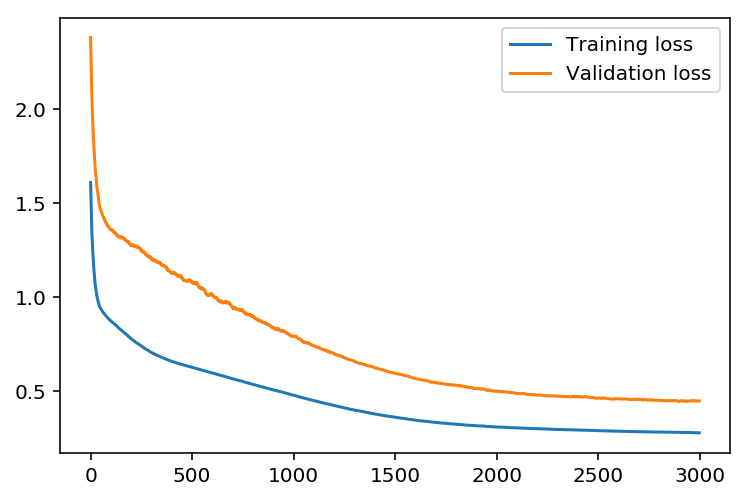

In [195]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## Check out your predictions

Here, use the test data to view how well your network is modeling the data. If something is completely wrong here, make sure each step in your network is implemented correctly.

/Users/hementsharma/anaconda/envs/dlnd/lib/python3.6/site-packages/ipykernel_launcher.py:10: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate_ix
  # Remove the CWD from sys.path while we load stuff.


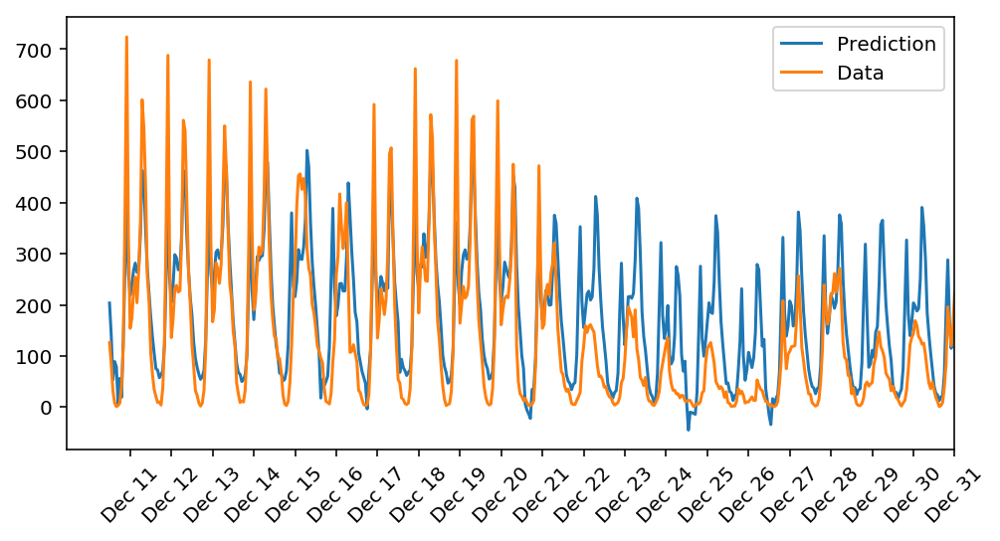

In [196]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.ix[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## OPTIONAL: Thinking about your results(this question will not be evaluated in the rubric).
 
Answer these questions about your results. How well does the model predict the data? Where does it fail? Why does it fail where it does?

> **Note:** You can edit the text in this cell by double clicking on it. When you want to render the text, press control + enter

#### Your answer below